# Bibliotecas

In [1]:
# Bibliotecas gerais
import os
import time
from datetime import datetime
from getpass import getpass
from IPython.display import display
import html
from pathlib import Path
import json
import math
import shutil
import unicodedata
import re
import warnings
warnings.filterwarnings("ignore")

# Bibliotecas de dados
import pandas as pd
pd.set_option('display.precision', 10)
pd.set_option("display.max_columns", 200)
pd.set_option("display.width", 200)

import numpy as np
import matplotlib.pyplot as plt
import yfinance as yf

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from scipy.cluster.hierarchy import linkage, fcluster, leaves_list
from scipy.optimize import minimize
from scipy.spatial.distance import squareform

from scipy.stats import wilcoxon, mannwhitneyu

# 1) Configurações Iniciais + Estrutura Base

In [2]:
%%time
# ==========================================================
# ETAPA 1 - CONFIGURAÇÕES INICIAIS E ESTRUTURA BASE
# PROJETO: ANÁLISE GLOBAL DE MERCADOS + ETFs + OURO + BTC + PETRÓLEO
# ==========================================================

# ==========================================================
# 1) CONFIGURAÇÕES GERAIS DO PROJETO
# ==========================================================

print("=" * 90)
print("INICIANDO ETAPA 1 - CONFIGURAÇÕES E ESTRUTURA BASE DO PROJETO")
print("=" * 90)

NOME_PROJETO = "analise_global_mercados_etfs_brl"
DATA_EXECUCAO = datetime.now().strftime("%Y-%m-%d %H:%M:%S")

# Diretório raiz do projeto
# Se quiser, depois você pode trocar para um caminho absoluto
DIR_RAIZ = Path(".")

# Estrutura de pastas pensada para o projeto inteiro
DIR_DADOS = DIR_RAIZ / "dados"
DIR_RAW = DIR_DADOS / "raw"
DIR_PROCESSED = DIR_DADOS / "processed"

DIR_RESULTADOS = DIR_RAIZ / "resultados"
DIR_TABELAS = DIR_RESULTADOS / "tabelas"
DIR_GRAFICOS = DIR_RESULTADOS / "graficos"
DIR_DADOS_INTERMEDIARIOS = DIR_RESULTADOS / "dados_intermediarios"
DIR_HTML_SUPPORT = DIR_RESULTADOS / "html_support"

DIR_ASSETS = DIR_RAIZ / "assets"
DIR_ASSETS_CSS = DIR_ASSETS / "css"
DIR_ASSETS_JS = DIR_ASSETS / "js"

# Lista única para facilitar criação/checagem
LISTA_DIRETORIOS = [
    DIR_DADOS,
    DIR_RAW,
    DIR_PROCESSED,
    DIR_RESULTADOS,
    DIR_TABELAS,
    DIR_GRAFICOS,
    DIR_DADOS_INTERMEDIARIOS,
    DIR_HTML_SUPPORT,
    DIR_ASSETS,
    DIR_ASSETS_CSS,
    DIR_ASSETS_JS
]

# ==========================================================
# 2) FUNÇÕES UTILITÁRIAS BASE
# ==========================================================

def criar_diretorios(lista_diretorios):
    """
    ==========================================================
    Descrição:
    Cria, caso não existam, todos os diretórios necessários
    para a estrutura do projeto.

    Parâmetros:
    - lista_diretorios: lista com objetos Path ou strings

    Processo:
    - percorre a lista
    - cria cada pasta com parents=True
    - evita erro caso a pasta já exista

    Retorno:
    - None
    ==========================================================
    """
    print("\n[1/4] Criando/verificando diretórios do projeto...")
    for diretorio in lista_diretorios:
        Path(diretorio).mkdir(parents=True, exist_ok=True)
        print(f"   OK -> {diretorio}")
    print("Diretórios verificados com sucesso.")


def normalizar_texto(texto):
    """
    ==========================================================
    Descrição:
    Normaliza texto removendo acentos, espaços extras e
    caracteres problemáticos, útil para nomes de arquivos,
    colunas e chaves padronizadas.

    Parâmetros:
    - texto: valor textual qualquer

    Processo:
    - converte para string
    - remove acentos
    - transforma em minúsculo
    - troca espaços por underscore
    - remove caracteres especiais redundantes

    Retorno:
    - texto normalizado em formato string
    ==========================================================
    """
    if pd.isna(texto):
        return ""
    
    texto = str(texto).strip().lower()
    texto = unicodedata.normalize("NFKD", texto).encode("ASCII", "ignore").decode("utf-8")
    texto = re.sub(r"\s+", "_", texto)
    texto = re.sub(r"[^a-zA-Z0-9_]+", "", texto)
    texto = re.sub(r"_+", "_", texto).strip("_")
    return texto


def salvar_csv(df, caminho, index=True):
    """
    ==========================================================
    Descrição:
    Salva DataFrame em CSV com mensagem padronizada.

    Parâmetros:
    - df: DataFrame
    - caminho: caminho final do arquivo
    - index: se salva índice ou não

    Retorno:
    - None
    ==========================================================
    """
    caminho = Path(caminho)
    caminho.parent.mkdir(parents=True, exist_ok=True)
    df.to_csv(caminho, index=index, encoding="utf-8-sig")
    print(f"   CSV salvo em: {caminho}")


def salvar_parquet(df, caminho, index=True):
    """
    ==========================================================
    Descrição:
    Salva DataFrame em parquet com mensagem padronizada.

    Parâmetros:
    - df: DataFrame
    - caminho: caminho final do arquivo
    - index: se salva índice ou não

    Retorno:
    - None
    ==========================================================
    """
    caminho = Path(caminho)
    caminho.parent.mkdir(parents=True, exist_ok=True)
    df.to_parquet(caminho, index=index)
    print(f"   Parquet salvo em: {caminho}")


def salvar_html_tabela(df, caminho, index=True):
    """
    ==========================================================
    Descrição:
    Exporta um DataFrame como HTML simples para uso posterior
    no relatório final.

    Parâmetros:
    - df: DataFrame
    - caminho: caminho do arquivo .html
    - index: incluir índice ou não

    Processo:
    - exporta tabela em HTML
    - adiciona classes CSS simples para estilização posterior

    Retorno:
    - None
    ==========================================================
    """
    caminho = Path(caminho)
    caminho.parent.mkdir(parents=True, exist_ok=True)
    html_str = df.to_html(index=index, border=0, classes=["tabela-projeto", "table", "table-striped"])
    with open(caminho, "w", encoding="utf-8") as f:
        f.write(html_str)
    print(f"   HTML da tabela salvo em: {caminho}")


def salvar_figura(caminho, dpi=150, bbox_inches="tight"):
    """
    ==========================================================
    Descrição:
    Salva a figura atual do matplotlib com padrão único.

    Parâmetros:
    - caminho: caminho final do arquivo
    - dpi: resolução da imagem
    - bbox_inches: ajuste de borda

    Retorno:
    - None
    ==========================================================
    """
    caminho = Path(caminho)
    caminho.parent.mkdir(parents=True, exist_ok=True)
    plt.savefig(caminho, dpi=dpi, bbox_inches=bbox_inches)
    print(f"   Figura salva em: {caminho}")


def padronizar_dataframe(df):
    """
    ==========================================================
    Descrição:
    Padroniza nomes de colunas de um DataFrame para evitar
    problemas ao longo do projeto.

    Parâmetros:
    - df: DataFrame original

    Processo:
    - copia o DataFrame
    - aplica normalização nas colunas

    Retorno:
    - df_padronizado
    ==========================================================
    """
    df = df.copy()
    df.columns = [normalizar_texto(col) for col in df.columns]
    return df


# ==========================================================
# 3) CRIAÇÃO DA ESTRUTURA DE PASTAS
# ==========================================================

criar_diretorios(LISTA_DIRETORIOS)

# ==========================================================
# 4) MANIFESTO INICIAL DO PROJETO
# ==========================================================

print("\n[2/4] Gerando manifesto inicial do projeto...")

df_manifesto_inicial = pd.DataFrame({
    "projeto": [NOME_PROJETO],
    "data_execucao": [DATA_EXECUCAO],
    "dir_raiz": [str(DIR_RAIZ.resolve())],
    "dados_raw": [str(DIR_RAW)],
    "dados_processed": [str(DIR_PROCESSED)],
    "resultados_tabelas": [str(DIR_TABELAS)],
    "resultados_graficos": [str(DIR_GRAFICOS)],
    "resultados_dados_intermediarios": [str(DIR_DADOS_INTERMEDIARIOS)],
    "resultados_html_support": [str(DIR_HTML_SUPPORT)]
})

salvar_csv(df_manifesto_inicial, DIR_RESULTADOS / "manifesto_inicial_projeto.csv", index=False)
salvar_html_tabela(df_manifesto_inicial, DIR_TABELAS / "manifesto_inicial_projeto.html", index=False)

# ==========================================================
# 5) TABELA-RESUMO DA ESTRUTURA DO PROJETO
# ==========================================================

print("\n[3/4] Montando tabela-resumo da estrutura do projeto...")

df_estrutura_projeto = pd.DataFrame({
    "ordem": list(range(1, len(LISTA_DIRETORIOS) + 1)),
    "diretorio": [str(p) for p in LISTA_DIRETORIOS],
    "descricao": [
        "Pasta principal de dados",
        "Dados brutos baixados das fontes",
        "Dados tratados e padronizados",
        "Pasta principal de resultados",
        "Tabelas finais e intermediárias",
        "Gráficos finais e intermediários",
        "Arquivos auxiliares em parquet/csv",
        "Arquivos de apoio ao HTML final",
        "Assets gerais do projeto",
        "CSS do HTML final",
        "JavaScript do HTML final"
    ]
})

salvar_csv(df_estrutura_projeto, DIR_TABELAS / "estrutura_projeto.csv", index=False)
salvar_html_tabela(df_estrutura_projeto, DIR_TABELAS / "estrutura_projeto.html", index=False)

# ==========================================================
# 6) CONFIGURAÇÕES VISUAIS PADRÃO DOS GRÁFICOS
# ==========================================================

print("\n[4/4] Aplicando configurações visuais padrão dos gráficos...")

plt.rcParams["figure.figsize"] = (12, 6)
plt.rcParams["axes.grid"] = True
plt.rcParams["grid.alpha"] = 0.3
plt.rcParams["axes.titlesize"] = 14
plt.rcParams["axes.labelsize"] = 11
plt.rcParams["legend.fontsize"] = 10

# ==========================================================
# 7) RESUMO FINAL DA ETAPA
# ==========================================================

print("\n" + "=" * 90)
print("ETAPA 1 CONCLUÍDA COM SUCESSO")
print("=" * 90)
print("Itens entregues nesta etapa:")
print("- Configurações iniciais carregados")
print("- Estrutura de diretórios criada")
print("- Funções utilitárias base criadas")
print("- Manifesto inicial do projeto salvo")
print("- Tabela da estrutura do projeto salva")
print("\nArquivos gerados:")
print(f"  -> {DIR_RESULTADOS / 'manifesto_inicial_projeto.csv'}")
print(f"  -> {DIR_TABELAS / 'manifesto_inicial_projeto.html'}")
print(f"  -> {DIR_TABELAS / 'estrutura_projeto.csv'}")
print(f"  -> {DIR_TABELAS / 'estrutura_projeto.html'}")

INICIANDO ETAPA 1 - CONFIGURAÇÕES E ESTRUTURA BASE DO PROJETO

[1/4] Criando/verificando diretórios do projeto...
   OK -> dados
   OK -> dados\raw
   OK -> dados\processed
   OK -> resultados
   OK -> resultados\tabelas
   OK -> resultados\graficos
   OK -> resultados\dados_intermediarios
   OK -> resultados\html_support
   OK -> assets
   OK -> assets\css
   OK -> assets\js
Diretórios verificados com sucesso.

[2/4] Gerando manifesto inicial do projeto...
   CSV salvo em: resultados\manifesto_inicial_projeto.csv
   HTML da tabela salvo em: resultados\tabelas\manifesto_inicial_projeto.html

[3/4] Montando tabela-resumo da estrutura do projeto...
   CSV salvo em: resultados\tabelas\estrutura_projeto.csv
   HTML da tabela salvo em: resultados\tabelas\estrutura_projeto.html

[4/4] Aplicando configurações visuais padrão dos gráficos...

ETAPA 1 CONCLUÍDA COM SUCESSO
Itens entregues nesta etapa:
- Configurações iniciais carregados
- Estrutura de diretórios criada
- Funções utilitárias base

# 2) Definição do Universo de Ativos

In [3]:
%%time
# ==========================================================
# ETAPA 2 - DEFINIÇÃO DO UNIVERSO DE ATIVOS DO PROJETO
# PROJETO: ANÁLISE GLOBAL DE MERCADOS + ETFs + OURO + BTC + PETRÓLEO
# ==========================================================

print("=" * 90)
print("INICIANDO ETAPA 2 - DEFINIÇÃO DO UNIVERSO DE ATIVOS")
print("=" * 90)

# ==========================================================
# 1) CADASTRO DOS ÍNDICES / SÉRIES DE REFERÊNCIA
# ==========================================================
#
# Observação importante:
# - Aqui estamos definindo o universo-base que será testado depois.
# - Alguns tickers podem eventualmente ter limitações de histórico no Yahoo.
# - Isso será validado na etapa de download.
# - Nesta etapa, o foco é estruturar o universo analisado de forma organizada.
#
# Convenções:
# - ticker_yahoo: ticker principal que tentaremos usar no yfinance
# - classe: grupo amplo do ativo
# - tipo_ativo: indice / commodity / cripto / cambio
# - regiao: localização principal
# - moeda_original: moeda em que o ativo é originalmente cotado
# - categoria_html: agrupamento amigável para o HTML final

lista_indices = [
    # -------------------------
    # BRASIL
    # -------------------------
    {
        "nome_ativo": "Ibovespa",
        "ticker_yahoo": "^BVSP",
        "classe": "Equity Index",
        "subclasse": "Broad Market",
        "regiao": "Brasil",
        "pais": "Brasil",
        "moeda_original": "BRL",
        "tipo_ativo": "indice",
        "categoria_html": "Indices Globais",
        "observacoes": "Principal índice de ações do Brasil"
    },
    {
        "nome_ativo": "Small Caps Brasil",
        "ticker_yahoo": "SMLL.SA",
        "classe": "Equity Index",
        "subclasse": "Small Caps",
        "regiao": "Brasil",
        "pais": "Brasil",
        "moeda_original": "BRL",
        "tipo_ativo": "indice",
        "categoria_html": "Indices Globais",
        "observacoes": "Proxy de small caps brasileiras"
    },

    # -------------------------
    # EUA
    # -------------------------
    {
        "nome_ativo": "S&P 500",
        "ticker_yahoo": "^GSPC",
        "classe": "Equity Index",
        "subclasse": "Broad Market",
        "regiao": "America do Norte",
        "pais": "Estados Unidos",
        "moeda_original": "USD",
        "tipo_ativo": "indice",
        "categoria_html": "Indices Globais",
        "observacoes": "Principal índice amplo dos EUA"
    },
    {
        "nome_ativo": "Nasdaq 100",
        "ticker_yahoo": "^NDX",
        "classe": "Equity Index",
        "subclasse": "Tech/Growth",
        "regiao": "America do Norte",
        "pais": "Estados Unidos",
        "moeda_original": "USD",
        "tipo_ativo": "indice",
        "categoria_html": "Indices Globais",
        "observacoes": "Índice concentrado em tecnologia e growth"
    },

    # -------------------------
    # AMÉRICA LATINA
    # -------------------------
    {
        "nome_ativo": "Mexico IPC",
        "ticker_yahoo": "^MXX",
        "classe": "Equity Index",
        "subclasse": "Broad Market",
        "regiao": "America Latina",
        "pais": "Mexico",
        "moeda_original": "MXN",
        "tipo_ativo": "indice",
        "categoria_html": "Indices Globais",
        "observacoes": "Principal índice do México"
    },
    {
        "nome_ativo": "Chile IPSA",
        "ticker_yahoo": "^IPSA",
        "classe": "Equity Index",
        "subclasse": "Broad Market",
        "regiao": "America Latina",
        "pais": "Chile",
        "moeda_original": "CLP",
        "tipo_ativo": "indice",
        "categoria_html": "Indices Globais",
        "observacoes": "Principal índice do Chile"
    },

    # -------------------------
    # EUROPA
    # -------------------------
    {
        "nome_ativo": "Euro Stoxx 50",
        "ticker_yahoo": "^STOXX50E",
        "classe": "Equity Index",
        "subclasse": "Broad Market",
        "regiao": "Europa",
        "pais": "Zona do Euro",
        "moeda_original": "EUR",
        "tipo_ativo": "indice",
        "categoria_html": "Indices Globais",
        "observacoes": "Índice de grandes empresas da zona do euro"
    },
    {
        "nome_ativo": "FTSE 100",
        "ticker_yahoo": "^FTSE",
        "classe": "Equity Index",
        "subclasse": "Broad Market",
        "regiao": "Europa",
        "pais": "Reino Unido",
        "moeda_original": "GBP",
        "tipo_ativo": "indice",
        "categoria_html": "Indices Globais",
        "observacoes": "Principal índice do Reino Unido"
    },
    {
        "nome_ativo": "DAX",
        "ticker_yahoo": "^GDAXI",
        "classe": "Equity Index",
        "subclasse": "Broad Market",
        "regiao": "Europa",
        "pais": "Alemanha",
        "moeda_original": "EUR",
        "tipo_ativo": "indice",
        "categoria_html": "Indices Globais",
        "observacoes": "Principal índice da Alemanha"
    },

    # -------------------------
    # ÁSIA
    # -------------------------
    {
        "nome_ativo": "Nikkei 225",
        "ticker_yahoo": "^N225",
        "classe": "Equity Index",
        "subclasse": "Broad Market",
        "regiao": "Asia",
        "pais": "Japao",
        "moeda_original": "JPY",
        "tipo_ativo": "indice",
        "categoria_html": "Indices Globais",
        "observacoes": "Principal índice do Japão"
    },
    {
        "nome_ativo": "Shanghai Composite",
        "ticker_yahoo": "000001.SS",
        "classe": "Equity Index",
        "subclasse": "Broad Market",
        "regiao": "Asia",
        "pais": "China",
        "moeda_original": "CNY",
        "tipo_ativo": "indice",
        "categoria_html": "Indices Globais",
        "observacoes": "Índice amplo da bolsa de Xangai"
    },
    {
        "nome_ativo": "Hang Seng",
        "ticker_yahoo": "^HSI",
        "classe": "Equity Index",
        "subclasse": "Broad Market",
        "regiao": "Asia",
        "pais": "Hong Kong",
        "moeda_original": "HKD",
        "tipo_ativo": "indice",
        "categoria_html": "Indices Globais",
        "observacoes": "Principal índice de Hong Kong"
    },
    {
        "nome_ativo": "Kospi",
        "ticker_yahoo": "^KS11",
        "classe": "Equity Index",
        "subclasse": "Broad Market",
        "regiao": "Asia",
        "pais": "Coreia do Sul",
        "moeda_original": "KRW",
        "tipo_ativo": "indice",
        "categoria_html": "Indices Globais",
        "observacoes": "Principal índice da Coreia do Sul"
    },
    {
        "nome_ativo": "Nifty 50",
        "ticker_yahoo": "^NSEI",
        "classe": "Equity Index",
        "subclasse": "Broad Market",
        "regiao": "Asia",
        "pais": "India",
        "moeda_original": "INR",
        "tipo_ativo": "indice",
        "categoria_html": "Indices Globais",
        "observacoes": "Principal índice da Índia"
    },
    {
        "nome_ativo": "Taiwan Weighted",
        "ticker_yahoo": "^TWII",
        "classe": "Equity Index",
        "subclasse": "Broad Market",
        "regiao": "Asia",
        "pais": "Taiwan",
        "moeda_original": "TWD",
        "tipo_ativo": "indice",
        "categoria_html": "Indices Globais",
        "observacoes": "Principal índice de Taiwan"
    },

    # -------------------------
    # OCEANIA
    # -------------------------
    {
        "nome_ativo": "ASX 200",
        "ticker_yahoo": "^AXJO",
        "classe": "Equity Index",
        "subclasse": "Broad Market",
        "regiao": "Oceania",
        "pais": "Australia",
        "moeda_original": "AUD",
        "tipo_ativo": "indice",
        "categoria_html": "Indices Globais",
        "observacoes": "Principal índice amplo da Austrália"
    },
    {
        "nome_ativo": "NZX 50",
        "ticker_yahoo": "^NZ50",
        "classe": "Equity Index",
        "subclasse": "Broad Market",
        "regiao": "Oceania",
        "pais": "Nova Zelandia",
        "moeda_original": "NZD",
        "tipo_ativo": "indice",
        "categoria_html": "Indices Globais",
        "observacoes": "Principal índice da Nova Zelândia"
    },

    # -------------------------
    # ÁFRICA
    # -------------------------
    {
        "nome_ativo": "South Africa Top 40",
        "ticker_yahoo": "^JN0U.JO",
        "classe": "Equity Index",
        "subclasse": "Broad Market",
        "regiao": "Africa",
        "pais": "Africa do Sul",
        "moeda_original": "ZAR",
        "tipo_ativo": "indice",
        "categoria_html": "Indices Globais",
        "observacoes": "Proxy do mercado acionário sul-africano"
    }
]

# ==========================================================
# 2) CADASTRO DOS ETFs INVESTÍVEIS
# ==========================================================
#
# Aqui optamos por ETFs internacionais em USD, evitando misturar
# com BDR ETFs da B3, pois o objetivo é avaliar exposição global
# com conversão posterior para BRL.
#
# A ideia é ter:
# - ETFs core
# - ETFs regionais
# - ETFs temáticos/alternativos
# - ETFs de ouro, bitcoin e petróleo

lista_etfs = [
    # -------------------------
    # BRASIL
    # -------------------------
    {
        "nome_ativo": "iShares Ibovespa ETF",
        "ticker_yahoo": "BOVA11.SA",
        "classe": "ETF",
        "subclasse": "Brasil Broad Market",
        "regiao": "Brasil",
        "pais": "Brasil",
        "moeda_original": "BRL",
        "tipo_ativo": "etf",
        "categoria_html": "ETFs Investiveis",
        "observacoes": "ETF do Ibovespa"
    },
    {
        "nome_ativo": "iShares Small Caps ETF",
        "ticker_yahoo": "SMAL11.SA",
        "classe": "ETF",
        "subclasse": "Brasil Small Caps",
        "regiao": "Brasil",
        "pais": "Brasil",
        "moeda_original": "BRL",
        "tipo_ativo": "etf",
        "categoria_html": "ETFs Investiveis",
        "observacoes": "ETF de Small Caps Brasil"
    },

    # -------------------------
    # CORE / GLOBAIS
    # -------------------------
    {
        "nome_ativo": "Vanguard Total World Stock ETF",
        "ticker_yahoo": "VT",
        "classe": "ETF",
        "subclasse": "Global Equity",
        "regiao": "Global",
        "pais": "Global",
        "moeda_original": "USD",
        "tipo_ativo": "etf",
        "categoria_html": "ETFs Investiveis",
        "observacoes": "ETF global amplo"
    },
    {
        "nome_ativo": "iShares MSCI ACWI ETF",
        "ticker_yahoo": "ACWI",
        "classe": "ETF",
        "subclasse": "Global Equity",
        "regiao": "Global",
        "pais": "Global",
        "moeda_original": "USD",
        "tipo_ativo": "etf",
        "categoria_html": "ETFs Investiveis",
        "observacoes": "ETF global amplo alternativo"
    },
    {
        "nome_ativo": "Vanguard FTSE Developed Markets ETF",
        "ticker_yahoo": "VEA",
        "classe": "ETF",
        "subclasse": "Developed Markets",
        "regiao": "Global",
        "pais": "Desenvolvidos",
        "moeda_original": "USD",
        "tipo_ativo": "etf",
        "categoria_html": "ETFs Investiveis",
        "observacoes": "Mercados desenvolvidos ex-EUA"
    },
    {
        "nome_ativo": "iShares Core MSCI Emerging Markets ETF",
        "ticker_yahoo": "IEMG",
        "classe": "ETF",
        "subclasse": "Emerging Markets",
        "regiao": "Emergentes",
        "pais": "Emergentes",
        "moeda_original": "USD",
        "tipo_ativo": "etf",
        "categoria_html": "ETFs Investiveis",
        "observacoes": "ETF amplo de mercados emergentes"
    },

    # -------------------------
    # EUA
    # -------------------------
    {
        "nome_ativo": "SPDR S&P 500 ETF",
        "ticker_yahoo": "SPY",
        "classe": "ETF",
        "subclasse": "US Broad Market",
        "regiao": "America do Norte",
        "pais": "Estados Unidos",
        "moeda_original": "USD",
        "tipo_ativo": "etf",
        "categoria_html": "ETFs Investiveis",
        "observacoes": "ETF clássico do S&P 500"
    },
    {
        "nome_ativo": "Invesco QQQ Trust",
        "ticker_yahoo": "QQQ",
        "classe": "ETF",
        "subclasse": "US Tech/Growth",
        "regiao": "America do Norte",
        "pais": "Estados Unidos",
        "moeda_original": "USD",
        "tipo_ativo": "etf",
        "categoria_html": "ETFs Investiveis",
        "observacoes": "ETF Nasdaq/tecnologia"
    },

    # -------------------------
    # AMÉRICA LATINA
    # -------------------------
    {
        "nome_ativo": "iShares MSCI Mexico ETF",
        "ticker_yahoo": "EWW",
        "classe": "ETF",
        "subclasse": "Mexico",
        "regiao": "America Latina",
        "pais": "Mexico",
        "moeda_original": "USD",
        "tipo_ativo": "etf",
        "categoria_html": "ETFs Investiveis",
        "observacoes": "ETF do México"
    },
    {
        "nome_ativo": "iShares MSCI Chile ETF",
        "ticker_yahoo": "ECH",
        "classe": "ETF",
        "subclasse": "Chile",
        "regiao": "America Latina",
        "pais": "Chile",
        "moeda_original": "USD",
        "tipo_ativo": "etf",
        "categoria_html": "ETFs Investiveis",
        "observacoes": "ETF do Chile"
    },
    {
        "nome_ativo": "Global X MSCI Argentina ETF",
        "ticker_yahoo": "ARGT",
        "classe": "ETF",
        "subclasse": "Argentina",
        "regiao": "America Latina",
        "pais": "Argentina",
        "moeda_original": "USD",
        "tipo_ativo": "etf",
        "categoria_html": "ETFs Investiveis",
        "observacoes": "ETF da Argentina"
    },

    # -------------------------
    # EUROPA / JAPÃO / ÁSIA
    # -------------------------
    {
        "nome_ativo": "SPDR EURO STOXX 50 ETF",
        "ticker_yahoo": "FEZ",
        "classe": "ETF",
        "subclasse": "Zona do Euro",
        "regiao": "Europa",
        "pais": "Zona do Euro",
        "moeda_original": "USD",
        "tipo_ativo": "etf",
        "categoria_html": "ETFs Investiveis",
        "observacoes": "ETF amplo da zona do euro"
    },
    {
        "nome_ativo": "iShares MSCI United Kingdom ETF",
        "ticker_yahoo": "EWU",
        "classe": "ETF",
        "subclasse": "Reino Unido",
        "regiao": "Europa",
        "pais": "Reino Unido",
        "moeda_original": "USD",
        "tipo_ativo": "etf",
        "categoria_html": "ETFs Investiveis",
        "observacoes": "ETF do Reino Unido"
    },
    {
        "nome_ativo": "iShares MSCI Germany ETF",
        "ticker_yahoo": "EWG",
        "classe": "ETF",
        "subclasse": "Alemanha",
        "regiao": "Europa",
        "pais": "Alemanha",
        "moeda_original": "USD",
        "tipo_ativo": "etf",
        "categoria_html": "ETFs Investiveis",
        "observacoes": "ETF da Alemanha"
    },
    {
        "nome_ativo": "iShares MSCI Japan ETF",
        "ticker_yahoo": "EWJ",
        "classe": "ETF",
        "subclasse": "Japao",
        "regiao": "Asia",
        "pais": "Japao",
        "moeda_original": "USD",
        "tipo_ativo": "etf",
        "categoria_html": "ETFs Investiveis",
        "observacoes": "ETF amplo do Japão"
    },
    {
        "nome_ativo": "iShares MSCI China ETF",
        "ticker_yahoo": "MCHI",
        "classe": "ETF",
        "subclasse": "China",
        "regiao": "Asia",
        "pais": "China",
        "moeda_original": "USD",
        "tipo_ativo": "etf",
        "categoria_html": "ETFs Investiveis",
        "observacoes": "ETF amplo da China"
    },
    {
        "nome_ativo": "iShares MSCI Hong Kong ETF",
        "ticker_yahoo": "EWH",
        "classe": "ETF",
        "subclasse": "Hong Kong",
        "regiao": "Asia",
        "pais": "Hong Kong",
        "moeda_original": "USD",
        "tipo_ativo": "etf",
        "categoria_html": "ETFs Investiveis",
        "observacoes": "ETF de Hong Kong"
    },
    {
        "nome_ativo": "iShares MSCI South Korea ETF",
        "ticker_yahoo": "EWY",
        "classe": "ETF",
        "subclasse": "Coreia do Sul",
        "regiao": "Asia",
        "pais": "Coreia do Sul",
        "moeda_original": "USD",
        "tipo_ativo": "etf",
        "categoria_html": "ETFs Investiveis",
        "observacoes": "ETF da Coreia do Sul"
    },
    {
        "nome_ativo": "iShares MSCI India ETF",
        "ticker_yahoo": "INDA",
        "classe": "ETF",
        "subclasse": "India",
        "regiao": "Asia",
        "pais": "India",
        "moeda_original": "USD",
        "tipo_ativo": "etf",
        "categoria_html": "ETFs Investiveis",
        "observacoes": "ETF da Índia"
    },
    {
        "nome_ativo": "iShares MSCI Taiwan ETF",
        "ticker_yahoo": "EWT",
        "classe": "ETF",
        "subclasse": "Taiwan",
        "regiao": "Asia",
        "pais": "Taiwan",
        "moeda_original": "USD",
        "tipo_ativo": "etf",
        "categoria_html": "ETFs Investiveis",
        "observacoes": "ETF de Taiwan"
    },

    # -------------------------
    # OCEANIA / ÁFRICA
    # -------------------------
    {
        "nome_ativo": "iShares MSCI Australia ETF",
        "ticker_yahoo": "EWA",
        "classe": "ETF",
        "subclasse": "Australia",
        "regiao": "Oceania",
        "pais": "Australia",
        "moeda_original": "USD",
        "tipo_ativo": "etf",
        "categoria_html": "ETFs Investiveis",
        "observacoes": "ETF da Austrália"
    },
    {
        "nome_ativo": "iShares MSCI New Zealand ETF",
        "ticker_yahoo": "ENZL",
        "classe": "ETF",
        "subclasse": "Nova Zelandia",
        "regiao": "Oceania",
        "pais": "Nova Zelandia",
        "moeda_original": "USD",
        "tipo_ativo": "etf",
        "categoria_html": "ETFs Investiveis",
        "observacoes": "ETF da Nova Zelândia"
    },
    {
        "nome_ativo": "iShares MSCI South Africa ETF",
        "ticker_yahoo": "EZA",
        "classe": "ETF",
        "subclasse": "Africa do Sul",
        "regiao": "Africa",
        "pais": "Africa do Sul",
        "moeda_original": "USD",
        "tipo_ativo": "etf",
        "categoria_html": "ETFs Investiveis",
        "observacoes": "ETF da África do Sul"
    },

    # -------------------------
    # ALTERNATIVOS
    # -------------------------
    {
        "nome_ativo": "SPDR Gold Shares",
        "ticker_yahoo": "GLD",
        "classe": "ETF",
        "subclasse": "Ouro",
        "regiao": "Global",
        "pais": "Global",
        "moeda_original": "USD",
        "tipo_ativo": "etf",
        "categoria_html": "ETFs Investiveis",
        "observacoes": "ETF de ouro físico/proxy"
    },
    {
        "nome_ativo": "iShares Bitcoin Trust",
        "ticker_yahoo": "IBIT",
        "classe": "ETF",
        "subclasse": "Bitcoin",
        "regiao": "Global",
        "pais": "Global",
        "moeda_original": "USD",
        "tipo_ativo": "etf",
        "categoria_html": "ETFs Investiveis",
        "observacoes": "ETF spot de bitcoin; histórico será mais curto"
    },
    {
        "nome_ativo": "United States Oil Fund",
        "ticker_yahoo": "USO",
        "classe": "ETF",
        "subclasse": "Petroleo",
        "regiao": "Global",
        "pais": "Global",
        "moeda_original": "USD",
        "tipo_ativo": "etf",
        "categoria_html": "ETFs Investiveis",
        "observacoes": "ETF proxy para petróleo"
    },
    {
        "nome_ativo": "Energy Select Sector SPDR Fund",
        "ticker_yahoo": "XLE",
        "classe": "ETF",
        "subclasse": "Energia",
        "regiao": "America do Norte",
        "pais": "Estados Unidos",
        "moeda_original": "USD",
        "tipo_ativo": "etf",
        "categoria_html": "ETFs Investiveis",
        "observacoes": "ETF de energia para comparação com petróleo"
    }
]

# ==========================================================
# 3) CADASTRO DOS ATIVOS ALTERNATIVOS DIRETOS E CÂMBIO
# ==========================================================

lista_alternativos = [
    {
        "nome_ativo": "Ouro Spot/Front",
        "ticker_yahoo": "GC=F",
        "classe": "Commodity",
        "subclasse": "Ouro",
        "regiao": "Global",
        "pais": "Global",
        "moeda_original": "USD",
        "tipo_ativo": "commodity",
        "categoria_html": "Alternativos",
        "observacoes": "Contrato futuro/proxy de ouro no Yahoo"
    },
    {
        "nome_ativo": "Bitcoin USD",
        "ticker_yahoo": "BTC-USD",
        "classe": "Crypto",
        "subclasse": "Bitcoin",
        "regiao": "Global",
        "pais": "Global",
        "moeda_original": "USD",
        "tipo_ativo": "cripto",
        "categoria_html": "Alternativos",
        "observacoes": "Preço do bitcoin em USD"
    },
    {
        "nome_ativo": "Brent Crude Oil",
        "ticker_yahoo": "BZ=F",
        "classe": "Commodity",
        "subclasse": "Petroleo",
        "regiao": "Global",
        "pais": "Global",
        "moeda_original": "USD",
        "tipo_ativo": "commodity",
        "categoria_html": "Alternativos",
        "observacoes": "Contrato/proxy do Brent no Yahoo"
    },
    {
        "nome_ativo": "USDBRL",
        "ticker_yahoo": "BRL=X",
        "classe": "FX",
        "subclasse": "Cambio",
        "regiao": "Brasil",
        "pais": "Brasil",
        "moeda_original": "BRL",
        "tipo_ativo": "cambio",
        "categoria_html": "Cambio",
        "observacoes": "Série de câmbio no Yahoo; normalmente BRL por USD"
    }
]

# ==========================================================
# 4) MONTAGEM DOS DATAFRAMES MESTRES
# ==========================================================

print("\n[1/6] Montando DataFrames mestres do universo de ativos...")

df_indices = pd.DataFrame(lista_indices)
df_etfs = pd.DataFrame(lista_etfs)
df_alternativos = pd.DataFrame(lista_alternativos)

# Padronização opcional de nomes de colunas
df_indices = padronizar_dataframe(df_indices)
df_etfs = padronizar_dataframe(df_etfs)
df_alternativos = padronizar_dataframe(df_alternativos)

# Adiciona coluna de grupo lógico
df_indices["grupo_universo"] = "indices"
df_etfs["grupo_universo"] = "etfs"
df_alternativos["grupo_universo"] = "alternativos"

# Consolidação geral
df_universo_total = pd.concat(
    [df_indices, df_etfs, df_alternativos],
    ignore_index=True
)

# Coluna auxiliar para controle futuro
df_universo_total["nome_ativo_slug"] = df_universo_total["nome_ativo"].apply(normalizar_texto)
df_universo_total["ticker_slug"] = df_universo_total["ticker_yahoo"].apply(normalizar_texto)

print("DataFrames mestres criados com sucesso.")

# ==========================================================
# 5) TABELAS-RESUMO DO UNIVERSO
# ==========================================================

print("\n[2/6] Gerando tabelas-resumo do universo...")

df_resumo_grupos = (
    df_universo_total
    .groupby(["grupo_universo", "classe", "regiao"], dropna=False)
    .size()
    .reset_index(name="quantidade")
    .sort_values(["grupo_universo", "classe", "regiao"])
    .reset_index(drop=True)
)

df_resumo_moedas = (
    df_universo_total
    .groupby(["moeda_original", "grupo_universo"], dropna=False)
    .size()
    .reset_index(name="quantidade")
    .sort_values(["moeda_original", "grupo_universo"])
    .reset_index(drop=True)
)

df_resumo_tipo = (
    df_universo_total
    .groupby(["tipo_ativo", "grupo_universo"], dropna=False)
    .size()
    .reset_index(name="quantidade")
    .sort_values(["tipo_ativo", "grupo_universo"])
    .reset_index(drop=True)
)

# ==========================================================
# 6) SALVAMENTO DOS ARQUIVOS
# ==========================================================

print("\n[3/6] Salvando arquivos do universo de ativos...")

# -------- Índices
salvar_csv(df_indices, DIR_TABELAS / "universo_indices.csv", index=False)
salvar_html_tabela(df_indices, DIR_TABELAS / "universo_indices.html", index=False)
salvar_parquet(df_indices, DIR_DADOS_INTERMEDIARIOS / "universo_indices.parquet", index=False)

# -------- ETFs
salvar_csv(df_etfs, DIR_TABELAS / "universo_etfs.csv", index=False)
salvar_html_tabela(df_etfs, DIR_TABELAS / "universo_etfs.html", index=False)
salvar_parquet(df_etfs, DIR_DADOS_INTERMEDIARIOS / "universo_etfs.parquet", index=False)

# -------- Alternativos
salvar_csv(df_alternativos, DIR_TABELAS / "universo_alternativos.csv", index=False)
salvar_html_tabela(df_alternativos, DIR_TABELAS / "universo_alternativos.html", index=False)
salvar_parquet(df_alternativos, DIR_DADOS_INTERMEDIARIOS / "universo_alternativos.parquet", index=False)

# -------- Consolidado
salvar_csv(df_universo_total, DIR_TABELAS / "universo_total_ativos.csv", index=False)
salvar_html_tabela(df_universo_total, DIR_TABELAS / "universo_total_ativos.html", index=False)
salvar_parquet(df_universo_total, DIR_DADOS_INTERMEDIARIOS / "universo_total_ativos.parquet", index=False)

# -------- Resumos
salvar_csv(df_resumo_grupos, DIR_TABELAS / "resumo_universo_por_grupo.csv", index=False)
salvar_html_tabela(df_resumo_grupos, DIR_TABELAS / "resumo_universo_por_grupo.html", index=False)

salvar_csv(df_resumo_moedas, DIR_TABELAS / "resumo_universo_por_moeda.csv", index=False)
salvar_html_tabela(df_resumo_moedas, DIR_TABELAS / "resumo_universo_por_moeda.html", index=False)

salvar_csv(df_resumo_tipo, DIR_TABELAS / "resumo_universo_por_tipo.csv", index=False)
salvar_html_tabela(df_resumo_tipo, DIR_TABELAS / "resumo_universo_por_tipo.html", index=False)

# ==========================================================
# 7) GERAÇÃO DE UM MANIFESTO DO UNIVERSO
# ==========================================================

print("\n[4/6] Gerando manifesto do universo analisado...")

df_manifesto_universo = pd.DataFrame({
    "bloco": [
        "indices",
        "etfs",
        "alternativos",
        "total"
    ],
    "quantidade_ativos": [
        len(df_indices),
        len(df_etfs),
        len(df_alternativos),
        len(df_universo_total)
    ],
    "arquivo_csv": [
        "resultados/tabelas/universo_indices.csv",
        "resultados/tabelas/universo_etfs.csv",
        "resultados/tabelas/universo_alternativos.csv",
        "resultados/tabelas/universo_total_ativos.csv"
    ],
    "arquivo_html": [
        "resultados/tabelas/universo_indices.html",
        "resultados/tabelas/universo_etfs.html",
        "resultados/tabelas/universo_alternativos.html",
        "resultados/tabelas/universo_total_ativos.html"
    ],
    "observacao": [
        "Índices e séries de referência para análise global",
        "ETFs investíveis para análise prática em BRL",
        "Ouro, bitcoin, petróleo e câmbio",
        "Base consolidada do universo do projeto"
    ]
})

salvar_csv(df_manifesto_universo, DIR_RESULTADOS / "manifesto_universo_ativos.csv", index=False)
salvar_html_tabela(df_manifesto_universo, DIR_TABELAS / "manifesto_universo_ativos.html", index=False)

# ==========================================================
# 8) EXIBIÇÃO DE PRÉVIA
# ==========================================================

print("\n[5/6] Exibindo prévias para validação rápida...")

print("\n--- df_indices ---")
display(df_indices.head(10))

print("\n--- df_etfs ---")
display(df_etfs.head(10))

print("\n--- df_alternativos ---")
display(df_alternativos.head(10))

print("\n--- df_universo_total (amostra) ---")
display(df_universo_total.head(15))

print("\n--- Resumo por grupo/classe/região ---")
display(df_resumo_grupos)

# ==========================================================
# 9) RESUMO FINAL DA ETAPA
# ==========================================================

print("\n[6/6] Finalizando etapa...")

print("\n" + "=" * 90)
print("ETAPA 2 CONCLUÍDA COM SUCESSO")
print("=" * 90)
print(f"Quantidade de índices cadastrados      : {len(df_indices)}")
print(f"Quantidade de ETFs cadastrados         : {len(df_etfs)}")
print(f"Quantidade de alternativos/câmbio      : {len(df_alternativos)}")
print(f"Quantidade total de ativos no universo : {len(df_universo_total)}")

print("\nPrincipais arquivos gerados:")
print(f"  -> {DIR_TABELAS / 'universo_indices.csv'}")
print(f"  -> {DIR_TABELAS / 'universo_etfs.csv'}")
print(f"  -> {DIR_TABELAS / 'universo_alternativos.csv'}")
print(f"  -> {DIR_TABELAS / 'universo_total_ativos.csv'}")
print(f"  -> {DIR_RESULTADOS / 'manifesto_universo_ativos.csv'}")

INICIANDO ETAPA 2 - DEFINIÇÃO DO UNIVERSO DE ATIVOS

[1/6] Montando DataFrames mestres do universo de ativos...
DataFrames mestres criados com sucesso.

[2/6] Gerando tabelas-resumo do universo...

[3/6] Salvando arquivos do universo de ativos...
   CSV salvo em: resultados\tabelas\universo_indices.csv
   HTML da tabela salvo em: resultados\tabelas\universo_indices.html
   Parquet salvo em: resultados\dados_intermediarios\universo_indices.parquet
   CSV salvo em: resultados\tabelas\universo_etfs.csv
   HTML da tabela salvo em: resultados\tabelas\universo_etfs.html
   Parquet salvo em: resultados\dados_intermediarios\universo_etfs.parquet
   CSV salvo em: resultados\tabelas\universo_alternativos.csv
   HTML da tabela salvo em: resultados\tabelas\universo_alternativos.html
   Parquet salvo em: resultados\dados_intermediarios\universo_alternativos.parquet
   CSV salvo em: resultados\tabelas\universo_total_ativos.csv
   HTML da tabela salvo em: resultados\tabelas\universo_total_ativos.html

,nome_ativo,ticker_yahoo,classe,subclasse,regiao,pais,moeda_original,tipo_ativo,categoria_html,observacoes,grupo_universo
0,Ibovespa,^BVSP,Equity Index,Broad Market,Brasil,Brasil,BRL,indice,Indices Globais,Principal índice de ações do Brasil,indices
1,Small Caps Brasil,SMLL.SA,Equity Index,Small Caps,Brasil,Brasil,BRL,indice,Indices Globais,Proxy de small caps brasileiras,indices
2,S&P 500,^GSPC,Equity Index,Broad Market,America do Norte,Estados Unidos,USD,indice,Indices Globais,Principal índice amplo dos EUA,indices
3,Nasdaq 100,^NDX,Equity Index,Tech/Growth,America do Norte,Estados Unidos,USD,indice,Indices Globais,Índice concentrado em tecnologia e growth,indices
4,Mexico IPC,^MXX,Equity Index,Broad Market,America Latina,Mexico,MXN,indice,Indices Globais,Principal índice do México,indices
5,Chile IPSA,^IPSA,Equity Index,Broad Market,America Latina,Chile,CLP,indice,Indices Globais,Principal índice do Chile,indices
6,Euro Stoxx 50,^STOXX50E,Equity Index,Broad Market,Europa,Zona do Euro,EUR,indice,Indices Globais,Índice de grandes empresas da zona do euro,indices
7,FTSE 100,^FTSE,Equity Index,Broad Market,Europa,Reino Unido,GBP,indice,Indices Globais,Principal índice do Reino Unido,indices
8,DAX,^GDAXI,Equity Index,Broad Market,Europa,Alemanha,EUR,indice,Indices Globais,Principal índice da Alemanha,indices
9,Nikkei 225,^N225,Equity Index,Broad Market,Asia,Japao,JPY,indice,Indices Globais,Principal índice do Japão,indices



--- df_etfs ---


,nome_ativo,ticker_yahoo,classe,subclasse,regiao,pais,moeda_original,tipo_ativo,categoria_html,observacoes,grupo_universo
0,iShares Ibovespa ETF,BOVA11.SA,ETF,Brasil Broad Market,Brasil,Brasil,BRL,etf,ETFs Investiveis,ETF do Ibovespa,etfs
1,iShares Small Caps ETF,SMAL11.SA,ETF,Brasil Small Caps,Brasil,Brasil,BRL,etf,ETFs Investiveis,ETF de Small Caps Brasil,etfs
2,Vanguard Total World Stock ETF,VT,ETF,Global Equity,Global,Global,USD,etf,ETFs Investiveis,ETF global amplo,etfs
3,iShares MSCI ACWI ETF,ACWI,ETF,Global Equity,Global,Global,USD,etf,ETFs Investiveis,ETF global amplo alternativo,etfs
4,Vanguard FTSE Developed Markets ETF,VEA,ETF,Developed Markets,Global,Desenvolvidos,USD,etf,ETFs Investiveis,Mercados desenvolvidos ex-EUA,etfs
5,iShares Core MSCI Emerging Markets ETF,IEMG,ETF,Emerging Markets,Emergentes,Emergentes,USD,etf,ETFs Investiveis,ETF amplo de mercados emergentes,etfs
6,SPDR S&P 500 ETF,SPY,ETF,US Broad Market,America do Norte,Estados Unidos,USD,etf,ETFs Investiveis,ETF clássico do S&P 500,etfs
7,Invesco QQQ Trust,QQQ,ETF,US Tech/Growth,America do Norte,Estados Unidos,USD,etf,ETFs Investiveis,ETF Nasdaq/tecnologia,etfs
8,iShares MSCI Mexico ETF,EWW,ETF,Mexico,America Latina,Mexico,USD,etf,ETFs Investiveis,ETF do México,etfs
9,iShares MSCI Chile ETF,ECH,ETF,Chile,America Latina,Chile,USD,etf,ETFs Investiveis,ETF do Chile,etfs



--- df_alternativos ---


,nome_ativo,ticker_yahoo,classe,subclasse,regiao,pais,moeda_original,tipo_ativo,categoria_html,observacoes,grupo_universo
0,Ouro Spot/Front,GC=F,Commodity,Ouro,Global,Global,USD,commodity,Alternativos,Contrato futuro/proxy de ouro no Yahoo,alternativos
1,Bitcoin USD,BTC-USD,Crypto,Bitcoin,Global,Global,USD,cripto,Alternativos,Preço do bitcoin em USD,alternativos
2,Brent Crude Oil,BZ=F,Commodity,Petroleo,Global,Global,USD,commodity,Alternativos,Contrato/proxy do Brent no Yahoo,alternativos
3,USDBRL,BRL=X,FX,Cambio,Brasil,Brasil,BRL,cambio,Cambio,Série de câmbio no Yahoo; normalmente BRL por USD,alternativos



--- df_universo_total (amostra) ---


,nome_ativo,ticker_yahoo,classe,subclasse,regiao,pais,moeda_original,tipo_ativo,categoria_html,observacoes,grupo_universo,nome_ativo_slug,ticker_slug
0,Ibovespa,^BVSP,Equity Index,Broad Market,Brasil,Brasil,BRL,indice,Indices Globais,Principal índice de ações do Brasil,indices,ibovespa,bvsp
1,Small Caps Brasil,SMLL.SA,Equity Index,Small Caps,Brasil,Brasil,BRL,indice,Indices Globais,Proxy de small caps brasileiras,indices,small_caps_brasil,smllsa
2,S&P 500,^GSPC,Equity Index,Broad Market,America do Norte,Estados Unidos,USD,indice,Indices Globais,Principal índice amplo dos EUA,indices,sp_500,gspc
3,Nasdaq 100,^NDX,Equity Index,Tech/Growth,America do Norte,Estados Unidos,USD,indice,Indices Globais,Índice concentrado em tecnologia e growth,indices,nasdaq_100,ndx
4,Mexico IPC,^MXX,Equity Index,Broad Market,America Latina,Mexico,MXN,indice,Indices Globais,Principal índice do México,indices,mexico_ipc,mxx
5,Chile IPSA,^IPSA,Equity Index,Broad Market,America Latina,Chile,CLP,indice,Indices Globais,Principal índice do Chile,indices,chile_ipsa,ipsa
6,Euro Stoxx 50,^STOXX50E,Equity Index,Broad Market,Europa,Zona do Euro,EUR,indice,Indices Globais,Índice de grandes empresas da zona do euro,indices,euro_stoxx_50,stoxx50e
7,FTSE 100,^FTSE,Equity Index,Broad Market,Europa,Reino Unido,GBP,indice,Indices Globais,Principal índice do Reino Unido,indices,ftse_100,ftse
8,DAX,^GDAXI,Equity Index,Broad Market,Europa,Alemanha,EUR,indice,Indices Globais,Principal índice da Alemanha,indices,dax,gdaxi
9,Nikkei 225,^N225,Equity Index,Broad Market,Asia,Japao,JPY,indice,Indices Globais,Principal índice do Japão,indices,nikkei_225,n225



--- Resumo por grupo/classe/região ---


,grupo_universo,classe,regiao,quantidade
0,alternativos,Commodity,Global,2
1,alternativos,Crypto,Global,1
2,alternativos,FX,Brasil,1
3,etfs,ETF,Africa,1
4,etfs,ETF,America Latina,3
5,etfs,ETF,America do Norte,3
6,etfs,ETF,Asia,6
7,etfs,ETF,Brasil,2
8,etfs,ETF,Emergentes,1
9,etfs,ETF,Europa,3



[6/6] Finalizando etapa...

ETAPA 2 CONCLUÍDA COM SUCESSO
Quantidade de índices cadastrados      : 18
Quantidade de ETFs cadastrados         : 27
Quantidade de alternativos/câmbio      : 4
Quantidade total de ativos no universo : 49

Principais arquivos gerados:
  -> resultados\tabelas\universo_indices.csv
  -> resultados\tabelas\universo_etfs.csv
  -> resultados\tabelas\universo_alternativos.csv
  -> resultados\tabelas\universo_total_ativos.csv
  -> resultados\manifesto_universo_ativos.csv
CPU times: total: 109 ms
Wall time: 127 ms


# 3) Validação dos Tickers e Dowload Bruto do Yahoo

In [4]:
%%time
# ==========================================================
# ETAPA 3 - VALIDAÇÃO DOS TICKERS E DOWNLOAD BRUTO DO YAHOO
# PROJETO: ANÁLISE GLOBAL DE MERCADOS + ETFs + OURO + BTC + PETRÓLEO
# ==========================================================

print("=" * 90)
print("INICIANDO ETAPA 3 - VALIDAÇÃO DOS TICKERS E DOWNLOAD BRUTO")
print("=" * 90)

# ==========================================================
# 1) PARÂMETROS GERAIS DE DOWNLOAD
# ==========================================================

DATA_INICIO = "2010-01-01"
DATA_FIM = None                     # None = até a data atual
SLEEP_ENTRE_TICKERS = 0.8           # pequena pausa para não forçar requisições
MAX_TENTATIVAS = 3                  # tentativas por ticker
TIMEOUT_ERRO = 1.5                  # pausa após erro

print("\n[1/8] Parâmetros definidos:")
print(f"   Data inicial.............: {DATA_INICIO}")
print(f"   Data final...............: {DATA_FIM if DATA_FIM else 'data atual'}")
print(f"   Sleep entre tickers......: {SLEEP_ENTRE_TICKERS}s")
print(f"   Máx. tentativas..........: {MAX_TENTATIVAS}")

# ==========================================================
# 2) VALIDAÇÃO DA BASE DE UNIVERSO
# ==========================================================

print("\n[2/8] Validando existência do DataFrame do universo...")

if "df_universo_total" not in globals():
    raise NameError(
        "O DataFrame 'df_universo_total' não foi encontrado em memória. "
        "Rode a ETAPA 2 antes de continuar."
    )

colunas_obrigatorias = [
    "nome_ativo",
    "ticker_yahoo",
    "classe",
    "subclasse",
    "regiao",
    "pais",
    "moeda_original",
    "tipo_ativo",
    "categoria_html",
    "observacoes",
    "grupo_universo",
    "nome_ativo_slug",
    "ticker_slug"
]

faltantes = [c for c in colunas_obrigatorias if c not in df_universo_total.columns]
if faltantes:
    raise ValueError(f"As seguintes colunas obrigatórias não estão em df_universo_total: {faltantes}")

print("DataFrame do universo validado com sucesso.")
print(f"Quantidade de ativos a testar: {len(df_universo_total)}")

# ==========================================================
# 3) FUNÇÃO DE DOWNLOAD INDIVIDUAL
# ==========================================================

def baixar_historico_yahoo(ticker, data_inicio="2010-01-01", data_fim=None, max_tentativas=3):
    """
    ==========================================================
    Descrição:
    Faz o download do histórico de um ticker no Yahoo Finance,
    com múltiplas tentativas e tratamento padronizado.

    Parâmetros:
    - ticker: ticker do Yahoo Finance
    - data_inicio: data inicial da série
    - data_fim: data final da série
    - max_tentativas: número máximo de tentativas

    Processo:
    - tenta baixar o histórico com yfinance
    - caso falhe ou venha vazio, tenta novamente
    - ao final, retorna DataFrame e metadados básicos

    Retorno:
    - df_hist: DataFrame com o histórico bruto
    - status_download: "ok" ou "falhou"
    - mensagem: mensagem resumida do resultado
    ==========================================================
    """
    ultima_msg = ""
    
    for tentativa in range(1, max_tentativas + 1):
        try:
            df_hist = yf.download(
                tickers=ticker,
                start=data_inicio,
                end=data_fim,
                auto_adjust=False,
                progress=False,
                threads=False
            )

            if df_hist is None or df_hist.empty:
                ultima_msg = f"Histórico vazio na tentativa {tentativa}"
                time.sleep(TIMEOUT_ERRO)
                continue

            df_hist = df_hist.copy()

            # Ajuste para eventuais colunas MultiIndex
            if isinstance(df_hist.columns, pd.MultiIndex):
                df_hist.columns = [col[0] if isinstance(col, tuple) else col for col in df_hist.columns]

            # Reset do índice de data
            df_hist = df_hist.reset_index()

            # Padronização dos nomes esperados
            mapa_colunas = {
                "Date": "data",
                "Open": "open",
                "High": "high",
                "Low": "low",
                "Close": "close",
                "Adj Close": "adj_close",
                "Volume": "volume"
            }
            df_hist = df_hist.rename(columns=mapa_colunas)

            # Se adj_close não vier, usar close como fallback
            if "adj_close" not in df_hist.columns and "close" in df_hist.columns:
                df_hist["adj_close"] = df_hist["close"]

            # Garantir presença das colunas principais
            for col in ["data", "open", "high", "low", "close", "adj_close", "volume"]:
                if col not in df_hist.columns:
                    df_hist[col] = np.nan

            # Padronização da data
            df_hist["data"] = pd.to_datetime(df_hist["data"]).dt.tz_localize(None)

            # Ordenação
            df_hist = df_hist.sort_values("data").reset_index(drop=True)

            return df_hist, "ok", f"Download OK na tentativa {tentativa}"

        except Exception as e:
            ultima_msg = f"Erro na tentativa {tentativa}: {str(e)}"
            time.sleep(TIMEOUT_ERRO)

    return pd.DataFrame(), "falhou", ultima_msg


# ==========================================================
# 4) LOOP DE DOWNLOAD E VALIDAÇÃO
# ==========================================================

print("\n[3/8] Iniciando validação e download ticker a ticker...")

lista_dfs = []
lista_metadados = []

total_ativos = len(df_universo_total)

for i, row in df_universo_total.reset_index(drop=True).iterrows():
    nome_ativo = row["nome_ativo"]
    ticker = row["ticker_yahoo"]
    grupo_universo = row["grupo_universo"]
    moeda_original = row["moeda_original"]

    print("-" * 90)
    print(f"[{i+1}/{total_ativos}] Baixando: {nome_ativo} | {ticker}")

    df_hist, status_download, mensagem = baixar_historico_yahoo(
        ticker=ticker,
        data_inicio=DATA_INICIO,
        data_fim=DATA_FIM,
        max_tentativas=MAX_TENTATIVAS
    )

    if status_download == "ok" and not df_hist.empty:
        # Enriquecimento com metadados do universo
        for col in df_universo_total.columns:
            df_hist[col] = row[col]

        # Colunas auxiliares de qualidade/cobertura
        df_hist["ano"] = df_hist["data"].dt.year
        df_hist["mes"] = df_hist["data"].dt.month
        df_hist["data_download"] = pd.Timestamp.now()

        # Métricas de cobertura
        data_min = df_hist["data"].min()
        data_max = df_hist["data"].max()
        n_linhas = len(df_hist)
        n_close_na = df_hist["close"].isna().sum()
        n_adj_close_na = df_hist["adj_close"].isna().sum()
        n_volume_na = df_hist["volume"].isna().sum()

        # Guarda o histórico
        lista_dfs.append(df_hist)

        # Guarda metadados
        lista_metadados.append({
            "nome_ativo": nome_ativo,
            "ticker_yahoo": ticker,
            "grupo_universo": grupo_universo,
            "classe": row["classe"],
            "subclasse": row["subclasse"],
            "regiao": row["regiao"],
            "pais": row["pais"],
            "moeda_original": moeda_original,
            "tipo_ativo": row["tipo_ativo"],
            "status_download": status_download,
            "mensagem_download": mensagem,
            "data_min": data_min,
            "data_max": data_max,
            "n_linhas": n_linhas,
            "n_close_na": n_close_na,
            "n_adj_close_na": n_adj_close_na,
            "n_volume_na": n_volume_na,
            "pct_close_na": (n_close_na / n_linhas) if n_linhas > 0 else np.nan,
            "pct_adj_close_na": (n_adj_close_na / n_linhas) if n_linhas > 0 else np.nan,
            "pct_volume_na": (n_volume_na / n_linhas) if n_linhas > 0 else np.nan,
            "data_download": pd.Timestamp.now()
        })

        print(f"   STATUS..............: OK")
        print(f"   Linhas..............: {n_linhas}")
        print(f"   Cobertura...........: {data_min.date()} até {data_max.date()}")
        print(f"   Close NA............: {n_close_na}")
        print(f"   Adj Close NA........: {n_adj_close_na}")
        print(f"   Volume NA...........: {n_volume_na}")

    else:
        lista_metadados.append({
            "nome_ativo": nome_ativo,
            "ticker_yahoo": ticker,
            "grupo_universo": grupo_universo,
            "classe": row["classe"],
            "subclasse": row["subclasse"],
            "regiao": row["regiao"],
            "pais": row["pais"],
            "moeda_original": moeda_original,
            "tipo_ativo": row["tipo_ativo"],
            "status_download": status_download,
            "mensagem_download": mensagem,
            "data_min": pd.NaT,
            "data_max": pd.NaT,
            "n_linhas": 0,
            "n_close_na": np.nan,
            "n_adj_close_na": np.nan,
            "n_volume_na": np.nan,
            "pct_close_na": np.nan,
            "pct_adj_close_na": np.nan,
            "pct_volume_na": np.nan,
            "data_download": pd.Timestamp.now()
        })

        print(f"   STATUS..............: FALHOU")
        print(f"   Mensagem............: {mensagem}")

    time.sleep(SLEEP_ENTRE_TICKERS)

# ==========================================================
# 5) CONSOLIDAÇÃO DAS BASES
# ==========================================================

print("\n[4/8] Consolidando bases baixadas...")

df_metadados_download = pd.DataFrame(lista_metadados)

if len(lista_dfs) > 0:
    df_precos_raw_long = pd.concat(lista_dfs, ignore_index=True)
    df_precos_raw_long = df_precos_raw_long.sort_values(["ticker_yahoo", "data"]).reset_index(drop=True)
else:
    df_precos_raw_long = pd.DataFrame()

# Tabela de cobertura histórica
df_cobertura_historica = (
    df_metadados_download
    .copy()
    .sort_values(["status_download", "n_linhas", "data_min"], ascending=[True, False, True])
    .reset_index(drop=True)
)

# Tickers que falharam
df_tickers_falharam = (
    df_metadados_download.loc[df_metadados_download["status_download"] != "ok"]
    .copy()
    .reset_index(drop=True)
)

# Tickers válidos
df_tickers_validos = (
    df_metadados_download.loc[df_metadados_download["status_download"] == "ok"]
    .copy()
    .reset_index(drop=True)
)

print("Bases consolidadas com sucesso.")
print(f"Ativos com download OK.....: {len(df_tickers_validos)}")
print(f"Ativos com falha...........: {len(df_tickers_falharam)}")

# ==========================================================
# 6) PIVOTS AUXILIARES DE PREÇO BRUTO
# ==========================================================

print("\n[5/8] Gerando pivots auxiliares de preços brutos...")

if not df_precos_raw_long.empty:
    df_close_raw = df_precos_raw_long.pivot_table(
        index="data",
        columns="ticker_yahoo",
        values="close",
        aggfunc="last"
    ).sort_index()

    df_adj_close_raw = df_precos_raw_long.pivot_table(
        index="data",
        columns="ticker_yahoo",
        values="adj_close",
        aggfunc="last"
    ).sort_index()

    df_volume_raw = df_precos_raw_long.pivot_table(
        index="data",
        columns="ticker_yahoo",
        values="volume",
        aggfunc="last"
    ).sort_index()
else:
    df_close_raw = pd.DataFrame()
    df_adj_close_raw = pd.DataFrame()
    df_volume_raw = pd.DataFrame()

# ==========================================================
# 7) SALVAMENTO DOS ARQUIVOS
# ==========================================================

print("\n[6/8] Salvando arquivos da etapa...")

# -------- Base long bruta
if not df_precos_raw_long.empty:
    salvar_parquet(df_precos_raw_long, DIR_RAW / "precos_raw_long.parquet", index=False)
    salvar_csv(df_precos_raw_long, DIR_RAW / "precos_raw_long.csv", index=False)

# -------- Pivots
if not df_close_raw.empty:
    salvar_parquet(df_close_raw, DIR_RAW / "close_raw_pivot.parquet", index=True)
    salvar_csv(df_close_raw, DIR_RAW / "close_raw_pivot.csv", index=True)

if not df_adj_close_raw.empty:
    salvar_parquet(df_adj_close_raw, DIR_RAW / "adj_close_raw_pivot.parquet", index=True)
    salvar_csv(df_adj_close_raw, DIR_RAW / "adj_close_raw_pivot.csv", index=True)

if not df_volume_raw.empty:
    salvar_parquet(df_volume_raw, DIR_RAW / "volume_raw_pivot.parquet", index=True)
    salvar_csv(df_volume_raw, DIR_RAW / "volume_raw_pivot.csv", index=True)

# -------- Metadados
salvar_csv(df_metadados_download, DIR_RAW / "metadados_download.csv", index=False)
salvar_html_tabela(df_metadados_download, DIR_TABELAS / "metadados_download.html", index=False)
salvar_parquet(df_metadados_download, DIR_DADOS_INTERMEDIARIOS / "metadados_download.parquet", index=False)

# -------- Cobertura
salvar_csv(df_cobertura_historica, DIR_TABELAS / "tabela_cobertura_historica.csv", index=False)
salvar_html_tabela(df_cobertura_historica, DIR_TABELAS / "tabela_cobertura_historica.html", index=False)

# -------- Falhas e válidos
salvar_csv(df_tickers_falharam, DIR_TABELAS / "tickers_falharam.csv", index=False)
salvar_html_tabela(df_tickers_falharam, DIR_TABELAS / "tickers_falharam.html", index=False)

salvar_csv(df_tickers_validos, DIR_TABELAS / "tickers_validos.csv", index=False)
salvar_html_tabela(df_tickers_validos, DIR_TABELAS / "tickers_validos.html", index=False)

# ==========================================================
# 8) EXIBIÇÃO DE PRÉVIAS E RESUMO FINAL
# ==========================================================

print("\n[7/8] Exibindo prévias para validação...")

print("\n--- Metadados de download (amostra) ---")
display(df_metadados_download.head(15))

print("\n--- Tabela de cobertura histórica (amostra) ---")
display(df_cobertura_historica.head(15))

print("\n--- Tickers que falharam ---")
display(df_tickers_falharam)

if not df_precos_raw_long.empty:
    print("\n--- Base long bruta (amostra) ---")
    display(df_precos_raw_long.head(10))

print("\n[8/8] Finalizando etapa...")

print("\n" + "=" * 90)
print("ETAPA 3 CONCLUÍDA")
print("=" * 90)
print(f"Total de ativos testados.............: {len(df_universo_total)}")
print(f"Download OK..........................: {len(df_tickers_validos)}")
print(f"Download com falha...................: {len(df_tickers_falharam)}")

if len(df_tickers_validos) > 0:
    menor_data = df_tickers_validos["data_min"].min()
    maior_data = df_tickers_validos["data_max"].max()
    print(f"Cobertura agregada observada.........: {menor_data.date()} até {maior_data.date()}")

print("\nArquivos principais gerados:")
print(f"  -> {DIR_RAW / 'precos_raw_long.parquet'}")
print(f"  -> {DIR_RAW / 'metadados_download.csv'}")
print(f"  -> {DIR_TABELAS / 'tabela_cobertura_historica.csv'}")
print(f"  -> {DIR_TABELAS / 'tickers_falharam.csv'}")
print(f"  -> {DIR_TABELAS / 'tickers_validos.csv'}")

INICIANDO ETAPA 3 - VALIDAÇÃO DOS TICKERS E DOWNLOAD BRUTO

[1/8] Parâmetros definidos:
   Data inicial.............: 2010-01-01
   Data final...............: data atual
   Sleep entre tickers......: 0.8s
   Máx. tentativas..........: 3

[2/8] Validando existência do DataFrame do universo...
DataFrame do universo validado com sucesso.
Quantidade de ativos a testar: 49

[3/8] Iniciando validação e download ticker a ticker...
------------------------------------------------------------------------------------------
[1/49] Baixando: Ibovespa | ^BVSP
   STATUS..............: OK
   Linhas..............: 4036
   Cobertura...........: 2010-01-04 até 2026-04-15
   Close NA............: 0
   Adj Close NA........: 0
   Volume NA...........: 0
------------------------------------------------------------------------------------------
[2/49] Baixando: Small Caps Brasil | SMLL.SA
   STATUS..............: OK
   Linhas..............: 1
   Cobertura...........: 2026-04-15 até 2026-04-15
   Close NA....

,nome_ativo,ticker_yahoo,grupo_universo,classe,subclasse,regiao,pais,moeda_original,tipo_ativo,status_download,mensagem_download,data_min,data_max,n_linhas,n_close_na,n_adj_close_na,n_volume_na,pct_close_na,pct_adj_close_na,pct_volume_na,data_download
0,Ibovespa,^BVSP,indices,Equity Index,Broad Market,Brasil,Brasil,BRL,indice,ok,Download OK na tentativa 1,2010-01-04,2026-04-15,4036,0,0,0,0.0000000000,0.0000000000,0.0,2026-04-15 14:22:49.561986
1,Small Caps Brasil,SMLL.SA,indices,Equity Index,Small Caps,Brasil,Brasil,BRL,indice,ok,Download OK na tentativa 1,2026-04-15,2026-04-15,1,0,0,0,0.0000000000,0.0000000000,0.0,2026-04-15 14:22:50.559064
2,S&P 500,^GSPC,indices,Equity Index,Broad Market,America do Norte,Estados Unidos,USD,indice,ok,Download OK na tentativa 1,2010-01-04,2026-04-15,4095,0,0,0,0.0000000000,0.0000000000,0.0,2026-04-15 14:22:51.945057
3,Nasdaq 100,^NDX,indices,Equity Index,Tech/Growth,America do Norte,Estados Unidos,USD,indice,ok,Download OK na tentativa 1,2010-01-04,2026-04-15,4095,0,0,0,0.0000000000,0.0000000000,0.0,2026-04-15 14:22:53.317925
4,Mexico IPC,^MXX,indices,Equity Index,Broad Market,America Latina,Mexico,MXN,indice,ok,Download OK na tentativa 1,2010-01-04,2026-04-15,4082,0,0,0,0.0000000000,0.0000000000,0.0,2026-04-15 14:22:54.694241
5,Chile IPSA,^IPSA,indices,Equity Index,Broad Market,America Latina,Chile,CLP,indice,ok,Download OK na tentativa 1,2010-01-04,2026-04-15,2349,0,0,0,0.0000000000,0.0000000000,0.0,2026-04-15 14:22:55.942370
6,Euro Stoxx 50,^STOXX50E,indices,Equity Index,Broad Market,Europa,Zona do Euro,EUR,indice,ok,Download OK na tentativa 1,2010-01-04,2026-04-15,4083,0,0,0,0.0000000000,0.0000000000,0.0,2026-04-15 14:22:57.521508
7,FTSE 100,^FTSE,indices,Equity Index,Broad Market,Europa,Reino Unido,GBP,indice,ok,Download OK na tentativa 1,2010-01-04,2026-04-15,4111,0,0,0,0.0000000000,0.0000000000,0.0,2026-04-15 14:22:58.923697
8,DAX,^GDAXI,indices,Equity Index,Broad Market,Europa,Alemanha,EUR,indice,ok,Download OK na tentativa 1,2010-01-04,2026-04-15,4131,0,0,0,0.0000000000,0.0000000000,0.0,2026-04-15 14:23:00.314154
9,Nikkei 225,^N225,indices,Equity Index,Broad Market,Asia,Japao,JPY,indice,ok,Download OK na tentativa 1,2010-01-04,2026-04-15,3982,1,1,0,0.0002511301,0.0002511301,0.0,2026-04-15 14:23:01.711571



--- Tabela de cobertura histórica (amostra) ---


,nome_ativo,ticker_yahoo,grupo_universo,classe,subclasse,regiao,pais,moeda_original,tipo_ativo,status_download,mensagem_download,data_min,data_max,n_linhas,n_close_na,n_adj_close_na,n_volume_na,pct_close_na,pct_adj_close_na,pct_volume_na,data_download
0,USDBRL,BRL=X,alternativos,FX,Cambio,Brasil,Brasil,BRL,cambio,ok,Download OK na tentativa 1,2010-01-04,2026-04-15,4237,0,0,0,0.0000000000,0.0000000000,0.0,2026-04-15 14:23:53.686516
1,Bitcoin USD,BTC-USD,alternativos,Crypto,Bitcoin,Global,Global,USD,cripto,ok,Download OK na tentativa 1,2014-09-17,2026-04-15,4229,0,0,0,0.0000000000,0.0000000000,0.0,2026-04-15 14:23:51.001326
2,DAX,^GDAXI,indices,Equity Index,Broad Market,Europa,Alemanha,EUR,indice,ok,Download OK na tentativa 1,2010-01-04,2026-04-15,4131,0,0,0,0.0000000000,0.0000000000,0.0,2026-04-15 14:23:00.314154
3,FTSE 100,^FTSE,indices,Equity Index,Broad Market,Europa,Reino Unido,GBP,indice,ok,Download OK na tentativa 1,2010-01-04,2026-04-15,4111,0,0,0,0.0000000000,0.0000000000,0.0,2026-04-15 14:22:58.923697
4,ASX 200,^AXJO,indices,Equity Index,Broad Market,Oceania,Australia,AUD,indice,ok,Download OK na tentativa 1,2010-01-04,2026-04-15,4108,1,1,0,0.0002434275,0.0002434275,0.0,2026-04-15 14:23:09.884351
5,S&P 500,^GSPC,indices,Equity Index,Broad Market,America do Norte,Estados Unidos,USD,indice,ok,Download OK na tentativa 1,2010-01-04,2026-04-15,4095,0,0,0,0.0000000000,0.0000000000,0.0,2026-04-15 14:22:51.945057
6,Nasdaq 100,^NDX,indices,Equity Index,Tech/Growth,America do Norte,Estados Unidos,USD,indice,ok,Download OK na tentativa 1,2010-01-04,2026-04-15,4095,0,0,0,0.0000000000,0.0000000000,0.0,2026-04-15 14:22:53.317925
7,Vanguard Total World Stock ETF,VT,etfs,ETF,Global Equity,Global,Global,USD,etf,ok,Download OK na tentativa 1,2010-01-04,2026-04-15,4095,0,0,0,0.0000000000,0.0000000000,0.0,2026-04-15 14:23:16.875432
8,iShares MSCI ACWI ETF,ACWI,etfs,ETF,Global Equity,Global,Global,USD,etf,ok,Download OK na tentativa 1,2010-01-04,2026-04-15,4095,0,0,0,0.0000000000,0.0000000000,0.0,2026-04-15 14:23:18.196743
9,Vanguard FTSE Developed Markets ETF,VEA,etfs,ETF,Developed Markets,Global,Desenvolvidos,USD,etf,ok,Download OK na tentativa 1,2010-01-04,2026-04-15,4095,0,0,0,0.0000000000,0.0000000000,0.0,2026-04-15 14:23:19.523802



--- Tickers que falharam ---


,nome_ativo,ticker_yahoo,grupo_universo,classe,subclasse,regiao,pais,moeda_original,tipo_ativo,status_download,mensagem_download,data_min,data_max,n_linhas,n_close_na,n_adj_close_na,n_volume_na,pct_close_na,pct_adj_close_na,pct_volume_na,data_download



--- Base long bruta (amostra) ---


,data,adj_close,close,high,low,open,volume,nome_ativo,ticker_yahoo,classe,subclasse,regiao,pais,moeda_original,tipo_ativo,categoria_html,observacoes,grupo_universo,nome_ativo_slug,ticker_slug,ano,mes,data_download
0,2010-01-04,3243.7600097656,3243.7600097656,3295.2790527344,3243.3190917969,3289.7500000000,109400,Shanghai Composite,000001.SS,Equity Index,Broad Market,Asia,China,CNY,indice,Indices Globais,Índice amplo da bolsa de Xangai,indices,shanghai_composite,000001ss,2010,1,2026-04-15 14:23:02.982969
1,2010-01-05,3282.1789550781,3282.1789550781,3290.5119628906,3221.4619140625,3254.4680175781,126200,Shanghai Composite,000001.SS,Equity Index,Broad Market,Asia,China,CNY,indice,Indices Globais,Índice amplo da bolsa de Xangai,indices,shanghai_composite,000001ss,2010,1,2026-04-15 14:23:02.982969
2,2010-01-06,3254.2150878906,3254.2150878906,3295.8679199219,3253.0439453125,3277.5170898438,123600,Shanghai Composite,000001.SS,Equity Index,Broad Market,Asia,China,CNY,indice,Indices Globais,Índice amplo da bolsa de Xangai,indices,shanghai_composite,000001ss,2010,1,2026-04-15 14:23:02.982969
3,2010-01-07,3192.7758789062,3192.7758789062,3268.8190917969,3176.7070312500,3253.9909667969,128600,Shanghai Composite,000001.SS,Equity Index,Broad Market,Asia,China,CNY,indice,Indices Globais,Índice amplo da bolsa de Xangai,indices,shanghai_composite,000001ss,2010,1,2026-04-15 14:23:02.982969
4,2010-01-08,3195.9970703125,3195.9970703125,3198.9199218750,3149.0170898438,3177.2590332031,98400,Shanghai Composite,000001.SS,Equity Index,Broad Market,Asia,China,CNY,indice,Indices Globais,Índice amplo da bolsa de Xangai,indices,shanghai_composite,000001ss,2010,1,2026-04-15 14:23:02.982969
5,2010-01-11,3212.7500000000,3212.7500000000,3306.7500000000,3197.3278808594,3301.6110839844,136400,Shanghai Composite,000001.SS,Equity Index,Broad Market,Asia,China,CNY,indice,Indices Globais,Índice amplo da bolsa de Xangai,indices,shanghai_composite,000001ss,2010,1,2026-04-15 14:23:02.982969
6,2010-01-12,3273.9660644531,3273.9660644531,3275.2019042969,3180.0849609375,3205.7050781250,140600,Shanghai Composite,000001.SS,Equity Index,Broad Market,Asia,China,CNY,indice,Indices Globais,Índice amplo da bolsa de Xangai,indices,shanghai_composite,000001ss,2010,1,2026-04-15 14:23:02.982969
7,2010-01-13,3172.6579589844,3172.6579589844,3232.8181152344,3165.4851074219,3204.9760742188,158400,Shanghai Composite,000001.SS,Equity Index,Broad Market,Asia,China,CNY,indice,Indices Globais,Índice amplo da bolsa de Xangai,indices,shanghai_composite,000001ss,2010,1,2026-04-15 14:23:02.982969
8,2010-01-14,3215.5500488281,3215.5500488281,3219.0161132812,3165.5949707031,3183.3811035156,136000,Shanghai Composite,000001.SS,Equity Index,Broad Market,Asia,China,CNY,indice,Indices Globais,Índice amplo da bolsa de Xangai,indices,shanghai_composite,000001ss,2010,1,2026-04-15 14:23:02.982969
9,2010-01-15,3224.1520996094,3224.1520996094,3241.8149414062,3197.2209472656,3217.1899414062,120600,Shanghai Composite,000001.SS,Equity Index,Broad Market,Asia,China,CNY,indice,Indices Globais,Índice amplo da bolsa de Xangai,indices,shanghai_composite,000001ss,2010,1,2026-04-15 14:23:02.982969



[8/8] Finalizando etapa...

ETAPA 3 CONCLUÍDA
Total de ativos testados.............: 49
Download OK..........................: 49
Download com falha...................: 0
Cobertura agregada observada.........: 2010-01-04 até 2026-04-15

Arquivos principais gerados:
  -> dados\raw\precos_raw_long.parquet
  -> dados\raw\metadados_download.csv
  -> resultados\tabelas\tabela_cobertura_historica.csv
  -> resultados\tabelas\tickers_falharam.csv
  -> resultados\tabelas\tickers_validos.csv
CPU times: total: 6.5 s
Wall time: 1min 9s


# 4) Limpeza, Filtragem e Definição da Janela Final

In [5]:
%%time
# ==========================================================
# ETAPA 4 - LIMPEZA, FILTRAGEM E DEFINIÇÃO DA JANELA FINAL
# ==========================================================

print("=" * 90)
print("INICIANDO ETAPA 4 - LIMPEZA, FILTRAGEM E DEFINIÇÃO DA JANELA FINAL")
print("=" * 90)

# ==========================================================
# 1) PARÂMETROS
# ==========================================================

min_obs = 3000
max_pct_na = 0.05

print("\n[1/8] Parâmetros definidos:")
print(f"   Mínimo de observações...: {min_obs}")
print(f"   Máx % NA permitido......: {max_pct_na}")

# ==========================================================
# 2) VALIDAÇÃO DOS OBJETOS NECESSÁRIOS
# ==========================================================

print("\n[2/8] Validando objetos necessários...")

objetos_necessarios = [
    "df_precos_raw_long",
    "df_metadados_download"
]

faltando = [obj for obj in objetos_necessarios if obj not in globals()]
if faltando:
    raise NameError(
        f"Os seguintes objetos não estão em memória: {faltando}. "
        f"Rode a ETAPA 3 antes de continuar."
    )

print("Objetos encontrados com sucesso.")

# ==========================================================
# 3) PREPARAÇÃO DA BASE BRUTA
# ==========================================================

print("\n[3/8] Preparando base bruta...")

df_base_bruta = df_precos_raw_long.copy()
df_base_bruta["data"] = pd.to_datetime(df_base_bruta["data"])
df_base_bruta = df_base_bruta.sort_values(["ticker_yahoo", "data"]).reset_index(drop=True)

print(f"Base bruta carregada: {len(df_base_bruta):,} linhas")
print(f"Quantidade de ativos na base bruta: {df_base_bruta['ticker_yahoo'].nunique()}")

# ==========================================================
# 4) MÉTRICAS INICIAIS POR ATIVO
# ==========================================================

print("\n[4/8] Calculando métricas iniciais por ativo...")

df_metricas_iniciais = (
    df_base_bruta
    .groupby(
        [
            "nome_ativo",
            "ticker_yahoo",
            "grupo_universo",
            "classe",
            "subclasse",
            "regiao",
            "pais",
            "moeda_original",
            "tipo_ativo"
        ],
        dropna=False
    )
    .agg(
        data_min=("data", "min"),
        data_max=("data", "max"),
        n_linhas=("data", "count"),
        n_adj_close_na=("adj_close", lambda x: x.isna().sum()),
        pct_adj_close_na=("adj_close", lambda x: x.isna().mean())
    )
    .reset_index()
)

df_metricas_iniciais["flag_min_obs"] = df_metricas_iniciais["n_linhas"] >= min_obs
df_metricas_iniciais["flag_max_na"] = df_metricas_iniciais["pct_adj_close_na"] <= max_pct_na
df_metricas_iniciais["flag_aprovado_inicial"] = (
    df_metricas_iniciais["flag_min_obs"] &
    df_metricas_iniciais["flag_max_na"]
)

def identificar_motivo_exclusao_inicial(row):
    motivos = []
    if not row["flag_min_obs"]:
        motivos.append("historico_insuficiente")
    if not row["flag_max_na"]:
        motivos.append("excesso_na_adj_close")
    return ", ".join(motivos)

df_metricas_iniciais["motivo_exclusao_inicial"] = df_metricas_iniciais.apply(
    identificar_motivo_exclusao_inicial,
    axis=1
)

df_ativos_validos_iniciais = (
    df_metricas_iniciais.loc[df_metricas_iniciais["flag_aprovado_inicial"]]
    .copy()
    .reset_index(drop=True)
)

df_ativos_excluidos_iniciais = (
    df_metricas_iniciais.loc[~df_metricas_iniciais["flag_aprovado_inicial"]]
    .copy()
    .reset_index(drop=True)
)

print(f"Ativos aprovados no filtro inicial : {len(df_ativos_validos_iniciais)}")
print(f"Ativos excluídos no filtro inicial : {len(df_ativos_excluidos_iniciais)}")

# ==========================================================
# 5) DEFINIÇÃO AUTOMÁTICA DA DATA DE INÍCIO FINAL
# ==========================================================

print("\n[5/8] Definindo automaticamente a janela inicial comum...")

if df_ativos_validos_iniciais.empty:
    raise ValueError(
        "Nenhum ativo passou no filtro inicial. "
        "Revise os parâmetros min_obs e max_pct_na."
    )

data_limite_inicial = df_ativos_validos_iniciais["data_min"].max()
ano_limite = data_limite_inicial.year
mes_limite = data_limite_inicial.month

if mes_limite == 1:
    data_inicio_final = pd.Timestamp(year=ano_limite, month=1, day=1)
else:
    data_inicio_final = pd.Timestamp(year=ano_limite + 1, month=1, day=1)

print(f"Maior data mínima entre os ativos aprovados : {data_limite_inicial.date()}")
print(f"Data de início final da amostra             : {data_inicio_final.date()}")

# ==========================================================
# 6) CORTE FINAL DA AMOSTRA E RECÁLCULO DAS MÉTRICAS
# ==========================================================

print("\n[6/8] Aplicando corte final e recalculando métricas...")

tickers_aprovados_iniciais = df_ativos_validos_iniciais["ticker_yahoo"].unique()

df_base_cortada = df_base_bruta.loc[
    (df_base_bruta["ticker_yahoo"].isin(tickers_aprovados_iniciais)) &
    (df_base_bruta["data"] >= data_inicio_final)
].copy()

df_metricas_finais = (
    df_base_cortada
    .groupby(
        [
            "nome_ativo",
            "ticker_yahoo",
            "grupo_universo",
            "classe",
            "subclasse",
            "regiao",
            "pais",
            "moeda_original",
            "tipo_ativo"
        ],
        dropna=False
    )
    .agg(
        data_min_final=("data", "min"),
        data_max_final=("data", "max"),
        n_linhas_final=("data", "count"),
        n_adj_close_na_final=("adj_close", lambda x: x.isna().sum()),
        pct_adj_close_na_final=("adj_close", lambda x: x.isna().mean())
    )
    .reset_index()
)

df_metricas_finais["flag_obs_pos_corte"] = df_metricas_finais["n_linhas_final"] > 0

df_base_final = df_base_cortada.copy()

print(f"Base após corte final            : {len(df_base_final):,} linhas")
print(f"Quantidade final de ativos       : {df_base_final['ticker_yahoo'].nunique()}")
print(f"Data mínima final observada      : {df_base_final['data'].min().date()}")
print(f"Data máxima final observada      : {df_base_final['data'].max().date()}")

# ==========================================================
# 7) TABELAS DE CONTROLE E EXCLUSÃO
# ==========================================================

print("\n[7/8] Montando tabelas de controle metodológico...")

df_exclusoes_etapa_4 = df_ativos_excluidos_iniciais.copy()

df_janela_final = pd.DataFrame({
    "regra": [
        "minimo_observacoes",
        "maximo_pct_na_adj_close",
        "maior_data_minima_entre_aprovados",
        "data_inicio_final_amostra",
        "data_max_final_amostra",
        "quantidade_ativos_iniciais",
        "quantidade_ativos_aprovados_filtro_inicial",
        "quantidade_ativos_excluidos_filtro_inicial",
        "quantidade_ativos_finais"
    ],
    "valor": [
        min_obs,
        max_pct_na,
        str(data_limite_inicial.date()),
        str(data_inicio_final.date()),
        str(df_base_final["data"].max().date()),
        df_base_bruta["ticker_yahoo"].nunique(),
        len(df_ativos_validos_iniciais),
        len(df_ativos_excluidos_iniciais),
        df_base_final["ticker_yahoo"].nunique()
    ]
})

df_manifesto_filtragem = pd.DataFrame({
    "etapa": ["etapa_4"],
    "descricao": ["Filtragem por histórico mínimo, qualidade da série e definição automática da janela comum"],
    "data_inicio_final": [data_inicio_final.date()],
    "data_max_final": [df_base_final["data"].max().date()],
    "quantidade_ativos_finais": [df_base_final["ticker_yahoo"].nunique()],
    "quantidade_linhas_finais": [len(df_base_final)]
})

# ==========================================================
# 8) SALVAMENTO E PRÉVIAS
# ==========================================================

print("\n[8/8] Salvando arquivos e exibindo prévias...")

# -------- Bases finais
salvar_parquet(df_base_final, DIR_PROCESSED / "precos_base_final.parquet", index=False)
salvar_csv(df_base_final, DIR_PROCESSED / "precos_base_final.csv", index=False)

# -------- Métricas
salvar_csv(df_metricas_iniciais, DIR_TABELAS / "metricas_iniciais_ativos.csv", index=False)
salvar_html_tabela(df_metricas_iniciais, DIR_TABELAS / "metricas_iniciais_ativos.html", index=False)

salvar_csv(df_metricas_finais, DIR_TABELAS / "metricas_finais_ativos.csv", index=False)
salvar_html_tabela(df_metricas_finais, DIR_TABELAS / "metricas_finais_ativos.html", index=False)

# -------- Exclusões
salvar_csv(df_exclusoes_etapa_4, DIR_TABELAS / "ativos_excluidos_etapa_4.csv", index=False)
salvar_html_tabela(df_exclusoes_etapa_4, DIR_TABELAS / "ativos_excluidos_etapa_4.html", index=False)

# -------- Janela final
salvar_csv(df_janela_final, DIR_TABELAS / "janela_final_amostra.csv", index=False)
salvar_html_tabela(df_janela_final, DIR_TABELAS / "janela_final_amostra.html", index=False)

# -------- Manifesto
salvar_csv(df_manifesto_filtragem, DIR_RESULTADOS / "manifesto_filtragem_etapa_4.csv", index=False)
salvar_html_tabela(df_manifesto_filtragem, DIR_TABELAS / "manifesto_filtragem_etapa_4.html", index=False)

print("\n--- Ativos excluídos na etapa 4 ---")
display(df_exclusoes_etapa_4)

print("\n--- Janela final da amostra ---")
display(df_janela_final)

print("\n--- Métricas finais dos ativos (amostra) ---")
display(df_metricas_finais.head(15))

print("\n" + "=" * 90)
print("ETAPA 4 CONCLUÍDA COM SUCESSO")
print("=" * 90)
print(f"Ativos iniciais na base bruta       : {df_base_bruta['ticker_yahoo'].nunique()}")
print(f"Ativos aprovados no filtro inicial  : {len(df_ativos_validos_iniciais)}")
print(f"Ativos excluídos no filtro inicial  : {len(df_ativos_excluidos_iniciais)}")
print(f"Ativos finais após corte da janela  : {df_base_final['ticker_yahoo'].nunique()}")
print(f"Data inicial final da amostra       : {data_inicio_final.date()}")
print(f"Data final da amostra               : {df_base_final['data'].max().date()}")

INICIANDO ETAPA 4 - LIMPEZA, FILTRAGEM E DEFINIÇÃO DA JANELA FINAL

[1/8] Parâmetros definidos:
   Mínimo de observações...: 3000
   Máx % NA permitido......: 0.05

[2/8] Validando objetos necessários...
Objetos encontrados com sucesso.

[3/8] Preparando base bruta...
Base bruta carregada: 186,609 linhas
Quantidade de ativos na base bruta: 49

[4/8] Calculando métricas iniciais por ativo...
Ativos aprovados no filtro inicial : 45
Ativos excluídos no filtro inicial : 4

[5/8] Definindo automaticamente a janela inicial comum...
Maior data mínima entre os ativos aprovados : 2014-09-17
Data de início final da amostra             : 2015-01-01

[6/8] Aplicando corte final e recalculando métricas...
Base após corte final            : 128,462 linhas
Quantidade final de ativos       : 45
Data mínima final observada      : 2015-01-01
Data máxima final observada      : 2026-04-15

[7/8] Montando tabelas de controle metodológico...

[8/8] Salvando arquivos e exibindo prévias...
   Parquet salvo em

,nome_ativo,ticker_yahoo,grupo_universo,classe,subclasse,regiao,pais,moeda_original,tipo_ativo,data_min,data_max,n_linhas,n_adj_close_na,pct_adj_close_na,flag_min_obs,flag_max_na,flag_aprovado_inicial,motivo_exclusao_inicial
0,Chile IPSA,^IPSA,indices,Equity Index,Broad Market,America Latina,Chile,CLP,indice,2010-01-04,2026-04-15,2349,0,0.0,False,True,False,historico_insuficiente
1,Small Caps Brasil,SMLL.SA,indices,Equity Index,Small Caps,Brasil,Brasil,BRL,indice,2026-04-15,2026-04-15,1,0,0.0,False,True,False,historico_insuficiente
2,South Africa Top 40,^JN0U.JO,indices,Equity Index,Broad Market,Africa,Africa do Sul,ZAR,indice,2017-09-26,2026-04-15,2138,0,0.0,False,True,False,historico_insuficiente
3,iShares Bitcoin Trust,IBIT,etfs,ETF,Bitcoin,Global,Global,USD,etf,2024-01-11,2026-04-15,566,0,0.0,False,True,False,historico_insuficiente



--- Janela final da amostra ---


,regra,valor
0,minimo_observacoes,3000
1,maximo_pct_na_adj_close,0.05
2,maior_data_minima_entre_aprovados,2014-09-17
3,data_inicio_final_amostra,2015-01-01
4,data_max_final_amostra,2026-04-15
5,quantidade_ativos_iniciais,49
6,quantidade_ativos_aprovados_filtro_inicial,45
7,quantidade_ativos_excluidos_filtro_inicial,4
8,quantidade_ativos_finais,45



--- Métricas finais dos ativos (amostra) ---


,nome_ativo,ticker_yahoo,grupo_universo,classe,subclasse,regiao,pais,moeda_original,tipo_ativo,data_min_final,data_max_final,n_linhas_final,n_adj_close_na_final,pct_adj_close_na_final,flag_obs_pos_corte
0,ASX 200,^AXJO,indices,Equity Index,Broad Market,Oceania,Australia,AUD,indice,2015-01-02,2026-04-15,2853,1,0.0003505082,True
1,Bitcoin USD,BTC-USD,alternativos,Crypto,Bitcoin,Global,Global,USD,cripto,2015-01-01,2026-04-15,4123,0,0.0000000000,True
2,Brent Crude Oil,BZ=F,alternativos,Commodity,Petroleo,Global,Global,USD,commodity,2015-01-02,2026-04-15,2838,0,0.0000000000,True
3,DAX,^GDAXI,indices,Equity Index,Broad Market,Europa,Alemanha,EUR,indice,2015-01-02,2026-04-15,2862,0,0.0000000000,True
4,Energy Select Sector SPDR Fund,XLE,etfs,ETF,Energia,America do Norte,Estados Unidos,USD,etf,2015-01-02,2026-04-15,2837,0,0.0000000000,True
5,Euro Stoxx 50,^STOXX50E,indices,Equity Index,Broad Market,Europa,Zona do Euro,EUR,indice,2015-01-05,2026-04-15,2834,0,0.0000000000,True
6,FTSE 100,^FTSE,indices,Equity Index,Broad Market,Europa,Reino Unido,GBP,indice,2015-01-02,2026-04-15,2850,0,0.0000000000,True
7,Global X MSCI Argentina ETF,ARGT,etfs,ETF,Argentina,America Latina,Argentina,USD,etf,2015-01-02,2026-04-15,2837,0,0.0000000000,True
8,Hang Seng,^HSI,indices,Equity Index,Broad Market,Asia,Hong Kong,HKD,indice,2015-01-02,2026-04-15,2774,1,0.0003604903,True
9,Ibovespa,^BVSP,indices,Equity Index,Broad Market,Brasil,Brasil,BRL,indice,2015-01-02,2026-04-15,2800,0,0.0000000000,True



ETAPA 4 CONCLUÍDA COM SUCESSO
Ativos iniciais na base bruta       : 49
Ativos aprovados no filtro inicial  : 45
Ativos excluídos no filtro inicial  : 4
Ativos finais após corte da janela  : 45
Data inicial final da amostra       : 2015-01-01
Data final da amostra               : 2026-04-15
CPU times: total: 2.3 s
Wall time: 2.3 s


# 5) Câmbio, Conversão para BRL e Bases de Preços/Retornos

In [6]:
%%time
# ==========================================================
# ETAPA 5 - CÂMBIO, CONVERSÃO PARA BRL E BASES DE PREÇOS/RETORNOS
# ==========================================================

print("=" * 90)
print("INICIANDO ETAPA 5 - CÂMBIO, CONVERSÃO PARA BRL E BASES DE PREÇOS/RETORNOS")
print("=" * 90)

# ==========================================================
# 1) VALIDAÇÃO DOS OBJETOS NECESSÁRIOS
# ==========================================================

print("\n[1/9] Validando objetos necessários...")

objetos_necessarios = [
    "df_base_final"
]

faltando = [obj for obj in objetos_necessarios if obj not in globals()]
if faltando:
    raise NameError(
        f"Os seguintes objetos não estão em memória: {faltando}. "
        f"Rode a ETAPA 4 antes de continuar."
    )

print("Objetos encontrados com sucesso.")

# ==========================================================
# 2) PREPARAÇÃO DA BASE FINAL
# ==========================================================

print("\n[2/9] Preparando base final para conversão cambial...")

df_precos = df_base_final.copy()
df_precos["data"] = pd.to_datetime(df_precos["data"])
df_precos = df_precos.sort_values(["ticker_yahoo", "data"]).reset_index(drop=True)

data_min_base = df_precos["data"].min()
data_max_base = df_precos["data"].max()

moedas_necessarias = sorted(df_precos["moeda_original"].dropna().unique().tolist())

print(f"Base final carregada...............: {len(df_precos):,} linhas")
print(f"Ativos na base final...............: {df_precos['ticker_yahoo'].nunique()}")
print(f"Janela da base final...............: {data_min_base.date()} até {data_max_base.date()}")
print(f"Moedas identificadas...............: {moedas_necessarias}")

# ==========================================================
# 3) FUNÇÕES AUXILIARES DE CÂMBIO
# ==========================================================

print("\n[3/9] Definindo funções auxiliares de câmbio...")

def baixar_serie_yahoo_simples(ticker, data_inicio, data_fim=None, max_tentativas=3):
    """
    ==========================================================
    Descrição:
    Baixa uma série simples do Yahoo Finance para uso cambial.

    Retorno:
    - df_hist padronizado
    - status_download
    - mensagem
    ==========================================================
    """
    ultima_msg = ""

    for tentativa in range(1, max_tentativas + 1):
        try:
            df_hist = yf.download(
                tickers=ticker,
                start=data_inicio,
                end=data_fim,
                auto_adjust=False,
                progress=False,
                threads=False
            )

            if df_hist is None or df_hist.empty:
                ultima_msg = f"Histórico vazio na tentativa {tentativa}"
                time.sleep(1)
                continue

            df_hist = df_hist.copy()

            if isinstance(df_hist.columns, pd.MultiIndex):
                df_hist.columns = [col[0] if isinstance(col, tuple) else col for col in df_hist.columns]

            df_hist = df_hist.reset_index()

            mapa_colunas = {
                "Date": "data",
                "Open": "open",
                "High": "high",
                "Low": "low",
                "Close": "close",
                "Adj Close": "adj_close",
                "Volume": "volume"
            }
            df_hist = df_hist.rename(columns=mapa_colunas)

            if "adj_close" not in df_hist.columns and "close" in df_hist.columns:
                df_hist["adj_close"] = df_hist["close"]

            for col in ["data", "open", "high", "low", "close", "adj_close", "volume"]:
                if col not in df_hist.columns:
                    df_hist[col] = np.nan

            df_hist["data"] = pd.to_datetime(df_hist["data"]).dt.tz_localize(None)
            df_hist = df_hist.sort_values("data").reset_index(drop=True)

            return df_hist, "ok", f"Download OK na tentativa {tentativa}"

        except Exception as e:
            ultima_msg = f"Erro na tentativa {tentativa}: {str(e)}"
            time.sleep(1)

    return pd.DataFrame(), "falhou", ultima_msg


def serie_tem_cobertura_minima(df_fx, data_inicio_base, min_cobertura=0.7, min_linhas=252):
    """
    ==========================================================
    Descrição:
    Valida se a série cambial tem cobertura minimamente aceitável
    para ser usada como fonte principal.

    Critérios:
    - quantidade mínima de linhas
    - primeira data não pode estar muito distante do início da base

    Retorno:
    - bool
    - dict com métricas
    ==========================================================
    """
    if df_fx is None or df_fx.empty:
        return False, {
            "n_linhas": 0,
            "data_min": pd.NaT,
            "data_max": pd.NaT,
            "dias_cobertura": 0,
            "dias_esperados": 0,
            "pct_cobertura_calendario": 0
        }

    data_min_fx = pd.to_datetime(df_fx["data"]).min()
    data_max_fx = pd.to_datetime(df_fx["data"]).max()

    dias_esperados = max((pd.Timestamp.today().normalize() - pd.Timestamp(data_inicio_base)).days + 1, 1)
    dias_cobertura = max((data_max_fx - data_min_fx).days + 1, 1)
    pct_cobertura_calendario = dias_cobertura / dias_esperados

    ok = (len(df_fx) >= min_linhas) and (pct_cobertura_calendario >= min_cobertura)

    return ok, {
        "n_linhas": len(df_fx),
        "data_min": data_min_fx,
        "data_max": data_max_fx,
        "dias_cobertura": dias_cobertura,
        "dias_esperados": dias_esperados,
        "pct_cobertura_calendario": pct_cobertura_calendario
    }


def montar_fator_brl_para_moeda(moeda, data_inicio, data_fim=None, max_tentativas=3):
    """
    ==========================================================
    Descrição:
    Monta uma série de fator de conversão para BRL.

    Regras:
    - BRL -> fator = 1
    - USD -> usa BRL=X
    - demais moedas:
        1) tenta direto: {CCY}BRL=X
        2) tenta CCYUSD=X e multiplica por BRL=X
        3) tenta USDCCY=X, inverte e multiplica por BRL=X

    A série direta só é aceita se tiver cobertura mínima.
    ==========================================================
    """
    moeda = str(moeda).upper()

    if moeda == "BRL":
        df_usdbrl_tmp, status_usdbrl_tmp, msg_usdbrl_tmp = baixar_serie_yahoo_simples(
            ticker="BRL=X",
            data_inicio=data_inicio,
            data_fim=data_fim,
            max_tentativas=max_tentativas
        )
    
        if status_usdbrl_tmp == "ok" and not df_usdbrl_tmp.empty:
            datas = sorted(pd.to_datetime(df_usdbrl_tmp["data"]).drop_duplicates())
            ticker_fx_1_meta = "BRL=X"
            mensagem_meta = "Moeda já está em BRL; calendário baseado em BRL=X"
        else:
            datas = sorted(df_precos.loc[df_precos["moeda_original"] == "BRL", "data"].drop_duplicates())
            ticker_fx_1_meta = ""
            mensagem_meta = "Moeda já está em BRL; calendário baseado nos ativos em BRL"
    
        df_fator = pd.DataFrame({
            "data": datas,
            "moeda_original": moeda,
            "fator_brl": 1.0,
            "metodo_conversao": "identidade_brl",
            "ticker_fx_1": "",
            "ticker_fx_2": ""
        })
        df_meta = {
            "moeda_original": moeda,
            "status_fx": "ok",
            "metodo_conversao": "identidade_brl",
            "ticker_fx_1": ticker_fx_1_meta,
            "ticker_fx_2": "",
            "data_min_fx": df_fator["data"].min(),
            "data_max_fx": df_fator["data"].max(),
            "n_linhas_fx": len(df_fator),
            "mensagem_fx": mensagem_meta
        }
        return df_fator, df_meta

    # Série base USD -> BRL
    df_usdbrl, status_usdbrl, msg_usdbrl = baixar_serie_yahoo_simples(
        ticker="BRL=X",
        data_inicio=data_inicio,
        data_fim=data_fim,
        max_tentativas=max_tentativas
    )

    if status_usdbrl != "ok" or df_usdbrl.empty:
        df_meta = {
            "moeda_original": moeda,
            "status_fx": "falhou",
            "metodo_conversao": "sem_usdbrl",
            "ticker_fx_1": "BRL=X",
            "ticker_fx_2": "",
            "data_min_fx": pd.NaT,
            "data_max_fx": pd.NaT,
            "n_linhas_fx": 0,
            "mensagem_fx": f"Falha ao baixar BRL=X: {msg_usdbrl}"
        }
        return pd.DataFrame(), df_meta

    df_usdbrl = df_usdbrl[["data", "adj_close"]].rename(columns={"adj_close": "usdbase_brl"})
    df_usdbrl = df_usdbrl.sort_values("data").reset_index(drop=True)

    if moeda == "USD":
        df_fator = df_usdbrl.copy()
        df_fator["moeda_original"] = moeda
        df_fator["fator_brl"] = df_fator["usdbase_brl"]
        df_fator["metodo_conversao"] = "usd_direto_brlx"
        df_fator["ticker_fx_1"] = "BRL=X"
        df_fator["ticker_fx_2"] = ""
        df_fator = df_fator[["data", "moeda_original", "fator_brl", "metodo_conversao", "ticker_fx_1", "ticker_fx_2"]]

        df_meta = {
            "moeda_original": moeda,
            "status_fx": "ok",
            "metodo_conversao": "usd_direto_brlx",
            "ticker_fx_1": "BRL=X",
            "ticker_fx_2": "",
            "data_min_fx": df_fator["data"].min(),
            "data_max_fx": df_fator["data"].max(),
            "n_linhas_fx": len(df_fator),
            "mensagem_fx": "Conversão USD -> BRL via BRL=X"
        }
        return df_fator, df_meta

    # Tentativa 1: direto CCYBRL=X
    ticker_direto = f"{moeda}BRL=X"
    df_dir, status_dir, msg_dir = baixar_serie_yahoo_simples(
        ticker=ticker_direto,
        data_inicio=data_inicio,
        data_fim=data_fim,
        max_tentativas=max_tentativas
    )

    ok_dir, meta_dir = serie_tem_cobertura_minima(df_dir, data_inicio)

    if status_dir == "ok" and not df_dir.empty and ok_dir:
        df_fator = df_dir[["data", "adj_close"]].rename(columns={"adj_close": "fator_brl"})
        df_fator["moeda_original"] = moeda
        df_fator["metodo_conversao"] = "direto_ccy_brl"
        df_fator["ticker_fx_1"] = ticker_direto
        df_fator["ticker_fx_2"] = ""
        df_fator = df_fator[["data", "moeda_original", "fator_brl", "metodo_conversao", "ticker_fx_1", "ticker_fx_2"]]

        df_meta = {
            "moeda_original": moeda,
            "status_fx": "ok",
            "metodo_conversao": "direto_ccy_brl",
            "ticker_fx_1": ticker_direto,
            "ticker_fx_2": "",
            "data_min_fx": df_fator["data"].min(),
            "data_max_fx": df_fator["data"].max(),
            "n_linhas_fx": len(df_fator),
            "mensagem_fx": f"Conversão direta via {ticker_direto}"
        }
        return df_fator, df_meta

    # Tentativa 2: CCYUSD=X * BRL=X
    ticker_ccyusd = f"{moeda}USD=X"
    df_ccyusd, status_ccyusd, msg_ccyusd = baixar_serie_yahoo_simples(
        ticker=ticker_ccyusd,
        data_inicio=data_inicio,
        data_fim=data_fim,
        max_tentativas=max_tentativas
    )

    if status_ccyusd == "ok" and not df_ccyusd.empty:
        df_aux = df_ccyusd[["data", "adj_close"]].rename(columns={"adj_close": "ccy_usd"})
        df_aux = df_aux.merge(df_usdbrl, on="data", how="inner")
        df_aux["fator_brl"] = df_aux["ccy_usd"] * df_aux["usdbase_brl"]

        ok_cross, meta_cross = serie_tem_cobertura_minima(df_aux[["data", "fator_brl"]], data_inicio)

        if ok_cross:
            df_fator = df_aux[["data", "fator_brl"]].copy()
            df_fator["moeda_original"] = moeda
            df_fator["metodo_conversao"] = "ccyusd_x_usdbrl"
            df_fator["ticker_fx_1"] = ticker_ccyusd
            df_fator["ticker_fx_2"] = "BRL=X"
            df_fator = df_fator[["data", "moeda_original", "fator_brl", "metodo_conversao", "ticker_fx_1", "ticker_fx_2"]]

            df_meta = {
                "moeda_original": moeda,
                "status_fx": "ok",
                "metodo_conversao": "ccyusd_x_usdbrl",
                "ticker_fx_1": ticker_ccyusd,
                "ticker_fx_2": "BRL=X",
                "data_min_fx": df_fator["data"].min(),
                "data_max_fx": df_fator["data"].max(),
                "n_linhas_fx": len(df_fator),
                "mensagem_fx": f"Conversão via {ticker_ccyusd} x BRL=X"
            }
            return df_fator, df_meta

    # Tentativa 3: inverter USDCCY=X e multiplicar por BRL=X
    ticker_usdccy = f"USD{moeda}=X"
    df_usdccy, status_usdccy, msg_usdccy = baixar_serie_yahoo_simples(
        ticker=ticker_usdccy,
        data_inicio=data_inicio,
        data_fim=data_fim,
        max_tentativas=max_tentativas
    )

    if status_usdccy == "ok" and not df_usdccy.empty:
        df_aux = df_usdccy[["data", "adj_close"]].rename(columns={"adj_close": "usd_ccy"})
        df_aux = df_aux.loc[df_aux["usd_ccy"] != 0].copy()
        df_aux["ccy_usd"] = 1 / df_aux["usd_ccy"]
        df_aux = df_aux.merge(df_usdbrl, on="data", how="inner")
        df_aux["fator_brl"] = df_aux["ccy_usd"] * df_aux["usdbase_brl"]

        ok_inv, meta_inv = serie_tem_cobertura_minima(df_aux[["data", "fator_brl"]], data_inicio)

        if ok_inv:
            df_fator = df_aux[["data", "fator_brl"]].copy()
            df_fator["moeda_original"] = moeda
            df_fator["metodo_conversao"] = "inverso_usdccy_x_usdbrl"
            df_fator["ticker_fx_1"] = ticker_usdccy
            df_fator["ticker_fx_2"] = "BRL=X"
            df_fator = df_fator[["data", "moeda_original", "fator_brl", "metodo_conversao", "ticker_fx_1", "ticker_fx_2"]]

            df_meta = {
                "moeda_original": moeda,
                "status_fx": "ok",
                "metodo_conversao": "inverso_usdccy_x_usdbrl",
                "ticker_fx_1": ticker_usdccy,
                "ticker_fx_2": "BRL=X",
                "data_min_fx": df_fator["data"].min(),
                "data_max_fx": df_fator["data"].max(),
                "n_linhas_fx": len(df_fator),
                "mensagem_fx": f"Conversão via inversão de {ticker_usdccy} x BRL=X"
            }
            return df_fator, df_meta

    detalhes_dir = f"direto={ticker_direto} ({len(df_dir)} linhas)" if 'df_dir' in locals() else f"direto={ticker_direto}"
    detalhes_cross = f"cross={ticker_ccyusd} ({len(df_ccyusd) if 'df_ccyusd' in locals() and df_ccyusd is not None else 0} linhas)"
    detalhes_inv = f"inverso={ticker_usdccy} ({len(df_usdccy) if 'df_usdccy' in locals() and df_usdccy is not None else 0} linhas)"

    df_meta = {
        "moeda_original": moeda,
        "status_fx": "falhou",
        "metodo_conversao": "nao_encontrado",
        "ticker_fx_1": ticker_direto,
        "ticker_fx_2": f"{ticker_ccyusd} | {ticker_usdccy}",
        "data_min_fx": pd.NaT,
        "data_max_fx": pd.NaT,
        "n_linhas_fx": 0,
        "mensagem_fx": f"Falharam ou foram insuficientes: {detalhes_dir}; {detalhes_cross}; {detalhes_inv}"
    }
    return pd.DataFrame(), df_meta


# ==========================================================
# 4) DOWNLOAD DOS FATORES CAMBIAIS PARA BRL
# ==========================================================

print("\n[4/9] Baixando fatores cambiais para BRL...")

lista_fx = []
lista_meta_fx = []

for moeda in moedas_necessarias:
    print("-" * 90)
    print(f"Moeda em processamento: {moeda}")

    df_fx_moeda, meta_fx = montar_fator_brl_para_moeda(
        moeda=moeda,
        data_inicio=data_min_base,
        data_fim=None,
        max_tentativas=3
    )

    lista_meta_fx.append(meta_fx)

    if not df_fx_moeda.empty:
        lista_fx.append(df_fx_moeda)
        print(f"   STATUS..............: OK")
        print(f"   Método..............: {meta_fx['metodo_conversao']}")
        print(f"   Cobertura...........: {meta_fx['data_min_fx'].date()} até {meta_fx['data_max_fx'].date()}")
        print(f"   Linhas..............: {meta_fx['n_linhas_fx']}")
    else:
        print(f"   STATUS..............: FALHOU")
        print(f"   Mensagem............: {meta_fx['mensagem_fx']}")

df_fx_meta = pd.DataFrame(lista_meta_fx)

if lista_fx:
    df_fx_fatores = pd.concat(lista_fx, ignore_index=True)
    df_fx_fatores["data"] = pd.to_datetime(df_fx_fatores["data"])
    df_fx_fatores = df_fx_fatores.sort_values(["moeda_original", "data"]).reset_index(drop=True)
else:
    df_fx_fatores = pd.DataFrame()

# ==========================================================
# 5) EXPANSÃO DAS SÉRIES DE CÂMBIO PARA TODAS AS DATAS DA BASE
# ==========================================================

print("\n[5/9] Expandindo fatores cambiais para todas as datas da base...")

datas_base = pd.DataFrame({"data": sorted(df_precos["data"].drop_duplicates())})

lista_fx_expandida = []

for moeda in moedas_necessarias:
    df_m = df_fx_fatores.loc[df_fx_fatores["moeda_original"] == moeda].copy()

    if df_m.empty:
        continue

    metodo = df_m["metodo_conversao"].dropna().iloc[0] if not df_m["metodo_conversao"].dropna().empty else ""
    ticker_fx_1 = df_m["ticker_fx_1"].dropna().iloc[0] if not df_m["ticker_fx_1"].dropna().empty else ""
    ticker_fx_2 = df_m["ticker_fx_2"].dropna().iloc[0] if not df_m["ticker_fx_2"].dropna().empty else ""

    df_expand = datas_base.merge(df_m[["data", "fator_brl"]], on="data", how="left")
    df_expand["fator_brl"] = df_expand["fator_brl"].ffill().bfill()
    df_expand["moeda_original"] = moeda
    df_expand["metodo_conversao"] = metodo
    df_expand["ticker_fx_1"] = ticker_fx_1
    df_expand["ticker_fx_2"] = ticker_fx_2

    lista_fx_expandida.append(df_expand)

if lista_fx_expandida:
    df_fx_fatores_expandido = pd.concat(lista_fx_expandida, ignore_index=True)
    df_fx_fatores_expandido = df_fx_fatores_expandido.sort_values(["moeda_original", "data"]).reset_index(drop=True)
else:
    df_fx_fatores_expandido = pd.DataFrame()

print(f"Base de fatores cambiais expandida: {len(df_fx_fatores_expandido):,} linhas")

# ==========================================================
# 6) CONVERSÃO DOS PREÇOS PARA BRL
# ==========================================================

print("\n[6/9] Convertendo preços para BRL...")

df_precos_brl = df_precos.merge(
    df_fx_fatores_expandido[["data", "moeda_original", "fator_brl", "metodo_conversao", "ticker_fx_1", "ticker_fx_2"]],
    on=["data", "moeda_original"],
    how="left"
)

for col in ["open", "high", "low", "close", "adj_close"]:
    df_precos_brl[f"{col}_brl"] = df_precos_brl[col] * df_precos_brl["fator_brl"]

df_precos_brl["flag_fator_brl_na"] = df_precos_brl["fator_brl"].isna()

n_sem_fator = int(df_precos_brl["flag_fator_brl_na"].sum())

print(f"Linhas sem fator cambial.............: {n_sem_fator}")

df_sem_fator = df_precos_brl.loc[df_precos_brl["flag_fator_brl_na"]].copy()

df_precos_brl = df_precos_brl.loc[~df_precos_brl["flag_fator_brl_na"]].copy()
df_precos_brl = df_precos_brl.sort_values(["ticker_yahoo", "data"]).reset_index(drop=True)

print(f"Base convertida para BRL............: {len(df_precos_brl):,} linhas")
print(f"Ativos convertidos..................: {df_precos_brl['ticker_yahoo'].nunique()}")

# ==========================================================
# 7) PIVOTS E RETORNOS DIÁRIOS/MENSAIS
# ==========================================================

print("\n[7/9] Gerando pivots e retornos diários/mensais...")

df_adj_close_brl_diario = (
    df_precos_brl
    .pivot_table(index="data", columns="ticker_yahoo", values="adj_close_brl", aggfunc="last")
    .sort_index()
)

df_close_brl_diario = (
    df_precos_brl
    .pivot_table(index="data", columns="ticker_yahoo", values="close_brl", aggfunc="last")
    .sort_index()
)

df_retornos_brl_diario = df_adj_close_brl_diario.pct_change()

df_adj_close_brl_mensal = df_adj_close_brl_diario.resample("M").last()
df_close_brl_mensal = df_close_brl_diario.resample("M").last()

df_retornos_brl_mensal = df_adj_close_brl_mensal.pct_change()

print(f"Pivot diário de preços BRL..........: {df_adj_close_brl_diario.shape}")
print(f"Pivot mensal de preços BRL..........: {df_adj_close_brl_mensal.shape}")
print(f"Pivot diário de retornos............: {df_retornos_brl_diario.shape}")
print(f"Pivot mensal de retornos............: {df_retornos_brl_mensal.shape}")

# ==========================================================
# 8) TABELAS DE CONTROLE
# ==========================================================

print("\n[8/9] Montando tabelas de controle...")

df_resumo_conversao = (
    df_precos_brl
    .groupby(
        ["ticker_yahoo", "nome_ativo", "moeda_original", "metodo_conversao"],
        dropna=False
    )
    .agg(
        data_min=("data", "min"),
        data_max=("data", "max"),
        n_linhas=("data", "count"),
        fator_brl_min=("fator_brl", "min"),
        fator_brl_max=("fator_brl", "max")
    )
    .reset_index()
    .sort_values(["moeda_original", "ticker_yahoo"])
    .reset_index(drop=True)
)

df_manifesto_etapa_5 = pd.DataFrame({
    "etapa": ["etapa_5"],
    "descricao": ["Download de séries cambiais, conversão para BRL e geração de bases diária/mensal de preços e retornos"],
    "data_min_base_brl": [df_precos_brl["data"].min().date()],
    "data_max_base_brl": [df_precos_brl["data"].max().date()],
    "quantidade_ativos_brl": [df_precos_brl["ticker_yahoo"].nunique()],
    "linhas_base_brl": [len(df_precos_brl)]
})

# ==========================================================
# 9) SALVAMENTO E PRÉVIAS
# ==========================================================

print("\n[9/9] Salvando arquivos e exibindo prévias...")

# -------- Fatores cambiais
salvar_parquet(df_fx_fatores, DIR_PROCESSED / "fatores_cambio_brl_raw.parquet", index=False)
salvar_csv(df_fx_fatores, DIR_PROCESSED / "fatores_cambio_brl_raw.csv", index=False)

salvar_parquet(df_fx_fatores_expandido, DIR_PROCESSED / "fatores_cambio_brl_expandido.parquet", index=False)
salvar_csv(df_fx_fatores_expandido, DIR_PROCESSED / "fatores_cambio_brl_expandido.csv", index=False)

salvar_csv(df_fx_meta, DIR_TABELAS / "metadados_fx_brl.csv", index=False)
salvar_html_tabela(df_fx_meta, DIR_TABELAS / "metadados_fx_brl.html", index=False)

# -------- Base em BRL
salvar_parquet(df_precos_brl, DIR_PROCESSED / "precos_base_final_brl.parquet", index=False)
salvar_csv(df_precos_brl, DIR_PROCESSED / "precos_base_final_brl.csv", index=False)

# -------- Pivots diários
salvar_parquet(df_adj_close_brl_diario, DIR_PROCESSED / "adj_close_brl_diario.parquet", index=True)
salvar_csv(df_adj_close_brl_diario, DIR_PROCESSED / "adj_close_brl_diario.csv", index=True)

salvar_parquet(df_close_brl_diario, DIR_PROCESSED / "close_brl_diario.parquet", index=True)
salvar_csv(df_close_brl_diario, DIR_PROCESSED / "close_brl_diario.csv", index=True)

salvar_parquet(df_retornos_brl_diario, DIR_PROCESSED / "retornos_brl_diario.parquet", index=True)
salvar_csv(df_retornos_brl_diario, DIR_PROCESSED / "retornos_brl_diario.csv", index=True)

# -------- Pivots mensais
salvar_parquet(df_adj_close_brl_mensal, DIR_PROCESSED / "adj_close_brl_mensal.parquet", index=True)
salvar_csv(df_adj_close_brl_mensal, DIR_PROCESSED / "adj_close_brl_mensal.csv", index=True)

salvar_parquet(df_close_brl_mensal, DIR_PROCESSED / "close_brl_mensal.parquet", index=True)
salvar_csv(df_close_brl_mensal, DIR_PROCESSED / "close_brl_mensal.csv", index=True)

salvar_parquet(df_retornos_brl_mensal, DIR_PROCESSED / "retornos_brl_mensal.parquet", index=True)
salvar_csv(df_retornos_brl_mensal, DIR_PROCESSED / "retornos_brl_mensal.csv", index=True)

# -------- Tabelas de controle
salvar_csv(df_resumo_conversao, DIR_TABELAS / "resumo_conversao_brl.csv", index=False)
salvar_html_tabela(df_resumo_conversao, DIR_TABELAS / "resumo_conversao_brl.html", index=False)

salvar_csv(df_sem_fator, DIR_TABELAS / "linhas_sem_fator_cambial.csv", index=False)
salvar_html_tabela(df_sem_fator, DIR_TABELAS / "linhas_sem_fator_cambial.html", index=False)

salvar_csv(df_manifesto_etapa_5, DIR_RESULTADOS / "manifesto_etapa_5.csv", index=False)
salvar_html_tabela(df_manifesto_etapa_5, DIR_TABELAS / "manifesto_etapa_5.html", index=False)

print("\n--- Metadados de câmbio ---")
display(df_fx_meta)

print("\n--- Resumo da conversão para BRL (amostra) ---")
display(df_resumo_conversao.head(15))

print("\n--- Base convertida para BRL (amostra) ---")
display(df_precos_brl.head(10))

print("\n" + "=" * 90)
print("ETAPA 5 CONCLUÍDA COM SUCESSO")
print("=" * 90)
print(f"Moedas processadas...................: {len(moedas_necessarias)}")
print(f"Ativos finais convertidos............: {df_precos_brl['ticker_yahoo'].nunique()}")
print(f"Data mínima da base BRL..............: {df_precos_brl['data'].min().date()}")
print(f"Data máxima da base BRL..............: {df_precos_brl['data'].max().date()}")
print(f"Linhas sem fator cambial.............: {n_sem_fator}")

INICIANDO ETAPA 5 - CÂMBIO, CONVERSÃO PARA BRL E BASES DE PREÇOS/RETORNOS

[1/9] Validando objetos necessários...
Objetos encontrados com sucesso.

[2/9] Preparando base final para conversão cambial...
Base final carregada...............: 128,462 linhas
Ativos na base final...............: 45
Janela da base final...............: 2015-01-01 até 2026-04-15
Moedas identificadas...............: ['AUD', 'BRL', 'CNY', 'EUR', 'GBP', 'HKD', 'INR', 'JPY', 'KRW', 'MXN', 'NZD', 'TWD', 'USD']

[3/9] Definindo funções auxiliares de câmbio...

[4/9] Baixando fatores cambiais para BRL...
------------------------------------------------------------------------------------------
Moeda em processamento: AUD
   STATUS..............: OK
   Método..............: direto_ccy_brl
   Cobertura...........: 2015-01-01 até 2026-04-15
   Linhas..............: 2940
------------------------------------------------------------------------------------------
Moeda em processamento: BRL
   STATUS..............: OK
   Mé

,moeda_original,status_fx,metodo_conversao,ticker_fx_1,ticker_fx_2,data_min_fx,data_max_fx,n_linhas_fx,mensagem_fx
0,AUD,ok,direto_ccy_brl,AUDBRL=X,,2015-01-01,2026-04-15,2940,Conversão direta via AUDBRL=X
1,BRL,ok,identidade_brl,BRL=X,,2015-01-01,2026-04-15,2937,Moeda já está em BRL; calendário baseado em BRL=X
2,CNY,ok,ccyusd_x_usdbrl,CNYUSD=X,BRL=X,2015-01-01,2026-04-15,2936,Conversão via CNYUSD=X x BRL=X
3,EUR,ok,direto_ccy_brl,EURBRL=X,,2015-01-01,2026-04-15,2937,Conversão direta via EURBRL=X
4,GBP,ok,direto_ccy_brl,GBPBRL=X,,2015-01-01,2026-04-15,2938,Conversão direta via GBPBRL=X
5,HKD,ok,direto_ccy_brl,HKDBRL=X,,2015-01-01,2026-04-15,2938,Conversão direta via HKDBRL=X
6,INR,ok,ccyusd_x_usdbrl,INRUSD=X,BRL=X,2015-01-01,2026-04-15,2937,Conversão via INRUSD=X x BRL=X
7,JPY,ok,direto_ccy_brl,JPYBRL=X,,2015-01-01,2026-04-15,2937,Conversão direta via JPYBRL=X
8,KRW,ok,ccyusd_x_usdbrl,KRWUSD=X,BRL=X,2015-01-01,2026-04-15,2937,Conversão via KRWUSD=X x BRL=X
9,MXN,ok,direto_ccy_brl,MXNBRL=X,,2015-01-01,2026-04-15,2937,Conversão direta via MXNBRL=X



--- Resumo da conversão para BRL (amostra) ---


,ticker_yahoo,nome_ativo,moeda_original,metodo_conversao,data_min,data_max,n_linhas,fator_brl_min,fator_brl_max
0,^AXJO,ASX 200,AUD,direto_ccy_brl,2015-01-02,2026-04-15,2853,2.0248999596,4.4953680038
1,BOVA11.SA,iShares Ibovespa ETF,BRL,identidade_brl,2015-01-02,2026-04-15,2781,1.0000000000,1.0000000000
2,BRL=X,USDBRL,BRL,identidade_brl,2015-01-01,2026-04-15,2937,1.0000000000,1.0000000000
3,SMAL11.SA,iShares Small Caps ETF,BRL,identidade_brl,2015-01-02,2026-04-15,2779,1.0000000000,1.0000000000
4,^BVSP,Ibovespa,BRL,identidade_brl,2015-01-02,2026-04-15,2800,1.0000000000,1.0000000000
5,000001.SS,Shanghai Composite,CNY,ccyusd_x_usdbrl,2015-01-05,2026-04-15,2738,0.4120703879,0.9016418889
6,^GDAXI,DAX,EUR,direto_ccy_brl,2015-01-02,2026-04-15,2862,2.8887000084,6.9590997696
7,^STOXX50E,Euro Stoxx 50,EUR,direto_ccy_brl,2015-01-05,2026-04-15,2834,2.8887000084,6.9590997696
8,^FTSE,FTSE 100,GBP,direto_ccy_brl,2015-01-02,2026-04-15,2850,3.7871999741,8.1215476990
9,^HSI,Hang Seng,HKD,direto_ccy_brl,2015-01-02,2026-04-15,2774,0.3313800097,0.8100919724



--- Base convertida para BRL (amostra) ---


,data,adj_close,close,high,low,open,volume,nome_ativo,ticker_yahoo,classe,subclasse,regiao,pais,moeda_original,tipo_ativo,categoria_html,observacoes,grupo_universo,nome_ativo_slug,ticker_slug,ano,mes,data_download,fator_brl,metodo_conversao,ticker_fx_1,ticker_fx_2,open_brl,high_brl,low_brl,close_brl,adj_close_brl,flag_fator_brl_na
0,2015-01-05,3350.5190429688,3350.5190429688,3369.2810058594,3253.8830566406,3258.6269531250,531400,Shanghai Composite,000001.SS,Equity Index,Broad Market,Asia,China,CNY,indice,Indices Globais,Índice amplo da bolsa de Xangai,indices,shanghai_composite,000001ss,2015,1,2026-04-15 14:23:02.982969,0.4343377210,ccyusd_x_usdbrl,CNYUSD=X,BRL=X,1415.3446045614,1463.4058336506,1413.2841513735,1455.2568054463,1455.2568054463,False
1,2015-01-06,3351.4460449219,3351.4460449219,3394.2241210938,3303.1840820312,3330.7990722656,501700,Shanghai Composite,000001.SS,Equity Index,Broad Market,Asia,China,CNY,indice,Indices Globais,Índice amplo da bolsa de Xangai,indices,shanghai_composite,000001ss,2015,1,2026-04-15 14:23:02.982969,0.4353940020,ccyusd_x_usdbrl,CNYUSD=X,BRL=X,1450.2099379802,1477.8248238175,1438.1865368665,1459.1995060345,1459.1995060345,False
2,2015-01-07,3373.9541015625,3373.9541015625,3374.8959960938,3312.2109375000,3326.6489257812,391900,Shanghai Composite,000001.SS,Equity Index,Broad Market,Asia,China,CNY,indice,Indices Globais,Índice amplo da bolsa de Xangai,indices,shanghai_composite,000001ss,2015,1,2026-04-15 14:23:02.982969,0.4347952277,ccyusd_x_usdbrl,CNYUSD=X,BRL=X,1446.4110771209,1467.3886730427,1440.1335087188,1466.9791417955,1466.9791417955,False
3,2015-01-08,3293.4560546875,3293.4560546875,3381.5659179688,3285.0949707031,3371.9570312500,371100,Shanghai Composite,000001.SS,Equity Index,Broad Market,Asia,China,CNY,indice,Indices Globais,Índice amplo da bolsa de Xangai,indices,shanghai_composite,000001ss,2015,1,2026-04-15 14:23:02.982969,0.4321083272,ccyusd_x_usdbrl,CNYUSD=X,BRL=X,1457.0507122330,1461.2027921994,1419.5168925511,1423.1297865654,1423.1297865654,False
4,2015-01-09,3285.4121093750,3285.4121093750,3404.8339843750,3267.5090332031,3276.9650878906,410200,Shanghai Composite,000001.SS,Equity Index,Broad Market,Asia,China,CNY,indice,Indices Globais,Índice amplo da bolsa de Xangai,indices,shanghai_composite,000001ss,2015,1,2026-04-15 14:23:02.982969,0.4287418480,ccyusd_x_usdbrl,CNYUSD=X,BRL=X,1404.9720676449,1459.7948146265,1400.9178612833,1408.5936592463,1408.5936592463,False
5,2015-01-12,3229.3159179688,3229.3159179688,3275.1850585938,3191.5820312500,3258.2128906250,322100,Shanghai Composite,000001.SS,Equity Index,Broad Market,Asia,China,CNY,indice,Indices Globais,Índice amplo da bolsa de Xangai,indices,shanghai_composite,000001ss,2015,1,2026-04-15 14:23:02.982969,0.4235923821,ccyusd_x_usdbrl,CNYUSD=X,BRL=X,1380.1541598528,1387.3434409127,1351.9298354062,1367.9136223687,1367.9136223687,False
6,2015-01-13,3235.3010253906,3235.3010253906,3259.3859863281,3214.4121093750,3223.5419921875,230700,Shanghai Composite,000001.SS,Equity Index,Broad Market,Asia,China,CNY,indice,Indices Globais,Índice amplo da bolsa de Xangai,indices,shanghai_composite,000001ss,2015,1,2026-04-15 14:23:02.982969,0.4311363912,ccyusd_x_usdbrl,CNYUSD=X,BRL=X,1389.7862615280,1405.2399118095,1385.8500367998,1394.8560086677,1394.8560086677,False
7,2015-01-14,3222.4370117188,3222.4370117188,3268.4829101562,3193.9780273438,3242.3369140625,240200,Shanghai Composite,000001.SS,Equity Index,Broad Market,Asia,China,CNY,indice,Indices Globais,Índice amplo da bolsa de Xangai,indices,shanghai_composite,000001ss,2015,1,2026-04-15 14:23:02.982969,0.4265951034,ccyusd_x_usdbrl,CNYUSD=X,BRL=X,1383.1650511281,1394.3188050354,1362.5353868478,1374.6758502301,1374.6758502301,False
8,2015-01-15,3336.4550781250,3336.4550781250,3337.0839843750,3207.5449218750,3224.0700683594,282500,Shanghai Composite,000001.SS,Equity Index,Broad Market,Asia,China,CNY,indice,Indices Globais,Índice amplo da bolsa de Xangai,indices,shanghai_composite,000001ss,2015,1


ETAPA 5 CONCLUÍDA COM SUCESSO
Moedas processadas...................: 13
Ativos finais convertidos............: 45
Data mínima da base BRL..............: 2015-01-01
Data máxima da base BRL..............: 2026-04-15
Linhas sem fator cambial.............: 0
CPU times: total: 5.45 s
Wall time: 19.6 s


# 6) Alinhamento do Calendário e Bases Comparáveis

In [7]:
%%time
# ==========================================================
# ETAPA 6 - ALINHAMENTO DO CALENDÁRIO E BASES COMPARÁVEIS
# ==========================================================

print("=" * 90)
print("INICIANDO ETAPA 6 - ALINHAMENTO DO CALENDÁRIO E BASES COMPARÁVEIS")
print("=" * 90)

# ==========================================================
# 1) VALIDAÇÃO DOS OBJETOS NECESSÁRIOS
# ==========================================================

print("\n[1/10] Validando objetos necessários...")

objetos_necessarios = [
    "df_precos_brl",
    "df_adj_close_brl_diario",
    "df_close_brl_diario",
    "df_retornos_brl_diario",
    "df_adj_close_brl_mensal",
    "df_close_brl_mensal",
    "df_retornos_brl_mensal"
]

faltando = [obj for obj in objetos_necessarios if obj not in globals()]
if faltando:
    raise NameError(
        f"Os seguintes objetos não estão em memória: {faltando}. "
        f"Rode a ETAPA 5 antes de continuar."
    )

print("Objetos encontrados com sucesso.")

# ==========================================================
# 2) IDENTIFICAÇÃO DOS ATIVOS E DO CALENDÁRIO DE REFERÊNCIA
# ==========================================================

print("\n[2/10] Identificando ativos e calendário de referência...")

tickers_todos = sorted(df_adj_close_brl_diario.columns.tolist())

df_meta_tickers = (
    df_precos_brl[["ticker_yahoo", "nome_ativo", "tipo_ativo", "grupo_universo", "moeda_original"]]
    .drop_duplicates()
    .sort_values("ticker_yahoo")
    .reset_index(drop=True)
)

tickers_cripto = sorted(
    df_meta_tickers.loc[df_meta_tickers["tipo_ativo"] == "cripto", "ticker_yahoo"].drop_duplicates().tolist()
)

# Removemos o ticker de câmbio do calendário de referência
tickers_excluir_calendario = ["BRL=X"]
tickers_referencia = sorted([
    t for t in tickers_todos
    if (t not in tickers_cripto) and (t not in tickers_excluir_calendario)
])

print(f"Total de tickers na base diária........: {len(tickers_todos)}")
print(f"Tickers classificados como cripto......: {tickers_cripto}")
print(f"Tickers excluídos do calendário........: {tickers_excluir_calendario}")
print(f"Tickers usados no calendário comum.....: {len(tickers_referencia)}")

if len(tickers_referencia) == 0:
    raise ValueError("Não há tickers de referência para definir o calendário comum.")

datas_calendario_referencia = (
    df_adj_close_brl_diario[tickers_referencia]
    .dropna(how="all")
    .index
    .sort_values()
)

print(f"Quantidade de datas no calendário comum: {len(datas_calendario_referencia)}")
print(f"Primeira data do calendário comum......: {datas_calendario_referencia.min().date()}")
print(f"Última data do calendário comum........: {datas_calendario_referencia.max().date()}")

# ==========================================================
# 3) ALINHAMENTO DAS BASES DIÁRIAS AO CALENDÁRIO COMUM
# ==========================================================

print("\n[3/10] Alinhando bases diárias ao calendário comum...")

df_adj_close_brl_diario_alinhado_raw = df_adj_close_brl_diario.reindex(datas_calendario_referencia).copy()
df_close_brl_diario_alinhado_raw = df_close_brl_diario.reindex(datas_calendario_referencia).copy()

print(f"Shape preços ajustados diários raw.....: {df_adj_close_brl_diario_alinhado_raw.shape}")

# ==========================================================
# 4) DIAGNÓSTICO DE BURACOS APÓS O ALINHAMENTO
# ==========================================================

print("\n[4/10] Diagnosticando buracos após o alinhamento...")

df_missing_antes = pd.DataFrame({
    "ticker_yahoo": df_adj_close_brl_diario_alinhado_raw.columns,
    "n_na_adj_close_raw": df_adj_close_brl_diario_alinhado_raw.isna().sum().values,
    "pct_na_adj_close_raw": df_adj_close_brl_diario_alinhado_raw.isna().mean().values
})

df_missing_antes = df_missing_antes.merge(
    df_meta_tickers,
    on="ticker_yahoo",
    how="left"
)

df_missing_antes = df_missing_antes.sort_values(
    ["pct_na_adj_close_raw", "ticker_yahoo"],
    ascending=[False, True]
).reset_index(drop=True)

print("Diagnóstico inicial de missing calculado com sucesso.")

# ==========================================================
# 5) FORWARD FILL CONTROLADO
# ==========================================================

print("\n[5/10] Aplicando forward fill controlado...")

ffill_limit = 5

df_adj_close_brl_diario_alinhado = df_adj_close_brl_diario_alinhado_raw.ffill(limit=ffill_limit).copy()
df_close_brl_diario_alinhado = df_close_brl_diario_alinhado_raw.ffill(limit=ffill_limit).copy()

df_missing_depois = pd.DataFrame({
    "ticker_yahoo": df_adj_close_brl_diario_alinhado.columns,
    "n_na_adj_close_ffill": df_adj_close_brl_diario_alinhado.isna().sum().values,
    "pct_na_adj_close_ffill": df_adj_close_brl_diario_alinhado.isna().mean().values
})

df_missing_depois = df_missing_depois.merge(
    df_meta_tickers,
    on="ticker_yahoo",
    how="left"
)

df_controle_fill = df_missing_antes.merge(
    df_missing_depois[["ticker_yahoo", "n_na_adj_close_ffill", "pct_na_adj_close_ffill"]],
    on="ticker_yahoo",
    how="left"
)

df_controle_fill["n_preenchidos_ffill"] = (
    df_controle_fill["n_na_adj_close_raw"] - df_controle_fill["n_na_adj_close_ffill"]
)

df_controle_fill["pct_preenchidos_ffill"] = np.where(
    df_controle_fill["n_na_adj_close_raw"] > 0,
    df_controle_fill["n_preenchidos_ffill"] / df_controle_fill["n_na_adj_close_raw"],
    0.0
)

df_controle_fill = df_controle_fill.sort_values(
    ["n_preenchidos_ffill", "pct_na_adj_close_ffill", "ticker_yahoo"],
    ascending=[False, False, True]
).reset_index(drop=True)

print(f"Forward fill aplicado com limite......: {ffill_limit}")
print("Controle de preenchimento calculado com sucesso.")

# ==========================================================
# 6) RECONSTRUÇÃO DAS BASES LONG E DOS RETORNOS
# ==========================================================

print("\n[6/10] Reconstruindo base long alinhada e recalculando retornos...")

df_precos_brl_alinhado = df_precos_brl.loc[
    df_precos_brl["data"].isin(datas_calendario_referencia)
].copy()

df_precos_brl_alinhado = df_precos_brl_alinhado.sort_values(["ticker_yahoo", "data"]).reset_index(drop=True)

# Retornos diários calculados a partir da base com fill
df_retornos_brl_diario_alinhado = df_adj_close_brl_diario_alinhado.pct_change()

print(f"Base long alinhada.....................: {len(df_precos_brl_alinhado):,} linhas")
print(f"Ativos na base long alinhada...........: {df_precos_brl_alinhado['ticker_yahoo'].nunique()}")
print(f"Shape retornos ajustados diários.......: {df_retornos_brl_diario_alinhado.shape}")

# ==========================================================
# 7) RECONSTRUÇÃO DAS BASES MENSAIS E NORMALIZAÇÃO
# ==========================================================

print("\n[7/10] Reconstruindo bases mensais e séries normalizadas...")

df_adj_close_brl_mensal_alinhado = df_adj_close_brl_diario_alinhado.resample("M").last()
df_close_brl_mensal_alinhado = df_close_brl_diario_alinhado.resample("M").last()
df_retornos_brl_mensal_alinhado = df_adj_close_brl_mensal_alinhado.pct_change()

def normalizar_base_100(df_precos_wide):
    """
    ==========================================================
    Descrição:
    Normaliza uma base wide de preços para base 100 usando a
    primeira observação válida de cada coluna.

    Parâmetros:
    - df_precos_wide: DataFrame wide de preços

    Retorno:
    - DataFrame normalizado em base 100
    ==========================================================
    """
    df_norm = df_precos_wide.copy()

    for col in df_norm.columns:
        serie = df_norm[col].dropna()
        if not serie.empty:
            primeiro_valor = serie.iloc[0]
            if pd.notna(primeiro_valor) and primeiro_valor != 0:
                df_norm[col] = (df_norm[col] / primeiro_valor) * 100
            else:
                df_norm[col] = np.nan
        else:
            df_norm[col] = np.nan

    return df_norm

df_base100_brl_diario = normalizar_base_100(df_adj_close_brl_diario_alinhado)
df_base100_brl_mensal = normalizar_base_100(df_adj_close_brl_mensal_alinhado)

print(f"Shape preços ajustados mensais.........: {df_adj_close_brl_mensal_alinhado.shape}")
print(f"Shape retornos ajustados mensais.......: {df_retornos_brl_mensal_alinhado.shape}")
print(f"Shape base 100 diária.................: {df_base100_brl_diario.shape}")
print(f"Shape base 100 mensal.................: {df_base100_brl_mensal.shape}")

# ==========================================================
# 8) TABELAS DE CONTROLE E QUALIDADE
# ==========================================================

print("\n[8/10] Montando tabelas de controle e qualidade...")

df_controle_alinhamento = pd.DataFrame({
    "regra": [
        "quantidade_tickers_total",
        "quantidade_tickers_cripto",
        "quantidade_tickers_excluidos_calendario",
        "quantidade_tickers_referencia_calendario",
        "data_min_calendario_comum",
        "data_max_calendario_comum",
        "n_datas_calendario_comum",
        "ffill_limit",
        "n_linhas_base_long_alinhada",
        "n_tickers_base_long_alinhada",
        "n_datas_diario_alinhado",
        "n_meses_mensal_alinhado"
    ],
    "valor": [
        len(tickers_todos),
        len(tickers_cripto),
        len(tickers_excluir_calendario),
        len(tickers_referencia),
        str(datas_calendario_referencia.min().date()),
        str(datas_calendario_referencia.max().date()),
        len(datas_calendario_referencia),
        ffill_limit,
        len(df_precos_brl_alinhado),
        df_precos_brl_alinhado["ticker_yahoo"].nunique(),
        len(df_adj_close_brl_diario_alinhado),
        len(df_adj_close_brl_mensal_alinhado)
    ]
})

df_metricas_pos_alinhamento = (
    df_precos_brl_alinhado
    .groupby(
        ["ticker_yahoo", "nome_ativo", "moeda_original", "tipo_ativo", "grupo_universo"],
        dropna=False
    )
    .agg(
        data_min=("data", "min"),
        data_max=("data", "max"),
        n_linhas=("data", "count"),
        adj_close_brl_min=("adj_close_brl", "min"),
        adj_close_brl_max=("adj_close_brl", "max")
    )
    .reset_index()
    .sort_values(["ticker_yahoo"])
    .reset_index(drop=True)
)

df_manifesto_etapa_6 = pd.DataFrame({
    "etapa": ["etapa_6"],
    "descricao": ["Alinhamento do calendário diário comum, diagnóstico de buracos, forward fill controlado, reconstrução das bases mensais e geração de bases normalizadas em base 100"],
    "data_min_diario_alinhado": [df_adj_close_brl_diario_alinhado.index.min().date()],
    "data_max_diario_alinhado": [df_adj_close_brl_diario_alinhado.index.max().date()],
    "quantidade_tickers_alinhados": [df_adj_close_brl_diario_alinhado.shape[1]],
    "quantidade_datas_diarias_alinhadas": [df_adj_close_brl_diario_alinhado.shape[0]],
    "quantidade_meses_alinhados": [df_adj_close_brl_mensal_alinhado.shape[0]],
    "ffill_limit": [ffill_limit]
})

# ==========================================================
# 9) SALVAMENTO DOS ARQUIVOS
# ==========================================================

print("\n[9/10] Salvando arquivos da etapa...")

# -------- Base long alinhada
salvar_parquet(df_precos_brl_alinhado, DIR_PROCESSED / "precos_base_final_brl_alinhado.parquet", index=False)
salvar_csv(df_precos_brl_alinhado, DIR_PROCESSED / "precos_base_final_brl_alinhado.csv", index=False)

# -------- Bases diárias alinhadas raw
salvar_parquet(df_adj_close_brl_diario_alinhado_raw, DIR_PROCESSED / "adj_close_brl_diario_alinhado_raw.parquet", index=True)
salvar_csv(df_adj_close_brl_diario_alinhado_raw, DIR_PROCESSED / "adj_close_brl_diario_alinhado_raw.csv", index=True)

salvar_parquet(df_close_brl_diario_alinhado_raw, DIR_PROCESSED / "close_brl_diario_alinhado_raw.parquet", index=True)
salvar_csv(df_close_brl_diario_alinhado_raw, DIR_PROCESSED / "close_brl_diario_alinhado_raw.csv", index=True)

# -------- Bases diárias alinhadas com ffill
salvar_parquet(df_adj_close_brl_diario_alinhado, DIR_PROCESSED / "adj_close_brl_diario_alinhado.parquet", index=True)
salvar_csv(df_adj_close_brl_diario_alinhado, DIR_PROCESSED / "adj_close_brl_diario_alinhado.csv", index=True)

salvar_parquet(df_close_brl_diario_alinhado, DIR_PROCESSED / "close_brl_diario_alinhado.parquet", index=True)
salvar_csv(df_close_brl_diario_alinhado, DIR_PROCESSED / "close_brl_diario_alinhado.csv", index=True)

salvar_parquet(df_retornos_brl_diario_alinhado, DIR_PROCESSED / "retornos_brl_diario_alinhado.parquet", index=True)
salvar_csv(df_retornos_brl_diario_alinhado, DIR_PROCESSED / "retornos_brl_diario_alinhado.csv", index=True)

# -------- Bases mensais alinhadas
salvar_parquet(df_adj_close_brl_mensal_alinhado, DIR_PROCESSED / "adj_close_brl_mensal_alinhado.parquet", index=True)
salvar_csv(df_adj_close_brl_mensal_alinhado, DIR_PROCESSED / "adj_close_brl_mensal_alinhado.csv", index=True)

salvar_parquet(df_close_brl_mensal_alinhado, DIR_PROCESSED / "close_brl_mensal_alinhado.parquet", index=True)
salvar_csv(df_close_brl_mensal_alinhado, DIR_PROCESSED / "close_brl_mensal_alinhado.csv", index=True)

salvar_parquet(df_retornos_brl_mensal_alinhado, DIR_PROCESSED / "retornos_brl_mensal_alinhado.parquet", index=True)
salvar_csv(df_retornos_brl_mensal_alinhado, DIR_PROCESSED / "retornos_brl_mensal_alinhado.csv", index=True)

# -------- Bases normalizadas
salvar_parquet(df_base100_brl_diario, DIR_PROCESSED / "base100_brl_diario_alinhado.parquet", index=True)
salvar_csv(df_base100_brl_diario, DIR_PROCESSED / "base100_brl_diario_alinhado.csv", index=True)

salvar_parquet(df_base100_brl_mensal, DIR_PROCESSED / "base100_brl_mensal_alinhado.parquet", index=True)
salvar_csv(df_base100_brl_mensal, DIR_PROCESSED / "base100_brl_mensal_alinhado.csv", index=True)

# -------- Tabelas de controle
salvar_csv(df_controle_alinhamento, DIR_TABELAS / "controle_alinhamento_calendario.csv", index=False)
salvar_html_tabela(df_controle_alinhamento, DIR_TABELAS / "controle_alinhamento_calendario.html", index=False)

salvar_csv(df_controle_fill, DIR_TABELAS / "controle_fill_diario.csv", index=False)
salvar_html_tabela(df_controle_fill, DIR_TABELAS / "controle_fill_diario.html", index=False)

salvar_csv(df_metricas_pos_alinhamento, DIR_TABELAS / "metricas_pos_alinhamento.csv", index=False)
salvar_html_tabela(df_metricas_pos_alinhamento, DIR_TABELAS / "metricas_pos_alinhamento.html", index=False)

salvar_csv(df_manifesto_etapa_6, DIR_RESULTADOS / "manifesto_etapa_6.csv", index=False)
salvar_html_tabela(df_manifesto_etapa_6, DIR_TABELAS / "manifesto_etapa_6.html", index=False)

# ==========================================================
# 10) PRÉVIAS E RESUMO FINAL
# ==========================================================

print("\n[10/10] Exibindo prévias e resumo final...")

print("\n--- Controle do alinhamento do calendário ---")
display(df_controle_alinhamento)

print("\n--- Controle do fill diário (amostra) ---")
display(df_controle_fill.head(15))

print("\n--- Métricas pós-alinhamento (amostra) ---")
display(df_metricas_pos_alinhamento.head(15))

print("\n--- Base 100 diária alinhada (amostra) ---")
display(df_base100_brl_diario.head(10))

print("\n" + "=" * 90)
print("ETAPA 6 CONCLUÍDA COM SUCESSO")
print("=" * 90)
print(f"Tickers totais alinhados..............: {df_adj_close_brl_diario_alinhado.shape[1]}")
print(f"Datas diárias alinhadas...............: {df_adj_close_brl_diario_alinhado.shape[0]}")
print(f"Meses alinhados.......................: {df_adj_close_brl_mensal_alinhado.shape[0]}")
print(f"Data mínima diária alinhada...........: {df_adj_close_brl_diario_alinhado.index.min().date()}")
print(f"Data máxima diária alinhada...........: {df_adj_close_brl_diario_alinhado.index.max().date()}")
print(f"Forward fill limit....................: {ffill_limit}")

INICIANDO ETAPA 6 - ALINHAMENTO DO CALENDÁRIO E BASES COMPARÁVEIS

[1/10] Validando objetos necessários...
Objetos encontrados com sucesso.

[2/10] Identificando ativos e calendário de referência...
Total de tickers na base diária........: 45
Tickers classificados como cripto......: ['BTC-USD']
Tickers excluídos do calendário........: ['BRL=X']
Tickers usados no calendário comum.....: 43
Quantidade de datas no calendário comum: 2942
Primeira data do calendário comum......: 2015-01-02
Última data do calendário comum........: 2026-04-15

[3/10] Alinhando bases diárias ao calendário comum...
Shape preços ajustados diários raw.....: (2942, 45)

[4/10] Diagnosticando buracos após o alinhamento...
Diagnóstico inicial de missing calculado com sucesso.

[5/10] Aplicando forward fill controlado...
Forward fill aplicado com limite......: 5
Controle de preenchimento calculado com sucesso.

[6/10] Reconstruindo base long alinhada e recalculando retornos...
Base long alinhada.....................: 

,regra,valor
0,quantidade_tickers_total,45
1,quantidade_tickers_cripto,1
2,quantidade_tickers_excluidos_calendario,1
3,quantidade_tickers_referencia_calendario,43
4,data_min_calendario_comum,2015-01-02
5,data_max_calendario_comum,2026-04-15
6,n_datas_calendario_comum,2942
7,ffill_limit,5
8,n_linhas_base_long_alinhada,127277
9,n_tickers_base_long_alinhada,45



--- Controle do fill diário (amostra) ---


,ticker_yahoo,n_na_adj_close_raw,pct_na_adj_close_raw,nome_ativo,tipo_ativo,grupo_universo,moeda_original,n_na_adj_close_ffill,pct_na_adj_close_ffill,n_preenchidos_ffill,pct_preenchidos_ffill
0,000001.SS,205,0.0696804895,Shanghai Composite,indice,indices,CNY,9,0.0030591434,196,0.9560975610
1,^N225,186,0.0632222978,Nikkei 225,indice,indices,JPY,2,0.0006798097,184,0.9892473118
2,^TWII,206,0.0700203943,Taiwan Weighted,indice,indices,TWD,24,0.0081577158,182,0.8834951456
3,^KS11,177,0.0601631543,Kospi,indice,indices,KRW,1,0.0003399048,176,0.9943502825
4,^HSI,169,0.0574439157,Hang Seng,indice,indices,HKD,0,0.0000000000,169,1.0000000000
5,^NSEI,166,0.0564242012,Nifty 50,indice,indices,INR,0,0.0000000000,166,1.0000000000
6,SMAL11.SA,163,0.0554044867,iShares Small Caps ETF,etf,etfs,BRL,0,0.0000000000,163,1.0000000000
7,BOVA11.SA,161,0.0547246771,iShares Ibovespa ETF,etf,etfs,BRL,0,0.0000000000,161,1.0000000000
8,^BVSP,142,0.0482664854,Ibovespa,indice,indices,BRL,0,0.0000000000,142,1.0000000000
9,^NZ50,118,0.0401087695,NZX 50,indice,indices,NZD,1,0.0003399048,117,0.9915254237



--- Métricas pós-alinhamento (amostra) ---


,ticker_yahoo,nome_ativo,moeda_original,tipo_ativo,grupo_universo,data_min,data_max,n_linhas,adj_close_brl_min,adj_close_brl_max
0,000001.SS,Shanghai Composite,CNY,indice,indices,2015-01-05,2026-04-15,2738,1315.9881896440,3278.3960051902
1,ACWI,iShares MSCI ACWI ETF,USD,etf,etfs,2015-01-02,2026-04-15,2837,119.9592187408,796.3514592682
2,ARGT,Global X MSCI Argentina ETF,USD,etf,etfs,2015-01-02,2026-04-15,2837,41.3043102273,546.4320104094
3,BOVA11.SA,iShares Ibovespa ETF,BRL,etf,etfs,2015-01-02,2026-04-15,2781,36.4500007629,195.1600036621
4,BRL=X,USDBRL,BRL,cambio,alternativos,2015-01-02,2026-04-15,2933,2.5692999363,6.3000001907
5,BTC-USD,Bitcoin USD,USD,cripto,alternativos,2015-01-02,2026-04-15,2942,470.1206772844,667834.4508733116
6,BZ=F,Brent Crude Oil,USD,commodity,alternativos,2015-01-02,2026-04-15,2838,102.7466839836,654.0417890920
7,ECH,iShares MSCI Chile ETF,USD,etf,etfs,2015-01-02,2026-04-15,2837,70.3617068771,250.0709585785
8,ENZL,iShares MSCI New Zealand ETF,USD,etf,etfs,2015-01-02,2026-04-15,2837,71.8079006840,341.9799743089
9,EWA,iShares MSCI Australia ETF,USD,etf,etfs,2015-01-02,2026-04-15,2837,35.5324476139,155.3843177182



--- Base 100 diária alinhada (amostra) ---


ticker_yahoo,000001.SS,ACWI,ARGT,BOVA11.SA,BRL=X,BTC-USD,BZ=F,ECH,ENZL,EWA,EWG,EWH,EWJ,EWT,EWU,EWW,EWY,EZA,FEZ,GC=F,GLD,IEMG,INDA,MCHI,QQQ,SMAL11.SA,SPY,USO,VEA,VT,XLE,^AXJO,^BVSP,^FTSE,^GDAXI,^GSPC,^HSI,^KS11,^MXX,^N225,^NDX,^NSEI,^NZ50,^STOXX50E,^TWII
data,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2015-01-02,NaN,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,NaN,100.0000000000,100.0000000000,NaN,NaN,NaN
2015-01-05,100.0000000000,99.4334828294,98.2676021867,98.0110057975,101.4322368493,88.3735954900,95.4815018753,99.6048711345,101.1250598512,100.4683980142,97.8999475289,100.6908211679,100.2611396538,100.1422739593,98.8765308212,98.4355250609,100.1715290201,98.5255140157,97.1083329169,102.9631302017,102.9615458289,99.8864657153,99.7967911662,101.2909739382,99.9443279544,97.1741614614,99.6003944042,95.8226184890,99.1715760895,99.4698668031,97.2362072913,100.7089706410,97.9489610818,97.6498212525,97.5971575308,99.5782477590,101.4295303570,99.2896089912,98.2701595015,100.0000000000,99.7710420435,100.8263175058,100.0000000000,100.0000000000,100.0000000000
2015-01-06,100.2709281670,98.8431798585,98.5925050456,98.5611584540,101.8807499097,92.5529732399,92.2741285694,99.7609332782,102.5234520501,100.4977638427,97.9220223141,99.5968915358,99.0758500658,98.5392744313,98.1728557684,99.8037028361,100.2420283736,101.2711837555,96.4312171203,104.7413181615,104.5956654779,99.8033018417,97.1873457602,100.7658811151,99.0402929844,96.1168772780,99.0985398288,92.4558830855,98.5018282488,98.9072358345,96.2313597983,99.7028103166,98.9466523747,96.9676998521,97.4614341011,99.1290505901,100.8722930182,98.2161434982,98.5640691887,98.3704430971,99.0048857527,98.1445639407,100.1484646672,100.0000000000,96.8940109373
2015-01-07,100.8055166831,99.8942532077,99.2848888885,101.8832061700,101.6357625005,94.9591304029,92.1423178962,100.0110565789,102.6102961077,101.1758686998,98.5061984662,101.2395647197,100.2818089457,100.0030556279,98.7904153514,101.9343017904,101.2642102114,104.0522450362,97.3308163985,103.7438883657,103.7294150510,101.6139070831,98.8599503575,103.0917533343,100.0757672316,98.5197992099,100.0921530071,93.8687330178,99.3166619100,99.9406774375,96.2044193217,98.9494380622,101.9603397098,96.8734830429,97.1867000680,100.0407631017,101.4829440233,99.0525971974,99.8077892369,98.6868347861,99.9481704529,97.2512371403,100.4668873316,99.2281053701,96.9850188500
2015-01-08,97.7923471128,100.8671410588,99.1379707854,102.6449429632,101.0402551974,90.8785583539,91.2621673070,100.0916632856,102.8759305733,101.9089377958,99.7809393513,101.0402551974,100.9505042525,101.3783955714,99.9653425621,102.8906671523,102.6285366548,105.2244275758,98.2145093184,102.9486061107,102.6876511767,102.8185758340,100.9072749064,103.5130144419,101.3935965025,99.9615523691,101.2714024006,94.2331178652,100.2359851970,100.8548602337,97.7878176871,98.8805016582,102.9497856201,98.2248834915,99.5289934142,101.2336730842,101.5330928257,99.5151927835,101.8831244087,99.1859617459,101.2865016415,98.7206504737,100.4613246203,101.8375867943,98.0785308792
2015-01-09,96.7934768609,99.4548454773,98.1958640872,100.5713086487,100.2449874092,92.4094823872,89.0336147338,98.7951039690,101.8385955961,102.0593900223,98.2974126904,100.5869689342,99.0875977344,99.6411032711,98.7295139344,102.5484692058,102.7552443585,103.3702612407,95.9716941375,102.7806953537,103.0393342310,101.6435479457,100.6078459612,102.3592138097,99.9333765242,98.0392148236,99.6691681499,92.1306432833,98.96


ETAPA 6 CONCLUÍDA COM SUCESSO
Tickers totais alinhados..............: 45
Datas diárias alinhadas...............: 2942
Meses alinhados.......................: 136
Data mínima diária alinhada...........: 2015-01-02
Data máxima diária alinhada...........: 2026-04-15
Forward fill limit....................: 5
CPU times: total: 4.12 s
Wall time: 4.18 s


# 7) Base analítica com Proxies

In [8]:
%%time
# ==========================================================
# ETAPA 7 - BASE ANALÍTICA COM PROXIES
# ==========================================================

print("=" * 90)
print("INICIANDO ETAPA 7 - BASE ANALÍTICA COM PROXIES")
print("=" * 90)

# ==========================================================
# 1) VALIDAÇÃO DOS OBJETOS NECESSÁRIOS
# ==========================================================

print("\n[1/7] Validando objetos necessários...")

objetos_necessarios = [
    "df_adj_close_brl_diario_alinhado",
    "df_adj_close_brl_mensal_alinhado",
    "df_retornos_brl_diario_alinhado",
    "df_retornos_brl_mensal_alinhado",
    "df_base100_brl_diario",
    "df_base100_brl_mensal",
    "df_precos_brl"
]

faltando = [obj for obj in objetos_necessarios if obj not in globals()]
if faltando:
    raise NameError(f"Faltando objetos: {faltando}")

print("Objetos encontrados com sucesso.")

# ==========================================================
# 2) DEFINIÇÃO DOS PROXIES
# ==========================================================

print("\n[2/7] Definindo mapeamento de proxies...")

# IMPORTANTE:
# chave = ticker que queremos substituir
# valor = ticker proxy

mapa_proxies = {
    "SMLL.SA": "SMAL11.SA",   # Small caps Brasil
    "^JN0U.JO": "EZA",        # África do Sul → ETF África
    "IBIT": "BTC-USD"         # ETF bitcoin → preço do bitcoin
}

df_proxies = pd.DataFrame([
    {
        "ticker_original": k,
        "ticker_proxy": v,
        "tipo_substituicao": "proxy_etf",
        "motivo": "Substituição para comparabilidade"
    }
    for k, v in mapa_proxies.items()
])

print("Proxies definidos:")
display(df_proxies)

# ==========================================================
# 3) CONSTRUÇÃO DO UNIVERSO ANALÍTICO
# ==========================================================

print("\n[3/7] Construindo universo analítico...")

tickers_originais = df_adj_close_brl_diario_alinhado.columns.tolist()

tickers_analiticos = []

for t in tickers_originais:
    if t in mapa_proxies:
        proxy = mapa_proxies[t]
        if proxy in tickers_originais:
            tickers_analiticos.append(proxy)
        else:
            print(f"⚠ Proxy {proxy} não encontrado na base, mantendo {t}")
            tickers_analiticos.append(t)
    else:
        tickers_analiticos.append(t)

# remover duplicados (ex: BTC-USD pode aparecer 2x)
tickers_analiticos = list(dict.fromkeys(tickers_analiticos))

print(f"Tickers originais...............: {len(tickers_originais)}")
print(f"Tickers analíticos finais.......: {len(tickers_analiticos)}")

# ==========================================================
# 4) CRIAÇÃO DAS BASES ANALÍTICAS
# ==========================================================

print("\n[4/7] Criando bases analíticas...")

df_adj_close_brl_diario_analitico = df_adj_close_brl_diario_alinhado[tickers_analiticos].copy()
df_adj_close_brl_mensal_analitico = df_adj_close_brl_mensal_alinhado[tickers_analiticos].copy()

df_retornos_brl_diario_analitico = df_adj_close_brl_diario_analitico.pct_change()
df_retornos_brl_mensal_analitico = df_adj_close_brl_mensal_analitico.pct_change()

# base 100
def normalizar_base_100(df):
    df_norm = df.copy()
    for col in df_norm.columns:
        serie = df_norm[col].dropna()
        if not serie.empty:
            base = serie.iloc[0]
            df_norm[col] = (df_norm[col] / base) * 100
        else:
            df_norm[col] = np.nan
    return df_norm

df_base100_brl_diario_analitico = normalizar_base_100(df_adj_close_brl_diario_analitico)
df_base100_brl_mensal_analitico = normalizar_base_100(df_adj_close_brl_mensal_analitico)

print("Bases analíticas criadas com sucesso.")

# ==========================================================
# 5) TABELA DE RASTREABILIDADE
# ==========================================================

print("\n[5/7] Criando tabela de rastreabilidade...")

df_rastreabilidade = pd.DataFrame({
    "ticker_original": tickers_originais
})

df_rastreabilidade["ticker_analitico"] = df_rastreabilidade["ticker_original"].map(mapa_proxies)
df_rastreabilidade["ticker_analitico"] = df_rastreabilidade["ticker_analitico"].fillna(df_rastreabilidade["ticker_original"])

df_rastreabilidade["usou_proxy"] = df_rastreabilidade["ticker_original"] != df_rastreabilidade["ticker_analitico"]

print("Rastreabilidade criada.")

# ==========================================================
# 6) SALVAMENTO
# ==========================================================

print("\n[6/7] Salvando arquivos...")

# bases analíticas
salvar_parquet(df_adj_close_brl_diario_analitico, DIR_PROCESSED / "adj_close_brl_diario_analitico.parquet", index=True)
salvar_csv(df_adj_close_brl_diario_analitico, DIR_PROCESSED / "adj_close_brl_diario_analitico.csv", index=True)

salvar_parquet(df_retornos_brl_diario_analitico, DIR_PROCESSED / "retornos_brl_diario_analitico.parquet", index=True)
salvar_csv(df_retornos_brl_diario_analitico, DIR_PROCESSED / "retornos_brl_diario_analitico.csv", index=True)

salvar_parquet(df_base100_brl_diario_analitico, DIR_PROCESSED / "base100_brl_diario_analitico.parquet", index=True)
salvar_csv(df_base100_brl_diario_analitico, DIR_PROCESSED / "base100_brl_diario_analitico.csv", index=True)

# tabelas
salvar_csv(df_proxies, DIR_TABELAS / "proxies_utilizados.csv", index=False)
salvar_html_tabela(df_proxies, DIR_TABELAS / "proxies_utilizados.html", index=False)

salvar_csv(df_rastreabilidade, DIR_TABELAS / "rastreabilidade_proxies.csv", index=False)
salvar_html_tabela(df_rastreabilidade, DIR_TABELAS / "rastreabilidade_proxies.html", index=False)

print("Arquivos salvos.")

# ==========================================================
# 7) PRÉVIAS
# ==========================================================

print("\n[7/7] Exibindo prévias...")

print("\n--- Proxies ---")
display(df_proxies)

print("\n--- Rastreabilidade ---")
display(df_rastreabilidade.head(15))

print("\n--- Base 100 analítica (amostra) ---")
display(df_base100_brl_diario_analitico.head(10))

print("\n" + "=" * 90)
print("ETAPA 7 CONCLUÍDA")
print("=" * 90)
print(f"Ativos analíticos finais: {df_adj_close_brl_diario_analitico.shape[1]}")

INICIANDO ETAPA 7 - BASE ANALÍTICA COM PROXIES

[1/7] Validando objetos necessários...
Objetos encontrados com sucesso.

[2/7] Definindo mapeamento de proxies...
Proxies definidos:


,ticker_original,ticker_proxy,tipo_substituicao,motivo
0,SMLL.SA,SMAL11.SA,proxy_etf,Substituição para comparabilidade
1,^JN0U.JO,EZA,proxy_etf,Substituição para comparabilidade
2,IBIT,BTC-USD,proxy_etf,Substituição para comparabilidade



[3/7] Construindo universo analítico...
Tickers originais...............: 45
Tickers analíticos finais.......: 45

[4/7] Criando bases analíticas...
Bases analíticas criadas com sucesso.

[5/7] Criando tabela de rastreabilidade...
Rastreabilidade criada.

[6/7] Salvando arquivos...
   Parquet salvo em: dados\processed\adj_close_brl_diario_analitico.parquet
   CSV salvo em: dados\processed\adj_close_brl_diario_analitico.csv
   Parquet salvo em: dados\processed\retornos_brl_diario_analitico.parquet
   CSV salvo em: dados\processed\retornos_brl_diario_analitico.csv
   Parquet salvo em: dados\processed\base100_brl_diario_analitico.parquet
   CSV salvo em: dados\processed\base100_brl_diario_analitico.csv
   CSV salvo em: resultados\tabelas\proxies_utilizados.csv
   HTML da tabela salvo em: resultados\tabelas\proxies_utilizados.html
   CSV salvo em: resultados\tabelas\rastreabilidade_proxies.csv
   HTML da tabela salvo em: resultados\tabelas\rastreabilidade_proxies.html
Arquivos salvos.

[7

,ticker_original,ticker_proxy,tipo_substituicao,motivo
0,SMLL.SA,SMAL11.SA,proxy_etf,Substituição para comparabilidade
1,^JN0U.JO,EZA,proxy_etf,Substituição para comparabilidade
2,IBIT,BTC-USD,proxy_etf,Substituição para comparabilidade



--- Rastreabilidade ---


,ticker_original,ticker_analitico,usou_proxy
0,000001.SS,000001.SS,False
1,ACWI,ACWI,False
2,ARGT,ARGT,False
3,BOVA11.SA,BOVA11.SA,False
4,BRL=X,BRL=X,False
5,BTC-USD,BTC-USD,False
6,BZ=F,BZ=F,False
7,ECH,ECH,False
8,ENZL,ENZL,False
9,EWA,EWA,False



--- Base 100 analítica (amostra) ---


ticker_yahoo,000001.SS,ACWI,ARGT,BOVA11.SA,BRL=X,BTC-USD,BZ=F,ECH,ENZL,EWA,EWG,EWH,EWJ,EWT,EWU,EWW,EWY,EZA,FEZ,GC=F,GLD,IEMG,INDA,MCHI,QQQ,SMAL11.SA,SPY,USO,VEA,VT,XLE,^AXJO,^BVSP,^FTSE,^GDAXI,^GSPC,^HSI,^KS11,^MXX,^N225,^NDX,^NSEI,^NZ50,^STOXX50E,^TWII
data,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2015-01-02,NaN,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,NaN,100.0000000000,100.0000000000,NaN,NaN,NaN
2015-01-05,100.0000000000,99.4334828294,98.2676021867,98.0110057975,101.4322368493,88.3735954900,95.4815018753,99.6048711345,101.1250598512,100.4683980142,97.8999475289,100.6908211679,100.2611396538,100.1422739593,98.8765308212,98.4355250609,100.1715290201,98.5255140157,97.1083329169,102.9631302017,102.9615458289,99.8864657153,99.7967911662,101.2909739382,99.9443279544,97.1741614614,99.6003944042,95.8226184890,99.1715760895,99.4698668031,97.2362072913,100.7089706410,97.9489610818,97.6498212525,97.5971575308,99.5782477590,101.4295303570,99.2896089912,98.2701595015,100.0000000000,99.7710420435,100.8263175058,100.0000000000,100.0000000000,100.0000000000
2015-01-06,100.2709281670,98.8431798585,98.5925050456,98.5611584540,101.8807499097,92.5529732399,92.2741285694,99.7609332782,102.5234520501,100.4977638427,97.9220223141,99.5968915358,99.0758500658,98.5392744313,98.1728557684,99.8037028361,100.2420283736,101.2711837555,96.4312171203,104.7413181615,104.5956654779,99.8033018417,97.1873457602,100.7658811151,99.0402929844,96.1168772780,99.0985398288,92.4558830855,98.5018282488,98.9072358345,96.2313597983,99.7028103166,98.9466523747,96.9676998521,97.4614341011,99.1290505901,100.8722930182,98.2161434982,98.5640691887,98.3704430971,99.0048857527,98.1445639407,100.1484646672,100.0000000000,96.8940109373
2015-01-07,100.8055166831,99.8942532077,99.2848888885,101.8832061700,101.6357625005,94.9591304029,92.1423178962,100.0110565789,102.6102961077,101.1758686998,98.5061984662,101.2395647197,100.2818089457,100.0030556279,98.7904153514,101.9343017904,101.2642102114,104.0522450362,97.3308163985,103.7438883657,103.7294150510,101.6139070831,98.8599503575,103.0917533343,100.0757672316,98.5197992099,100.0921530071,93.8687330178,99.3166619100,99.9406774375,96.2044193217,98.9494380622,101.9603397098,96.8734830429,97.1867000680,100.0407631017,101.4829440233,99.0525971974,99.8077892369,98.6868347861,99.9481704529,97.2512371403,100.4668873316,99.2281053701,96.9850188500
2015-01-08,97.7923471128,100.8671410588,99.1379707854,102.6449429632,101.0402551974,90.8785583539,91.2621673070,100.0916632856,102.8759305733,101.9089377958,99.7809393513,101.0402551974,100.9505042525,101.3783955714,99.9653425621,102.8906671523,102.6285366548,105.2244275758,98.2145093184,102.9486061107,102.6876511767,102.8185758340,100.9072749064,103.5130144419,101.3935965025,99.9615523691,101.2714024006,94.2331178652,100.2359851970,100.8548602337,97.7878176871,98.8805016582,102.9497856201,98.2248834915,99.5289934142,101.2336730842,101.5330928257,99.5151927835,101.8831244087,99.1859617459,101.2865016415,98.7206504737,100.4613246203,101.8375867943,98.0785308792
2015-01-09,96.7934768609,99.4548454773,98.1958640872,100.5713086487,100.2449874092,92.4094823872,89.0336147338,98.7951039690,101.8385955961,102.0593900223,98.2974126904,100.5869689342,99.0875977344,99.6411032711,98.7295139344,102.5484692058,102.7552443585,103.3702612407,95.9716941375,102.7806953537,103.0393342310,101.6435479457,100.6078459612,102.3592138097,99.9333765242,98.0392148236,99.6691681499,92.1306432833,98.96


ETAPA 7 CONCLUÍDA
Ativos analíticos finais: 45
CPU times: total: 562 ms
Wall time: 562 ms


# 8) Métricas Completas dos Ativos (Descritivos)

In [9]:
%%time
# ==========================================================
# ETAPA 8 - MÉTRICAS COMPLETAS DOS ATIVOS (DESCRITIVO)
# ==========================================================

print("=" * 90)
print("INICIANDO ETAPA 8 - MÉTRICAS COMPLETAS DOS ATIVOS")
print("=" * 90)

# ==========================================================
# 1) VALIDAÇÃO
# ==========================================================

print("\n[1/8] Validando objetos...")

objetos_necessarios = [
    "df_adj_close_brl_diario_analitico",
    "df_retornos_brl_diario_analitico",
    "df_adj_close_brl_mensal_analitico",
    "df_retornos_brl_mensal_analitico",
    "df_precos_brl"
]

faltando = [obj for obj in objetos_necessarios if obj not in globals()]
if faltando:
    raise NameError(f"Faltando: {faltando}")

print("OK")

# ==========================================================
# 2) FUNÇÕES AUXILIARES
# ==========================================================

print("\n[2/8] Definindo funções...")

def calcular_cagr(precos):
    inicio = precos.iloc[0]
    fim = precos.iloc[-1]
    n_anos = (precos.index[-1] - precos.index[0]).days / 365.25
    if inicio <= 0 or n_anos <= 0:
        return np.nan
    return (fim / inicio) ** (1 / n_anos) - 1

def volatilidade_anual(retornos):
    return retornos.std() * np.sqrt(252)

def sharpe(retornos):
    vol = volatilidade_anual(retornos)
    if vol == 0:
        return np.nan
    return (retornos.mean() * 252) / vol

def sortino(retornos):
    downside = retornos[retornos < 0]
    if len(downside) == 0:
        return np.nan
    vol_down = downside.std() * np.sqrt(252)
    if vol_down == 0:
        return np.nan
    return (retornos.mean() * 252) / vol_down

def max_drawdown(precos):
    cummax = precos.cummax()
    drawdown = (precos / cummax) - 1
    return drawdown.min()

def calmar_ratio(cagr, mdd):
    if mdd == 0 or pd.isna(mdd):
        return np.nan
    return cagr / abs(mdd)

# ==========================================================
# 3) LOOP PRINCIPAL
# ==========================================================

print("\n[3/8] Calculando métricas...")

resultados = []

for ticker in df_adj_close_brl_diario_analitico.columns:

    preco_d = df_adj_close_brl_diario_analitico[ticker].dropna()
    ret_d = df_retornos_brl_diario_analitico[ticker].dropna()

    preco_m = df_adj_close_brl_mensal_analitico[ticker].dropna()
    ret_m = df_retornos_brl_mensal_analitico[ticker].dropna()

    if len(preco_d) < 252:
        continue

    # -------- retorno
    retorno_total = (preco_d.iloc[-1] / preco_d.iloc[0]) - 1
    cagr_val = calcular_cagr(preco_d)

    # -------- risco
    vol = volatilidade_anual(ret_d)
    sharpe_val = sharpe(ret_d)
    sortino_val = sortino(ret_d)

    # -------- drawdown
    mdd = max_drawdown(preco_d)
    calmar_val = calmar_ratio(cagr_val, mdd)

    # -------- distribuição
    skew = ret_d.skew()
    kurt = ret_d.kurtosis()

    # -------- mensal
    pct_meses_positivos = (ret_m > 0).mean()
    melhor_mes = ret_m.max()
    pior_mes = ret_m.min()

    resultados.append({
        "ticker": ticker,
        "retorno_total": retorno_total,
        "cagr": cagr_val,
        "volatilidade": vol,
        "sharpe": sharpe_val,
        "sortino": sortino_val,
        "max_drawdown": mdd,
        "calmar": calmar_val,
        "skew": skew,
        "kurtosis": kurt,
        "pct_meses_positivos": pct_meses_positivos,
        "melhor_mes": melhor_mes,
        "pior_mes": pior_mes
    })

df_metricas = pd.DataFrame(resultados)

print("Métricas calculadas.")

# ==========================================================
# 4) ENRIQUECER COM METADADOS
# ==========================================================

print("\n[4/8] Enriquecendo com metadados...")

df_meta = df_precos_brl[[
    "ticker_yahoo",
    "nome_ativo",
    "classe",
    "subclasse",
    "regiao",
    "pais",
    "tipo_ativo",
    "grupo_universo"
]].drop_duplicates()

df_metricas = df_metricas.merge(
    df_meta,
    left_on="ticker",
    right_on="ticker_yahoo",
    how="left"
).drop(columns=["ticker_yahoo"])

# ==========================================================
# 5) RANKINGS
# ==========================================================

print("\n[5/8] Criando rankings...")

df_metricas["rank_cagr"] = df_metricas["cagr"].rank(ascending=False)
df_metricas["rank_vol"] = df_metricas["volatilidade"].rank(ascending=True)
df_metricas["rank_sharpe"] = df_metricas["sharpe"].rank(ascending=False)
df_metricas["rank_sortino"] = df_metricas["sortino"].rank(ascending=False)
df_metricas["rank_calmar"] = df_metricas["calmar"].rank(ascending=False)

df_metricas = df_metricas.sort_values("rank_sharpe")

# ==========================================================
# 6) TABELAS DERIVADAS
# ==========================================================

print("\n[6/8] Criando tabelas derivadas...")

df_top_sharpe = df_metricas.sort_values("sharpe", ascending=False).head(15)
df_top_cagr = df_metricas.sort_values("cagr", ascending=False).head(15)
df_menor_risco = df_metricas.sort_values("volatilidade").head(15)
df_pior_drawdown = df_metricas.sort_values("max_drawdown").head(15)

# ==========================================================
# 7) SALVAMENTO
# ==========================================================

print("\n[7/8] Salvando arquivos...")

salvar_csv(df_metricas, DIR_TABELAS / "metricas_completas.csv", index=False)
salvar_html_tabela(df_metricas, DIR_TABELAS / "metricas_completas.html", index=False)

salvar_csv(df_top_sharpe, DIR_TABELAS / "top_sharpe.csv", index=False)
salvar_csv(df_top_cagr, DIR_TABELAS / "top_cagr.csv", index=False)
salvar_csv(df_menor_risco, DIR_TABELAS / "menor_risco.csv", index=False)
salvar_csv(df_pior_drawdown, DIR_TABELAS / "pior_drawdown.csv", index=False)

# ==========================================================
# 8) PRÉVIA
# ==========================================================

print("\n[8/8] Preview...")

print("\n--- TOP 10 SHARPE ---")
display(df_top_sharpe.head(10))

print("\n--- TOP 10 CAGR ---")
display(df_top_cagr.head(10))

print("\n--- MENOR RISCO ---")
display(df_menor_risco.head(10))

print("\n--- PIOR DRAWDOWN ---")
display(df_pior_drawdown.head(10))

print("\n" + "=" * 90)
print("ETAPA 8 CONCLUÍDA")
print("=" * 90)
print(f"Ativos analisados: {len(df_metricas)}")

INICIANDO ETAPA 8 - MÉTRICAS COMPLETAS DOS ATIVOS

[1/8] Validando objetos...
OK

[2/8] Definindo funções...

[3/8] Calculando métricas...
Métricas calculadas.

[4/8] Enriquecendo com metadados...

[5/8] Criando rankings...

[6/8] Criando tabelas derivadas...

[7/8] Salvando arquivos...
   CSV salvo em: resultados\tabelas\metricas_completas.csv
   HTML da tabela salvo em: resultados\tabelas\metricas_completas.html
   CSV salvo em: resultados\tabelas\top_sharpe.csv
   CSV salvo em: resultados\tabelas\top_cagr.csv
   CSV salvo em: resultados\tabelas\menor_risco.csv
   CSV salvo em: resultados\tabelas\pior_drawdown.csv

[8/8] Preview...

--- TOP 10 SHARPE ---


,ticker,retorno_total,cagr,volatilidade,sharpe,sortino,max_drawdown,calmar,skew,kurtosis,pct_meses_positivos,melhor_mes,pior_mes,nome_ativo,classe,subclasse,regiao,pais,tipo_ativo,grupo_universo,rank_cagr,rank_vol,rank_sharpe,rank_sortino,rank_calmar
5,BTC-USD,441.1529167027,0.7158558288,0.6779388358,1.1110294941,1.5363538785,-0.8009863458,0.8937178923,0.0186317647,5.5798810037,0.5851851852,0.7777619642,-0.3654658395,Bitcoin USD,Crypto,Bitcoin,Global,Global,cripto,alternativos,1.0,45.0,1.0,1.0,1.0
24,QQQ,11.5790997501,0.2515940223,0.2757162162,0.9245645036,1.3799077751,-0.4116511654,0.6111825823,0.2985410217,4.4552385957,0.6444444444,0.1978920329,-0.1582695339,Invesco QQQ Trust,ETF,US Tech/Growth,America do Norte,Estados Unidos,etf,etfs,2.0,33.0,2.0,2.0,5.0
40,^NDX,10.5712203914,0.2423637882,0.2773697428,0.8948824694,1.3351972222,-0.4148590135,0.5842075991,0.2939595508,4.3981504624,0.6444444444,0.1959254201,-0.1588609345,Nasdaq 100,Equity Index,Tech/Growth,America do Norte,Estados Unidos,indice,indices,3.0,34.0,3.0,3.0,6.0
19,GC=F,6.6543665517,0.1976836336,0.2260986742,0.8846207926,1.3145966360,-0.2507121216,0.7884885356,-0.0437937217,3.6998471998,0.6666666667,0.1721313885,-0.1254295473,Ouro Spot/Front,Commodity,Ouro,Global,Global,commodity,alternativos,7.0,6.0,4.0,4.0,2.0
20,GLD,6.2815794990,0.1923953171,0.2276676661,0.8612172496,1.3087023894,-0.2510740115,0.7662892546,0.0115254376,2.9302727957,0.6592592593,0.1869984033,-0.1253514688,SPDR Gold Shares,ETF,Ouro,Global,Global,etf,etfs,8.0,9.0,5.0,5.0,3.0
44,^TWII,6.2594688894,0.1922265518,0.2321877442,0.8481049199,1.1871475186,-0.4594478174,0.4183860376,-0.0272118036,3.6711175184,0.6370370370,0.1878129514,-0.1888241016,Taiwan Weighted,Equity Index,Broad Market,Asia,Taiwan,indice,indices,9.0,11.0,6.0,8.0,13.0
26,SPY,6.7143828264,0.1985129930,0.2419382012,0.8442905022,1.2660216677,-0.3157281154,0.6287466440,0.3968453850,5.8128356716,0.6222222222,0.1800144351,-0.1427498915,SPDR S&P 500 ETF,ETF,US Broad Market,America do Norte,Estados Unidos,etf,etfs,6.0,20.0,7.0,6.0,4.0
13,EWT,7.7442129769,0.2118978823,0.2673168116,0.8286469156,1.2620064371,-0.4455773082,0.4755580645,0.1714964558,2.8521243069,0.6222222222,0.2151926449,-0.1907427706,iShares MSCI Taiwan ETF,ETF,Taiwan,Asia,Taiwan,etf,etfs,5.0,31.0,8.0,7.0,11.0
35,^GSPC,5.3978215323,0.1787989911,0.2426948751,0.7763272486,1.1615622769,-0.3202425281,0.5583236934,0.3811214514,5.8873609944,0.6000000000,0.1785488759,-0.1430253274,S&P 500,Equity Index,Broad Market,America do Norte,Estados Unidos,indice,indices,10.0,21.0,9.0,9.0,7.0
2,ARGT,9.7111222374,0.2338879296,0.3423907235,0.7655906390,1.0964615085,-0.4440217139,0.5267488555,-0.1776680074,9.8106648807,0.5703703704,0.3683991283,-0.2376744538,Global X MSCI Argentina ETF,ETF,Argentina,America Latina,Argentina,etf,etfs,4.0,41.0,10.0,12.0,9.0



--- TOP 10 CAGR ---


,ticker,retorno_total,cagr,volatilidade,sharpe,sortino,max_drawdown,calmar,skew,kurtosis,pct_meses_positivos,melhor_mes,pior_mes,nome_ativo,classe,subclasse,regiao,pais,tipo_ativo,grupo_universo,rank_cagr,rank_vol,rank_sharpe,rank_sortino,rank_calmar
5,BTC-USD,441.1529167027,0.7158558288,0.6779388358,1.1110294941,1.5363538785,-0.8009863458,0.8937178923,0.0186317647,5.5798810037,0.5851851852,0.7777619642,-0.3654658395,Bitcoin USD,Crypto,Bitcoin,Global,Global,cripto,alternativos,1.0,45.0,1.0,1.0,1.0
24,QQQ,11.5790997501,0.2515940223,0.2757162162,0.9245645036,1.3799077751,-0.4116511654,0.6111825823,0.2985410217,4.4552385957,0.6444444444,0.1978920329,-0.1582695339,Invesco QQQ Trust,ETF,US Tech/Growth,America do Norte,Estados Unidos,etf,etfs,2.0,33.0,2.0,2.0,5.0
40,^NDX,10.5712203914,0.2423637882,0.2773697428,0.8948824694,1.3351972222,-0.4148590135,0.5842075991,0.2939595508,4.3981504624,0.6444444444,0.1959254201,-0.1588609345,Nasdaq 100,Equity Index,Tech/Growth,America do Norte,Estados Unidos,indice,indices,3.0,34.0,3.0,3.0,6.0
2,ARGT,9.7111222374,0.2338879296,0.3423907235,0.7655906390,1.0964615085,-0.4440217139,0.5267488555,-0.1776680074,9.8106648807,0.5703703704,0.3683991283,-0.2376744538,Global X MSCI Argentina ETF,ETF,Argentina,America Latina,Argentina,etf,etfs,4.0,41.0,10.0,12.0,9.0
13,EWT,7.7442129769,0.2118978823,0.2673168116,0.8286469156,1.2620064371,-0.4455773082,0.4755580645,0.1714964558,2.8521243069,0.6222222222,0.2151926449,-0.1907427706,iShares MSCI Taiwan ETF,ETF,Taiwan,Asia,Taiwan,etf,etfs,5.0,31.0,8.0,7.0,11.0
26,SPY,6.7143828264,0.1985129930,0.2419382012,0.8442905022,1.2660216677,-0.3157281154,0.6287466440,0.3968453850,5.8128356716,0.6222222222,0.1800144351,-0.1427498915,SPDR S&P 500 ETF,ETF,US Broad Market,America do Norte,Estados Unidos,etf,etfs,6.0,20.0,7.0,6.0,4.0
19,GC=F,6.6543665517,0.1976836336,0.2260986742,0.8846207926,1.3145966360,-0.2507121216,0.7884885356,-0.0437937217,3.6998471998,0.6666666667,0.1721313885,-0.1254295473,Ouro Spot/Front,Commodity,Ouro,Global,Global,commodity,alternativos,7.0,6.0,4.0,4.0,2.0
20,GLD,6.2815794990,0.1923953171,0.2276676661,0.8612172496,1.3087023894,-0.2510740115,0.7662892546,0.0115254376,2.9302727957,0.6592592593,0.1869984033,-0.1253514688,SPDR Gold Shares,ETF,Ouro,Global,Global,etf,etfs,8.0,9.0,5.0,5.0,3.0
44,^TWII,6.2594688894,0.1922265518,0.2321877442,0.8481049199,1.1871475186,-0.4594478174,0.4183860376,-0.0272118036,3.6711175184,0.6370370370,0.1878129514,-0.1888241016,Taiwan Weighted,Equity Index,Broad Market,Asia,Taiwan,indice,indices,9.0,11.0,6.0,8.0,13.0
35,^GSPC,5.3978215323,0.1787989911,0.2426948751,0.7763272486,1.1615622769,-0.3202425281,0.5583236934,0.3811214514,5.8873609944,0.6000000000,0.1785488759,-0.1430253274,S&P 500,Equity Index,Broad Market,America do Norte,Estados Unidos,indice,indices,10.0,21.0,9.0,9.0,7.0



--- MENOR RISCO ---


,ticker,retorno_total,cagr,volatilidade,sharpe,sortino,max_drawdown,calmar,skew,kurtosis,pct_meses_positivos,melhor_mes,pior_mes,nome_ativo,classe,subclasse,regiao,pais,tipo_ativo,grupo_universo,rank_cagr,rank_vol,rank_sharpe,rank_sortino,rank_calmar
4,BRL=X,0.8826700545,0.0576783711,0.1673423742,0.4074776317,0.6277706883,-0.2680175321,0.2152037244,0.2818405784,3.6725956598,0.5481481481,0.1578442894,-0.0929704374,USDBRL,FX,Cambio,Brasil,Brasil,cambio,alternativos,44.0,1.0,42.0,40.0,38.0
42,^NZ50,2.3413125249,0.1129338064,0.2019764372,0.6128348486,0.9280513482,-0.4201158406,0.2688158728,0.2237670900,5.3493681052,0.5481481481,0.1836326634,-0.1500961506,NZX 50,Equity Index,Broad Market,Oceania,Nova Zelandia,indice,indices,32.0,2.0,23.0,18.0,32.0
31,^AXJO,1.6975287857,0.0919358575,0.2095783377,0.5103915729,0.7576425019,-0.3654728453,0.2515531828,0.1929406774,6.2957635765,0.5481481481,0.1887698507,-0.1473700121,ASX 200,Equity Index,Broad Market,Oceania,Australia,indice,indices,37.0,3.0,31.0,32.0,33.0
33,^FTSE,1.6335493310,0.0896152634,0.2147882723,0.4937620577,0.7153979166,-0.3190265314,0.2809022278,-0.0214283114,4.6098779077,0.5703703704,0.1743214643,-0.1502097273,FTSE 100,Equity Index,Broad Market,Europa,Reino Unido,indice,indices,40.0,4.0,34.0,36.0,29.0
41,^NSEI,2.6728520393,0.1222175220,0.2165782881,0.6232444116,0.8816982123,-0.3171489448,0.3853631676,-0.1286365362,7.6376468086,0.6000000000,0.1803979093,-0.1522109916,Nifty 50,Equity Index,Broad Market,Asia,India,indice,indices,27.0,5.0,22.0,22.0,16.0
19,GC=F,6.6543665517,0.1976836336,0.2260986742,0.8846207926,1.3145966360,-0.2507121216,0.7884885356,-0.0437937217,3.6998471998,0.6666666667,0.1721313885,-0.1254295473,Ouro Spot/Front,Commodity,Ouro,Global,Global,commodity,alternativos,7.0,6.0,4.0,4.0,2.0
38,^MXX,1.6488626258,0.0901753304,0.2264591895,0.4819188325,0.7034225715,-0.3821472318,0.2359701258,-0.0529209614,4.2384978745,0.6000000000,0.1889351290,-0.2346764914,Mexico IPC,Equity Index,Broad Market,America Latina,Mexico,indice,indices,39.0,7.0,37.0,37.0,34.0
32,^BVSP,3.0656805919,0.1323699436,0.2270204333,0.6438668054,0.8202474525,-0.4681580885,0.2827462493,-0.6867964622,14.9246154181,0.6000000000,0.1696733187,-0.2990438890,Ibovespa,Equity Index,Broad Market,Brasil,Brasil,indice,indices,24.0,8.0,18.0,26.0,28.0
20,GLD,6.2815794990,0.1923953171,0.2276676661,0.8612172496,1.3087023894,-0.2510740115,0.7662892546,0.0115254376,2.9302727957,0.6592592593,0.1869984033,-0.1253514688,SPDR Gold Shares,ETF,Ouro,Global,Global,etf,etfs,8.0,9.0,5.0,5.0,3.0
3,BOVA11.SA,3.0962759884,0.1331226300,0.2301394153,0.6409694132,0.8193635257,-0.4693169007,0.2836518988,-0.6137214902,13.3831400489,0.6000000000,0.1734619661,-0.3106361876,iShares Ibovespa ETF,ETF,Brasil Broad Market,Brasil,Brasil,etf,etfs,22.0,10.0,20.0,27.0,27.0



--- PIOR DRAWDOWN ---


,ticker,retorno_total,cagr,volatilidade,sharpe,sortino,max_drawdown,calmar,skew,kurtosis,pct_meses_positivos,melhor_mes,pior_mes,nome_ativo,classe,subclasse,regiao,pais,tipo_ativo,grupo_universo,rank_cagr,rank_vol,rank_sharpe,rank_sortino,rank_calmar
27,USO,0.4597159019,0.0340923681,0.4190069923,0.2891479957,0.3896515603,-0.8163095601,0.0417640191,-0.4129311510,9.1993271321,0.5481481481,0.5912886895,-0.4841772909,United States Oil Fund,ETF,Petroleo,Global,Global,etf,etfs,45.0,43.0,45.0,45.0,45.0
5,BTC-USD,441.1529167027,0.7158558288,0.6779388358,1.1110294941,1.5363538785,-0.8009863458,0.8937178923,0.0186317647,5.5798810037,0.5851851852,0.7777619642,-0.3654658395,Bitcoin USD,Crypto,Bitcoin,Global,Global,cripto,alternativos,1.0,45.0,1.0,1.0,1.0
6,BZ=F,2.1850707310,0.1081336642,0.4258346205,0.4474886144,0.5988180590,-0.7016633494,0.1541104638,-0.1836947576,9.2855495849,0.5407407407,0.6733630637,-0.4788325685,Brent Crude Oil,Commodity,Petroleo,Global,Global,commodity,alternativos,33.0,44.0,39.0,41.0,41.0
23,MCHI,1.6667729713,0.0908266498,0.3214687630,0.4209754886,0.6775461917,-0.6386349329,0.1422199838,0.6340027673,6.3653927035,0.5629629630,0.3161761884,-0.1812115592,iShares MSCI China ETF,ETF,China,Asia,China,etf,etfs,38.0,39.0,40.0,38.0,42.0
30,XLE,3.1329306336,0.1340176648,0.3311179658,0.5332308296,0.7621718156,-0.5875119286,0.2281105426,-0.0670751031,8.2541735941,0.5777777778,0.3434233489,-0.2401178328,Energy Select Sector SPDR Fund,ETF,Energia,America do Norte,Estados Unidos,etf,etfs,20.0,40.0,29.0,31.0,36.0
36,^HSI,1.0320599806,0.0648608129,0.2428863417,0.3714044577,0.5661073653,-0.5705076181,0.1136896525,0.1716920949,3.9081936258,0.5333333333,0.2663410607,-0.1752836339,Hang Seng,Equity Index,Broad Market,Asia,Hong Kong,indice,indices,42.0,22.0,43.0,42.0,44.0
7,ECH,1.9188255914,0.0995932097,0.3058935427,0.4531182966,0.6516066093,-0.5251975120,0.1896300104,0.0136700560,5.3336368895,0.6074074074,0.2110324278,-0.1561413602,iShares MSCI Chile ETF,ETF,Chile,America Latina,Chile,etf,etfs,36.0,38.0,38.0,39.0,39.0
16,EWY,5.1123156383,0.1740389855,0.3057119672,0.6600923626,0.9976962717,-0.5168555404,0.3367265549,0.1732065744,4.5910134727,0.5629629630,0.2247079601,-0.2140016201,iShares MSCI South Korea ETF,ETF,Coreia do Sul,Asia,Coreia do Sul,etf,etfs,11.0,37.0,17.0,17.0,22.0
25,SMAL11.SA,1.3856208647,0.0801083984,0.2578810681,0.4196519538,0.5146154884,-0.5105657495,0.1569012384,-1.1351807229,13.2763333127,0.5629629630,0.1753246137,-0.3748213016,iShares Small Caps ETF,ETF,Brasil Small Caps,Brasil,Brasil,etf,etfs,41.0,26.0,41.0,43.0,40.0
37,^KS11,3.3181085625,0.1384316400,0.2391073271,0.6437512814,0.9162862413,-0.5096752837,0.2716075205,0.1193935970,6.1218124609,0.5629629630,0.1919691911,-0.2200818161,Kospi,Equity Index,Broad Market,Asia,Coreia do Sul,indice,indices,19.0,18.0,19.0,19.0,31.0



ETAPA 8 CONCLUÍDA
Ativos analisados: 45
CPU times: total: 250 ms
Wall time: 251 ms


# 9) Correlação Diária e Mensal

In [10]:
%%time
# ==========================================================
# ETAPA 9 - CORRELAÇÃO DIÁRIA E MENSAL
# ==========================================================

print("=" * 90)
print("INICIANDO ETAPA 9 - CORRELAÇÃO DIÁRIA E MENSAL")
print("=" * 90)

# ==========================================================
# 1) VALIDAÇÃO
# ==========================================================

print("\n[1/8] Validando objetos...")

objetos_necessarios = [
    "df_retornos_brl_diario_analitico",
    "df_retornos_brl_mensal_analitico",
    "df_precos_brl"
]

faltando = [obj for obj in objetos_necessarios if obj not in globals()]
if faltando:
    raise NameError(f"Faltando: {faltando}")

print("OK")

# ==========================================================
# 2) METADADOS DOS TICKERS
# ==========================================================

print("\n[2/8] Preparando metadados...")

df_meta_corr = (
    df_precos_brl[[
        "ticker_yahoo",
        "nome_ativo",
        "classe",
        "subclasse",
        "regiao",
        "pais",
        "tipo_ativo",
        "grupo_universo"
    ]]
    .drop_duplicates()
    .rename(columns={"ticker_yahoo": "ticker"})
    .reset_index(drop=True)
)

tickers_todos = list(df_retornos_brl_diario_analitico.columns)

tickers_equities = (
    df_meta_corr.loc[
        df_meta_corr["tipo_ativo"].isin(["indice", "etf"]),
        "ticker"
    ]
    .drop_duplicates()
    .tolist()
)
tickers_equities = [t for t in tickers_equities if t in tickers_todos]

tickers_alternativos = (
    df_meta_corr.loc[
        df_meta_corr["tipo_ativo"].isin(["commodity", "cripto", "cambio"]),
        "ticker"
    ]
    .drop_duplicates()
    .tolist()
)
tickers_alternativos = [t for t in tickers_alternativos if t in tickers_todos]

tickers_equities_alternativos = list(dict.fromkeys(tickers_equities + tickers_alternativos))

print(f"Tickers totais.........................: {len(tickers_todos)}")
print(f"Tickers equities.......................: {len(tickers_equities)}")
print(f"Tickers alternativos...................: {len(tickers_alternativos)}")
print(f"Tickers equity + alternativos..........: {len(tickers_equities_alternativos)}")

# ==========================================================
# 3) MATRIZES DE CORRELAÇÃO
# ==========================================================

print("\n[3/8] Calculando matrizes de correlação...")

# -------- Diária
df_corr_diaria_total = df_retornos_brl_diario_analitico.corr()
df_corr_diaria_equities = df_retornos_brl_diario_analitico[tickers_equities].corr()
df_corr_diaria_equities_alt = df_retornos_brl_diario_analitico[tickers_equities_alternativos].corr()

# -------- Mensal
df_corr_mensal_total = df_retornos_brl_mensal_analitico.corr()
df_corr_mensal_equities = df_retornos_brl_mensal_analitico[tickers_equities].corr()
df_corr_mensal_equities_alt = df_retornos_brl_mensal_analitico[tickers_equities_alternativos].corr()

print("Matrizes calculadas com sucesso.")

# ==========================================================
# 4) TABELA LONGA DE CORRELAÇÕES
# ==========================================================

print("\n[4/8] Montando tabelas longas de correlação...")

def matriz_para_tabela_longa(df_corr, frequencia, universo):
    """
    ==========================================================
    Descrição:
    Converte matriz de correlação em tabela longa sem duplicar pares.
    ==========================================================
    """
    registros = []
    cols = list(df_corr.columns)

    for i, col_i in enumerate(cols):
        for j, col_j in enumerate(cols):
            if j <= i:
                continue

            valor = df_corr.loc[col_i, col_j]

            registros.append({
                "ticker_1": col_i,
                "ticker_2": col_j,
                "correlacao": valor,
                "frequencia": frequencia,
                "universo": universo
            })

    return pd.DataFrame(registros)

df_corr_long_diaria_total = matriz_para_tabela_longa(df_corr_diaria_total, "diaria", "total")
df_corr_long_diaria_equities = matriz_para_tabela_longa(df_corr_diaria_equities, "diaria", "equities")
df_corr_long_diaria_equities_alt = matriz_para_tabela_longa(df_corr_diaria_equities_alt, "diaria", "equities_alternativos")

df_corr_long_mensal_total = matriz_para_tabela_longa(df_corr_mensal_total, "mensal", "total")
df_corr_long_mensal_equities = matriz_para_tabela_longa(df_corr_mensal_equities, "mensal", "equities")
df_corr_long_mensal_equities_alt = matriz_para_tabela_longa(df_corr_mensal_equities_alt, "mensal", "equities_alternativos")

df_corr_long = pd.concat([
    df_corr_long_diaria_total,
    df_corr_long_diaria_equities,
    df_corr_long_diaria_equities_alt,
    df_corr_long_mensal_total,
    df_corr_long_mensal_equities,
    df_corr_long_mensal_equities_alt
], ignore_index=True)

# Enriquecimento com metadados
df_corr_long = df_corr_long.merge(
    df_meta_corr.add_suffix("_1"),
    left_on="ticker_1",
    right_on="ticker_1",
    how="left"
)

df_corr_long = df_corr_long.merge(
    df_meta_corr.add_suffix("_2"),
    left_on="ticker_2",
    right_on="ticker_2",
    how="left"
)

print("Tabela longa criada com sucesso.")

# ==========================================================
# 5) RANKINGS DE CORRELAÇÃO
# ==========================================================

print("\n[5/8] Criando rankings de correlação...")

df_corr_long_abs = df_corr_long.copy()
df_corr_long_abs["correlacao_abs"] = df_corr_long_abs["correlacao"].abs()

df_top_correlacoes_positivas = (
    df_corr_long
    .sort_values("correlacao", ascending=False)
    .reset_index(drop=True)
    .head(20)
)

df_top_correlacoes_negativas = (
    df_corr_long
    .sort_values("correlacao", ascending=True)
    .reset_index(drop=True)
    .head(20)
)

df_top_correlacoes_absolutas = (
    df_corr_long_abs
    .sort_values("correlacao_abs", ascending=False)
    .reset_index(drop=True)
    .head(20)
)

print("Rankings criados.")

# ==========================================================
# 6) PARES-CHAVE PARA O RELATÓRIO
# ==========================================================

print("\n[6/8] Extraindo pares-chave para o relatório...")

pares_chave = [
    ("^BVSP", "^GSPC"),
    ("^BVSP", "^NDX"),
    ("^BVSP", "GC=F"),
    ("^BVSP", "BTC-USD"),
    ("^BVSP", "BZ=F"),
    ("GC=F", "^GSPC"),
    ("BTC-USD", "^NDX"),
    ("BZ=F", "^GSPC"),
    ("GLD", "SPY"),
    ("QQQ", "BTC-USD"),
]

registros_pares = []

for t1, t2 in pares_chave:
    for freq, universo_df in [
        ("diaria", df_corr_diaria_total),
        ("mensal", df_corr_mensal_total)
    ]:
        if (t1 in universo_df.index) and (t2 in universo_df.columns):
            registros_pares.append({
                "ticker_1": t1,
                "ticker_2": t2,
                "frequencia": freq,
                "correlacao": universo_df.loc[t1, t2]
            })

df_pares_chave_correlacao = pd.DataFrame(registros_pares)

df_pares_chave_correlacao = df_pares_chave_correlacao.merge(
    df_meta_corr[["ticker", "nome_ativo"]].rename(columns={"ticker": "ticker_1", "nome_ativo": "nome_ativo_1"}),
    on="ticker_1",
    how="left"
)

df_pares_chave_correlacao = df_pares_chave_correlacao.merge(
    df_meta_corr[["ticker", "nome_ativo"]].rename(columns={"ticker": "ticker_2", "nome_ativo": "nome_ativo_2"}),
    on="ticker_2",
    how="left"
)

print("Pares-chave extraídos.")

# ==========================================================
# 7) SALVAMENTO
# ==========================================================

print("\n[7/8] Salvando arquivos...")

# -------- Matrizes diárias
salvar_csv(df_corr_diaria_total, DIR_TABELAS / "correlacao_diaria_total.csv", index=True)
salvar_html_tabela(df_corr_diaria_total, DIR_TABELAS / "correlacao_diaria_total.html", index=True)

salvar_csv(df_corr_diaria_equities, DIR_TABELAS / "correlacao_diaria_equities.csv", index=True)
salvar_html_tabela(df_corr_diaria_equities, DIR_TABELAS / "correlacao_diaria_equities.html", index=True)

salvar_csv(df_corr_diaria_equities_alt, DIR_TABELAS / "correlacao_diaria_equities_alternativos.csv", index=True)
salvar_html_tabela(df_corr_diaria_equities_alt, DIR_TABELAS / "correlacao_diaria_equities_alternativos.html", index=True)

# -------- Matrizes mensais
salvar_csv(df_corr_mensal_total, DIR_TABELAS / "correlacao_mensal_total.csv", index=True)
salvar_html_tabela(df_corr_mensal_total, DIR_TABELAS / "correlacao_mensal_total.html", index=True)

salvar_csv(df_corr_mensal_equities, DIR_TABELAS / "correlacao_mensal_equities.csv", index=True)
salvar_html_tabela(df_corr_mensal_equities, DIR_TABELAS / "correlacao_mensal_equities.html", index=True)

salvar_csv(df_corr_mensal_equities_alt, DIR_TABELAS / "correlacao_mensal_equities_alternativos.csv", index=True)
salvar_html_tabela(df_corr_mensal_equities_alt, DIR_TABELAS / "correlacao_mensal_equities_alternativos.html", index=True)

# -------- Formato longo e rankings
salvar_csv(df_corr_long, DIR_TABELAS / "correlacao_long.csv", index=False)
salvar_html_tabela(df_corr_long, DIR_TABELAS / "correlacao_long.html", index=False)

salvar_csv(df_top_correlacoes_positivas, DIR_TABELAS / "top_correlacoes_positivas.csv", index=False)
salvar_csv(df_top_correlacoes_negativas, DIR_TABELAS / "top_correlacoes_negativas.csv", index=False)
salvar_csv(df_top_correlacoes_absolutas, DIR_TABELAS / "top_correlacoes_absolutas.csv", index=False)

salvar_csv(df_pares_chave_correlacao, DIR_TABELAS / "pares_chave_correlacao.csv", index=False)
salvar_html_tabela(df_pares_chave_correlacao, DIR_TABELAS / "pares_chave_correlacao.html", index=False)

# ==========================================================
# 8) PRÉVIA
# ==========================================================

print("\n[8/8] Preview...")

print("\n--- Top 10 correlações positivas ---")
display(df_top_correlacoes_positivas.head(10))

print("\n--- Top 10 correlações negativas ---")
display(df_top_correlacoes_negativas.head(10))

print("\n--- Pares-chave de correlação ---")
display(df_pares_chave_correlacao)

print("\n--- Correlação diária (amostra) ---")
display(df_corr_diaria_total.iloc[:10, :10])

print("\n--- Correlação mensal (amostra) ---")
display(df_corr_mensal_total.iloc[:10, :10])

print("\n" + "=" * 90)
print("ETAPA 9 CONCLUÍDA")
print("=" * 90)
print(f"Pares na tabela longa...............: {len(df_corr_long)}")
print(f"Tickers totais......................: {len(df_corr_diaria_total.columns)}")

INICIANDO ETAPA 9 - CORRELAÇÃO DIÁRIA E MENSAL

[1/8] Validando objetos...
OK

[2/8] Preparando metadados...
Tickers totais.........................: 45
Tickers equities.......................: 41
Tickers alternativos...................: 4
Tickers equity + alternativos..........: 45

[3/8] Calculando matrizes de correlação...
Matrizes calculadas com sucesso.

[4/8] Montando tabelas longas de correlação...
Tabela longa criada com sucesso.

[5/8] Criando rankings de correlação...
Rankings criados.

[6/8] Extraindo pares-chave para o relatório...
Pares-chave extraídos.

[7/8] Salvando arquivos...
   CSV salvo em: resultados\tabelas\correlacao_diaria_total.csv
   HTML da tabela salvo em: resultados\tabelas\correlacao_diaria_total.html
   CSV salvo em: resultados\tabelas\correlacao_diaria_equities.csv
   HTML da tabela salvo em: resultados\tabelas\correlacao_diaria_equities.html
   CSV salvo em: resultados\tabelas\correlacao_diaria_equities_alternativos.csv
   HTML da tabela salvo em: resul

,ticker_1,ticker_2,correlacao,frequencia,universo,nome_ativo_1,classe_1,subclasse_1,regiao_1,pais_1,tipo_ativo_1,grupo_universo_1,nome_ativo_2,classe_2,subclasse_2,regiao_2,pais_2,tipo_ativo_2,grupo_universo_2
0,SPY,^GSPC,0.9998277670,mensal,equities,SPDR S&P 500 ETF,ETF,US Broad Market,America do Norte,Estados Unidos,etf,etfs,S&P 500,Equity Index,Broad Market,America do Norte,Estados Unidos,indice,indices
1,SPY,^GSPC,0.9998277670,mensal,equities_alternativos,SPDR S&P 500 ETF,ETF,US Broad Market,America do Norte,Estados Unidos,etf,etfs,S&P 500,Equity Index,Broad Market,America do Norte,Estados Unidos,indice,indices
2,SPY,^GSPC,0.9998277670,mensal,total,SPDR S&P 500 ETF,ETF,US Broad Market,America do Norte,Estados Unidos,etf,etfs,S&P 500,Equity Index,Broad Market,America do Norte,Estados Unidos,indice,indices
3,QQQ,^NDX,0.9998068196,mensal,equities,Invesco QQQ Trust,ETF,US Tech/Growth,America do Norte,Estados Unidos,etf,etfs,Nasdaq 100,Equity Index,Tech/Growth,America do Norte,Estados Unidos,indice,indices
4,QQQ,^NDX,0.9998068196,mensal,total,Invesco QQQ Trust,ETF,US Tech/Growth,America do Norte,Estados Unidos,etf,etfs,Nasdaq 100,Equity Index,Tech/Growth,America do Norte,Estados Unidos,indice,indices
5,QQQ,^NDX,0.9998068196,mensal,equities_alternativos,Invesco QQQ Trust,ETF,US Tech/Growth,America do Norte,Estados Unidos,etf,etfs,Nasdaq 100,Equity Index,Tech/Growth,America do Norte,Estados Unidos,indice,indices
6,SPY,^GSPC,0.9992449312,diaria,equities_alternativos,SPDR S&P 500 ETF,ETF,US Broad Market,America do Norte,Estados Unidos,etf,etfs,S&P 500,Equity Index,Broad Market,America do Norte,Estados Unidos,indice,indices
7,SPY,^GSPC,0.9992449312,diaria,total,SPDR S&P 500 ETF,ETF,US Broad Market,America do Norte,Estados Unidos,etf,etfs,S&P 500,Equity Index,Broad Market,America do Norte,Estados Unidos,indice,indices
8,SPY,^GSPC,0.9992449312,diaria,equities,SPDR S&P 500 ETF,ETF,US Broad Market,America do Norte,Estados Unidos,etf,etfs,S&P 500,Equity Index,Broad Market,America do Norte,Estados Unidos,indice,indices
9,QQQ,^NDX,0.9991981919,diaria,equities,Invesco QQQ Trust,ETF,US Tech/Growth,America do Norte,Estados Unidos,etf,etfs,Nasdaq 100,Equity Index,Tech/Growth,America do Norte,Estados Unidos,indice,indices



--- Top 10 correlações negativas ---


,ticker_1,ticker_2,correlacao,frequencia,universo,nome_ativo_1,classe_1,subclasse_1,regiao_1,pais_1,tipo_ativo_1,grupo_universo_1,nome_ativo_2,classe_2,subclasse_2,regiao_2,pais_2,tipo_ativo_2,grupo_universo_2
0,^BVSP,BRL=X,-0.6345266866,mensal,equities_alternativos,Ibovespa,Equity Index,Broad Market,Brasil,Brasil,indice,indices,USDBRL,FX,Cambio,Brasil,Brasil,cambio,alternativos
1,BRL=X,^BVSP,-0.6345266866,mensal,total,USDBRL,FX,Cambio,Brasil,Brasil,cambio,alternativos,Ibovespa,Equity Index,Broad Market,Brasil,Brasil,indice,indices
2,BOVA11.SA,BRL=X,-0.6344289252,mensal,equities_alternativos,iShares Ibovespa ETF,ETF,Brasil Broad Market,Brasil,Brasil,etf,etfs,USDBRL,FX,Cambio,Brasil,Brasil,cambio,alternativos
3,BOVA11.SA,BRL=X,-0.6344289252,mensal,total,iShares Ibovespa ETF,ETF,Brasil Broad Market,Brasil,Brasil,etf,etfs,USDBRL,FX,Cambio,Brasil,Brasil,cambio,alternativos
4,SMAL11.SA,BRL=X,-0.5769657951,mensal,equities_alternativos,iShares Small Caps ETF,ETF,Brasil Small Caps,Brasil,Brasil,etf,etfs,USDBRL,FX,Cambio,Brasil,Brasil,cambio,alternativos
5,BRL=X,SMAL11.SA,-0.5769657951,mensal,total,USDBRL,FX,Cambio,Brasil,Brasil,cambio,alternativos,iShares Small Caps ETF,ETF,Brasil Small Caps,Brasil,Brasil,etf,etfs
6,BOVA11.SA,GC=F,-0.3580145944,mensal,total,iShares Ibovespa ETF,ETF,Brasil Broad Market,Brasil,Brasil,etf,etfs,Ouro Spot/Front,Commodity,Ouro,Global,Global,commodity,alternativos
7,BOVA11.SA,GC=F,-0.3580145944,mensal,equities_alternativos,iShares Ibovespa ETF,ETF,Brasil Broad Market,Brasil,Brasil,etf,etfs,Ouro Spot/Front,Commodity,Ouro,Global,Global,commodity,alternativos
8,GC=F,^BVSP,-0.3569710602,mensal,total,Ouro Spot/Front,Commodity,Ouro,Global,Global,commodity,alternativos,Ibovespa,Equity Index,Broad Market,Brasil,Brasil,indice,indices
9,^BVSP,GC=F,-0.3569710602,mensal,equities_alternativos,Ibovespa,Equity Index,Broad Market,Brasil,Brasil,indice,indices,Ouro Spot/Front,Commodity,Ouro,Global,Global,commodity,alternativos



--- Pares-chave de correlação ---


,ticker_1,ticker_2,frequencia,correlacao,nome_ativo_1,nome_ativo_2
0,^BVSP,^GSPC,diaria,0.3862475287,Ibovespa,S&P 500
1,^BVSP,^GSPC,mensal,-0.1522857990,Ibovespa,S&P 500
2,^BVSP,^NDX,diaria,0.3507755570,Ibovespa,Nasdaq 100
3,^BVSP,^NDX,mensal,-0.1593853896,Ibovespa,Nasdaq 100
4,^BVSP,GC=F,diaria,0.0608796045,Ibovespa,Ouro Spot/Front
5,^BVSP,GC=F,mensal,-0.3569710602,Ibovespa,Ouro Spot/Front
6,^BVSP,BTC-USD,diaria,0.1579813773,Ibovespa,Bitcoin USD
7,^BVSP,BTC-USD,mensal,-0.0043162148,Ibovespa,Bitcoin USD
8,^BVSP,BZ=F,diaria,0.2358998533,Ibovespa,Brent Crude Oil
9,^BVSP,BZ=F,mensal,0.1503046203,Ibovespa,Brent Crude Oil



--- Correlação diária (amostra) ---


ticker_yahoo,000001.SS,ACWI,ARGT,BOVA11.SA,BRL=X,BTC-USD,BZ=F,ECH,ENZL,EWA
ticker_yahoo,,,,,,,,,,
000001.SS,1.0000000000,0.4726359537,0.3508902554,0.1064975792,0.5450278668,0.1648897956,0.2608134033,0.3881108352,0.4349655720,0.4223885801
ACWI,0.4726359537,1.0000000000,0.7367387094,0.4095045413,0.6787313472,0.3401913681,0.4268956368,0.7341110044,0.8220628366,0.9072060879
ARGT,0.3508902554,0.7367387094,1.0000000000,0.4488113546,0.4522382470,0.2853705821,0.3895844848,0.6472962225,0.6228935250,0.6822485313
BOVA11.SA,0.1064975792,0.4095045413,0.4488113546,1.0000000000,0.0181888470,0.1515350795,0.2260794017,0.4180806314,0.3507186193,0.4574911920
BRL=X,0.5450278668,0.6787313472,0.4522382470,0.0181888470,1.0000000000,0.2617307532,0.3514235233,0.5054529118,0.6396517818,0.5755012743
BTC-USD,0.1648897956,0.3401913681,0.2853705821,0.1515350795,0.2617307532,1.0000000000,0.1462098392,0.2509207420,0.3138974935,0.3160798396
BZ=F,0.2608134033,0.4268956368,0.3895844848,0.2260794017,0.3514235233,0.1462098392,1.0000000000,0.3855387483,0.3739395556,0.4362315011
ECH,0.3881108352,0.7341110044,0.6472962225,0.4180806314,0.5054529118,0.2509207420,0.3855387483,1.0000000000,0.6453613443,0.7092349199
ENZL,0.4349655720,0.8220628366,0.6228935250,0.3507186193,0.6396517818,0.3138974935,0.3739395556,0.6453613443,1.0000000000,0.8343941228



--- Correlação mensal (amostra) ---


ticker_yahoo,000001.SS,ACWI,ARGT,BOVA11.SA,BRL=X,BTC-USD,BZ=F,ECH,ENZL,EWA
ticker_yahoo,,,,,,,,,,
000001.SS,1.0000000000,0.5636123366,0.1679556636,-0.1399953250,0.4260366235,0.0855959737,0.0843831503,0.2487872011,0.5163229349,0.4727878212
ACWI,0.5636123366,1.0000000000,0.3922354104,-0.1089448866,0.5908179386,0.2963138561,0.2323395722,0.4270892120,0.8150648783,0.8495590674
ARGT,0.1679556636,0.3922354104,1.0000000000,0.2955715871,0.0064587864,0.2546839624,0.2440943963,0.4058351043,0.4305658018,0.3964917407
BOVA11.SA,-0.1399953250,-0.1089448866,0.2955715871,1.0000000000,-0.6344289252,-0.0001897219,0.1553914601,0.3518276209,-0.0093501475,0.1074347834
BRL=X,0.4260366235,0.5908179386,0.0064587864,-0.6344289252,1.0000000000,0.0859467014,0.0856898387,0.0734323925,0.4683591320,0.3639474705
BTC-USD,0.0855959737,0.2963138561,0.2546839624,-0.0001897219,0.0859467014,1.0000000000,0.0956707747,0.1615239300,0.2070838210,0.2884914240
BZ=F,0.0843831503,0.2323395722,0.2440943963,0.1553914601,0.0856898387,0.0956707747,1.0000000000,0.0697668737,0.1113945982,0.2299609967
ECH,0.2487872011,0.4270892120,0.4058351043,0.3518276209,0.0734323925,0.1615239300,0.0697668737,1.0000000000,0.3657355979,0.4417949748
ENZL,0.5163229349,0.8150648783,0.4305658018,-0.0093501475,0.4683591320,0.2070838210,0.1113945982,0.3657355979,1.0000000000,0.8295876213



ETAPA 9 CONCLUÍDA
Pares na tabela longa...............: 5600
Tickers totais......................: 45
CPU times: total: 1.3 s
Wall time: 1.34 s


# 10) Correlação rolling

In [11]:
%%time
# ==========================================================
# ETAPA 10 - CORRELAÇÃO ROLLING
# ==========================================================

print("=" * 90)
print("INICIANDO ETAPA 10 - CORRELAÇÃO ROLLING")
print("=" * 90)

# ==========================================================
# 1) VALIDAÇÃO
# ==========================================================

print("\n[1/6] Validando objetos...")

if "df_retornos_brl_diario_analitico" not in globals():
    raise NameError("df_retornos_brl_diario_analitico não encontrado")

print("OK")

# ==========================================================
# 2) DEFINIÇÃO DOS PARES
# ==========================================================

print("\n[2/6] Definindo pares de análise...")

pares = [
    ("^BVSP", "^GSPC"),
    ("^BVSP", "^NDX"),
    ("^BVSP", "GC=F"),
    ("^BVSP", "BTC-USD"),
    ("^BVSP", "BZ=F"),
    ("GC=F", "^GSPC"),
    ("BTC-USD", "^NDX"),
    ("BZ=F", "^GSPC"),
    ("GLD", "SPY"),
    ("QQQ", "BTC-USD"),
]

# janelas (dias úteis)
janelas = {
    "6m": 126,
    "12m": 252,
    "24m": 504
}

print(f"Pares definidos: {len(pares)}")
print(f"Janelas: {list(janelas.keys())}")

# ==========================================================
# 3) CÁLCULO DAS CORRELAÇÕES ROLLING
# ==========================================================

print("\n[3/6] Calculando correlações rolling...")

registros = []

for t1, t2 in pares:

    if t1 not in df_retornos_brl_diario_analitico.columns:
        continue
    if t2 not in df_retornos_brl_diario_analitico.columns:
        continue

    serie1 = df_retornos_brl_diario_analitico[t1]
    serie2 = df_retornos_brl_diario_analitico[t2]

    for nome_janela, janela in janelas.items():

        rolling_corr = serie1.rolling(janela).corr(serie2)

        df_temp = pd.DataFrame({
            "data": rolling_corr.index,
            "ticker_1": t1,
            "ticker_2": t2,
            "janela": nome_janela,
            "correlacao": rolling_corr.values
        })

        registros.append(df_temp)

df_corr_rolling = pd.concat(registros, ignore_index=True)

print("Correlação rolling calculada.")

# ==========================================================
# 4) RESUMO DAS CORRELAÇÕES
# ==========================================================

print("\n[4/6] Criando resumo...")

df_corr_rolling_resumo = (
    df_corr_rolling
    .dropna()
    .groupby(["ticker_1", "ticker_2", "janela"])
    .agg(
        correlacao_media=("correlacao", "mean"),
        correlacao_min=("correlacao", "min"),
        correlacao_max=("correlacao", "max"),
        correlacao_std=("correlacao", "std")
    )
    .reset_index()
)

# ==========================================================
# 5) SALVAMENTO
# ==========================================================

print("\n[5/6] Salvando...")

salvar_csv(df_corr_rolling, DIR_PROCESSED / "correlacao_rolling.csv", index=False)
salvar_csv(df_corr_rolling_resumo, DIR_TABELAS / "correlacao_rolling_resumo.csv", index=False)
salvar_html_tabela(df_corr_rolling_resumo, DIR_TABELAS / "correlacao_rolling_resumo.html", index=False)

# ==========================================================
# 6) PRÉVIA
# ==========================================================

print("\n[6/6] Preview...")

print("\n--- Resumo Rolling ---")
display(df_corr_rolling_resumo.head(10))

print("\n--- Amostra série rolling ---")
display(df_corr_rolling.head(10))

print("\n" + "=" * 90)
print("ETAPA 10 CONCLUÍDA")
print("=" * 90)
print(f"Linhas totais rolling: {len(df_corr_rolling)}")

INICIANDO ETAPA 10 - CORRELAÇÃO ROLLING

[1/6] Validando objetos...
OK

[2/6] Definindo pares de análise...
Pares definidos: 10
Janelas: ['6m', '12m', '24m']

[3/6] Calculando correlações rolling...
Correlação rolling calculada.

[4/6] Criando resumo...

[5/6] Salvando...
   CSV salvo em: dados\processed\correlacao_rolling.csv
   CSV salvo em: resultados\tabelas\correlacao_rolling_resumo.csv
   HTML da tabela salvo em: resultados\tabelas\correlacao_rolling_resumo.html

[6/6] Preview...

--- Resumo Rolling ---


,ticker_1,ticker_2,janela,correlacao_media,correlacao_min,correlacao_max,correlacao_std
0,BTC-USD,^NDX,12m,0.3330429783,-0.0095835362,0.6127336923,0.1578855845
1,BTC-USD,^NDX,24m,0.3389783382,0.1234654265,0.5414960001,0.1198875960
2,BTC-USD,^NDX,6m,0.3335177468,-0.1156820908,0.6614942531,0.1853124523
3,BZ=F,^GSPC,12m,0.4330221736,-0.0320875347,0.6307321924,0.1296799994
4,BZ=F,^GSPC,24m,0.4248685119,0.2058506715,0.5814944046,0.1068796517
5,BZ=F,^GSPC,6m,0.4305161707,-0.1097491010,0.7278030690,0.1569542193
6,GC=F,^GSPC,12m,0.5288622418,0.1165042825,0.7728792861,0.1136068531
7,GC=F,^GSPC,24m,0.5335097738,0.3713703222,0.6989919299,0.0704289535
8,GC=F,^GSPC,6m,0.5212572895,-0.0171846752,0.8450622256,0.1540056059
9,GLD,SPY,12m,0.5599261814,0.1335336121,0.8051271213,0.1193042842



--- Amostra série rolling ---


,data,ticker_1,ticker_2,janela,correlacao
0,2015-01-02,^BVSP,^GSPC,6m,NaN
1,2015-01-05,^BVSP,^GSPC,6m,NaN
2,2015-01-06,^BVSP,^GSPC,6m,NaN
3,2015-01-07,^BVSP,^GSPC,6m,NaN
4,2015-01-08,^BVSP,^GSPC,6m,NaN
5,2015-01-09,^BVSP,^GSPC,6m,NaN
6,2015-01-12,^BVSP,^GSPC,6m,NaN
7,2015-01-13,^BVSP,^GSPC,6m,NaN
8,2015-01-14,^BVSP,^GSPC,6m,NaN
9,2015-01-15,^BVSP,^GSPC,6m,NaN



ETAPA 10 CONCLUÍDA
Linhas totais rolling: 88260
CPU times: total: 312 ms
Wall time: 317 ms


# 11) Análise em Crises

In [12]:
%%time
# ==========================================================
# ETAPA 11 - ANÁLISE EM CRISES
# ==========================================================

print("=" * 90)
print("INICIANDO ETAPA 11 - ANÁLISE EM CRISES")
print("=" * 90)

# ==========================================================
# 1) VALIDAÇÃO
# ==========================================================

print("\n[1/6] Validando objetos...")

if "df_retornos_brl_diario_analitico" not in globals():
    raise NameError("df_retornos_brl_diario_analitico não encontrado")

print("OK")

# ==========================================================
# 2) DEFINIR CRISES (QUANTIS)
# ==========================================================

print("\n[2/6] Definindo períodos de crise...")

# referência: S&P 500
serie_ref = df_retornos_brl_diario_analitico["^GSPC"].dropna()

limite_5 = serie_ref.quantile(0.05)
limite_10 = serie_ref.quantile(0.10)

print(f"Limite 5% (crise severa): {limite_5:.4f}")
print(f"Limite 10% (crise leve): {limite_10:.4f}")

datas_crise_5 = serie_ref[serie_ref <= limite_5].index
datas_crise_10 = serie_ref[serie_ref <= limite_10].index

print(f"Dias crise 5%: {len(datas_crise_5)}")
print(f"Dias crise 10%: {len(datas_crise_10)}")

# ==========================================================
# 3) PERFORMANCE DURANTE CRISE
# ==========================================================

print("\n[3/6] Calculando performance durante crises...")

resultados = []

for ticker in df_retornos_brl_diario_analitico.columns:

    ret = df_retornos_brl_diario_analitico[ticker]

    ret_5 = ret.loc[ret.index.isin(datas_crise_5)]
    ret_10 = ret.loc[ret.index.isin(datas_crise_10)]

    resultados.append({
        "ticker": ticker,
        
        "retorno_medio_crise_5": ret_5.mean(),
        "retorno_mediano_crise_5": ret_5.median(),
        "pct_positivo_crise_5": (ret_5 > 0).mean(),
        
        "retorno_medio_crise_10": ret_10.mean(),
        "retorno_mediano_crise_10": ret_10.median(),
        "pct_positivo_crise_10": (ret_10 > 0).mean(),
    })

df_crises = pd.DataFrame(resultados)

# ==========================================================
# 4) ENRIQUECER
# ==========================================================

print("\n[4/6] Enriquecendo com metadados...")

df_meta = df_precos_brl[[
    "ticker_yahoo",
    "nome_ativo",
    "classe",
    "regiao",
    "tipo_ativo"
]].drop_duplicates()

df_crises = df_crises.merge(
    df_meta,
    left_on="ticker",
    right_on="ticker_yahoo",
    how="left"
).drop(columns=["ticker_yahoo"])

# ==========================================================
# 5) RANKINGS
# ==========================================================

print("\n[5/6] Criando rankings...")

df_crises = df_crises.sort_values("retorno_medio_crise_5", ascending=False)

top_defensivos = df_crises.head(15)
piores_crise = df_crises.tail(15)

# ==========================================================
# 6) SALVAMENTO + PRÉVIA
# ==========================================================

print("\n[6/6] Salvando...")

salvar_csv(df_crises, DIR_TABELAS / "analise_crises.csv", index=False)
salvar_html_tabela(df_crises, DIR_TABELAS / "analise_crises.html", index=False)

print("\n--- Top defensivos (crise severa) ---")
display(top_defensivos.head(10))

print("\n--- Piores ativos em crise ---")
display(piores_crise.head(10))

print("\n" + "=" * 90)
print("ETAPA 11 CONCLUÍDA")
print("=" * 90)

INICIANDO ETAPA 11 - ANÁLISE EM CRISES

[1/6] Validando objetos...
OK

[2/6] Definindo períodos de crise...
Limite 5% (crise severa): -0.0221
Limite 10% (crise leve): -0.0167
Dias crise 5%: 148
Dias crise 10%: 295

[3/6] Calculando performance durante crises...

[4/6] Enriquecendo com metadados...

[5/6] Criando rankings...

[6/6] Salvando...
   CSV salvo em: resultados\tabelas\analise_crises.csv
   HTML da tabela salvo em: resultados\tabelas\analise_crises.html

--- Top defensivos (crise severa) ---


,ticker,retorno_medio_crise_5,retorno_mediano_crise_5,pct_positivo_crise_5,retorno_medio_crise_10,retorno_mediano_crise_10,pct_positivo_crise_10,nome_ativo,classe,regiao,tipo_ativo
31,^AXJO,-0.0121541974,-0.0106397567,0.2297297297,-0.0084206779,-0.0072383109,0.2813559322,ASX 200,Equity Index,Oceania,indice
19,GC=F,-0.0122284672,-0.0143599999,0.1756756757,-0.0099969622,-0.0108525339,0.2237288136,Ouro Spot/Front,Commodity,Global,commodity
37,^KS11,-0.0123503020,-0.0111170060,0.1959459459,-0.0088909563,-0.0086164053,0.2406779661,Kospi,Equity Index,Asia,indice
4,BRL=X,-0.0125114899,-0.0105847019,0.1216216216,-0.0111148415,-0.0105488122,0.1355932203,USDBRL,FX,Brasil,cambio
36,^HSI,-0.0128200870,-0.0126025061,0.1891891892,-0.0098570130,-0.0081547514,0.2169491525,Hang Seng,Equity Index,Asia,indice
20,GLD,-0.0130159934,-0.0140134352,0.1689189189,-0.0106764694,-0.0116488399,0.2067796610,SPDR Gold Shares,ETF,Global,etf
42,^NZ50,-0.0132972473,-0.0116344930,0.1216216216,-0.0096486121,-0.0090726366,0.1898305085,NZX 50,Equity Index,Oceania,indice
44,^TWII,-0.0134910922,-0.0106913387,0.1486486486,-0.0105015590,-0.0086931242,0.1830508475,Taiwan Weighted,Equity Index,Asia,indice
32,^BVSP,-0.0137901201,-0.0089442084,0.1824324324,-0.0089548500,-0.0069366774,0.2576271186,Ibovespa,Equity Index,Brasil,indice
3,BOVA11.SA,-0.0137949806,-0.0089509258,0.1891891892,-0.0090213612,-0.0065846353,0.2440677966,iShares Ibovespa ETF,ETF,Brasil,etf



--- Piores ativos em crise ---


,ticker,retorno_medio_crise_5,retorno_mediano_crise_5,pct_positivo_crise_5,retorno_medio_crise_10,retorno_mediano_crise_10,pct_positivo_crise_10,nome_ativo,classe,regiao,tipo_ativo
10,EWG,-0.0310373853,-0.0276105508,0.0135135135,-0.0241896619,-0.0215814844,0.0203389831,iShares MSCI Germany ETF,ETF,Europa,etf
1,ACWI,-0.0311619524,-0.0272454118,0.0000000000,-0.0248189207,-0.0215761248,0.0000000000,iShares MSCI ACWI ETF,ETF,Global,etf
29,VT,-0.0313098705,-0.0279904431,0.0000000000,-0.0248800757,-0.0216692021,0.0000000000,Vanguard Total World Stock ETF,ETF,Global,etf
16,EWY,-0.0313317311,-0.0294648866,0.0202702703,-0.0251979545,-0.0229814322,0.0305084746,iShares MSCI South Korea ETF,ETF,Asia,etf
18,FEZ,-0.0315291589,-0.0287165038,0.0135135135,-0.0246195419,-0.0218463614,0.0203389831,SPDR EURO STOXX 50 ETF,ETF,Europa,etf
26,SPY,-0.0321754315,-0.0275836327,0.0000000000,-0.0257094450,-0.0219976527,0.0000000000,SPDR S&P 500 ETF,ETF,America do Norte,etf
15,EWW,-0.0323075070,-0.0283302888,0.0202702703,-0.0238235131,-0.0212609268,0.0677966102,iShares MSCI Mexico ETF,ETF,America Latina,etf
35,^GSPC,-0.0323614674,-0.0277678126,0.0000000000,-0.0258450480,-0.0220816973,0.0000000000,S&P 500,Equity Index,America do Norte,indice
9,EWA,-0.0334779227,-0.0301026806,0.0067567568,-0.0252937689,-0.0225492604,0.0271186441,iShares MSCI Australia ETF,ETF,Oceania,etf
2,ARGT,-0.0344351532,-0.0313387518,0.0270270270,-0.0261086459,-0.0235724384,0.0610169492,Global X MSCI Argentina ETF,ETF,America Latina,etf



ETAPA 11 CONCLUÍDA
CPU times: total: 93.8 ms
Wall time: 92.4 ms


# 12) Distribuição de Retornos

In [13]:
%%time
# ==========================================================
# ETAPA 12 - DISTRIBUIÇÃO DOS RETORNOS
# ==========================================================

print("=" * 90)
print("INICIANDO ETAPA 12 - DISTRIBUIÇÃO DOS RETORNOS")
print("=" * 90)

# ==========================================================
# 1) VALIDAÇÃO
# ==========================================================

print("\n[1/6] Validando...")

if "df_retornos_brl_diario_analitico" not in globals():
    raise NameError("df_retornos_brl_diario_analitico não encontrado")

print("OK")

# ==========================================================
# 2) ESTATÍSTICAS DE DISTRIBUIÇÃO
# ==========================================================

print("\n[2/6] Calculando estatísticas...")

resultados = []

for ticker in df_retornos_brl_diario_analitico.columns:

    ret = df_retornos_brl_diario_analitico[ticker].dropna()

    if len(ret) < 252:
        continue

    resultados.append({
        "ticker": ticker,
        "media": ret.mean(),
        "mediana": ret.median(),
        "std": ret.std(),
        "skew": ret.skew(),
        "kurtosis": ret.kurtosis(),
        "p1": ret.quantile(0.01),
        "p5": ret.quantile(0.05),
        "p95": ret.quantile(0.95),
        "p99": ret.quantile(0.99)
    })

df_dist = pd.DataFrame(resultados)

# ==========================================================
# 3) ENRIQUECER
# ==========================================================

print("\n[3/6] Enriquecendo...")

df_meta = df_precos_brl[[
    "ticker_yahoo",
    "nome_ativo",
    "classe",
    "tipo_ativo"
]].drop_duplicates()

df_dist = df_dist.merge(
    df_meta,
    left_on="ticker",
    right_on="ticker_yahoo",
    how="left"
).drop(columns=["ticker_yahoo"])

# ==========================================================
# 4) RANKINGS DE CAUDA
# ==========================================================

print("\n[4/6] Criando rankings...")

df_dist["rank_cauda_negativa"] = df_dist["p1"].rank()
df_dist["rank_kurtosis"] = df_dist["kurtosis"].rank(ascending=False)

df_caudas_extremas = df_dist.sort_values("p1").head(15)
df_maior_kurtosis = df_dist.sort_values("kurtosis", ascending=False).head(15)

# ==========================================================
# 5) SALVAR
# ==========================================================

print("\n[5/6] Salvando...")

salvar_csv(df_dist, DIR_TABELAS / "distribuicao_retornos.csv", index=False)
salvar_html_tabela(df_dist, DIR_TABELAS / "distribuicao_retornos.html", index=False)

# ==========================================================
# 6) PRÉVIA
# ==========================================================

print("\n[6/6] Preview...")

print("\n--- Maiores caudas negativas ---")
display(df_caudas_extremas.head(10))

print("\n--- Maior kurtosis ---")
display(df_maior_kurtosis.head(10))

print("\n" + "=" * 90)
print("ETAPA 12 CONCLUÍDA")
print("=" * 90)

INICIANDO ETAPA 12 - DISTRIBUIÇÃO DOS RETORNOS

[1/6] Validando...
OK

[2/6] Calculando estatísticas...

[3/6] Enriquecendo...

[4/6] Criando rankings...

[5/6] Salvando...
   CSV salvo em: resultados\tabelas\distribuicao_retornos.csv
   HTML da tabela salvo em: resultados\tabelas\distribuicao_retornos.html

[6/6] Preview...

--- Maiores caudas negativas ---


,ticker,media,mediana,std,skew,kurtosis,p1,p5,p95,p99,nome_ativo,classe,tipo_ativo,rank_cauda_negativa,rank_kurtosis
5,BTC-USD,0.0029889287,0.0021394837,0.0427061325,0.0186317647,5.5798810037,-0.1235160599,-0.0619444509,0.0717804199,0.1194919531,Bitcoin USD,Crypto,cripto,1.0,19.0
27,USO,0.0004807739,0.0000000000,0.0263949595,-0.4129311510,9.1993271321,-0.0669093856,-0.0396802183,0.0396557439,0.0680083375,United States Oil Fund,ETF,etf,2.0,7.0
6,BZ=F,0.0007561752,0.0000118099,0.0268250597,-0.1836947576,9.2855495849,-0.0667067577,-0.0399382437,0.0394697627,0.0722933278,Brent Crude Oil,Commodity,commodity,3.0,5.0
17,EZA,0.0006897816,0.0000000000,0.0224312556,0.0089495754,2.8971135739,-0.0551179469,-0.0343865339,0.0367215630,0.0599348711,iShares MSCI South Africa ETF,ETF,etf,4.0,42.0
2,ARGT,0.0010402029,0.0001562822,0.0215685882,-0.1776680074,9.8106648807,-0.0523369220,-0.0311226490,0.0346203073,0.0572348800,Global X MSCI Argentina ETF,ETF,etf,5.0,4.0
30,XLE,0.0007006441,0.0000000000,0.0208584712,-0.0670751031,8.2541735941,-0.0513151727,-0.0303162787,0.0331503593,0.0553430152,Energy Select Sector SPDR Fund,ETF,etf,6.0,8.0
23,MCHI,0.0005370257,0.0000000000,0.0202506286,0.6340027673,6.3653927035,-0.0498325968,-0.0309967284,0.0335424920,0.0555056873,iShares MSCI China ETF,ETF,etf,7.0,13.0
15,EWW,0.0005962159,0.0000000000,0.0188324330,-0.2103586347,4.3817607661,-0.0488428424,-0.0268034759,0.0305694429,0.0471161259,iShares MSCI Mexico ETF,ETF,etf,8.0,33.0
7,ECH,0.0005500237,0.0000000000,0.0192694819,0.0136700560,5.3336368895,-0.0486670373,-0.0291227940,0.0302006664,0.0522884980,iShares MSCI Chile ETF,ETF,etf,9.0,23.0
16,EWY,0.0008007862,0.0000000000,0.0192580438,0.1732065744,4.5910134727,-0.0479689326,-0.0283165118,0.0304271063,0.0522207191,iShares MSCI South Korea ETF,ETF,etf,10.0,29.0



--- Maior kurtosis ---


,ticker,media,mediana,std,skew,kurtosis,p1,p5,p95,p99,nome_ativo,classe,tipo_ativo,rank_cauda_negativa,rank_kurtosis
32,^BVSP,0.0005800433,0.0000000000,0.0143009431,-0.6867964622,14.9246154181,-0.0333875343,-0.0210858125,0.0212446963,0.0366233511,Ibovespa,Equity Index,indice,42.0,1.0
3,BOVA11.SA,0.0005853664,0.0000871722,0.0144974205,-0.6137214902,13.3831400489,-0.0359614825,-0.0217068337,0.0216666328,0.0369217647,iShares Ibovespa ETF,ETF,etf,36.0,2.0
25,SMAL11.SA,0.0004294456,0.0000000000,0.0162449803,-1.1351807229,13.2763333127,-0.0425412580,-0.0241959603,0.0240614848,0.0375985529,iShares Small Caps ETF,ETF,etf,15.0,3.0
2,ARGT,0.0010402029,0.0001562822,0.0215685882,-0.1776680074,9.8106648807,-0.0523369220,-0.0311226490,0.0346203073,0.0572348800,Global X MSCI Argentina ETF,ETF,etf,5.0,4.0
6,BZ=F,0.0007561752,0.0000118099,0.0268250597,-0.1836947576,9.2855495849,-0.0667067577,-0.0399382437,0.0394697627,0.0722933278,Brent Crude Oil,Commodity,commodity,3.0,5.0
9,EWA,0.0006372263,0.0000000000,0.0177782270,0.2160415346,9.2709900845,-0.0422063060,-0.0248724895,0.0269257046,0.0470538385,iShares MSCI Australia ETF,ETF,etf,17.0,6.0
27,USO,0.0004807739,0.0000000000,0.0263949595,-0.4129311510,9.1993271321,-0.0669093856,-0.0396802183,0.0396557439,0.0680083375,United States Oil Fund,ETF,etf,2.0,7.0
30,XLE,0.0007006441,0.0000000000,0.0208584712,-0.0670751031,8.2541735941,-0.0513151727,-0.0303162787,0.0331503593,0.0553430152,Energy Select Sector SPDR Fund,ETF,etf,6.0,8.0
8,ENZL,0.0005097231,0.0000000000,0.0166361702,0.3415481090,8.0446593954,-0.0400992906,-0.0247334579,0.0266009969,0.0446591528,iShares MSCI New Zealand ETF,ETF,etf,22.0,9.0
41,^NSEI,0.0005356397,0.0000000000,0.0136431498,-0.1286365362,7.6376468086,-0.0348282285,-0.0202620878,0.0214456651,0.0391731459,Nifty 50,Equity Index,indice,38.0,10.0



ETAPA 12 CONCLUÍDA
CPU times: total: 141 ms
Wall time: 163 ms


# 13) Clusterização e PCA

In [14]:
%%time
# ==========================================================
# ETAPA 13 - CLUSTERIZAÇÃO E PCA
# ==========================================================

print("=" * 90)
print("INICIANDO ETAPA 13 - CLUSTERIZAÇÃO E PCA")
print("=" * 90)

# ==========================================================
# 1) VALIDAÇÃO
# ==========================================================

print("\n[1/6] Validando...")

if "df_retornos_brl_diario_analitico" not in globals():
    raise NameError("df_retornos_brl_diario_analitico não encontrado")

print("OK")

# ==========================================================
# 2) MATRIZ DE FEATURES
# ==========================================================

print("\n[2/6] Preparando dados...")

df_features = df_retornos_brl_diario_analitico.dropna()

# transpor: ativos como linhas
X = df_features.T

# padronizar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

print(f"Shape matriz: {X_scaled.shape}")

# ==========================================================
# 3) PCA
# ==========================================================

print("\n[3/6] Aplicando PCA...")

pca = PCA(n_components=3)
X_pca = pca.fit_transform(X_scaled)

df_pca = pd.DataFrame(X_pca, columns=["PC1", "PC2", "PC3"])
df_pca["ticker"] = X.index.values

print("Explained variance:")
print(pca.explained_variance_ratio_)

# ==========================================================
# 4) CLUSTER
# ==========================================================

print("\n[4/6] Aplicando clustering...")

Z = linkage(X_scaled, method="ward")

# escolher número de clusters
n_clusters = 5
clusters = fcluster(Z, n_clusters, criterion="maxclust")

df_cluster = pd.DataFrame({
    "ticker": X.index,
    "cluster": clusters
})

# ==========================================================
# 5) ENRIQUECER
# ==========================================================

print("\n[5/6] Enriquecendo...")

df_meta = df_precos_brl[[
    "ticker_yahoo",
    "nome_ativo",
    "classe",
    "regiao",
    "tipo_ativo"
]].drop_duplicates()

df_cluster = df_cluster.merge(
    df_meta,
    left_on="ticker",
    right_on="ticker_yahoo",
    how="left"
).drop(columns=["ticker_yahoo"])

df_pca = df_pca.merge(
    df_meta,
    left_on="ticker",
    right_on="ticker_yahoo",
    how="left"
).drop(columns=["ticker_yahoo"])

# ==========================================================
# 6) SALVAR
# ==========================================================

print("\n[6/6] Salvando...")

salvar_csv(df_cluster, DIR_TABELAS / "clusters.csv", index=False)
salvar_html_tabela(df_cluster, DIR_TABELAS / "clusters.html", index=False)

salvar_csv(df_pca, DIR_TABELAS / "pca.csv", index=False)
salvar_html_tabela(df_pca, DIR_TABELAS / "pca.html", index=False)

print("\n--- Clusters ---")
display(df_cluster.sort_values("cluster"))

print("\n--- PCA ---")
display(df_pca.head(10))

print("\n" + "=" * 90)
print("ETAPA 13 CONCLUÍDA")
print("=" * 90)

INICIANDO ETAPA 13 - CLUSTERIZAÇÃO E PCA

[1/6] Validando...
OK

[2/6] Preparando dados...
Shape matriz: (45, 2940)

[3/6] Aplicando PCA...
Explained variance:
[0.17135945 0.12480318 0.11579945]

[4/6] Aplicando clustering...

[5/6] Enriquecendo...

[6/6] Salvando...
   CSV salvo em: resultados\tabelas\clusters.csv
   HTML da tabela salvo em: resultados\tabelas\clusters.html
   CSV salvo em: resultados\tabelas\pca.csv
   HTML da tabela salvo em: resultados\tabelas\pca.html

--- Clusters ---


,ticker,cluster,nome_ativo,classe,regiao,tipo_ativo
27,USO,1,United States Oil Fund,ETF,Global,etf
6,BZ=F,1,Brent Crude Oil,Commodity,Global,commodity
17,EZA,2,iShares MSCI South Africa ETF,ETF,Africa,etf
30,XLE,2,Energy Select Sector SPDR Fund,ETF,America do Norte,etf
29,VT,2,Vanguard Total World Stock ETF,ETF,Global,etf
28,VEA,2,Vanguard FTSE Developed Markets ETF,ETF,Global,etf
26,SPY,2,SPDR S&P 500 ETF,ETF,America do Norte,etf
24,QQQ,2,Invesco QQQ Trust,ETF,America do Norte,etf
23,MCHI,2,iShares MSCI China ETF,ETF,Asia,etf
38,^MXX,2,Mexico IPC,Equity Index,America Latina,indice



--- PCA ---


,PC1,PC2,PC3,ticker,nome_ativo,classe,regiao,tipo_ativo
0,-4.6993100411,16.7584844449,-13.4173294687,000001.SS,Shanghai Composite,Equity Index,Asia,indice
1,-0.1764928355,-4.4885299077,13.3491046085,ACWI,iShares MSCI ACWI ETF,ETF,Global,etf
2,1.2853917705,-15.8112841877,15.6441025679,ARGT,Global X MSCI Argentina ETF,ETF,America Latina,etf
3,-9.6142299666,9.8247213896,-17.8935834031,BOVA11.SA,iShares Ibovespa ETF,ETF,Brasil,etf
4,-1.0662920124,10.1056509545,-9.8199822940,BRL=X,USDBRL,FX,Brasil,cambio
5,147.0518360269,3.0014503498,-15.2583972161,BTC-USD,Bitcoin USD,Crypto,Global,cripto
6,-8.4322051594,-65.8612461352,-48.6444720097,BZ=F,Brent Crude Oil,Commodity,Global,commodity
7,-2.8781907386,-6.7472104369,12.0814003483,ECH,iShares MSCI Chile ETF,ETF,America Latina,etf
8,0.6640599061,-3.0156215325,9.5839193931,ENZL,iShares MSCI New Zealand ETF,ETF,Oceania,etf
9,-0.9029106217,-9.1466770385,14.6194410165,EWA,iShares MSCI Australia ETF,ETF,Oceania,etf



ETAPA 13 CONCLUÍDA
CPU times: total: 109 ms
Wall time: 123 ms


# 14) Análise por Subperíodos

In [15]:
%%time
# ==========================================================
# ETAPA 14 - ANÁLISE POR SUBPERÍODOS
# ==========================================================

print("=" * 90)
print("INICIANDO ETAPA 14 - ANÁLISE POR SUBPERÍODOS")
print("=" * 90)

# ==========================================================
# 1) VALIDAÇÃO
# ==========================================================

print("\n[1/6] Validando...")

if "df_adj_close_brl_diario_analitico" not in globals():
    raise NameError("df_adj_close_brl_diario_analitico não encontrado")

print("OK")

# ==========================================================
# 2) DEFINIÇÃO DOS PERÍODOS
# ==========================================================

print("\n[2/6] Definindo períodos...")

data_min = df_adj_close_brl_diario_analitico.index.min()
data_max = df_adj_close_brl_diario_analitico.index.max()

meio = data_min + (data_max - data_min) / 2

periodos = {
    "periodo_total": (data_min, data_max),
    "primeira_metade": (data_min, meio),
    "segunda_metade": (meio, data_max),
    "pos_2020": (pd.Timestamp("2020-01-01"), data_max),
}

for k, v in periodos.items():
    print(f"{k}: {v[0].date()} → {v[1].date()}")

# ==========================================================
# 3) FUNÇÕES
# ==========================================================

def calcular_cagr(precos):
    inicio = precos.iloc[0]
    fim = precos.iloc[-1]
    n_anos = (precos.index[-1] - precos.index[0]).days / 365.25
    if inicio <= 0 or n_anos <= 0:
        return np.nan
    return (fim / inicio) ** (1 / n_anos) - 1

# ==========================================================
# 4) CÁLCULO
# ==========================================================

print("\n[3/6] Calculando métricas por período...")

registros = []

for nome_periodo, (inicio, fim) in periodos.items():

    df_periodo = df_adj_close_brl_diario_analitico.loc[
        (df_adj_close_brl_diario_analitico.index >= inicio) &
        (df_adj_close_brl_diario_analitico.index <= fim)
    ]

    for ticker in df_periodo.columns:

        serie = df_periodo[ticker].dropna()

        if len(serie) < 252:
            continue

        registros.append({
            "ticker": ticker,
            "periodo": nome_periodo,
            "cagr": calcular_cagr(serie),
            "retorno_total": (serie.iloc[-1] / serie.iloc[0]) - 1
        })

df_subperiodos = pd.DataFrame(registros)

# ==========================================================
# 5) PIVOT
# ==========================================================

print("\n[4/6] Criando pivot...")

df_subperiodos_pivot = df_subperiodos.pivot(
    index="ticker",
    columns="periodo",
    values="cagr"
).reset_index()

# ==========================================================
# 6) SALVAR + PRÉVIA
# ==========================================================

print("\n[5/6] Salvando...")

salvar_csv(df_subperiodos, DIR_TABELAS / "subperiodos.csv", index=False)
salvar_html_tabela(df_subperiodos, DIR_TABELAS / "subperiodos.html", index=False)

salvar_csv(df_subperiodos_pivot, DIR_TABELAS / "subperiodos_pivot.csv", index=False)

print("\n--- Subperíodos ---")
display(df_subperiodos.head(10))

print("\n--- Pivot ---")
display(df_subperiodos_pivot.head(10))

print("\n" + "=" * 90)
print("ETAPA 14 CONCLUÍDA")
print("=" * 90)

INICIANDO ETAPA 14 - ANÁLISE POR SUBPERÍODOS

[1/6] Validando...
OK

[2/6] Definindo períodos...
periodo_total: 2015-01-02 → 2026-04-15
primeira_metade: 2015-01-02 → 2020-08-23
segunda_metade: 2020-08-23 → 2026-04-15
pos_2020: 2020-01-01 → 2026-04-15

[3/6] Calculando métricas por período...

[4/6] Criando pivot...

[5/6] Salvando...
   CSV salvo em: resultados\tabelas\subperiodos.csv
   HTML da tabela salvo em: resultados\tabelas\subperiodos.html
   CSV salvo em: resultados\tabelas\subperiodos_pivot.csv

--- Subperíodos ---


,ticker,periodo,cagr,retorno_total
0,000001.SS,periodo_total,0.0644982867,1.0232292786
1,ACWI,periodo_total,0.1710457547,4.9387791624
2,ARGT,periodo_total,0.2338879296,9.7111222374
3,BOVA11.SA,periodo_total,0.1331226300,3.0962759884
4,BRL=X,periodo_total,0.0576783711,0.8826700545
5,BTC-USD,periodo_total,0.7158558288,441.1529167027
6,BZ=F,periodo_total,0.1081336642,2.1850707310
7,ECH,periodo_total,0.0995932097,1.9188255914
8,ENZL,periodo_total,0.1017437632,1.9838850054
9,EWA,periodo_total,0.1330896752,3.0949320524



--- Pivot ---


periodo,ticker,periodo_total,pos_2020,primeira_metade,segunda_metade
0,000001.SS,0.0644982867,0.0859541364,0.1173103642,0.0122107881
1,ACWI,0.1710457547,0.1628626530,0.2336762270,0.1076107689
2,ARGT,0.2338879296,0.2811347572,0.2168982556,0.2487354267
3,BOVA11.SA,0.1331226300,0.0921557809,0.1373596652,0.1272748192
4,BRL=X,0.0576783711,0.0352839490,0.1401650440,-0.0206396354
5,BTC-USD,0.7158558288,0.4997512448,1.1620557649,0.3566545266
6,BZ=F,0.1081336642,0.0979135982,0.0924819088,0.1184648527
7,ECH,0.0995932097,0.1229386266,0.0835746741,0.1122038885
8,ENZL,0.1017437632,0.0165536044,0.2681653983,-0.0460817893
9,EWA,0.1330896752,0.1242030178,0.1771424466,0.0869849895



ETAPA 14 CONCLUÍDA
CPU times: total: 78.1 ms
Wall time: 59.7 ms


# 15) Construção das Carteiras (Equal Weight)

In [16]:
%%time
# ==========================================================
# ETAPA 15 - CARTEIRAS EQUAL WEIGHT
# ==========================================================

print("=" * 90)
print("INICIANDO ETAPA 15 - CARTEIRAS EQUAL WEIGHT")
print("=" * 90)

# ==========================================================
# 1) VALIDAÇÃO
# ==========================================================

print("\n[1/7] Validando...")

objetos_necessarios = [
    "df_retornos_brl_diario_analitico",
    "df_precos_brl"
]

faltando = [obj for obj in objetos_necessarios if obj not in globals()]
if faltando:
    raise NameError(f"Faltando: {faltando}")

print("OK")

# ==========================================================
# 2) METADADOS
# ==========================================================

print("\n[2/7] Preparando metadados...")

df_meta = (
    df_precos_brl[[
        "ticker_yahoo",
        "nome_ativo",
        "tipo_ativo",
        "regiao",
        "subclasse"
    ]]
    .drop_duplicates()
    .rename(columns={"ticker_yahoo": "ticker"})
)

tickers_all = list(df_retornos_brl_diario_analitico.columns)

# ==========================================================
# 3) DEFINIÇÃO DOS GRUPOS
# ==========================================================

print("\n[3/7] Definindo grupos...")

etfs = df_meta.loc[df_meta["tipo_ativo"] == "etf", "ticker"].tolist()
etfs = [t for t in etfs if t in tickers_all]

# ETFs de equity apenas
etfs_equities = df_meta.loc[
    (df_meta["tipo_ativo"] == "etf") &
    (~df_meta["subclasse"].isin(["Ouro", "Petroleo", "Bitcoin"])),
    "ticker"
].tolist()
etfs_equities = [t for t in etfs_equities if t in tickers_all]

# Alternativos separados
ouro = [t for t in ["GLD"] if t in tickers_all]
btc = [t for t in ["BTC-USD"] if t in tickers_all]
petroleo = [t for t in ["USO"] if t in tickers_all]

def get_etf_regiao(regiao):
    return [
        t for t in df_meta.loc[
            (df_meta["tipo_ativo"] == "etf") &
            (df_meta["regiao"] == regiao) &
            (~df_meta["subclasse"].isin(["Ouro", "Petroleo", "Bitcoin"])),
            "ticker"
        ].tolist()
        if t in tickers_all
    ]

etfs_latam = get_etf_regiao("America Latina")
etfs_asia = get_etf_regiao("Asia")
etfs_europa = get_etf_regiao("Europa")
etfs_oceania = get_etf_regiao("Oceania")
etfs_global = get_etf_regiao("Global")
etfs_brasil = get_etf_regiao("Brasil")
etfs_america_norte = get_etf_regiao("America do Norte")
etfs_africa = get_etf_regiao("Africa")

etfs_desenvolvidos_emergentes = [
    t for t in ["VEA", "IEMG"]
    if t in tickers_all
]

etfs_exterior = [t for t in etfs_equities if t not in etfs_brasil]

print(f"ETFs total........................: {len(etfs)}")
print(f"ETFs de equity....................: {len(etfs_equities)}")
print(f"ETFs Brasil.......................: {len(etfs_brasil)}")
print(f"ETFs Exterior.....................: {len(etfs_exterior)}")

# ==========================================================
# 4) DEFINIÇÃO DAS CARTEIRAS
# ==========================================================

print("\n[4/7] Definindo carteiras...")

carteiras_def = {
    "etfs_todos": etfs_equities,
    "etfs_global": etfs_global,
    "etfs_america_norte": etfs_america_norte,
    "etfs_latam": etfs_latam,
    "etfs_europa": etfs_europa,
    "etfs_asia": etfs_asia,
    "etfs_oceania": etfs_oceania,
    "etfs_africa": etfs_africa,
    "etfs_brasil": etfs_brasil,
    "etfs_exterior": etfs_exterior,
    "etfs_desenvolvidos_emergentes": etfs_desenvolvidos_emergentes,
    "etfs_com_ouro": etfs_equities + ouro,
    "etfs_com_btc": etfs_equities + btc,
    "etfs_com_petroleo": etfs_equities + petroleo,
    "etfs_com_ouro_btc": etfs_equities + ouro + btc,
    "etfs_com_ouro_petroleo": etfs_equities + ouro + petroleo,
    "etfs_com_btc_petroleo": etfs_equities + btc + petroleo,
    "etfs_com_tudo": etfs_equities + ouro + btc + petroleo,
}

for k in carteiras_def:
    carteiras_def[k] = list(dict.fromkeys([t for t in carteiras_def[k] if t in tickers_all]))

# ==========================================================
# 5) FUNÇÃO
# ==========================================================

def carteira_equal_weight(df_retornos, ativos):
    ativos_validos = [t for t in ativos if t in df_retornos.columns]

    if len(ativos_validos) < 2:
        return None

    df_sub = df_retornos[ativos_validos].dropna()

    if df_sub.empty:
        return None

    pesos = np.repeat(1 / len(ativos_validos), len(ativos_validos))

    return df_sub.dot(pesos)

# ==========================================================
# 6) CÁLCULO DAS CARTEIRAS
# ==========================================================

print("\n[5/7] Calculando carteiras...")

resultados = []
series_carteiras = {}

for nome, ativos in carteiras_def.items():
    serie = carteira_equal_weight(df_retornos_brl_diario_analitico, ativos)

    if serie is None:
        continue

    series_carteiras[nome] = serie

    resultados.append({
        "carteira": nome,
        "n_ativos": len(ativos),
        "ativos": " | ".join(ativos)
    })

df_carteiras = pd.DataFrame(series_carteiras)
df_carteiras_base100 = (1 + df_carteiras).cumprod() * 100
df_carteiras_composicao = pd.DataFrame(resultados)

# ==========================================================
# 7) SALVAMENTO E PRÉVIA
# ==========================================================

print("\n[6/7] Salvando...")

salvar_csv(df_carteiras, DIR_PROCESSED / "carteiras_retornos.csv", index=True)
salvar_csv(df_carteiras_base100, DIR_PROCESSED / "carteiras_base100.csv", index=True)
salvar_csv(df_carteiras_composicao, DIR_TABELAS / "carteiras_composicao.csv", index=False)
salvar_html_tabela(df_carteiras_composicao, DIR_TABELAS / "carteiras_composicao.html", index=False)

print("\n[7/7] Preview...")

print("\n--- Carteiras criadas ---")
display(df_carteiras_composicao)

print("\n--- Base 100 (amostra) ---")
display(df_carteiras_base100.head())

print("\n" + "=" * 90)
print("ETAPA 15 CONCLUÍDA")
print("=" * 90)
print(f"Total de carteiras: {len(df_carteiras.columns)}")

INICIANDO ETAPA 15 - CARTEIRAS EQUAL WEIGHT

[1/7] Validando...
OK

[2/7] Preparando metadados...

[3/7] Definindo grupos...
ETFs total........................: 26
ETFs de equity....................: 24
ETFs Brasil.......................: 2
ETFs Exterior.....................: 22

[4/7] Definindo carteiras...

[5/7] Calculando carteiras...

[6/7] Salvando...
   CSV salvo em: dados\processed\carteiras_retornos.csv
   CSV salvo em: dados\processed\carteiras_base100.csv
   CSV salvo em: resultados\tabelas\carteiras_composicao.csv
   HTML da tabela salvo em: resultados\tabelas\carteiras_composicao.html

[7/7] Preview...

--- Carteiras criadas ---


,carteira,n_ativos,ativos
0,etfs_todos,24,ACWI | ARGT | BOVA11.SA | ECH | ENZL | EWA | E...
1,etfs_global,3,ACWI | VEA | VT
2,etfs_america_norte,3,QQQ | SPY | XLE
3,etfs_latam,3,ARGT | ECH | EWW
4,etfs_europa,3,EWG | EWU | FEZ
5,etfs_asia,6,EWH | EWJ | EWT | EWY | INDA | MCHI
6,etfs_oceania,2,ENZL | EWA
7,etfs_brasil,2,BOVA11.SA | SMAL11.SA
8,etfs_exterior,22,ACWI | ARGT | ECH | ENZL | EWA | EWG | EWH | E...
9,etfs_desenvolvidos_emergentes,2,VEA | IEMG



--- Base 100 (amostra) ---


,etfs_todos,etfs_global,etfs_america_norte,etfs_latam,etfs_europa,etfs_asia,etfs_oceania,etfs_brasil,etfs_exterior,etfs_desenvolvidos_emergentes,etfs_com_ouro,etfs_com_btc,etfs_com_petroleo,etfs_com_ouro_btc,etfs_com_ouro_petroleo,etfs_com_btc_petroleo,etfs_com_tudo
data,,,,,,,,,,,,,,,,,
2015-01-05,99.2746999492,99.3583085740,98.9269765500,98.7693327941,97.9616037557,100.3922548176,100.7967289327,97.5925836295,99.4276196147,99.5290209024,99.4221737844,98.8386557709,99.1366166908,98.9972284654,99.2837293500,98.7226543370,98.8796503181
2015-01-06,98.9798169793,98.7506867161,98.1217718423,99.3873768577,97.5088902315,99.2323679672,101.5083857936,97.3355672485,99.1292380405,99.1515068582,99.2017834306,98.7437832453,98.7145958723,98.9662893476,98.9379436435,98.4981290343,98.7212204616
2015-01-07,100.2497765186,99.7169493730,98.7825121505,100.4103315098,98.2104726350,100.7871619012,101.8938399039,100.1926311485,100.2522205129,100.4610011212,100.3908154549,100.0627212517,99.9908298884,100.2058325386,100.1363530883,99.8210752865,99.9677726687
2015-01-08,101.1852728692,100.6523913393,100.1459952663,100.7018022530,99.3206804401,101.7399533832,102.3948653424,101.3002965082,101.1720301260,101.5214593664,101.2498260724,100.7871267174,100.9021126381,100.8646656858,100.9751818016,100.5308403880,100.6150699716
2015-01-09,99.9499699010,99.2717796761,98.6118800238,99.8363526588,97.6631410634,100.8420009324,101.9542080409,99.3030203199,100.0059439151,100.2993914207,100.0770490123,99.6738158192,99.6294896522,99.8066370154,99.7639204185,99.3768025550,99.5156055877



ETAPA 15 CONCLUÍDA
Total de carteiras: 17
CPU times: total: 203 ms
Wall time: 207 ms


# 16) Métricas das Carteiras EQUAL WEIGHT

In [17]:
%%time
# ==========================================================================================
# ETAPA 16 - MÉTRICAS DAS CARTEIRAS EQUAL WEIGHT
# ==========================================================================================

print("=" * 90)
print("INICIANDO ETAPA 16 - MÉTRICAS DAS CARTEIRAS EQUAL WEIGHT")
print("=" * 90)

# ==========================================================================================
# [1/8] VALIDAÇÕES INICIAIS
# ==========================================================================================
print("\n[1/8] Validando objetos de entrada...")

variaveis_obrigatorias = ["df_carteiras", "df_carteiras_base100"]
variaveis_faltantes = [v for v in variaveis_obrigatorias if v not in globals()]

if variaveis_faltantes:
    raise NameError(
        f"As seguintes variáveis obrigatórias não existem no ambiente: {variaveis_faltantes}"
    )

if not isinstance(df_carteiras, pd.DataFrame):
    raise TypeError("df_carteiras precisa ser um pandas DataFrame.")

if not isinstance(df_carteiras_base100, pd.DataFrame):
    raise TypeError("df_carteiras_base100 precisa ser um pandas DataFrame.")

if df_carteiras.empty:
    raise ValueError("df_carteiras está vazio.")

if df_carteiras_base100.empty:
    raise ValueError("df_carteiras_base100 está vazio.")

# Garantir índice datetime
df_carteiras = df_carteiras.copy()
df_carteiras_base100 = df_carteiras_base100.copy()

df_carteiras.index = pd.to_datetime(df_carteiras.index)
df_carteiras_base100.index = pd.to_datetime(df_carteiras_base100.index)

# Ordenar por data
df_carteiras = df_carteiras.sort_index()
df_carteiras_base100 = df_carteiras_base100.sort_index()

# Manter somente colunas comuns
colunas_comuns = [c for c in df_carteiras.columns if c in df_carteiras_base100.columns]

if len(colunas_comuns) == 0:
    raise ValueError("Não há colunas em comum entre df_carteiras e df_carteiras_base100.")

df_carteiras = df_carteiras[colunas_comuns].copy()
df_carteiras_base100 = df_carteiras_base100[colunas_comuns].copy()

# Remover colunas totalmente nulas
colunas_validas = [
    c for c in colunas_comuns
    if not df_carteiras[c].dropna().empty and not df_carteiras_base100[c].dropna().empty
]

if len(colunas_validas) == 0:
    raise ValueError("Após limpeza, nenhuma carteira válida permaneceu.")

df_carteiras = df_carteiras[colunas_validas].copy()
df_carteiras_base100 = df_carteiras_base100[colunas_validas].copy()

print("OK")
print(f"Carteiras válidas....................: {len(colunas_validas)}")
print(f"Período retornos diários.............: {df_carteiras.index.min().date()} até {df_carteiras.index.max().date()}")
print(f"Período base 100 diária..............: {df_carteiras_base100.index.min().date()} até {df_carteiras_base100.index.max().date()}")

# ==========================================================================================
# [2/8] CONFIGURAÇÕES E FUNÇÕES AUXILIARES
# ==========================================================================================
print("\n[2/8] Preparando funções auxiliares...")

os.makedirs("resultados/tabelas", exist_ok=True)

PERIODOS_ANO = 12  # métricas finais em frequência mensal

def calcular_max_drawdown(serie_base100: pd.Series) -> float:
    """
    Calcula o max drawdown a partir de uma série base 100.
    """
    s = serie_base100.dropna().astype(float)
    if s.empty:
        return np.nan

    max_acumulado = s.cummax()
    drawdown = (s / max_acumulado) - 1.0
    return drawdown.min()

def calcular_sortino(retornos: pd.Series, taxa_livre_risco: float = 0.0, periodos_ano: int = 12) -> float:
    """
    Calcula o índice de Sortino anualizado.
    """
    r = retornos.dropna().astype(float)
    if r.empty:
        return np.nan

    rf_periodo = taxa_livre_risco / periodos_ano
    excesso = r - rf_periodo

    downside = excesso[excesso < 0]
    downside_std = downside.std(ddof=1)

    if pd.isna(downside_std) or downside_std == 0:
        return np.nan

    retorno_medio_anual = excesso.mean() * periodos_ano
    downside_anual = downside_std * np.sqrt(periodos_ano)

    if downside_anual == 0:
        return np.nan

    return retorno_medio_anual / downside_anual

def preparar_series_mensais(serie_retornos: pd.Series,
                            serie_base100: pd.Series) -> tuple:
    """
    Converte as séries diárias em séries mensais consistentes.

    Estratégia:
    - alinha retornos diários e base100 diária no mesmo índice;
    - reamostra a base100 para último valor de cada mês;
    - calcula retornos mensais a partir da base100 mensal;
    - alinha base100 mensal e retornos mensais na mesma janela.

    Isso evita tratar retorno diário como se fosse mensal e
    mantém consistência com as etapas mensais dos outros métodos.
    """
    r_d = serie_retornos.dropna().astype(float)
    b_d = serie_base100.dropna().astype(float)

    idx_comum = r_d.index.intersection(b_d.index)
    r_d = r_d.loc[idx_comum].sort_index()
    b_d = b_d.loc[idx_comum].sort_index()

    if r_d.empty or b_d.empty:
        return pd.Series(dtype=float), pd.Series(dtype=float)

    # Base100 mensal: último valor disponível de cada mês
    b_m_full = b_d.resample("M").last().dropna()

    # Precisa de pelo menos dois meses para calcular retorno mensal
    if b_m_full.shape[0] < 2:
        return pd.Series(dtype=float), pd.Series(dtype=float)

    # Retorno mensal consistente com a própria base100 mensal
    r_m = b_m_full.pct_change().dropna()

    if r_m.empty:
        return pd.Series(dtype=float), pd.Series(dtype=float)

    # Alinhar base100 mensal à janela de retornos mensais
    b_m = b_m_full.loc[r_m.index].copy()

    idx_m = r_m.index.intersection(b_m.index)
    r_m = r_m.loc[idx_m].dropna()
    b_m = b_m.loc[idx_m].dropna()

    return r_m, b_m

def calcular_metricas_carteira(nome_carteira: str,
                               serie_retornos: pd.Series,
                               serie_base100: pd.Series,
                               periodos_ano: int = 12) -> dict:
    """
    Calcula métricas completas de uma carteira equal weight.

    Importante:
    - a ETAPA 15 constrói as carteiras em frequência diária;
    - aqui as métricas são convertidas para frequência mensal,
      para manter consistência com as demais famílias do projeto.

    Métricas calculadas:
    - retorno total
    - CAGR
    - volatilidade anualizada
    - Sharpe
    - Sortino
    - max drawdown
    - Calmar
    - % meses positivos
    - melhor mês
    - pior mês
    - média mensal
    - mediana mensal
    - desvio padrão mensal
    - nº observações mensais
    """
    r_m, b_m = preparar_series_mensais(
        serie_retornos=serie_retornos,
        serie_base100=serie_base100
    )

    if r_m.empty or b_m.empty:
        return {
            "carteira": nome_carteira,
            "n_obs": 0,
            "data_inicio": pd.NaT,
            "data_fim": pd.NaT,
            "retorno_total": np.nan,
            "cagr": np.nan,
            "vol_anual": np.nan,
            "sharpe": np.nan,
            "sortino": np.nan,
            "max_drawdown": np.nan,
            "calmar": np.nan,
            "pct_meses_positivos": np.nan,
            "melhor_mes": np.nan,
            "pior_mes": np.nan,
            "retorno_medio_mensal": np.nan,
            "retorno_mediano_mensal": np.nan,
            "vol_mensal": np.nan,
        }

    n_obs = len(r_m)
    data_inicio = r_m.index.min()
    data_fim = r_m.index.max()

    # Retorno total usando base100 mensal alinhada à janela de retornos mensais
    primeiro_valor = b_m.iloc[0]
    ultimo_valor = b_m.iloc[-1]

    if pd.isna(primeiro_valor) or pd.isna(ultimo_valor) or primeiro_valor == 0:
        retorno_total = np.nan
    else:
        retorno_total = (ultimo_valor / primeiro_valor) - 1.0

    # CAGR
    anos = (data_fim - data_inicio).days / 365.25
    if anos > 0 and pd.notna(retorno_total) and (1 + retorno_total) > 0:
        cagr = (1 + retorno_total) ** (1 / anos) - 1
    else:
        cagr = np.nan

    # Risco e retornos mensais
    retorno_medio_mensal = r_m.mean()
    retorno_mediano_mensal = r_m.median()
    vol_mensal = r_m.std(ddof=1)

    if pd.notna(vol_mensal) and vol_mensal > 0:
        vol_anual = vol_mensal * np.sqrt(periodos_ano)
        sharpe = (retorno_medio_mensal / vol_mensal) * np.sqrt(periodos_ano)
    else:
        vol_anual = np.nan
        sharpe = np.nan

    sortino = calcular_sortino(r_m, taxa_livre_risco=0.0, periodos_ano=periodos_ano)
    max_drawdown = calcular_max_drawdown(b_m)

    if pd.notna(max_drawdown) and max_drawdown != 0 and pd.notna(cagr):
        calmar = cagr / abs(max_drawdown)
    else:
        calmar = np.nan

    pct_meses_positivos = (r_m > 0).mean()
    melhor_mes = r_m.max()
    pior_mes = r_m.min()

    return {
        "carteira": nome_carteira,
        "n_obs": n_obs,
        "data_inicio": data_inicio,
        "data_fim": data_fim,
        "retorno_total": retorno_total,
        "cagr": cagr,
        "vol_anual": vol_anual,
        "sharpe": sharpe,
        "sortino": sortino,
        "max_drawdown": max_drawdown,
        "calmar": calmar,
        "pct_meses_positivos": pct_meses_positivos,
        "melhor_mes": melhor_mes,
        "pior_mes": pior_mes,
        "retorno_medio_mensal": retorno_medio_mensal,
        "retorno_mediano_mensal": retorno_mediano_mensal,
        "vol_mensal": vol_mensal,
    }

print("OK")

# ==========================================================================================
# [3/8] CÁLCULO DAS MÉTRICAS
# ==========================================================================================
print("\n[3/8] Calculando métricas das carteiras...")

lista_metricas_carteiras = []

for i, carteira in enumerate(df_carteiras.columns, start=1):
    metricas = calcular_metricas_carteira(
        nome_carteira=carteira,
        serie_retornos=df_carteiras[carteira],
        serie_base100=df_carteiras_base100[carteira],
        periodos_ano=PERIODOS_ANO
    )
    lista_metricas_carteiras.append(metricas)

    if i == 1 or i == len(df_carteiras.columns) or i % 5 == 0:
        print(f"Processadas..........................: {i}/{len(df_carteiras.columns)}")

df_metricas_carteiras = pd.DataFrame(lista_metricas_carteiras)

if df_metricas_carteiras.empty:
    raise ValueError("df_metricas_carteiras ficou vazio.")

print("OK")

# ==========================================================================================
# [4/8] ORGANIZAÇÃO E FORMATAÇÃO
# ==========================================================================================
print("\n[4/8] Organizando tabela final de métricas...")

colunas_ordenadas = [
    "carteira",
    "n_obs",
    "data_inicio",
    "data_fim",
    "retorno_total",
    "cagr",
    "vol_anual",
    "sharpe",
    "sortino",
    "max_drawdown",
    "calmar",
    "pct_meses_positivos",
    "melhor_mes",
    "pior_mes",
    "retorno_medio_mensal",
    "retorno_mediano_mensal",
    "vol_mensal",
]

df_metricas_carteiras = df_metricas_carteiras[colunas_ordenadas].copy()

# Ordenação principal por Sharpe
df_metricas_carteiras = df_metricas_carteiras.sort_values(
    by=["sharpe", "cagr"],
    ascending=[False, False]
).reset_index(drop=True)

# Tabelas auxiliares de ranking
df_ranking_sharpe = df_metricas_carteiras.sort_values(
    by=["sharpe", "cagr"],
    ascending=[False, False]
).reset_index(drop=True)

df_ranking_cagr = df_metricas_carteiras.sort_values(
    by=["cagr", "sharpe"],
    ascending=[False, False]
).reset_index(drop=True)

df_ranking_drawdown = df_metricas_carteiras.sort_values(
    by=["max_drawdown", "sharpe"],
    ascending=[False, False]   # max_drawdown menos negativo primeiro
).reset_index(drop=True)

print("OK")

# ==========================================================================================
# [5/8] SALVANDO CSV E HTML
# ==========================================================================================
print("\n[5/8] Salvando tabelas...")

caminho_csv_metricas = "resultados/tabelas/metricas_carteiras_equal_weight.csv"
caminho_html_metricas = "resultados/tabelas/metricas_carteiras_equal_weight.html"

caminho_csv_ranking_sharpe = "resultados/tabelas/ranking_carteiras_equal_weight_sharpe.csv"
caminho_csv_ranking_cagr = "resultados/tabelas/ranking_carteiras_equal_weight_cagr.csv"
caminho_csv_ranking_drawdown = "resultados/tabelas/ranking_carteiras_equal_weight_drawdown.csv"

caminho_html_ranking_sharpe = "resultados/tabelas/ranking_carteiras_equal_weight_sharpe.html"
caminho_html_ranking_cagr = "resultados/tabelas/ranking_carteiras_equal_weight_cagr.html"
caminho_html_ranking_drawdown = "resultados/tabelas/ranking_carteiras_equal_weight_drawdown.html"

df_metricas_carteiras.to_csv(caminho_csv_metricas, index=False, sep=",", decimal=".")
df_ranking_sharpe.to_csv(caminho_csv_ranking_sharpe, index=False, sep=",", decimal=".")
df_ranking_cagr.to_csv(caminho_csv_ranking_cagr, index=False, sep=",", decimal=".")
df_ranking_drawdown.to_csv(caminho_csv_ranking_drawdown, index=False, sep=",", decimal=".")

formatters_html = {
    "retorno_total": lambda x: f"{x:.2%}" if pd.notna(x) else "",
    "cagr": lambda x: f"{x:.2%}" if pd.notna(x) else "",
    "vol_anual": lambda x: f"{x:.2%}" if pd.notna(x) else "",
    "sharpe": lambda x: f"{x:.4f}" if pd.notna(x) else "",
    "sortino": lambda x: f"{x:.4f}" if pd.notna(x) else "",
    "max_drawdown": lambda x: f"{x:.2%}" if pd.notna(x) else "",
    "calmar": lambda x: f"{x:.4f}" if pd.notna(x) else "",
    "pct_meses_positivos": lambda x: f"{x:.2%}" if pd.notna(x) else "",
    "melhor_mes": lambda x: f"{x:.2%}" if pd.notna(x) else "",
    "pior_mes": lambda x: f"{x:.2%}" if pd.notna(x) else "",
    "retorno_medio_mensal": lambda x: f"{x:.2%}" if pd.notna(x) else "",
    "retorno_mediano_mensal": lambda x: f"{x:.2%}" if pd.notna(x) else "",
    "vol_mensal": lambda x: f"{x:.2%}" if pd.notna(x) else "",
}

df_metricas_carteiras.to_html(
    caminho_html_metricas,
    index=False,
    border=0,
    justify="center",
    formatters=formatters_html
)

df_ranking_sharpe.to_html(
    caminho_html_ranking_sharpe,
    index=False,
    border=0,
    justify="center",
    formatters=formatters_html
)

df_ranking_cagr.to_html(
    caminho_html_ranking_cagr,
    index=False,
    border=0,
    justify="center",
    formatters=formatters_html
)

df_ranking_drawdown.to_html(
    caminho_html_ranking_drawdown,
    index=False,
    border=0,
    justify="center",
    formatters=formatters_html
)

print("OK")
print(f"CSV métricas..........................: {caminho_csv_metricas}")
print(f"HTML métricas.........................: {caminho_html_metricas}")

# ==========================================================================================
# [6/8] RESUMOS PRINCIPAIS
# ==========================================================================================
print("\n[6/8] Gerando rankings principais...")

top_5_sharpe = df_ranking_sharpe[["carteira", "sharpe", "cagr", "vol_anual", "max_drawdown"]].head(5).copy()
top_5_cagr = df_ranking_cagr[["carteira", "cagr", "sharpe", "vol_anual", "max_drawdown"]].head(5).copy()
top_5_drawdown = df_ranking_drawdown[["carteira", "max_drawdown", "sharpe", "cagr", "vol_anual"]].head(5).copy()

print("OK")

# ==========================================================================================
# [7/8] EXIBIÇÃO DOS RESULTADOS
# ==========================================================================================
print("\n[7/8] Exibindo principais resultados...")

print("\n" + "-" * 90)
print("TOP 5 CARTEIRAS POR SHARPE")
print("-" * 90)
display(
    top_5_sharpe.style.format({
        "sharpe": "{:.4f}",
        "cagr": "{:.2%}",
        "vol_anual": "{:.2%}",
        "max_drawdown": "{:.2%}",
    })
)

print("\n" + "-" * 90)
print("TOP 5 CARTEIRAS POR CAGR")
print("-" * 90)
display(
    top_5_cagr.style.format({
        "cagr": "{:.2%}",
        "sharpe": "{:.4f}",
        "vol_anual": "{:.2%}",
        "max_drawdown": "{:.2%}",
    })
)

print("\n" + "-" * 90)
print("TOP 5 CARTEIRAS POR MENOR DRAWDOWN")
print("-" * 90)
display(
    top_5_drawdown.style.format({
        "max_drawdown": "{:.2%}",
        "sharpe": "{:.4f}",
        "cagr": "{:.2%}",
        "vol_anual": "{:.2%}",
    })
)

print("\n" + "-" * 90)
print("TABELA COMPLETA DE MÉTRICAS")
print("-" * 90)
display(
    df_metricas_carteiras.style.format({
        "retorno_total": "{:.2%}",
        "cagr": "{:.2%}",
        "vol_anual": "{:.2%}",
        "sharpe": "{:.4f}",
        "sortino": "{:.4f}",
        "max_drawdown": "{:.2%}",
        "calmar": "{:.4f}",
        "pct_meses_positivos": "{:.2%}",
        "melhor_mes": "{:.2%}",
        "pior_mes": "{:.2%}",
        "retorno_medio_mensal": "{:.2%}",
        "retorno_mediano_mensal": "{:.2%}",
        "vol_mensal": "{:.2%}",
    })
)

# ==========================================================================================
# [8/8] FECHAMENTO
# ==========================================================================================
print("\n[8/8] Etapa concluída.")

print("\n" + "=" * 90)
print("ETAPA 16 CONCLUÍDA - MÉTRICAS DAS CARTEIRAS EQUAL WEIGHT")
print("=" * 90)
print(f"Quantidade de carteiras analisadas...: {df_metricas_carteiras.shape[0]}")
print(f"Melhor Sharpe........................: {df_ranking_sharpe.iloc[0]['carteira']}")
print(f"Maior CAGR...........................: {df_ranking_cagr.iloc[0]['carteira']}")
print(f"Menor drawdown.......................: {df_ranking_drawdown.iloc[0]['carteira']}")

INICIANDO ETAPA 16 - MÉTRICAS DAS CARTEIRAS EQUAL WEIGHT

[1/8] Validando objetos de entrada...
OK
Carteiras válidas....................: 17
Período retornos diários.............: 2015-01-05 até 2026-04-15
Período base 100 diária..............: 2015-01-05 até 2026-04-15

[2/8] Preparando funções auxiliares...
OK

[3/8] Calculando métricas das carteiras...
Processadas..........................: 1/17
Processadas..........................: 5/17
Processadas..........................: 10/17
Processadas..........................: 15/17
Processadas..........................: 17/17
OK

[4/8] Organizando tabela final de métricas...
OK

[5/8] Salvando tabelas...
OK
CSV métricas..........................: resultados/tabelas/metricas_carteiras_equal_weight.csv
HTML métricas.........................: resultados/tabelas/metricas_carteiras_equal_weight.html

[6/8] Gerando rankings principais...
OK

[7/8] Exibindo principais resultados...

--------------------------------------------------------------

,carteira,sharpe,cagr,vol_anual,max_drawdown
0,etfs_com_tudo,1.2712,17.23%,14.40%,-23.70%
1,etfs_com_ouro_btc,1.2675,17.49%,14.65%,-24.99%
2,etfs_com_btc_petroleo,1.2392,17.09%,14.74%,-24.20%
3,etfs_com_btc,1.2361,17.35%,15.00%,-25.56%
4,etfs_com_ouro_petroleo,1.1336,14.57%,14.05%,-21.35%



------------------------------------------------------------------------------------------
TOP 5 CARTEIRAS POR CAGR
------------------------------------------------------------------------------------------


,carteira,cagr,sharpe,vol_anual,max_drawdown
0,etfs_america_norte,19.30%,1.1106,18.78%,-22.66%
1,etfs_com_ouro_btc,17.49%,1.2675,14.65%,-24.99%
2,etfs_com_btc,17.35%,1.2361,15.00%,-25.56%
3,etfs_com_tudo,17.23%,1.2712,14.40%,-23.70%
4,etfs_com_btc_petroleo,17.09%,1.2392,14.74%,-24.20%



------------------------------------------------------------------------------------------
TOP 5 CARTEIRAS POR MENOR DRAWDOWN
------------------------------------------------------------------------------------------


,carteira,max_drawdown,sharpe,cagr,vol_anual
0,etfs_com_ouro_petroleo,-21.35%,1.1336,14.57%,14.05%
1,etfs_com_petroleo,-21.79%,1.0978,14.32%,14.38%
2,etfs_com_ouro,-22.65%,1.1284,14.73%,14.27%
3,etfs_america_norte,-22.66%,1.1106,19.30%,18.78%
4,etfs_todos,-23.16%,1.0931,14.48%,14.61%



------------------------------------------------------------------------------------------
TABELA COMPLETA DE MÉTRICAS
------------------------------------------------------------------------------------------


,carteira,n_obs,data_inicio,data_fim,retorno_total,cagr,vol_anual,sharpe,sortino,max_drawdown,calmar,pct_meses_positivos,melhor_mes,pior_mes,retorno_medio_mensal,retorno_mediano_mensal,vol_mensal
0,etfs_com_tudo,135,2015-02-28 00:00:00,2026-04-30 00:00:00,490.21%,17.23%,14.40%,1.2712,2.1985,-23.70%,0.7271,62.96%,16.86%,-14.04%,1.53%,1.54%,4.16%
1,etfs_com_ouro_btc,135,2015-02-28 00:00:00,2026-04-30 00:00:00,504.99%,17.49%,14.65%,1.2675,2.3006,-24.99%,0.6998,63.70%,16.96%,-13.88%,1.55%,1.38%,4.23%
2,etfs_com_btc_petroleo,135,2015-02-28 00:00:00,2026-04-30 00:00:00,482.32%,17.09%,14.74%,1.2392,2.1273,-24.20%,0.7062,62.96%,17.33%,-14.34%,1.52%,1.48%,4.26%
3,etfs_com_btc,135,2015-02-28 00:00:00,2026-04-30 00:00:00,497.13%,17.35%,15.00%,1.2361,2.2430,-25.56%,0.6788,63.70%,17.45%,-14.20%,1.54%,1.43%,4.33%
4,etfs_com_ouro_petroleo,135,2015-02-28 00:00:00,2026-04-30 00:00:00,356.89%,14.57%,14.05%,1.1336,1.8720,-21.35%,0.6824,64.44%,16.51%,-14.11%,1.33%,1.38%,4.06%
5,etfs_com_ouro,135,2015-02-28 00:00:00,2026-04-30 00:00:00,364.14%,14.73%,14.27%,1.1284,1.9752,-22.65%,0.6506,65.93%,16.59%,-13.95%,1.34%,1.40%,4.12%
6,etfs_america_norte,135,2015-02-28 00:00:00,2026-04-30 00:00:00,617.34%,19.30%,18.78%,1.1106,2.1139,-22.66%,0.8516,60.74%,22.84%,-16.12%,1.74%,1.43%,5.42%
7,etfs_com_petroleo,135,2015-02-28 00:00:00,2026-04-30 00:00:00,345.93%,14.32%,14.38%,1.0978,1.7950,-21.79%,0.6572,64.44%,16.98%,-14.43%,1.32%,1.38%,4.15%
8,etfs_todos,135,2015-02-28 00:00:00,2026-04-30 00:00:00,352.81%,14.48%,14.61%,1.0931,1.8985,-23.16%,0.6254,65.19%,17.09%,-14.28%,1.33%,1.30%,4.22%
9,etfs_exterior,135,2015-02-28 00:00:00,2026-04-30 00:00:00,353.09%,14.49%,15.62%,1.0365,1.7332,-25.25%,0.5738,62.22%,17.96%,-16.33%,1.35%,1.37%,4.51%



[8/8] Etapa concluída.

ETAPA 16 CONCLUÍDA - MÉTRICAS DAS CARTEIRAS EQUAL WEIGHT
Quantidade de carteiras analisadas...: 17
Melhor Sharpe........................: etfs_com_tudo
Maior CAGR...........................: etfs_america_norte
Menor drawdown.......................: etfs_com_ouro_petroleo
CPU times: total: 250 ms
Wall time: 271 ms


# 17) Comparação Visual das Carteiras EQUAL WEIGHT

INICIANDO ETAPA 17 - COMPARAÇÃO VISUAL DAS CARTEIRAS EQUAL WEIGHT

[1/8] Validando objetos de entrada...
OK
Carteiras disponíveis................: 17
Período analisado....................: 2015-01-05 até 2026-04-15

[2/8] Preparando bases visuais...
OK
Base 100 shape.......................: (2941, 17)
Drawdown shape.......................: (2941, 17)
Tabela resumo shape..................: (17, 8)

[3/8] Salvando tabelas auxiliares...
OK
CSV base 100.........................: resultados/tabelas/carteiras_equal_weight_base100.csv
CSV drawdown.........................: resultados/tabelas/carteiras_equal_weight_drawdown.csv
CSV resumo visual....................: resultados/tabelas/resumo_visual_carteiras_equal_weight.csv

[4/8] Definindo grupos para visualização...
OK
Carteiras destaque...................: 9
Grupo base x alternativos............: 6
Grupo regionais......................: 7

[5/8] Gerando gráfico base 100 - todas as carteiras...


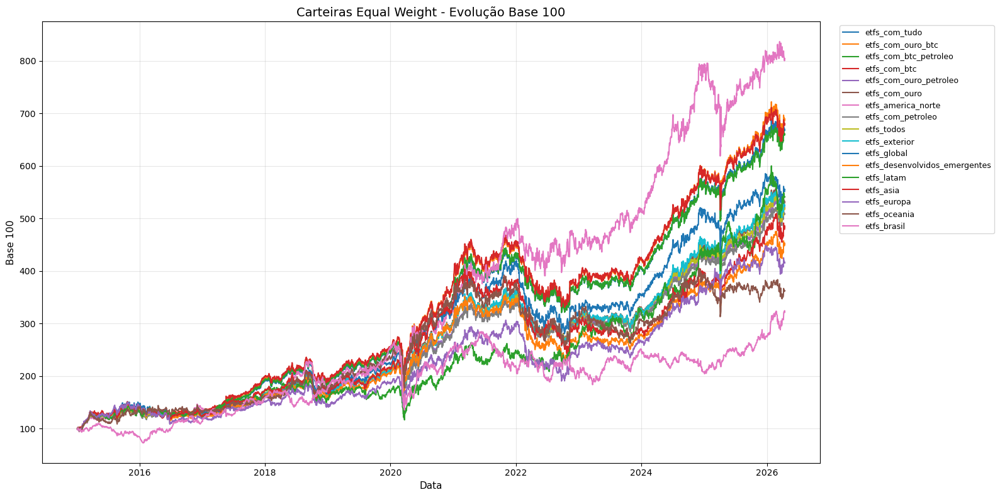

OK

[6/8] Gerando gráfico drawdown - todas as carteiras...


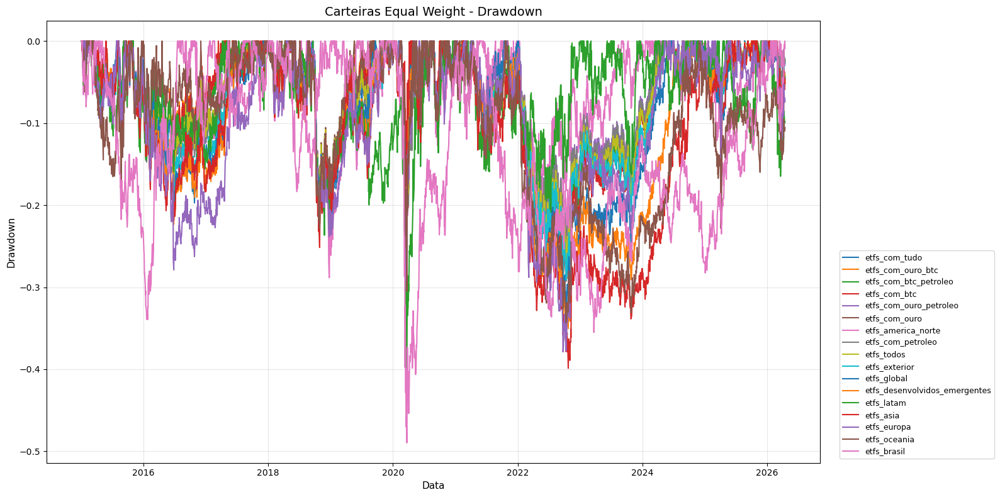

OK

[7/8] Gerando gráficos de apoio para o HTML...


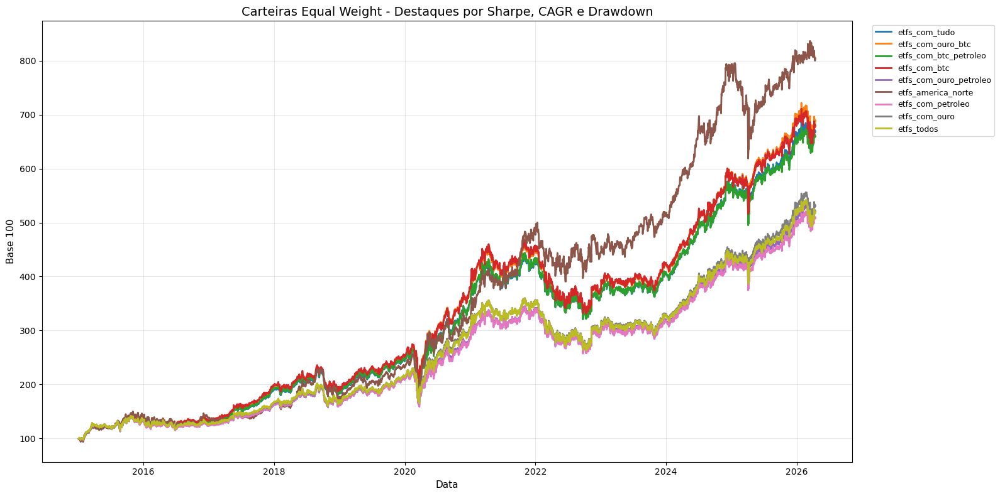

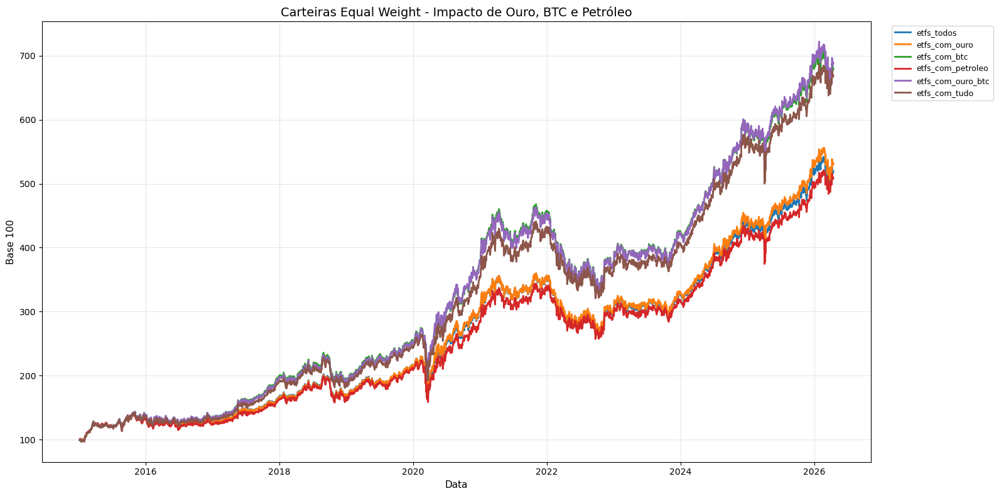

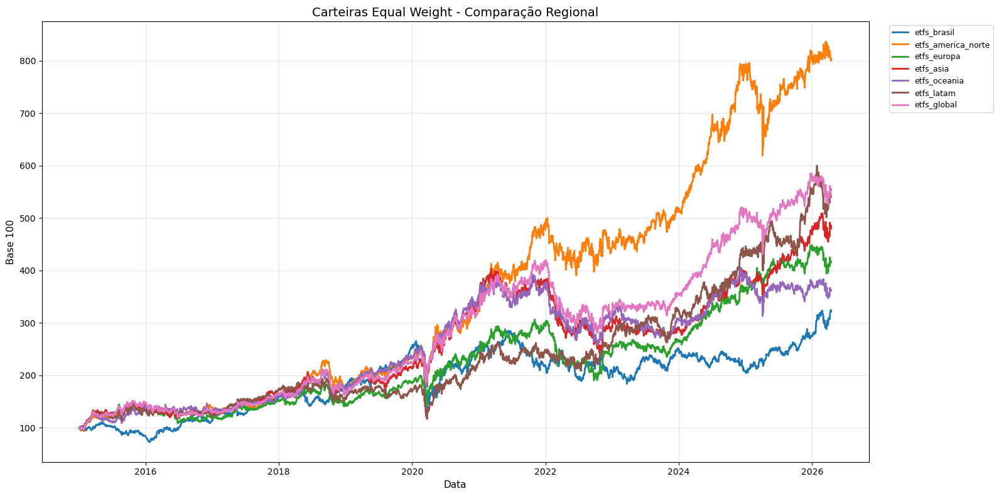

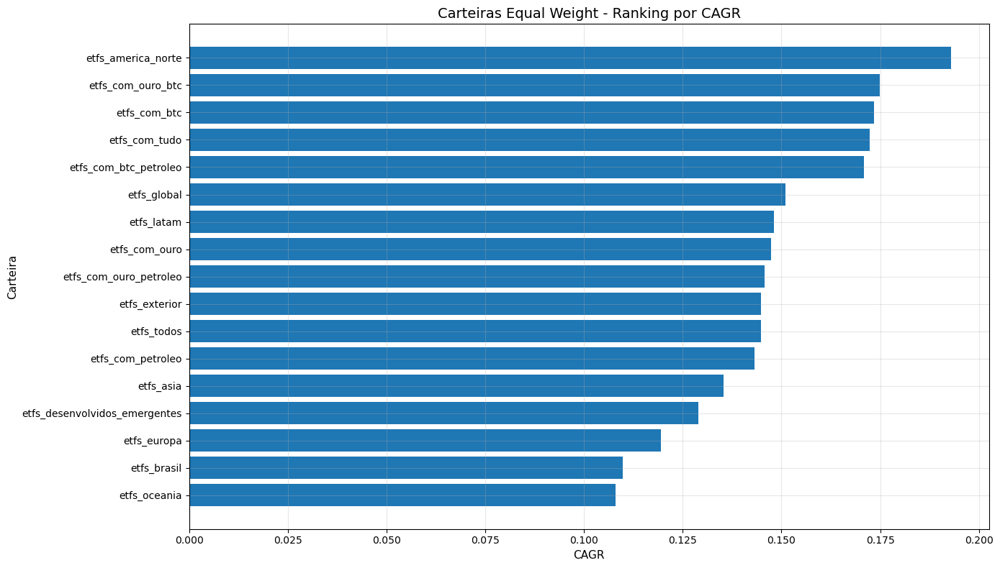

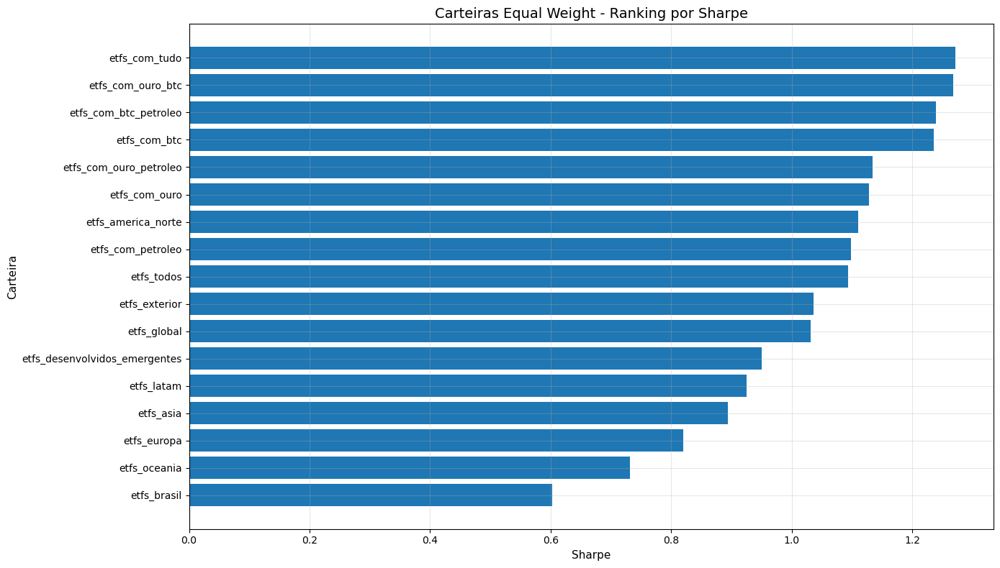

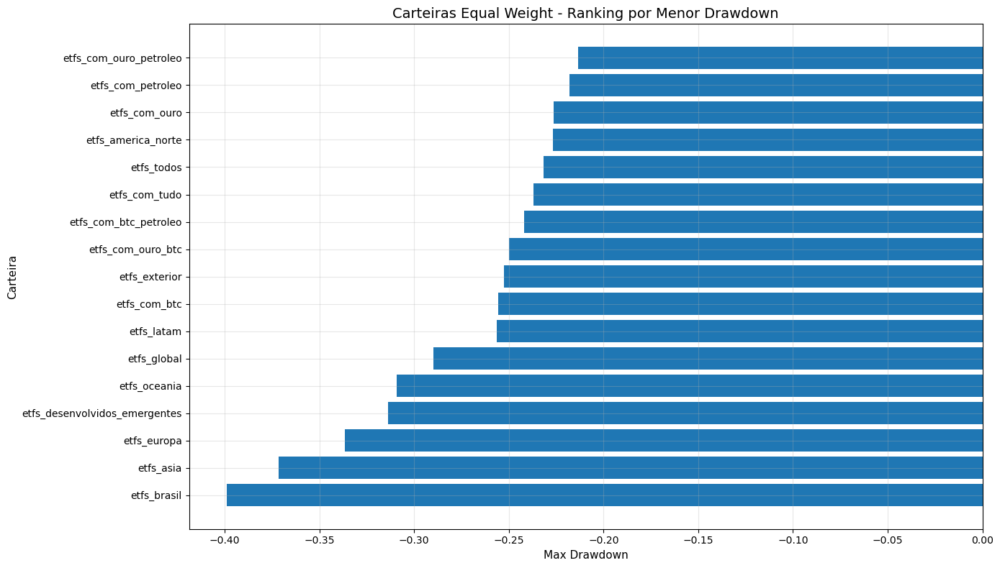

OK

[8/8] Etapa concluída.

------------------------------------------------------------------------------------------
RESUMO DOS ARQUIVOS GERADOS
------------------------------------------------------------------------------------------
Base 100 - todas......................: resultados/graficos/carteiras_equal_weight_base100_todas.png
Drawdown - todas......................: resultados/graficos/carteiras_equal_weight_drawdown_todas.png
Base 100 - destaques.................: resultados/graficos/carteiras_equal_weight_base100_destaques.png
Base 100 - alternativos..............: resultados/graficos/carteiras_equal_weight_base100_alternativos.png
Base 100 - regionais.................: resultados/graficos/carteiras_equal_weight_base100_regionais.png
Barras CAGR...........................: resultados/graficos/carteiras_equal_weight_ranking_cagr.png
Barras Sharpe.........................: resultados/graficos/carteiras_equal_weight_ranking_sharpe.png
Barras Drawdown.......................: re

In [18]:
%%time
# ==========================================================================================
# ETAPA 17 - COMPARAÇÃO VISUAL DAS CARTEIRAS EQUAL WEIGHT
# ==========================================================================================

print("=" * 90)
print("INICIANDO ETAPA 17 - COMPARAÇÃO VISUAL DAS CARTEIRAS EQUAL WEIGHT")
print("=" * 90)

# ==========================================================================================
# [1/8] VALIDAÇÕES INICIAIS
# ==========================================================================================
print("\n[1/8] Validando objetos de entrada...")

variaveis_obrigatorias = [
    "df_carteiras",
    "df_carteiras_base100",
    "df_metricas_carteiras",
]
variaveis_faltantes = [v for v in variaveis_obrigatorias if v not in globals()]

if variaveis_faltantes:
    raise NameError(
        f"As seguintes variáveis obrigatórias não existem no ambiente: {variaveis_faltantes}"
    )

if not isinstance(df_carteiras, pd.DataFrame):
    raise TypeError("df_carteiras precisa ser um pandas DataFrame.")

if not isinstance(df_carteiras_base100, pd.DataFrame):
    raise TypeError("df_carteiras_base100 precisa ser um pandas DataFrame.")

if not isinstance(df_metricas_carteiras, pd.DataFrame):
    raise TypeError("df_metricas_carteiras precisa ser um pandas DataFrame.")

if df_carteiras.empty:
    raise ValueError("df_carteiras está vazio.")

if df_carteiras_base100.empty:
    raise ValueError("df_carteiras_base100 está vazio.")

if df_metricas_carteiras.empty:
    raise ValueError("df_metricas_carteiras está vazio.")

# Cópias defensivas
df_carteiras = df_carteiras.copy()
df_carteiras_base100 = df_carteiras_base100.copy()
df_metricas_carteiras = df_metricas_carteiras.copy()

df_carteiras.index = pd.to_datetime(df_carteiras.index)
df_carteiras_base100.index = pd.to_datetime(df_carteiras_base100.index)

df_carteiras = df_carteiras.sort_index()
df_carteiras_base100 = df_carteiras_base100.sort_index()

# Colunas comuns
colunas_comuns = [
    c for c in df_carteiras.columns
    if c in df_carteiras_base100.columns and c in df_metricas_carteiras["carteira"].astype(str).tolist()
]

if len(colunas_comuns) == 0:
    raise ValueError("Não há carteiras em comum entre os objetos de entrada.")

df_carteiras = df_carteiras[colunas_comuns].copy()
df_carteiras_base100 = df_carteiras_base100[colunas_comuns].copy()

os.makedirs("resultados/graficos", exist_ok=True)
os.makedirs("resultados/tabelas", exist_ok=True)

print("OK")
print(f"Carteiras disponíveis................: {len(colunas_comuns)}")
print(f"Período analisado....................: {df_carteiras.index.min().date()} até {df_carteiras.index.max().date()}")

# ==========================================================================================
# [2/8] PREPARANDO BASES VISUAIS
# ==========================================================================================
print("\n[2/8] Preparando bases visuais...")

# Base 100 ordenada conforme ranking de Sharpe da etapa 16
ordem_sharpe = (
    df_metricas_carteiras
    .sort_values(by=["sharpe", "cagr"], ascending=[False, False])["carteira"]
    .tolist()
)

ordem_sharpe = [c for c in ordem_sharpe if c in df_carteiras_base100.columns]

df_carteiras_base100_plot = df_carteiras_base100[ordem_sharpe].copy()

# Drawdown
df_carteiras_drawdown = df_carteiras_base100_plot.div(df_carteiras_base100_plot.cummax()).sub(1.0)

# Tabela resumo para apoio visual
colunas_resumo = [
    "carteira",
    "cagr",
    "vol_anual",
    "sharpe",
    "sortino",
    "max_drawdown",
    "calmar",
    "pct_meses_positivos",
]

df_resumo_visual_carteiras = (
    df_metricas_carteiras[colunas_resumo]
    .sort_values(by=["sharpe", "cagr"], ascending=[False, False])
    .reset_index(drop=True)
    .copy()
)

# Versões longas para eventual uso futuro no HTML
df_base100_long = (
    df_carteiras_base100_plot
    .reset_index()
    .rename(columns={"index": "data"})
    .melt(id_vars="data", var_name="carteira", value_name="base100")
)

df_drawdown_long = (
    df_carteiras_drawdown
    .reset_index()
    .rename(columns={"index": "data"})
    .melt(id_vars="data", var_name="carteira", value_name="drawdown")
)

print("OK")
print(f"Base 100 shape.......................: {df_carteiras_base100_plot.shape}")
print(f"Drawdown shape.......................: {df_carteiras_drawdown.shape}")
print(f"Tabela resumo shape..................: {df_resumo_visual_carteiras.shape}")

# ==========================================================================================
# [3/8] SALVANDO TABELAS AUXILIARES
# ==========================================================================================
print("\n[3/8] Salvando tabelas auxiliares...")

caminho_csv_base100 = "resultados/tabelas/carteiras_equal_weight_base100.csv"
caminho_html_base100 = "resultados/tabelas/carteiras_equal_weight_base100.html"

caminho_csv_drawdown = "resultados/tabelas/carteiras_equal_weight_drawdown.csv"
caminho_html_drawdown = "resultados/tabelas/carteiras_equal_weight_drawdown.html"

caminho_csv_resumo_visual = "resultados/tabelas/resumo_visual_carteiras_equal_weight.csv"
caminho_html_resumo_visual = "resultados/tabelas/resumo_visual_carteiras_equal_weight.html"

caminho_csv_base100_long = "resultados/tabelas/carteiras_equal_weight_base100_long.csv"
caminho_csv_drawdown_long = "resultados/tabelas/carteiras_equal_weight_drawdown_long.csv"

df_carteiras_base100_plot.to_csv(caminho_csv_base100, sep=",", decimal=".")
df_carteiras_drawdown.to_csv(caminho_csv_drawdown, sep=",", decimal=".")
df_resumo_visual_carteiras.to_csv(caminho_csv_resumo_visual, index=False, sep=",", decimal=".")
df_base100_long.to_csv(caminho_csv_base100_long, index=False, sep=",", decimal=".")
df_drawdown_long.to_csv(caminho_csv_drawdown_long, index=False, sep=",", decimal=".")

df_carteiras_base100_plot.to_html(
    caminho_html_base100,
    border=0,
    justify="center",
    float_format=lambda x: f"{x:,.2f}"
)

df_carteiras_drawdown.to_html(
    caminho_html_drawdown,
    border=0,
    justify="center",
    float_format=lambda x: f"{x:.4%}"
)

df_resumo_visual_carteiras.to_html(
    caminho_html_resumo_visual,
    index=False,
    border=0,
    justify="center",
    formatters={
        "cagr": lambda x: f"{x:.2%}" if pd.notna(x) else "",
        "vol_anual": lambda x: f"{x:.2%}" if pd.notna(x) else "",
        "sharpe": lambda x: f"{x:.4f}" if pd.notna(x) else "",
        "sortino": lambda x: f"{x:.4f}" if pd.notna(x) else "",
        "max_drawdown": lambda x: f"{x:.2%}" if pd.notna(x) else "",
        "calmar": lambda x: f"{x:.4f}" if pd.notna(x) else "",
        "pct_meses_positivos": lambda x: f"{x:.2%}" if pd.notna(x) else "",
    }
)

print("OK")
print(f"CSV base 100.........................: {caminho_csv_base100}")
print(f"CSV drawdown.........................: {caminho_csv_drawdown}")
print(f"CSV resumo visual....................: {caminho_csv_resumo_visual}")

# ==========================================================================================
# [4/8] DEFININDO GRUPOS PARA GRÁFICOS
# ==========================================================================================
print("\n[4/8] Definindo grupos para visualização...")

top5_sharpe = (
    df_metricas_carteiras
    .sort_values(by=["sharpe", "cagr"], ascending=[False, False])["carteira"]
    .head(5)
    .tolist()
)

top5_cagr = (
    df_metricas_carteiras
    .sort_values(by=["cagr", "sharpe"], ascending=[False, False])["carteira"]
    .head(5)
    .tolist()
)

top5_menor_drawdown = (
    df_metricas_carteiras
    .sort_values(by=["max_drawdown", "sharpe"], ascending=[False, False])["carteira"]
    .head(5)
    .tolist()
)

carteiras_destaque = []
for carteira in top5_sharpe + top5_cagr + top5_menor_drawdown:
    if carteira not in carteiras_destaque:
        carteiras_destaque.append(carteira)

# Conjuntos específicos importantes para narrativa do projeto
carteiras_base_alternativos = [
    c for c in [
        "etfs_todos",
        "etfs_com_ouro",
        "etfs_com_btc",
        "etfs_com_petroleo",
        "etfs_com_ouro_btc",
        "etfs_com_tudo",
    ]
    if c in df_carteiras_base100_plot.columns
]

carteiras_regionais = [
    c for c in [
        "etfs_brasil",
        "etfs_america_norte",
        "etfs_europa",
        "etfs_asia",
        "etfs_oceania",
        "etfs_latam",
        "etfs_global",
    ]
    if c in df_carteiras_base100_plot.columns
]

print("OK")
print(f"Carteiras destaque...................: {len(carteiras_destaque)}")
print(f"Grupo base x alternativos............: {len(carteiras_base_alternativos)}")
print(f"Grupo regionais......................: {len(carteiras_regionais)}")

# ==========================================================================================
# [5/8] GRÁFICO 1 - BASE 100 (TODAS AS CARTEIRAS)
# ==========================================================================================
print("\n[5/8] Gerando gráfico base 100 - todas as carteiras...")

plt.figure(figsize=(16, 8))

for coluna in df_carteiras_base100_plot.columns:
    plt.plot(
        df_carteiras_base100_plot.index,
        df_carteiras_base100_plot[coluna],
        linewidth=1.5,
        label=coluna
    )

plt.title("Carteiras Equal Weight - Evolução Base 100", fontsize=14)
plt.xlabel("Data")
plt.ylabel("Base 100")
plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), fontsize=9)
plt.grid(True, alpha=0.3)
plt.tight_layout()

caminho_grafico_base100_todas = "resultados/graficos/carteiras_equal_weight_base100_todas.png"
plt.savefig(caminho_grafico_base100_todas, dpi=300, bbox_inches="tight")
plt.show()

print("OK")

# ==========================================================================================
# [6/8] GRÁFICO 2 - DRAWDOWN (TODAS AS CARTEIRAS)
# ==========================================================================================
print("\n[6/8] Gerando gráfico drawdown - todas as carteiras...")

plt.figure(figsize=(16, 8))

for coluna in df_carteiras_drawdown.columns:
    plt.plot(
        df_carteiras_drawdown.index,
        df_carteiras_drawdown[coluna],
        linewidth=1.5,
        label=coluna
    )

plt.title("Carteiras Equal Weight - Drawdown", fontsize=14)
plt.xlabel("Data")
plt.ylabel("Drawdown")
plt.legend(loc="lower left", bbox_to_anchor=(1.02, 0), fontsize=9)
plt.grid(True, alpha=0.3)
plt.tight_layout()

caminho_grafico_drawdown_todas = "resultados/graficos/carteiras_equal_weight_drawdown_todas.png"
plt.savefig(caminho_grafico_drawdown_todas, dpi=300, bbox_inches="tight")
plt.show()

print("OK")

# ==========================================================================================
# [7/8] GRÁFICOS DE APOIO PARA O HTML
# ==========================================================================================
print("\n[7/8] Gerando gráficos de apoio para o HTML...")

# ------------------------------------------------------------------------------------------
# Base 100 - carteiras destaque
# ------------------------------------------------------------------------------------------
if len(carteiras_destaque) > 0:
    plt.figure(figsize=(16, 8))

    for coluna in carteiras_destaque:
        plt.plot(
            df_carteiras_base100_plot.index,
            df_carteiras_base100_plot[coluna],
            linewidth=2.0,
            label=coluna
        )

    plt.title("Carteiras Equal Weight - Destaques por Sharpe, CAGR e Drawdown", fontsize=14)
    plt.xlabel("Data")
    plt.ylabel("Base 100")
    plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), fontsize=9)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()

    caminho_grafico_base100_destaques = "resultados/graficos/carteiras_equal_weight_base100_destaques.png"
    plt.savefig(caminho_grafico_base100_destaques, dpi=300, bbox_inches="tight")
    plt.show()

# ------------------------------------------------------------------------------------------
# Base 100 - impacto dos alternativos
# ------------------------------------------------------------------------------------------
if len(carteiras_base_alternativos) > 0:
    plt.figure(figsize=(16, 8))

    for coluna in carteiras_base_alternativos:
        plt.plot(
            df_carteiras_base100_plot.index,
            df_carteiras_base100_plot[coluna],
            linewidth=2.0,
            label=coluna
        )

    plt.title("Carteiras Equal Weight - Impacto de Ouro, BTC e Petróleo", fontsize=14)
    plt.xlabel("Data")
    plt.ylabel("Base 100")
    plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), fontsize=9)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()

    caminho_grafico_base100_alternativos = "resultados/graficos/carteiras_equal_weight_base100_alternativos.png"
    plt.savefig(caminho_grafico_base100_alternativos, dpi=300, bbox_inches="tight")
    plt.show()

# ------------------------------------------------------------------------------------------
# Base 100 - carteiras regionais
# ------------------------------------------------------------------------------------------
if len(carteiras_regionais) > 0:
    plt.figure(figsize=(16, 8))

    for coluna in carteiras_regionais:
        plt.plot(
            df_carteiras_base100_plot.index,
            df_carteiras_base100_plot[coluna],
            linewidth=2.0,
            label=coluna
        )

    plt.title("Carteiras Equal Weight - Comparação Regional", fontsize=14)
    plt.xlabel("Data")
    plt.ylabel("Base 100")
    plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), fontsize=9)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()

    caminho_grafico_base100_regionais = "resultados/graficos/carteiras_equal_weight_base100_regionais.png"
    plt.savefig(caminho_grafico_base100_regionais, dpi=300, bbox_inches="tight")
    plt.show()

# ------------------------------------------------------------------------------------------
# Barras - CAGR
# ------------------------------------------------------------------------------------------
df_plot_cagr = (
    df_metricas_carteiras[["carteira", "cagr"]]
    .sort_values(by="cagr", ascending=False)
    .reset_index(drop=True)
)

plt.figure(figsize=(14, 8))
plt.barh(df_plot_cagr["carteira"], df_plot_cagr["cagr"])
plt.gca().invert_yaxis()
plt.title("Carteiras Equal Weight - Ranking por CAGR", fontsize=14)
plt.xlabel("CAGR")
plt.ylabel("Carteira")
plt.grid(True, axis="x", alpha=0.3)
plt.tight_layout()

caminho_grafico_barras_cagr = "resultados/graficos/carteiras_equal_weight_ranking_cagr.png"
plt.savefig(caminho_grafico_barras_cagr, dpi=300, bbox_inches="tight")
plt.show()

# ------------------------------------------------------------------------------------------
# Barras - Sharpe
# ------------------------------------------------------------------------------------------
df_plot_sharpe = (
    df_metricas_carteiras[["carteira", "sharpe"]]
    .sort_values(by="sharpe", ascending=False)
    .reset_index(drop=True)
)

plt.figure(figsize=(14, 8))
plt.barh(df_plot_sharpe["carteira"], df_plot_sharpe["sharpe"])
plt.gca().invert_yaxis()
plt.title("Carteiras Equal Weight - Ranking por Sharpe", fontsize=14)
plt.xlabel("Sharpe")
plt.ylabel("Carteira")
plt.grid(True, axis="x", alpha=0.3)
plt.tight_layout()

caminho_grafico_barras_sharpe = "resultados/graficos/carteiras_equal_weight_ranking_sharpe.png"
plt.savefig(caminho_grafico_barras_sharpe, dpi=300, bbox_inches="tight")
plt.show()

# ------------------------------------------------------------------------------------------
# Barras - Max Drawdown
# ------------------------------------------------------------------------------------------
df_plot_mdd = (
    df_metricas_carteiras[["carteira", "max_drawdown"]]
    .sort_values(by="max_drawdown", ascending=False)
    .reset_index(drop=True)
)

plt.figure(figsize=(14, 8))
plt.barh(df_plot_mdd["carteira"], df_plot_mdd["max_drawdown"])
plt.gca().invert_yaxis()
plt.title("Carteiras Equal Weight - Ranking por Menor Drawdown", fontsize=14)
plt.xlabel("Max Drawdown")
plt.ylabel("Carteira")
plt.grid(True, axis="x", alpha=0.3)
plt.tight_layout()

caminho_grafico_barras_mdd = "resultados/graficos/carteiras_equal_weight_ranking_drawdown.png"
plt.savefig(caminho_grafico_barras_mdd, dpi=300, bbox_inches="tight")
plt.show()

print("OK")

# ==========================================================================================
# [8/8] FECHAMENTO
# ==========================================================================================
print("\n[8/8] Etapa concluída.")

print("\n" + "-" * 90)
print("RESUMO DOS ARQUIVOS GERADOS")
print("-" * 90)
print(f"Base 100 - todas......................: {caminho_grafico_base100_todas}")
print(f"Drawdown - todas......................: {caminho_grafico_drawdown_todas}")

if len(carteiras_destaque) > 0:
    print(f"Base 100 - destaques.................: {caminho_grafico_base100_destaques}")

if len(carteiras_base_alternativos) > 0:
    print(f"Base 100 - alternativos..............: {caminho_grafico_base100_alternativos}")

if len(carteiras_regionais) > 0:
    print(f"Base 100 - regionais.................: {caminho_grafico_base100_regionais}")

print(f"Barras CAGR...........................: {caminho_grafico_barras_cagr}")
print(f"Barras Sharpe.........................: {caminho_grafico_barras_sharpe}")
print(f"Barras Drawdown.......................: {caminho_grafico_barras_mdd}")
print(f"Tabela resumo visual..................: {caminho_csv_resumo_visual}")

print("\n" + "=" * 90)
print("ETAPA 17 CONCLUÍDA - COMPARAÇÃO VISUAL DAS CARTEIRAS EQUAL WEIGHT")
print("=" * 90)
print(f"Quantidade de carteiras plotadas.....: {df_carteiras_base100_plot.shape[1]}")
print(f"Top Sharpe............................: {top5_sharpe[0] if len(top5_sharpe) > 0 else 'N/A'}")
print(f"Top CAGR..............................: {top5_cagr[0] if len(top5_cagr) > 0 else 'N/A'}")
print(f"Menor Drawdown........................: {top5_menor_drawdown[0] if len(top5_menor_drawdown) > 0 else 'N/A'}")

# 18) Impacto dos Alternativos (Ouro, BTC e Petróleo)

In [19]:
%%time
# ==========================================================================================
# ETAPA 18 - IMPACTO DOS ALTERNATIVOS (OURO, BTC E PETRÓLEO)
# ==========================================================================================

print("=" * 90)
print("INICIANDO ETAPA 18 - IMPACTO DOS ALTERNATIVOS")
print("=" * 90)

# ==========================================================================================
# [1/7] VALIDAÇÕES INICIAIS
# ==========================================================================================
print("\n[1/7] Validando objetos de entrada...")

if "df_metricas_carteiras" not in globals():
    raise NameError("df_metricas_carteiras não encontrado.")

if not isinstance(df_metricas_carteiras, pd.DataFrame):
    raise TypeError("df_metricas_carteiras precisa ser DataFrame.")

if df_metricas_carteiras.empty:
    raise ValueError("df_metricas_carteiras está vazio.")

print("OK")

# ==========================================================================================
# [2/7] DEFININDO CARTEIRAS BASE E COMPARAÇÃO
# ==========================================================================================
print("\n[2/7] Definindo cenários de comparação...")

# Base principal (sem alternativos)
carteira_base = "etfs_todos"

# Possíveis variações
cenarios = {
    "ouro": "etfs_com_ouro",
    "btc": "etfs_com_btc",
    "petroleo": "etfs_com_petroleo",
    "ouro_btc": "etfs_com_ouro_btc",
    "ouro_petroleo": "etfs_com_ouro_petroleo",
    "btc_petroleo": "etfs_com_btc_petroleo",
    "tudo": "etfs_com_tudo",
}

# Filtrar apenas os que existem
cenarios_validos = {
    k: v for k, v in cenarios.items()
    if v in df_metricas_carteiras["carteira"].values
}

if carteira_base not in df_metricas_carteiras["carteira"].values:
    raise ValueError("Carteira base 'etfs_todos' não encontrada.")

print("OK")
print(f"Carteira base.........................: {carteira_base}")
print(f"Cenários avaliados....................: {list(cenarios_validos.keys())}")

# ==========================================================================================
# [3/7] EXTRAINDO MÉTRICAS BASE
# ==========================================================================================
print("\n[3/7] Extraindo métricas da carteira base...")

df_base = df_metricas_carteiras.set_index("carteira")

metricas_base = df_base.loc[carteira_base]

print("OK")
print(f"CAGR base.............................: {metricas_base['cagr']:.2%}")
print(f"Sharpe base...........................: {metricas_base['sharpe']:.4f}")
print(f"Drawdown base.........................: {metricas_base['max_drawdown']:.2%}")

# ==========================================================================================
# [4/7] CALCULANDO DELTAS
# ==========================================================================================
print("\n[4/7] Calculando impacto dos alternativos...")

resultados = []

for nome_cenario, carteira in cenarios_validos.items():

    metrica = df_base.loc[carteira]

    delta_cagr = metrica["cagr"] - metricas_base["cagr"]
    delta_sharpe = metrica["sharpe"] - metricas_base["sharpe"]
    delta_drawdown = metrica["max_drawdown"] - metricas_base["max_drawdown"]

    resultados.append({
        "cenario": nome_cenario,
        "carteira": carteira,

        # Absolutos
        "cagr": metrica["cagr"],
        "sharpe": metrica["sharpe"],
        "max_drawdown": metrica["max_drawdown"],

        # Deltas vs base
        "delta_cagr": delta_cagr,
        "delta_sharpe": delta_sharpe,
        "delta_drawdown": delta_drawdown,
    })

df_impacto = pd.DataFrame(resultados)

if df_impacto.empty:
    raise ValueError("df_impacto ficou vazio.")

print("OK")

# ==========================================================================================
# [5/7] ORGANIZAÇÃO E RANKING
# ==========================================================================================
print("\n[5/7] Organizando tabela de impacto...")

# Ordenar por impacto em Sharpe (principal métrica)
df_impacto = df_impacto.sort_values(
    by=["delta_sharpe", "delta_cagr"],
    ascending=[False, False]
).reset_index(drop=True)

# Classificações qualitativas
def classificar_impacto(x):
    if x > 0:
        return "Melhora"
    elif x < 0:
        return "Piora"
    else:
        return "Neutro"

df_impacto["impacto_cagr"] = df_impacto["delta_cagr"].apply(classificar_impacto)
df_impacto["impacto_sharpe"] = df_impacto["delta_sharpe"].apply(classificar_impacto)
df_impacto["impacto_drawdown"] = df_impacto["delta_drawdown"].apply(classificar_impacto)

print("OK")

# ==========================================================================================
# [6/7] SALVANDO RESULTADOS
# ==========================================================================================
print("\n[6/7] Salvando resultados...")

caminho_csv = "resultados/tabelas/impacto_alternativos.csv"
caminho_html = "resultados/tabelas/impacto_alternativos.html"

df_impacto.to_csv(caminho_csv, index=False, sep=",", decimal=".")

df_impacto.to_html(
    caminho_html,
    index=False,
    border=0,
    justify="center",
    formatters={
        "cagr": lambda x: f"{x:.2%}",
        "sharpe": lambda x: f"{x:.4f}",
        "max_drawdown": lambda x: f"{x:.2%}",
        "delta_cagr": lambda x: f"{x:.2%}",
        "delta_sharpe": lambda x: f"{x:.4f}",
        "delta_drawdown": lambda x: f"{x:.2%}",
    }
)

print("OK")
print(f"CSV impacto.........................: {caminho_csv}")
print(f"HTML impacto........................: {caminho_html}")

# ==========================================================================================
# [7/7] EXIBIÇÃO FINAL
# ==========================================================================================
print("\n[7/7] Exibindo resultados...")

display(
    df_impacto.style.format({
        "cagr": "{:.2%}",
        "sharpe": "{:.4f}",
        "max_drawdown": "{:.2%}",
        "delta_cagr": "{:.2%}",
        "delta_sharpe": "{:.4f}",
        "delta_drawdown": "{:.2%}",
    })
)

print("\n" + "=" * 90)
print("ETAPA 18 CONCLUÍDA - IMPACTO DOS ALTERNATIVOS")
print("=" * 90)

melhor_sharpe = df_impacto.iloc[0]

print(f"Melhor impacto em Sharpe.............: {melhor_sharpe['cenario']}")
print(f"Delta Sharpe..........................: {melhor_sharpe['delta_sharpe']:.4f}")
print(f"Delta CAGR............................: {melhor_sharpe['delta_cagr']:.2%}")
print(f"Delta Drawdown........................: {melhor_sharpe['delta_drawdown']:.2%}")

INICIANDO ETAPA 18 - IMPACTO DOS ALTERNATIVOS

[1/7] Validando objetos de entrada...
OK

[2/7] Definindo cenários de comparação...
OK
Carteira base.........................: etfs_todos
Cenários avaliados....................: ['ouro', 'btc', 'petroleo', 'ouro_btc', 'ouro_petroleo', 'btc_petroleo', 'tudo']

[3/7] Extraindo métricas da carteira base...
OK
CAGR base.............................: 14.48%
Sharpe base...........................: 1.0931
Drawdown base.........................: -23.16%

[4/7] Calculando impacto dos alternativos...
OK

[5/7] Organizando tabela de impacto...
OK

[6/7] Salvando resultados...
OK
CSV impacto.........................: resultados/tabelas/impacto_alternativos.csv
HTML impacto........................: resultados/tabelas/impacto_alternativos.html

[7/7] Exibindo resultados...


,cenario,carteira,cagr,sharpe,max_drawdown,delta_cagr,delta_sharpe,delta_drawdown,impacto_cagr,impacto_sharpe,impacto_drawdown
0,tudo,etfs_com_tudo,17.23%,1.2712,-23.70%,2.75%,0.1781,-0.54%,Melhora,Melhora,Piora
1,ouro_btc,etfs_com_ouro_btc,17.49%,1.2675,-24.99%,3.01%,0.1744,-1.84%,Melhora,Melhora,Piora
2,btc_petroleo,etfs_com_btc_petroleo,17.09%,1.2392,-24.20%,2.61%,0.1461,-1.04%,Melhora,Melhora,Piora
3,btc,etfs_com_btc,17.35%,1.2361,-25.56%,2.87%,0.1430,-2.41%,Melhora,Melhora,Piora
4,ouro_petroleo,etfs_com_ouro_petroleo,14.57%,1.1336,-21.35%,0.09%,0.0406,1.80%,Melhora,Melhora,Melhora
5,ouro,etfs_com_ouro,14.73%,1.1284,-22.65%,0.25%,0.0353,0.51%,Melhora,Melhora,Melhora
6,petroleo,etfs_com_petroleo,14.32%,1.0978,-21.79%,-0.16%,0.0048,1.36%,Piora,Melhora,Melhora



ETAPA 18 CONCLUÍDA - IMPACTO DOS ALTERNATIVOS
Melhor impacto em Sharpe.............: tudo
Delta Sharpe..........................: 0.1781
Delta CAGR............................: 2.75%
Delta Drawdown........................: -0.54%
CPU times: total: 31.2 ms
Wall time: 14.2 ms


# 19) Preparando Dados para Otimização de Carteiras

In [20]:
%%time
# ==========================================================================================
# ETAPA 19 - PREPARAÇÃO DOS DADOS PARA OTIMIZAÇÃO
# ==========================================================================================
print("=" * 90)
print("INICIANDO ETAPA 19 - PREPARAÇÃO DOS DADOS PARA OTIMIZAÇÃO")
print("=" * 90)

# ==========================================================================================
# [1/7] Validando inputs da Etapa 15
# ==========================================================================================
print("\n[1/7] Validando inputs da Etapa 15...")

if "etfs_equities" not in globals():
    raise NameError("etfs_equities não encontrado (Etapa 15 não executada corretamente).")

if not isinstance(etfs_equities, (list, pd.Series)):
    raise TypeError("etfs_equities deve ser lista ou Series.")

etfs_equities = list(etfs_equities)

if len(etfs_equities) == 0:
    raise ValueError("etfs_equities está vazio.")

print("OK")
print(f"Ativos base (Etapa 15)..............: {len(etfs_equities)}")

# ==========================================================================================
# [2/7] Validando base mensal em BRL
# ==========================================================================================
print("\n[2/7] Validando base mensal em BRL...")

if "df_adj_close_brl_mensal" not in globals():
    raise NameError("df_adj_close_brl_mensal não encontrado.")

df_precos_brl_mensal = df_adj_close_brl_mensal.copy()
df_precos_brl_mensal.index = pd.to_datetime(df_precos_brl_mensal.index)
df_precos_brl_mensal = df_precos_brl_mensal.sort_index()

print("OK")
print(f"Shape base mensal....................: {df_precos_brl_mensal.shape}")

# ==========================================================================================
# [3/7] Validando consistência do universo
# ==========================================================================================
print("\n[3/7] Checando consistência do universo...")

ativos_ausentes = [c for c in etfs_equities if c not in df_precos_brl_mensal.columns]

if len(ativos_ausentes) > 0:
    print("\nATIVOS AUSENTES:")
    print("-" * 90)
    print(" | ".join(ativos_ausentes))
    raise ValueError("Existem ETFs da Etapa 15 fora da base mensal. Corrija etapas anteriores.")

print("OK - Universo consistente")

# ==========================================================================================
# [4/7] Extraindo preços e retornos
# ==========================================================================================
print("\n[4/7] Extraindo preços e retornos mensais...")

df_precos_mensais_otimizacao = df_precos_brl_mensal[etfs_equities].copy()
df_precos_mensais_otimizacao = df_precos_mensais_otimizacao.ffill(limit=2)
df_precos_mensais_otimizacao = df_precos_mensais_otimizacao.dropna(how="all")

df_retornos_mensais_otimizacao = df_precos_mensais_otimizacao.pct_change(fill_method=None)
df_retornos_mensais_otimizacao = df_retornos_mensais_otimizacao.dropna(how="all")

print("OK")
print(f"Shape preços.........................: {df_precos_mensais_otimizacao.shape}")
print(f"Shape retornos.......................: {df_retornos_mensais_otimizacao.shape}")

# ==========================================================================================
# [5/7] Criando cenários de otimização (CORRIGIDO)
# ==========================================================================================
print("\n[5/7] Criando cenários de otimização...")

# padronizar alternativos (podem vir como string da Etapa 15)
ouro_lista = [ouro] if isinstance(ouro, str) else list(ouro)
btc_lista = [btc] if isinstance(btc, str) else list(btc)
petroleo_lista = [petroleo] if isinstance(petroleo, str) else list(petroleo)

base = [x for x in etfs_equities if x not in ouro_lista + btc_lista + petroleo_lista]

cenarios_otimizacao = {
    "base": base,
    "base_ouro": base + ouro_lista,
    "base_btc": base + btc_lista,
    "base_petroleo": base + petroleo_lista,
    "base_tudo": base + ouro_lista + btc_lista + petroleo_lista,
}

# remover duplicatas preservando ordem
for nome in cenarios_otimizacao:
    cenarios_otimizacao[nome] = list(dict.fromkeys(cenarios_otimizacao[nome]))

print("OK")
for k, v in cenarios_otimizacao.items():
    print(f"{k:<15}: {len(v)} ativos")

# ==========================================================================================
# [6/7] Salvando outputs
# ==========================================================================================
print("\n[6/7] Salvando outputs...")

df_retornos_mensais_otimizacao.to_csv("resultados/tabelas/retornos_mensais_otimizacao.csv")
df_precos_mensais_otimizacao.to_csv("resultados/tabelas/precos_mensais_otimizacao.csv")

print("OK")

# ==========================================================================================
# [7/7] Preview
# ==========================================================================================
print("\n[7/7] Preview...")

display(df_retornos_mensais_otimizacao.head())

# ==========================================================================================
# FINAL
# ==========================================================================================
print("\n" + "=" * 90)
print("ETAPA 19 CONCLUÍDA - DADOS PRONTOS PARA OTIMIZAÇÃO")
print("=" * 90)
print(f"Nº ativos base.......................: {len(base)}")
print(f"Período..............................: {df_precos_mensais_otimizacao.index.min().date()} até {df_precos_mensais_otimizacao.index.max().date()}")

INICIANDO ETAPA 19 - PREPARAÇÃO DOS DADOS PARA OTIMIZAÇÃO

[1/7] Validando inputs da Etapa 15...
OK
Ativos base (Etapa 15)..............: 24

[2/7] Validando base mensal em BRL...
OK
Shape base mensal....................: (136, 45)

[3/7] Checando consistência do universo...
OK - Universo consistente

[4/7] Extraindo preços e retornos mensais...
OK
Shape preços.........................: (136, 24)
Shape retornos.......................: (135, 24)

[5/7] Criando cenários de otimização...
OK
base           : 24 ativos
base_ouro      : 25 ativos
base_btc       : 25 ativos
base_petroleo  : 25 ativos
base_tudo      : 27 ativos

[6/7] Salvando outputs...
OK

[7/7] Preview...


ticker_yahoo,ACWI,ARGT,BOVA11.SA,ECH,ENZL,EWA,EWG,EWH,EWJ,EWT,EWU,EWW,EWY,EZA,FEZ,IEMG,INDA,MCHI,QQQ,SMAL11.SA,SPY,VEA,VT,XLE
data,,,,,,,,,,,,,,,,,,,,,,,,
2015-02-28,0.1787624533,0.2265615652,0.0964700209,0.2110324278,0.1867766363,0.2069260277,0.1829406780,0.1192840030,0.2008432826,0.1737063697,0.1828675996,0.1958743091,0.1368960879,0.1317698993,0.1889976101,0.1642679407,0.1649040547,0.1761860714,0.1978920329,0.0577046529,0.1800144351,0.1860415315,0.1837183619,0.1685355306
2015-03-31,0.0942728746,0.1591665204,-0.0101979272,0.0830792030,0.0863635311,0.0720441940,0.1157336640,0.1217522346,0.1266844990,0.0924535775,0.0471253433,0.0690005033,0.1224610709,0.0871407745,0.0993197309,0.0953144937,0.0613940909,0.1406371503,0.0843024604,0.0086885528,0.0930586618,0.0969695229,0.0970200474,0.0976704778
2015-04-30,-0.0584884939,-0.0384297990,0.1034343219,-0.0408732866,-0.0735225587,-0.0663002397,-0.0914658078,-0.0070878404,-0.0606122473,-0.0440128743,-0.0237332731,-0.0742952577,-0.0218763099,-0.0345974114,-0.0658556267,-0.0182449480,-0.1591077709,0.0526581296,-0.0671230667,0.0288462038,-0.0757174817,-0.0493297669,-0.0613862500,-0.0245488759
2015-05-31,0.0696651086,0.0206022615,-0.0598681897,0.0453427817,0.0055643265,0.0338874927,0.0512475392,0.0647191326,0.0854686513,0.0631585614,0.0763471343,0.0676577357,0.0107347254,-0.0162833811,0.0537362508,0.0306669538,0.1118838616,0.0213698037,0.0937159974,-0.0216121612,0.0834168230,0.0691482068,0.0732215021,0.0141634173
2015-06-30,-0.0391703943,-0.0592750810,0.0021421736,-0.0755617616,-0.0796646226,-0.0576143061,-0.0389633895,-0.0480716831,-0.0269618341,-0.0475418245,-0.0518687003,-0.0304806588,-0.0596414532,0.0014359175,-0.0348797176,-0.0427998168,-0.0189996692,-0.0670929013,-0.0382405504,-0.0135323444,-0.0337738297,-0.0424489865,-0.0356384087,-0.0480969340



ETAPA 19 CONCLUÍDA - DADOS PRONTOS PARA OTIMIZAÇÃO
Nº ativos base.......................: 24
Período..............................: 2015-01-31 até 2026-04-30
CPU times: total: 15.6 ms
Wall time: 26.3 ms


# 20) Insumos para Otimização de Carteiras

In [21]:
%%time
# ==========================================================================================
# ETAPA 20 - INSUMOS PARA OTIMIZAÇÃO
# ==========================================================================================
print("=" * 90)
print("INICIANDO ETAPA 20 - INSUMOS PARA OTIMIZAÇÃO")
print("=" * 90)

# ==========================================================================================
# [1/8] Validando objetos de entrada
# ==========================================================================================
print("\n[1/8] Validando objetos de entrada...")

variaveis_obrigatorias = [
    "df_precos_mensais_otimizacao",
    "df_retornos_mensais_otimizacao",
    "cenarios_otimizacao",
]

variaveis_faltantes = [v for v in variaveis_obrigatorias if v not in globals()]

if variaveis_faltantes:
    raise NameError(
        f"As seguintes variáveis obrigatórias não existem no ambiente: {variaveis_faltantes}"
    )

if not isinstance(df_precos_mensais_otimizacao, pd.DataFrame):
    raise TypeError("df_precos_mensais_otimizacao precisa ser um pandas DataFrame.")

if not isinstance(df_retornos_mensais_otimizacao, pd.DataFrame):
    raise TypeError("df_retornos_mensais_otimizacao precisa ser um pandas DataFrame.")

if not isinstance(cenarios_otimizacao, dict):
    raise TypeError("cenarios_otimizacao precisa ser um dicionário.")

if df_precos_mensais_otimizacao.empty:
    raise ValueError("df_precos_mensais_otimizacao está vazio.")

if df_retornos_mensais_otimizacao.empty:
    raise ValueError("df_retornos_mensais_otimizacao está vazio.")

df_precos_mensais_otimizacao = df_precos_mensais_otimizacao.copy()
df_retornos_mensais_otimizacao = df_retornos_mensais_otimizacao.copy()

df_precos_mensais_otimizacao.index = pd.to_datetime(df_precos_mensais_otimizacao.index)
df_retornos_mensais_otimizacao.index = pd.to_datetime(df_retornos_mensais_otimizacao.index)

df_precos_mensais_otimizacao = df_precos_mensais_otimizacao.sort_index()
df_retornos_mensais_otimizacao = df_retornos_mensais_otimizacao.sort_index()

os.makedirs("resultados/tabelas", exist_ok=True)

print("OK")
print(f"Shape preços.........................: {df_precos_mensais_otimizacao.shape}")
print(f"Shape retornos.......................: {df_retornos_mensais_otimizacao.shape}")
print(f"Período retornos.....................: {df_retornos_mensais_otimizacao.index.min().date()} até {df_retornos_mensais_otimizacao.index.max().date()}")

# ==========================================================================================
# [2/8] Definindo universo principal da otimização
# ==========================================================================================
print("\n[2/8] Definindo universo principal da otimização...")

if "base" not in cenarios_otimizacao:
    raise KeyError("O cenário 'base' não foi encontrado em cenarios_otimizacao.")

ativos_base = list(cenarios_otimizacao["base"])

if len(ativos_base) == 0:
    raise ValueError("O cenário base está vazio.")

ativos_base_ausentes = [c for c in ativos_base if c not in df_retornos_mensais_otimizacao.columns]

if ativos_base_ausentes:
    raise ValueError(
        f"Os seguintes ativos do cenário base não estão em df_retornos_mensais_otimizacao: {ativos_base_ausentes}"
    )

df_retornos_base = df_retornos_mensais_otimizacao[ativos_base].copy()

print("OK")
print(f"Ativos no cenário base...............: {len(ativos_base)}")

# ==========================================================================================
# [3/8] Higienizando a matriz de retornos
# ==========================================================================================
print("\n[3/8] Higienizando a matriz de retornos...")

df_retornos_base = df_retornos_base.dropna(axis=1, how="all")
df_retornos_base = df_retornos_base.dropna(axis=0, how="all")

df_nulos_retorno = df_retornos_base.isna().sum().to_frame("n_nulos").reset_index()
df_nulos_retorno.columns = ["ativo", "n_nulos"]

ativos_com_nulos = df_nulos_retorno.loc[df_nulos_retorno["n_nulos"] > 0, "ativo"].tolist()

if len(ativos_com_nulos) > 0:
    print("ATENÇÃO: Existem ativos com retornos nulos. Eles serão mantidos por enquanto para diagnóstico.")
    print("Ativos com nulos.....................:", " | ".join(ativos_com_nulos))
else:
    print("OK - Sem nulos na matriz base")

print(f"Shape retornos base..................: {df_retornos_base.shape}")

# ==========================================================================================
# [4/8] Calculando estatísticas principais
# ==========================================================================================
print("\n[4/8] Calculando estatísticas principais...")

retorno_esperado_mensal = df_retornos_base.mean()
retorno_esperado_anual = retorno_esperado_mensal * 12

vol_mensal = df_retornos_base.std(ddof=1)
vol_anual = vol_mensal * np.sqrt(12)

matriz_cov_mensal = df_retornos_base.cov()
matriz_cov_anual = matriz_cov_mensal * 12

matriz_correlacao = df_retornos_base.corr()

df_resumo_insumos_otimizacao = pd.DataFrame({
    "ativo": retorno_esperado_mensal.index,
    "retorno_esperado_mensal": retorno_esperado_mensal.values,
    "retorno_esperado_anual": retorno_esperado_anual.values,
    "vol_mensal": vol_mensal.values,
    "vol_anual": vol_anual.values,
    "n_nulos_retorno": df_nulos_retorno.set_index("ativo").reindex(retorno_esperado_mensal.index)["n_nulos"].values,
})

print("OK")

# ==========================================================================================
# [5/8] Organizando tabelas auxiliares
# ==========================================================================================
print("\n[5/8] Organizando tabelas auxiliares...")

df_resumo_insumos_otimizacao = df_resumo_insumos_otimizacao.sort_values(
    by=["retorno_esperado_anual", "vol_anual"],
    ascending=[False, True]
).reset_index(drop=True)

df_ranking_retorno = df_resumo_insumos_otimizacao.sort_values(
    by=["retorno_esperado_anual", "vol_anual"],
    ascending=[False, True]
).reset_index(drop=True)

df_ranking_vol = df_resumo_insumos_otimizacao.sort_values(
    by=["vol_anual", "retorno_esperado_anual"],
    ascending=[True, False]
).reset_index(drop=True)

# Montagem robusta da correlação em formato longo
matriz_correlacao_long = matriz_correlacao.copy()
matriz_correlacao_long.index.name = "ativo_1"
matriz_correlacao_long.columns.name = "ativo_2"

df_correlacao_long = (
    matriz_correlacao_long
    .stack(dropna=False)
    .rename("correlacao")
    .reset_index()
)

df_correlacao_long = df_correlacao_long.loc[
    df_correlacao_long["ativo_1"] != df_correlacao_long["ativo_2"]
].copy()

print("OK")

# ==========================================================================================
# [6/8] Salvando outputs
# ==========================================================================================
print("\n[6/8] Salvando outputs...")

caminho_resumo_csv = "resultados/tabelas/insumos_otimizacao_resumo.csv"
caminho_resumo_html = "resultados/tabelas/insumos_otimizacao_resumo.html"

caminho_cov_mensal_csv = "resultados/tabelas/matriz_covariancia_mensal.csv"
caminho_cov_anual_csv = "resultados/tabelas/matriz_covariancia_anual.csv"
caminho_corr_csv = "resultados/tabelas/matriz_correlacao_otimizacao.csv"
caminho_corr_long_csv = "resultados/tabelas/matriz_correlacao_otimizacao_long.csv"
caminho_retornos_base_csv = "resultados/tabelas/retornos_mensais_cenario_base.csv"

df_resumo_insumos_otimizacao.to_csv(caminho_resumo_csv, index=False, sep=",", decimal=".")
matriz_cov_mensal.to_csv(caminho_cov_mensal_csv, sep=",", decimal=".")
matriz_cov_anual.to_csv(caminho_cov_anual_csv, sep=",", decimal=".")
matriz_correlacao.to_csv(caminho_corr_csv, sep=",", decimal=".")
df_correlacao_long.to_csv(caminho_corr_long_csv, index=False, sep=",", decimal=".")
df_retornos_base.to_csv(caminho_retornos_base_csv, sep=",", decimal=".")

df_resumo_insumos_otimizacao.to_html(
    caminho_resumo_html,
    index=False,
    border=0,
    justify="center",
    formatters={
        "retorno_esperado_mensal": lambda x: f"{x:.2%}" if pd.notna(x) else "",
        "retorno_esperado_anual": lambda x: f"{x:.2%}" if pd.notna(x) else "",
        "vol_mensal": lambda x: f"{x:.2%}" if pd.notna(x) else "",
        "vol_anual": lambda x: f"{x:.2%}" if pd.notna(x) else "",
        "n_nulos_retorno": lambda x: f"{int(x)}" if pd.notna(x) else "",
    }
)

print("OK")
print(f"Resumo CSV...........................: {caminho_resumo_csv}")
print(f"Resumo HTML..........................: {caminho_resumo_html}")
print(f"Cov mensal CSV.......................: {caminho_cov_mensal_csv}")
print(f"Cov anual CSV........................: {caminho_cov_anual_csv}")
print(f"Correlação CSV.......................: {caminho_corr_csv}")
print(f"Correlação long CSV..................: {caminho_corr_long_csv}")

# ==========================================================================================
# [7/8] Exibindo resultados principais
# ==========================================================================================
print("\n[7/8] Exibindo resultados principais...")

top_10_retorno = df_ranking_retorno[["ativo", "retorno_esperado_anual", "vol_anual"]].head(10).copy()
top_10_menor_vol = df_ranking_vol[["ativo", "vol_anual", "retorno_esperado_anual"]].head(10).copy()

print("\n" + "-" * 90)
print("TOP 10 ATIVOS POR RETORNO ESPERADO ANUAL")
print("-" * 90)
display(
    top_10_retorno.style.format({
        "retorno_esperado_anual": "{:.2%}",
        "vol_anual": "{:.2%}",
    })
)

print("\n" + "-" * 90)
print("TOP 10 ATIVOS POR MENOR VOLATILIDADE ANUAL")
print("-" * 90)
display(
    top_10_menor_vol.style.format({
        "vol_anual": "{:.2%}",
        "retorno_esperado_anual": "{:.2%}",
    })
)

print("\n" + "-" * 90)
print("RESUMO DOS INSUMOS DE OTIMIZAÇÃO")
print("-" * 90)
display(
    df_resumo_insumos_otimizacao.style.format({
        "retorno_esperado_mensal": "{:.2%}",
        "retorno_esperado_anual": "{:.2%}",
        "vol_mensal": "{:.2%}",
        "vol_anual": "{:.2%}",
    })
)

# ==========================================================================================
# [8/8] Fechamento
# ==========================================================================================
print("\n[8/8] Etapa concluída.")

print("\n" + "=" * 90)
print("ETAPA 20 CONCLUÍDA - INSUMOS PARA OTIMIZAÇÃO")
print("=" * 90)
print(f"Nº ativos no cenário base............: {df_retornos_base.shape[1]}")
print(f"Nº meses de retorno..................: {df_retornos_base.shape[0]}")
print(f"Maior retorno esperado anual.........: {df_ranking_retorno.iloc[0]['ativo']}")
print(f"Menor volatilidade anual.............: {df_ranking_vol.iloc[0]['ativo']}")

INICIANDO ETAPA 20 - INSUMOS PARA OTIMIZAÇÃO

[1/8] Validando objetos de entrada...
OK
Shape preços.........................: (136, 24)
Shape retornos.......................: (135, 24)
Período retornos.....................: 2015-02-28 até 2026-04-30

[2/8] Definindo universo principal da otimização...
OK
Ativos no cenário base...............: 24

[3/8] Higienizando a matriz de retornos...
OK - Sem nulos na matriz base
Shape retornos base..................: (135, 24)

[4/8] Calculando estatísticas principais...
OK

[5/8] Organizando tabelas auxiliares...
OK

[6/8] Salvando outputs...
OK
Resumo CSV...........................: resultados/tabelas/insumos_otimizacao_resumo.csv
Resumo HTML..........................: resultados/tabelas/insumos_otimizacao_resumo.html
Cov mensal CSV.......................: resultados/tabelas/matriz_covariancia_mensal.csv
Cov anual CSV........................: resultados/tabelas/matriz_covariancia_anual.csv
Correlação CSV.......................: resultados/tabel

,ativo,retorno_esperado_anual,vol_anual
0,ARGT,25.83%,29.88%
1,QQQ,25.29%,21.40%
2,EWT,21.45%,20.26%
3,SPY,20.33%,18.06%
4,EWY,19.23%,24.83%
5,VT,17.59%,16.67%
6,ACWI,17.55%,16.50%
7,XLE,17.06%,27.83%
8,FEZ,15.64%,18.58%
9,VEA,15.41%,16.41%



------------------------------------------------------------------------------------------
TOP 10 ATIVOS POR MENOR VOLATILIDADE ANUAL
------------------------------------------------------------------------------------------


,ativo,vol_anual,retorno_esperado_anual
0,IEMG,15.97%,14.03%
1,EWU,16.17%,13.46%
2,VEA,16.41%,15.41%
3,ACWI,16.50%,17.55%
4,VT,16.67%,17.59%
5,EWJ,17.58%,15.17%
6,SPY,18.06%,20.33%
7,FEZ,18.58%,15.64%
8,EWA,18.63%,14.55%
9,EWG,19.27%,13.66%



------------------------------------------------------------------------------------------
RESUMO DOS INSUMOS DE OTIMIZAÇÃO
------------------------------------------------------------------------------------------


,ativo,retorno_esperado_mensal,retorno_esperado_anual,vol_mensal,vol_anual,n_nulos_retorno
0,ARGT,2.15%,25.83%,8.63%,29.88%,0
1,QQQ,2.11%,25.29%,6.18%,21.40%,0
2,EWT,1.79%,21.45%,5.85%,20.26%,0
3,SPY,1.69%,20.33%,5.21%,18.06%,0
4,EWY,1.60%,19.23%,7.17%,24.83%,0
5,VT,1.47%,17.59%,4.81%,16.67%,0
6,ACWI,1.46%,17.55%,4.76%,16.50%,0
7,XLE,1.42%,17.06%,8.03%,27.83%,0
8,FEZ,1.30%,15.64%,5.36%,18.58%,0
9,VEA,1.28%,15.41%,4.74%,16.41%,0



[8/8] Etapa concluída.

ETAPA 20 CONCLUÍDA - INSUMOS PARA OTIMIZAÇÃO
Nº ativos no cenário base............: 24
Nº meses de retorno..................: 135
Maior retorno esperado anual.........: ARGT
Menor volatilidade anual.............: IEMG
CPU times: total: 78.1 ms
Wall time: 40 ms


# 21) Carteiras Markowitz Puro

In [22]:
%%time
# ==========================================================================================
# ETAPA 21 - CARTEIRAS MARKOWITZ PURO
# ==========================================================================================

print("=" * 90)
print("INICIANDO ETAPA 21 - CARTEIRAS MARKOWITZ PURO")
print("=" * 90)

# ==========================================================================================
# [1/8] VALIDAÇÃO
# ==========================================================================================

print("\n[1/8] Validando...")

objetos_necessarios = [
    "carteiras_def",
    "df_carteiras",
    "df_adj_close_brl_mensal",
    "DIR_PROCESSED",
    "DIR_TABELAS",
]

faltando = [obj for obj in objetos_necessarios if obj not in globals()]
if faltando:
    raise NameError(f"Faltando no ambiente: {faltando}")

if not isinstance(carteiras_def, dict):
    raise TypeError("carteiras_def precisa ser um dicionário criado na Etapa 15.")

if not isinstance(df_carteiras, pd.DataFrame):
    raise TypeError("df_carteiras precisa existir e ser um DataFrame da Etapa 15.")

if df_carteiras.empty:
    raise ValueError("df_carteiras está vazio.")

if not isinstance(df_adj_close_brl_mensal, pd.DataFrame):
    raise TypeError("df_adj_close_brl_mensal precisa ser um DataFrame.")

if df_adj_close_brl_mensal.empty:
    raise ValueError("df_adj_close_brl_mensal está vazio.")

print("OK")

# ==========================================================================================
# [2/8] PREPARANDO BASE MENSAL
# ==========================================================================================

print("\n[2/8] Preparando base mensal...")

df_precos_mensais_markowitz = df_adj_close_brl_mensal.copy()
df_precos_mensais_markowitz.index = pd.to_datetime(df_precos_mensais_markowitz.index)
df_precos_mensais_markowitz = df_precos_mensais_markowitz.sort_index()

carteiras_validas_etapa15 = df_carteiras.columns.tolist()
tickers_all_mensal = df_precos_mensais_markowitz.columns.tolist()

print(f"Shape base mensal....................: {df_precos_mensais_markowitz.shape}")
print(f"Carteiras válidas da Etapa 15........: {len(carteiras_validas_etapa15)}")

# ==========================================================================================
# [3/8] DEFININDO FUNÇÕES
# ==========================================================================================

print("\n[3/8] Definindo funções...")

def preparar_base_carteira_markowitz(df_precos, ativos, ffill_limit=2, min_meses=12):
    ativos_validos = [t for t in ativos if t in df_precos.columns]

    if len(ativos_validos) < 2:
        return None, None, ativos_validos

    df_sub_precos = df_precos[ativos_validos].copy()
    df_sub_precos = df_sub_precos.ffill(limit=ffill_limit)
    df_sub_precos = df_sub_precos.dropna(axis=0, how="all")
    df_sub_precos = df_sub_precos.dropna(axis=1, how="all")

    if df_sub_precos.shape[1] < 2:
        return None, None, df_sub_precos.columns.tolist()

    df_sub_retornos = df_sub_precos.pct_change(fill_method=None)
    df_sub_retornos = df_sub_retornos.dropna(axis=0, how="all")
    df_sub_retornos = df_sub_retornos.dropna(axis=0, how="any")

    if df_sub_retornos.shape[0] < min_meses or df_sub_retornos.shape[1] < 2:
        return None, None, df_sub_retornos.columns.tolist()

    ativos_validos = df_sub_retornos.columns.tolist()
    df_sub_precos = df_sub_precos[ativos_validos].copy()

    return df_sub_precos, df_sub_retornos, ativos_validos


def retorno_carteira(pesos, mu_anual):
    return float(np.dot(pesos, mu_anual))


def volatilidade_carteira(pesos, cov_anual):
    return float(np.sqrt(np.dot(pesos.T, np.dot(cov_anual, pesos))))


def objetivo_min_variancia(pesos, cov_anual):
    return volatilidade_carteira(pesos, cov_anual)


def objetivo_max_sharpe_negativo(pesos, mu_anual, cov_anual, rf=0.0):
    vol = volatilidade_carteira(pesos, cov_anual)
    if vol <= 0:
        return 1e9
    ret = retorno_carteira(pesos, mu_anual)
    return -float((ret - rf) / vol)


def resolver_otimizacao(objetivo, x0, bounds, constraints, args=()):
    resultado = minimize(
        fun=objetivo,
        x0=x0,
        args=args,
        method="SLSQP",
        bounds=bounds,
        constraints=constraints,
        options={"maxiter": 1000, "ftol": 1e-12, "disp": False},
    )

    if not resultado.success:
        raise RuntimeError(f"Otimização falhou: {resultado.message}")

    pesos = np.array(resultado.x, dtype=float)
    pesos = np.clip(pesos, 0, 1)

    if pesos.sum() <= 0:
        raise RuntimeError("Otimização retornou pesos inválidos.")

    pesos = pesos / pesos.sum()
    return pesos


def otimizar_markowitz_puro(df_retornos, rf=0.0):
    n_ativos = df_retornos.shape[1]

    if n_ativos < 2:
        raise ValueError("A carteira precisa ter pelo menos 2 ativos válidos.")

    mu_mensal = df_retornos.mean().astype(float)
    cov_mensal = df_retornos.cov().astype(float)

    mu_anual = mu_mensal * 12
    cov_anual = cov_mensal * 12

    cov_anual = cov_anual + np.eye(n_ativos) * 1e-10

    pesos_iniciais = np.repeat(1 / n_ativos, n_ativos)
    bounds_long_only = [(0.0, 1.0) for _ in range(n_ativos)]
    restricao_soma_1 = {"type": "eq", "fun": lambda w: np.sum(w) - 1.0}

    pesos_min_vol = resolver_otimizacao(
        objetivo=objetivo_min_variancia,
        x0=pesos_iniciais,
        bounds=bounds_long_only,
        constraints=[restricao_soma_1],
        args=(cov_anual.values,),
    )

    pesos_max_sharpe = resolver_otimizacao(
        objetivo=objetivo_max_sharpe_negativo,
        x0=pesos_iniciais,
        bounds=bounds_long_only,
        constraints=[restricao_soma_1],
        args=(mu_anual.values, cov_anual.values, rf),
    )

    return {
        "min_vol": pesos_min_vol,
        "max_sharpe": pesos_max_sharpe,
    }


def serie_carteira_otimizada(df_retornos, pesos):
    return df_retornos.dot(pesos)

print("OK")

# ==========================================================================================
# [4/8] DEFININDO CARTEIRAS
# ==========================================================================================

print("\n[4/8] Definindo carteiras...")

carteiras_markowitz_def = {
    nome: list(dict.fromkeys([t for t in ativos if t in tickers_all_mensal]))
    for nome, ativos in carteiras_def.items()
    if nome in carteiras_validas_etapa15
}

print(f"Carteiras espelhadas da Etapa 15.....: {len(carteiras_markowitz_def)}")

# ==========================================================================================
# [5/8] CALCULANDO CARTEIRAS
# ==========================================================================================

print("\n[5/8] Calculando carteiras...")

series_carteiras_markowitz = {}
resultados_manifesto_markowitz = []
resultados_pesos_markowitz = []
carteiras_puladas_markowitz = []

for nome_carteira, ativos in carteiras_markowitz_def.items():
    df_sub_precos, df_sub_retornos, ativos_validos = preparar_base_carteira_markowitz(
        df_precos=df_precos_mensais_markowitz,
        ativos=ativos,
        ffill_limit=2,
        min_meses=12,
    )

    if df_sub_retornos is None:
        carteiras_puladas_markowitz.append({
            "carteira": nome_carteira,
            "motivo": "Base insuficiente após limpeza",
            "n_ativos_universo": len(ativos),
            "n_ativos_validos": len(ativos_validos),
        })
        continue

    try:
        resultado_otimizacao = otimizar_markowitz_puro(df_sub_retornos, rf=0.0)
    except Exception as e:
        carteiras_puladas_markowitz.append({
            "carteira": nome_carteira,
            "motivo": str(e),
            "n_ativos_universo": len(ativos),
            "n_ativos_validos": len(ativos_validos),
        })
        continue

    for tipo, pesos in [
        ("min_vol", resultado_otimizacao["min_vol"]),
        ("max_sharpe", resultado_otimizacao["max_sharpe"]),
    ]:
        nome_coluna = f"{nome_carteira}__{tipo}"
        serie = serie_carteira_otimizada(df_sub_retornos, pesos)
        series_carteiras_markowitz[nome_coluna] = serie

        resultados_manifesto_markowitz.append({
            "carteira": nome_carteira,
            "tipo": tipo,
            "coluna_retorno": nome_coluna,
            "n_ativos_universo": len(ativos),
            "n_ativos_validos": len(ativos_validos),
            "n_ativos_com_peso": int((np.array(pesos) > 1e-8).sum()),
            "periodo_inicio": df_sub_retornos.index.min(),
            "periodo_fim": df_sub_retornos.index.max(),
            "n_meses": int(df_sub_retornos.shape[0]),
            "ativos_universo": " | ".join(ativos),
            "ativos_validos": " | ".join(ativos_validos),
        })

        for ativo, peso in zip(ativos_validos, pesos):
            resultados_pesos_markowitz.append({
                "carteira": nome_carteira,
                "tipo": tipo,
                "coluna_retorno": nome_coluna,
                "carteira_tipo": nome_coluna,
                "ativo": ativo,
                "peso": float(peso),
                "peso_pct": float(peso * 100),
            })

if len(series_carteiras_markowitz) == 0:
    raise ValueError("Nenhuma carteira Markowitz puro foi gerada.")

df_carteiras_markowitz_puro = pd.DataFrame(series_carteiras_markowitz).sort_index()
df_carteiras_markowitz_puro.index.name = "data"

df_carteiras_markowitz_puro_base100 = (1 + df_carteiras_markowitz_puro).cumprod() * 100
df_carteiras_markowitz_puro_base100.index.name = "data"

df_manifesto_markowitz_puro = pd.DataFrame(resultados_manifesto_markowitz).sort_values(
    by=["carteira", "tipo"], ascending=[True, True]
).reset_index(drop=True)

df_pesos_markowitz_puro = pd.DataFrame(resultados_pesos_markowitz).sort_values(
    by=["carteira", "tipo", "peso", "ativo"],
    ascending=[True, True, False, True]
).reset_index(drop=True)

df_carteiras_puladas_markowitz_puro = pd.DataFrame(carteiras_puladas_markowitz)
if not df_carteiras_puladas_markowitz_puro.empty:
    df_carteiras_puladas_markowitz_puro = df_carteiras_puladas_markowitz_puro.sort_values(
        by=["carteira"]
    ).reset_index(drop=True)

# ==========================================================================================
# [6/8] ORGANIZANDO TABELAS DE PESOS
# ==========================================================================================

print("\n[6/8] Organizando tabelas de pesos...")

df_pesos_markowitz_puro["peso_pct"] = df_pesos_markowitz_puro["peso_pct"].round(4)

df_pesos_markowitz_puro_exibicao = (
    df_pesos_markowitz_puro[
        ["carteira", "tipo", "carteira_tipo", "ativo", "peso_pct"]
    ]
    .rename(columns={"peso_pct": "peso_%"})
    .copy()
)

df_pesos_markowitz_puro_wide_pct = (
    df_pesos_markowitz_puro
    .pivot(index="ativo", columns="carteira_tipo", values="peso_pct")
    .fillna(0.0)
    .round(4)
)

ordem_colunas_pesos = sorted(df_pesos_markowitz_puro_wide_pct.columns.tolist())
df_pesos_markowitz_puro_wide_pct = df_pesos_markowitz_puro_wide_pct.reindex(
    columns=ordem_colunas_pesos
)
df_pesos_markowitz_puro_wide_pct.index.name = "ativo"

df_validacao_soma_pesos_markowitz_puro = (
    df_pesos_markowitz_puro
    .groupby(["carteira", "tipo", "carteira_tipo"], as_index=False)["peso"]
    .sum()
)

df_validacao_soma_pesos_markowitz_puro["soma_pesos_%"] = (
    df_validacao_soma_pesos_markowitz_puro["peso"] * 100
).round(6)

df_validacao_soma_pesos_markowitz_puro["desvio_vs_100"] = (
    df_validacao_soma_pesos_markowitz_puro["soma_pesos_%"] - 100
).abs().round(10)

df_validacao_soma_pesos_markowitz_puro = df_validacao_soma_pesos_markowitz_puro[
    ["carteira", "tipo", "carteira_tipo", "soma_pesos_%", "desvio_vs_100"]
].copy()

if not np.allclose(
    df_validacao_soma_pesos_markowitz_puro["soma_pesos_%"].values,
    100.0,
    atol=1e-6
):
    raise ValueError("Há carteiras com soma de pesos diferente de 100%.")

df_top_pesos_markowitz_puro = (
    df_pesos_markowitz_puro_exibicao
    .sort_values(by=["carteira", "tipo", "peso_%", "ativo"], ascending=[True, True, False, True])
    .groupby(["carteira", "tipo", "carteira_tipo"], as_index=False)
    .head(10)
    .reset_index(drop=True)
)

print("OK")

# ==========================================================================================
# [7/8] SALVANDO
# ==========================================================================================

print("\n[7/8] Salvando...")

salvar_csv(
    df_carteiras_markowitz_puro,
    DIR_PROCESSED / "carteiras_markowitz_puro_retornos.csv",
    index=True
)

salvar_csv(
    df_carteiras_markowitz_puro_base100,
    DIR_PROCESSED / "carteiras_markowitz_puro_base100.csv",
    index=True
)

salvar_csv(
    df_manifesto_markowitz_puro,
    DIR_TABELAS / "carteiras_markowitz_puro_manifesto.csv",
    index=False
)

salvar_csv(
    df_pesos_markowitz_puro,
    DIR_TABELAS / "carteiras_markowitz_puro_pesos_raw.csv",
    index=False
)

salvar_csv(
    df_pesos_markowitz_puro_exibicao,
    DIR_TABELAS / "carteiras_markowitz_puro_pesos_pct.csv",
    index=False
)

salvar_csv(
    df_pesos_markowitz_puro_wide_pct,
    DIR_TABELAS / "carteiras_markowitz_puro_pesos_pct_wide.csv",
    index=True
)

salvar_csv(
    df_top_pesos_markowitz_puro,
    DIR_TABELAS / "carteiras_markowitz_puro_top_pesos.csv",
    index=False
)

salvar_csv(
    df_validacao_soma_pesos_markowitz_puro,
    DIR_TABELAS / "carteiras_markowitz_puro_validacao_soma_pesos.csv",
    index=False
)

salvar_html_tabela(
    df_manifesto_markowitz_puro,
    DIR_TABELAS / "carteiras_markowitz_puro_manifesto.html",
    index=False
)

salvar_html_tabela(
    df_pesos_markowitz_puro_exibicao,
    DIR_TABELAS / "carteiras_markowitz_puro_pesos_pct.html",
    index=False
)

salvar_html_tabela(
    df_pesos_markowitz_puro_wide_pct,
    DIR_TABELAS / "carteiras_markowitz_puro_pesos_pct_wide.html",
    index=True
)

salvar_html_tabela(
    df_top_pesos_markowitz_puro,
    DIR_TABELAS / "carteiras_markowitz_puro_top_pesos.html",
    index=False
)

salvar_html_tabela(
    df_validacao_soma_pesos_markowitz_puro,
    DIR_TABELAS / "carteiras_markowitz_puro_validacao_soma_pesos.html",
    index=False
)

if not df_carteiras_puladas_markowitz_puro.empty:
    salvar_csv(
        df_carteiras_puladas_markowitz_puro,
        DIR_TABELAS / "carteiras_markowitz_puro_puladas.csv",
        index=False
    )
    salvar_html_tabela(
        df_carteiras_puladas_markowitz_puro,
        DIR_TABELAS / "carteiras_markowitz_puro_puladas.html",
        index=False
    )

# ==========================================================================================
# [8/8] PREVIEW E VALIDAÇÃO ESTRUTURAL
# ==========================================================================================

print("\n[8/8] Preview...")

print("\n--- Manifesto das carteiras Markowitz puro ---")
display(df_manifesto_markowitz_puro)

print("\n--- Top pesos por carteira (em %) ---")
display(df_top_pesos_markowitz_puro.head(30))

print("\n--- Pesos em % (formato matriz) ---")
display(df_pesos_markowitz_puro_wide_pct.head(15))

print("\n--- Validação da soma dos pesos ---")
display(df_validacao_soma_pesos_markowitz_puro)

print("\n--- Base 100 (amostra) ---")
display(df_carteiras_markowitz_puro_base100.head())

if not df_carteiras_puladas_markowitz_puro.empty:
    print("\n--- Carteiras puladas ---")
    display(df_carteiras_puladas_markowitz_puro)

print("\nValidação estrutural com Etapa 15...")

carteiras_15 = set(df_carteiras.columns)
carteiras_21 = set(df_manifesto_markowitz_puro["carteira"].unique())

print(f"Etapa 15.............................: {len(carteiras_15)}")
print(f"Etapa 21.............................: {len(carteiras_21)}")
print(f"Iguais?..............................: {carteiras_15 == carteiras_21}")

if carteiras_15 != carteiras_21:
    faltantes = sorted(carteiras_15 - carteiras_21)
    extras = sorted(carteiras_21 - carteiras_15)
    raise ValueError(
        f"Inconsistência estrutural entre Etapa 15 e Etapa 21 | faltantes: {faltantes} | extras: {extras}"
    )

print("\n" + "=" * 90)
print("ETAPA 21 CONCLUÍDA")
print("=" * 90)
print(f"Total de séries geradas..............: {len(df_carteiras_markowitz_puro.columns)}")
print(f"Famílias de carteiras processadas....: {df_manifesto_markowitz_puro['carteira'].nunique()}")
print(f"Tipos gerados por família............: {sorted(df_manifesto_markowitz_puro['tipo'].unique().tolist())}")
print(f"Linhas de pesos (raw)................: {len(df_pesos_markowitz_puro)}")
print(f"Matriz de pesos em %.................: {df_pesos_markowitz_puro_wide_pct.shape}")

INICIANDO ETAPA 21 - CARTEIRAS MARKOWITZ PURO

[1/8] Validando...
OK

[2/8] Preparando base mensal...
Shape base mensal....................: (136, 45)
Carteiras válidas da Etapa 15........: 17

[3/8] Definindo funções...
OK

[4/8] Definindo carteiras...
Carteiras espelhadas da Etapa 15.....: 17

[5/8] Calculando carteiras...

[6/8] Organizando tabelas de pesos...
OK

[7/8] Salvando...
   CSV salvo em: dados\processed\carteiras_markowitz_puro_retornos.csv
   CSV salvo em: dados\processed\carteiras_markowitz_puro_base100.csv
   CSV salvo em: resultados\tabelas\carteiras_markowitz_puro_manifesto.csv
   CSV salvo em: resultados\tabelas\carteiras_markowitz_puro_pesos_raw.csv
   CSV salvo em: resultados\tabelas\carteiras_markowitz_puro_pesos_pct.csv
   CSV salvo em: resultados\tabelas\carteiras_markowitz_puro_pesos_pct_wide.csv
   CSV salvo em: resultados\tabelas\carteiras_markowitz_puro_top_pesos.csv
   CSV salvo em: resultados\tabelas\carteiras_markowitz_puro_validacao_soma_pesos.csv
   HT

,carteira,tipo,coluna_retorno,n_ativos_universo,n_ativos_validos,n_ativos_com_peso,periodo_inicio,periodo_fim,n_meses,ativos_universo,ativos_validos
0,etfs_america_norte,max_sharpe,etfs_america_norte__max_sharpe,3,3,2,2015-02-28,2026-04-30,135,QQQ | SPY | XLE,QQQ | SPY | XLE
1,etfs_america_norte,min_vol,etfs_america_norte__min_vol,3,3,2,2015-02-28,2026-04-30,135,QQQ | SPY | XLE,QQQ | SPY | XLE
2,etfs_asia,max_sharpe,etfs_asia__max_sharpe,6,6,2,2015-02-28,2026-04-30,135,EWH | EWJ | EWT | EWY | INDA | MCHI,EWH | EWJ | EWT | EWY | INDA | MCHI
3,etfs_asia,min_vol,etfs_asia__min_vol,6,6,4,2015-02-28,2026-04-30,135,EWH | EWJ | EWT | EWY | INDA | MCHI,EWH | EWJ | EWT | EWY | INDA | MCHI
4,etfs_brasil,max_sharpe,etfs_brasil__max_sharpe,2,2,1,2015-02-28,2026-04-30,135,BOVA11.SA | SMAL11.SA,BOVA11.SA | SMAL11.SA
5,etfs_brasil,min_vol,etfs_brasil__min_vol,2,2,1,2015-02-28,2026-04-30,135,BOVA11.SA | SMAL11.SA,BOVA11.SA | SMAL11.SA
6,etfs_com_btc,max_sharpe,etfs_com_btc__max_sharpe,25,25,6,2015-02-28,2026-04-30,135,ACWI | ARGT | BOVA11.SA | ECH | ENZL | EWA | E...,ACWI | ARGT | BOVA11.SA | ECH | ENZL | EWA | E...
7,etfs_com_btc,min_vol,etfs_com_btc__min_vol,25,25,6,2015-02-28,2026-04-30,135,ACWI | ARGT | BOVA11.SA | ECH | ENZL | EWA | E...,ACWI | ARGT | BOVA11.SA | ECH | ENZL | EWA | E...
8,etfs_com_btc_petroleo,max_sharpe,etfs_com_btc_petroleo__max_sharpe,26,26,7,2015-02-28,2026-04-30,135,ACWI | ARGT | BOVA11.SA | ECH | ENZL | EWA | E...,ACWI | ARGT | BOVA11.SA | ECH | ENZL | EWA | E...
9,etfs_com_btc_petroleo,min_vol,etfs_com_btc_petroleo__min_vol,26,26,7,2015-02-28,2026-04-30,135,ACWI | ARGT | BOVA11.SA | ECH | ENZL | EWA | E...,ACWI | ARGT | BOVA11.SA | ECH | ENZL | EWA | E...



--- Top pesos por carteira (em %) ---


,carteira,tipo,carteira_tipo,ativo,peso_%
0,etfs_america_norte,max_sharpe,etfs_america_norte__max_sharpe,QQQ,84.6595
1,etfs_america_norte,max_sharpe,etfs_america_norte__max_sharpe,XLE,15.3405
2,etfs_america_norte,max_sharpe,etfs_america_norte__max_sharpe,SPY,0.0000
3,etfs_america_norte,min_vol,etfs_america_norte__min_vol,SPY,87.0115
4,etfs_america_norte,min_vol,etfs_america_norte__min_vol,XLE,12.9885
5,etfs_america_norte,min_vol,etfs_america_norte__min_vol,QQQ,0.0000
6,etfs_asia,max_sharpe,etfs_asia__max_sharpe,EWT,78.7718
7,etfs_asia,max_sharpe,etfs_asia__max_sharpe,EWJ,21.2282
8,etfs_asia,max_sharpe,etfs_asia__max_sharpe,EWH,0.0000
9,etfs_asia,max_sharpe,etfs_asia__max_sharpe,EWY,0.0000



--- Pesos em % (formato matriz) ---


carteira_tipo,etfs_america_norte__max_sharpe,etfs_america_norte__min_vol,etfs_asia__max_sharpe,etfs_asia__min_vol,etfs_brasil__max_sharpe,etfs_brasil__min_vol,etfs_com_btc__max_sharpe,etfs_com_btc__min_vol,etfs_com_btc_petroleo__max_sharpe,etfs_com_btc_petroleo__min_vol,etfs_com_ouro__max_sharpe,etfs_com_ouro__min_vol,etfs_com_ouro_btc__max_sharpe,etfs_com_ouro_btc__min_vol,etfs_com_ouro_petroleo__max_sharpe,etfs_com_ouro_petroleo__min_vol,etfs_com_petroleo__max_sharpe,etfs_com_petroleo__min_vol,etfs_com_tudo__max_sharpe,etfs_com_tudo__min_vol,etfs_desenvolvidos_emergentes__max_sharpe,etfs_desenvolvidos_emergentes__min_vol,etfs_europa__max_sharpe,etfs_europa__min_vol,etfs_exterior__max_sharpe,etfs_exterior__min_vol,etfs_global__max_sharpe,etfs_global__min_vol,etfs_latam__max_sharpe,etfs_latam__min_vol,etfs_oceania__max_sharpe,etfs_oceania__min_vol,etfs_todos__max_sharpe,etfs_todos__min_vol
ativo,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
ACWI,0.0,0.0,0.0000,0.0000,0.0,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0,0.0,0.0000,0.0,0.0000,0.0000,100.0,44.6514,0.0000,0.0000,0.0,0.0000,0.0000,0.0000
ARGT,0.0,0.0,0.0000,0.0000,0.0,0.0,2.3035,0.0000,1.1998,0.0000,3.8279,0.0000,1.2591,0.0000,2.8606,0.0000,5.3369,0.0000,0.1716,0.0000,0.0,0.0,0.0000,0.0,22.8244,4.9826,0.0,0.0000,49.1117,12.1499,0.0,0.0000,6.2745,0.0000
BOVA11.SA,0.0,0.0,0.0000,0.0000,100.0,100.0,35.4689,36.9452,34.0548,36.0978,31.0311,33.8448,31.6710,33.8448,30.0970,32.4642,34.0122,36.0978,30.4452,32.4452,0.0,0.0,0.0000,0.0,0.0000,0.0000,0.0,0.0000,0.0000,0.0000,0.0,0.0000,35.1046,36.9452
BTC-USD,0.0,0.0,0.0000,0.0000,0.0,0.0,10.9876,0.0000,10.7754,0.0000,0.0000,0.0000,6.9756,0.0000,0.0000,0.0000,0.0000,0.0000,6.7363,0.1931,0.0,0.0,0.0000,0.0,0.0000,0.0000,0.0,0.0000,0.0000,0.0000,0.0,0.0000,0.0000,0.0000
ECH,0.0,0.0,0.0000,0.0000,0.0,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0,0.0,0.0000,0.0,0.0000,10.4741,0.0,0.0000,13.0597,38.6223,0.0,0.0000,0.0000,0.0000
ENZL,0.0,0.0,0.0000,0.0000,0.0,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0,0.0,0.0000,0.0,0.0000,0.0000,0.0,0.0000,0.0000,0.0000,0.0,30.1068,0.0000,0.0000
EWA,0.0,0.0,0.0000,0.0000,0.0,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0,0.0,0.0000,0.0,0.0000,0.0000,0.0,0.0000,0.0000,0.0000,100.0,69.8932,0.0000,0.0000
EWG,0.0,0.0,0.0000,0.0000,0.0,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0,0.0,0.0000,0.0,0.0000,0.0000,0.0,0.0000,0.0000,0.0000,0.0,0.0000,0.0000,0.0000
EWH,0.0,0.0,0.0000,26.2305,0.0,0.0,0.0000,10.4643,0.0000,13.9973,0.0000,4.2772,0.0000,4.2772,0.0000,6.1451,0.0000,13.9972,0.0000,6.2186,0.0,0.0,0.0000,0.0,0.0000,2.8219,0.0,0.0000,0.0000,0.0000,0.0,0.0000,0.0000,10.4643



--- Validação da soma dos pesos ---


,carteira,tipo,carteira_tipo,soma_pesos_%,desvio_vs_100
0,etfs_america_norte,max_sharpe,etfs_america_norte__max_sharpe,100.0,0.0
1,etfs_america_norte,min_vol,etfs_america_norte__min_vol,100.0,0.0
2,etfs_asia,max_sharpe,etfs_asia__max_sharpe,100.0,0.0
3,etfs_asia,min_vol,etfs_asia__min_vol,100.0,0.0
4,etfs_brasil,max_sharpe,etfs_brasil__max_sharpe,100.0,0.0
5,etfs_brasil,min_vol,etfs_brasil__min_vol,100.0,0.0
6,etfs_com_btc,max_sharpe,etfs_com_btc__max_sharpe,100.0,0.0
7,etfs_com_btc,min_vol,etfs_com_btc__min_vol,100.0,0.0
8,etfs_com_btc_petroleo,max_sharpe,etfs_com_btc_petroleo__max_sharpe,100.0,0.0
9,etfs_com_btc_petroleo,min_vol,etfs_com_btc_petroleo__min_vol,100.0,0.0



--- Base 100 (amostra) ---


,etfs_todos__min_vol,etfs_todos__max_sharpe,etfs_global__min_vol,etfs_global__max_sharpe,etfs_america_norte__min_vol,etfs_america_norte__max_sharpe,etfs_latam__min_vol,etfs_latam__max_sharpe,etfs_europa__min_vol,etfs_europa__max_sharpe,etfs_asia__min_vol,etfs_asia__max_sharpe,etfs_oceania__min_vol,etfs_oceania__max_sharpe,etfs_brasil__min_vol,etfs_brasil__max_sharpe,etfs_exterior__min_vol,etfs_exterior__max_sharpe,etfs_desenvolvidos_emergentes__min_vol,etfs_desenvolvidos_emergentes__max_sharpe,etfs_com_ouro__min_vol,etfs_com_ouro__max_sharpe,etfs_com_btc__min_vol,etfs_com_btc__max_sharpe,etfs_com_petroleo__min_vol,etfs_com_petroleo__max_sharpe,etfs_com_ouro_btc__min_vol,etfs_com_ouro_btc__max_sharpe,etfs_com_ouro_petroleo__min_vol,etfs_com_ouro_petroleo__max_sharpe,etfs_com_btc_petroleo__min_vol,etfs_com_btc_petroleo__max_sharpe,etfs_com_tudo__min_vol,etfs_com_tudo__max_sharpe
data,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2015-02-28,114.8532216868,116.0540524006,118.2791322169,117.8762453344,117.8523498027,119.3388598244,120.5457191041,121.2924934678,118.2867599627,118.6000010706,117.0933374627,117.9467053190,120.0859689181,120.6926027729,109.6470020879,109.6470020879,118.2725473031,119.5993992835,117.3307031800,117.9123839440,110.6689598950,111.0500817178,114.8532216449,116.9442880844,114.5571654620,115.9128396019,110.6689600559,111.4775656716,110.1375394092,110.8008190762,114.5571657748,116.7483384127,110.1562299901,111.1780067891
2015-03-31,121.9238665338,122.6715793249,129.6061844128,128.9887778295,128.8901259768,129.6441500196,130.8394918526,135.2558274368,123.8610641369,127.3522623281,130.1207334312,129.7083735029,129.2551678192,129.3878040671,108.5288299443,108.5288299443,128.1999461882,132.0926158327,128.5946340348,129.2842909025,116.6802283189,117.6141909776,121.9238687686,123.1071754686,121.9618189412,122.3330145347,116.6802267337,117.6501919853,116.5183331847,116.9995944954,121.9618236557,122.6216180744,116.5394964752,116.9641324404
2015-04-30,123.4869066807,122.4188305555,122.6827172392,121.4444184817,119.9874981636,121.7887552637,123.3778053740,128.1797390406,120.9214356797,121.5886008933,122.0744147586,123.5424751021,120.4044655242,120.8093616466,119.7544358714,119.7544358714,123.9770694968,125.2804799939,124.5889750423,124.1835340086,115.8071896579,115.3566788769,123.4869088513,122.4252925894,123.8576705552,122.6426178551,115.8071887653,115.0076893353,116.2726424539,115.6105057038,123.8576755273,122.5764203920,116.2934053368,115.3149393673
2015-05-31,126.7237913013,126.1810633279,131.1943227808,129.9048570799,128.9171894240,131.7160286294,129.9565565402,133.5163416347,130.1534407749,129.4666986985,132.1497580235,131.9303415780,123.4579578657,124.9032880043,112.5849545866,112.5849545866,130.7252180726,133.2512761725,130.4000622107,131.2523488606,119.2929794683,119.2814501480,126.7237930915,125.5083274328,127.2790217106,126.5615045839,119.2929786654,118.5935281134,119.9238215447,119.8223276266,127.2790266952,125.9137659474,119.9369992594,119.2263171528
2015-06-30,123.7092511932,122.8059596508,125.8173169506,124.8164326094,124.3233303812,126.4799780992,123.2780241015,126.7724940971,123.4025509670,123.8753689281,127.7923982984,126.2345051697,115.5254195637,117.7070717386,112.8261311025,112.8261311025,124.5724534413,127.0956572175,124.8379553852,125.6661899747,116.6248871993,116.5209136640,123.7092540910,124.4603257296,124.4452828753,123.1685417003,116.6248859332,117.3274621310,117.4492767196,117.0904717253,124.4452890418,124.8285007942,117.4987009701,117.9387357026



Validação estrutural com Etapa 15...
Etapa 15.............................: 17
Etapa 21.............................: 17
Iguais?..............................: True

ETAPA 21 CONCLUÍDA
Total de séries geradas..............: 34
Famílias de carteiras processadas....: 17
Tipos gerados por família............: ['max_sharpe', 'min_vol']
Linhas de pesos (raw)................: 500
Matriz de pesos em %.................: (27, 34)
CPU times: total: 1.55 s
Wall time: 1.26 s


# 22) Métricas das Carteiras Markowitz Puro

In [23]:
%%time
# ==========================================================================================
# ETAPA 22 - MÉTRICAS DAS CARTEIRAS MARKOWITZ PURO
# ==========================================================================================

print("=" * 90)
print("INICIANDO ETAPA 22 - MÉTRICAS DAS CARTEIRAS MARKOWITZ PURO")
print("=" * 90)

# ==========================================================================================
# [1/9] VALIDAÇÃO
# ==========================================================================================

print("\n[1/9] Validando...")

objetos_necessarios = [
    "df_carteiras_markowitz_puro",
    "df_carteiras_markowitz_puro_base100",
    "df_manifesto_markowitz_puro",
    "df_pesos_markowitz_puro",
    "DIR_TABELAS",
]

faltando = [obj for obj in objetos_necessarios if obj not in globals()]
if faltando:
    raise NameError(f"Faltando no ambiente: {faltando}")

if not isinstance(df_carteiras_markowitz_puro, pd.DataFrame):
    raise TypeError("df_carteiras_markowitz_puro precisa ser um DataFrame.")

if not isinstance(df_carteiras_markowitz_puro_base100, pd.DataFrame):
    raise TypeError("df_carteiras_markowitz_puro_base100 precisa ser um DataFrame.")

if not isinstance(df_manifesto_markowitz_puro, pd.DataFrame):
    raise TypeError("df_manifesto_markowitz_puro precisa ser um DataFrame.")

if not isinstance(df_pesos_markowitz_puro, pd.DataFrame):
    raise TypeError("df_pesos_markowitz_puro precisa ser um DataFrame.")

if df_carteiras_markowitz_puro.empty:
    raise ValueError("df_carteiras_markowitz_puro está vazio.")

if df_carteiras_markowitz_puro_base100.empty:
    raise ValueError("df_carteiras_markowitz_puro_base100 está vazio.")

if df_manifesto_markowitz_puro.empty:
    raise ValueError("df_manifesto_markowitz_puro está vazio.")

if df_pesos_markowitz_puro.empty:
    raise ValueError("df_pesos_markowitz_puro está vazio.")

if set(df_carteiras_markowitz_puro.columns) != set(df_carteiras_markowitz_puro_base100.columns):
    raise ValueError("As colunas de retornos e base100 do Markowitz puro não coincidem.")

print("OK")

# ==========================================================================================
# [2/9] PREPARANDO BASES
# ==========================================================================================

print("\n[2/9] Preparando bases...")

df_retornos_mkp = df_carteiras_markowitz_puro.copy()
df_base100_mkp = df_carteiras_markowitz_puro_base100.copy()
df_manifesto_mkp = df_manifesto_markowitz_puro.copy()
df_pesos_mkp = df_pesos_markowitz_puro.copy()

df_retornos_mkp.index = pd.to_datetime(df_retornos_mkp.index)
df_base100_mkp.index = pd.to_datetime(df_base100_mkp.index)

df_retornos_mkp = df_retornos_mkp.sort_index()
df_base100_mkp = df_base100_mkp.sort_index()

colunas_markowitz = df_retornos_mkp.columns.tolist()

print(f"Shape retornos.......................: {df_retornos_mkp.shape}")
print(f"Shape base100........................: {df_base100_mkp.shape}")
print(f"Colunas de carteiras................: {len(colunas_markowitz)}")
print(f"Famílias únicas.....................: {df_manifesto_mkp['carteira'].nunique()}")
print(f"Tipos únicos........................: {sorted(df_manifesto_mkp['tipo'].unique().tolist())}")

# ==========================================================================================
# [3/9] DEFININDO FUNÇÕES
# ==========================================================================================

print("\n[3/9] Definindo funções...")

def calcular_cagr(serie_base100):
    serie = serie_base100.dropna()
    if len(serie) < 2:
        return np.nan

    valor_inicial = float(serie.iloc[0])
    valor_final = float(serie.iloc[-1])
    n_periodos = len(serie) - 1

    if valor_inicial <= 0 or valor_final <= 0 or n_periodos <= 0:
        return np.nan

    return (valor_final / valor_inicial) ** (12 / n_periodos) - 1


def calcular_vol_anual(retornos):
    serie = retornos.dropna()
    if len(serie) < 2:
        return np.nan
    return float(serie.std(ddof=1) * np.sqrt(12))


def calcular_sharpe(retornos, rf_anual=0.0):
    serie = retornos.dropna()
    if len(serie) < 2:
        return np.nan

    retorno_anual = float(serie.mean() * 12)
    vol_anual = calcular_vol_anual(serie)

    if pd.isna(vol_anual) or vol_anual <= 0:
        return np.nan

    return (retorno_anual - rf_anual) / vol_anual


def calcular_sortino(retornos, rf_anual=0.0):
    serie = retornos.dropna()
    if len(serie) < 2:
        return np.nan

    retorno_anual = float(serie.mean() * 12)
    downside = serie[serie < 0]

    if len(downside) == 0:
        return np.nan

    downside_vol_anual = float(downside.std(ddof=1) * np.sqrt(12))

    if pd.isna(downside_vol_anual) or downside_vol_anual <= 0:
        return np.nan

    return (retorno_anual - rf_anual) / downside_vol_anual


def calcular_drawdown(serie_base100):
    serie = serie_base100.dropna()
    if len(serie) < 2:
        return pd.Series(index=serie.index, dtype=float)

    pico = serie.cummax()
    drawdown = (serie / pico) - 1
    return drawdown


def calcular_max_drawdown(serie_base100):
    dd = calcular_drawdown(serie_base100)
    if len(dd) == 0:
        return np.nan
    return float(dd.min())


def calcular_calmar(cagr, max_drawdown):
    if pd.isna(cagr) or pd.isna(max_drawdown) or max_drawdown == 0:
        return np.nan
    return cagr / abs(max_drawdown)


def classificar_concentracao(hhi):
    if pd.isna(hhi):
        return np.nan
    if hhi >= 0.25:
        return "alta"
    elif hhi >= 0.10:
        return "media"
    return "baixa"


def calcular_gini_pesos(pesos):
    x = np.array(pesos, dtype=float)
    x = x[~np.isnan(x)]
    x = x[x >= 0]

    if len(x) == 0:
        return np.nan

    if np.allclose(x.sum(), 0):
        return np.nan

    x = np.sort(x)
    n = len(x)
    indice = np.arange(1, n + 1)

    return float((2 * np.sum(indice * x) / (n * np.sum(x))) - (n + 1) / n)


print("OK")

# ==========================================================================================
# [4/9] CALCULANDO MÉTRICAS DE PERFORMANCE
# ==========================================================================================

print("\n[4/9] Calculando métricas de performance...")

resultados_metricas = []

for i, coluna in enumerate(colunas_markowitz, start=1):
    serie_ret = df_retornos_mkp[coluna].dropna()
    serie_base = df_base100_mkp[coluna].dropna()

    if len(serie_ret) < 2 or len(serie_base) < 2:
        continue

    carteira, tipo = coluna.rsplit("__", 1)

    retorno_total = float((serie_base.iloc[-1] / serie_base.iloc[0]) - 1)
    cagr = calcular_cagr(serie_base)
    vol_anual = calcular_vol_anual(serie_ret)
    sharpe = calcular_sharpe(serie_ret, rf_anual=0.0)
    sortino = calcular_sortino(serie_ret, rf_anual=0.0)
    max_drawdown = calcular_max_drawdown(serie_base)
    calmar = calcular_calmar(cagr, max_drawdown)

    pct_meses_positivos = float((serie_ret > 0).mean())
    melhor_mes = float(serie_ret.max())
    pior_mes = float(serie_ret.min())
    retorno_anualizado_media = float(serie_ret.mean() * 12)

    resultados_metricas.append({
        "carteira": carteira,
        "tipo": tipo,
        "coluna_retorno": coluna,
        "n_meses": int(len(serie_ret)),
        "data_inicio": serie_ret.index.min(),
        "data_fim": serie_ret.index.max(),
        "retorno_total": retorno_total,
        "retorno_anualizado_media": retorno_anualizado_media,
        "cagr": cagr,
        "vol_anual": vol_anual,
        "sharpe": sharpe,
        "sortino": sortino,
        "max_drawdown": max_drawdown,
        "calmar": calmar,
        "pct_meses_positivos": pct_meses_positivos,
        "melhor_mes": melhor_mes,
        "pior_mes": pior_mes,
    })

    if i % 10 == 0 or i == len(colunas_markowitz):
        print(f"   Carteiras processadas.............: {i}/{len(colunas_markowitz)}")

df_metricas_markowitz_puro = pd.DataFrame(resultados_metricas)

if df_metricas_markowitz_puro.empty:
    raise ValueError("Nenhuma métrica de performance foi calculada.")

print("OK")

# ==========================================================================================
# [5/9] CALCULANDO MÉTRICAS DE PESOS
# ==========================================================================================

print("\n[5/9] Calculando métricas de pesos...")

df_pesos_aux = df_pesos_mkp.copy()

if "carteira_tipo" not in df_pesos_aux.columns:
    df_pesos_aux["carteira_tipo"] = df_pesos_aux["carteira"] + "__" + df_pesos_aux["tipo"]

resultados_metricas_pesos = []

for (carteira, tipo), grupo in df_pesos_aux.groupby(["carteira", "tipo"], dropna=False):
    grupo = grupo.copy().sort_values("peso", ascending=False).reset_index(drop=True)

    pesos = grupo["peso"].astype(float).values
    pesos_positivos = grupo.loc[grupo["peso"] > 1e-8, "peso"].astype(float).values

    n_ativos_total = int(len(pesos))
    n_ativos_com_peso = int((grupo["peso"] > 1e-8).sum())

    peso_max = float(np.max(pesos)) if len(pesos) else np.nan
    peso_min = float(np.min(pesos)) if len(pesos) else np.nan
    peso_medio = float(np.mean(pesos)) if len(pesos) else np.nan
    peso_mediano = float(np.median(pesos)) if len(pesos) else np.nan

    top1 = float(np.sum(grupo["peso"].head(1))) if len(grupo) >= 1 else np.nan
    top3 = float(np.sum(grupo["peso"].head(3))) if len(grupo) >= 1 else np.nan
    top5 = float(np.sum(grupo["peso"].head(5))) if len(grupo) >= 1 else np.nan

    hhi = float(np.sum(np.square(pesos))) if len(pesos) else np.nan
    n_efetivo = float(1 / hhi) if hhi and hhi > 0 else np.nan
    gini = calcular_gini_pesos(pesos)

    resultados_metricas_pesos.append({
        "carteira": carteira,
        "tipo": tipo,
        "n_ativos_total": n_ativos_total,
        "n_ativos_com_peso": n_ativos_com_peso,
        "peso_max": peso_max,
        "peso_min": peso_min,
        "peso_medio": peso_medio,
        "peso_mediano": peso_mediano,
        "top1_peso": top1,
        "top3_peso": top3,
        "top5_peso": top5,
        "hhi": hhi,
        "n_efetivo_ativos": n_efetivo,
        "gini_pesos": gini,
        "classificacao_concentracao": classificar_concentracao(hhi),
    })

df_metricas_pesos_markowitz_puro = pd.DataFrame(resultados_metricas_pesos)

if df_metricas_pesos_markowitz_puro.empty:
    raise ValueError("Nenhuma métrica de pesos foi calculada.")

print("OK")

# ==========================================================================================
# [6/9] CONSOLIDANDO TABELAS E RANKINGS
# ==========================================================================================

print("\n[6/9] Consolidando tabelas e rankings...")

df_metricas_markowitz_puro = df_metricas_markowitz_puro.merge(
    df_metricas_pesos_markowitz_puro,
    on=["carteira", "tipo"],
    how="left"
)

df_metricas_markowitz_puro = df_metricas_markowitz_puro.merge(
    df_manifesto_mkp[
        [
            "carteira",
            "tipo",
            "n_ativos_universo",
            "n_ativos_validos",
            "n_ativos_com_peso",
            "periodo_inicio",
            "periodo_fim",
        ]
    ].rename(columns={"n_ativos_com_peso": "n_ativos_com_peso_manifesto"}),
    on=["carteira", "tipo"],
    how="left"
)

colunas_ordenadas = [
    "carteira",
    "tipo",
    "coluna_retorno",
    "data_inicio",
    "data_fim",
    "n_meses",
    "retorno_total",
    "retorno_anualizado_media",
    "cagr",
    "vol_anual",
    "sharpe",
    "sortino",
    "max_drawdown",
    "calmar",
    "pct_meses_positivos",
    "melhor_mes",
    "pior_mes",
    "n_ativos_total",
    "n_ativos_com_peso",
    "peso_max",
    "peso_min",
    "peso_medio",
    "peso_mediano",
    "top1_peso",
    "top3_peso",
    "top5_peso",
    "hhi",
    "n_efetivo_ativos",
    "gini_pesos",
    "classificacao_concentracao",
    "n_ativos_universo",
    "n_ativos_validos",
    "n_ativos_com_peso_manifesto",
    "periodo_inicio",
    "periodo_fim",
]

df_metricas_markowitz_puro = df_metricas_markowitz_puro[colunas_ordenadas].copy()

df_metricas_markowitz_puro = df_metricas_markowitz_puro.sort_values(
    by=["tipo", "sharpe", "cagr"],
    ascending=[True, False, False]
).reset_index(drop=True)

df_ranking_markowitz_puro_sharpe = (
    df_metricas_markowitz_puro
    .sort_values(by=["sharpe", "cagr"], ascending=[False, False])
    .reset_index(drop=True)
)

df_ranking_markowitz_puro_cagr = (
    df_metricas_markowitz_puro
    .sort_values(by=["cagr", "sharpe"], ascending=[False, False])
    .reset_index(drop=True)
)

df_ranking_markowitz_puro_mdd = (
    df_metricas_markowitz_puro
    .sort_values(by=["max_drawdown", "sharpe"], ascending=[False, False])
    .reset_index(drop=True)
)

df_resumo_tipo_markowitz_puro = (
    df_metricas_markowitz_puro
    .groupby("tipo", as_index=False)
    .agg(
        qtd_carteiras=("carteira", "count"),
        retorno_total_medio=("retorno_total", "mean"),
        cagr_medio=("cagr", "mean"),
        vol_anual_media=("vol_anual", "mean"),
        sharpe_medio=("sharpe", "mean"),
        sortino_medio=("sortino", "mean"),
        max_drawdown_medio=("max_drawdown", "mean"),
        calmar_medio=("calmar", "mean"),
        peso_max_medio=("peso_max", "mean"),
        top3_peso_medio=("top3_peso", "mean"),
        hhi_medio=("hhi", "mean"),
        n_efetivo_medio=("n_efetivo_ativos", "mean"),
    )
)

print("OK")

# ==========================================================================================
# [7/9] FORMATANDO TABELAS DE EXIBIÇÃO
# ==========================================================================================

print("\n[7/9] Preparando tabelas de exibição...")

df_metricas_markowitz_puro_exibicao = df_metricas_markowitz_puro.copy()
df_ranking_markowitz_puro_sharpe_exibicao = df_ranking_markowitz_puro_sharpe.copy()
df_ranking_markowitz_puro_cagr_exibicao = df_ranking_markowitz_puro_cagr.copy()
df_ranking_markowitz_puro_mdd_exibicao = df_ranking_markowitz_puro_mdd.copy()
df_resumo_tipo_markowitz_puro_exibicao = df_resumo_tipo_markowitz_puro.copy()

colunas_pct = [
    "retorno_total",
    "retorno_anualizado_media",
    "cagr",
    "vol_anual",
    "max_drawdown",
    "pct_meses_positivos",
    "peso_max",
    "peso_min",
    "peso_medio",
    "peso_mediano",
    "top1_peso",
    "top3_peso",
    "top5_peso",
]

for df_tmp in [
    df_metricas_markowitz_puro_exibicao,
    df_ranking_markowitz_puro_sharpe_exibicao,
    df_ranking_markowitz_puro_cagr_exibicao,
    df_ranking_markowitz_puro_mdd_exibicao,
]:
    for col in colunas_pct:
        if col in df_tmp.columns:
            df_tmp[col] = (df_tmp[col] * 100).round(4)

for col in [
    "retorno_total_medio",
    "cagr_medio",
    "vol_anual_media",
    "max_drawdown_medio",
    "peso_max_medio",
    "top3_peso_medio",
]:
    if col in df_resumo_tipo_markowitz_puro_exibicao.columns:
        df_resumo_tipo_markowitz_puro_exibicao[col] = (
            df_resumo_tipo_markowitz_puro_exibicao[col] * 100
        ).round(4)

print("OK")

# ==========================================================================================
# [8/9] SALVANDO
# ==========================================================================================

print("\n[8/9] Salvando...")

salvar_csv(
    df_metricas_markowitz_puro,
    DIR_TABELAS / "metricas_markowitz_puro.csv",
    index=False
)

salvar_csv(
    df_metricas_markowitz_puro_exibicao,
    DIR_TABELAS / "metricas_markowitz_puro_exibicao.csv",
    index=False
)

salvar_csv(
    df_metricas_pesos_markowitz_puro,
    DIR_TABELAS / "metricas_pesos_markowitz_puro.csv",
    index=False
)

salvar_csv(
    df_ranking_markowitz_puro_sharpe,
    DIR_TABELAS / "ranking_markowitz_puro_sharpe.csv",
    index=False
)

salvar_csv(
    df_ranking_markowitz_puro_cagr,
    DIR_TABELAS / "ranking_markowitz_puro_cagr.csv",
    index=False
)

salvar_csv(
    df_ranking_markowitz_puro_mdd,
    DIR_TABELAS / "ranking_markowitz_puro_mdd.csv",
    index=False
)

salvar_csv(
    df_resumo_tipo_markowitz_puro,
    DIR_TABELAS / "resumo_tipo_markowitz_puro.csv",
    index=False
)

salvar_html_tabela(
    df_metricas_markowitz_puro_exibicao,
    DIR_TABELAS / "metricas_markowitz_puro.html",
    index=False
)

salvar_html_tabela(
    df_ranking_markowitz_puro_sharpe_exibicao,
    DIR_TABELAS / "ranking_markowitz_puro_sharpe.html",
    index=False
)

salvar_html_tabela(
    df_ranking_markowitz_puro_cagr_exibicao,
    DIR_TABELAS / "ranking_markowitz_puro_cagr.html",
    index=False
)

salvar_html_tabela(
    df_ranking_markowitz_puro_mdd_exibicao,
    DIR_TABELAS / "ranking_markowitz_puro_mdd.html",
    index=False
)

salvar_html_tabela(
    df_resumo_tipo_markowitz_puro_exibicao,
    DIR_TABELAS / "resumo_tipo_markowitz_puro.html",
    index=False
)

# ==========================================================================================
# [9/9] PREVIEW
# ==========================================================================================

print("\n[9/9] Preview...")

print("\n--- Métricas consolidadas Markowitz puro ---")
display(df_metricas_markowitz_puro_exibicao.head(20))

print("\n--- Ranking por Sharpe ---")
display(df_ranking_markowitz_puro_sharpe_exibicao.head(10))

print("\n--- Ranking por CAGR ---")
display(df_ranking_markowitz_puro_cagr_exibicao.head(10))

print("\n--- Ranking por Max Drawdown ---")
display(df_ranking_markowitz_puro_mdd_exibicao.head(10))

print("\n--- Resumo por tipo (min_vol vs max_sharpe) ---")
display(df_resumo_tipo_markowitz_puro_exibicao)

print("\n" + "=" * 90)
print("ETAPA 22 CONCLUÍDA")
print("=" * 90)
print(f"Total de carteiras avaliadas.........: {len(df_metricas_markowitz_puro)}")
print(f"Tipos avaliados......................: {sorted(df_metricas_markowitz_puro['tipo'].unique().tolist())}")
print(f"Melhor Sharpe........................: {df_ranking_markowitz_puro_sharpe.iloc[0]['coluna_retorno']}")
print(f"Melhor CAGR..........................: {df_ranking_markowitz_puro_cagr.iloc[0]['coluna_retorno']}")
print(f"Menor drawdown.......................: {df_ranking_markowitz_puro_mdd.iloc[0]['coluna_retorno']}")

INICIANDO ETAPA 22 - MÉTRICAS DAS CARTEIRAS MARKOWITZ PURO

[1/9] Validando...
OK

[2/9] Preparando bases...
Shape retornos.......................: (135, 34)
Shape base100........................: (135, 34)
Colunas de carteiras................: 34
Famílias únicas.....................: 17
Tipos únicos........................: ['max_sharpe', 'min_vol']

[3/9] Definindo funções...
OK

[4/9] Calculando métricas de performance...
   Carteiras processadas.............: 10/34
   Carteiras processadas.............: 20/34
   Carteiras processadas.............: 30/34
   Carteiras processadas.............: 34/34
OK

[5/9] Calculando métricas de pesos...
OK

[6/9] Consolidando tabelas e rankings...
OK

[7/9] Preparando tabelas de exibição...
OK

[8/9] Salvando...
   CSV salvo em: resultados\tabelas\metricas_markowitz_puro.csv
   CSV salvo em: resultados\tabelas\metricas_markowitz_puro_exibicao.csv
   CSV salvo em: resultados\tabelas\metricas_pesos_markowitz_puro.csv
   CSV salvo em: resultados\tab

,carteira,tipo,coluna_retorno,data_inicio,data_fim,n_meses,retorno_total,retorno_anualizado_media,cagr,vol_anual,sharpe,sortino,max_drawdown,calmar,pct_meses_positivos,melhor_mes,pior_mes,n_ativos_total,n_ativos_com_peso,peso_max,peso_min,peso_medio,peso_mediano,top1_peso,top3_peso,top5_peso,hhi,n_efetivo_ativos,gini_pesos,classificacao_concentracao,n_ativos_universo,n_ativos_validos,n_ativos_com_peso_manifesto,periodo_inicio,periodo_fim
0,etfs_com_tudo,max_sharpe,etfs_com_tudo__max_sharpe,2015-02-28,2026-04-30,135,956.8789,22.7075,23.5105,11.1707,2.0327777330,4.3821376475,-14.2545,1.6493354222,71.1111,0.1117800679,-0.0616683866,27,6,39.8623,0.0000,3.7037,0.0000,39.8623,86.5515,99.8284,0.2867969934,3.4867869013,0.8813612021,alta,27,27,6,2015-02-28,2026-04-30
1,etfs_com_ouro_btc,max_sharpe,etfs_com_ouro_btc__max_sharpe,2015-02-28,2026-04-30,135,1020.6834,23.3248,24.1605,11.7550,1.9842364672,4.6470937186,-16.4528,1.4684768152,70.3704,0.1461887188,-0.0570193871,26,6,39.6125,0.0000,3.8462,0.0000,39.6125,88.9486,98.7409,0.2942434995,3.3985457683,0.8803920215,alta,26,26,6,2015-02-28,2026-04-30
2,etfs_com_ouro_petroleo,max_sharpe,etfs_com_ouro_petroleo__max_sharpe,2015-02-28,2026-04-30,135,619.5527,19.1108,19.3306,10.2828,1.8585203614,3.9376925913,-11.6914,1.6534009421,68.8889,0.1080081908,-0.0501815677,26,5,38.5593,0.0000,3.8462,0.0000,38.5593,91.3819,100.0000,0.2950432100,3.3893340570,0.8813359958,alta,26,26,5,2015-02-28,2026-04-30
3,etfs_com_ouro,max_sharpe,etfs_com_ouro__max_sharpe,2015-02-28,2026-04-30,135,647.3892,19.5176,19.7369,10.7303,1.8189297726,3.9860762577,-13.5163,1.4602278439,68.1481,0.1324171401,-0.0551943947,25,5,38.3023,0.0000,4.0000,0.0000,38.3023,93.2833,100.0000,0.3026590343,3.3040480761,0.8784241611,alta,25,25,5,2015-02-28,2026-04-30
4,etfs_com_btc_petroleo,max_sharpe,etfs_com_btc_petroleo__max_sharpe,2015-02-28,2026-04-30,135,1361.4893,26.6664,27.1482,15.5874,1.7107718050,2.9547719093,-25.1357,1.0800616311,68.8889,0.1674833841,-0.1201270954,26,7,34.0548,0.0000,3.8462,0.0000,34.0548,83.1232,98.7360,0.2546538823,3.9268987032,0.8637846618,alta,26,26,7,2015-02-28,2026-04-30
5,etfs_com_btc,max_sharpe,etfs_com_btc__max_sharpe,2015-02-28,2026-04-30,135,1428.0969,27.1412,27.6566,15.9842,1.6980068208,3.1646073574,-27.2491,1.0149559058,69.6296,0.1715034406,-0.1018255140,25,6,35.4689,0.0000,4.0000,0.0000,35.4689,85.8329,99.1239,0.2705293626,3.6964564229,0.8664041028,alta,25,25,6,2015-02-28,2026-04-30
6,etfs_com_petroleo,max_sharpe,etfs_com_petroleo__max_sharpe,2015-02-28,2026-04-30,135,704.1000,20.9356,20.5237,13.8000,1.5170711337,2.5760064139,-21.5265,0.9534176087,68.1481,0.1591283960,-0.0986747093,25,5,42.7326,0.0000,4.0000,0.0000,42.7326,90.9020,100.0000,0.3225959015,3.0998533932,0.8852946399,alta,25,25,5,2015-02-28,2026-04-30
7,etfs_todos,max_sharpe,etfs_todos__max_sharpe,2015-02-28,2026-04-30,135,730.8109,21.2801,20.8769,14.1091,1.5082586984,2.7378296595,-23.3324,0.8947617859,68.8889,0.1605405240,-0.0968278604,24,4,43.9570,0.0000,4.1667,0.0000,43.9570,93.7255,100.0000,0.3418948504,2.9248758755,0.8889533896,alta,24,24,4,2015-02-28,2026-04-30
8,etfs_exterior,max_sharpe,etfs_exterior__max_sharpe,2015-02-28,2026-04-30,135,898.3174,23.8436,22.8816,18.1350,1.3147822015,2.5356889557,-27.6856,0.8264784015,62.2222,0.1959939928,-0.1608820608,22,4,43.6510,0.0000,4.5455,0.0000,43.6510,93.5496,100.0000,0.3200984665,3.1240387087,0.8708417027,alta,22,22,4,2015-02-28,2026-04-30
9,etfs_america_norte,max_sharpe,etfs_america_norte__max_sharpe,2015-02-28,2026-04-30,135,885.5338,24.0300,22.7398,19.9088,1.2069996372,2.1595890125,-27.0203,0.8415835398,61.4815,0.2060861047,-0.1621297258,3,2,84.6595,0.0000,33.3333,15.3405,84.6595,100.0000,100.0000,0.7402561683,1.3508837113,0.5643966572,alta,3,3,2,2015-02-28,2026-04-30



--- Ranking por Sharpe ---


,carteira,tipo,coluna_retorno,data_inicio,data_fim,n_meses,retorno_total,retorno_anualizado_media,cagr,vol_anual,sharpe,sortino,max_drawdown,calmar,pct_meses_positivos,melhor_mes,pior_mes,n_ativos_total,n_ativos_com_peso,peso_max,peso_min,peso_medio,peso_mediano,top1_peso,top3_peso,top5_peso,hhi,n_efetivo_ativos,gini_pesos,classificacao_concentracao,n_ativos_universo,n_ativos_validos,n_ativos_com_peso_manifesto,periodo_inicio,periodo_fim
0,etfs_com_tudo,max_sharpe,etfs_com_tudo__max_sharpe,2015-02-28,2026-04-30,135,956.8789,22.7075,23.5105,11.1707,2.0327777330,4.3821376475,-14.2545,1.6493354222,71.1111,0.1117800679,-0.0616683866,27,6,39.8623,0.0,3.7037,0.0,39.8623,86.5515,99.8284,0.2867969934,3.4867869013,0.8813612021,alta,27,27,6,2015-02-28,2026-04-30
1,etfs_com_ouro_btc,max_sharpe,etfs_com_ouro_btc__max_sharpe,2015-02-28,2026-04-30,135,1020.6834,23.3248,24.1605,11.7550,1.9842364672,4.6470937186,-16.4528,1.4684768152,70.3704,0.1461887188,-0.0570193871,26,6,39.6125,0.0,3.8462,0.0,39.6125,88.9486,98.7409,0.2942434995,3.3985457683,0.8803920215,alta,26,26,6,2015-02-28,2026-04-30
2,etfs_com_ouro_petroleo,max_sharpe,etfs_com_ouro_petroleo__max_sharpe,2015-02-28,2026-04-30,135,619.5527,19.1108,19.3306,10.2828,1.8585203614,3.9376925913,-11.6914,1.6534009421,68.8889,0.1080081908,-0.0501815677,26,5,38.5593,0.0,3.8462,0.0,38.5593,91.3819,100.0000,0.2950432100,3.3893340570,0.8813359958,alta,26,26,5,2015-02-28,2026-04-30
3,etfs_com_ouro,max_sharpe,etfs_com_ouro__max_sharpe,2015-02-28,2026-04-30,135,647.3892,19.5176,19.7369,10.7303,1.8189297726,3.9860762577,-13.5163,1.4602278439,68.1481,0.1324171401,-0.0551943947,25,5,38.3023,0.0,4.0000,0.0,38.3023,93.2833,100.0000,0.3026590343,3.3040480761,0.8784241611,alta,25,25,5,2015-02-28,2026-04-30
4,etfs_com_tudo,min_vol,etfs_com_tudo__min_vol,2015-02-28,2026-04-30,135,455.2188,16.6700,16.5919,9.7419,1.7111688717,2.8526874048,-8.9833,1.8469816517,65.9259,0.1015622999,-0.0690599432,27,8,36.3789,0.0,3.7037,0.0,36.3789,79.1407,92.9129,0.2616552850,3.8218222886,0.8609413087,alta,27,27,8,2015-02-28,2026-04-30
5,etfs_com_btc_petroleo,max_sharpe,etfs_com_btc_petroleo__max_sharpe,2015-02-28,2026-04-30,135,1361.4893,26.6664,27.1482,15.5874,1.7107718050,2.9547719093,-25.1357,1.0800616311,68.8889,0.1674833841,-0.1201270954,26,7,34.0548,0.0,3.8462,0.0,34.0548,83.1232,98.7360,0.2546538823,3.9268987032,0.8637846618,alta,26,26,7,2015-02-28,2026-04-30
6,etfs_com_ouro_petroleo,min_vol,etfs_com_ouro_petroleo__min_vol,2015-02-28,2026-04-30,135,448.7161,16.5625,16.4690,9.7428,1.6999753008,2.8382055876,-8.9200,1.8462949185,65.9259,0.1013753941,-0.0688116489,26,7,36.3512,0.0,3.8462,0.0,36.3512,79.0323,93.1623,0.2617834265,3.8199515278,0.8560950860,alta,26,26,7,2015-02-28,2026-04-30
7,etfs_com_btc,max_sharpe,etfs_com_btc__max_sharpe,2015-02-28,2026-04-30,135,1428.0969,27.1412,27.6566,15.9842,1.6980068208,3.1646073574,-27.2491,1.0149559058,69.6296,0.1715034406,-0.1018255140,25,6,35.4689,0.0,4.0000,0.0,35.4689,85.8329,99.1239,0.2705293626,3.6964564229,0.8664041028,alta,25,25,6,2015-02-28,2026-04-30
8,etfs_com_ouro,min_vol,etfs_com_ouro__min_vol,2015-02-28,2026-04-30,135,439.2656,16.4797,16.2879,10.0705,1.6364326736,3.0609485311,-12.3170,1.3223926950,67.4074,0.1066895990,-0.0596882089,25,8,34.4356,0.0,4.0000,0.0,34.4356,80.5031,94.7785,0.2602179771,3.8429320343,0.8519856582,alta,25,25,8,2015-02-28,2026-04-30
9,etfs_com_ouro_btc,min_vol,etfs_com_ouro_btc__min_vol,2015-02-28,2026-04-30,135,439.2656,16.4797,16.2879,10.0705,1.6364326293,3.0609485308,-12.3170,1.3223926809,67.4074,0.1066896006,-0.0596882122,26,8,34.4357,0.0,3.8462,0.0,34.4357,80.5032,94.7785,0.2602180138,3.8429314921,0.8576785557,alta,26,26,8,2015-02-28,2026-04-30



--- Ranking por CAGR ---


,carteira,tipo,coluna_retorno,data_inicio,data_fim,n_meses,retorno_total,retorno_anualizado_media,cagr,vol_anual,sharpe,sortino,max_drawdown,calmar,pct_meses_positivos,melhor_mes,pior_mes,n_ativos_total,n_ativos_com_peso,peso_max,peso_min,peso_medio,peso_mediano,top1_peso,top3_peso,top5_peso,hhi,n_efetivo_ativos,gini_pesos,classificacao_concentracao,n_ativos_universo,n_ativos_validos,n_ativos_com_peso_manifesto,periodo_inicio,periodo_fim
0,etfs_com_btc,max_sharpe,etfs_com_btc__max_sharpe,2015-02-28,2026-04-30,135,1428.0969,27.1412,27.6566,15.9842,1.6980068208,3.1646073574,-27.2491,1.0149559058,69.6296,0.1715034406,-0.1018255140,25,6,35.4689,0.0,4.0000,0.0000,35.4689,85.8329,99.1239,0.2705293626,3.6964564229,0.8664041028,alta,25,25,6,2015-02-28,2026-04-30
1,etfs_com_btc_petroleo,max_sharpe,etfs_com_btc_petroleo__max_sharpe,2015-02-28,2026-04-30,135,1361.4893,26.6664,27.1482,15.5874,1.7107718050,2.9547719093,-25.1357,1.0800616311,68.8889,0.1674833841,-0.1201270954,26,7,34.0548,0.0,3.8462,0.0000,34.0548,83.1232,98.7360,0.2546538823,3.9268987032,0.8637846618,alta,26,26,7,2015-02-28,2026-04-30
2,etfs_com_ouro_btc,max_sharpe,etfs_com_ouro_btc__max_sharpe,2015-02-28,2026-04-30,135,1020.6834,23.3248,24.1605,11.7550,1.9842364672,4.6470937186,-16.4528,1.4684768152,70.3704,0.1461887188,-0.0570193871,26,6,39.6125,0.0,3.8462,0.0000,39.6125,88.9486,98.7409,0.2942434995,3.3985457683,0.8803920215,alta,26,26,6,2015-02-28,2026-04-30
3,etfs_com_tudo,max_sharpe,etfs_com_tudo__max_sharpe,2015-02-28,2026-04-30,135,956.8789,22.7075,23.5105,11.1707,2.0327777330,4.3821376475,-14.2545,1.6493354222,71.1111,0.1117800679,-0.0616683866,27,6,39.8623,0.0,3.7037,0.0000,39.8623,86.5515,99.8284,0.2867969934,3.4867869013,0.8813612021,alta,27,27,6,2015-02-28,2026-04-30
4,etfs_exterior,max_sharpe,etfs_exterior__max_sharpe,2015-02-28,2026-04-30,135,898.3174,23.8436,22.8816,18.1350,1.3147822015,2.5356889557,-27.6856,0.8264784015,62.2222,0.1959939928,-0.1608820608,22,4,43.6510,0.0,4.5455,0.0000,43.6510,93.5496,100.0000,0.3200984665,3.1240387087,0.8708417027,alta,22,22,4,2015-02-28,2026-04-30
5,etfs_america_norte,max_sharpe,etfs_america_norte__max_sharpe,2015-02-28,2026-04-30,135,885.5338,24.0300,22.7398,19.9088,1.2069996372,2.1595890125,-27.0203,0.8415835398,61.4815,0.2060861047,-0.1621297258,3,2,84.6595,0.0,33.3333,15.3405,84.6595,100.0000,100.0000,0.7402561683,1.3508837113,0.5643966572,alta,3,3,2,2015-02-28,2026-04-30
6,etfs_todos,max_sharpe,etfs_todos__max_sharpe,2015-02-28,2026-04-30,135,730.8109,21.2801,20.8769,14.1091,1.5082586984,2.7378296595,-23.3324,0.8947617859,68.8889,0.1605405240,-0.0968278604,24,4,43.9570,0.0,4.1667,0.0000,43.9570,93.7255,100.0000,0.3418948504,2.9248758755,0.8889533896,alta,24,24,4,2015-02-28,2026-04-30
7,etfs_com_petroleo,max_sharpe,etfs_com_petroleo__max_sharpe,2015-02-28,2026-04-30,135,704.1000,20.9356,20.5237,13.8000,1.5170711337,2.5760064139,-21.5265,0.9534176087,68.1481,0.1591283960,-0.0986747093,25,5,42.7326,0.0,4.0000,0.0000,42.7326,90.9020,100.0000,0.3225959015,3.0998533932,0.8852946399,alta,25,25,5,2015-02-28,2026-04-30
8,etfs_com_ouro,max_sharpe,etfs_com_ouro__max_sharpe,2015-02-28,2026-04-30,135,647.3892,19.5176,19.7369,10.7303,1.8189297726,3.9860762577,-13.5163,1.4602278439,68.1481,0.1324171401,-0.0551943947,25,5,38.3023,0.0,4.0000,0.0000,38.3023,93.2833,100.0000,0.3026590343,3.3040480761,0.8784241611,alta,25,25,5,2015-02-28,2026-04-30
9,etfs_com_ouro_petroleo,max_sharpe,etfs_com_ouro_petroleo__max_sharpe,2015-02-28,2026-04-30,135,619.5527,19.1108,19.3306,10.2828,1.8585203614,3.9376925913,-11.6914,1.6534009421,68.8889,0.1080081908,-0.0501815677,26,5,38.5593,0.0,3.8462,0.0000,38.5593,91.3819,100.0000,0.2950432100,3.3893340570,0.8813359958,alta,26,26,5,2015-02-28,2026-04-30



--- Ranking por Max Drawdown ---


,carteira,tipo,coluna_retorno,data_inicio,data_fim,n_meses,retorno_total,retorno_anualizado_media,cagr,vol_anual,sharpe,sortino,max_drawdown,calmar,pct_meses_positivos,melhor_mes,pior_mes,n_ativos_total,n_ativos_com_peso,peso_max,peso_min,peso_medio,peso_mediano,top1_peso,top3_peso,top5_peso,hhi,n_efetivo_ativos,gini_pesos,classificacao_concentracao,n_ativos_universo,n_ativos_validos,n_ativos_com_peso_manifesto,periodo_inicio,periodo_fim
0,etfs_com_ouro_petroleo,min_vol,etfs_com_ouro_petroleo__min_vol,2015-02-28,2026-04-30,135,448.7161,16.5625,16.4690,9.7428,1.6999753008,2.8382055876,-8.9200,1.8462949185,65.9259,0.1013753941,-0.0688116489,26,7,36.3512,0.0,3.8462,0.0,36.3512,79.0323,93.1623,0.2617834265,3.8199515278,0.8560950860,alta,26,26,7,2015-02-28,2026-04-30
1,etfs_com_tudo,min_vol,etfs_com_tudo__min_vol,2015-02-28,2026-04-30,135,455.2188,16.6700,16.5919,9.7419,1.7111688717,2.8526874048,-8.9833,1.8469816517,65.9259,0.1015622999,-0.0690599432,27,8,36.3789,0.0,3.7037,0.0,36.3789,79.1407,92.9129,0.2616552850,3.8218222886,0.8609413087,alta,27,27,8,2015-02-28,2026-04-30
2,etfs_com_ouro_petroleo,max_sharpe,etfs_com_ouro_petroleo__max_sharpe,2015-02-28,2026-04-30,135,619.5527,19.1108,19.3306,10.2828,1.8585203614,3.9376925913,-11.6914,1.6534009421,68.8889,0.1080081908,-0.0501815677,26,5,38.5593,0.0,3.8462,0.0,38.5593,91.3819,100.0000,0.2950432100,3.3893340570,0.8813359958,alta,26,26,5,2015-02-28,2026-04-30
3,etfs_com_ouro_btc,min_vol,etfs_com_ouro_btc__min_vol,2015-02-28,2026-04-30,135,439.2656,16.4797,16.2879,10.0705,1.6364326293,3.0609485308,-12.3170,1.3223926809,67.4074,0.1066896006,-0.0596882122,26,8,34.4357,0.0,3.8462,0.0,34.4357,80.5032,94.7785,0.2602180138,3.8429314921,0.8576785557,alta,26,26,8,2015-02-28,2026-04-30
4,etfs_com_ouro,min_vol,etfs_com_ouro__min_vol,2015-02-28,2026-04-30,135,439.2656,16.4797,16.2879,10.0705,1.6364326736,3.0609485311,-12.3170,1.3223926950,67.4074,0.1066895990,-0.0596882089,25,8,34.4356,0.0,4.0000,0.0,34.4356,80.5031,94.7785,0.2602179771,3.8429320343,0.8519856582,alta,25,25,8,2015-02-28,2026-04-30
5,etfs_com_ouro,max_sharpe,etfs_com_ouro__max_sharpe,2015-02-28,2026-04-30,135,647.3892,19.5176,19.7369,10.7303,1.8189297726,3.9860762577,-13.5163,1.4602278439,68.1481,0.1324171401,-0.0551943947,25,5,38.3023,0.0,4.0000,0.0,38.3023,93.2833,100.0000,0.3026590343,3.3040480761,0.8784241611,alta,25,25,5,2015-02-28,2026-04-30
6,etfs_com_tudo,max_sharpe,etfs_com_tudo__max_sharpe,2015-02-28,2026-04-30,135,956.8789,22.7075,23.5105,11.1707,2.0327777330,4.3821376475,-14.2545,1.6493354222,71.1111,0.1117800679,-0.0616683866,27,6,39.8623,0.0,3.7037,0.0,39.8623,86.5515,99.8284,0.2867969934,3.4867869013,0.8813612021,alta,27,27,6,2015-02-28,2026-04-30
7,etfs_com_petroleo,min_vol,etfs_com_petroleo__min_vol,2015-02-28,2026-04-30,135,335.6851,15.0463,14.0878,11.6760,1.2886513051,1.9234773499,-16.1235,0.8737430718,68.8889,0.1455716546,-0.1108220648,25,7,36.0978,0.0,4.0000,0.0,36.0978,79.1339,94.7254,0.2489937885,4.0161644436,0.8503083963,media,25,25,7,2015-02-28,2026-04-30
8,etfs_com_btc_petroleo,min_vol,etfs_com_btc_petroleo__min_vol,2015-02-28,2026-04-30,135,335.6851,15.0463,14.0878,11.6760,1.2886512359,1.9234773085,-16.1236,0.8737425047,68.8889,0.1455716577,-0.1108220183,26,7,36.0978,0.0,3.8462,0.0,36.0978,79.1340,94.7254,0.2489940311,4.0161605298,0.8560658783,media,26,26,7,2015-02-28,2026-04-30
9,etfs_com_ouro_btc,max_sharpe,etfs_com_ouro_btc__max_sharpe,2015-02-28,2026-04-30,135,1020.6834,23.3248,24.1605,11.7550,1.9842364672,4.6470937186,-16.4528,1.4684768152,70.3704,0.1461887188,-0.0570193871,26,6,39.6125,0.0,3.8462,0.0,39.6125,88.9486,98.7409,0.2942434995,3.3985457683,0.8803920215,alta,26,26,6,2015-02-28,2026-04-30



--- Resumo por tipo (min_vol vs max_sharpe) ---


,tipo,qtd_carteiras,retorno_total_medio,cagr_medio,vol_anual_media,sharpe_medio,sortino_medio,max_drawdown_medio,calmar_medio,peso_max_medio,top3_peso_medio,hhi_medio,n_efetivo_medio
0,max_sharpe,17,694.7463,19.4181,15.8966,1.3552292969,2.5679296984,-24.6188,0.9023838477,58.1219,94.5470,0.5036698347,2.4976573035
1,min_vol,17,345.2999,14.1275,14.1823,1.1687931169,1.9430753996,-21.4753,0.8244865883,52.3097,88.0048,0.4336855949,2.9607050637



ETAPA 22 CONCLUÍDA
Total de carteiras avaliadas.........: 34
Tipos avaliados......................: ['max_sharpe', 'min_vol']
Melhor Sharpe........................: etfs_com_tudo__max_sharpe
Melhor CAGR..........................: etfs_com_btc__max_sharpe
Menor drawdown.......................: etfs_com_ouro_petroleo__min_vol
CPU times: total: 344 ms
Wall time: 335 ms


# 23) Comparação Visual das Carteiras Markowitz Puro

INICIANDO ETAPA 23 - COMPARAÇÃO VISUAL DAS CARTEIRAS MARKOWITZ PURO

[1/10] Validando objetos de entrada...
OK
Carteiras disponíveis................: 34
Período analisado....................: 2015-02-28 até 2026-04-30

[2/10] Preparando bases visuais...
OK
Base 100 shape.......................: (135, 34)
Drawdown shape.......................: (135, 34)
Tabela resumo shape..................: (34, 16)
Top 10 pesos shape...................: (228, 7)

[3/10] Salvando tabelas auxiliares...
OK
CSV base 100.........................: resultados/tabelas/carteiras_markowitz_puro_base100.csv
CSV drawdown.........................: resultados/tabelas/carteiras_markowitz_puro_drawdown.csv
CSV resumo visual....................: resultados/tabelas/resumo_visual_carteiras_markowitz_puro.csv

[4/10] Definindo grupos para visualização...
OK
Carteiras destaque...................: 11
Grupo base x alternativos............: 12
Grupo regionais......................: 14
Grupo max_sharpe.....................: 1

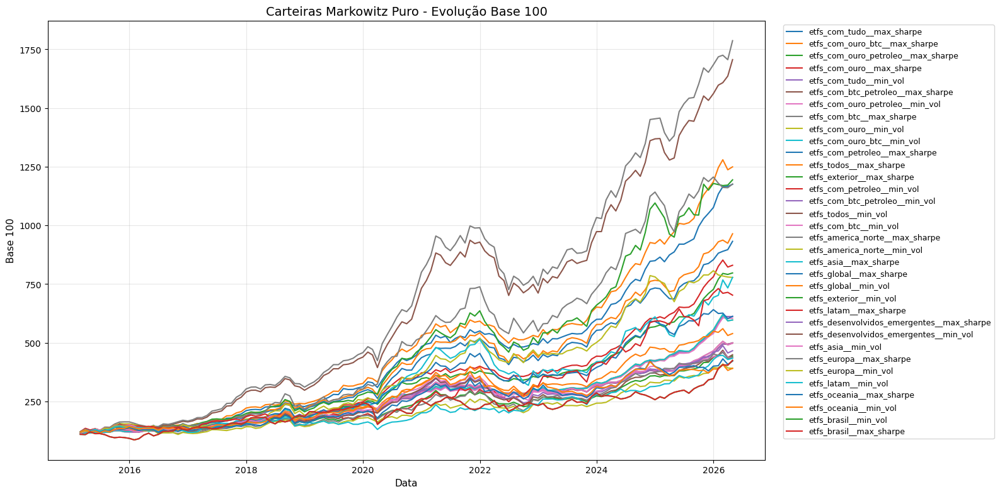

OK

[6/10] Gerando gráfico drawdown - todas as carteiras...


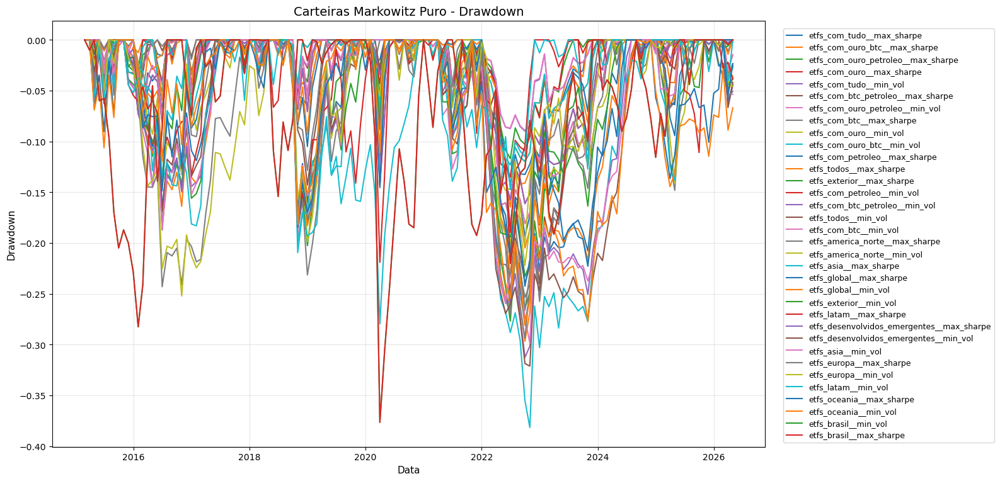

OK

[7/10] Gerando gráficos de apoio para o HTML...


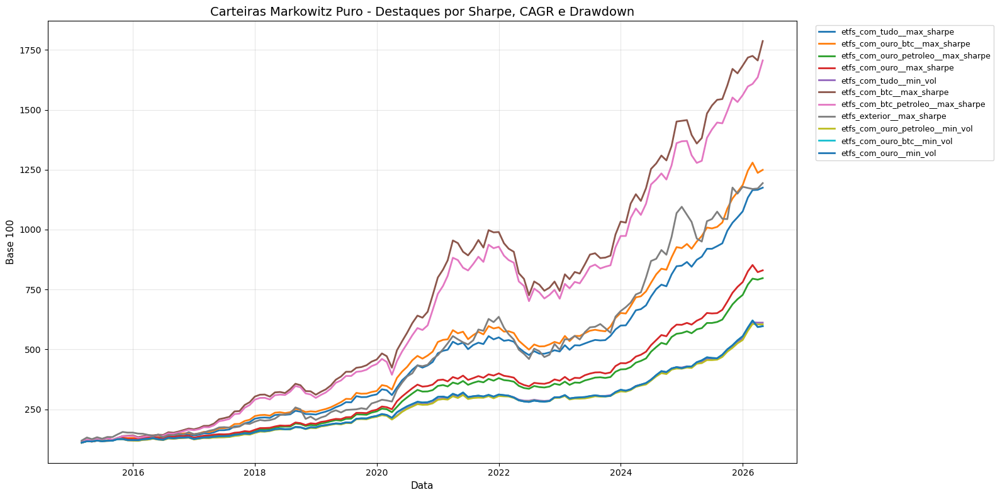

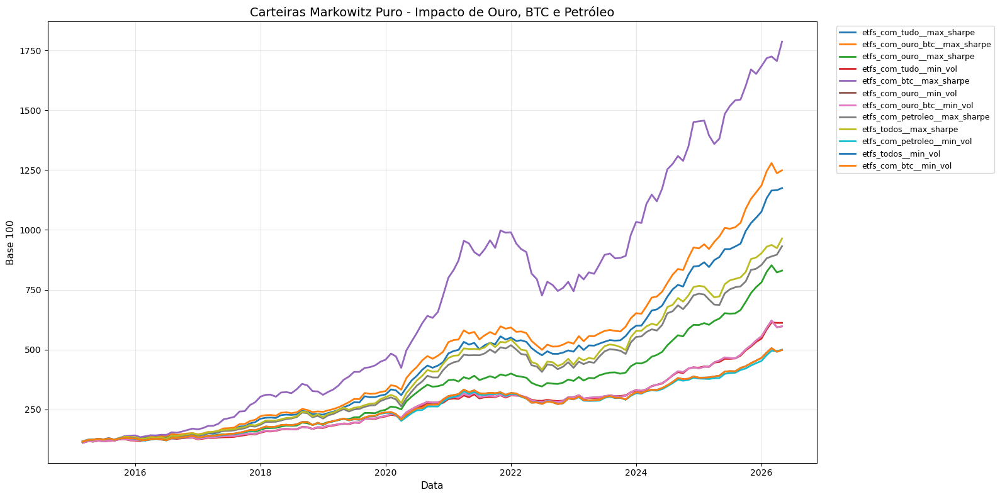

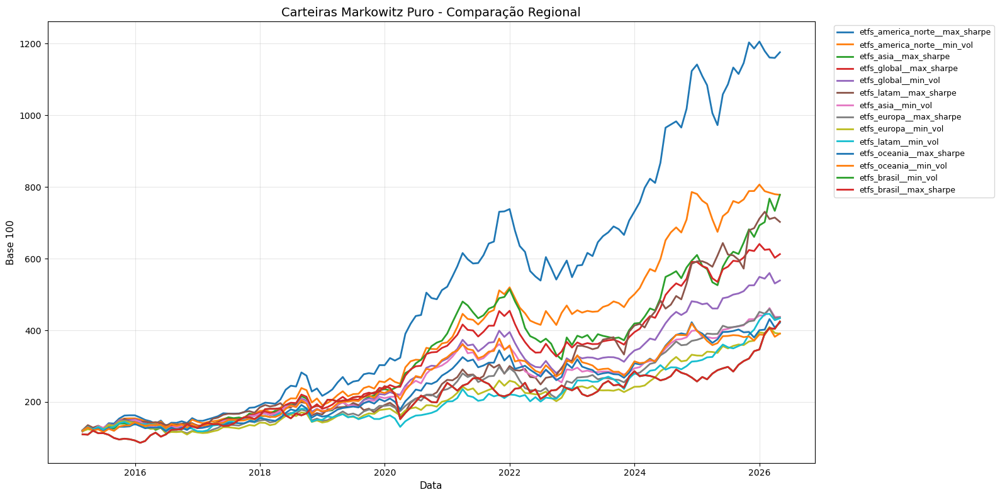

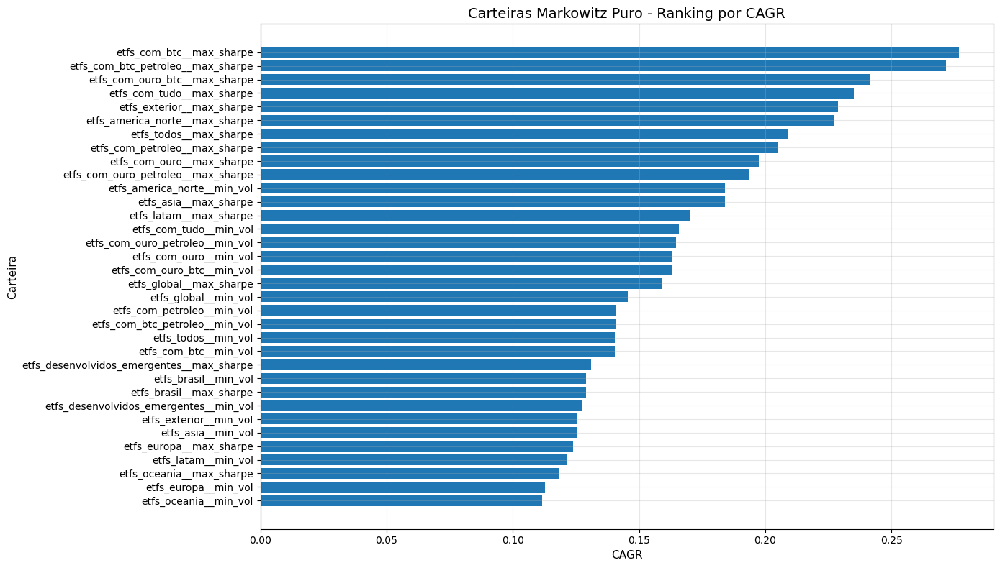

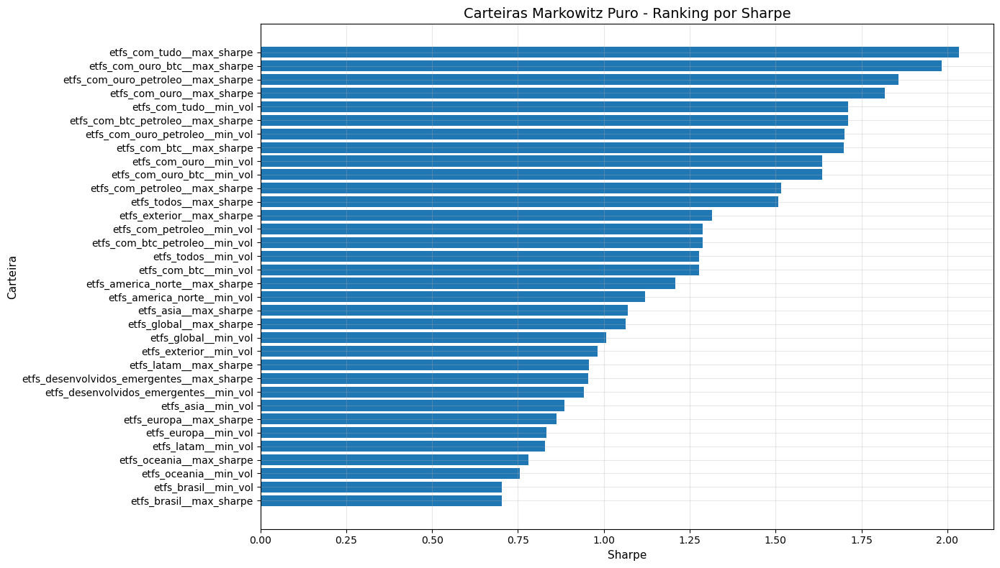

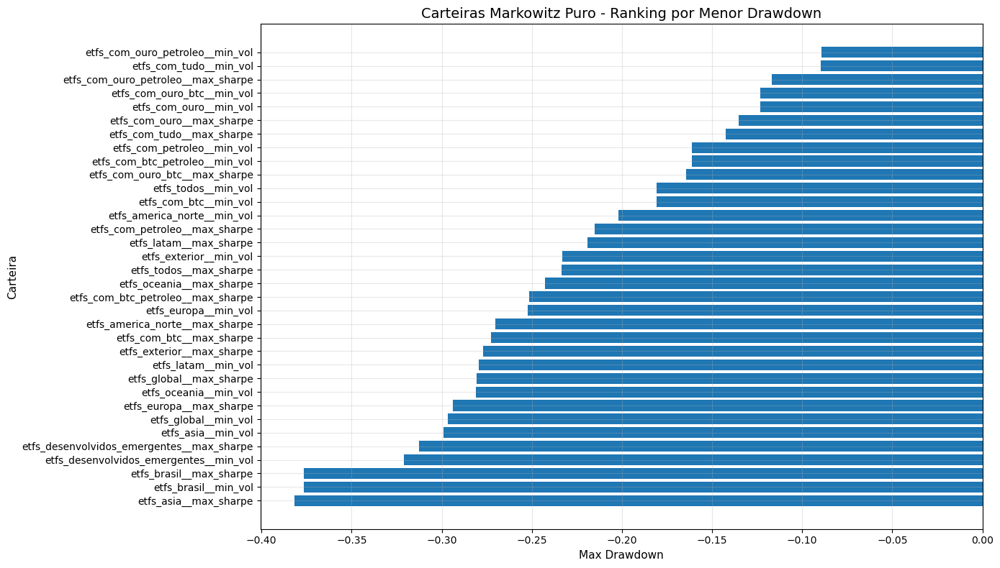

OK

[8/10] Gerando gráficos adicionais de pesos e concentração...


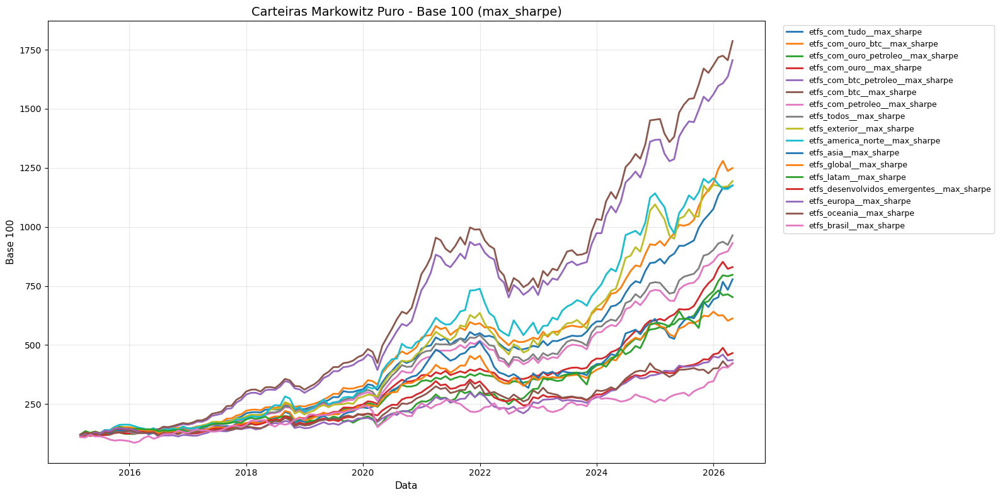

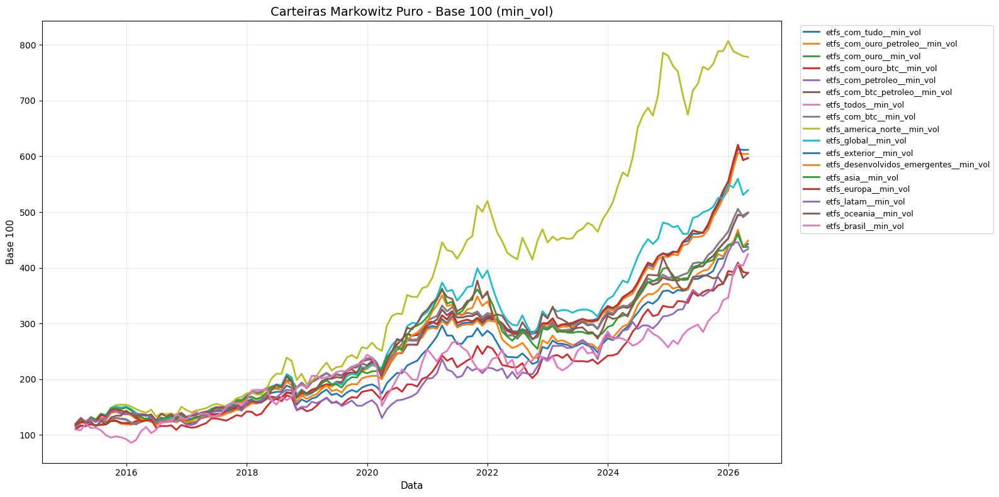

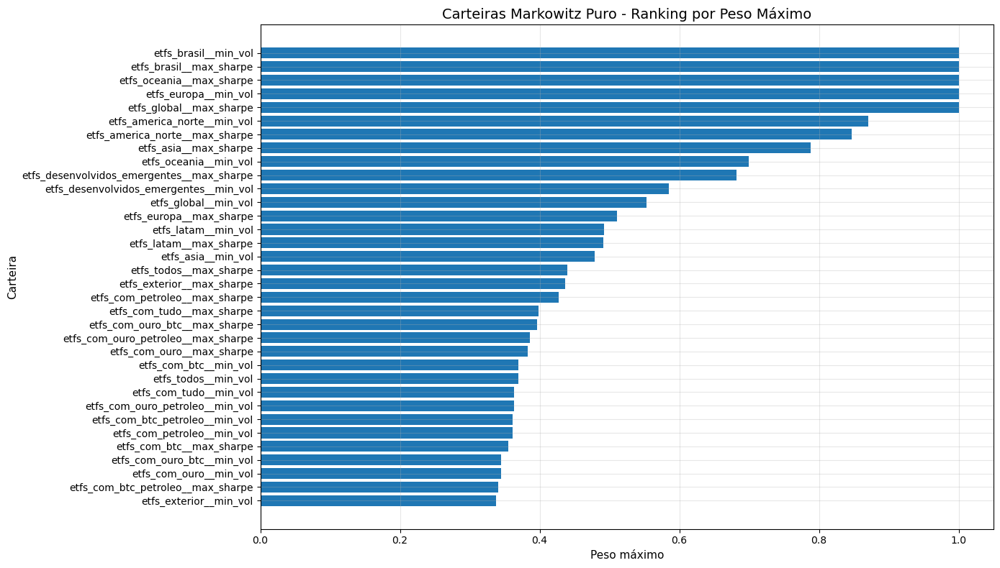

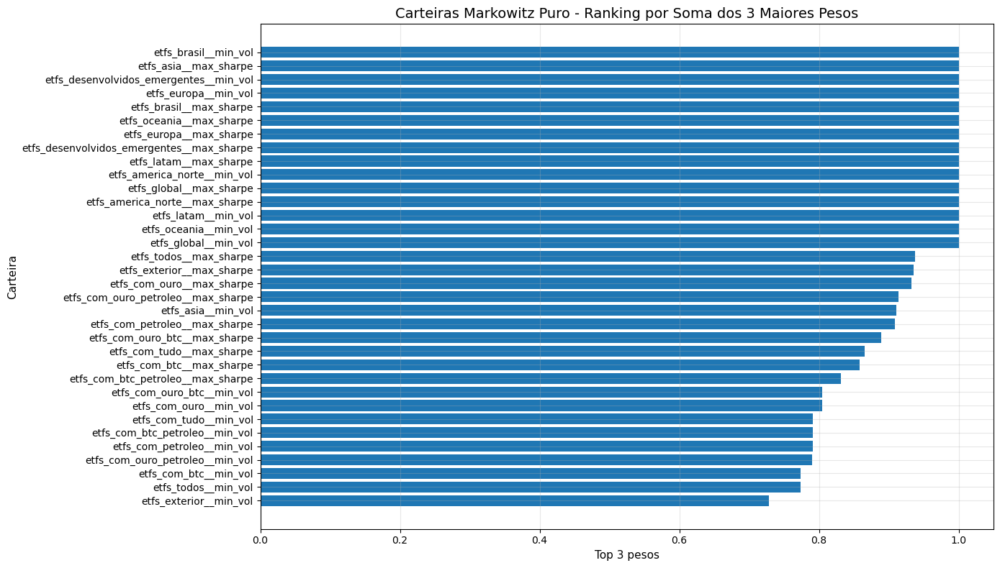

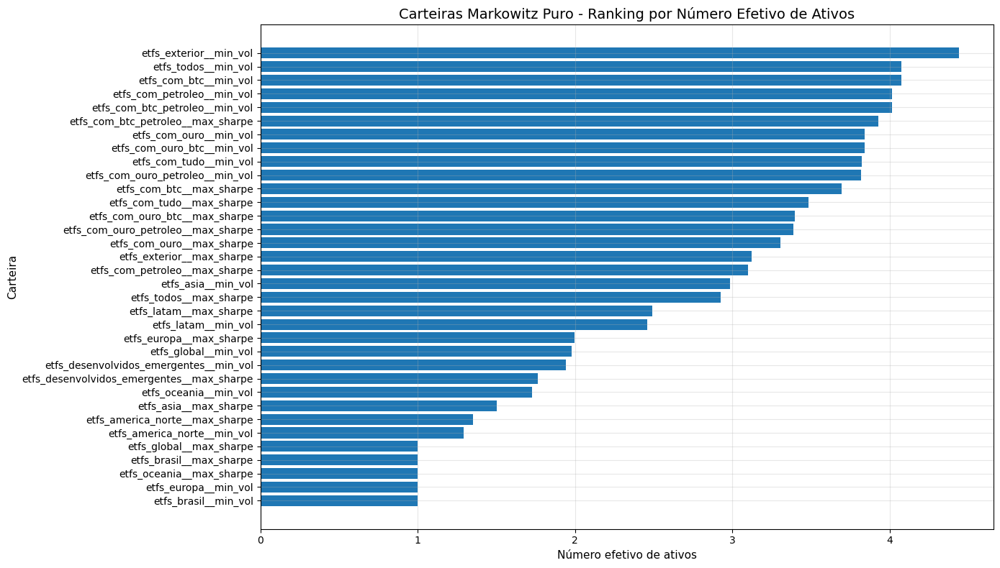

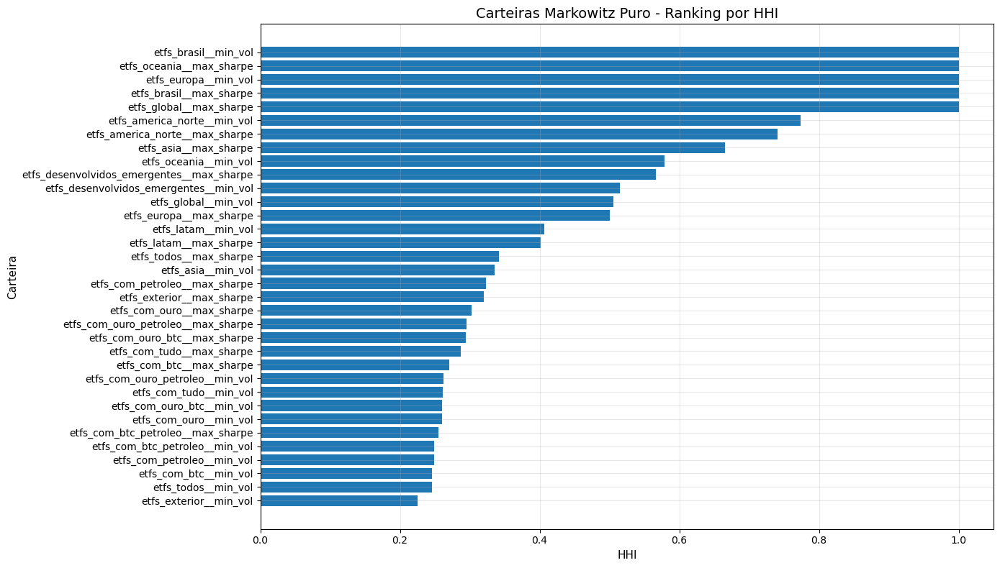

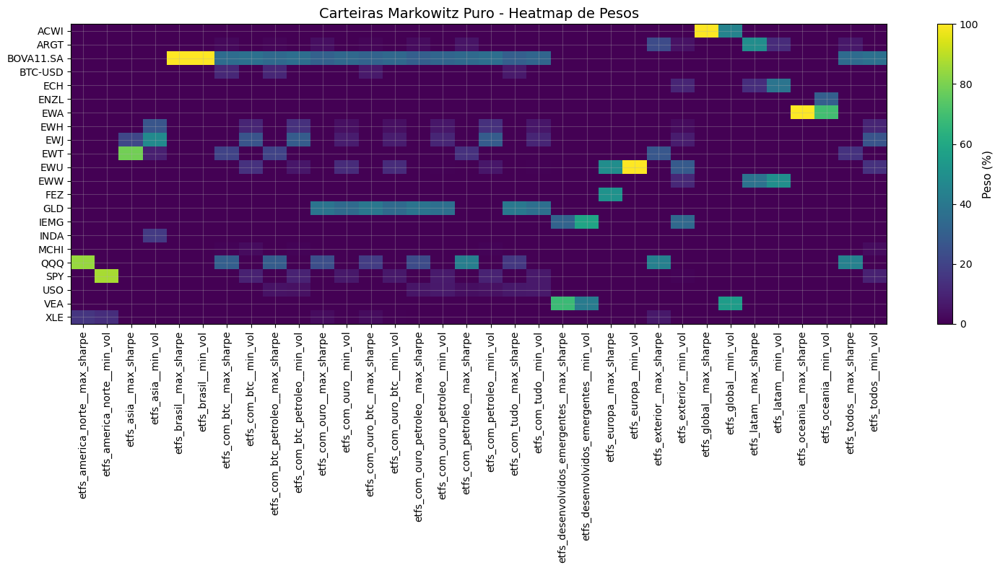

OK

[9/10] Exibindo tabelas de destaque...

--- Resumo visual das carteiras Markowitz puro ---


,carteira,tipo,coluna_retorno,cagr,vol_anual,sharpe,sortino,max_drawdown,calmar,pct_meses_positivos,n_ativos_com_peso,peso_max,top3_peso,hhi,n_efetivo_ativos,classificacao_concentracao
0,etfs_com_tudo,max_sharpe,etfs_com_tudo__max_sharpe,0.2351046368,0.1117069081,2.0327777330,4.3821376475,-0.1425450722,1.6493354222,0.7111111111,6,0.3986233275,0.8655149781,0.2867969934,3.4867869013,alta
1,etfs_com_ouro_btc,max_sharpe,etfs_com_ouro_btc__max_sharpe,0.2416052669,0.1175504000,1.9842364672,4.6470937186,-0.1645278049,1.4684768152,0.7037037037,6,0.3961248462,0.8894860544,0.2942434995,3.3985457683,alta
2,etfs_com_ouro_petroleo,max_sharpe,etfs_com_ouro_petroleo__max_sharpe,0.1933061403,0.1028280123,1.8585203614,3.9376925913,-0.1169142556,1.6534009421,0.6888888889,5,0.3855927892,0.9138188089,0.2950432100,3.3893340570,alta
3,etfs_com_ouro,max_sharpe,etfs_com_ouro__max_sharpe,0.1973691767,0.1073026944,1.8189297726,3.9860762577,-0.1351632743,1.4602278439,0.6814814815,5,0.3830226013,0.9328329282,0.3026590343,3.3040480761,alta
4,etfs_com_tudo,min_vol,etfs_com_tudo__min_vol,0.1659191377,0.0974189937,1.7111688717,2.8526874048,-0.0898325858,1.8469816517,0.6592592593,8,0.3637892987,0.7914068317,0.2616552850,3.8218222886,alta
5,etfs_com_btc_petroleo,max_sharpe,etfs_com_btc_petroleo__max_sharpe,0.2714815344,0.1558735328,1.7107718050,2.9547719093,-0.2513574471,1.0800616311,0.6888888889,7,0.3405481012,0.8312320440,0.2546538823,3.9268987032,alta
6,etfs_com_ouro_petroleo,min_vol,etfs_com_ouro_petroleo__min_vol,0.1646897223,0.0974276358,1.6999753008,2.8382055876,-0.0892001168,1.8462949185,0.6592592593,7,0.3635115071,0.7903225528,0.2617834265,3.8199515278,alta
7,etfs_com_btc,max_sharpe,etfs_com_btc__max_sharpe,0.2765662692,0.1598415180,1.6980068208,3.1646073574,-0.2724909206,1.0149559058,0.6962962963,6,0.3546885390,0.8583288042,0.2705293626,3.6964564229,alta
8,etfs_com_ouro,min_vol,etfs_com_ouro__min_vol,0.1628791190,0.1007049747,1.6364326736,3.0609485311,-0.1231700081,1.3223926950,0.6740740741,8,0.3443564903,0.8050314295,0.2602179771,3.8429320343,alta
9,etfs_com_ouro_btc,min_vol,etfs_com_ouro_btc__min_vol,0.1628791137,0.1007049747,1.6364326293,3.0609485308,-0.1231700054,1.3223926809,0.6740740741,8,0.3443565038,0.8050316760,0.2602180138,3.8429314921,alta



--- Top 10 pesos por carteira ---


,carteira,tipo,coluna_retorno,carteira_tipo,ativo,peso,peso_pct
0,etfs_america_norte,max_sharpe,etfs_america_norte__max_sharpe,etfs_america_norte__max_sharpe,QQQ,8.4659498578e-01,8.4659498578e+01
1,etfs_america_norte,max_sharpe,etfs_america_norte__max_sharpe,etfs_america_norte__max_sharpe,XLE,1.5340501422e-01,1.5340501422e+01
2,etfs_america_norte,max_sharpe,etfs_america_norte__max_sharpe,etfs_america_norte__max_sharpe,SPY,5.2197630958e-17,5.2197630958e-15
3,etfs_america_norte,min_vol,etfs_america_norte__min_vol,etfs_america_norte__min_vol,SPY,8.7011504070e-01,8.7011504070e+01
4,etfs_america_norte,min_vol,etfs_america_norte__min_vol,etfs_america_norte__min_vol,XLE,1.2988495930e-01,1.2988495930e+01
...,...,...,...,...,...,...,...
223,etfs_todos,min_vol,etfs_todos__min_vol,etfs_todos__min_vol,MCHI,2.9640151865e-02,2.9640151865e+00
224,etfs_todos,min_vol,etfs_todos__min_vol,etfs_todos__min_vol,EZA,6.2047525068e-17,6.2047525068e-15
225,etfs_todos,min_vol,etfs_todos__min_vol,etfs_todos__min_vol,QQQ,5.3664474036e-17,5.3664474036e-15
226,etfs_todos,min_vol,etfs_todos__min_vol,etfs_todos__min_vol,ENZL,3.5830521978e-17,3.5830521978e-15



--- Heatmap de pesos (tabela em %) ---


carteira_tipo,etfs_america_norte__max_sharpe,etfs_america_norte__min_vol,etfs_asia__max_sharpe,etfs_asia__min_vol,etfs_brasil__max_sharpe,etfs_brasil__min_vol,etfs_com_btc__max_sharpe,etfs_com_btc__min_vol,etfs_com_btc_petroleo__max_sharpe,etfs_com_btc_petroleo__min_vol,etfs_com_ouro__max_sharpe,etfs_com_ouro__min_vol,etfs_com_ouro_btc__max_sharpe,etfs_com_ouro_btc__min_vol,etfs_com_ouro_petroleo__max_sharpe,etfs_com_ouro_petroleo__min_vol,etfs_com_petroleo__max_sharpe,etfs_com_petroleo__min_vol,etfs_com_tudo__max_sharpe,etfs_com_tudo__min_vol,etfs_desenvolvidos_emergentes__max_sharpe,etfs_desenvolvidos_emergentes__min_vol,etfs_europa__max_sharpe,etfs_europa__min_vol,etfs_exterior__max_sharpe,etfs_exterior__min_vol,etfs_global__max_sharpe,etfs_global__min_vol,etfs_latam__max_sharpe,etfs_latam__min_vol,etfs_oceania__max_sharpe,etfs_oceania__min_vol,etfs_todos__max_sharpe,etfs_todos__min_vol
ativo,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
ACWI,0.0000,0.0000,0.0000,0.0000,0.0,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.000,0.000,0.0000,0.0,0.0000,0.0000,100.0,44.6514,0.0000,0.0000,0.0,0.0000,0.0000,0.0000
ARGT,0.0000,0.0000,0.0000,0.0000,0.0,0.0,2.3035,0.0000,1.1998,0.0000,3.8279,0.0000,1.2591,0.0000,2.8606,0.0000,5.3369,0.0000,0.1716,0.0000,0.000,0.000,0.0000,0.0,22.8244,4.9826,0.0,0.0000,49.1117,12.1499,0.0,0.0000,6.2745,0.0000
BOVA11.SA,0.0000,0.0000,0.0000,0.0000,100.0,100.0,35.4689,36.9452,34.0548,36.0978,31.0311,33.8448,31.6710,33.8448,30.0970,32.4642,34.0122,36.0978,30.4452,32.4452,0.000,0.000,0.0000,0.0,0.0000,0.0000,0.0,0.0000,0.0000,0.0000,0.0,0.0000,35.1046,36.9452
BTC-USD,0.0000,0.0000,0.0000,0.0000,0.0,0.0,10.9876,0.0000,10.7754,0.0000,0.0000,0.0000,6.9756,0.0000,0.0000,0.0000,0.0000,0.0000,6.7363,0.1931,0.000,0.000,0.0000,0.0,0.0000,0.0000,0.0,0.0000,0.0000,0.0000,0.0,0.0000,0.0000,0.0000
ECH,0.0000,0.0000,0.0000,0.0000,0.0,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.000,0.000,0.0000,0.0,0.0000,10.4741,0.0,0.0000,13.0597,38.6223,0.0,0.0000,0.0000,0.0000
ENZL,0.0000,0.0000,0.0000,0.0000,0.0,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.000,0.000,0.0000,0.0,0.0000,0.0000,0.0,0.0000,0.0000,0.0000,0.0,30.1068,0.0000,0.0000
EWA,0.0000,0.0000,0.0000,0.0000,0.0,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.000,0.000,0.0000,0.0,0.0000,0.0000,0.0,0.0000,0.0000,0.0000,100.0,69.8932,0.0000,0.0000
EWG,0.0000,0.0000,0.0000,0.0000,0.0,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.000,0.000,0.0000,0.0,0.0000,0.0000,0.0,0.0000,0.0000,0.0000,0.0,0.0000,0.0000,0.0000
EWH,0.0000,0.0000,0.0000,26.2305,0.0,0.0,0.0000,10.4643,0.0000,13.9973,0.0000,4.2772,0.0000,4.2772,0.0000,6.1451,0.0000,13.9972,0.0000,6.2186,0.000,0.000,0.0000,0.0,0.0000,2.8219,0.0,0.0000,0.0000,0.0000,0.0,0.0000,0.0000,10.4643



[10/10] Etapa concluída.

------------------------------------------------------------------------------------------
RESUMO DOS ARQUIVOS GERADOS
------------------------------------------------------------------------------------------
Base 100 - todas......................: resultados/graficos/carteiras_markowitz_puro_base100_todas.png
Drawdown - todas......................: resultados/graficos/carteiras_markowitz_puro_drawdown_todas.png
Base 100 - destaques.................: resultados/graficos/carteiras_markowitz_puro_base100_destaques.png
Base 100 - alternativos..............: resultados/graficos/carteiras_markowitz_puro_base100_alternativos.png
Base 100 - regionais.................: resultados/graficos/carteiras_markowitz_puro_base100_regionais.png
Barras CAGR...........................: resultados/graficos/carteiras_markowitz_puro_ranking_cagr.png
Barras Sharpe.........................: resultados/graficos/carteiras_markowitz_puro_ranking_sharpe.png
Barras Drawdown..............

In [24]:
%%time
# ==========================================================================================
# ETAPA 23 - COMPARAÇÃO VISUAL DAS CARTEIRAS MARKOWITZ PURO
# ==========================================================================================

print("=" * 90)
print("INICIANDO ETAPA 23 - COMPARAÇÃO VISUAL DAS CARTEIRAS MARKOWITZ PURO")
print("=" * 90)

# ==========================================================================================
# [1/10] VALIDAÇÕES INICIAIS
# ==========================================================================================
print("\n[1/10] Validando objetos de entrada...")

variaveis_obrigatorias = [
    "df_carteiras_markowitz_puro",
    "df_carteiras_markowitz_puro_base100",
    "df_metricas_markowitz_puro",
    "df_pesos_markowitz_puro",
]
variaveis_faltantes = [v for v in variaveis_obrigatorias if v not in globals()]

if variaveis_faltantes:
    raise NameError(
        f"As seguintes variáveis obrigatórias não existem no ambiente: {variaveis_faltantes}"
    )

if not isinstance(df_carteiras_markowitz_puro, pd.DataFrame):
    raise TypeError("df_carteiras_markowitz_puro precisa ser um pandas DataFrame.")

if not isinstance(df_carteiras_markowitz_puro_base100, pd.DataFrame):
    raise TypeError("df_carteiras_markowitz_puro_base100 precisa ser um pandas DataFrame.")

if not isinstance(df_metricas_markowitz_puro, pd.DataFrame):
    raise TypeError("df_metricas_markowitz_puro precisa ser um pandas DataFrame.")

if not isinstance(df_pesos_markowitz_puro, pd.DataFrame):
    raise TypeError("df_pesos_markowitz_puro precisa ser um pandas DataFrame.")

if df_carteiras_markowitz_puro.empty:
    raise ValueError("df_carteiras_markowitz_puro está vazio.")

if df_carteiras_markowitz_puro_base100.empty:
    raise ValueError("df_carteiras_markowitz_puro_base100 está vazio.")

if df_metricas_markowitz_puro.empty:
    raise ValueError("df_metricas_markowitz_puro está vazio.")

if df_pesos_markowitz_puro.empty:
    raise ValueError("df_pesos_markowitz_puro está vazio.")

# Cópias defensivas
df_carteiras_markowitz_puro = df_carteiras_markowitz_puro.copy()
df_carteiras_markowitz_puro_base100 = df_carteiras_markowitz_puro_base100.copy()
df_metricas_markowitz_puro = df_metricas_markowitz_puro.copy()
df_pesos_markowitz_puro = df_pesos_markowitz_puro.copy()

df_carteiras_markowitz_puro.index = pd.to_datetime(df_carteiras_markowitz_puro.index)
df_carteiras_markowitz_puro_base100.index = pd.to_datetime(df_carteiras_markowitz_puro_base100.index)

df_carteiras_markowitz_puro = df_carteiras_markowitz_puro.sort_index()
df_carteiras_markowitz_puro_base100 = df_carteiras_markowitz_puro_base100.sort_index()

if "coluna_retorno" not in df_metricas_markowitz_puro.columns:
    raise ValueError("df_metricas_markowitz_puro precisa conter a coluna 'coluna_retorno'.")

if "carteira_tipo" not in df_pesos_markowitz_puro.columns:
    df_pesos_markowitz_puro["carteira_tipo"] = (
        df_pesos_markowitz_puro["carteira"].astype(str) + "__" + df_pesos_markowitz_puro["tipo"].astype(str)
    )

# Colunas comuns
colunas_comuns = [
    c for c in df_carteiras_markowitz_puro.columns
    if c in df_carteiras_markowitz_puro_base100.columns
    and c in df_metricas_markowitz_puro["coluna_retorno"].astype(str).tolist()
]

if len(colunas_comuns) == 0:
    raise ValueError("Não há carteiras em comum entre os objetos de entrada.")

df_carteiras_markowitz_puro = df_carteiras_markowitz_puro[colunas_comuns].copy()
df_carteiras_markowitz_puro_base100 = df_carteiras_markowitz_puro_base100[colunas_comuns].copy()

os.makedirs("resultados/graficos", exist_ok=True)
os.makedirs("resultados/tabelas", exist_ok=True)

print("OK")
print(f"Carteiras disponíveis................: {len(colunas_comuns)}")
print(
    f"Período analisado....................: "
    f"{df_carteiras_markowitz_puro.index.min().date()} até {df_carteiras_markowitz_puro.index.max().date()}"
)

# ==========================================================================================
# [2/10] PREPARANDO BASES VISUAIS
# ==========================================================================================
print("\n[2/10] Preparando bases visuais...")

# Base 100 ordenada conforme ranking de Sharpe da etapa 22
ordem_sharpe = (
    df_metricas_markowitz_puro
    .sort_values(by=["sharpe", "cagr"], ascending=[False, False])["coluna_retorno"]
    .tolist()
)

ordem_sharpe = [c for c in ordem_sharpe if c in df_carteiras_markowitz_puro_base100.columns]

df_carteiras_markowitz_puro_base100_plot = df_carteiras_markowitz_puro_base100[ordem_sharpe].copy()

# Drawdown
df_carteiras_markowitz_puro_drawdown = (
    df_carteiras_markowitz_puro_base100_plot
    .div(df_carteiras_markowitz_puro_base100_plot.cummax())
    .sub(1.0)
)

# Tabela resumo para apoio visual
colunas_resumo = [
    "carteira",
    "tipo",
    "coluna_retorno",
    "cagr",
    "vol_anual",
    "sharpe",
    "sortino",
    "max_drawdown",
    "calmar",
    "pct_meses_positivos",
    "n_ativos_com_peso",
    "peso_max",
    "top3_peso",
    "hhi",
    "n_efetivo_ativos",
    "classificacao_concentracao",
]

colunas_resumo = [c for c in colunas_resumo if c in df_metricas_markowitz_puro.columns]

df_resumo_visual_carteiras_markowitz_puro = (
    df_metricas_markowitz_puro[colunas_resumo]
    .sort_values(by=["sharpe", "cagr"], ascending=[False, False])
    .reset_index(drop=True)
    .copy()
)

# Versões longas para eventual uso futuro no HTML
df_base100_long_markowitz_puro = (
    df_carteiras_markowitz_puro_base100_plot
    .reset_index()
    .rename(columns={"index": "data"})
    .melt(id_vars="data", var_name="carteira", value_name="base100")
)

df_drawdown_long_markowitz_puro = (
    df_carteiras_markowitz_puro_drawdown
    .reset_index()
    .rename(columns={"index": "data"})
    .melt(id_vars="data", var_name="carteira", value_name="drawdown")
)

# Tabela de pesos top 10 por carteira
df_top10_pesos_markowitz_puro = (
    df_pesos_markowitz_puro
    .assign(peso_pct=df_pesos_markowitz_puro["peso"] * 100)
    .sort_values(by=["carteira_tipo", "peso"], ascending=[True, False])
    .groupby("carteira_tipo", as_index=False)
    .head(10)
    .reset_index(drop=True)
)

# Matriz de pesos em %
df_pesos_heatmap_markowitz_puro = (
    df_pesos_markowitz_puro
    .assign(peso_pct=df_pesos_markowitz_puro["peso"] * 100)
    .pivot(index="ativo", columns="carteira_tipo", values="peso_pct")
    .fillna(0.0)
    .round(4)
)

print("OK")
print(f"Base 100 shape.......................: {df_carteiras_markowitz_puro_base100_plot.shape}")
print(f"Drawdown shape.......................: {df_carteiras_markowitz_puro_drawdown.shape}")
print(f"Tabela resumo shape..................: {df_resumo_visual_carteiras_markowitz_puro.shape}")
print(f"Top 10 pesos shape...................: {df_top10_pesos_markowitz_puro.shape}")

# ==========================================================================================
# [3/10] SALVANDO TABELAS AUXILIARES
# ==========================================================================================
print("\n[3/10] Salvando tabelas auxiliares...")

caminho_csv_base100 = "resultados/tabelas/carteiras_markowitz_puro_base100.csv"
caminho_html_base100 = "resultados/tabelas/carteiras_markowitz_puro_base100.html"

caminho_csv_drawdown = "resultados/tabelas/carteiras_markowitz_puro_drawdown.csv"
caminho_html_drawdown = "resultados/tabelas/carteiras_markowitz_puro_drawdown.html"

caminho_csv_resumo_visual = "resultados/tabelas/resumo_visual_carteiras_markowitz_puro.csv"
caminho_html_resumo_visual = "resultados/tabelas/resumo_visual_carteiras_markowitz_puro.html"

caminho_csv_base100_long = "resultados/tabelas/carteiras_markowitz_puro_base100_long.csv"
caminho_csv_drawdown_long = "resultados/tabelas/carteiras_markowitz_puro_drawdown_long.csv"

caminho_csv_top10_pesos = "resultados/tabelas/carteiras_markowitz_puro_top10_pesos.csv"
caminho_html_top10_pesos = "resultados/tabelas/carteiras_markowitz_puro_top10_pesos.html"

caminho_csv_heatmap_pesos = "resultados/tabelas/carteiras_markowitz_puro_heatmap_pesos.csv"
caminho_html_heatmap_pesos = "resultados/tabelas/carteiras_markowitz_puro_heatmap_pesos.html"

df_carteiras_markowitz_puro_base100_plot.to_csv(caminho_csv_base100, sep=",", decimal=".")
df_carteiras_markowitz_puro_drawdown.to_csv(caminho_csv_drawdown, sep=",", decimal=".")
df_resumo_visual_carteiras_markowitz_puro.to_csv(caminho_csv_resumo_visual, index=False, sep=",", decimal=".")
df_base100_long_markowitz_puro.to_csv(caminho_csv_base100_long, index=False, sep=",", decimal=".")
df_drawdown_long_markowitz_puro.to_csv(caminho_csv_drawdown_long, index=False, sep=",", decimal=".")
df_top10_pesos_markowitz_puro.to_csv(caminho_csv_top10_pesos, index=False, sep=",", decimal=".")
df_pesos_heatmap_markowitz_puro.to_csv(caminho_csv_heatmap_pesos, sep=",", decimal=".")

df_carteiras_markowitz_puro_base100_plot.to_html(
    caminho_html_base100,
    border=0,
    justify="center",
    float_format=lambda x: f"{x:,.2f}"
)

df_carteiras_markowitz_puro_drawdown.to_html(
    caminho_html_drawdown,
    border=0,
    justify="center",
    float_format=lambda x: f"{x:.4%}"
)

formatters_resumo = {
    "cagr": lambda x: f"{x:.2%}" if pd.notna(x) else "",
    "vol_anual": lambda x: f"{x:.2%}" if pd.notna(x) else "",
    "sharpe": lambda x: f"{x:.4f}" if pd.notna(x) else "",
    "sortino": lambda x: f"{x:.4f}" if pd.notna(x) else "",
    "max_drawdown": lambda x: f"{x:.2%}" if pd.notna(x) else "",
    "calmar": lambda x: f"{x:.4f}" if pd.notna(x) else "",
    "pct_meses_positivos": lambda x: f"{x:.2%}" if pd.notna(x) else "",
    "peso_max": lambda x: f"{x:.2%}" if pd.notna(x) else "",
    "top3_peso": lambda x: f"{x:.2%}" if pd.notna(x) else "",
    "hhi": lambda x: f"{x:.4f}" if pd.notna(x) else "",
    "n_efetivo_ativos": lambda x: f"{x:.2f}" if pd.notna(x) else "",
}

df_resumo_visual_carteiras_markowitz_puro.to_html(
    caminho_html_resumo_visual,
    index=False,
    border=0,
    justify="center",
    formatters={k: v for k, v in formatters_resumo.items() if k in df_resumo_visual_carteiras_markowitz_puro.columns}
)

df_top10_pesos_markowitz_puro.to_html(
    caminho_html_top10_pesos,
    index=False,
    border=0,
    justify="center",
    formatters={
        "peso": lambda x: f"{x:.4%}" if pd.notna(x) else "",
        "peso_pct": lambda x: f"{x:.2f}%" if pd.notna(x) else "",
    }
)

df_pesos_heatmap_markowitz_puro.to_html(
    caminho_html_heatmap_pesos,
    border=0,
    justify="center",
    float_format=lambda x: f"{x:.2f}"
)

print("OK")
print(f"CSV base 100.........................: {caminho_csv_base100}")
print(f"CSV drawdown.........................: {caminho_csv_drawdown}")
print(f"CSV resumo visual....................: {caminho_csv_resumo_visual}")

# ==========================================================================================
# [4/10] DEFININDO GRUPOS PARA GRÁFICOS
# ==========================================================================================
print("\n[4/10] Definindo grupos para visualização...")

top5_sharpe = (
    df_metricas_markowitz_puro
    .sort_values(by=["sharpe", "cagr"], ascending=[False, False])["coluna_retorno"]
    .head(5)
    .tolist()
)

top5_cagr = (
    df_metricas_markowitz_puro
    .sort_values(by=["cagr", "sharpe"], ascending=[False, False])["coluna_retorno"]
    .head(5)
    .tolist()
)

top5_menor_drawdown = (
    df_metricas_markowitz_puro
    .sort_values(by=["max_drawdown", "sharpe"], ascending=[False, False])["coluna_retorno"]
    .head(5)
    .tolist()
)

carteiras_destaque = []
for carteira in top5_sharpe + top5_cagr + top5_menor_drawdown:
    if carteira not in carteiras_destaque:
        carteiras_destaque.append(carteira)

# Conjuntos específicos importantes para narrativa do projeto
familias_base_alternativos = [
    "etfs_todos",
    "etfs_com_ouro",
    "etfs_com_btc",
    "etfs_com_petroleo",
    "etfs_com_ouro_btc",
    "etfs_com_tudo",
]

carteiras_base_alternativos = [
    c for c in df_carteiras_markowitz_puro_base100_plot.columns
    if c.rsplit("__", 1)[0] in familias_base_alternativos
]

familias_regionais = [
    "etfs_brasil",
    "etfs_america_norte",
    "etfs_europa",
    "etfs_asia",
    "etfs_oceania",
    "etfs_latam",
    "etfs_global",
]

carteiras_regionais = [
    c for c in df_carteiras_markowitz_puro_base100_plot.columns
    if c.rsplit("__", 1)[0] in familias_regionais
]

carteiras_max_sharpe = [
    c for c in df_carteiras_markowitz_puro_base100_plot.columns
    if c.endswith("__max_sharpe")
]

carteiras_min_vol = [
    c for c in df_carteiras_markowitz_puro_base100_plot.columns
    if c.endswith("__min_vol")
]

print("OK")
print(f"Carteiras destaque...................: {len(carteiras_destaque)}")
print(f"Grupo base x alternativos............: {len(carteiras_base_alternativos)}")
print(f"Grupo regionais......................: {len(carteiras_regionais)}")
print(f"Grupo max_sharpe.....................: {len(carteiras_max_sharpe)}")
print(f"Grupo min_vol........................: {len(carteiras_min_vol)}")

# ==========================================================================================
# [5/10] GRÁFICO 1 - BASE 100 (TODAS AS CARTEIRAS)
# ==========================================================================================
print("\n[5/10] Gerando gráfico base 100 - todas as carteiras...")

plt.figure(figsize=(16, 8))

for coluna in df_carteiras_markowitz_puro_base100_plot.columns:
    plt.plot(
        df_carteiras_markowitz_puro_base100_plot.index,
        df_carteiras_markowitz_puro_base100_plot[coluna],
        linewidth=1.5,
        label=coluna
    )

plt.title("Carteiras Markowitz Puro - Evolução Base 100", fontsize=14)
plt.xlabel("Data")
plt.ylabel("Base 100")
plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), fontsize=9)
plt.grid(True, alpha=0.3)
plt.tight_layout()

caminho_grafico_base100_todas = "resultados/graficos/carteiras_markowitz_puro_base100_todas.png"
plt.savefig(caminho_grafico_base100_todas, dpi=300, bbox_inches="tight")
plt.show()

print("OK")

# ==========================================================================================
# [6/10] GRÁFICO 2 - DRAWDOWN (TODAS AS CARTEIRAS)
# ==========================================================================================
print("\n[6/10] Gerando gráfico drawdown - todas as carteiras...")

plt.figure(figsize=(16, 8))

for coluna in df_carteiras_markowitz_puro_drawdown.columns:
    plt.plot(
        df_carteiras_markowitz_puro_drawdown.index,
        df_carteiras_markowitz_puro_drawdown[coluna],
        linewidth=1.5,
        label=coluna
    )

plt.title("Carteiras Markowitz Puro - Drawdown", fontsize=14)
plt.xlabel("Data")
plt.ylabel("Drawdown")
plt.legend(loc="lower left", bbox_to_anchor=(1.02, 0), fontsize=9)
plt.grid(True, alpha=0.3)
plt.tight_layout()

caminho_grafico_drawdown_todas = "resultados/graficos/carteiras_markowitz_puro_drawdown_todas.png"
plt.savefig(caminho_grafico_drawdown_todas, dpi=300, bbox_inches="tight")
plt.show()

print("OK")

# ==========================================================================================
# [7/10] GRÁFICOS DE APOIO PARA O HTML (BASELINE DA ETAPA 17)
# ==========================================================================================
print("\n[7/10] Gerando gráficos de apoio para o HTML...")

# ------------------------------------------------------------------------------------------
# Base 100 - carteiras destaque
# ------------------------------------------------------------------------------------------
if len(carteiras_destaque) > 0:
    plt.figure(figsize=(16, 8))

    for coluna in carteiras_destaque:
        plt.plot(
            df_carteiras_markowitz_puro_base100_plot.index,
            df_carteiras_markowitz_puro_base100_plot[coluna],
            linewidth=2.0,
            label=coluna
        )

    plt.title("Carteiras Markowitz Puro - Destaques por Sharpe, CAGR e Drawdown", fontsize=14)
    plt.xlabel("Data")
    plt.ylabel("Base 100")
    plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), fontsize=9)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()

    caminho_grafico_base100_destaques = "resultados/graficos/carteiras_markowitz_puro_base100_destaques.png"
    plt.savefig(caminho_grafico_base100_destaques, dpi=300, bbox_inches="tight")
    plt.show()

# ------------------------------------------------------------------------------------------
# Base 100 - impacto dos alternativos
# ------------------------------------------------------------------------------------------
if len(carteiras_base_alternativos) > 0:
    plt.figure(figsize=(16, 8))

    for coluna in carteiras_base_alternativos:
        plt.plot(
            df_carteiras_markowitz_puro_base100_plot.index,
            df_carteiras_markowitz_puro_base100_plot[coluna],
            linewidth=2.0,
            label=coluna
        )

    plt.title("Carteiras Markowitz Puro - Impacto de Ouro, BTC e Petróleo", fontsize=14)
    plt.xlabel("Data")
    plt.ylabel("Base 100")
    plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), fontsize=9)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()

    caminho_grafico_base100_alternativos = "resultados/graficos/carteiras_markowitz_puro_base100_alternativos.png"
    plt.savefig(caminho_grafico_base100_alternativos, dpi=300, bbox_inches="tight")
    plt.show()

# ------------------------------------------------------------------------------------------
# Base 100 - carteiras regionais
# ------------------------------------------------------------------------------------------
if len(carteiras_regionais) > 0:
    plt.figure(figsize=(16, 8))

    for coluna in carteiras_regionais:
        plt.plot(
            df_carteiras_markowitz_puro_base100_plot.index,
            df_carteiras_markowitz_puro_base100_plot[coluna],
            linewidth=2.0,
            label=coluna
        )

    plt.title("Carteiras Markowitz Puro - Comparação Regional", fontsize=14)
    plt.xlabel("Data")
    plt.ylabel("Base 100")
    plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), fontsize=9)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()

    caminho_grafico_base100_regionais = "resultados/graficos/carteiras_markowitz_puro_base100_regionais.png"
    plt.savefig(caminho_grafico_base100_regionais, dpi=300, bbox_inches="tight")
    plt.show()

# ------------------------------------------------------------------------------------------
# Barras - CAGR
# ------------------------------------------------------------------------------------------
df_plot_cagr = (
    df_metricas_markowitz_puro[["coluna_retorno", "cagr"]]
    .sort_values(by="cagr", ascending=False)
    .reset_index(drop=True)
)

plt.figure(figsize=(14, 8))
plt.barh(df_plot_cagr["coluna_retorno"], df_plot_cagr["cagr"])
plt.gca().invert_yaxis()
plt.title("Carteiras Markowitz Puro - Ranking por CAGR", fontsize=14)
plt.xlabel("CAGR")
plt.ylabel("Carteira")
plt.grid(True, axis="x", alpha=0.3)
plt.tight_layout()

caminho_grafico_barras_cagr = "resultados/graficos/carteiras_markowitz_puro_ranking_cagr.png"
plt.savefig(caminho_grafico_barras_cagr, dpi=300, bbox_inches="tight")
plt.show()

# ------------------------------------------------------------------------------------------
# Barras - Sharpe
# ------------------------------------------------------------------------------------------
df_plot_sharpe = (
    df_metricas_markowitz_puro[["coluna_retorno", "sharpe"]]
    .sort_values(by="sharpe", ascending=False)
    .reset_index(drop=True)
)

plt.figure(figsize=(14, 8))
plt.barh(df_plot_sharpe["coluna_retorno"], df_plot_sharpe["sharpe"])
plt.gca().invert_yaxis()
plt.title("Carteiras Markowitz Puro - Ranking por Sharpe", fontsize=14)
plt.xlabel("Sharpe")
plt.ylabel("Carteira")
plt.grid(True, axis="x", alpha=0.3)
plt.tight_layout()

caminho_grafico_barras_sharpe = "resultados/graficos/carteiras_markowitz_puro_ranking_sharpe.png"
plt.savefig(caminho_grafico_barras_sharpe, dpi=300, bbox_inches="tight")
plt.show()

# ------------------------------------------------------------------------------------------
# Barras - Max Drawdown
# ------------------------------------------------------------------------------------------
df_plot_mdd = (
    df_metricas_markowitz_puro[["coluna_retorno", "max_drawdown"]]
    .sort_values(by="max_drawdown", ascending=False)
    .reset_index(drop=True)
)

plt.figure(figsize=(14, 8))
plt.barh(df_plot_mdd["coluna_retorno"], df_plot_mdd["max_drawdown"])
plt.gca().invert_yaxis()
plt.title("Carteiras Markowitz Puro - Ranking por Menor Drawdown", fontsize=14)
plt.xlabel("Max Drawdown")
plt.ylabel("Carteira")
plt.grid(True, axis="x", alpha=0.3)
plt.tight_layout()

caminho_grafico_barras_mdd = "resultados/graficos/carteiras_markowitz_puro_ranking_drawdown.png"
plt.savefig(caminho_grafico_barras_mdd, dpi=300, bbox_inches="tight")
plt.show()

print("OK")

# ==========================================================================================
# [8/10] ADENDOS DO MARKOWITZ - PESOS E CONCENTRAÇÃO
# ==========================================================================================
print("\n[8/10] Gerando gráficos adicionais de pesos e concentração...")

# ------------------------------------------------------------------------------------------
# Base 100 - max_sharpe
# ------------------------------------------------------------------------------------------
if len(carteiras_max_sharpe) > 0:
    plt.figure(figsize=(16, 8))

    for coluna in carteiras_max_sharpe:
        plt.plot(
            df_carteiras_markowitz_puro_base100_plot.index,
            df_carteiras_markowitz_puro_base100_plot[coluna],
            linewidth=2.0,
            label=coluna
        )

    plt.title("Carteiras Markowitz Puro - Base 100 (max_sharpe)", fontsize=14)
    plt.xlabel("Data")
    plt.ylabel("Base 100")
    plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), fontsize=9)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()

    caminho_grafico_base100_max_sharpe = "resultados/graficos/carteiras_markowitz_puro_base100_max_sharpe.png"
    plt.savefig(caminho_grafico_base100_max_sharpe, dpi=300, bbox_inches="tight")
    plt.show()

# ------------------------------------------------------------------------------------------
# Base 100 - min_vol
# ------------------------------------------------------------------------------------------
if len(carteiras_min_vol) > 0:
    plt.figure(figsize=(16, 8))

    for coluna in carteiras_min_vol:
        plt.plot(
            df_carteiras_markowitz_puro_base100_plot.index,
            df_carteiras_markowitz_puro_base100_plot[coluna],
            linewidth=2.0,
            label=coluna
        )

    plt.title("Carteiras Markowitz Puro - Base 100 (min_vol)", fontsize=14)
    plt.xlabel("Data")
    plt.ylabel("Base 100")
    plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), fontsize=9)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()

    caminho_grafico_base100_min_vol = "resultados/graficos/carteiras_markowitz_puro_base100_min_vol.png"
    plt.savefig(caminho_grafico_base100_min_vol, dpi=300, bbox_inches="tight")
    plt.show()

# ------------------------------------------------------------------------------------------
# Barras - Peso máximo
# ------------------------------------------------------------------------------------------
if "peso_max" in df_metricas_markowitz_puro.columns:
    df_plot_peso_max = (
        df_metricas_markowitz_puro[["coluna_retorno", "peso_max"]]
        .sort_values(by="peso_max", ascending=False)
        .reset_index(drop=True)
    )

    plt.figure(figsize=(14, 8))
    plt.barh(df_plot_peso_max["coluna_retorno"], df_plot_peso_max["peso_max"])
    plt.gca().invert_yaxis()
    plt.title("Carteiras Markowitz Puro - Ranking por Peso Máximo", fontsize=14)
    plt.xlabel("Peso máximo")
    plt.ylabel("Carteira")
    plt.grid(True, axis="x", alpha=0.3)
    plt.tight_layout()

    caminho_grafico_barras_peso_max = "resultados/graficos/carteiras_markowitz_puro_ranking_peso_maximo.png"
    plt.savefig(caminho_grafico_barras_peso_max, dpi=300, bbox_inches="tight")
    plt.show()

# ------------------------------------------------------------------------------------------
# Barras - Top 3 pesos
# ------------------------------------------------------------------------------------------
if "top3_peso" in df_metricas_markowitz_puro.columns:
    df_plot_top3 = (
        df_metricas_markowitz_puro[["coluna_retorno", "top3_peso"]]
        .sort_values(by="top3_peso", ascending=False)
        .reset_index(drop=True)
    )

    plt.figure(figsize=(14, 8))
    plt.barh(df_plot_top3["coluna_retorno"], df_plot_top3["top3_peso"])
    plt.gca().invert_yaxis()
    plt.title("Carteiras Markowitz Puro - Ranking por Soma dos 3 Maiores Pesos", fontsize=14)
    plt.xlabel("Top 3 pesos")
    plt.ylabel("Carteira")
    plt.grid(True, axis="x", alpha=0.3)
    plt.tight_layout()

    caminho_grafico_barras_top3 = "resultados/graficos/carteiras_markowitz_puro_ranking_top3_pesos.png"
    plt.savefig(caminho_grafico_barras_top3, dpi=300, bbox_inches="tight")
    plt.show()

# ------------------------------------------------------------------------------------------
# Barras - Número efetivo de ativos
# ------------------------------------------------------------------------------------------
if "n_efetivo_ativos" in df_metricas_markowitz_puro.columns:
    df_plot_nefetivo = (
        df_metricas_markowitz_puro[["coluna_retorno", "n_efetivo_ativos"]]
        .sort_values(by="n_efetivo_ativos", ascending=False)
        .reset_index(drop=True)
    )

    plt.figure(figsize=(14, 8))
    plt.barh(df_plot_nefetivo["coluna_retorno"], df_plot_nefetivo["n_efetivo_ativos"])
    plt.gca().invert_yaxis()
    plt.title("Carteiras Markowitz Puro - Ranking por Número Efetivo de Ativos", fontsize=14)
    plt.xlabel("Número efetivo de ativos")
    plt.ylabel("Carteira")
    plt.grid(True, axis="x", alpha=0.3)
    plt.tight_layout()

    caminho_grafico_barras_nefetivo = "resultados/graficos/carteiras_markowitz_puro_ranking_numero_efetivo.png"
    plt.savefig(caminho_grafico_barras_nefetivo, dpi=300, bbox_inches="tight")
    plt.show()

# ------------------------------------------------------------------------------------------
# Barras - HHI
# ------------------------------------------------------------------------------------------
if "hhi" in df_metricas_markowitz_puro.columns:
    df_plot_hhi = (
        df_metricas_markowitz_puro[["coluna_retorno", "hhi"]]
        .sort_values(by="hhi", ascending=False)
        .reset_index(drop=True)
    )

    plt.figure(figsize=(14, 8))
    plt.barh(df_plot_hhi["coluna_retorno"], df_plot_hhi["hhi"])
    plt.gca().invert_yaxis()
    plt.title("Carteiras Markowitz Puro - Ranking por HHI", fontsize=14)
    plt.xlabel("HHI")
    plt.ylabel("Carteira")
    plt.grid(True, axis="x", alpha=0.3)
    plt.tight_layout()

    caminho_grafico_barras_hhi = "resultados/graficos/carteiras_markowitz_puro_ranking_hhi.png"
    plt.savefig(caminho_grafico_barras_hhi, dpi=300, bbox_inches="tight")
    plt.show()

# ------------------------------------------------------------------------------------------
# Heatmap de pesos
# ------------------------------------------------------------------------------------------
if df_pesos_heatmap_markowitz_puro.shape[0] > 0 and df_pesos_heatmap_markowitz_puro.shape[1] > 0:
    df_heatmap_plot = df_pesos_heatmap_markowitz_puro.loc[
        df_pesos_heatmap_markowitz_puro.sum(axis=1) > 0
    ].copy()

    largura = max(14, min(28, df_heatmap_plot.shape[1] * 0.45))
    altura = max(8, min(18, df_heatmap_plot.shape[0] * 0.35))

    plt.figure(figsize=(largura, altura))
    plt.imshow(df_heatmap_plot.values, aspect="auto")
    plt.colorbar(label="Peso (%)")
    plt.xticks(
        ticks=np.arange(len(df_heatmap_plot.columns)),
        labels=df_heatmap_plot.columns,
        rotation=90
    )
    plt.yticks(
        ticks=np.arange(len(df_heatmap_plot.index)),
        labels=df_heatmap_plot.index
    )
    plt.title("Carteiras Markowitz Puro - Heatmap de Pesos", fontsize=14)
    plt.tight_layout()

    caminho_grafico_heatmap_pesos = "resultados/graficos/carteiras_markowitz_puro_heatmap_pesos.png"
    plt.savefig(caminho_grafico_heatmap_pesos, dpi=300, bbox_inches="tight")
    plt.show()

print("OK")

# ==========================================================================================
# [9/10] TABELAS DE DESTAQUE NO OUTPUT
# ==========================================================================================
print("\n[9/10] Exibindo tabelas de destaque...")

print("\n--- Resumo visual das carteiras Markowitz puro ---")
display(df_resumo_visual_carteiras_markowitz_puro)

print("\n--- Top 10 pesos por carteira ---")
display(df_top10_pesos_markowitz_puro)

print("\n--- Heatmap de pesos (tabela em %) ---")
display(df_pesos_heatmap_markowitz_puro)

# ==========================================================================================
# [10/10] FECHAMENTO
# ==========================================================================================
print("\n[10/10] Etapa concluída.")

print("\n" + "-" * 90)
print("RESUMO DOS ARQUIVOS GERADOS")
print("-" * 90)
print(f"Base 100 - todas......................: {caminho_grafico_base100_todas}")
print(f"Drawdown - todas......................: {caminho_grafico_drawdown_todas}")

if len(carteiras_destaque) > 0:
    print(f"Base 100 - destaques.................: {caminho_grafico_base100_destaques}")

if len(carteiras_base_alternativos) > 0:
    print(f"Base 100 - alternativos..............: {caminho_grafico_base100_alternativos}")

if len(carteiras_regionais) > 0:
    print(f"Base 100 - regionais.................: {caminho_grafico_base100_regionais}")

print(f"Barras CAGR...........................: {caminho_grafico_barras_cagr}")
print(f"Barras Sharpe.........................: {caminho_grafico_barras_sharpe}")
print(f"Barras Drawdown.......................: {caminho_grafico_barras_mdd}")

if len(carteiras_max_sharpe) > 0:
    print(f"Base 100 - max_sharpe................: {caminho_grafico_base100_max_sharpe}")

if len(carteiras_min_vol) > 0:
    print(f"Base 100 - min_vol...................: {caminho_grafico_base100_min_vol}")

if "peso_max" in df_metricas_markowitz_puro.columns:
    print(f"Barras peso máximo...................: {caminho_grafico_barras_peso_max}")

if "top3_peso" in df_metricas_markowitz_puro.columns:
    print(f"Barras top 3 pesos...................: {caminho_grafico_barras_top3}")

if "n_efetivo_ativos" in df_metricas_markowitz_puro.columns:
    print(f"Barras número efetivo................: {caminho_grafico_barras_nefetivo}")

if "hhi" in df_metricas_markowitz_puro.columns:
    print(f"Barras HHI...........................: {caminho_grafico_barras_hhi}")

if df_pesos_heatmap_markowitz_puro.shape[0] > 0 and df_pesos_heatmap_markowitz_puro.shape[1] > 0:
    print(f"Heatmap de pesos.....................: {caminho_grafico_heatmap_pesos}")

print(f"Tabela resumo visual..................: {caminho_csv_resumo_visual}")
print(f"Tabela top 10 pesos...................: {caminho_csv_top10_pesos}")
print(f"Tabela heatmap pesos..................: {caminho_csv_heatmap_pesos}")

print("\n" + "=" * 90)
print("ETAPA 23 CONCLUÍDA - COMPARAÇÃO VISUAL DAS CARTEIRAS MARKOWITZ PURO")
print("=" * 90)
print(f"Quantidade de carteiras plotadas.....: {df_carteiras_markowitz_puro_base100_plot.shape[1]}")
print(f"Top Sharpe............................: {top5_sharpe[0] if len(top5_sharpe) > 0 else 'N/A'}")
print(f"Top CAGR..............................: {top5_cagr[0] if len(top5_cagr) > 0 else 'N/A'}")
print(f"Menor Drawdown........................: {top5_menor_drawdown[0] if len(top5_menor_drawdown) > 0 else 'N/A'}")

# 24) Carteiras Markowitz Com Restrições

In [25]:
%%time
# ==========================================================================================
# ETAPA 24 - CARTEIRAS MARKOWITZ COM RESTRIÇÕES
# ==========================================================================================

print("=" * 90)
print("INICIANDO ETAPA 24 - CARTEIRAS MARKOWITZ COM RESTRIÇÕES")
print("=" * 90)

# ==========================================================================================
# [1/8] VALIDAÇÃO
# ==========================================================================================

print("\n[1/8] Validando...")

objetos_necessarios = [
    "carteiras_def",
    "df_carteiras",
    "df_adj_close_brl_mensal",
    "DIR_PROCESSED",
    "DIR_TABELAS",
]

faltando = [obj for obj in objetos_necessarios if obj not in globals()]
if faltando:
    raise NameError(f"Faltando no ambiente: {faltando}")

if not isinstance(carteiras_def, dict):
    raise TypeError("carteiras_def precisa ser um dicionário criado na Etapa 15.")

if not isinstance(df_carteiras, pd.DataFrame):
    raise TypeError("df_carteiras precisa existir e ser um DataFrame da Etapa 15.")

if df_carteiras.empty:
    raise ValueError("df_carteiras está vazio.")

if not isinstance(df_adj_close_brl_mensal, pd.DataFrame):
    raise TypeError("df_adj_close_brl_mensal precisa ser um DataFrame.")

if df_adj_close_brl_mensal.empty:
    raise ValueError("df_adj_close_brl_mensal está vazio.")

PESO_MIN_MARKOWITZ_RESTRITO = 0.02
PESO_MAX_MARKOWITZ_RESTRITO = 0.10

print("OK")

# ==========================================================================================
# [2/8] PREPARANDO BASE MENSAL
# ==========================================================================================

print("\n[2/8] Preparando base mensal...")

df_precos_mensais_markowitz_restrito = df_adj_close_brl_mensal.copy()
df_precos_mensais_markowitz_restrito.index = pd.to_datetime(df_precos_mensais_markowitz_restrito.index)
df_precos_mensais_markowitz_restrito = df_precos_mensais_markowitz_restrito.sort_index()

carteiras_validas_etapa15 = df_carteiras.columns.tolist()
tickers_all_mensal = df_precos_mensais_markowitz_restrito.columns.tolist()

print(f"Shape base mensal....................: {df_precos_mensais_markowitz_restrito.shape}")
print(f"Carteiras válidas da Etapa 15........: {len(carteiras_validas_etapa15)}")
print(f"Peso mínimo base.....................: {PESO_MIN_MARKOWITZ_RESTRITO:.2%}")
print(f"Peso máximo base.....................: {PESO_MAX_MARKOWITZ_RESTRITO:.2%}")

# ==========================================================================================
# [3/8] DEFININDO FUNÇÕES
# ==========================================================================================

print("\n[3/8] Definindo funções...")

def preparar_base_carteira_markowitz_restrito(df_precos, ativos, ffill_limit=2, min_meses=12):
    ativos_validos = [t for t in ativos if t in df_precos.columns]

    if len(ativos_validos) < 2:
        return None, None, ativos_validos

    df_sub_precos = df_precos[ativos_validos].copy()
    df_sub_precos = df_sub_precos.ffill(limit=ffill_limit)
    df_sub_precos = df_sub_precos.dropna(axis=0, how="all")
    df_sub_precos = df_sub_precos.dropna(axis=1, how="all")

    if df_sub_precos.shape[1] < 2:
        return None, None, df_sub_precos.columns.tolist()

    df_sub_retornos = df_sub_precos.pct_change(fill_method=None)
    df_sub_retornos = df_sub_retornos.dropna(axis=0, how="all")
    df_sub_retornos = df_sub_retornos.dropna(axis=0, how="any")

    if df_sub_retornos.shape[0] < min_meses or df_sub_retornos.shape[1] < 2:
        return None, None, df_sub_retornos.columns.tolist()

    ativos_validos = df_sub_retornos.columns.tolist()
    df_sub_precos = df_sub_precos[ativos_validos].copy()

    return df_sub_precos, df_sub_retornos, ativos_validos


def retorno_carteira(pesos, mu_anual):
    return float(np.dot(pesos, mu_anual))


def volatilidade_carteira(pesos, cov_anual):
    return float(np.sqrt(np.dot(pesos.T, np.dot(cov_anual, pesos))))


def objetivo_min_variancia(pesos, cov_anual):
    return volatilidade_carteira(pesos, cov_anual)


def objetivo_max_sharpe_negativo(pesos, mu_anual, cov_anual, rf=0.0):
    vol = volatilidade_carteira(pesos, cov_anual)
    if vol <= 0:
        return 1e9
    ret = retorno_carteira(pesos, mu_anual)
    return -float((ret - rf) / vol)


def definir_limites_markowitz_restrito(
    n_ativos,
    peso_min_base=PESO_MIN_MARKOWITZ_RESTRITO,
    peso_max_base=PESO_MAX_MARKOWITZ_RESTRITO,
):
    peso_min_efetivo = float(peso_min_base)
    peso_max_efetivo = float(peso_max_base)
    ajuste_limites = "nenhum"

    if n_ativos * peso_max_efetivo < 1.0:
        peso_max_efetivo = 1.0 / n_ativos
        ajuste_limites = "ajuste_max_para_viabilidade"

    if n_ativos * peso_min_efetivo > 1.0:
        peso_min_efetivo = 1.0 / n_ativos
        ajuste_limites = (
            "ajuste_min_para_viabilidade"
            if ajuste_limites == "nenhum"
            else ajuste_limites + "|ajuste_min_para_viabilidade"
        )

    if peso_min_efetivo > peso_max_efetivo:
        peso_min_efetivo = 0.0
        peso_max_efetivo = max(float(peso_max_base), 1.0 / n_ativos)
        ajuste_limites = (
            "redefinicao_total_para_viabilidade"
            if ajuste_limites == "nenhum"
            else ajuste_limites + "|redefinicao_total_para_viabilidade"
        )

    bounds_restritos = [(peso_min_efetivo, peso_max_efetivo) for _ in range(n_ativos)]

    return {
        "peso_min_base": float(peso_min_base),
        "peso_max_base": float(peso_max_base),
        "peso_min_efetivo": float(peso_min_efetivo),
        "peso_max_efetivo": float(peso_max_efetivo),
        "bounds_restritos": bounds_restritos,
        "ajuste_limites": ajuste_limites,
    }


def resolver_otimizacao(objetivo, x0, bounds, constraints, args=()):
    resultado = minimize(
        fun=objetivo,
        x0=x0,
        args=args,
        method="SLSQP",
        bounds=bounds,
        constraints=constraints,
        options={"maxiter": 1000, "ftol": 1e-12, "disp": False},
    )

    if not resultado.success:
        raise RuntimeError(f"Otimização falhou: {resultado.message}")

    pesos = np.array(resultado.x, dtype=float)

    limites_inferiores = np.array([b[0] for b in bounds], dtype=float)
    limites_superiores = np.array([b[1] for b in bounds], dtype=float)

    pesos = np.maximum(pesos, limites_inferiores)
    pesos = np.minimum(pesos, limites_superiores)

    if pesos.sum() <= 0:
        raise RuntimeError("Otimização retornou pesos inválidos.")

    pesos = pesos / pesos.sum()

    return pesos


def otimizar_markowitz_restrito(
    df_retornos,
    rf=0.0,
    peso_min_base=PESO_MIN_MARKOWITZ_RESTRITO,
    peso_max_base=PESO_MAX_MARKOWITZ_RESTRITO,
):
    n_ativos = df_retornos.shape[1]

    if n_ativos < 2:
        raise ValueError("A carteira precisa ter pelo menos 2 ativos válidos.")

    mu_mensal = df_retornos.mean().astype(float)
    cov_mensal = df_retornos.cov().astype(float)

    mu_anual = mu_mensal * 12
    cov_anual = cov_mensal * 12

    cov_anual = cov_anual + np.eye(n_ativos) * 1e-10

    limites = definir_limites_markowitz_restrito(
        n_ativos=n_ativos,
        peso_min_base=peso_min_base,
        peso_max_base=peso_max_base,
    )

    peso_inicial = 1.0 / n_ativos
    pesos_iniciais = np.repeat(peso_inicial, n_ativos)

    pesos_iniciais = np.maximum(pesos_iniciais, limites["peso_min_efetivo"])
    pesos_iniciais = np.minimum(pesos_iniciais, limites["peso_max_efetivo"])
    pesos_iniciais = pesos_iniciais / pesos_iniciais.sum()

    restricao_soma_1 = {"type": "eq", "fun": lambda w: np.sum(w) - 1.0}

    pesos_min_vol = resolver_otimizacao(
        objetivo=objetivo_min_variancia,
        x0=pesos_iniciais,
        bounds=limites["bounds_restritos"],
        constraints=[restricao_soma_1],
        args=(cov_anual.values,),
    )

    pesos_max_sharpe = resolver_otimizacao(
        objetivo=objetivo_max_sharpe_negativo,
        x0=pesos_iniciais,
        bounds=limites["bounds_restritos"],
        constraints=[restricao_soma_1],
        args=(mu_anual.values, cov_anual.values, rf),
    )

    return {
        "min_vol": pesos_min_vol,
        "max_sharpe": pesos_max_sharpe,
        "peso_min_base": limites["peso_min_base"],
        "peso_max_base": limites["peso_max_base"],
        "peso_min_efetivo": limites["peso_min_efetivo"],
        "peso_max_efetivo": limites["peso_max_efetivo"],
        "ajuste_limites": limites["ajuste_limites"],
    }


def serie_carteira_otimizada(df_retornos, pesos):
    return df_retornos.dot(pesos)


print("OK")

# ==========================================================================================
# [4/8] DEFININDO CARTEIRAS
# ==========================================================================================

print("\n[4/8] Definindo carteiras...")

carteiras_markowitz_restrito_def = {
    nome: list(dict.fromkeys([t for t in ativos if t in tickers_all_mensal]))
    for nome, ativos in carteiras_def.items()
    if nome in carteiras_validas_etapa15
}

print(f"Carteiras espelhadas da Etapa 15.....: {len(carteiras_markowitz_restrito_def)}")

# ==========================================================================================
# [5/8] CALCULANDO CARTEIRAS
# ==========================================================================================

print("\n[5/8] Calculando carteiras...")

series_carteiras_markowitz_restrito = {}
resultados_manifesto_markowitz_restrito = []
resultados_pesos_markowitz_restrito = []
carteiras_puladas_markowitz_restrito = []

for nome_carteira, ativos in carteiras_markowitz_restrito_def.items():
    df_sub_precos, df_sub_retornos, ativos_validos = preparar_base_carteira_markowitz_restrito(
        df_precos=df_precos_mensais_markowitz_restrito,
        ativos=ativos,
        ffill_limit=2,
        min_meses=12,
    )

    if df_sub_retornos is None:
        carteiras_puladas_markowitz_restrito.append({
            "carteira": nome_carteira,
            "motivo": "Base insuficiente após limpeza",
            "n_ativos_universo": len(ativos),
            "n_ativos_validos": len(ativos_validos),
        })
        continue

    try:
        resultado_otimizacao = otimizar_markowitz_restrito(
            df_sub_retornos,
            rf=0.0,
            peso_min_base=PESO_MIN_MARKOWITZ_RESTRITO,
            peso_max_base=PESO_MAX_MARKOWITZ_RESTRITO,
        )
    except Exception as e:
        carteiras_puladas_markowitz_restrito.append({
            "carteira": nome_carteira,
            "motivo": str(e),
            "n_ativos_universo": len(ativos),
            "n_ativos_validos": len(ativos_validos),
        })
        continue

    for tipo, pesos in [
        ("min_vol", resultado_otimizacao["min_vol"]),
        ("max_sharpe", resultado_otimizacao["max_sharpe"]),
    ]:
        nome_coluna = f"{nome_carteira}__{tipo}"
        serie = serie_carteira_otimizada(df_sub_retornos, pesos)
        series_carteiras_markowitz_restrito[nome_coluna] = serie

        resultados_manifesto_markowitz_restrito.append({
            "carteira": nome_carteira,
            "tipo": tipo,
            "coluna_retorno": nome_coluna,
            "n_ativos_universo": len(ativos),
            "n_ativos_validos": len(ativos_validos),
            "n_ativos_com_peso": int((np.array(pesos) > 1e-8).sum()),
            "periodo_inicio": df_sub_retornos.index.min(),
            "periodo_fim": df_sub_retornos.index.max(),
            "n_meses": int(df_sub_retornos.shape[0]),
            "peso_min_base": resultado_otimizacao["peso_min_base"],
            "peso_max_base": resultado_otimizacao["peso_max_base"],
            "peso_min_efetivo": resultado_otimizacao["peso_min_efetivo"],
            "peso_max_efetivo": resultado_otimizacao["peso_max_efetivo"],
            "ajuste_limites": resultado_otimizacao["ajuste_limites"],
            "ativos_universo": " | ".join(ativos),
            "ativos_validos": " | ".join(ativos_validos),
        })

        for ativo, peso in zip(ativos_validos, pesos):
            resultados_pesos_markowitz_restrito.append({
                "carteira": nome_carteira,
                "tipo": tipo,
                "coluna_retorno": nome_coluna,
                "carteira_tipo": nome_coluna,
                "ativo": ativo,
                "peso": float(peso),
                "peso_pct": float(peso * 100),
            })

if len(series_carteiras_markowitz_restrito) == 0:
    raise ValueError("Nenhuma carteira Markowitz com restrições foi gerada.")

df_carteiras_markowitz_restrito = pd.DataFrame(series_carteiras_markowitz_restrito).sort_index()
df_carteiras_markowitz_restrito.index.name = "data"

df_carteiras_markowitz_restrito_base100 = (1 + df_carteiras_markowitz_restrito).cumprod() * 100
df_carteiras_markowitz_restrito_base100.index.name = "data"

df_manifesto_markowitz_restrito = pd.DataFrame(resultados_manifesto_markowitz_restrito).sort_values(
    by=["carteira", "tipo"], ascending=[True, True]
).reset_index(drop=True)

df_pesos_markowitz_restrito = pd.DataFrame(resultados_pesos_markowitz_restrito).sort_values(
    by=["carteira", "tipo", "peso", "ativo"],
    ascending=[True, True, False, True]
).reset_index(drop=True)

df_carteiras_puladas_markowitz_restrito = pd.DataFrame(carteiras_puladas_markowitz_restrito)
if not df_carteiras_puladas_markowitz_restrito.empty:
    df_carteiras_puladas_markowitz_restrito = df_carteiras_puladas_markowitz_restrito.sort_values(
        by=["carteira"]
    ).reset_index(drop=True)

# ==========================================================================================
# [6/8] ORGANIZANDO TABELAS DE PESOS
# ==========================================================================================

print("\n[6/8] Organizando tabelas de pesos...")

df_pesos_markowitz_restrito["peso_pct"] = df_pesos_markowitz_restrito["peso_pct"].round(4)

df_pesos_markowitz_restrito_exibicao = (
    df_pesos_markowitz_restrito[
        ["carteira", "tipo", "carteira_tipo", "ativo", "peso_pct"]
    ]
    .rename(columns={"peso_pct": "peso_%"})
    .copy()
)

df_pesos_markowitz_restrito_wide_pct = (
    df_pesos_markowitz_restrito
    .pivot(index="ativo", columns="carteira_tipo", values="peso_pct")
    .fillna(0.0)
    .round(4)
)

ordem_colunas_pesos = sorted(df_pesos_markowitz_restrito_wide_pct.columns.tolist())
df_pesos_markowitz_restrito_wide_pct = df_pesos_markowitz_restrito_wide_pct.reindex(
    columns=ordem_colunas_pesos
)
df_pesos_markowitz_restrito_wide_pct.index.name = "ativo"

df_validacao_soma_pesos_markowitz_restrito = (
    df_pesos_markowitz_restrito
    .groupby(["carteira", "tipo", "carteira_tipo"], as_index=False)["peso"]
    .sum()
)

df_validacao_soma_pesos_markowitz_restrito["soma_pesos_%"] = (
    df_validacao_soma_pesos_markowitz_restrito["peso"] * 100
).round(6)

df_validacao_soma_pesos_markowitz_restrito["desvio_vs_100"] = (
    df_validacao_soma_pesos_markowitz_restrito["soma_pesos_%"] - 100
).abs().round(10)

df_validacao_soma_pesos_markowitz_restrito = df_validacao_soma_pesos_markowitz_restrito[
    ["carteira", "tipo", "carteira_tipo", "soma_pesos_%", "desvio_vs_100"]
].copy()

if not np.allclose(
    df_validacao_soma_pesos_markowitz_restrito["soma_pesos_%"].values,
    100.0,
    atol=1e-6
):
    raise ValueError("Há carteiras com soma de pesos diferente de 100%.")

df_validacao_limites_markowitz_restrito = (
    df_pesos_markowitz_restrito
    .groupby(["carteira", "tipo", "carteira_tipo"], as_index=False)
    .agg(
        peso_min_observado=("peso", "min"),
        peso_max_observado=("peso", "max"),
        n_ativos_total=("ativo", "count"),
    )
)

df_validacao_limites_markowitz_restrito = df_validacao_limites_markowitz_restrito.merge(
    df_manifesto_markowitz_restrito[
        [
            "carteira",
            "tipo",
            "peso_min_base",
            "peso_max_base",
            "peso_min_efetivo",
            "peso_max_efetivo",
            "ajuste_limites",
        ]
    ],
    on=["carteira", "tipo"],
    how="left",
)

df_validacao_limites_markowitz_restrito["respeita_min"] = (
    df_validacao_limites_markowitz_restrito["peso_min_observado"] + 1e-8
    >= df_validacao_limites_markowitz_restrito["peso_min_efetivo"]
)

df_validacao_limites_markowitz_restrito["respeita_max"] = (
    df_validacao_limites_markowitz_restrito["peso_max_observado"] - 1e-8
    <= df_validacao_limites_markowitz_restrito["peso_max_efetivo"]
)

if not df_validacao_limites_markowitz_restrito["respeita_min"].all():
    raise ValueError("Há carteiras Markowitz restrito violando o peso mínimo efetivo.")

if not df_validacao_limites_markowitz_restrito["respeita_max"].all():
    raise ValueError("Há carteiras Markowitz restrito violando o peso máximo efetivo.")

df_top_pesos_markowitz_restrito = (
    df_pesos_markowitz_restrito_exibicao
    .sort_values(by=["carteira", "tipo", "peso_%", "ativo"], ascending=[True, True, False, True])
    .groupby(["carteira", "tipo", "carteira_tipo"], as_index=False)
    .head(10)
    .reset_index(drop=True)
)

print("OK")

# ==========================================================================================
# [7/8] SALVANDO
# ==========================================================================================

print("\n[7/8] Salvando...")

salvar_csv(
    df_carteiras_markowitz_restrito,
    DIR_PROCESSED / "carteiras_markowitz_restrito_retornos.csv",
    index=True
)

salvar_csv(
    df_carteiras_markowitz_restrito_base100,
    DIR_PROCESSED / "carteiras_markowitz_restrito_base100.csv",
    index=True
)

salvar_csv(
    df_manifesto_markowitz_restrito,
    DIR_TABELAS / "carteiras_markowitz_restrito_manifesto.csv",
    index=False
)

salvar_csv(
    df_pesos_markowitz_restrito,
    DIR_TABELAS / "carteiras_markowitz_restrito_pesos_raw.csv",
    index=False
)

salvar_csv(
    df_pesos_markowitz_restrito_exibicao,
    DIR_TABELAS / "carteiras_markowitz_restrito_pesos_pct.csv",
    index=False
)

salvar_csv(
    df_pesos_markowitz_restrito_wide_pct,
    DIR_TABELAS / "carteiras_markowitz_restrito_pesos_pct_wide.csv",
    index=True
)

salvar_csv(
    df_top_pesos_markowitz_restrito,
    DIR_TABELAS / "carteiras_markowitz_restrito_top_pesos.csv",
    index=False
)

salvar_csv(
    df_validacao_soma_pesos_markowitz_restrito,
    DIR_TABELAS / "carteiras_markowitz_restrito_validacao_soma_pesos.csv",
    index=False
)

salvar_csv(
    df_validacao_limites_markowitz_restrito,
    DIR_TABELAS / "carteiras_markowitz_restrito_validacao_limites.csv",
    index=False
)

salvar_html_tabela(
    df_manifesto_markowitz_restrito,
    DIR_TABELAS / "carteiras_markowitz_restrito_manifesto.html",
    index=False
)

salvar_html_tabela(
    df_pesos_markowitz_restrito_exibicao,
    DIR_TABELAS / "carteiras_markowitz_restrito_pesos_pct.html",
    index=False
)

salvar_html_tabela(
    df_pesos_markowitz_restrito_wide_pct,
    DIR_TABELAS / "carteiras_markowitz_restrito_pesos_pct_wide.html",
    index=True
)

salvar_html_tabela(
    df_top_pesos_markowitz_restrito,
    DIR_TABELAS / "carteiras_markowitz_restrito_top_pesos.html",
    index=False
)

salvar_html_tabela(
    df_validacao_soma_pesos_markowitz_restrito,
    DIR_TABELAS / "carteiras_markowitz_restrito_validacao_soma_pesos.html",
    index=False
)

salvar_html_tabela(
    df_validacao_limites_markowitz_restrito,
    DIR_TABELAS / "carteiras_markowitz_restrito_validacao_limites.html",
    index=False
)

if not df_carteiras_puladas_markowitz_restrito.empty:
    salvar_csv(
        df_carteiras_puladas_markowitz_restrito,
        DIR_TABELAS / "carteiras_markowitz_restrito_puladas.csv",
        index=False
    )
    salvar_html_tabela(
        df_carteiras_puladas_markowitz_restrito,
        DIR_TABELAS / "carteiras_markowitz_restrito_puladas.html",
        index=False
    )

# ==========================================================================================
# [8/8] PREVIEW E VALIDAÇÃO ESTRUTURAL
# ==========================================================================================

print("\n[8/8] Preview...")

print("\n--- Manifesto das carteiras Markowitz restrito ---")
display(df_manifesto_markowitz_restrito)

print("\n--- Top pesos por carteira (em %) ---")
display(df_top_pesos_markowitz_restrito.head(30))

print("\n--- Pesos em % (formato matriz) ---")
display(df_pesos_markowitz_restrito_wide_pct.head(15))

print("\n--- Validação da soma dos pesos ---")
display(df_validacao_soma_pesos_markowitz_restrito)

print("\n--- Validação dos limites ---")
display(df_validacao_limites_markowitz_restrito)

print("\n--- Base 100 (amostra) ---")
display(df_carteiras_markowitz_restrito_base100.head())

if not df_carteiras_puladas_markowitz_restrito.empty:
    print("\n--- Carteiras puladas ---")
    display(df_carteiras_puladas_markowitz_restrito)

print("\nValidação estrutural com Etapa 15...")

carteiras_15 = set(df_carteiras.columns)
carteiras_24 = set(df_manifesto_markowitz_restrito["carteira"].unique())

print(f"Etapa 15.............................: {len(carteiras_15)}")
print(f"Etapa 24.............................: {len(carteiras_24)}")
print(f"Iguais?..............................: {carteiras_15 == carteiras_24}")

if carteiras_15 != carteiras_24:
    faltantes = sorted(carteiras_15 - carteiras_24)
    extras = sorted(carteiras_24 - carteiras_15)
    raise ValueError(
        f"Inconsistência estrutural entre Etapa 15 e Etapa 24 | faltantes: {faltantes} | extras: {extras}"
    )

print("\n" + "=" * 90)
print("ETAPA 24 CONCLUÍDA")
print("=" * 90)
print(f"Total de séries geradas..............: {len(df_carteiras_markowitz_restrito.columns)}")
print(f"Famílias de carteiras processadas....: {df_manifesto_markowitz_restrito['carteira'].nunique()}")
print(f"Tipos gerados por família............: {sorted(df_manifesto_markowitz_restrito['tipo'].unique().tolist())}")
print(f"Linhas de pesos (raw)................: {len(df_pesos_markowitz_restrito)}")
print(f"Matriz de pesos em %.................: {df_pesos_markowitz_restrito_wide_pct.shape}")

INICIANDO ETAPA 24 - CARTEIRAS MARKOWITZ COM RESTRIÇÕES

[1/8] Validando...
OK

[2/8] Preparando base mensal...
Shape base mensal....................: (136, 45)
Carteiras válidas da Etapa 15........: 17
Peso mínimo base.....................: 2.00%
Peso máximo base.....................: 10.00%

[3/8] Definindo funções...
OK

[4/8] Definindo carteiras...
Carteiras espelhadas da Etapa 15.....: 17

[5/8] Calculando carteiras...

[6/8] Organizando tabelas de pesos...
OK

[7/8] Salvando...
   CSV salvo em: dados\processed\carteiras_markowitz_restrito_retornos.csv
   CSV salvo em: dados\processed\carteiras_markowitz_restrito_base100.csv
   CSV salvo em: resultados\tabelas\carteiras_markowitz_restrito_manifesto.csv
   CSV salvo em: resultados\tabelas\carteiras_markowitz_restrito_pesos_raw.csv
   CSV salvo em: resultados\tabelas\carteiras_markowitz_restrito_pesos_pct.csv
   CSV salvo em: resultados\tabelas\carteiras_markowitz_restrito_pesos_pct_wide.csv
   CSV salvo em: resultados\tabelas\carte

,carteira,tipo,coluna_retorno,n_ativos_universo,n_ativos_validos,n_ativos_com_peso,periodo_inicio,periodo_fim,n_meses,peso_min_base,peso_max_base,peso_min_efetivo,peso_max_efetivo,ajuste_limites,ativos_universo,ativos_validos
0,etfs_america_norte,max_sharpe,etfs_america_norte__max_sharpe,3,3,3,2015-02-28,2026-04-30,135,0.02,0.1,0.02,0.3333333333,ajuste_max_para_viabilidade,QQQ | SPY | XLE,QQQ | SPY | XLE
1,etfs_america_norte,min_vol,etfs_america_norte__min_vol,3,3,3,2015-02-28,2026-04-30,135,0.02,0.1,0.02,0.3333333333,ajuste_max_para_viabilidade,QQQ | SPY | XLE,QQQ | SPY | XLE
2,etfs_asia,max_sharpe,etfs_asia__max_sharpe,6,6,6,2015-02-28,2026-04-30,135,0.02,0.1,0.02,0.1666666667,ajuste_max_para_viabilidade,EWH | EWJ | EWT | EWY | INDA | MCHI,EWH | EWJ | EWT | EWY | INDA | MCHI
3,etfs_asia,min_vol,etfs_asia__min_vol,6,6,6,2015-02-28,2026-04-30,135,0.02,0.1,0.02,0.1666666667,ajuste_max_para_viabilidade,EWH | EWJ | EWT | EWY | INDA | MCHI,EWH | EWJ | EWT | EWY | INDA | MCHI
4,etfs_brasil,max_sharpe,etfs_brasil__max_sharpe,2,2,2,2015-02-28,2026-04-30,135,0.02,0.1,0.02,0.5000000000,ajuste_max_para_viabilidade,BOVA11.SA | SMAL11.SA,BOVA11.SA | SMAL11.SA
5,etfs_brasil,min_vol,etfs_brasil__min_vol,2,2,2,2015-02-28,2026-04-30,135,0.02,0.1,0.02,0.5000000000,ajuste_max_para_viabilidade,BOVA11.SA | SMAL11.SA,BOVA11.SA | SMAL11.SA
6,etfs_com_btc,max_sharpe,etfs_com_btc__max_sharpe,25,25,25,2015-02-28,2026-04-30,135,0.02,0.1,0.02,0.1000000000,nenhum,ACWI | ARGT | BOVA11.SA | ECH | ENZL | EWA | E...,ACWI | ARGT | BOVA11.SA | ECH | ENZL | EWA | E...
7,etfs_com_btc,min_vol,etfs_com_btc__min_vol,25,25,25,2015-02-28,2026-04-30,135,0.02,0.1,0.02,0.1000000000,nenhum,ACWI | ARGT | BOVA11.SA | ECH | ENZL | EWA | E...,ACWI | ARGT | BOVA11.SA | ECH | ENZL | EWA | E...
8,etfs_com_btc_petroleo,max_sharpe,etfs_com_btc_petroleo__max_sharpe,26,26,26,2015-02-28,2026-04-30,135,0.02,0.1,0.02,0.1000000000,nenhum,ACWI | ARGT | BOVA11.SA | ECH | ENZL | EWA | E...,ACWI | ARGT | BOVA11.SA | ECH | ENZL | EWA | E...
9,etfs_com_btc_petroleo,min_vol,etfs_com_btc_petroleo__min_vol,26,26,26,2015-02-28,2026-04-30,135,0.02,0.1,0.02,0.1000000000,nenhum,ACWI | ARGT | BOVA11.SA | ECH | ENZL | EWA | E...,ACWI | ARGT | BOVA11.SA | ECH | ENZL | EWA | E...



--- Top pesos por carteira (em %) ---


,carteira,tipo,carteira_tipo,ativo,peso_%
0,etfs_america_norte,max_sharpe,etfs_america_norte__max_sharpe,QQQ,33.3333
1,etfs_america_norte,max_sharpe,etfs_america_norte__max_sharpe,SPY,33.3333
2,etfs_america_norte,max_sharpe,etfs_america_norte__max_sharpe,XLE,33.3333
3,etfs_america_norte,min_vol,etfs_america_norte__min_vol,QQQ,33.3333
4,etfs_america_norte,min_vol,etfs_america_norte__min_vol,SPY,33.3333
5,etfs_america_norte,min_vol,etfs_america_norte__min_vol,XLE,33.3333
6,etfs_asia,max_sharpe,etfs_asia__max_sharpe,EWH,16.6667
7,etfs_asia,max_sharpe,etfs_asia__max_sharpe,EWJ,16.6667
8,etfs_asia,max_sharpe,etfs_asia__max_sharpe,EWT,16.6667
9,etfs_asia,max_sharpe,etfs_asia__max_sharpe,EWY,16.6667



--- Pesos em % (formato matriz) ---


carteira_tipo,etfs_america_norte__max_sharpe,etfs_america_norte__min_vol,etfs_asia__max_sharpe,etfs_asia__min_vol,etfs_brasil__max_sharpe,etfs_brasil__min_vol,etfs_com_btc__max_sharpe,etfs_com_btc__min_vol,etfs_com_btc_petroleo__max_sharpe,etfs_com_btc_petroleo__min_vol,etfs_com_ouro__max_sharpe,etfs_com_ouro__min_vol,etfs_com_ouro_btc__max_sharpe,etfs_com_ouro_btc__min_vol,etfs_com_ouro_petroleo__max_sharpe,etfs_com_ouro_petroleo__min_vol,etfs_com_petroleo__max_sharpe,etfs_com_petroleo__min_vol,etfs_com_tudo__max_sharpe,etfs_com_tudo__min_vol,etfs_desenvolvidos_emergentes__max_sharpe,etfs_desenvolvidos_emergentes__min_vol,etfs_europa__max_sharpe,etfs_europa__min_vol,etfs_exterior__max_sharpe,etfs_exterior__min_vol,etfs_global__max_sharpe,etfs_global__min_vol,etfs_latam__max_sharpe,etfs_latam__min_vol,etfs_oceania__max_sharpe,etfs_oceania__min_vol,etfs_todos__max_sharpe,etfs_todos__min_vol
ativo,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
ACWI,0.0,0.0,0.0000,0.0000,0.0,0.0,2.0000,2.8627,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.3225,2.0000,2.0000,2.0000,0.0,0.0,0.0000,0.0000,10.0000,5.0158,33.3333,33.3333,0.0000,0.0000,0.0,0.0,6.0,7.2588
ARGT,0.0,0.0,0.0000,0.0000,0.0,0.0,7.2819,2.0000,6.1092,2.0000,9.4450,2.0000,5.2355,2.0000,8.4716,2.0000,10.0000,2.0000,3.4582,2.0000,0.0,0.0,0.0000,0.0000,10.0000,5.8212,0.0000,0.0000,33.3333,33.3333,0.0,0.0,10.0,2.0000
BOVA11.SA,0.0,0.0,0.0000,0.0000,50.0,50.0,10.0000,10.0000,10.0000,10.0000,10.0000,10.0000,10.0000,10.0000,10.0000,10.0000,10.0000,10.0000,10.0000,10.0000,0.0,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0,0.0,10.0,10.0000
BTC-USD,0.0,0.0,0.0000,0.0000,0.0,0.0,10.0000,2.0000,10.0000,2.0000,0.0000,0.0000,10.0000,2.0000,0.0000,0.0000,0.0000,0.0000,10.0000,2.0000,0.0,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0,0.0,0.0,0.0000
ECH,0.0,0.0,0.0000,0.0000,0.0,0.0,2.0000,2.0094,2.0000,3.4217,2.0000,2.2288,2.0000,2.0000,2.0000,2.8789,2.0000,3.8804,2.0000,2.4915,0.0,0.0,0.0000,0.0000,2.0000,10.0000,0.0000,0.0000,33.3333,33.3333,0.0,0.0,2.0,2.5666
ENZL,0.0,0.0,0.0000,0.0000,0.0,0.0,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,0.0,0.0,0.0000,0.0000,2.0000,2.0000,0.0000,0.0000,0.0000,0.0000,50.0,50.0,2.0,2.0000
EWA,0.0,0.0,0.0000,0.0000,0.0,0.0,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,0.0,0.0,0.0000,0.0000,2.0000,2.0000,0.0000,0.0000,0.0000,0.0000,50.0,50.0,2.0,2.0000
EWG,0.0,0.0,0.0000,0.0000,0.0,0.0,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,0.0,0.0,33.3333,33.3333,2.0000,2.0000,0.0000,0.0000,0.0000,0.0000,0.0,0.0,2.0,2.0000
EWH,0.0,0.0,16.6667,16.6667,0.0,0.0,2.0000,10.0000,2.0000,10.0000,2.0000,10.0000,2.0000,9.6844,2.0000,9.7403,2.0000,10.0000,2.0000,10.0000,0.0,0.0,0.0000,0.0000,2.0000,10.0000,0.0000,0.0000,0.0000,0.0000,0.0,0.0,2.0,10.0000



--- Validação da soma dos pesos ---


,carteira,tipo,carteira_tipo,soma_pesos_%,desvio_vs_100
0,etfs_america_norte,max_sharpe,etfs_america_norte__max_sharpe,100.0,0.0
1,etfs_america_norte,min_vol,etfs_america_norte__min_vol,100.0,0.0
2,etfs_asia,max_sharpe,etfs_asia__max_sharpe,100.0,0.0
3,etfs_asia,min_vol,etfs_asia__min_vol,100.0,0.0
4,etfs_brasil,max_sharpe,etfs_brasil__max_sharpe,100.0,0.0
5,etfs_brasil,min_vol,etfs_brasil__min_vol,100.0,0.0
6,etfs_com_btc,max_sharpe,etfs_com_btc__max_sharpe,100.0,0.0
7,etfs_com_btc,min_vol,etfs_com_btc__min_vol,100.0,0.0
8,etfs_com_btc_petroleo,max_sharpe,etfs_com_btc_petroleo__max_sharpe,100.0,0.0
9,etfs_com_btc_petroleo,min_vol,etfs_com_btc_petroleo__min_vol,100.0,0.0



--- Validação dos limites ---


,carteira,tipo,carteira_tipo,peso_min_observado,peso_max_observado,n_ativos_total,peso_min_base,peso_max_base,peso_min_efetivo,peso_max_efetivo,ajuste_limites,respeita_min,respeita_max
0,etfs_america_norte,max_sharpe,etfs_america_norte__max_sharpe,0.3333333333,0.3333333333,3,0.02,0.1,0.02,0.3333333333,ajuste_max_para_viabilidade,True,True
1,etfs_america_norte,min_vol,etfs_america_norte__min_vol,0.3333333333,0.3333333333,3,0.02,0.1,0.02,0.3333333333,ajuste_max_para_viabilidade,True,True
2,etfs_asia,max_sharpe,etfs_asia__max_sharpe,0.1666666667,0.1666666667,6,0.02,0.1,0.02,0.1666666667,ajuste_max_para_viabilidade,True,True
3,etfs_asia,min_vol,etfs_asia__min_vol,0.1666666667,0.1666666667,6,0.02,0.1,0.02,0.1666666667,ajuste_max_para_viabilidade,True,True
4,etfs_brasil,max_sharpe,etfs_brasil__max_sharpe,0.5000000000,0.5000000000,2,0.02,0.1,0.02,0.5000000000,ajuste_max_para_viabilidade,True,True
5,etfs_brasil,min_vol,etfs_brasil__min_vol,0.5000000000,0.5000000000,2,0.02,0.1,0.02,0.5000000000,ajuste_max_para_viabilidade,True,True
6,etfs_com_btc,max_sharpe,etfs_com_btc__max_sharpe,0.0200000000,0.1000000000,25,0.02,0.1,0.02,0.1000000000,nenhum,True,True
7,etfs_com_btc,min_vol,etfs_com_btc__min_vol,0.0200000000,0.1000000000,25,0.02,0.1,0.02,0.1000000000,nenhum,True,True
8,etfs_com_btc_petroleo,max_sharpe,etfs_com_btc_petroleo__max_sharpe,0.0200000000,0.1000000000,26,0.02,0.1,0.02,0.1000000000,nenhum,True,True
9,etfs_com_btc_petroleo,min_vol,etfs_com_btc_petroleo__min_vol,0.0200000000,0.1000000000,26,0.02,0.1,0.02,0.1000000000,nenhum,True,True



--- Base 100 (amostra) ---


,etfs_todos__min_vol,etfs_todos__max_sharpe,etfs_global__min_vol,etfs_global__max_sharpe,etfs_america_norte__min_vol,etfs_america_norte__max_sharpe,etfs_latam__min_vol,etfs_latam__max_sharpe,etfs_europa__min_vol,etfs_europa__max_sharpe,etfs_asia__min_vol,etfs_asia__max_sharpe,etfs_oceania__min_vol,etfs_oceania__max_sharpe,etfs_brasil__min_vol,etfs_brasil__max_sharpe,etfs_exterior__min_vol,etfs_exterior__max_sharpe,etfs_desenvolvidos_emergentes__min_vol,etfs_desenvolvidos_emergentes__max_sharpe,etfs_com_ouro__min_vol,etfs_com_ouro__max_sharpe,etfs_com_btc__min_vol,etfs_com_btc__max_sharpe,etfs_com_petroleo__min_vol,etfs_com_petroleo__max_sharpe,etfs_com_ouro_btc__min_vol,etfs_com_ouro_btc__max_sharpe,etfs_com_ouro_petroleo__min_vol,etfs_com_ouro_petroleo__max_sharpe,etfs_com_btc_petroleo__min_vol,etfs_com_btc_petroleo__max_sharpe,etfs_com_tudo__min_vol,etfs_com_tudo__max_sharpe
data,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2015-02-28,115.6086081630,116.3717895913,118.2840782234,118.2840782234,118.2147332862,118.2147332862,121.1156100695,121.1156100695,118.4935295921,118.4935295921,116.1969978223,116.1969978223,119.6851332009,119.6851332009,107.7087336899,107.7087336899,118.0733295684,118.3704731739,117.5154736111,117.5154736111,114.3524966013,115.2308394020,115.8219907586,117.6339004827,115.3714287684,116.2100309167,114.5994794858,116.3263649926,114.0445524945,115.0592934309,115.6131156664,117.4267542011,114.2516195279,116.1106975543
2015-03-31,124.5776649822,125.7743704103,129.6496974145,129.6496974145,129.0523290317,129.0523290317,133.6812022786,133.6812022786,128.8490242838,128.8490242838,129.0829083598,129.0829083598,129.1646580434,129.1646580434,107.6274472856,107.6274472856,129.4469606577,130.2215947698,128.8136472449,128.8136472449,123.1101440857,124.5450906184,124.7823329907,126.7089437020,123.9131484701,125.3385128386,123.3505875752,125.1210264590,122.6117240534,124.0682556797,124.1623862737,126.1201941080,122.8811177790,124.4823829988
2015-04-30,121.9554250022,122.1001028401,122.3372595404,122.3372595404,121.8516640126,121.8516640126,126.8367985400,126.8367985400,121.0727834760,121.0727834760,123.9187548537,123.9187548537,120.1345760772,120.1345760772,114.7459549372,114.7459549372,123.8013543562,123.3932406446,124.4613745024,124.4613745024,119.8835130725,120.4323553997,122.1917054019,122.1628695853,122.5285938946,122.4755016770,120.0227596514,120.2674698464,120.6561205819,120.7322554073,122.7933287852,122.5636406161,120.7540140334,120.5081789238
2015-05-31,126.7195398122,126.7519651658,130.9838457063,130.9838457063,129.6215856445,129.6215856445,132.4853814583,132.4853814583,128.3908633896,128.3908633896,131.2988341167,131.2988341167,122.5043398641,122.5043398641,110.0711846028,110.0711846028,130.6316001132,130.4090511935,130.6729405459,130.6729405459,124.8623072132,125.2371180079,126.7817476061,126.7223047652,127.3299111014,127.0946859901,124.9279544475,124.9253359977,125.5105281243,125.5540781283,127.4987522667,127.1483986190,125.5366406040,125.2957307977
2015-06-30,122.1676687111,122.1230660632,125.8642203034,125.8642203034,124.4319126474,124.4319126474,125.1846640441,125.1846640441,123.0107808933,123.0107808933,125.4273829737,125.4273829737,114.0957075950,114.0957075950,109.4443198067,109.4443198067,124.6968674577,124.7369901722,125.1030846395,125.1030846395,120.5667650789,120.7673114205,122.6443396431,124.2234811363,122.7387604682,122.4745293375,121.0348606141,122.6068009116,121.2759407663,121.0921751304,123.3020044735,124.6637452023,121.7689340568,123.0498771544



Validação estrutural com Etapa 15...
Etapa 15.............................: 17
Etapa 24.............................: 17
Iguais?..............................: True

ETAPA 24 CONCLUÍDA
Total de séries geradas..............: 34
Famílias de carteiras processadas....: 17
Tipos gerados por família............: ['max_sharpe', 'min_vol']
Linhas de pesos (raw)................: 500
Matriz de pesos em %.................: (27, 34)
CPU times: total: 844 ms
Wall time: 860 ms


# 25) Métricas das Carteiras Markowitz Com Restrições 

In [26]:
%%time
# ==========================================================================================
# ETAPA 25 - MÉTRICAS DAS CARTEIRAS MARKOWITZ COM RESTRIÇÕES
# ==========================================================================================

print("=" * 90)
print("INICIANDO ETAPA 25 - MÉTRICAS DAS CARTEIRAS MARKOWITZ COM RESTRIÇÕES")
print("=" * 90)

# ==========================================================================================
# [1/9] VALIDAÇÃO
# ==========================================================================================

print("\n[1/9] Validando...")

objetos_necessarios = [
    "df_carteiras_markowitz_restrito",
    "df_carteiras_markowitz_restrito_base100",
    "df_manifesto_markowitz_restrito",
    "df_pesos_markowitz_restrito",
    "DIR_TABELAS",
]

faltando = [obj for obj in objetos_necessarios if obj not in globals()]
if faltando:
    raise NameError(f"Faltando no ambiente: {faltando}")

if not isinstance(df_carteiras_markowitz_restrito, pd.DataFrame):
    raise TypeError("df_carteiras_markowitz_restrito precisa ser um DataFrame.")

if not isinstance(df_carteiras_markowitz_restrito_base100, pd.DataFrame):
    raise TypeError("df_carteiras_markowitz_restrito_base100 precisa ser um DataFrame.")

if not isinstance(df_manifesto_markowitz_restrito, pd.DataFrame):
    raise TypeError("df_manifesto_markowitz_restrito precisa ser um DataFrame.")

if not isinstance(df_pesos_markowitz_restrito, pd.DataFrame):
    raise TypeError("df_pesos_markowitz_restrito precisa ser um DataFrame.")

if df_carteiras_markowitz_restrito.empty:
    raise ValueError("df_carteiras_markowitz_restrito está vazio.")

if df_carteiras_markowitz_restrito_base100.empty:
    raise ValueError("df_carteiras_markowitz_restrito_base100 está vazio.")

if df_manifesto_markowitz_restrito.empty:
    raise ValueError("df_manifesto_markowitz_restrito está vazio.")

if df_pesos_markowitz_restrito.empty:
    raise ValueError("df_pesos_markowitz_restrito está vazio.")

if set(df_carteiras_markowitz_restrito.columns) != set(df_carteiras_markowitz_restrito_base100.columns):
    raise ValueError("As colunas de retornos e base100 do Markowitz restrito não coincidem.")

print("OK")

# ==========================================================================================
# [2/9] PREPARANDO BASES
# ==========================================================================================

print("\n[2/9] Preparando bases...")

df_retornos_mkr = df_carteiras_markowitz_restrito.copy()
df_base100_mkr = df_carteiras_markowitz_restrito_base100.copy()
df_manifesto_mkr = df_manifesto_markowitz_restrito.copy()
df_pesos_mkr = df_pesos_markowitz_restrito.copy()

df_retornos_mkr.index = pd.to_datetime(df_retornos_mkr.index)
df_base100_mkr.index = pd.to_datetime(df_base100_mkr.index)

df_retornos_mkr = df_retornos_mkr.sort_index()
df_base100_mkr = df_base100_mkr.sort_index()

colunas_markowitz_restrito = df_retornos_mkr.columns.tolist()

print(f"Shape retornos.......................: {df_retornos_mkr.shape}")
print(f"Shape base100........................: {df_base100_mkr.shape}")
print(f"Colunas de carteiras................: {len(colunas_markowitz_restrito)}")
print(f"Famílias únicas.....................: {df_manifesto_mkr['carteira'].nunique()}")
print(f"Tipos únicos........................: {sorted(df_manifesto_mkr['tipo'].unique().tolist())}")

# ==========================================================================================
# [3/9] DEFININDO FUNÇÕES
# ==========================================================================================

print("\n[3/9] Definindo funções...")

def calcular_cagr(serie_base100):
    serie = serie_base100.dropna()
    if len(serie) < 2:
        return np.nan

    valor_inicial = float(serie.iloc[0])
    valor_final = float(serie.iloc[-1])
    n_periodos = len(serie) - 1

    if valor_inicial <= 0 or valor_final <= 0 or n_periodos <= 0:
        return np.nan

    return (valor_final / valor_inicial) ** (12 / n_periodos) - 1


def calcular_vol_anual(retornos):
    serie = retornos.dropna()
    if len(serie) < 2:
        return np.nan
    return float(serie.std(ddof=1) * np.sqrt(12))


def calcular_sharpe(retornos, rf_anual=0.0):
    serie = retornos.dropna()
    if len(serie) < 2:
        return np.nan

    retorno_anual = float(serie.mean() * 12)
    vol_anual = calcular_vol_anual(serie)

    if pd.isna(vol_anual) or vol_anual <= 0:
        return np.nan

    return (retorno_anual - rf_anual) / vol_anual


def calcular_sortino(retornos, rf_anual=0.0):
    serie = retornos.dropna()
    if len(serie) < 2:
        return np.nan

    retorno_anual = float(serie.mean() * 12)
    downside = serie[serie < 0]

    if len(downside) == 0:
        return np.nan

    downside_vol_anual = float(downside.std(ddof=1) * np.sqrt(12))

    if pd.isna(downside_vol_anual) or downside_vol_anual <= 0:
        return np.nan

    return (retorno_anual - rf_anual) / downside_vol_anual


def calcular_drawdown(serie_base100):
    serie = serie_base100.dropna()
    if len(serie) < 2:
        return pd.Series(index=serie.index, dtype=float)

    pico = serie.cummax()
    drawdown = (serie / pico) - 1
    return drawdown


def calcular_max_drawdown(serie_base100):
    dd = calcular_drawdown(serie_base100)
    if len(dd) == 0:
        return np.nan
    return float(dd.min())


def calcular_calmar(cagr, max_drawdown):
    if pd.isna(cagr) or pd.isna(max_drawdown) or max_drawdown == 0:
        return np.nan
    return cagr / abs(max_drawdown)


def classificar_concentracao(hhi):
    if pd.isna(hhi):
        return np.nan
    if hhi >= 0.25:
        return "alta"
    elif hhi >= 0.10:
        return "media"
    return "baixa"


def calcular_gini_pesos(pesos):
    x = np.array(pesos, dtype=float)
    x = x[~np.isnan(x)]
    x = x[x >= 0]

    if len(x) == 0:
        return np.nan

    if np.allclose(x.sum(), 0):
        return np.nan

    x = np.sort(x)
    n = len(x)
    indice = np.arange(1, n + 1)

    return float((2 * np.sum(indice * x) / (n * np.sum(x))) - (n + 1) / n)


print("OK")

# ==========================================================================================
# [4/9] CALCULANDO MÉTRICAS DE PERFORMANCE
# ==========================================================================================

print("\n[4/9] Calculando métricas de performance...")

resultados_metricas = []

for i, coluna in enumerate(colunas_markowitz_restrito, start=1):
    serie_ret = df_retornos_mkr[coluna].dropna()
    serie_base = df_base100_mkr[coluna].dropna()

    if len(serie_ret) < 2 or len(serie_base) < 2:
        continue

    carteira, tipo = coluna.rsplit("__", 1)

    retorno_total = float((serie_base.iloc[-1] / serie_base.iloc[0]) - 1)
    cagr = calcular_cagr(serie_base)
    vol_anual = calcular_vol_anual(serie_ret)
    sharpe = calcular_sharpe(serie_ret, rf_anual=0.0)
    sortino = calcular_sortino(serie_ret, rf_anual=0.0)
    max_drawdown = calcular_max_drawdown(serie_base)
    calmar = calcular_calmar(cagr, max_drawdown)

    pct_meses_positivos = float((serie_ret > 0).mean())
    melhor_mes = float(serie_ret.max())
    pior_mes = float(serie_ret.min())
    retorno_anualizado_media = float(serie_ret.mean() * 12)

    resultados_metricas.append({
        "carteira": carteira,
        "tipo": tipo,
        "coluna_retorno": coluna,
        "n_meses": int(len(serie_ret)),
        "data_inicio": serie_ret.index.min(),
        "data_fim": serie_ret.index.max(),
        "retorno_total": retorno_total,
        "retorno_anualizado_media": retorno_anualizado_media,
        "cagr": cagr,
        "vol_anual": vol_anual,
        "sharpe": sharpe,
        "sortino": sortino,
        "max_drawdown": max_drawdown,
        "calmar": calmar,
        "pct_meses_positivos": pct_meses_positivos,
        "melhor_mes": melhor_mes,
        "pior_mes": pior_mes,
    })

    if i % 10 == 0 or i == len(colunas_markowitz_restrito):
        print(f"   Carteiras processadas.............: {i}/{len(colunas_markowitz_restrito)}")

df_metricas_markowitz_restrito = pd.DataFrame(resultados_metricas)

if df_metricas_markowitz_restrito.empty:
    raise ValueError("Nenhuma métrica de performance foi calculada.")

print("OK")

# ==========================================================================================
# [5/9] CALCULANDO MÉTRICAS DE PESOS E RESTRIÇÕES
# ==========================================================================================

print("\n[5/9] Calculando métricas de pesos e restrições...")

df_pesos_aux = df_pesos_mkr.copy()

if "carteira_tipo" not in df_pesos_aux.columns:
    df_pesos_aux["carteira_tipo"] = df_pesos_aux["carteira"] + "__" + df_pesos_aux["tipo"]

resultados_metricas_pesos = []

for (carteira, tipo), grupo in df_pesos_aux.groupby(["carteira", "tipo"], dropna=False):
    grupo = grupo.copy().sort_values("peso", ascending=False).reset_index(drop=True)

    pesos = grupo["peso"].astype(float).values

    linha_manifesto = df_manifesto_mkr.loc[
        (df_manifesto_mkr["carteira"] == carteira) & (df_manifesto_mkr["tipo"] == tipo)
    ]

    if linha_manifesto.empty:
        raise ValueError(f"Manifesto não encontrado para carteira={carteira} | tipo={tipo}")

    peso_min_efetivo = float(linha_manifesto.iloc[0]["peso_min_efetivo"])
    peso_max_efetivo = float(linha_manifesto.iloc[0]["peso_max_efetivo"])

    n_ativos_total = int(len(pesos))
    n_ativos_com_peso = int((grupo["peso"] > 1e-8).sum())

    peso_max = float(np.max(pesos)) if len(pesos) else np.nan
    peso_min = float(np.min(pesos)) if len(pesos) else np.nan
    peso_medio = float(np.mean(pesos)) if len(pesos) else np.nan
    peso_mediano = float(np.median(pesos)) if len(pesos) else np.nan

    top1 = float(np.sum(grupo["peso"].head(1))) if len(grupo) >= 1 else np.nan
    top3 = float(np.sum(grupo["peso"].head(3))) if len(grupo) >= 1 else np.nan
    top5 = float(np.sum(grupo["peso"].head(5))) if len(grupo) >= 1 else np.nan

    hhi = float(np.sum(np.square(pesos))) if len(pesos) else np.nan
    n_efetivo = float(1 / hhi) if hhi and hhi > 0 else np.nan
    gini = calcular_gini_pesos(pesos)

    n_ativos_no_limite_min = int(np.sum(np.isclose(pesos, peso_min_efetivo, atol=1e-8)))
    n_ativos_no_limite_max = int(np.sum(np.isclose(pesos, peso_max_efetivo, atol=1e-8)))

    pct_ativos_no_limite_min = (
        float(n_ativos_no_limite_min / n_ativos_total) if n_ativos_total > 0 else np.nan
    )
    pct_ativos_no_limite_max = (
        float(n_ativos_no_limite_max / n_ativos_total) if n_ativos_total > 0 else np.nan
    )

    resultados_metricas_pesos.append({
        "carteira": carteira,
        "tipo": tipo,
        "n_ativos_total": n_ativos_total,
        "n_ativos_com_peso": n_ativos_com_peso,
        "peso_max": peso_max,
        "peso_min": peso_min,
        "peso_medio": peso_medio,
        "peso_mediano": peso_mediano,
        "top1_peso": top1,
        "top3_peso": top3,
        "top5_peso": top5,
        "hhi": hhi,
        "n_efetivo_ativos": n_efetivo,
        "gini_pesos": gini,
        "classificacao_concentracao": classificar_concentracao(hhi),
        "n_ativos_no_limite_min": n_ativos_no_limite_min,
        "n_ativos_no_limite_max": n_ativos_no_limite_max,
        "pct_ativos_no_limite_min": pct_ativos_no_limite_min,
        "pct_ativos_no_limite_max": pct_ativos_no_limite_max,
    })

df_metricas_pesos_markowitz_restrito = pd.DataFrame(resultados_metricas_pesos)

if df_metricas_pesos_markowitz_restrito.empty:
    raise ValueError("Nenhuma métrica de pesos foi calculada.")

print("OK")

# ==========================================================================================
# [6/9] CONSOLIDANDO TABELAS E RANKINGS
# ==========================================================================================

print("\n[6/9] Consolidando tabelas e rankings...")

df_metricas_markowitz_restrito = df_metricas_markowitz_restrito.merge(
    df_metricas_pesos_markowitz_restrito,
    on=["carteira", "tipo"],
    how="left"
)

df_metricas_markowitz_restrito = df_metricas_markowitz_restrito.merge(
    df_manifesto_mkr[
        [
            "carteira",
            "tipo",
            "n_ativos_universo",
            "n_ativos_validos",
            "n_ativos_com_peso",
            "peso_min_base",
            "peso_max_base",
            "peso_min_efetivo",
            "peso_max_efetivo",
            "ajuste_limites",
            "periodo_inicio",
            "periodo_fim",
        ]
    ].rename(columns={"n_ativos_com_peso": "n_ativos_com_peso_manifesto"}),
    on=["carteira", "tipo"],
    how="left"
)

colunas_ordenadas = [
    "carteira",
    "tipo",
    "coluna_retorno",
    "data_inicio",
    "data_fim",
    "n_meses",
    "retorno_total",
    "retorno_anualizado_media",
    "cagr",
    "vol_anual",
    "sharpe",
    "sortino",
    "max_drawdown",
    "calmar",
    "pct_meses_positivos",
    "melhor_mes",
    "pior_mes",
    "n_ativos_total",
    "n_ativos_com_peso",
    "peso_max",
    "peso_min",
    "peso_medio",
    "peso_mediano",
    "top1_peso",
    "top3_peso",
    "top5_peso",
    "hhi",
    "n_efetivo_ativos",
    "gini_pesos",
    "classificacao_concentracao",
    "n_ativos_no_limite_min",
    "n_ativos_no_limite_max",
    "pct_ativos_no_limite_min",
    "pct_ativos_no_limite_max",
    "n_ativos_universo",
    "n_ativos_validos",
    "n_ativos_com_peso_manifesto",
    "peso_min_base",
    "peso_max_base",
    "peso_min_efetivo",
    "peso_max_efetivo",
    "ajuste_limites",
    "periodo_inicio",
    "periodo_fim",
]

df_metricas_markowitz_restrito = df_metricas_markowitz_restrito[colunas_ordenadas].copy()

df_metricas_markowitz_restrito = df_metricas_markowitz_restrito.sort_values(
    by=["tipo", "sharpe", "cagr"],
    ascending=[True, False, False]
).reset_index(drop=True)

df_ranking_markowitz_restrito_sharpe = (
    df_metricas_markowitz_restrito
    .sort_values(by=["sharpe", "cagr"], ascending=[False, False])
    .reset_index(drop=True)
)

df_ranking_markowitz_restrito_cagr = (
    df_metricas_markowitz_restrito
    .sort_values(by=["cagr", "sharpe"], ascending=[False, False])
    .reset_index(drop=True)
)

df_ranking_markowitz_restrito_mdd = (
    df_metricas_markowitz_restrito
    .sort_values(by=["max_drawdown", "sharpe"], ascending=[False, False])
    .reset_index(drop=True)
)

df_resumo_tipo_markowitz_restrito = (
    df_metricas_markowitz_restrito
    .groupby("tipo", as_index=False)
    .agg(
        qtd_carteiras=("carteira", "count"),
        retorno_total_medio=("retorno_total", "mean"),
        cagr_medio=("cagr", "mean"),
        vol_anual_media=("vol_anual", "mean"),
        sharpe_medio=("sharpe", "mean"),
        sortino_medio=("sortino", "mean"),
        max_drawdown_medio=("max_drawdown", "mean"),
        calmar_medio=("calmar", "mean"),
        peso_max_medio=("peso_max", "mean"),
        top3_peso_medio=("top3_peso", "mean"),
        hhi_medio=("hhi", "mean"),
        n_efetivo_medio=("n_efetivo_ativos", "mean"),
        pct_ativos_no_limite_min_medio=("pct_ativos_no_limite_min", "mean"),
        pct_ativos_no_limite_max_medio=("pct_ativos_no_limite_max", "mean"),
    )
)

print("OK")

# ==========================================================================================
# [7/9] FORMATANDO TABELAS DE EXIBIÇÃO
# ==========================================================================================

print("\n[7/9] Preparando tabelas de exibição...")

df_metricas_markowitz_restrito_exibicao = df_metricas_markowitz_restrito.copy()
df_ranking_markowitz_restrito_sharpe_exibicao = df_ranking_markowitz_restrito_sharpe.copy()
df_ranking_markowitz_restrito_cagr_exibicao = df_ranking_markowitz_restrito_cagr.copy()
df_ranking_markowitz_restrito_mdd_exibicao = df_ranking_markowitz_restrito_mdd.copy()
df_resumo_tipo_markowitz_restrito_exibicao = df_resumo_tipo_markowitz_restrito.copy()

colunas_pct = [
    "retorno_total",
    "retorno_anualizado_media",
    "cagr",
    "vol_anual",
    "max_drawdown",
    "pct_meses_positivos",
    "peso_max",
    "peso_min",
    "peso_medio",
    "peso_mediano",
    "top1_peso",
    "top3_peso",
    "top5_peso",
    "peso_min_base",
    "peso_max_base",
    "peso_min_efetivo",
    "peso_max_efetivo",
    "pct_ativos_no_limite_min",
    "pct_ativos_no_limite_max",
]

for df_tmp in [
    df_metricas_markowitz_restrito_exibicao,
    df_ranking_markowitz_restrito_sharpe_exibicao,
    df_ranking_markowitz_restrito_cagr_exibicao,
    df_ranking_markowitz_restrito_mdd_exibicao,
]:
    for col in colunas_pct:
        if col in df_tmp.columns:
            df_tmp[col] = (df_tmp[col] * 100).round(4)

for col in [
    "retorno_total_medio",
    "cagr_medio",
    "vol_anual_media",
    "max_drawdown_medio",
    "peso_max_medio",
    "top3_peso_medio",
    "pct_ativos_no_limite_min_medio",
    "pct_ativos_no_limite_max_medio",
]:
    if col in df_resumo_tipo_markowitz_restrito_exibicao.columns:
        df_resumo_tipo_markowitz_restrito_exibicao[col] = (
            df_resumo_tipo_markowitz_restrito_exibicao[col] * 100
        ).round(4)

print("OK")

# ==========================================================================================
# [8/9] SALVANDO
# ==========================================================================================

print("\n[8/9] Salvando...")

salvar_csv(
    df_metricas_markowitz_restrito,
    DIR_TABELAS / "metricas_markowitz_restrito.csv",
    index=False
)

salvar_csv(
    df_metricas_markowitz_restrito_exibicao,
    DIR_TABELAS / "metricas_markowitz_restrito_exibicao.csv",
    index=False
)

salvar_csv(
    df_metricas_pesos_markowitz_restrito,
    DIR_TABELAS / "metricas_pesos_markowitz_restrito.csv",
    index=False
)

salvar_csv(
    df_ranking_markowitz_restrito_sharpe,
    DIR_TABELAS / "ranking_markowitz_restrito_sharpe.csv",
    index=False
)

salvar_csv(
    df_ranking_markowitz_restrito_cagr,
    DIR_TABELAS / "ranking_markowitz_restrito_cagr.csv",
    index=False
)

salvar_csv(
    df_ranking_markowitz_restrito_mdd,
    DIR_TABELAS / "ranking_markowitz_restrito_mdd.csv",
    index=False
)

salvar_csv(
    df_resumo_tipo_markowitz_restrito,
    DIR_TABELAS / "resumo_tipo_markowitz_restrito.csv",
    index=False
)

salvar_html_tabela(
    df_metricas_markowitz_restrito_exibicao,
    DIR_TABELAS / "metricas_markowitz_restrito.html",
    index=False
)

salvar_html_tabela(
    df_ranking_markowitz_restrito_sharpe_exibicao,
    DIR_TABELAS / "ranking_markowitz_restrito_sharpe.html",
    index=False
)

salvar_html_tabela(
    df_ranking_markowitz_restrito_cagr_exibicao,
    DIR_TABELAS / "ranking_markowitz_restrito_cagr.html",
    index=False
)

salvar_html_tabela(
    df_ranking_markowitz_restrito_mdd_exibicao,
    DIR_TABELAS / "ranking_markowitz_restrito_mdd.html",
    index=False
)

salvar_html_tabela(
    df_resumo_tipo_markowitz_restrito_exibicao,
    DIR_TABELAS / "resumo_tipo_markowitz_restrito.html",
    index=False
)

# ==========================================================================================
# [9/9] PREVIEW
# ==========================================================================================

print("\n[9/9] Preview...")

print("\n--- Métricas consolidadas Markowitz restrito ---")
display(df_metricas_markowitz_restrito_exibicao.head(20))

print("\n--- Ranking por Sharpe ---")
display(df_ranking_markowitz_restrito_sharpe_exibicao.head(10))

print("\n--- Ranking por CAGR ---")
display(df_ranking_markowitz_restrito_cagr_exibicao.head(10))

print("\n--- Ranking por Max Drawdown ---")
display(df_ranking_markowitz_restrito_mdd_exibicao.head(10))

print("\n--- Resumo por tipo (min_vol vs max_sharpe) ---")
display(df_resumo_tipo_markowitz_restrito_exibicao)

print("\n" + "=" * 90)
print("ETAPA 25 CONCLUÍDA")
print("=" * 90)
print(f"Total de carteiras avaliadas.........: {len(df_metricas_markowitz_restrito)}")
print(f"Tipos avaliados......................: {sorted(df_metricas_markowitz_restrito['tipo'].unique().tolist())}")
print(f"Melhor Sharpe........................: {df_ranking_markowitz_restrito_sharpe.iloc[0]['coluna_retorno']}")
print(f"Melhor CAGR..........................: {df_ranking_markowitz_restrito_cagr.iloc[0]['coluna_retorno']}")
print(f"Menor drawdown.......................: {df_ranking_markowitz_restrito_mdd.iloc[0]['coluna_retorno']}")

INICIANDO ETAPA 25 - MÉTRICAS DAS CARTEIRAS MARKOWITZ COM RESTRIÇÕES

[1/9] Validando...
OK

[2/9] Preparando bases...
Shape retornos.......................: (135, 34)
Shape base100........................: (135, 34)
Colunas de carteiras................: 34
Famílias únicas.....................: 17
Tipos únicos........................: ['max_sharpe', 'min_vol']

[3/9] Definindo funções...
OK

[4/9] Calculando métricas de performance...
   Carteiras processadas.............: 10/34
   Carteiras processadas.............: 20/34
   Carteiras processadas.............: 30/34
   Carteiras processadas.............: 34/34
OK

[5/9] Calculando métricas de pesos e restrições...
OK

[6/9] Consolidando tabelas e rankings...
OK

[7/9] Preparando tabelas de exibição...
OK

[8/9] Salvando...
   CSV salvo em: resultados\tabelas\metricas_markowitz_restrito.csv
   CSV salvo em: resultados\tabelas\metricas_markowitz_restrito_exibicao.csv
   CSV salvo em: resultados\tabelas\metricas_pesos_markowitz_restrito.

,carteira,tipo,coluna_retorno,data_inicio,data_fim,n_meses,retorno_total,retorno_anualizado_media,cagr,vol_anual,sharpe,sortino,max_drawdown,calmar,pct_meses_positivos,melhor_mes,pior_mes,n_ativos_total,n_ativos_com_peso,peso_max,peso_min,peso_medio,peso_mediano,top1_peso,top3_peso,top5_peso,hhi,n_efetivo_ativos,gini_pesos,classificacao_concentracao,n_ativos_no_limite_min,n_ativos_no_limite_max,pct_ativos_no_limite_min,pct_ativos_no_limite_max,n_ativos_universo,n_ativos_validos,n_ativos_com_peso_manifesto,peso_min_base,peso_max_base,peso_min_efetivo,peso_max_efetivo,ajuste_limites,periodo_inicio,periodo_fim
0,etfs_com_tudo,max_sharpe,etfs_com_tudo__max_sharpe,2015-02-28,2026-04-30,135,956.1970,23.5271,23.5033,14.6155,1.6097421867,3.1109581161,-24.3204,0.9664029018,64.4444,0.1611069755,-0.1008812057,27,27,10.0000,2.0000,3.7037,2.0000,10.0000,30.0,47.9833,0.0608313216,16.4388997812,3.5588963772e-01,baixa,19,4,70.3704,14.8148,27,27,27,2.0,10.0,2.0,10.0000,nenhum,2015-02-28,2026-04-30
1,etfs_com_ouro_btc,max_sharpe,etfs_com_ouro_btc__max_sharpe,2015-02-28,2026-04-30,135,998.8246,23.9539,23.9417,15.0019,1.5967254319,3.3650538701,-25.9781,0.9216104260,65.1852,0.1632636499,-0.0985375707,26,26,10.0000,2.0000,3.8462,2.0000,10.0000,30.0,48.4829,0.0643955147,15.5290318624,3.6557497863e-01,baixa,19,4,73.0769,15.3846,26,26,26,2.0,10.0,2.0,10.0000,nenhum,2015-02-28,2026-04-30
2,etfs_com_btc_petroleo,max_sharpe,etfs_com_btc_petroleo__max_sharpe,2015-02-28,2026-04-30,135,961.7932,23.8278,23.5618,15.6257,1.5249122421,2.7818244893,-25.6618,0.9181670518,65.1852,0.1742675420,-0.1196470013,26,26,10.0000,2.0000,3.8462,2.0000,10.0000,30.0,48.5984,0.0626479772,15.9622073100,3.6216832649e-01,baixa,18,4,69.2308,15.3846,26,26,26,2.0,10.0,2.0,10.0000,nenhum,2015-02-28,2026-04-30
3,etfs_com_btc,max_sharpe,etfs_com_btc__max_sharpe,2015-02-28,2026-04-30,135,997.8152,24.1927,23.9315,15.9672,1.5151479193,3.0465889736,-27.5821,0.8676449738,64.4444,0.1763390048,-0.1058873253,25,25,10.0000,2.0000,4.0000,2.0000,10.0000,30.0,49.0107,0.0665622820,15.0235233922,3.7098302924e-01,baixa,18,4,72.0000,16.0000,25,25,25,2.0,10.0,2.0,10.0000,nenhum,2015-02-28,2026-04-30
4,etfs_com_ouro_petroleo,max_sharpe,etfs_com_ouro_petroleo__max_sharpe,2015-02-28,2026-04-30,135,474.4696,17.6945,16.9483,12.7057,1.3926441124,2.5257109750,-18.1089,0.9359101104,65.1852,0.1505929343,-0.1016253309,26,26,10.0000,2.0000,3.8462,2.0000,10.0000,30.0,46.8982,0.0624612912,16.0099155993,3.6087156543e-01,baixa,18,3,69.2308,11.5385,26,26,26,2.0,10.0,2.0,10.0000,nenhum,2015-02-28,2026-04-30
5,etfs_com_ouro,max_sharpe,etfs_com_ouro__max_sharpe,2015-02-28,2026-04-30,135,490.5004,17.9892,17.2369,12.9961,1.3841974672,2.7084438526,-19.7692,0.8719087657,65.1852,0.1523083940,-0.0992640204,25,25,10.0000,2.0000,4.0000,2.0000,10.0000,30.0,48.1590,0.0663024788,15.0823923605,3.6971091373e-01,baixa,18,3,72.0000,12.0000,25,25,25,2.0,10.0,2.0,10.0000,nenhum,2015-02-28,2026-04-30
6,etfs_com_petroleo,max_sharpe,etfs_com_petroleo__max_sharpe,2015-02-28,2026-04-30,135,467.1840,17.7984,16.8147,13.6948,1.2996451495,2.2307426599,-19.7092,0.8531425206,62.2222,0.1621003092,-0.1135822868,25,25,10.0000,2.0000,4.0000,2.0000,10.0000,30.0,50.0000,0.0686918002,14.5577783318,3.7414199679e-01,baixa,17,6,68.0000,24.0000,25,25,25,2.0,10.0,2.0,10.0000,nenhum,2015-02-28,2026-04-30
7,etfs_todos,max_sharpe,etfs_todos__max_sharpe,2015-02-28,2026-04-30,135,475.7683,17.9706,16.9720,13.9078,1.2921236932,2.4292537150,-21.4356,0.7917672378,63.7037,0.1637178959,-0.1050158727,24,24,10.0000,2.0000,4.1667,2.0000,10.0000,30.0,50.0000,0.0704000000,14.2045454545,3.7833333333e-01,baixa,17,6,70.8333,25.0000,24,24,24,2.0,10.0,2.0,10.0000,nenhum,2015-02-28,2026-04-30
8,etfs_exterior,max_sharpe,etfs_exterior__max_sharpe,2015-02-28,2026-04-30,135,491.2306,18.6782,17.2499,16.0383,1.1646010407,2.1072687818,-23.6386,0.7297339914,62.9630,0.1837047317,-0.1611904483,22,22,10.0000,2.0000,4.5455,2.0000,10.0000,30.0,50.0000,0.0726974260,13.7556452119,3.7819048832e-01,


--- Ranking por Sharpe ---


,carteira,tipo,coluna_retorno,data_inicio,data_fim,n_meses,retorno_total,retorno_anualizado_media,cagr,vol_anual,sharpe,sortino,max_drawdown,calmar,pct_meses_positivos,melhor_mes,pior_mes,n_ativos_total,n_ativos_com_peso,peso_max,peso_min,peso_medio,peso_mediano,top1_peso,top3_peso,top5_peso,hhi,n_efetivo_ativos,gini_pesos,classificacao_concentracao,n_ativos_no_limite_min,n_ativos_no_limite_max,pct_ativos_no_limite_min,pct_ativos_no_limite_max,n_ativos_universo,n_ativos_validos,n_ativos_com_peso_manifesto,peso_min_base,peso_max_base,peso_min_efetivo,peso_max_efetivo,ajuste_limites,periodo_inicio,periodo_fim
0,etfs_com_tudo,max_sharpe,etfs_com_tudo__max_sharpe,2015-02-28,2026-04-30,135,956.1970,23.5271,23.5033,14.6155,1.6097421867,3.1109581161,-24.3204,0.9664029018,64.4444,0.1611069755,-0.1008812057,27,27,10.0,2.0,3.7037,2.0,10.0,30.0,47.9833,0.0608313216,16.4388997812,0.3558896377,baixa,19,4,70.3704,14.8148,27,27,27,2.0,10.0,2.0,10.0,nenhum,2015-02-28,2026-04-30
1,etfs_com_ouro_btc,max_sharpe,etfs_com_ouro_btc__max_sharpe,2015-02-28,2026-04-30,135,998.8246,23.9539,23.9417,15.0019,1.5967254319,3.3650538701,-25.9781,0.9216104260,65.1852,0.1632636499,-0.0985375707,26,26,10.0,2.0,3.8462,2.0,10.0,30.0,48.4829,0.0643955147,15.5290318624,0.3655749786,baixa,19,4,73.0769,15.3846,26,26,26,2.0,10.0,2.0,10.0,nenhum,2015-02-28,2026-04-30
2,etfs_com_btc_petroleo,max_sharpe,etfs_com_btc_petroleo__max_sharpe,2015-02-28,2026-04-30,135,961.7932,23.8278,23.5618,15.6257,1.5249122421,2.7818244893,-25.6618,0.9181670518,65.1852,0.1742675420,-0.1196470013,26,26,10.0,2.0,3.8462,2.0,10.0,30.0,48.5984,0.0626479772,15.9622073100,0.3621683265,baixa,18,4,69.2308,15.3846,26,26,26,2.0,10.0,2.0,10.0,nenhum,2015-02-28,2026-04-30
3,etfs_com_btc,max_sharpe,etfs_com_btc__max_sharpe,2015-02-28,2026-04-30,135,997.8152,24.1927,23.9315,15.9672,1.5151479193,3.0465889736,-27.5821,0.8676449738,64.4444,0.1763390048,-0.1058873253,25,25,10.0,2.0,4.0000,2.0,10.0,30.0,49.0107,0.0665622820,15.0235233922,0.3709830292,baixa,18,4,72.0000,16.0000,25,25,25,2.0,10.0,2.0,10.0,nenhum,2015-02-28,2026-04-30
4,etfs_com_ouro_petroleo,max_sharpe,etfs_com_ouro_petroleo__max_sharpe,2015-02-28,2026-04-30,135,474.4696,17.6945,16.9483,12.7057,1.3926441124,2.5257109750,-18.1089,0.9359101104,65.1852,0.1505929343,-0.1016253309,26,26,10.0,2.0,3.8462,2.0,10.0,30.0,46.8982,0.0624612912,16.0099155993,0.3608715654,baixa,18,3,69.2308,11.5385,26,26,26,2.0,10.0,2.0,10.0,nenhum,2015-02-28,2026-04-30
5,etfs_com_ouro,max_sharpe,etfs_com_ouro__max_sharpe,2015-02-28,2026-04-30,135,490.5004,17.9892,17.2369,12.9961,1.3841974672,2.7084438526,-19.7692,0.8719087657,65.1852,0.1523083940,-0.0992640204,25,25,10.0,2.0,4.0000,2.0,10.0,30.0,48.1590,0.0663024788,15.0823923605,0.3697109137,baixa,18,3,72.0000,12.0000,25,25,25,2.0,10.0,2.0,10.0,nenhum,2015-02-28,2026-04-30
6,etfs_com_tudo,min_vol,etfs_com_tudo__min_vol,2015-02-28,2026-04-30,135,413.9434,16.5549,15.7881,12.0628,1.3723922488,2.1566361445,-17.7863,0.8876584155,67.4074,0.1425161953,-0.1061340563,27,27,10.0,2.0,3.7037,2.0,10.0,30.0,50.0000,0.0638635189,15.6583917865,0.3605462547,baixa,19,5,70.3704,18.5185,27,27,27,2.0,10.0,2.0,10.0,nenhum,2015-02-28,2026-04-30
7,etfs_com_ouro_btc,min_vol,etfs_com_ouro_btc__min_vol,2015-02-28,2026-04-30,135,413.3266,16.6031,15.7757,12.3710,1.3421011331,2.4275234600,-21.1267,0.7467176651,67.4074,0.1459947949,-0.0967145997,26,26,10.0,2.0,3.8462,2.0,10.0,30.0,50.0000,0.0675118925,14.8122051187,0.3689414688,baixa,18,5,69.2308,19.2308,26,26,26,2.0,10.0,2.0,10.0,nenhum,2015-02-28,2026-04-30
8,etfs_com_petroleo,max_sharpe,etfs_com_petroleo__max_sharpe,2015-02-28,2026-04-30,135,467.1840,17.7984,16.8147,13.6948,1.2996451495,2.2307426599,-19.7092,0.8531425206,62.2222,0.1621003092,-0.1135822868,25,25,10.0,2.0,4.0000,2.0,10.0,30.0,50.0000,0.0686918002,14.5577783318,0.3741419968,baixa,17,6,68.0000,24.0000,25,25,25,2.0,10.0,2.0,10.0,nenhum,2015-02-28,2026-04-30
9,etfs_todos,max_sharpe,etfs_todos__max_sharpe,2015-02-28,2026-04-30,135,475.7683,1


--- Ranking por CAGR ---


,carteira,tipo,coluna_retorno,data_inicio,data_fim,n_meses,retorno_total,retorno_anualizado_media,cagr,vol_anual,sharpe,sortino,max_drawdown,calmar,pct_meses_positivos,melhor_mes,pior_mes,n_ativos_total,n_ativos_com_peso,peso_max,peso_min,peso_medio,peso_mediano,top1_peso,top3_peso,top5_peso,hhi,n_efetivo_ativos,gini_pesos,classificacao_concentracao,n_ativos_no_limite_min,n_ativos_no_limite_max,pct_ativos_no_limite_min,pct_ativos_no_limite_max,n_ativos_universo,n_ativos_validos,n_ativos_com_peso_manifesto,peso_min_base,peso_max_base,peso_min_efetivo,peso_max_efetivo,ajuste_limites,periodo_inicio,periodo_fim
0,etfs_com_ouro_btc,max_sharpe,etfs_com_ouro_btc__max_sharpe,2015-02-28,2026-04-30,135,998.8246,23.9539,23.9417,15.0019,1.5967254319,3.3650538701,-25.9781,0.9216104260,65.1852,0.1632636499,-0.0985375707,26,26,10.0000,2.0000,3.8462,2.0000,10.0000,30.0,48.4829,0.0643955147,15.5290318624,0.3655749786,baixa,19,4,73.0769,15.3846,26,26,26,2.0,10.0,2.0,10.0000,nenhum,2015-02-28,2026-04-30
1,etfs_com_btc,max_sharpe,etfs_com_btc__max_sharpe,2015-02-28,2026-04-30,135,997.8152,24.1927,23.9315,15.9672,1.5151479193,3.0465889736,-27.5821,0.8676449738,64.4444,0.1763390048,-0.1058873253,25,25,10.0000,2.0000,4.0000,2.0000,10.0000,30.0,49.0107,0.0665622820,15.0235233922,0.3709830292,baixa,18,4,72.0000,16.0000,25,25,25,2.0,10.0,2.0,10.0000,nenhum,2015-02-28,2026-04-30
2,etfs_com_btc_petroleo,max_sharpe,etfs_com_btc_petroleo__max_sharpe,2015-02-28,2026-04-30,135,961.7932,23.8278,23.5618,15.6257,1.5249122421,2.7818244893,-25.6618,0.9181670518,65.1852,0.1742675420,-0.1196470013,26,26,10.0000,2.0000,3.8462,2.0000,10.0000,30.0,48.5984,0.0626479772,15.9622073100,0.3621683265,baixa,18,4,69.2308,15.3846,26,26,26,2.0,10.0,2.0,10.0000,nenhum,2015-02-28,2026-04-30
3,etfs_com_tudo,max_sharpe,etfs_com_tudo__max_sharpe,2015-02-28,2026-04-30,135,956.1970,23.5271,23.5033,14.6155,1.6097421867,3.1109581161,-24.3204,0.9664029018,64.4444,0.1611069755,-0.1008812057,27,27,10.0000,2.0000,3.7037,2.0000,10.0000,30.0,47.9833,0.0608313216,16.4388997812,0.3558896377,baixa,19,4,70.3704,14.8148,27,27,27,2.0,10.0,2.0,10.0000,nenhum,2015-02-28,2026-04-30
4,etfs_america_norte,max_sharpe,etfs_america_norte__max_sharpe,2015-02-28,2026-04-30,135,621.0104,20.8949,19.3522,18.7552,1.1140839107,2.1322289774,-22.7328,0.8512908162,61.4815,0.2274823783,-0.1614841202,3,3,33.3333,33.3333,33.3333,33.3333,33.3333,100.0,100.0000,0.3333333333,3.0000000000,0.0000000000,alta,0,3,0.0000,100.0000,3,3,3,2.0,10.0,2.0,33.3333,ajuste_max_para_viabilidade,2015-02-28,2026-04-30
5,etfs_america_norte,min_vol,etfs_america_norte__min_vol,2015-02-28,2026-04-30,135,621.0104,20.8949,19.3522,18.7552,1.1140839107,2.1322289774,-22.7328,0.8512908162,61.4815,0.2274823783,-0.1614841202,3,3,33.3333,33.3333,33.3333,33.3333,33.3333,100.0,100.0000,0.3333333333,3.0000000000,0.0000000000,alta,0,3,0.0000,100.0000,3,3,3,2.0,10.0,2.0,33.3333,ajuste_max_para_viabilidade,2015-02-28,2026-04-30
6,etfs_exterior,max_sharpe,etfs_exterior__max_sharpe,2015-02-28,2026-04-30,135,491.2306,18.6782,17.2499,16.0383,1.1646010407,2.1072687818,-23.6386,0.7297339914,62.9630,0.1837047317,-0.1611904483,22,22,10.0000,2.0000,4.5455,2.0000,10.0000,30.0,50.0000,0.0726974260,13.7556452119,0.3781904883,baixa,13,6,59.0909,27.2727,22,22,22,2.0,10.0,2.0,10.0000,nenhum,2015-02-28,2026-04-30
7,etfs_com_ouro,max_sharpe,etfs_com_ouro__max_sharpe,2015-02-28,2026-04-30,135,490.5004,17.9892,17.2369,12.9961,1.3841974672,2.7084438526,-19.7692,0.8719087657,65.1852,0.1523083940,-0.0992640204,25,25,10.0000,2.0000,4.0000,2.0000,10.0000,30.0,48.1590,0.0663024788,15.0823923605,0.3697109137,baixa,18,3,72.0000,12.0000,25,25,25,2.0,10.0,2.0,10.0000,nenhum,2015-02-28,2026-04-30
8,etfs_todos,max_sharpe,etfs_todos__max_sharpe,2015-02-28,2026-04-30,135,475.7683,17.9706,16.9720,13.9078,1.2921236932,2.4292537150,-21.4356,0.7917672378,63.7037,0.1637178959,-0.1050158727,24,24,10.0000,2.0000,4.1667,2.0000,10.0000,30.0,50.0000,0.0704000000,14.2045454545,0.3783333333,baixa,17,6,7


--- Ranking por Max Drawdown ---


,carteira,tipo,coluna_retorno,data_inicio,data_fim,n_meses,retorno_total,retorno_anualizado_media,cagr,vol_anual,sharpe,sortino,max_drawdown,calmar,pct_meses_positivos,melhor_mes,pior_mes,n_ativos_total,n_ativos_com_peso,peso_max,peso_min,peso_medio,peso_mediano,top1_peso,top3_peso,top5_peso,hhi,n_efetivo_ativos,gini_pesos,classificacao_concentracao,n_ativos_no_limite_min,n_ativos_no_limite_max,pct_ativos_no_limite_min,pct_ativos_no_limite_max,n_ativos_universo,n_ativos_validos,n_ativos_com_peso_manifesto,peso_min_base,peso_max_base,peso_min_efetivo,peso_max_efetivo,ajuste_limites,periodo_inicio,periodo_fim
0,etfs_com_ouro_petroleo,min_vol,etfs_com_ouro_petroleo__min_vol,2015-02-28,2026-04-30,135,342.7687,15.1835,14.2527,11.9451,1.2711119327,1.9810555677,-16.4585,0.8659800440,62.9630,0.1404455249,-0.1037107226,26,26,10.0,2.0,3.8462,2.0,10.0,30.0,49.7403,0.0642689973,15.5596017107,0.3657448868,baixa,18,4,69.2308,15.3846,26,26,26,2.0,10.0,2.0,10.0,nenhum,2015-02-28,2026-04-30
1,etfs_com_tudo,min_vol,etfs_com_tudo__min_vol,2015-02-28,2026-04-30,135,413.9434,16.5549,15.7881,12.0628,1.3723922488,2.1566361445,-17.7863,0.8876584155,67.4074,0.1425161953,-0.1061340563,27,27,10.0,2.0,3.7037,2.0,10.0,30.0,50.0000,0.0638635189,15.6583917865,0.3605462547,baixa,19,5,70.3704,18.5185,27,27,27,2.0,10.0,2.0,10.0,nenhum,2015-02-28,2026-04-30
2,etfs_com_ouro_petroleo,max_sharpe,etfs_com_ouro_petroleo__max_sharpe,2015-02-28,2026-04-30,135,474.4696,17.6945,16.9483,12.7057,1.3926441124,2.5257109750,-18.1089,0.9359101104,65.1852,0.1505929343,-0.1016253309,26,26,10.0,2.0,3.8462,2.0,10.0,30.0,46.8982,0.0624612912,16.0099155993,0.3608715654,baixa,18,3,69.2308,11.5385,26,26,26,2.0,10.0,2.0,10.0,nenhum,2015-02-28,2026-04-30
3,etfs_com_petroleo,min_vol,etfs_com_petroleo__min_vol,2015-02-28,2026-04-30,135,312.5192,14.7627,13.5310,12.8465,1.1491608584,1.7357457224,-18.2913,0.7397493468,65.9259,0.1537142877,-0.1192650812,25,25,10.0,2.0,4.0000,2.0,10.0,30.0,50.0000,0.0646579148,15.4660106744,0.3658402766,baixa,15,5,60.0000,20.0000,25,25,25,2.0,10.0,2.0,10.0,nenhum,2015-02-28,2026-04-30
4,etfs_com_btc_petroleo,min_vol,etfs_com_btc_petroleo__min_vol,2015-02-28,2026-04-30,135,371.2399,15.9922,14.8921,12.9572,1.2342320620,1.8666145391,-19.5150,0.7631144684,66.6667,0.1561311567,-0.1214881653,26,26,10.0,2.0,3.8462,2.0,10.0,30.0,50.0000,0.0639644379,15.6336869905,0.3644218748,baixa,17,5,65.3846,19.2308,26,26,26,2.0,10.0,2.0,10.0,nenhum,2015-02-28,2026-04-30
5,etfs_com_petroleo,max_sharpe,etfs_com_petroleo__max_sharpe,2015-02-28,2026-04-30,135,467.1840,17.7984,16.8147,13.6948,1.2996451495,2.2307426599,-19.7092,0.8531425206,62.2222,0.1621003092,-0.1135822868,25,25,10.0,2.0,4.0000,2.0,10.0,30.0,50.0000,0.0686918002,14.5577783318,0.3741419968,baixa,17,6,68.0000,24.0000,25,25,25,2.0,10.0,2.0,10.0,nenhum,2015-02-28,2026-04-30
6,etfs_com_ouro,max_sharpe,etfs_com_ouro__max_sharpe,2015-02-28,2026-04-30,135,490.5004,17.9892,17.2369,12.9961,1.3841974672,2.7084438526,-19.7692,0.8719087657,65.1852,0.1523083940,-0.0992640204,25,25,10.0,2.0,4.0000,2.0,10.0,30.0,48.1590,0.0663024788,15.0823923605,0.3697109137,baixa,18,3,72.0000,12.0000,25,25,25,2.0,10.0,2.0,10.0,nenhum,2015-02-28,2026-04-30
7,etfs_com_ouro,min_vol,etfs_com_ouro__min_vol,2015-02-28,2026-04-30,135,344.5232,15.2739,14.2932,12.2434,1.2475236969,2.2387139530,-19.9073,0.7179887133,66.6667,0.1435249660,-0.0982305030,25,25,10.0,2.0,4.0000,2.0,10.0,30.0,50.0000,0.0685721126,14.5831878556,0.3735045072,baixa,16,6,64.0000,24.0000,25,25,25,2.0,10.0,2.0,10.0,nenhum,2015-02-28,2026-04-30
8,etfs_com_ouro_btc,min_vol,etfs_com_ouro_btc__min_vol,2015-02-28,2026-04-30,135,413.3266,16.6031,15.7757,12.3710,1.3421011331,2.4275234600,-21.1267,0.7467176651,67.4074,0.1459947949,-0.0967145997,26,26,10.0,2.0,3.8462,2.0,10.0,30.0,50.0000,0.0675118925,14.8122051187,0.3689414688,baixa,18,5,69.2308,19.2308,26,26,26,2.0,10.0,2.0,10.0,nenhum,2015-02-28,2026-04-30
9,etfs_todos,max_sharpe,etfs_todos__max_sharpe,2015-02-28,2026-04-30,135,475.7683,17.97


--- Resumo por tipo (min_vol vs max_sharpe) ---


,tipo,qtd_carteiras,retorno_total_medio,cagr_medio,vol_anual_media,sharpe_medio,sortino_medio,max_drawdown_medio,calmar_medio,peso_max_medio,top3_peso_medio,hhi_medio,n_efetivo_medio,pct_ativos_no_limite_min_medio,pct_ativos_no_limite_max_medio
0,max_sharpe,17,527.1990,17.018,16.2331,1.1664939538,2.1127946284,-26.8503,0.6799496138,22.9412,60.0,0.2114700054,9.4449376061,36.6961,56.5527
1,min_vol,17,344.1887,14.107,15.3619,1.0612801232,1.7422685300,-25.3413,0.6057248671,22.9412,60.0,0.2115856745,9.4048713488,33.5938,57.9100



ETAPA 25 CONCLUÍDA
Total de carteiras avaliadas.........: 34
Tipos avaliados......................: ['max_sharpe', 'min_vol']
Melhor Sharpe........................: etfs_com_tudo__max_sharpe
Melhor CAGR..........................: etfs_com_ouro_btc__max_sharpe
Menor drawdown.......................: etfs_com_ouro_petroleo__min_vol
CPU times: total: 438 ms
Wall time: 434 ms


# 26) Comparação Visual das Carteiras Markowitz Com Restrições

INICIANDO ETAPA 26 - COMPARAÇÃO VISUAL DAS CARTEIRAS MARKOWITZ COM RESTRIÇÕES

[1/10] Validando objetos de entrada...
OK
Carteiras disponíveis................: 34
Período analisado....................: 2015-02-28 até 2026-04-30

[2/10] Preparando bases visuais...
OK
Base 100 shape.......................: (135, 34)
Drawdown shape.......................: (135, 34)
Tabela resumo shape..................: (34, 19)
Top 10 pesos shape...................: (228, 7)

[3/10] Salvando tabelas auxiliares...
OK
CSV base 100.........................: resultados/tabelas/carteiras_markowitz_restrito_base100.csv
CSV drawdown.........................: resultados/tabelas/carteiras_markowitz_restrito_drawdown.csv
CSV resumo visual....................: resultados/tabelas/resumo_visual_carteiras_markowitz_restrito.csv

[4/10] Definindo grupos para visualização...
OK
Carteiras destaque...................: 10
Grupo base x alternativos............: 12
Grupo regionais......................: 14
Grupo max_sharpe..

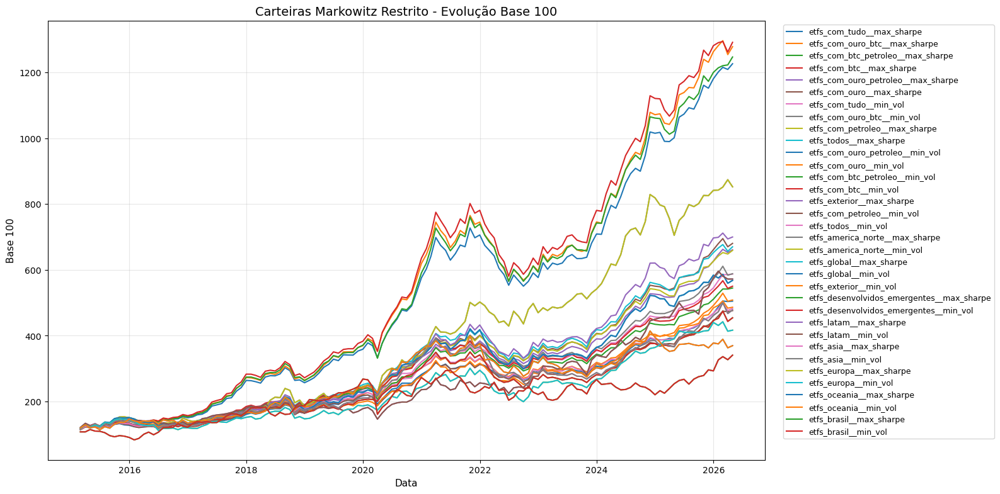

OK

[6/10] Gerando gráfico drawdown - todas as carteiras...


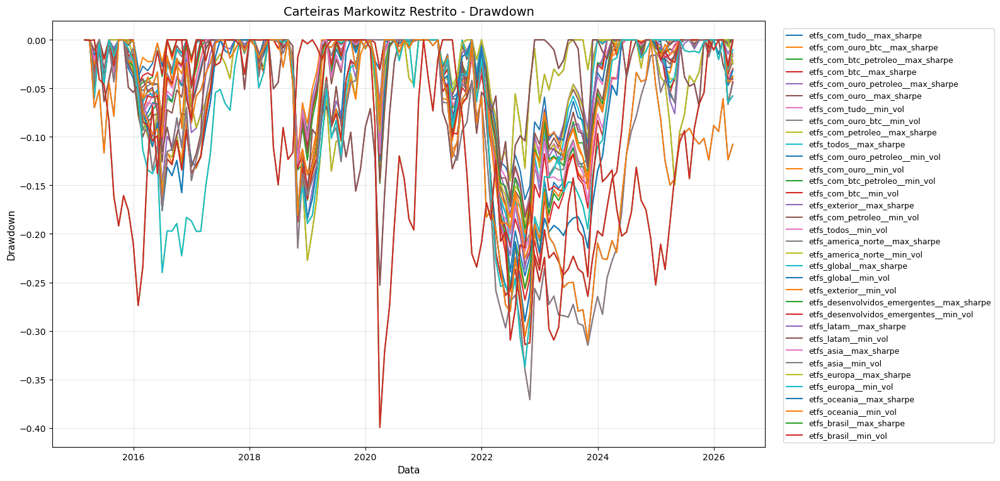

OK

[7/10] Gerando gráficos de apoio para o HTML...


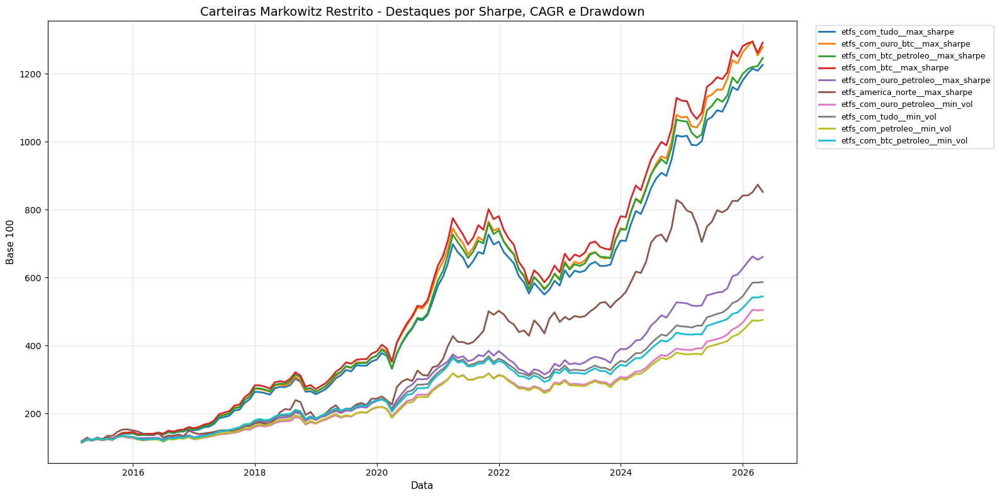

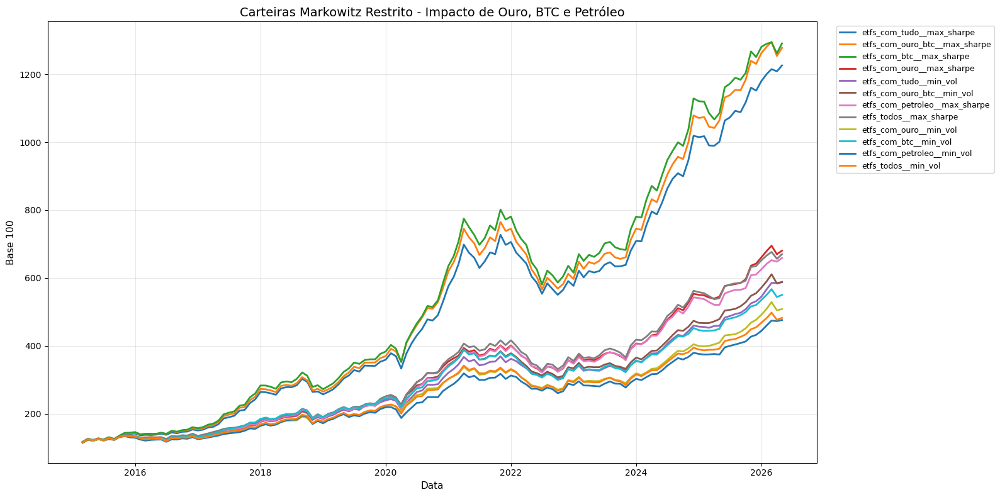

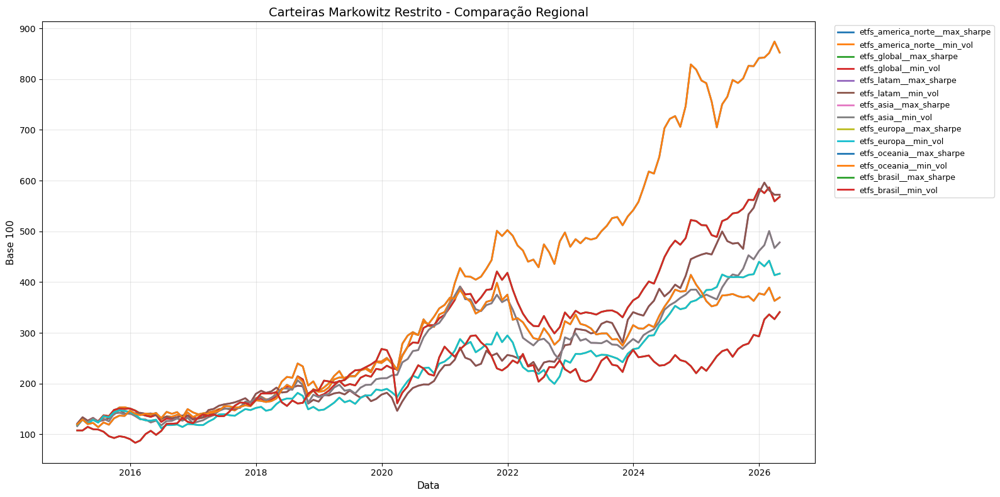

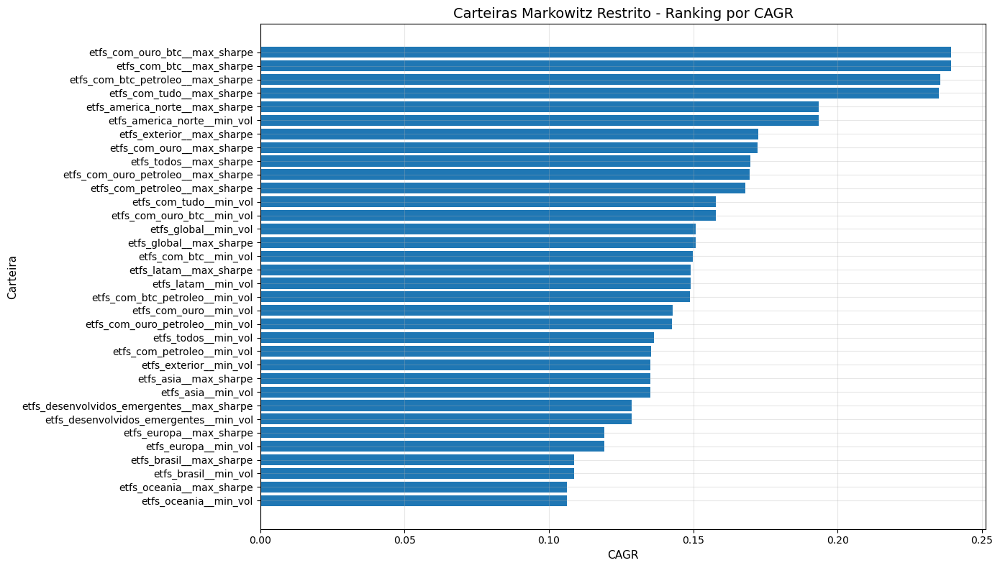

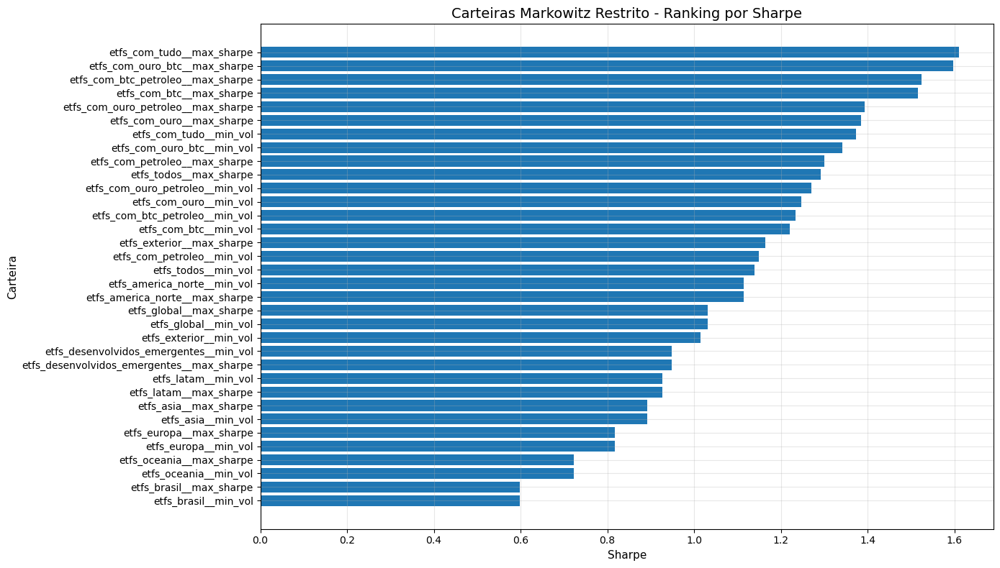

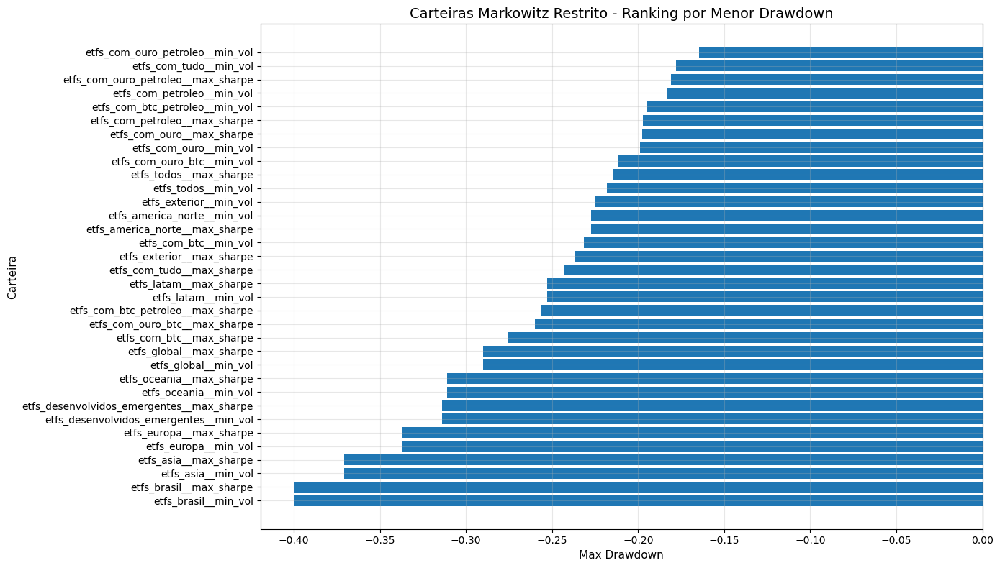

OK

[8/10] Gerando gráficos adicionais de pesos, concentração e limites...


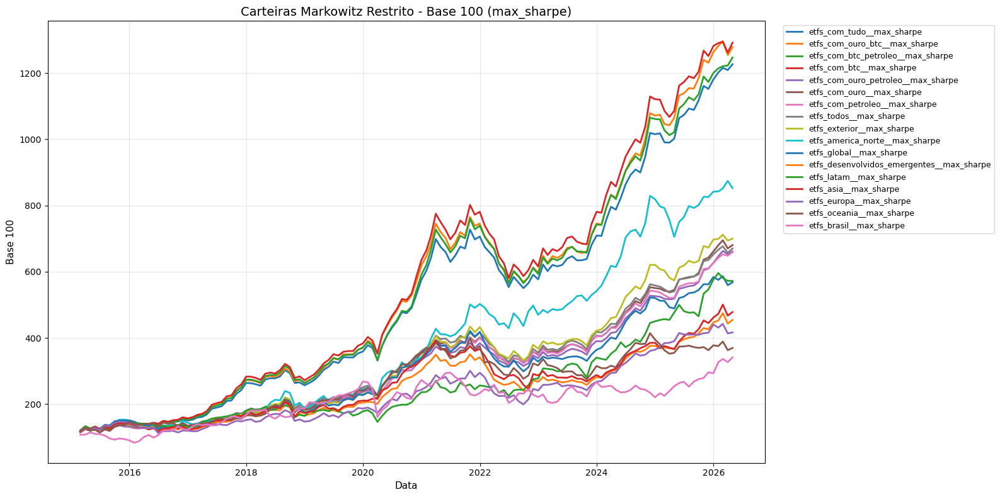

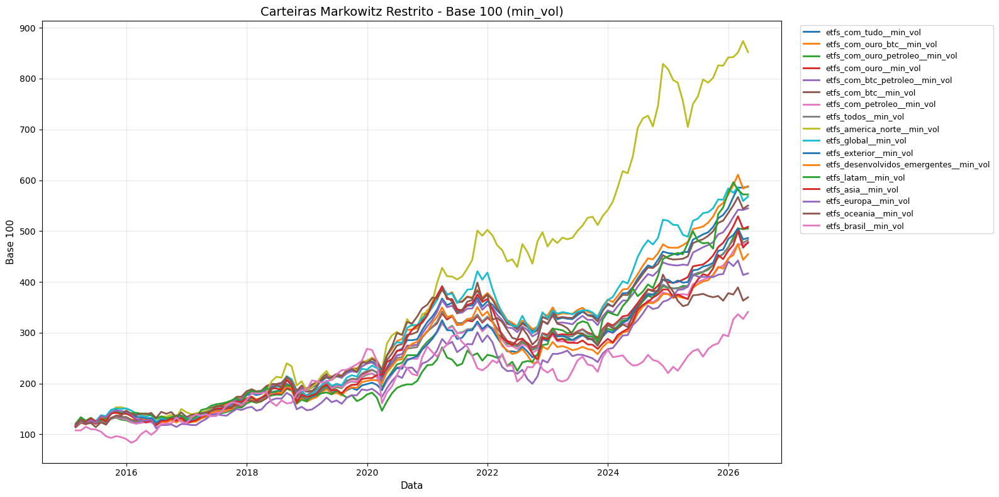

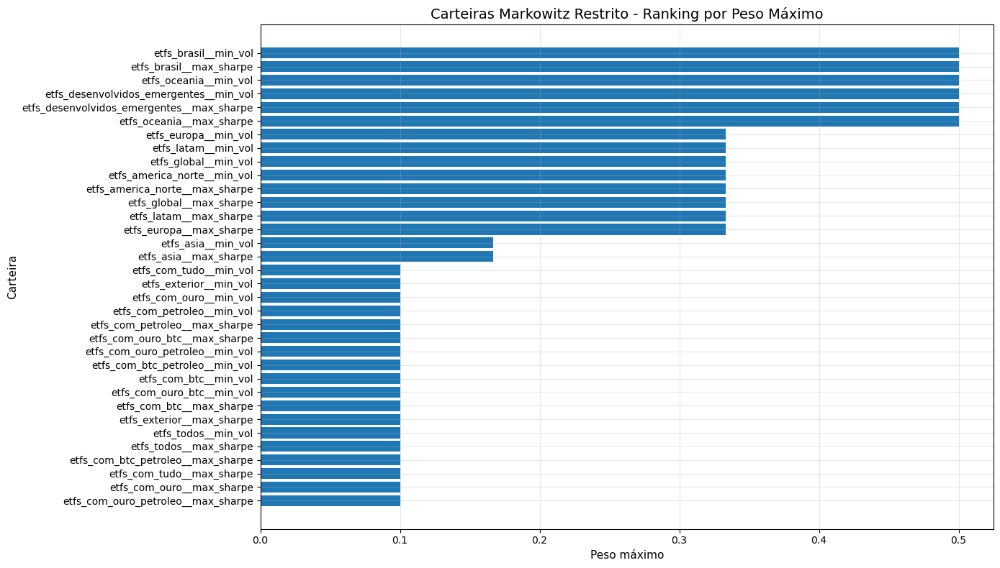

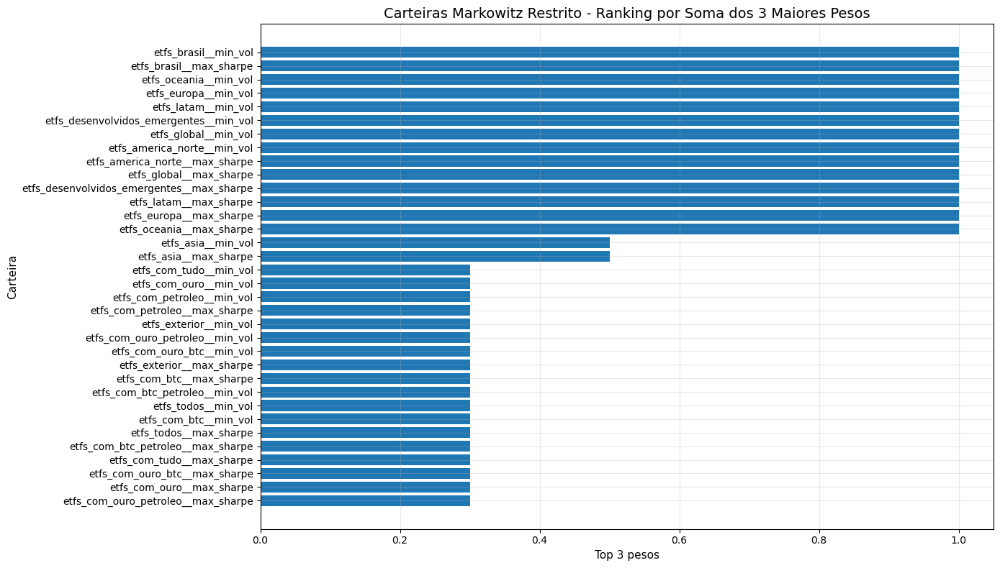

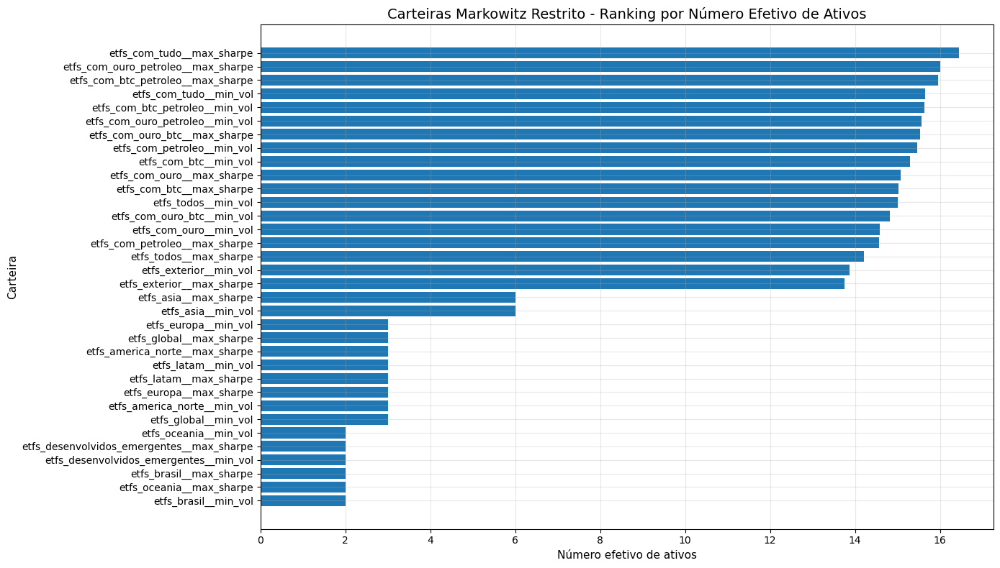

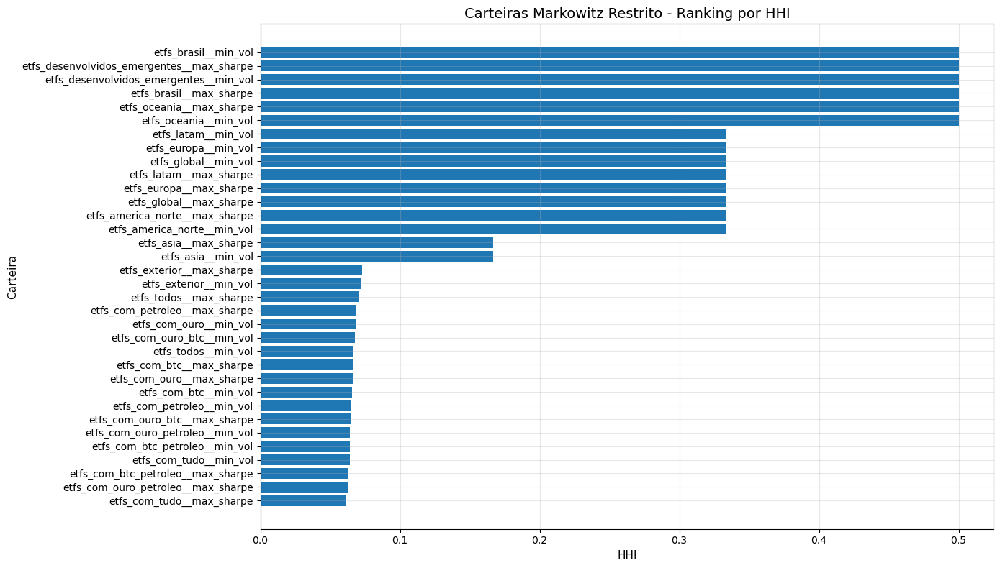

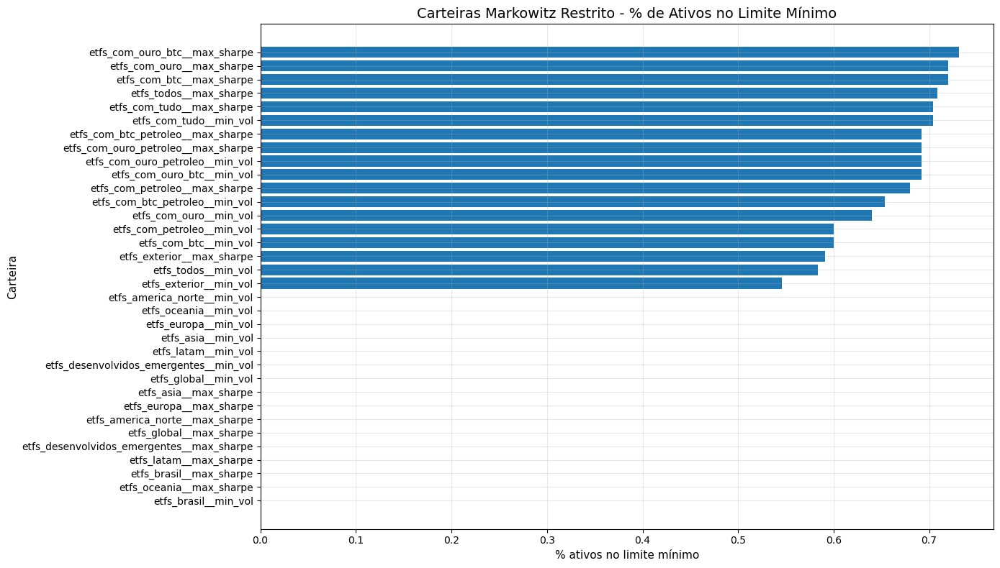

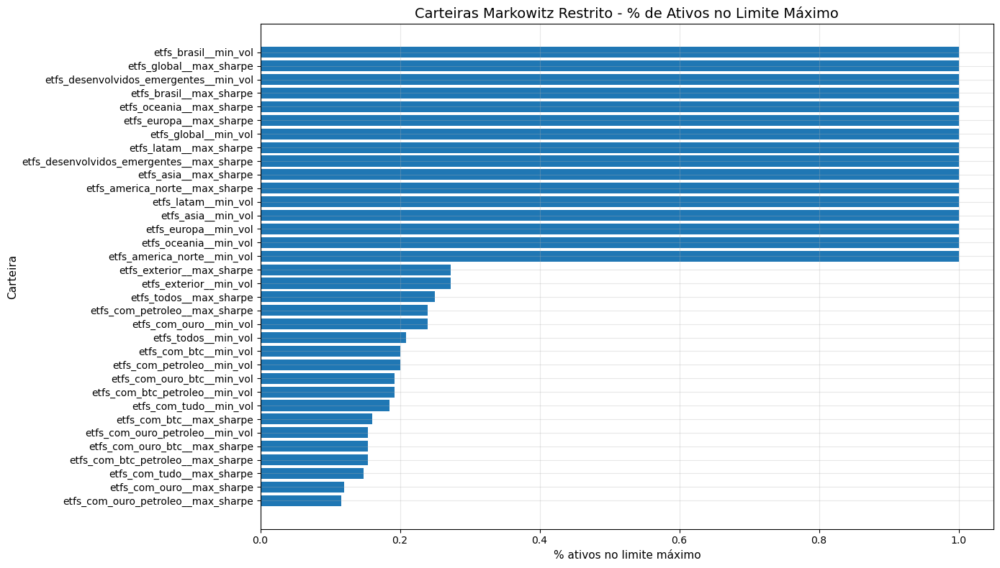

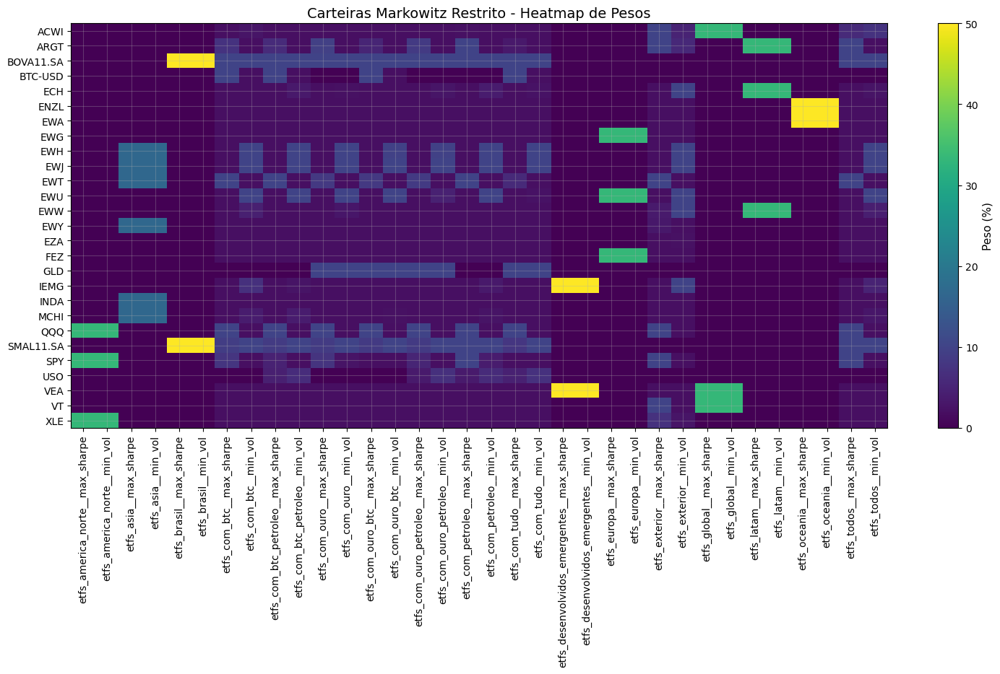

OK

[9/10] Exibindo tabelas de destaque...

--- Resumo visual das carteiras Markowitz restrito ---


,carteira,tipo,coluna_retorno,cagr,vol_anual,sharpe,sortino,max_drawdown,calmar,pct_meses_positivos,n_ativos_com_peso,peso_max,top3_peso,hhi,n_efetivo_ativos,classificacao_concentracao,pct_ativos_no_limite_min,pct_ativos_no_limite_max,ajuste_limites
0,etfs_com_tudo,max_sharpe,etfs_com_tudo__max_sharpe,0.2350332493,0.1461547289,1.6097421867,3.1109581161,-0.2432042048,0.9664029018,0.6444444444,27,0.1000000000,0.3,0.0608313216,16.4388997812,baixa,0.7037037037,0.1481481481,nenhum
1,etfs_com_ouro_btc,max_sharpe,etfs_com_ouro_btc__max_sharpe,0.2394170482,0.1500186434,1.5967254319,3.3650538701,-0.2597811846,0.9216104260,0.6518518519,26,0.1000000000,0.3,0.0643955147,15.5290318624,baixa,0.7307692308,0.1538461538,nenhum
2,etfs_com_btc_petroleo,max_sharpe,etfs_com_btc_petroleo__max_sharpe,0.2356178496,0.1562565479,1.5249122421,2.7818244893,-0.2566176265,0.9181670518,0.6518518519,26,0.1000000000,0.3,0.0626479772,15.9622073100,baixa,0.6923076923,0.1538461538,nenhum
3,etfs_com_btc,max_sharpe,etfs_com_btc__max_sharpe,0.2393150456,0.1596724647,1.5151479193,3.0465889736,-0.2758213934,0.8676449738,0.6444444444,25,0.1000000000,0.3,0.0665622820,15.0235233922,baixa,0.7200000000,0.1600000000,nenhum
4,etfs_com_ouro_petroleo,max_sharpe,etfs_com_ouro_petroleo__max_sharpe,0.1694834060,0.1270565907,1.3926441124,2.5257109750,-0.1810894061,0.9359101104,0.6518518519,26,0.1000000000,0.3,0.0624612912,16.0099155993,baixa,0.6923076923,0.1153846154,nenhum
5,etfs_com_ouro,max_sharpe,etfs_com_ouro__max_sharpe,0.1723694560,0.1299611291,1.3841974672,2.7084438526,-0.1976920784,0.8719087657,0.6518518519,25,0.1000000000,0.3,0.0663024788,15.0823923605,baixa,0.7200000000,0.1200000000,nenhum
6,etfs_com_tudo,min_vol,etfs_com_tudo__min_vol,0.1578813505,0.1206281651,1.3723922488,2.1566361445,-0.1778627316,0.8876584155,0.6740740741,27,0.1000000000,0.3,0.0638635189,15.6583917865,baixa,0.7037037037,0.1851851852,nenhum
7,etfs_com_ouro_btc,min_vol,etfs_com_ouro_btc__min_vol,0.1577568228,0.1237097567,1.3421011331,2.4275234600,-0.2112670292,0.7467176651,0.6740740741,26,0.1000000000,0.3,0.0675118925,14.8122051187,baixa,0.6923076923,0.1923076923,nenhum
8,etfs_com_petroleo,max_sharpe,etfs_com_petroleo__max_sharpe,0.1681474541,0.1369480417,1.2996451495,2.2307426599,-0.1970918692,0.8531425206,0.6222222222,25,0.1000000000,0.3,0.0686918002,14.5577783318,baixa,0.6800000000,0.2400000000,nenhum
9,etfs_todos,max_sharpe,etfs_todos__max_sharpe,0.1697199260,0.1390784006,1.2921236932,2.4292537150,-0.2143558333,0.7917672378,0.6370370370,24,0.1000000000,0.3,0.0704000000,14.2045454545,baixa,0.7083333333,0.2500000000,nenhum



--- Top 10 pesos por carteira ---


,carteira,tipo,coluna_retorno,carteira_tipo,ativo,peso,peso_pct
0,etfs_america_norte,max_sharpe,etfs_america_norte__max_sharpe,etfs_america_norte__max_sharpe,QQQ,0.3333333333,33.3333333333
1,etfs_america_norte,max_sharpe,etfs_america_norte__max_sharpe,etfs_america_norte__max_sharpe,SPY,0.3333333333,33.3333333333
2,etfs_america_norte,max_sharpe,etfs_america_norte__max_sharpe,etfs_america_norte__max_sharpe,XLE,0.3333333333,33.3333333333
3,etfs_america_norte,min_vol,etfs_america_norte__min_vol,etfs_america_norte__min_vol,QQQ,0.3333333333,33.3333333333
4,etfs_america_norte,min_vol,etfs_america_norte__min_vol,etfs_america_norte__min_vol,SPY,0.3333333333,33.3333333333
...,...,...,...,...,...,...,...
223,etfs_todos,min_vol,etfs_todos__min_vol,etfs_todos__min_vol,ACWI,0.0725876788,7.2587678829
224,etfs_todos,min_vol,etfs_todos__min_vol,etfs_todos__min_vol,IEMG,0.0501507926,5.0150792557
225,etfs_todos,min_vol,etfs_todos__min_vol,etfs_todos__min_vol,EWW,0.0411862551,4.1186255058
226,etfs_todos,min_vol,etfs_todos__min_vol,etfs_todos__min_vol,MCHI,0.0304089192,3.0408919159



--- Heatmap de pesos (tabela em %) ---


carteira_tipo,etfs_america_norte__max_sharpe,etfs_america_norte__min_vol,etfs_asia__max_sharpe,etfs_asia__min_vol,etfs_brasil__max_sharpe,etfs_brasil__min_vol,etfs_com_btc__max_sharpe,etfs_com_btc__min_vol,etfs_com_btc_petroleo__max_sharpe,etfs_com_btc_petroleo__min_vol,etfs_com_ouro__max_sharpe,etfs_com_ouro__min_vol,etfs_com_ouro_btc__max_sharpe,etfs_com_ouro_btc__min_vol,etfs_com_ouro_petroleo__max_sharpe,etfs_com_ouro_petroleo__min_vol,etfs_com_petroleo__max_sharpe,etfs_com_petroleo__min_vol,etfs_com_tudo__max_sharpe,etfs_com_tudo__min_vol,etfs_desenvolvidos_emergentes__max_sharpe,etfs_desenvolvidos_emergentes__min_vol,etfs_europa__max_sharpe,etfs_europa__min_vol,etfs_exterior__max_sharpe,etfs_exterior__min_vol,etfs_global__max_sharpe,etfs_global__min_vol,etfs_latam__max_sharpe,etfs_latam__min_vol,etfs_oceania__max_sharpe,etfs_oceania__min_vol,etfs_todos__max_sharpe,etfs_todos__min_vol
ativo,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
ACWI,0.0000,0.0000,0.0000,0.0000,0.0,0.0,2.0000,2.8627,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.3225,2.0000,2.0000,2.0000,0.0,0.0,0.0000,0.0000,10.0000,5.0158,33.3333,33.3333,0.0000,0.0000,0.0,0.0,6.0,7.2588
ARGT,0.0000,0.0000,0.0000,0.0000,0.0,0.0,7.2819,2.0000,6.1092,2.0000,9.4450,2.0000,5.2355,2.0000,8.4716,2.0000,10.0000,2.0000,3.4582,2.0000,0.0,0.0,0.0000,0.0000,10.0000,5.8212,0.0000,0.0000,33.3333,33.3333,0.0,0.0,10.0,2.0000
BOVA11.SA,0.0000,0.0000,0.0000,0.0000,50.0,50.0,10.0000,10.0000,10.0000,10.0000,10.0000,10.0000,10.0000,10.0000,10.0000,10.0000,10.0000,10.0000,10.0000,10.0000,0.0,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0,0.0,10.0,10.0000
BTC-USD,0.0000,0.0000,0.0000,0.0000,0.0,0.0,10.0000,2.0000,10.0000,2.0000,0.0000,0.0000,10.0000,2.0000,0.0000,0.0000,0.0000,0.0000,10.0000,2.0000,0.0,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0,0.0,0.0,0.0000
ECH,0.0000,0.0000,0.0000,0.0000,0.0,0.0,2.0000,2.0094,2.0000,3.4217,2.0000,2.2288,2.0000,2.0000,2.0000,2.8789,2.0000,3.8804,2.0000,2.4915,0.0,0.0,0.0000,0.0000,2.0000,10.0000,0.0000,0.0000,33.3333,33.3333,0.0,0.0,2.0,2.5666
ENZL,0.0000,0.0000,0.0000,0.0000,0.0,0.0,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,0.0,0.0,0.0000,0.0000,2.0000,2.0000,0.0000,0.0000,0.0000,0.0000,50.0,50.0,2.0,2.0000
EWA,0.0000,0.0000,0.0000,0.0000,0.0,0.0,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,0.0,0.0,0.0000,0.0000,2.0000,2.0000,0.0000,0.0000,0.0000,0.0000,50.0,50.0,2.0,2.0000
EWG,0.0000,0.0000,0.0000,0.0000,0.0,0.0,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,2.0000,0.0,0.0,33.3333,33.3333,2.0000,2.0000,0.0000,0.0000,0.0000,0.0000,0.0,0.0,2.0,2.0000
EWH,0.0000,0.0000,16.6667,16.6667,0.0,0.0,2.0000,10.0000,2.0000,10.0000,2.0000,10.0000,2.0000,9.6844,2.0000,9.7403,2.0000,10.0000,2.0000,10.0000,0.0,0.0,0.0000,0.0000,2.0000,10.0000,0.0000,0.0000,0.0000,0.0000,0.0,0.0,2.0,10.0000



--- Resumo visual dos limites ---


,carteira,tipo,coluna_retorno,pct_ativos_no_limite_min,pct_ativos_no_limite_max,peso_min_efetivo,peso_max_efetivo,ajuste_limites
0,etfs_com_tudo,max_sharpe,etfs_com_tudo__max_sharpe,0.7037037037,0.1481481481,0.02,0.1000000000,nenhum
1,etfs_com_ouro_btc,max_sharpe,etfs_com_ouro_btc__max_sharpe,0.7307692308,0.1538461538,0.02,0.1000000000,nenhum
2,etfs_com_btc_petroleo,max_sharpe,etfs_com_btc_petroleo__max_sharpe,0.6923076923,0.1538461538,0.02,0.1000000000,nenhum
3,etfs_com_btc,max_sharpe,etfs_com_btc__max_sharpe,0.7200000000,0.1600000000,0.02,0.1000000000,nenhum
4,etfs_com_ouro_petroleo,max_sharpe,etfs_com_ouro_petroleo__max_sharpe,0.6923076923,0.1153846154,0.02,0.1000000000,nenhum
5,etfs_com_ouro,max_sharpe,etfs_com_ouro__max_sharpe,0.7200000000,0.1200000000,0.02,0.1000000000,nenhum
6,etfs_com_petroleo,max_sharpe,etfs_com_petroleo__max_sharpe,0.6800000000,0.2400000000,0.02,0.1000000000,nenhum
7,etfs_todos,max_sharpe,etfs_todos__max_sharpe,0.7083333333,0.2500000000,0.02,0.1000000000,nenhum
8,etfs_exterior,max_sharpe,etfs_exterior__max_sharpe,0.5909090909,0.2727272727,0.02,0.1000000000,nenhum
9,etfs_america_norte,max_sharpe,etfs_america_norte__max_sharpe,0.0000000000,1.0000000000,0.02,0.3333333333,ajuste_max_para_viabilidade



[10/10] Etapa concluída.

------------------------------------------------------------------------------------------
RESUMO DOS ARQUIVOS GERADOS
------------------------------------------------------------------------------------------
Base 100 - todas......................: resultados/graficos/carteiras_markowitz_restrito_base100_todas.png
Drawdown - todas......................: resultados/graficos/carteiras_markowitz_restrito_drawdown_todas.png
Base 100 - destaques.................: resultados/graficos/carteiras_markowitz_restrito_base100_destaques.png
Base 100 - alternativos..............: resultados/graficos/carteiras_markowitz_restrito_base100_alternativos.png
Base 100 - regionais.................: resultados/graficos/carteiras_markowitz_restrito_base100_regionais.png
Barras CAGR...........................: resultados/graficos/carteiras_markowitz_restrito_ranking_cagr.png
Barras Sharpe.........................: resultados/graficos/carteiras_markowitz_restrito_ranking_sharpe.png
B

In [27]:
%%time
# ==========================================================================================
# ETAPA 26 - COMPARAÇÃO VISUAL DAS CARTEIRAS MARKOWITZ COM RESTRIÇÕES
# ==========================================================================================

print("=" * 90)
print("INICIANDO ETAPA 26 - COMPARAÇÃO VISUAL DAS CARTEIRAS MARKOWITZ COM RESTRIÇÕES")
print("=" * 90)

# ==========================================================================================
# [1/10] VALIDAÇÕES INICIAIS
# ==========================================================================================
print("\n[1/10] Validando objetos de entrada...")

variaveis_obrigatorias = [
    "df_carteiras_markowitz_restrito",
    "df_carteiras_markowitz_restrito_base100",
    "df_metricas_markowitz_restrito",
    "df_pesos_markowitz_restrito",
]
variaveis_faltantes = [v for v in variaveis_obrigatorias if v not in globals()]

if variaveis_faltantes:
    raise NameError(
        f"As seguintes variáveis obrigatórias não existem no ambiente: {variaveis_faltantes}"
    )

if not isinstance(df_carteiras_markowitz_restrito, pd.DataFrame):
    raise TypeError("df_carteiras_markowitz_restrito precisa ser um pandas DataFrame.")

if not isinstance(df_carteiras_markowitz_restrito_base100, pd.DataFrame):
    raise TypeError("df_carteiras_markowitz_restrito_base100 precisa ser um pandas DataFrame.")

if not isinstance(df_metricas_markowitz_restrito, pd.DataFrame):
    raise TypeError("df_metricas_markowitz_restrito precisa ser um pandas DataFrame.")

if not isinstance(df_pesos_markowitz_restrito, pd.DataFrame):
    raise TypeError("df_pesos_markowitz_restrito precisa ser um pandas DataFrame.")

if df_carteiras_markowitz_restrito.empty:
    raise ValueError("df_carteiras_markowitz_restrito está vazio.")

if df_carteiras_markowitz_restrito_base100.empty:
    raise ValueError("df_carteiras_markowitz_restrito_base100 está vazio.")

if df_metricas_markowitz_restrito.empty:
    raise ValueError("df_metricas_markowitz_restrito está vazio.")

if df_pesos_markowitz_restrito.empty:
    raise ValueError("df_pesos_markowitz_restrito está vazio.")

# Cópias defensivas
df_carteiras_markowitz_restrito = df_carteiras_markowitz_restrito.copy()
df_carteiras_markowitz_restrito_base100 = df_carteiras_markowitz_restrito_base100.copy()
df_metricas_markowitz_restrito = df_metricas_markowitz_restrito.copy()
df_pesos_markowitz_restrito = df_pesos_markowitz_restrito.copy()

df_carteiras_markowitz_restrito.index = pd.to_datetime(df_carteiras_markowitz_restrito.index)
df_carteiras_markowitz_restrito_base100.index = pd.to_datetime(df_carteiras_markowitz_restrito_base100.index)

df_carteiras_markowitz_restrito = df_carteiras_markowitz_restrito.sort_index()
df_carteiras_markowitz_restrito_base100 = df_carteiras_markowitz_restrito_base100.sort_index()

if "coluna_retorno" not in df_metricas_markowitz_restrito.columns:
    raise ValueError("df_metricas_markowitz_restrito precisa conter a coluna 'coluna_retorno'.")

if "carteira_tipo" not in df_pesos_markowitz_restrito.columns:
    df_pesos_markowitz_restrito["carteira_tipo"] = (
        df_pesos_markowitz_restrito["carteira"].astype(str) + "__" + df_pesos_markowitz_restrito["tipo"].astype(str)
    )

colunas_comuns = [
    c for c in df_carteiras_markowitz_restrito.columns
    if c in df_carteiras_markowitz_restrito_base100.columns
    and c in df_metricas_markowitz_restrito["coluna_retorno"].astype(str).tolist()
]

if len(colunas_comuns) == 0:
    raise ValueError("Não há carteiras em comum entre os objetos de entrada.")

df_carteiras_markowitz_restrito = df_carteiras_markowitz_restrito[colunas_comuns].copy()
df_carteiras_markowitz_restrito_base100 = df_carteiras_markowitz_restrito_base100[colunas_comuns].copy()

os.makedirs("resultados/graficos", exist_ok=True)
os.makedirs("resultados/tabelas", exist_ok=True)

print("OK")
print(f"Carteiras disponíveis................: {len(colunas_comuns)}")
print(
    f"Período analisado....................: "
    f"{df_carteiras_markowitz_restrito.index.min().date()} até {df_carteiras_markowitz_restrito.index.max().date()}"
)

# ==========================================================================================
# [2/10] PREPARANDO BASES VISUAIS
# ==========================================================================================
print("\n[2/10] Preparando bases visuais...")

ordem_sharpe = (
    df_metricas_markowitz_restrito
    .sort_values(by=["sharpe", "cagr"], ascending=[False, False])["coluna_retorno"]
    .tolist()
)
ordem_sharpe = [c for c in ordem_sharpe if c in df_carteiras_markowitz_restrito_base100.columns]

df_carteiras_markowitz_restrito_base100_plot = df_carteiras_markowitz_restrito_base100[ordem_sharpe].copy()

df_carteiras_markowitz_restrito_drawdown = (
    df_carteiras_markowitz_restrito_base100_plot
    .div(df_carteiras_markowitz_restrito_base100_plot.cummax())
    .sub(1.0)
)

colunas_resumo = [
    "carteira",
    "tipo",
    "coluna_retorno",
    "cagr",
    "vol_anual",
    "sharpe",
    "sortino",
    "max_drawdown",
    "calmar",
    "pct_meses_positivos",
    "n_ativos_com_peso",
    "peso_max",
    "top3_peso",
    "hhi",
    "n_efetivo_ativos",
    "classificacao_concentracao",
    "pct_ativos_no_limite_min",
    "pct_ativos_no_limite_max",
    "ajuste_limites",
]
colunas_resumo = [c for c in colunas_resumo if c in df_metricas_markowitz_restrito.columns]

df_resumo_visual_carteiras_markowitz_restrito = (
    df_metricas_markowitz_restrito[colunas_resumo]
    .sort_values(by=["sharpe", "cagr"], ascending=[False, False])
    .reset_index(drop=True)
    .copy()
)

df_base100_long_markowitz_restrito = (
    df_carteiras_markowitz_restrito_base100_plot
    .reset_index()
    .rename(columns={"index": "data"})
    .melt(id_vars="data", var_name="carteira", value_name="base100")
)

df_drawdown_long_markowitz_restrito = (
    df_carteiras_markowitz_restrito_drawdown
    .reset_index()
    .rename(columns={"index": "data"})
    .melt(id_vars="data", var_name="carteira", value_name="drawdown")
)

df_top10_pesos_markowitz_restrito = (
    df_pesos_markowitz_restrito
    .assign(peso_pct=df_pesos_markowitz_restrito["peso"] * 100)
    .sort_values(by=["carteira_tipo", "peso"], ascending=[True, False])
    .groupby("carteira_tipo", as_index=False)
    .head(10)
    .reset_index(drop=True)
)

df_pesos_heatmap_markowitz_restrito = (
    df_pesos_markowitz_restrito
    .assign(peso_pct=df_pesos_markowitz_restrito["peso"] * 100)
    .pivot(index="ativo", columns="carteira_tipo", values="peso_pct")
    .fillna(0.0)
    .round(4)
)

df_limites_visual_markowitz_restrito = (
    df_metricas_markowitz_restrito[
        [
            "carteira",
            "tipo",
            "coluna_retorno",
            "pct_ativos_no_limite_min",
            "pct_ativos_no_limite_max",
            "peso_min_efetivo",
            "peso_max_efetivo",
            "ajuste_limites",
        ]
    ]
    .copy()
)

print("OK")
print(f"Base 100 shape.......................: {df_carteiras_markowitz_restrito_base100_plot.shape}")
print(f"Drawdown shape.......................: {df_carteiras_markowitz_restrito_drawdown.shape}")
print(f"Tabela resumo shape..................: {df_resumo_visual_carteiras_markowitz_restrito.shape}")
print(f"Top 10 pesos shape...................: {df_top10_pesos_markowitz_restrito.shape}")

# ==========================================================================================
# [3/10] SALVANDO TABELAS AUXILIARES
# ==========================================================================================
print("\n[3/10] Salvando tabelas auxiliares...")

caminho_csv_base100 = "resultados/tabelas/carteiras_markowitz_restrito_base100.csv"
caminho_html_base100 = "resultados/tabelas/carteiras_markowitz_restrito_base100.html"

caminho_csv_drawdown = "resultados/tabelas/carteiras_markowitz_restrito_drawdown.csv"
caminho_html_drawdown = "resultados/tabelas/carteiras_markowitz_restrito_drawdown.html"

caminho_csv_resumo_visual = "resultados/tabelas/resumo_visual_carteiras_markowitz_restrito.csv"
caminho_html_resumo_visual = "resultados/tabelas/resumo_visual_carteiras_markowitz_restrito.html"

caminho_csv_base100_long = "resultados/tabelas/carteiras_markowitz_restrito_base100_long.csv"
caminho_csv_drawdown_long = "resultados/tabelas/carteiras_markowitz_restrito_drawdown_long.csv"

caminho_csv_top10_pesos = "resultados/tabelas/carteiras_markowitz_restrito_top10_pesos.csv"
caminho_html_top10_pesos = "resultados/tabelas/carteiras_markowitz_restrito_top10_pesos.html"

caminho_csv_heatmap_pesos = "resultados/tabelas/carteiras_markowitz_restrito_heatmap_pesos.csv"
caminho_html_heatmap_pesos = "resultados/tabelas/carteiras_markowitz_restrito_heatmap_pesos.html"

caminho_csv_limites_visual = "resultados/tabelas/carteiras_markowitz_restrito_limites_visual.csv"
caminho_html_limites_visual = "resultados/tabelas/carteiras_markowitz_restrito_limites_visual.html"

df_carteiras_markowitz_restrito_base100_plot.to_csv(caminho_csv_base100, sep=",", decimal=".")
df_carteiras_markowitz_restrito_drawdown.to_csv(caminho_csv_drawdown, sep=",", decimal=".")
df_resumo_visual_carteiras_markowitz_restrito.to_csv(caminho_csv_resumo_visual, index=False, sep=",", decimal=".")
df_base100_long_markowitz_restrito.to_csv(caminho_csv_base100_long, index=False, sep=",", decimal=".")
df_drawdown_long_markowitz_restrito.to_csv(caminho_csv_drawdown_long, index=False, sep=",", decimal=".")
df_top10_pesos_markowitz_restrito.to_csv(caminho_csv_top10_pesos, index=False, sep=",", decimal=".")
df_pesos_heatmap_markowitz_restrito.to_csv(caminho_csv_heatmap_pesos, sep=",", decimal=".")
df_limites_visual_markowitz_restrito.to_csv(caminho_csv_limites_visual, index=False, sep=",", decimal=".")

df_carteiras_markowitz_restrito_base100_plot.to_html(
    caminho_html_base100,
    border=0,
    justify="center",
    float_format=lambda x: f"{x:,.2f}"
)

df_carteiras_markowitz_restrito_drawdown.to_html(
    caminho_html_drawdown,
    border=0,
    justify="center",
    float_format=lambda x: f"{x:.4%}"
)

formatters_resumo = {
    "cagr": lambda x: f"{x:.2%}" if pd.notna(x) else "",
    "vol_anual": lambda x: f"{x:.2%}" if pd.notna(x) else "",
    "sharpe": lambda x: f"{x:.4f}" if pd.notna(x) else "",
    "sortino": lambda x: f"{x:.4f}" if pd.notna(x) else "",
    "max_drawdown": lambda x: f"{x:.2%}" if pd.notna(x) else "",
    "calmar": lambda x: f"{x:.4f}" if pd.notna(x) else "",
    "pct_meses_positivos": lambda x: f"{x:.2%}" if pd.notna(x) else "",
    "peso_max": lambda x: f"{x:.2%}" if pd.notna(x) else "",
    "top3_peso": lambda x: f"{x:.2%}" if pd.notna(x) else "",
    "hhi": lambda x: f"{x:.4f}" if pd.notna(x) else "",
    "n_efetivo_ativos": lambda x: f"{x:.2f}" if pd.notna(x) else "",
    "pct_ativos_no_limite_min": lambda x: f"{x:.2%}" if pd.notna(x) else "",
    "pct_ativos_no_limite_max": lambda x: f"{x:.2%}" if pd.notna(x) else "",
}

df_resumo_visual_carteiras_markowitz_restrito.to_html(
    caminho_html_resumo_visual,
    index=False,
    border=0,
    justify="center",
    formatters={k: v for k, v in formatters_resumo.items() if k in df_resumo_visual_carteiras_markowitz_restrito.columns}
)

df_top10_pesos_markowitz_restrito.to_html(
    caminho_html_top10_pesos,
    index=False,
    border=0,
    justify="center",
    formatters={
        "peso": lambda x: f"{x:.4%}" if pd.notna(x) else "",
        "peso_pct": lambda x: f"{x:.2f}%" if pd.notna(x) else "",
    }
)

df_pesos_heatmap_markowitz_restrito.to_html(
    caminho_html_heatmap_pesos,
    border=0,
    justify="center",
    float_format=lambda x: f"{x:.2f}"
)

df_limites_visual_markowitz_restrito.to_html(
    caminho_html_limites_visual,
    index=False,
    border=0,
    justify="center",
    formatters={
        "pct_ativos_no_limite_min": lambda x: f"{x:.2%}" if pd.notna(x) else "",
        "pct_ativos_no_limite_max": lambda x: f"{x:.2%}" if pd.notna(x) else "",
        "peso_min_efetivo": lambda x: f"{x:.2%}" if pd.notna(x) else "",
        "peso_max_efetivo": lambda x: f"{x:.2%}" if pd.notna(x) else "",
    }
)

print("OK")
print(f"CSV base 100.........................: {caminho_csv_base100}")
print(f"CSV drawdown.........................: {caminho_csv_drawdown}")
print(f"CSV resumo visual....................: {caminho_csv_resumo_visual}")

# ==========================================================================================
# [4/10] DEFININDO GRUPOS PARA GRÁFICOS
# ==========================================================================================
print("\n[4/10] Definindo grupos para visualização...")

top5_sharpe = (
    df_metricas_markowitz_restrito
    .sort_values(by=["sharpe", "cagr"], ascending=[False, False])["coluna_retorno"]
    .head(5)
    .tolist()
)

top5_cagr = (
    df_metricas_markowitz_restrito
    .sort_values(by=["cagr", "sharpe"], ascending=[False, False])["coluna_retorno"]
    .head(5)
    .tolist()
)

top5_menor_drawdown = (
    df_metricas_markowitz_restrito
    .sort_values(by=["max_drawdown", "sharpe"], ascending=[False, False])["coluna_retorno"]
    .head(5)
    .tolist()
)

carteiras_destaque = []
for carteira in top5_sharpe + top5_cagr + top5_menor_drawdown:
    if carteira not in carteiras_destaque:
        carteiras_destaque.append(carteira)

familias_base_alternativos = [
    "etfs_todos",
    "etfs_com_ouro",
    "etfs_com_btc",
    "etfs_com_petroleo",
    "etfs_com_ouro_btc",
    "etfs_com_tudo",
]

carteiras_base_alternativos = [
    c for c in df_carteiras_markowitz_restrito_base100_plot.columns
    if c.rsplit("__", 1)[0] in familias_base_alternativos
]

familias_regionais = [
    "etfs_brasil",
    "etfs_america_norte",
    "etfs_europa",
    "etfs_asia",
    "etfs_oceania",
    "etfs_latam",
    "etfs_global",
]

carteiras_regionais = [
    c for c in df_carteiras_markowitz_restrito_base100_plot.columns
    if c.rsplit("__", 1)[0] in familias_regionais
]

carteiras_max_sharpe = [
    c for c in df_carteiras_markowitz_restrito_base100_plot.columns
    if c.endswith("__max_sharpe")
]

carteiras_min_vol = [
    c for c in df_carteiras_markowitz_restrito_base100_plot.columns
    if c.endswith("__min_vol")
]

print("OK")
print(f"Carteiras destaque...................: {len(carteiras_destaque)}")
print(f"Grupo base x alternativos............: {len(carteiras_base_alternativos)}")
print(f"Grupo regionais......................: {len(carteiras_regionais)}")
print(f"Grupo max_sharpe.....................: {len(carteiras_max_sharpe)}")
print(f"Grupo min_vol........................: {len(carteiras_min_vol)}")

# ==========================================================================================
# [5/10] GRÁFICO 1 - BASE 100 (TODAS AS CARTEIRAS)
# ==========================================================================================
print("\n[5/10] Gerando gráfico base 100 - todas as carteiras...")

plt.figure(figsize=(16, 8))

for coluna in df_carteiras_markowitz_restrito_base100_plot.columns:
    plt.plot(
        df_carteiras_markowitz_restrito_base100_plot.index,
        df_carteiras_markowitz_restrito_base100_plot[coluna],
        linewidth=1.5,
        label=coluna
    )

plt.title("Carteiras Markowitz Restrito - Evolução Base 100", fontsize=14)
plt.xlabel("Data")
plt.ylabel("Base 100")
plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), fontsize=9)
plt.grid(True, alpha=0.3)
plt.tight_layout()

caminho_grafico_base100_todas = "resultados/graficos/carteiras_markowitz_restrito_base100_todas.png"
plt.savefig(caminho_grafico_base100_todas, dpi=300, bbox_inches="tight")
plt.show()

print("OK")

# ==========================================================================================
# [6/10] GRÁFICO 2 - DRAWDOWN (TODAS AS CARTEIRAS)
# ==========================================================================================
print("\n[6/10] Gerando gráfico drawdown - todas as carteiras...")

plt.figure(figsize=(16, 8))

for coluna in df_carteiras_markowitz_restrito_drawdown.columns:
    plt.plot(
        df_carteiras_markowitz_restrito_drawdown.index,
        df_carteiras_markowitz_restrito_drawdown[coluna],
        linewidth=1.5,
        label=coluna
    )

plt.title("Carteiras Markowitz Restrito - Drawdown", fontsize=14)
plt.xlabel("Data")
plt.ylabel("Drawdown")
plt.legend(loc="lower left", bbox_to_anchor=(1.02, 0), fontsize=9)
plt.grid(True, alpha=0.3)
plt.tight_layout()

caminho_grafico_drawdown_todas = "resultados/graficos/carteiras_markowitz_restrito_drawdown_todas.png"
plt.savefig(caminho_grafico_drawdown_todas, dpi=300, bbox_inches="tight")
plt.show()

print("OK")

# ==========================================================================================
# [7/10] GRÁFICOS DE APOIO PARA O HTML (BASELINE DA ETAPA 23)
# ==========================================================================================
print("\n[7/10] Gerando gráficos de apoio para o HTML...")

if len(carteiras_destaque) > 0:
    plt.figure(figsize=(16, 8))

    for coluna in carteiras_destaque:
        plt.plot(
            df_carteiras_markowitz_restrito_base100_plot.index,
            df_carteiras_markowitz_restrito_base100_plot[coluna],
            linewidth=2.0,
            label=coluna
        )

    plt.title("Carteiras Markowitz Restrito - Destaques por Sharpe, CAGR e Drawdown", fontsize=14)
    plt.xlabel("Data")
    plt.ylabel("Base 100")
    plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), fontsize=9)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()

    caminho_grafico_base100_destaques = "resultados/graficos/carteiras_markowitz_restrito_base100_destaques.png"
    plt.savefig(caminho_grafico_base100_destaques, dpi=300, bbox_inches="tight")
    plt.show()

if len(carteiras_base_alternativos) > 0:
    plt.figure(figsize=(16, 8))

    for coluna in carteiras_base_alternativos:
        plt.plot(
            df_carteiras_markowitz_restrito_base100_plot.index,
            df_carteiras_markowitz_restrito_base100_plot[coluna],
            linewidth=2.0,
            label=coluna
        )

    plt.title("Carteiras Markowitz Restrito - Impacto de Ouro, BTC e Petróleo", fontsize=14)
    plt.xlabel("Data")
    plt.ylabel("Base 100")
    plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), fontsize=9)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()

    caminho_grafico_base100_alternativos = "resultados/graficos/carteiras_markowitz_restrito_base100_alternativos.png"
    plt.savefig(caminho_grafico_base100_alternativos, dpi=300, bbox_inches="tight")
    plt.show()

if len(carteiras_regionais) > 0:
    plt.figure(figsize=(16, 8))

    for coluna in carteiras_regionais:
        plt.plot(
            df_carteiras_markowitz_restrito_base100_plot.index,
            df_carteiras_markowitz_restrito_base100_plot[coluna],
            linewidth=2.0,
            label=coluna
        )

    plt.title("Carteiras Markowitz Restrito - Comparação Regional", fontsize=14)
    plt.xlabel("Data")
    plt.ylabel("Base 100")
    plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), fontsize=9)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()

    caminho_grafico_base100_regionais = "resultados/graficos/carteiras_markowitz_restrito_base100_regionais.png"
    plt.savefig(caminho_grafico_base100_regionais, dpi=300, bbox_inches="tight")
    plt.show()

df_plot_cagr = (
    df_metricas_markowitz_restrito[["coluna_retorno", "cagr"]]
    .sort_values(by="cagr", ascending=False)
    .reset_index(drop=True)
)

plt.figure(figsize=(14, 8))
plt.barh(df_plot_cagr["coluna_retorno"], df_plot_cagr["cagr"])
plt.gca().invert_yaxis()
plt.title("Carteiras Markowitz Restrito - Ranking por CAGR", fontsize=14)
plt.xlabel("CAGR")
plt.ylabel("Carteira")
plt.grid(True, axis="x", alpha=0.3)
plt.tight_layout()

caminho_grafico_barras_cagr = "resultados/graficos/carteiras_markowitz_restrito_ranking_cagr.png"
plt.savefig(caminho_grafico_barras_cagr, dpi=300, bbox_inches="tight")
plt.show()

df_plot_sharpe = (
    df_metricas_markowitz_restrito[["coluna_retorno", "sharpe"]]
    .sort_values(by="sharpe", ascending=False)
    .reset_index(drop=True)
)

plt.figure(figsize=(14, 8))
plt.barh(df_plot_sharpe["coluna_retorno"], df_plot_sharpe["sharpe"])
plt.gca().invert_yaxis()
plt.title("Carteiras Markowitz Restrito - Ranking por Sharpe", fontsize=14)
plt.xlabel("Sharpe")
plt.ylabel("Carteira")
plt.grid(True, axis="x", alpha=0.3)
plt.tight_layout()

caminho_grafico_barras_sharpe = "resultados/graficos/carteiras_markowitz_restrito_ranking_sharpe.png"
plt.savefig(caminho_grafico_barras_sharpe, dpi=300, bbox_inches="tight")
plt.show()

df_plot_mdd = (
    df_metricas_markowitz_restrito[["coluna_retorno", "max_drawdown"]]
    .sort_values(by="max_drawdown", ascending=False)
    .reset_index(drop=True)
)

plt.figure(figsize=(14, 8))
plt.barh(df_plot_mdd["coluna_retorno"], df_plot_mdd["max_drawdown"])
plt.gca().invert_yaxis()
plt.title("Carteiras Markowitz Restrito - Ranking por Menor Drawdown", fontsize=14)
plt.xlabel("Max Drawdown")
plt.ylabel("Carteira")
plt.grid(True, axis="x", alpha=0.3)
plt.tight_layout()

caminho_grafico_barras_mdd = "resultados/graficos/carteiras_markowitz_restrito_ranking_drawdown.png"
plt.savefig(caminho_grafico_barras_mdd, dpi=300, bbox_inches="tight")
plt.show()

print("OK")

# ==========================================================================================
# [8/10] ADENDOS DO MARKOWITZ RESTRITO - PESOS, CONCENTRAÇÃO E LIMITES
# ==========================================================================================
print("\n[8/10] Gerando gráficos adicionais de pesos, concentração e limites...")

if len(carteiras_max_sharpe) > 0:
    plt.figure(figsize=(16, 8))

    for coluna in carteiras_max_sharpe:
        plt.plot(
            df_carteiras_markowitz_restrito_base100_plot.index,
            df_carteiras_markowitz_restrito_base100_plot[coluna],
            linewidth=2.0,
            label=coluna
        )

    plt.title("Carteiras Markowitz Restrito - Base 100 (max_sharpe)", fontsize=14)
    plt.xlabel("Data")
    plt.ylabel("Base 100")
    plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), fontsize=9)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()

    caminho_grafico_base100_max_sharpe = "resultados/graficos/carteiras_markowitz_restrito_base100_max_sharpe.png"
    plt.savefig(caminho_grafico_base100_max_sharpe, dpi=300, bbox_inches="tight")
    plt.show()

if len(carteiras_min_vol) > 0:
    plt.figure(figsize=(16, 8))

    for coluna in carteiras_min_vol:
        plt.plot(
            df_carteiras_markowitz_restrito_base100_plot.index,
            df_carteiras_markowitz_restrito_base100_plot[coluna],
            linewidth=2.0,
            label=coluna
        )

    plt.title("Carteiras Markowitz Restrito - Base 100 (min_vol)", fontsize=14)
    plt.xlabel("Data")
    plt.ylabel("Base 100")
    plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), fontsize=9)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()

    caminho_grafico_base100_min_vol = "resultados/graficos/carteiras_markowitz_restrito_base100_min_vol.png"
    plt.savefig(caminho_grafico_base100_min_vol, dpi=300, bbox_inches="tight")
    plt.show()

if "peso_max" in df_metricas_markowitz_restrito.columns:
    df_plot_peso_max = (
        df_metricas_markowitz_restrito[["coluna_retorno", "peso_max"]]
        .sort_values(by="peso_max", ascending=False)
        .reset_index(drop=True)
    )

    plt.figure(figsize=(14, 8))
    plt.barh(df_plot_peso_max["coluna_retorno"], df_plot_peso_max["peso_max"])
    plt.gca().invert_yaxis()
    plt.title("Carteiras Markowitz Restrito - Ranking por Peso Máximo", fontsize=14)
    plt.xlabel("Peso máximo")
    plt.ylabel("Carteira")
    plt.grid(True, axis="x", alpha=0.3)
    plt.tight_layout()

    caminho_grafico_barras_peso_max = "resultados/graficos/carteiras_markowitz_restrito_ranking_peso_maximo.png"
    plt.savefig(caminho_grafico_barras_peso_max, dpi=300, bbox_inches="tight")
    plt.show()

if "top3_peso" in df_metricas_markowitz_restrito.columns:
    df_plot_top3 = (
        df_metricas_markowitz_restrito[["coluna_retorno", "top3_peso"]]
        .sort_values(by="top3_peso", ascending=False)
        .reset_index(drop=True)
    )

    plt.figure(figsize=(14, 8))
    plt.barh(df_plot_top3["coluna_retorno"], df_plot_top3["top3_peso"])
    plt.gca().invert_yaxis()
    plt.title("Carteiras Markowitz Restrito - Ranking por Soma dos 3 Maiores Pesos", fontsize=14)
    plt.xlabel("Top 3 pesos")
    plt.ylabel("Carteira")
    plt.grid(True, axis="x", alpha=0.3)
    plt.tight_layout()

    caminho_grafico_barras_top3 = "resultados/graficos/carteiras_markowitz_restrito_ranking_top3_pesos.png"
    plt.savefig(caminho_grafico_barras_top3, dpi=300, bbox_inches="tight")
    plt.show()

if "n_efetivo_ativos" in df_metricas_markowitz_restrito.columns:
    df_plot_nefetivo = (
        df_metricas_markowitz_restrito[["coluna_retorno", "n_efetivo_ativos"]]
        .sort_values(by="n_efetivo_ativos", ascending=False)
        .reset_index(drop=True)
    )

    plt.figure(figsize=(14, 8))
    plt.barh(df_plot_nefetivo["coluna_retorno"], df_plot_nefetivo["n_efetivo_ativos"])
    plt.gca().invert_yaxis()
    plt.title("Carteiras Markowitz Restrito - Ranking por Número Efetivo de Ativos", fontsize=14)
    plt.xlabel("Número efetivo de ativos")
    plt.ylabel("Carteira")
    plt.grid(True, axis="x", alpha=0.3)
    plt.tight_layout()

    caminho_grafico_barras_nefetivo = "resultados/graficos/carteiras_markowitz_restrito_ranking_numero_efetivo.png"
    plt.savefig(caminho_grafico_barras_nefetivo, dpi=300, bbox_inches="tight")
    plt.show()

if "hhi" in df_metricas_markowitz_restrito.columns:
    df_plot_hhi = (
        df_metricas_markowitz_restrito[["coluna_retorno", "hhi"]]
        .sort_values(by="hhi", ascending=False)
        .reset_index(drop=True)
    )

    plt.figure(figsize=(14, 8))
    plt.barh(df_plot_hhi["coluna_retorno"], df_plot_hhi["hhi"])
    plt.gca().invert_yaxis()
    plt.title("Carteiras Markowitz Restrito - Ranking por HHI", fontsize=14)
    plt.xlabel("HHI")
    plt.ylabel("Carteira")
    plt.grid(True, axis="x", alpha=0.3)
    plt.tight_layout()

    caminho_grafico_barras_hhi = "resultados/graficos/carteiras_markowitz_restrito_ranking_hhi.png"
    plt.savefig(caminho_grafico_barras_hhi, dpi=300, bbox_inches="tight")
    plt.show()

if "pct_ativos_no_limite_min" in df_metricas_markowitz_restrito.columns:
    df_plot_limite_min = (
        df_metricas_markowitz_restrito[["coluna_retorno", "pct_ativos_no_limite_min"]]
        .sort_values(by="pct_ativos_no_limite_min", ascending=False)
        .reset_index(drop=True)
    )

    plt.figure(figsize=(14, 8))
    plt.barh(df_plot_limite_min["coluna_retorno"], df_plot_limite_min["pct_ativos_no_limite_min"])
    plt.gca().invert_yaxis()
    plt.title("Carteiras Markowitz Restrito - % de Ativos no Limite Mínimo", fontsize=14)
    plt.xlabel("% ativos no limite mínimo")
    plt.ylabel("Carteira")
    plt.grid(True, axis="x", alpha=0.3)
    plt.tight_layout()

    caminho_grafico_barras_limite_min = "resultados/graficos/carteiras_markowitz_restrito_ranking_limite_minimo.png"
    plt.savefig(caminho_grafico_barras_limite_min, dpi=300, bbox_inches="tight")
    plt.show()

if "pct_ativos_no_limite_max" in df_metricas_markowitz_restrito.columns:
    df_plot_limite_max = (
        df_metricas_markowitz_restrito[["coluna_retorno", "pct_ativos_no_limite_max"]]
        .sort_values(by="pct_ativos_no_limite_max", ascending=False)
        .reset_index(drop=True)
    )

    plt.figure(figsize=(14, 8))
    plt.barh(df_plot_limite_max["coluna_retorno"], df_plot_limite_max["pct_ativos_no_limite_max"])
    plt.gca().invert_yaxis()
    plt.title("Carteiras Markowitz Restrito - % de Ativos no Limite Máximo", fontsize=14)
    plt.xlabel("% ativos no limite máximo")
    plt.ylabel("Carteira")
    plt.grid(True, axis="x", alpha=0.3)
    plt.tight_layout()

    caminho_grafico_barras_limite_max = "resultados/graficos/carteiras_markowitz_restrito_ranking_limite_maximo.png"
    plt.savefig(caminho_grafico_barras_limite_max, dpi=300, bbox_inches="tight")
    plt.show()

if df_pesos_heatmap_markowitz_restrito.shape[0] > 0 and df_pesos_heatmap_markowitz_restrito.shape[1] > 0:
    df_heatmap_plot = df_pesos_heatmap_markowitz_restrito.loc[
        df_pesos_heatmap_markowitz_restrito.sum(axis=1) > 0
    ].copy()

    largura = max(14, min(28, df_heatmap_plot.shape[1] * 0.45))
    altura = max(8, min(18, df_heatmap_plot.shape[0] * 0.35))

    plt.figure(figsize=(largura, altura))
    plt.imshow(df_heatmap_plot.values, aspect="auto")
    plt.colorbar(label="Peso (%)")
    plt.xticks(
        ticks=np.arange(len(df_heatmap_plot.columns)),
        labels=df_heatmap_plot.columns,
        rotation=90
    )
    plt.yticks(
        ticks=np.arange(len(df_heatmap_plot.index)),
        labels=df_heatmap_plot.index
    )
    plt.title("Carteiras Markowitz Restrito - Heatmap de Pesos", fontsize=14)
    plt.tight_layout()

    caminho_grafico_heatmap_pesos = "resultados/graficos/carteiras_markowitz_restrito_heatmap_pesos.png"
    plt.savefig(caminho_grafico_heatmap_pesos, dpi=300, bbox_inches="tight")
    plt.show()

print("OK")

# ==========================================================================================
# [9/10] TABELAS DE DESTAQUE NO OUTPUT
# ==========================================================================================
print("\n[9/10] Exibindo tabelas de destaque...")

print("\n--- Resumo visual das carteiras Markowitz restrito ---")
display(df_resumo_visual_carteiras_markowitz_restrito)

print("\n--- Top 10 pesos por carteira ---")
display(df_top10_pesos_markowitz_restrito)

print("\n--- Heatmap de pesos (tabela em %) ---")
display(df_pesos_heatmap_markowitz_restrito)

print("\n--- Resumo visual dos limites ---")
display(df_limites_visual_markowitz_restrito)

# ==========================================================================================
# [10/10] FECHAMENTO
# ==========================================================================================
print("\n[10/10] Etapa concluída.")

print("\n" + "-" * 90)
print("RESUMO DOS ARQUIVOS GERADOS")
print("-" * 90)
print(f"Base 100 - todas......................: {caminho_grafico_base100_todas}")
print(f"Drawdown - todas......................: {caminho_grafico_drawdown_todas}")

if len(carteiras_destaque) > 0:
    print(f"Base 100 - destaques.................: {caminho_grafico_base100_destaques}")

if len(carteiras_base_alternativos) > 0:
    print(f"Base 100 - alternativos..............: {caminho_grafico_base100_alternativos}")

if len(carteiras_regionais) > 0:
    print(f"Base 100 - regionais.................: {caminho_grafico_base100_regionais}")

print(f"Barras CAGR...........................: {caminho_grafico_barras_cagr}")
print(f"Barras Sharpe.........................: {caminho_grafico_barras_sharpe}")
print(f"Barras Drawdown.......................: {caminho_grafico_barras_mdd}")

if len(carteiras_max_sharpe) > 0:
    print(f"Base 100 - max_sharpe................: {caminho_grafico_base100_max_sharpe}")

if len(carteiras_min_vol) > 0:
    print(f"Base 100 - min_vol...................: {caminho_grafico_base100_min_vol}")

if "peso_max" in df_metricas_markowitz_restrito.columns:
    print(f"Barras peso máximo...................: {caminho_grafico_barras_peso_max}")

if "top3_peso" in df_metricas_markowitz_restrito.columns:
    print(f"Barras top 3 pesos...................: {caminho_grafico_barras_top3}")

if "n_efetivo_ativos" in df_metricas_markowitz_restrito.columns:
    print(f"Barras número efetivo................: {caminho_grafico_barras_nefetivo}")

if "hhi" in df_metricas_markowitz_restrito.columns:
    print(f"Barras HHI...........................: {caminho_grafico_barras_hhi}")

if "pct_ativos_no_limite_min" in df_metricas_markowitz_restrito.columns:
    print(f"Barras limite mínimo.................: {caminho_grafico_barras_limite_min}")

if "pct_ativos_no_limite_max" in df_metricas_markowitz_restrito.columns:
    print(f"Barras limite máximo.................: {caminho_grafico_barras_limite_max}")

if df_pesos_heatmap_markowitz_restrito.shape[0] > 0 and df_pesos_heatmap_markowitz_restrito.shape[1] > 0:
    print(f"Heatmap de pesos.....................: {caminho_grafico_heatmap_pesos}")

print(f"Tabela resumo visual..................: {caminho_csv_resumo_visual}")
print(f"Tabela top 10 pesos...................: {caminho_csv_top10_pesos}")
print(f"Tabela heatmap pesos..................: {caminho_csv_heatmap_pesos}")
print(f"Tabela limites visuais................: {caminho_csv_limites_visual}")

print("\n" + "=" * 90)
print("ETAPA 26 CONCLUÍDA - COMPARAÇÃO VISUAL DAS CARTEIRAS MARKOWITZ COM RESTRIÇÕES")
print("=" * 90)
print(f"Quantidade de carteiras plotadas.....: {df_carteiras_markowitz_restrito_base100_plot.shape[1]}")
print(f"Top Sharpe............................: {top5_sharpe[0] if len(top5_sharpe) > 0 else 'N/A'}")
print(f"Top CAGR..............................: {top5_cagr[0] if len(top5_cagr) > 0 else 'N/A'}")
print(f"Menor Drawdown........................: {top5_menor_drawdown[0] if len(top5_menor_drawdown) > 0 else 'N/A'}")

# 27) Carteiras HRP

In [28]:
%%time
# ==========================================================================================
# ETAPA 27 - CARTEIRAS HRP
# ==========================================================================================

print("=" * 90)
print("INICIANDO ETAPA 27 - CARTEIRAS HRP")
print("=" * 90)

# ==========================================================================================
# [1/8] VALIDAÇÃO
# ==========================================================================================

print("\n[1/8] Validando...")

objetos_necessarios = [
    "carteiras_def",
    "df_carteiras",
    "df_adj_close_brl_mensal",
    "DIR_PROCESSED",
    "DIR_TABELAS",
]

faltando = [obj for obj in objetos_necessarios if obj not in globals()]
if faltando:
    raise NameError(f"Faltando no ambiente: {faltando}")

if not isinstance(carteiras_def, dict):
    raise TypeError("carteiras_def precisa ser um dicionário criado na Etapa 15.")

if not isinstance(df_carteiras, pd.DataFrame):
    raise TypeError("df_carteiras precisa existir e ser um DataFrame da Etapa 15.")

if df_carteiras.empty:
    raise ValueError("df_carteiras está vazio.")

if not isinstance(df_adj_close_brl_mensal, pd.DataFrame):
    raise TypeError("df_adj_close_brl_mensal precisa ser um DataFrame.")

if df_adj_close_brl_mensal.empty:
    raise ValueError("df_adj_close_brl_mensal está vazio.")

METODO_LIGACAO_HRP = "single"
DISTANCIA_HRP = "correlacao"

print("OK")

# ==========================================================================================
# [2/8] PREPARANDO BASE MENSAL
# ==========================================================================================

print("\n[2/8] Preparando base mensal...")

df_precos_mensais_hrp = df_adj_close_brl_mensal.copy()
df_precos_mensais_hrp.index = pd.to_datetime(df_precos_mensais_hrp.index)
df_precos_mensais_hrp = df_precos_mensais_hrp.sort_index()

carteiras_validas_etapa15 = df_carteiras.columns.tolist()
tickers_all_mensal = df_precos_mensais_hrp.columns.tolist()

print(f"Shape base mensal....................: {df_precos_mensais_hrp.shape}")
print(f"Carteiras válidas da Etapa 15........: {len(carteiras_validas_etapa15)}")
print(f"Método de ligação HRP................: {METODO_LIGACAO_HRP}")
print(f"Métrica de distância.................: {DISTANCIA_HRP}")

# ==========================================================================================
# [3/8] DEFININDO FUNÇÕES
# ==========================================================================================

print("\n[3/8] Definindo funções...")

def preparar_base_carteira_hrp(df_precos, ativos, ffill_limit=2, min_meses=12):
    ativos_validos = [t for t in ativos if t in df_precos.columns]

    if len(ativos_validos) < 2:
        return None, None, ativos_validos

    df_sub_precos = df_precos[ativos_validos].copy()
    df_sub_precos = df_sub_precos.ffill(limit=ffill_limit)
    df_sub_precos = df_sub_precos.dropna(axis=0, how="all")
    df_sub_precos = df_sub_precos.dropna(axis=1, how="all")

    if df_sub_precos.shape[1] < 2:
        return None, None, df_sub_precos.columns.tolist()

    df_sub_retornos = df_sub_precos.pct_change(fill_method=None)
    df_sub_retornos = df_sub_retornos.dropna(axis=0, how="all")
    df_sub_retornos = df_sub_retornos.dropna(axis=0, how="any")

    if df_sub_retornos.shape[0] < min_meses or df_sub_retornos.shape[1] < 2:
        return None, None, df_sub_retornos.columns.tolist()

    ativos_validos = df_sub_retornos.columns.tolist()
    df_sub_precos = df_sub_precos[ativos_validos].copy()

    return df_sub_precos, df_sub_retornos, ativos_validos


def calcular_matriz_distancia_correlacao(df_retornos):
    corr = df_retornos.corr().astype(float)
    corr = corr.clip(-1, 1)
    dist = np.sqrt(np.clip((1 - corr) / 2, 0, None))
    np.fill_diagonal(dist.values, 0.0)
    return corr, dist


def calcular_pesos_ivp(cov):
    cov_values = cov.values.astype(float)
    variancias = np.diag(cov_values).copy()
    variancias = np.where(variancias <= 0, 1e-12, variancias)

    pesos = 1.0 / variancias
    pesos = pesos / pesos.sum()

    return pd.Series(pesos, index=cov.index)


def calcular_variancia_cluster(cov, cluster_ativos):
    cov_cluster = cov.loc[cluster_ativos, cluster_ativos]
    pesos_ivp = calcular_pesos_ivp(cov_cluster).values.reshape(-1, 1)
    variancia = float(pesos_ivp.T @ cov_cluster.values @ pesos_ivp)
    return variancia


def particionar_cluster(cluster_ativos):
    meio = len(cluster_ativos) // 2
    return cluster_ativos[:meio], cluster_ativos[meio:]


def otimizar_hrp(df_retornos, metodo_ligacao=METODO_LIGACAO_HRP):
    ativos = df_retornos.columns.tolist()
    n_ativos = len(ativos)

    if n_ativos < 2:
        raise ValueError("A carteira precisa ter pelo menos 2 ativos válidos para HRP.")

    if n_ativos == 2:
        pesos = pd.Series(0.5, index=ativos)
        return {
            "pesos": pesos,
            "ordem_hrp": ativos,
            "corr": df_retornos.corr().astype(float),
            "cov": df_retornos.cov().astype(float),
            "dist": np.sqrt(np.clip((1 - df_retornos.corr().astype(float)) / 2, 0, None)),
            "metodo_ligacao": metodo_ligacao,
            "n_clusters_finais": 2,
        }

    corr, dist = calcular_matriz_distancia_correlacao(df_retornos)
    cov = df_retornos.cov().astype(float)

    condensed_dist = squareform(dist.values, checks=False)
    linkage_matrix = linkage(condensed_dist, method=metodo_ligacao)

    ordem_idx = leaves_list(linkage_matrix).tolist()
    ordem_hrp = corr.index[ordem_idx].tolist()

    pesos = pd.Series(1.0, index=ordem_hrp)
    clusters = [ordem_hrp]

    while len(clusters) > 0:
        novos_clusters = []

        for cluster in clusters:
            if len(cluster) <= 1:
                continue

            cluster_esquerda, cluster_direita = particionar_cluster(cluster)

            if len(cluster_esquerda) == 0 or len(cluster_direita) == 0:
                continue

            variancia_esquerda = calcular_variancia_cluster(cov, cluster_esquerda)
            variancia_direita = calcular_variancia_cluster(cov, cluster_direita)

            if (variancia_esquerda + variancia_direita) <= 0:
                alpha = 0.5
            else:
                alpha = 1 - variancia_esquerda / (variancia_esquerda + variancia_direita)

            pesos[cluster_esquerda] *= alpha
            pesos[cluster_direita] *= (1 - alpha)

            if len(cluster_esquerda) > 1:
                novos_clusters.append(cluster_esquerda)
            if len(cluster_direita) > 1:
                novos_clusters.append(cluster_direita)

        clusters = novos_clusters

    pesos = pesos / pesos.sum()
    pesos = pesos.reindex(ativos).fillna(0.0)

    return {
        "pesos": pesos,
        "ordem_hrp": ordem_hrp,
        "corr": corr,
        "cov": cov,
        "dist": dist,
        "metodo_ligacao": metodo_ligacao,
        "n_clusters_finais": len(ordem_hrp),
    }


def serie_carteira_otimizada(df_retornos, pesos):
    return df_retornos.dot(pesos)


print("OK")

# ==========================================================================================
# [4/8] DEFININDO CARTEIRAS
# ==========================================================================================

print("\n[4/8] Definindo carteiras...")

carteiras_hrp_def = {
    nome: list(dict.fromkeys([t for t in ativos if t in tickers_all_mensal]))
    for nome, ativos in carteiras_def.items()
    if nome in carteiras_validas_etapa15
}

print(f"Carteiras espelhadas da Etapa 15.....: {len(carteiras_hrp_def)}")

# ==========================================================================================
# [5/8] CALCULANDO CARTEIRAS
# ==========================================================================================

print("\n[5/8] Calculando carteiras...")

series_carteiras_hrp = {}
resultados_manifesto_hrp = []
resultados_pesos_hrp = []
carteiras_puladas_hrp = []

for nome_carteira, ativos in carteiras_hrp_def.items():
    df_sub_precos, df_sub_retornos, ativos_validos = preparar_base_carteira_hrp(
        df_precos=df_precos_mensais_hrp,
        ativos=ativos,
        ffill_limit=2,
        min_meses=12,
    )

    if df_sub_retornos is None:
        carteiras_puladas_hrp.append({
            "carteira": nome_carteira,
            "motivo": "Base insuficiente após limpeza",
            "n_ativos_universo": len(ativos),
            "n_ativos_validos": len(ativos_validos),
        })
        continue

    try:
        resultado_hrp = otimizar_hrp(
            df_retornos=df_sub_retornos,
            metodo_ligacao=METODO_LIGACAO_HRP,
        )
    except Exception as e:
        carteiras_puladas_hrp.append({
            "carteira": nome_carteira,
            "motivo": str(e),
            "n_ativos_universo": len(ativos),
            "n_ativos_validos": len(ativos_validos),
        })
        continue

    pesos = resultado_hrp["pesos"]
    serie = serie_carteira_otimizada(df_sub_retornos, pesos)
    series_carteiras_hrp[nome_carteira] = serie

    resultados_manifesto_hrp.append({
        "carteira": nome_carteira,
        "tipo": "hrp",
        "coluna_retorno": nome_carteira,
        "n_ativos_universo": len(ativos),
        "n_ativos_validos": len(ativos_validos),
        "n_ativos_com_peso": int((np.array(pesos.values) > 1e-8).sum()),
        "periodo_inicio": df_sub_retornos.index.min(),
        "periodo_fim": df_sub_retornos.index.max(),
        "n_meses": int(df_sub_retornos.shape[0]),
        "metodo_ligacao": resultado_hrp["metodo_ligacao"],
        "distancia": DISTANCIA_HRP,
        "n_clusters_finais": resultado_hrp["n_clusters_finais"],
        "ativos_universo": " | ".join(ativos),
        "ativos_validos": " | ".join(ativos_validos),
        "ordem_hrp": " | ".join(resultado_hrp["ordem_hrp"]),
    })

    for ativo, peso in pesos.items():
        resultados_pesos_hrp.append({
            "carteira": nome_carteira,
            "tipo": "hrp",
            "coluna_retorno": nome_carteira,
            "carteira_tipo": f"{nome_carteira}__hrp",
            "ativo": ativo,
            "peso": float(peso),
            "peso_pct": float(peso * 100),
        })

if len(series_carteiras_hrp) == 0:
    raise ValueError("Nenhuma carteira HRP foi gerada.")

df_carteiras_hrp = pd.DataFrame(series_carteiras_hrp).sort_index()
df_carteiras_hrp.index.name = "data"

df_carteiras_hrp_base100 = (1 + df_carteiras_hrp).cumprod() * 100
df_carteiras_hrp_base100.index.name = "data"

df_manifesto_hrp = pd.DataFrame(resultados_manifesto_hrp).sort_values(
    by=["carteira"],
    ascending=[True]
).reset_index(drop=True)

df_pesos_hrp = pd.DataFrame(resultados_pesos_hrp).sort_values(
    by=["carteira", "peso", "ativo"],
    ascending=[True, False, True]
).reset_index(drop=True)

df_carteiras_puladas_hrp = pd.DataFrame(carteiras_puladas_hrp)
if not df_carteiras_puladas_hrp.empty:
    df_carteiras_puladas_hrp = df_carteiras_puladas_hrp.sort_values(
        by=["carteira"]
    ).reset_index(drop=True)

# ==========================================================================================
# [6/8] ORGANIZANDO TABELAS DE PESOS
# ==========================================================================================

print("\n[6/8] Organizando tabelas de pesos...")

df_pesos_hrp["peso_pct"] = df_pesos_hrp["peso_pct"].round(4)

df_pesos_hrp_exibicao = (
    df_pesos_hrp[
        ["carteira", "tipo", "carteira_tipo", "ativo", "peso_pct"]
    ]
    .rename(columns={"peso_pct": "peso_%"})
    .copy()
)

df_pesos_hrp_wide_pct = (
    df_pesos_hrp
    .pivot(index="ativo", columns="carteira", values="peso_pct")
    .fillna(0.0)
    .round(4)
)

ordem_colunas_pesos = sorted(df_pesos_hrp_wide_pct.columns.tolist())
df_pesos_hrp_wide_pct = df_pesos_hrp_wide_pct.reindex(
    columns=ordem_colunas_pesos
)
df_pesos_hrp_wide_pct.index.name = "ativo"

df_validacao_soma_pesos_hrp = (
    df_pesos_hrp
    .groupby(["carteira", "tipo", "carteira_tipo"], as_index=False)["peso"]
    .sum()
)

df_validacao_soma_pesos_hrp["soma_pesos_%"] = (
    df_validacao_soma_pesos_hrp["peso"] * 100
).round(6)

df_validacao_soma_pesos_hrp["desvio_vs_100"] = (
    df_validacao_soma_pesos_hrp["soma_pesos_%"] - 100
).abs().round(10)

df_validacao_soma_pesos_hrp = df_validacao_soma_pesos_hrp[
    ["carteira", "tipo", "carteira_tipo", "soma_pesos_%", "desvio_vs_100"]
].copy()

if not np.allclose(
    df_validacao_soma_pesos_hrp["soma_pesos_%"].values,
    100.0,
    atol=1e-6
):
    raise ValueError("Há carteiras HRP com soma de pesos diferente de 100%.")

df_top_pesos_hrp = (
    df_pesos_hrp_exibicao
    .sort_values(by=["carteira", "peso_%", "ativo"], ascending=[True, False, True])
    .groupby(["carteira", "tipo", "carteira_tipo"], as_index=False)
    .head(10)
    .reset_index(drop=True)
)

print("OK")

# ==========================================================================================
# [7/8] SALVANDO
# ==========================================================================================

print("\n[7/8] Salvando...")

salvar_csv(
    df_carteiras_hrp,
    DIR_PROCESSED / "carteiras_hrp_retornos.csv",
    index=True
)

salvar_csv(
    df_carteiras_hrp_base100,
    DIR_PROCESSED / "carteiras_hrp_base100.csv",
    index=True
)

salvar_csv(
    df_manifesto_hrp,
    DIR_TABELAS / "carteiras_hrp_manifesto.csv",
    index=False
)

salvar_csv(
    df_pesos_hrp,
    DIR_TABELAS / "carteiras_hrp_pesos_raw.csv",
    index=False
)

salvar_csv(
    df_pesos_hrp_exibicao,
    DIR_TABELAS / "carteiras_hrp_pesos_pct.csv",
    index=False
)

salvar_csv(
    df_pesos_hrp_wide_pct,
    DIR_TABELAS / "carteiras_hrp_pesos_pct_wide.csv",
    index=True
)

salvar_csv(
    df_top_pesos_hrp,
    DIR_TABELAS / "carteiras_hrp_top_pesos.csv",
    index=False
)

salvar_csv(
    df_validacao_soma_pesos_hrp,
    DIR_TABELAS / "carteiras_hrp_validacao_soma_pesos.csv",
    index=False
)

salvar_html_tabela(
    df_manifesto_hrp,
    DIR_TABELAS / "carteiras_hrp_manifesto.html",
    index=False
)

salvar_html_tabela(
    df_pesos_hrp_exibicao,
    DIR_TABELAS / "carteiras_hrp_pesos_pct.html",
    index=False
)

salvar_html_tabela(
    df_pesos_hrp_wide_pct,
    DIR_TABELAS / "carteiras_hrp_pesos_pct_wide.html",
    index=True
)

salvar_html_tabela(
    df_top_pesos_hrp,
    DIR_TABELAS / "carteiras_hrp_top_pesos.html",
    index=False
)

salvar_html_tabela(
    df_validacao_soma_pesos_hrp,
    DIR_TABELAS / "carteiras_hrp_validacao_soma_pesos.html",
    index=False
)

if not df_carteiras_puladas_hrp.empty:
    salvar_csv(
        df_carteiras_puladas_hrp,
        DIR_TABELAS / "carteiras_hrp_puladas.csv",
        index=False
    )
    salvar_html_tabela(
        df_carteiras_puladas_hrp,
        DIR_TABELAS / "carteiras_hrp_puladas.html",
        index=False
    )

# ==========================================================================================
# [8/8] PREVIEW E VALIDAÇÃO ESTRUTURAL
# ==========================================================================================

print("\n[8/8] Preview...")

print("\n--- Manifesto das carteiras HRP ---")
display(df_manifesto_hrp)

print("\n--- Top pesos por carteira (em %) ---")
display(df_top_pesos_hrp.head(30))

print("\n--- Pesos em % (formato matriz) ---")
display(df_pesos_hrp_wide_pct.head(15))

print("\n--- Validação da soma dos pesos ---")
display(df_validacao_soma_pesos_hrp)

print("\n--- Base 100 (amostra) ---")
display(df_carteiras_hrp_base100.head())

if not df_carteiras_puladas_hrp.empty:
    print("\n--- Carteiras puladas ---")
    display(df_carteiras_puladas_hrp)

print("\nValidação estrutural com Etapa 15...")

carteiras_15 = set(df_carteiras.columns)
carteiras_27 = set(df_manifesto_hrp["carteira"].unique())

print(f"Etapa 15.............................: {len(carteiras_15)}")
print(f"Etapa 27.............................: {len(carteiras_27)}")
print(f"Iguais?..............................: {carteiras_15 == carteiras_27}")

if carteiras_15 != carteiras_27:
    faltantes = sorted(carteiras_15 - carteiras_27)
    extras = sorted(carteiras_27 - carteiras_15)
    raise ValueError(
        f"Inconsistência estrutural entre Etapa 15 e Etapa 27 | faltantes: {faltantes} | extras: {extras}"
    )

print("\n" + "=" * 90)
print("ETAPA 27 CONCLUÍDA")
print("=" * 90)
print(f"Total de séries geradas..............: {len(df_carteiras_hrp.columns)}")
print(f"Famílias de carteiras processadas....: {df_manifesto_hrp['carteira'].nunique()}")
print(f"Linhas de pesos (raw)................: {len(df_pesos_hrp)}")
print(f"Matriz de pesos em %.................: {df_pesos_hrp_wide_pct.shape}")

INICIANDO ETAPA 27 - CARTEIRAS HRP

[1/8] Validando...
OK

[2/8] Preparando base mensal...
Shape base mensal....................: (136, 45)
Carteiras válidas da Etapa 15........: 17
Método de ligação HRP................: single
Métrica de distância.................: correlacao

[3/8] Definindo funções...
OK

[4/8] Definindo carteiras...
Carteiras espelhadas da Etapa 15.....: 17

[5/8] Calculando carteiras...

[6/8] Organizando tabelas de pesos...
OK

[7/8] Salvando...
   CSV salvo em: dados\processed\carteiras_hrp_retornos.csv
   CSV salvo em: dados\processed\carteiras_hrp_base100.csv
   CSV salvo em: resultados\tabelas\carteiras_hrp_manifesto.csv
   CSV salvo em: resultados\tabelas\carteiras_hrp_pesos_raw.csv
   CSV salvo em: resultados\tabelas\carteiras_hrp_pesos_pct.csv
   CSV salvo em: resultados\tabelas\carteiras_hrp_pesos_pct_wide.csv
   CSV salvo em: resultados\tabelas\carteiras_hrp_top_pesos.csv
   CSV salvo em: resultados\tabelas\carteiras_hrp_validacao_soma_pesos.csv
   HTML 

,carteira,tipo,coluna_retorno,n_ativos_universo,n_ativos_validos,n_ativos_com_peso,periodo_inicio,periodo_fim,n_meses,metodo_ligacao,distancia,n_clusters_finais,ativos_universo,ativos_validos,ordem_hrp
0,etfs_america_norte,hrp,etfs_america_norte,3,3,3,2015-02-28,2026-04-30,135,single,correlacao,3,QQQ | SPY | XLE,QQQ | SPY | XLE,XLE | QQQ | SPY
1,etfs_asia,hrp,etfs_asia,6,6,6,2015-02-28,2026-04-30,135,single,correlacao,6,EWH | EWJ | EWT | EWY | INDA | MCHI,EWH | EWJ | EWT | EWY | INDA | MCHI,EWH | MCHI | INDA | EWJ | EWT | EWY
2,etfs_brasil,hrp,etfs_brasil,2,2,2,2015-02-28,2026-04-30,135,single,correlacao,2,BOVA11.SA | SMAL11.SA,BOVA11.SA | SMAL11.SA,BOVA11.SA | SMAL11.SA
3,etfs_com_btc,hrp,etfs_com_btc,25,25,25,2015-02-28,2026-04-30,135,single,correlacao,25,ACWI | ARGT | BOVA11.SA | ECH | ENZL | EWA | E...,ACWI | ARGT | BOVA11.SA | ECH | ENZL | EWA | E...,BTC-USD | BOVA11.SA | SMAL11.SA | ARGT | ECH |...
4,etfs_com_btc_petroleo,hrp,etfs_com_btc_petroleo,26,26,26,2015-02-28,2026-04-30,135,single,correlacao,26,ACWI | ARGT | BOVA11.SA | ECH | ENZL | EWA | E...,ACWI | ARGT | BOVA11.SA | ECH | ENZL | EWA | E...,BTC-USD | BOVA11.SA | SMAL11.SA | ARGT | USO |...
5,etfs_com_ouro,hrp,etfs_com_ouro,25,25,25,2015-02-28,2026-04-30,135,single,correlacao,25,ACWI | ARGT | BOVA11.SA | ECH | ENZL | EWA | E...,ACWI | ARGT | BOVA11.SA | ECH | ENZL | EWA | E...,BOVA11.SA | SMAL11.SA | ARGT | GLD | ECH | XLE...
6,etfs_com_ouro_btc,hrp,etfs_com_ouro_btc,26,26,26,2015-02-28,2026-04-30,135,single,correlacao,26,ACWI | ARGT | BOVA11.SA | ECH | ENZL | EWA | E...,ACWI | ARGT | BOVA11.SA | ECH | ENZL | EWA | E...,BTC-USD | BOVA11.SA | SMAL11.SA | ARGT | GLD |...
7,etfs_com_ouro_petroleo,hrp,etfs_com_ouro_petroleo,26,26,26,2015-02-28,2026-04-30,135,single,correlacao,26,ACWI | ARGT | BOVA11.SA | ECH | ENZL | EWA | E...,ACWI | ARGT | BOVA11.SA | ECH | ENZL | EWA | E...,BOVA11.SA | SMAL11.SA | ARGT | GLD | USO | ECH...
8,etfs_com_petroleo,hrp,etfs_com_petroleo,25,25,25,2015-02-28,2026-04-30,135,single,correlacao,25,ACWI | ARGT | BOVA11.SA | ECH | ENZL | EWA | E...,ACWI | ARGT | BOVA11.SA | ECH | ENZL | EWA | E...,BOVA11.SA | SMAL11.SA | ARGT | USO | ECH | XLE...
9,etfs_com_tudo,hrp,etfs_com_tudo,27,27,27,2015-02-28,2026-04-30,135,single,correlacao,27,ACWI | ARGT | BOVA11.SA | ECH | ENZL | EWA | E...,ACWI | ARGT | BOVA11.SA | ECH | ENZL | EWA | E...,BTC-USD | BOVA11.SA | SMAL11.SA | ARGT | GLD |...



--- Top pesos por carteira (em %) ---


,carteira,tipo,carteira_tipo,ativo,peso_%
0,etfs_america_norte,hrp,etfs_america_norte__hrp,SPY,39.6197
1,etfs_america_norte,hrp,etfs_america_norte__hrp,XLE,32.1752
2,etfs_america_norte,hrp,etfs_america_norte__hrp,QQQ,28.2051
3,etfs_asia,hrp,etfs_asia__hrp,EWJ,29.3521
4,etfs_asia,hrp,etfs_asia__hrp,EWH,22.6840
5,etfs_asia,hrp,etfs_asia__hrp,INDA,15.8484
6,etfs_asia,hrp,etfs_asia__hrp,EWT,12.7171
7,etfs_asia,hrp,etfs_asia__hrp,MCHI,10.9276
8,etfs_asia,hrp,etfs_asia__hrp,EWY,8.4709
9,etfs_brasil,hrp,etfs_brasil__hrp,BOVA11.SA,50.0000



--- Pesos em % (formato matriz) ---


carteira,etfs_america_norte,etfs_asia,etfs_brasil,etfs_com_btc,etfs_com_btc_petroleo,etfs_com_ouro,etfs_com_ouro_btc,etfs_com_ouro_petroleo,etfs_com_petroleo,etfs_com_tudo,etfs_desenvolvidos_emergentes,etfs_europa,etfs_exterior,etfs_global,etfs_latam,etfs_oceania,etfs_todos
ativo,,,,,,,,,,,,,,,,,
ACWI,0.0,0.0000,0.0,3.0840,3.0382,2.7874,2.7926,2.7411,3.0353,2.6646,0.0,0.0000,3.2379,25.0002,0.0000,0.0,2.8834
ARGT,0.0,0.0000,0.0,4.7494,4.4369,2.4987,5.1333,2.3415,2.7470,5.7531,0.0,0.0000,3.8707,0.0000,17.7782,0.0,2.6059
BOVA11.SA,0.0,0.0000,50.0,6.2183,5.9667,6.0622,5.7612,5.6810,6.6647,5.8358,0.0,0.0000,0.0000,0.0000,0.0000,0.0,6.3225
BTC-USD,0.0,0.0000,0.0,1.0929,1.0487,0.0000,1.0126,0.0000,0.0000,1.0257,0.0,0.0000,0.0000,0.0000,0.0000,0.0,0.0000
ECH,0.0,0.0000,0.0,6.1837,8.3955,6.8600,8.1807,9.9523,7.1349,4.8785,0.0,0.0000,7.0279,0.0000,32.2795,0.0,7.4408
ENZL,0.0,0.0000,0.0,4.5416,4.4742,4.1048,4.1125,4.0366,4.4698,2.5024,0.0,0.0000,3.8205,0.0000,0.0000,50.0,4.5557
EWA,0.0,0.0000,0.0,2.9919,2.9475,2.7041,2.7092,2.6592,2.9447,2.8709,0.0,0.0000,4.3831,0.0000,0.0000,50.0,4.8356
EWG,0.0,0.0000,0.0,4.6131,4.5446,4.1694,4.1772,4.1001,4.5402,2.2060,0.0,20.5422,5.1064,0.0000,0.0000,0.0,2.5264
EWH,0.0,22.6840,0.0,6.7723,4.5928,5.1853,3.5862,3.3948,6.6713,3.0762,0.0,0.0000,3.8874,0.0000,0.0000,0.0,4.4954



--- Validação da soma dos pesos ---


,carteira,tipo,carteira_tipo,soma_pesos_%,desvio_vs_100
0,etfs_america_norte,hrp,etfs_america_norte__hrp,100.0,0.0
1,etfs_asia,hrp,etfs_asia__hrp,100.0,0.0
2,etfs_brasil,hrp,etfs_brasil__hrp,100.0,0.0
3,etfs_com_btc,hrp,etfs_com_btc__hrp,100.0,0.0
4,etfs_com_btc_petroleo,hrp,etfs_com_btc_petroleo__hrp,100.0,0.0
5,etfs_com_ouro,hrp,etfs_com_ouro__hrp,100.0,0.0
6,etfs_com_ouro_btc,hrp,etfs_com_ouro_btc__hrp,100.0,0.0
7,etfs_com_ouro_petroleo,hrp,etfs_com_ouro_petroleo__hrp,100.0,0.0
8,etfs_com_petroleo,hrp,etfs_com_petroleo__hrp,100.0,0.0
9,etfs_com_tudo,hrp,etfs_com_tudo__hrp,100.0,0.0



--- Base 100 (amostra) ---


,etfs_todos,etfs_global,etfs_america_norte,etfs_latam,etfs_europa,etfs_asia,etfs_oceania,etfs_brasil,etfs_exterior,etfs_desenvolvidos_emergentes,etfs_com_ouro,etfs_com_btc,etfs_com_petroleo,etfs_com_ouro_btc,etfs_com_ouro_petroleo,etfs_com_btc_petroleo,etfs_com_tudo
data,,,,,,,,,,,,,,,,,
2015-02-28,116.9754733535,118.3652545182,118.1363458728,120.6222911627,118.4236859931,116.5084241181,119.6851332009,107.7087336899,118.0269625311,117.5154736111,115.1175862931,116.9292962928,116.6537799295,115.6688030097,115.2187448411,116.9775668209,114.6447688378
2015-03-31,126.9035488242,129.7647439442,129.0134938070,131.4270222328,127.0389941112,129.5610927061,129.1646580434,107.6274472856,129.3530706778,128.8136472449,124.8391005386,126.9441306869,126.3301585616,125.5594591490,124.7506424893,126.8205880534,124.1372656854
2015-04-30,122.2202040162,122.6830365113,121.6816827993,123.9185201967,121.0741611420,123.5610280636,120.1345760772,114.7459549372,122.2732929291,124.4613745024,119.3014986910,122.0273186715,122.1742632574,120.0805655069,119.7801853071,122.4617572825,119.2230229691
2015-05-31,127.1016425808,131.3046400072,129.4740881003,130.3733083307,129.0887733997,132.0590464802,122.5043398641,110.0711846028,128.7295938297,130.6729405459,124.7467383857,126.9980033237,127.2400579693,125.2617955036,125.2516203027,127.3268082582,124.7147141596
2015-06-30,121.9600255065,126.0576187253,124.3414550116,123.8348590523,123.2198251820,126.7424383437,114.0957075950,109.4443198067,123.1726588873,125.1030846395,119.9066656986,122.1408243828,122.1590999640,120.4909408921,120.2663347195,122.3597528340,120.2722176468



Validação estrutural com Etapa 15...
Etapa 15.............................: 17
Etapa 27.............................: 17
Iguais?..............................: True

ETAPA 27 CONCLUÍDA
Total de séries geradas..............: 17
Famílias de carteiras processadas....: 17
Linhas de pesos (raw)................: 250
Matriz de pesos em %.................: (27, 17)
CPU times: total: 672 ms
Wall time: 689 ms


# 28) Métricas das Carteiras HRP

In [29]:
%%time
# ==========================================================================================
# ETAPA 28 - MÉTRICAS DAS CARTEIRAS HRP
# ==========================================================================================

print("=" * 90)
print("INICIANDO ETAPA 28 - MÉTRICAS DAS CARTEIRAS HRP")
print("=" * 90)

# ==========================================================================================
# [1/9] VALIDAÇÃO
# ==========================================================================================

print("\n[1/9] Validando...")

objetos_necessarios = [
    "df_carteiras_hrp",
    "df_carteiras_hrp_base100",
    "df_manifesto_hrp",
    "df_pesos_hrp",
    "DIR_TABELAS",
]

faltando = [obj for obj in objetos_necessarios if obj not in globals()]
if faltando:
    raise NameError(f"Faltando no ambiente: {faltando}")

if not isinstance(df_carteiras_hrp, pd.DataFrame):
    raise TypeError("df_carteiras_hrp precisa ser um DataFrame.")

if not isinstance(df_carteiras_hrp_base100, pd.DataFrame):
    raise TypeError("df_carteiras_hrp_base100 precisa ser um DataFrame.")

if not isinstance(df_manifesto_hrp, pd.DataFrame):
    raise TypeError("df_manifesto_hrp precisa ser um DataFrame.")

if not isinstance(df_pesos_hrp, pd.DataFrame):
    raise TypeError("df_pesos_hrp precisa ser um DataFrame.")

if df_carteiras_hrp.empty:
    raise ValueError("df_carteiras_hrp está vazio.")

if df_carteiras_hrp_base100.empty:
    raise ValueError("df_carteiras_hrp_base100 está vazio.")

if df_manifesto_hrp.empty:
    raise ValueError("df_manifesto_hrp está vazio.")

if df_pesos_hrp.empty:
    raise ValueError("df_pesos_hrp está vazio.")

if set(df_carteiras_hrp.columns) != set(df_carteiras_hrp_base100.columns):
    raise ValueError("As colunas de retornos e base100 do HRP não coincidem.")

print("OK")

# ==========================================================================================
# [2/9] PREPARANDO BASES
# ==========================================================================================

print("\n[2/9] Preparando bases...")

df_retornos_hrp = df_carteiras_hrp.copy()
df_base100_hrp = df_carteiras_hrp_base100.copy()
df_manifesto_hrp_aux = df_manifesto_hrp.copy()
df_pesos_hrp_aux = df_pesos_hrp.copy()

df_retornos_hrp.index = pd.to_datetime(df_retornos_hrp.index)
df_base100_hrp.index = pd.to_datetime(df_base100_hrp.index)

df_retornos_hrp = df_retornos_hrp.sort_index()
df_base100_hrp = df_base100_hrp.sort_index()

colunas_hrp = df_retornos_hrp.columns.tolist()

print(f"Shape retornos.......................: {df_retornos_hrp.shape}")
print(f"Shape base100........................: {df_base100_hrp.shape}")
print(f"Colunas de carteiras................: {len(colunas_hrp)}")
print(f"Famílias únicas.....................: {df_manifesto_hrp_aux['carteira'].nunique()}")
print(f"Tipos únicos........................: {sorted(df_manifesto_hrp_aux['tipo'].unique().tolist())}")

# ==========================================================================================
# [3/9] DEFININDO FUNÇÕES
# ==========================================================================================

print("\n[3/9] Definindo funções...")

def calcular_cagr(serie_base100):
    serie = serie_base100.dropna()
    if len(serie) < 2:
        return np.nan

    valor_inicial = float(serie.iloc[0])
    valor_final = float(serie.iloc[-1])
    n_periodos = len(serie) - 1

    if valor_inicial <= 0 or valor_final <= 0 or n_periodos <= 0:
        return np.nan

    return (valor_final / valor_inicial) ** (12 / n_periodos) - 1


def calcular_vol_anual(retornos):
    serie = retornos.dropna()
    if len(serie) < 2:
        return np.nan
    return float(serie.std(ddof=1) * np.sqrt(12))


def calcular_sharpe(retornos, rf_anual=0.0):
    serie = retornos.dropna()
    if len(serie) < 2:
        return np.nan

    retorno_anual = float(serie.mean() * 12)
    vol_anual = calcular_vol_anual(serie)

    if pd.isna(vol_anual) or vol_anual <= 0:
        return np.nan

    return (retorno_anual - rf_anual) / vol_anual


def calcular_sortino(retornos, rf_anual=0.0):
    serie = retornos.dropna()
    if len(serie) < 2:
        return np.nan

    retorno_anual = float(serie.mean() * 12)
    downside = serie[serie < 0]

    if len(downside) == 0:
        return np.nan

    downside_vol_anual = float(downside.std(ddof=1) * np.sqrt(12))

    if pd.isna(downside_vol_anual) or downside_vol_anual <= 0:
        return np.nan

    return (retorno_anual - rf_anual) / downside_vol_anual


def calcular_drawdown(serie_base100):
    serie = serie_base100.dropna()
    if len(serie) < 2:
        return pd.Series(index=serie.index, dtype=float)

    pico = serie.cummax()
    drawdown = (serie / pico) - 1
    return drawdown


def calcular_max_drawdown(serie_base100):
    dd = calcular_drawdown(serie_base100)
    if len(dd) == 0:
        return np.nan
    return float(dd.min())


def calcular_calmar(cagr, max_drawdown):
    if pd.isna(cagr) or pd.isna(max_drawdown) or max_drawdown == 0:
        return np.nan
    return cagr / abs(max_drawdown)


def classificar_concentracao(hhi):
    if pd.isna(hhi):
        return np.nan
    if hhi >= 0.25:
        return "alta"
    elif hhi >= 0.10:
        return "media"
    return "baixa"


def calcular_gini_pesos(pesos):
    x = np.array(pesos, dtype=float)
    x = x[~np.isnan(x)]
    x = x[x >= 0]

    if len(x) == 0:
        return np.nan

    if np.allclose(x.sum(), 0):
        return np.nan

    x = np.sort(x)
    n = len(x)
    indice = np.arange(1, n + 1)

    return float((2 * np.sum(indice * x) / (n * np.sum(x))) - (n + 1) / n)


print("OK")

# ==========================================================================================
# [4/9] CALCULANDO MÉTRICAS DE PERFORMANCE
# ==========================================================================================

print("\n[4/9] Calculando métricas de performance...")

resultados_metricas = []

for i, coluna in enumerate(colunas_hrp, start=1):
    serie_ret = df_retornos_hrp[coluna].dropna()
    serie_base = df_base100_hrp[coluna].dropna()

    if len(serie_ret) < 2 or len(serie_base) < 2:
        continue

    retorno_total = float((serie_base.iloc[-1] / serie_base.iloc[0]) - 1)
    cagr = calcular_cagr(serie_base)
    vol_anual = calcular_vol_anual(serie_ret)
    sharpe = calcular_sharpe(serie_ret, rf_anual=0.0)
    sortino = calcular_sortino(serie_ret, rf_anual=0.0)
    max_drawdown = calcular_max_drawdown(serie_base)
    calmar = calcular_calmar(cagr, max_drawdown)

    pct_meses_positivos = float((serie_ret > 0).mean())
    melhor_mes = float(serie_ret.max())
    pior_mes = float(serie_ret.min())
    retorno_anualizado_media = float(serie_ret.mean() * 12)

    resultados_metricas.append({
        "carteira": coluna,
        "tipo": "hrp",
        "coluna_retorno": coluna,
        "n_meses": int(len(serie_ret)),
        "data_inicio": serie_ret.index.min(),
        "data_fim": serie_ret.index.max(),
        "retorno_total": retorno_total,
        "retorno_anualizado_media": retorno_anualizado_media,
        "cagr": cagr,
        "vol_anual": vol_anual,
        "sharpe": sharpe,
        "sortino": sortino,
        "max_drawdown": max_drawdown,
        "calmar": calmar,
        "pct_meses_positivos": pct_meses_positivos,
        "melhor_mes": melhor_mes,
        "pior_mes": pior_mes,
    })

    if i % 10 == 0 or i == len(colunas_hrp):
        print(f"   Carteiras processadas.............: {i}/{len(colunas_hrp)}")

df_metricas_hrp = pd.DataFrame(resultados_metricas)

if df_metricas_hrp.empty:
    raise ValueError("Nenhuma métrica de performance foi calculada.")

print("OK")

# ==========================================================================================
# [5/9] CALCULANDO MÉTRICAS DE PESOS E HIERARQUIA
# ==========================================================================================

print("\n[5/9] Calculando métricas de pesos e hierarquia...")

df_pesos_aux = df_pesos_hrp_aux.copy()

if "carteira_tipo" not in df_pesos_aux.columns:
    df_pesos_aux["carteira_tipo"] = df_pesos_aux["carteira"] + "__" + df_pesos_aux["tipo"]

resultados_metricas_pesos = []

for carteira, grupo in df_pesos_aux.groupby("carteira", dropna=False):
    grupo = grupo.copy().sort_values("peso", ascending=False).reset_index(drop=True)

    pesos = grupo["peso"].astype(float).values

    linha_manifesto = df_manifesto_hrp_aux.loc[df_manifesto_hrp_aux["carteira"] == carteira]
    if linha_manifesto.empty:
        raise ValueError(f"Manifesto não encontrado para carteira={carteira}")

    n_clusters_finais = int(linha_manifesto.iloc[0]["n_clusters_finais"])
    ordem_hrp = str(linha_manifesto.iloc[0]["ordem_hrp"])
    metodo_ligacao = str(linha_manifesto.iloc[0]["metodo_ligacao"])
    distancia = str(linha_manifesto.iloc[0]["distancia"])

    n_ativos_total = int(len(pesos))
    n_ativos_com_peso = int((grupo["peso"] > 1e-8).sum())

    peso_max = float(np.max(pesos)) if len(pesos) else np.nan
    peso_min = float(np.min(pesos)) if len(pesos) else np.nan
    peso_medio = float(np.mean(pesos)) if len(pesos) else np.nan
    peso_mediano = float(np.median(pesos)) if len(pesos) else np.nan

    top1 = float(np.sum(grupo["peso"].head(1))) if len(grupo) >= 1 else np.nan
    top3 = float(np.sum(grupo["peso"].head(3))) if len(grupo) >= 1 else np.nan
    top5 = float(np.sum(grupo["peso"].head(5))) if len(grupo) >= 1 else np.nan

    hhi = float(np.sum(np.square(pesos))) if len(pesos) else np.nan
    n_efetivo = float(1 / hhi) if hhi and hhi > 0 else np.nan
    gini = calcular_gini_pesos(pesos)

    resultados_metricas_pesos.append({
        "carteira": carteira,
        "tipo": "hrp",
        "n_ativos_total": n_ativos_total,
        "n_ativos_com_peso": n_ativos_com_peso,
        "peso_max": peso_max,
        "peso_min": peso_min,
        "peso_medio": peso_medio,
        "peso_mediano": peso_mediano,
        "top1_peso": top1,
        "top3_peso": top3,
        "top5_peso": top5,
        "hhi": hhi,
        "n_efetivo_ativos": n_efetivo,
        "gini_pesos": gini,
        "classificacao_concentracao": classificar_concentracao(hhi),
        "metodo_ligacao": metodo_ligacao,
        "distancia": distancia,
        "n_clusters_finais": n_clusters_finais,
        "ordem_hrp": ordem_hrp,
    })

df_metricas_pesos_hrp = pd.DataFrame(resultados_metricas_pesos)

if df_metricas_pesos_hrp.empty:
    raise ValueError("Nenhuma métrica de pesos foi calculada.")

print("OK")

# ==========================================================================================
# [6/9] CONSOLIDANDO TABELAS E RANKINGS
# ==========================================================================================

print("\n[6/9] Consolidando tabelas e rankings...")

df_metricas_hrp = df_metricas_hrp.merge(
    df_metricas_pesos_hrp,
    on=["carteira", "tipo"],
    how="left"
)

df_metricas_hrp = df_metricas_hrp.merge(
    df_manifesto_hrp_aux[
        [
            "carteira",
            "tipo",
            "n_ativos_universo",
            "n_ativos_validos",
            "n_ativos_com_peso",
            "metodo_ligacao",
            "distancia",
            "n_clusters_finais",
            "periodo_inicio",
            "periodo_fim",
            "ordem_hrp",
        ]
    ].rename(
        columns={
            "n_ativos_com_peso": "n_ativos_com_peso_manifesto",
            "metodo_ligacao": "metodo_ligacao_manifesto",
            "distancia": "distancia_manifesto",
            "n_clusters_finais": "n_clusters_finais_manifesto",
            "ordem_hrp": "ordem_hrp_manifesto",
        }
    ),
    on=["carteira", "tipo"],
    how="left"
)

colunas_ordenadas = [
    "carteira",
    "tipo",
    "coluna_retorno",
    "data_inicio",
    "data_fim",
    "n_meses",
    "retorno_total",
    "retorno_anualizado_media",
    "cagr",
    "vol_anual",
    "sharpe",
    "sortino",
    "max_drawdown",
    "calmar",
    "pct_meses_positivos",
    "melhor_mes",
    "pior_mes",
    "n_ativos_total",
    "n_ativos_com_peso",
    "peso_max",
    "peso_min",
    "peso_medio",
    "peso_mediano",
    "top1_peso",
    "top3_peso",
    "top5_peso",
    "hhi",
    "n_efetivo_ativos",
    "gini_pesos",
    "classificacao_concentracao",
    "metodo_ligacao",
    "distancia",
    "n_clusters_finais",
    "ordem_hrp",
    "n_ativos_universo",
    "n_ativos_validos",
    "n_ativos_com_peso_manifesto",
    "metodo_ligacao_manifesto",
    "distancia_manifesto",
    "n_clusters_finais_manifesto",
    "periodo_inicio",
    "periodo_fim",
    "ordem_hrp_manifesto",
]

df_metricas_hrp = df_metricas_hrp[colunas_ordenadas].copy()

df_metricas_hrp = df_metricas_hrp.sort_values(
    by=["sharpe", "cagr"],
    ascending=[False, False]
).reset_index(drop=True)

df_ranking_hrp_sharpe = (
    df_metricas_hrp
    .sort_values(by=["sharpe", "cagr"], ascending=[False, False])
    .reset_index(drop=True)
)

df_ranking_hrp_cagr = (
    df_metricas_hrp
    .sort_values(by=["cagr", "sharpe"], ascending=[False, False])
    .reset_index(drop=True)
)

df_ranking_hrp_mdd = (
    df_metricas_hrp
    .sort_values(by=["max_drawdown", "sharpe"], ascending=[False, False])
    .reset_index(drop=True)
)

df_resumo_hrp = pd.DataFrame([{
    "qtd_carteiras": int(df_metricas_hrp["carteira"].count()),
    "retorno_total_medio": float(df_metricas_hrp["retorno_total"].mean()),
    "cagr_medio": float(df_metricas_hrp["cagr"].mean()),
    "vol_anual_media": float(df_metricas_hrp["vol_anual"].mean()),
    "sharpe_medio": float(df_metricas_hrp["sharpe"].mean()),
    "sortino_medio": float(df_metricas_hrp["sortino"].mean()),
    "max_drawdown_medio": float(df_metricas_hrp["max_drawdown"].mean()),
    "calmar_medio": float(df_metricas_hrp["calmar"].mean()),
    "peso_max_medio": float(df_metricas_hrp["peso_max"].mean()),
    "top3_peso_medio": float(df_metricas_hrp["top3_peso"].mean()),
    "hhi_medio": float(df_metricas_hrp["hhi"].mean()),
    "n_efetivo_medio": float(df_metricas_hrp["n_efetivo_ativos"].mean()),
    "n_clusters_finais_medio": float(df_metricas_hrp["n_clusters_finais"].mean()),
}])

print("OK")

# ==========================================================================================
# [7/9] FORMATANDO TABELAS DE EXIBIÇÃO
# ==========================================================================================

print("\n[7/9] Preparando tabelas de exibição...")

df_metricas_hrp_exibicao = df_metricas_hrp.copy()
df_ranking_hrp_sharpe_exibicao = df_ranking_hrp_sharpe.copy()
df_ranking_hrp_cagr_exibicao = df_ranking_hrp_cagr.copy()
df_ranking_hrp_mdd_exibicao = df_ranking_hrp_mdd.copy()
df_resumo_hrp_exibicao = df_resumo_hrp.copy()

colunas_pct = [
    "retorno_total",
    "retorno_anualizado_media",
    "cagr",
    "vol_anual",
    "max_drawdown",
    "pct_meses_positivos",
    "peso_max",
    "peso_min",
    "peso_medio",
    "peso_mediano",
    "top1_peso",
    "top3_peso",
    "top5_peso",
]

for df_tmp in [
    df_metricas_hrp_exibicao,
    df_ranking_hrp_sharpe_exibicao,
    df_ranking_hrp_cagr_exibicao,
    df_ranking_hrp_mdd_exibicao,
]:
    for col in colunas_pct:
        if col in df_tmp.columns:
            df_tmp[col] = (df_tmp[col] * 100).round(4)

for col in [
    "retorno_total_medio",
    "cagr_medio",
    "vol_anual_media",
    "max_drawdown_medio",
    "peso_max_medio",
    "top3_peso_medio",
]:
    if col in df_resumo_hrp_exibicao.columns:
        df_resumo_hrp_exibicao[col] = (df_resumo_hrp_exibicao[col] * 100).round(4)

print("OK")

# ==========================================================================================
# [8/9] SALVANDO
# ==========================================================================================

print("\n[8/9] Salvando...")

salvar_csv(
    df_metricas_hrp,
    DIR_TABELAS / "metricas_hrp.csv",
    index=False
)

salvar_csv(
    df_metricas_hrp_exibicao,
    DIR_TABELAS / "metricas_hrp_exibicao.csv",
    index=False
)

salvar_csv(
    df_metricas_pesos_hrp,
    DIR_TABELAS / "metricas_pesos_hrp.csv",
    index=False
)

salvar_csv(
    df_ranking_hrp_sharpe,
    DIR_TABELAS / "ranking_hrp_sharpe.csv",
    index=False
)

salvar_csv(
    df_ranking_hrp_cagr,
    DIR_TABELAS / "ranking_hrp_cagr.csv",
    index=False
)

salvar_csv(
    df_ranking_hrp_mdd,
    DIR_TABELAS / "ranking_hrp_mdd.csv",
    index=False
)

salvar_csv(
    df_resumo_hrp,
    DIR_TABELAS / "resumo_hrp.csv",
    index=False
)

salvar_html_tabela(
    df_metricas_hrp_exibicao,
    DIR_TABELAS / "metricas_hrp.html",
    index=False
)

salvar_html_tabela(
    df_ranking_hrp_sharpe_exibicao,
    DIR_TABELAS / "ranking_hrp_sharpe.html",
    index=False
)

salvar_html_tabela(
    df_ranking_hrp_cagr_exibicao,
    DIR_TABELAS / "ranking_hrp_cagr.html",
    index=False
)

salvar_html_tabela(
    df_ranking_hrp_mdd_exibicao,
    DIR_TABELAS / "ranking_hrp_mdd.html",
    index=False
)

salvar_html_tabela(
    df_resumo_hrp_exibicao,
    DIR_TABELAS / "resumo_hrp.html",
    index=False
)

# ==========================================================================================
# [9/9] PREVIEW
# ==========================================================================================

print("\n[9/9] Preview...")

print("\n--- Métricas consolidadas HRP ---")
display(df_metricas_hrp_exibicao.head(20))

print("\n--- Ranking por Sharpe ---")
display(df_ranking_hrp_sharpe_exibicao.head(10))

print("\n--- Ranking por CAGR ---")
display(df_ranking_hrp_cagr_exibicao.head(10))

print("\n--- Ranking por Max Drawdown ---")
display(df_ranking_hrp_mdd_exibicao.head(10))

print("\n--- Resumo geral HRP ---")
display(df_resumo_hrp_exibicao)

print("\n" + "=" * 90)
print("ETAPA 28 CONCLUÍDA")
print("=" * 90)
print(f"Total de carteiras avaliadas.........: {len(df_metricas_hrp)}")
print(f"Tipos avaliados......................: {sorted(df_metricas_hrp['tipo'].unique().tolist())}")
print(f"Melhor Sharpe........................: {df_ranking_hrp_sharpe.iloc[0]['coluna_retorno']}")
print(f"Melhor CAGR..........................: {df_ranking_hrp_cagr.iloc[0]['coluna_retorno']}")
print(f"Menor drawdown.......................: {df_ranking_hrp_mdd.iloc[0]['coluna_retorno']}")

INICIANDO ETAPA 28 - MÉTRICAS DAS CARTEIRAS HRP

[1/9] Validando...
OK

[2/9] Preparando bases...
Shape retornos.......................: (135, 17)
Shape base100........................: (135, 17)
Colunas de carteiras................: 17
Famílias únicas.....................: 17
Tipos únicos........................: ['hrp']

[3/9] Definindo funções...
OK

[4/9] Calculando métricas de performance...
   Carteiras processadas.............: 10/17
   Carteiras processadas.............: 17/17
OK

[5/9] Calculando métricas de pesos e hierarquia...
OK

[6/9] Consolidando tabelas e rankings...
OK

[7/9] Preparando tabelas de exibição...
OK

[8/9] Salvando...
   CSV salvo em: resultados\tabelas\metricas_hrp.csv
   CSV salvo em: resultados\tabelas\metricas_hrp_exibicao.csv
   CSV salvo em: resultados\tabelas\metricas_pesos_hrp.csv
   CSV salvo em: resultados\tabelas\ranking_hrp_sharpe.csv
   CSV salvo em: resultados\tabelas\ranking_hrp_cagr.csv
   CSV salvo em: resultados\tabelas\ranking_hrp_mdd.cs

,carteira,tipo,coluna_retorno,data_inicio,data_fim,n_meses,retorno_total,retorno_anualizado_media,cagr,vol_anual,sharpe,sortino,max_drawdown,calmar,pct_meses_positivos,melhor_mes,pior_mes,n_ativos_total,n_ativos_com_peso,peso_max,peso_min,peso_medio,peso_mediano,top1_peso,top3_peso,top5_peso,hhi,n_efetivo_ativos,gini_pesos,classificacao_concentracao,metodo_ligacao,distancia,n_clusters_finais,ordem_hrp,n_ativos_universo,n_ativos_validos,n_ativos_com_peso_manifesto,metodo_ligacao_manifesto,distancia_manifesto,n_clusters_finais_manifesto,periodo_inicio,periodo_fim,ordem_hrp_manifesto
0,etfs_com_tudo,hrp,etfs_com_tudo,2015-02-28,2026-04-30,135,442.8579,17.1318,16.3571,12.5274,1.3675499280,2.3435878553,-17.8281,0.9174860079,64.4444,0.1464476884,-0.1156846430,27,27,18.7947,1.0257,3.7037,2.9663,18.7947,30.3835,39.7299,0.0638537076,15.6607977335,0.2977977209,baixa,single,correlacao,27,BTC-USD | BOVA11.SA | SMAL11.SA | ARGT | GLD |...,27,27,27,single,correlacao,27,2015-02-28,2026-04-30,BTC-USD | BOVA11.SA | SMAL11.SA | ARGT | GLD |...
1,etfs_com_ouro_btc,hrp,etfs_com_ouro_btc,2015-02-28,2026-04-30,135,410.1482,16.7440,15.7113,13.2723,1.2615685646,2.2346399800,-19.7944,0.7937263261,65.1852,0.1566880301,-0.1215608869,26,26,12.5503,1.0126,3.8462,3.2911,12.5503,26.4922,36.0362,0.0510377331,19.5933467082,0.2542002885,baixa,single,correlacao,26,BTC-USD | BOVA11.SA | SMAL11.SA | ARGT | GLD |...,26,26,26,single,correlacao,26,2015-02-28,2026-04-30,BTC-USD | BOVA11.SA | SMAL11.SA | ARGT | GLD |...
2,etfs_com_ouro_petroleo,hrp,etfs_com_ouro_petroleo,2015-02-28,2026-04-30,135,361.5890,15.7635,14.6794,12.9004,1.2219426990,2.0744261195,-17.9303,0.8186960771,65.9259,0.1521874484,-0.1243500773,26,26,14.6506,1.9759,3.8462,3.1342,14.6506,30.2838,38.4205,0.0564913507,17.7018249425,0.2609854508,baixa,single,correlacao,26,BOVA11.SA | SMAL11.SA | ARGT | GLD | USO | ECH...,26,26,26,single,correlacao,26,2015-02-28,2026-04-30,BOVA11.SA | SMAL11.SA | ARGT | GLD | USO | ECH...
3,etfs_com_ouro,hrp,etfs_com_ouro,2015-02-28,2026-04-30,135,366.1301,15.8656,14.7800,13.0836,1.2126275515,2.0841074081,-18.8445,0.7843155216,64.4444,0.1511758629,-0.1238601628,25,25,14.6764,2.0093,4.0000,3.2353,14.6764,27.5987,38.3358,0.0555366222,18.0061364829,0.2581602741,baixa,single,correlacao,25,BOVA11.SA | SMAL11.SA | ARGT | GLD | ECH | XLE...,25,25,25,single,correlacao,25,2015-02-28,2026-04-30,BOVA11.SA | SMAL11.SA | ARGT | GLD | ECH | XLE...
4,etfs_com_btc_petroleo,hrp,etfs_com_btc_petroleo,2015-02-28,2026-04-30,135,365.5834,16.1447,14.7680,14.1489,1.1410535252,1.8734459096,-20.0108,0.7379987342,64.4444,0.1697756682,-0.1356246286,26,26,8.3955,1.0487,3.8462,3.4845,8.3955,19.6998,29.2691,0.0435213346,22.9772365382,0.1897963989,baixa,single,correlacao,26,BTC-USD | BOVA11.SA | SMAL11.SA | ARGT | USO |...,26,26,26,single,correlacao,26,2015-02-28,2026-04-30,BTC-USD | BOVA11.SA | SMAL11.SA | ARGT | USO |...
5,etfs_com_btc,hrp,etfs_com_btc,2015-02-28,2026-04-30,135,368.6798,16.2124,14.8361,14.2480,1.1378722058,1.9423926664,-21.4345,0.6921610381,65.1852,0.1692929629,-0.1354249177,25,25,7.2508,1.0929,4.0000,3.5796,7.2508,20.2415,31.2258,0.0451073210,22.1693502845,0.1956007791,baixa,single,correlacao,25,BTC-USD | BOVA11.SA | SMAL11.SA | ARGT | ECH |...,25,25,25,single,correlacao,25,2015-02-28,2026-04-30,BTC-USD | BOVA11.SA | SMAL11.SA | ARGT | ECH |...
6,etfs_america_norte,hrp,etfs_america_norte,2015-02-28,2026-04-30,135,606.1079,20.6782,19.1292,18.6311,1.1098743485,2.1271511645,-22.4534,0.8519521085,60.7407,0.2241341358,-0.1602170839,3,3,39.6197,28.2051,33.3333,32.1752,39.6197,100.0000,100.0000,0.3400491930,2.9407509869,0.0760974957,alta,single,correlacao,3,XLE | QQQ | SPY,3,3,3,single,correlacao,3,2015-02-28,2026-04-30,XLE | QQQ | SPY
7,etfs_com_petroleo,hrp,etfs_com_petroleo,2015-02-28,2026-04-30,135,321.5929,15.2089,13.7524,14.0035,1.0860812402,1.7362241258,-19.3917,0.7091921167,64.4444,0.1665377993,-0.1384495366,25,25,7.1426,2.1880,4.0000,3.4393,7.1426,20.9488,32.3425,0.0450978963,22.173


--- Ranking por Sharpe ---


,carteira,tipo,coluna_retorno,data_inicio,data_fim,n_meses,retorno_total,retorno_anualizado_media,cagr,vol_anual,sharpe,sortino,max_drawdown,calmar,pct_meses_positivos,melhor_mes,pior_mes,n_ativos_total,n_ativos_com_peso,peso_max,peso_min,peso_medio,peso_mediano,top1_peso,top3_peso,top5_peso,hhi,n_efetivo_ativos,gini_pesos,classificacao_concentracao,metodo_ligacao,distancia,n_clusters_finais,ordem_hrp,n_ativos_universo,n_ativos_validos,n_ativos_com_peso_manifesto,metodo_ligacao_manifesto,distancia_manifesto,n_clusters_finais_manifesto,periodo_inicio,periodo_fim,ordem_hrp_manifesto
0,etfs_com_tudo,hrp,etfs_com_tudo,2015-02-28,2026-04-30,135,442.8579,17.1318,16.3571,12.5274,1.3675499280,2.3435878553,-17.8281,0.9174860079,64.4444,0.1464476884,-0.1156846430,27,27,18.7947,1.0257,3.7037,2.9663,18.7947,30.3835,39.7299,0.0638537076,15.6607977335,0.2977977209,baixa,single,correlacao,27,BTC-USD | BOVA11.SA | SMAL11.SA | ARGT | GLD |...,27,27,27,single,correlacao,27,2015-02-28,2026-04-30,BTC-USD | BOVA11.SA | SMAL11.SA | ARGT | GLD |...
1,etfs_com_ouro_btc,hrp,etfs_com_ouro_btc,2015-02-28,2026-04-30,135,410.1482,16.7440,15.7113,13.2723,1.2615685646,2.2346399800,-19.7944,0.7937263261,65.1852,0.1566880301,-0.1215608869,26,26,12.5503,1.0126,3.8462,3.2911,12.5503,26.4922,36.0362,0.0510377331,19.5933467082,0.2542002885,baixa,single,correlacao,26,BTC-USD | BOVA11.SA | SMAL11.SA | ARGT | GLD |...,26,26,26,single,correlacao,26,2015-02-28,2026-04-30,BTC-USD | BOVA11.SA | SMAL11.SA | ARGT | GLD |...
2,etfs_com_ouro_petroleo,hrp,etfs_com_ouro_petroleo,2015-02-28,2026-04-30,135,361.5890,15.7635,14.6794,12.9004,1.2219426990,2.0744261195,-17.9303,0.8186960771,65.9259,0.1521874484,-0.1243500773,26,26,14.6506,1.9759,3.8462,3.1342,14.6506,30.2838,38.4205,0.0564913507,17.7018249425,0.2609854508,baixa,single,correlacao,26,BOVA11.SA | SMAL11.SA | ARGT | GLD | USO | ECH...,26,26,26,single,correlacao,26,2015-02-28,2026-04-30,BOVA11.SA | SMAL11.SA | ARGT | GLD | USO | ECH...
3,etfs_com_ouro,hrp,etfs_com_ouro,2015-02-28,2026-04-30,135,366.1301,15.8656,14.7800,13.0836,1.2126275515,2.0841074081,-18.8445,0.7843155216,64.4444,0.1511758629,-0.1238601628,25,25,14.6764,2.0093,4.0000,3.2353,14.6764,27.5987,38.3358,0.0555366222,18.0061364829,0.2581602741,baixa,single,correlacao,25,BOVA11.SA | SMAL11.SA | ARGT | GLD | ECH | XLE...,25,25,25,single,correlacao,25,2015-02-28,2026-04-30,BOVA11.SA | SMAL11.SA | ARGT | GLD | ECH | XLE...
4,etfs_com_btc_petroleo,hrp,etfs_com_btc_petroleo,2015-02-28,2026-04-30,135,365.5834,16.1447,14.7680,14.1489,1.1410535252,1.8734459096,-20.0108,0.7379987342,64.4444,0.1697756682,-0.1356246286,26,26,8.3955,1.0487,3.8462,3.4845,8.3955,19.6998,29.2691,0.0435213346,22.9772365382,0.1897963989,baixa,single,correlacao,26,BTC-USD | BOVA11.SA | SMAL11.SA | ARGT | USO |...,26,26,26,single,correlacao,26,2015-02-28,2026-04-30,BTC-USD | BOVA11.SA | SMAL11.SA | ARGT | USO |...
5,etfs_com_btc,hrp,etfs_com_btc,2015-02-28,2026-04-30,135,368.6798,16.2124,14.8361,14.2480,1.1378722058,1.9423926664,-21.4345,0.6921610381,65.1852,0.1692929629,-0.1354249177,25,25,7.2508,1.0929,4.0000,3.5796,7.2508,20.2415,31.2258,0.0451073210,22.1693502845,0.1956007791,baixa,single,correlacao,25,BTC-USD | BOVA11.SA | SMAL11.SA | ARGT | ECH |...,25,25,25,single,correlacao,25,2015-02-28,2026-04-30,BTC-USD | BOVA11.SA | SMAL11.SA | ARGT | ECH |...
6,etfs_america_norte,hrp,etfs_america_norte,2015-02-28,2026-04-30,135,606.1079,20.6782,19.1292,18.6311,1.1098743485,2.1271511645,-22.4534,0.8519521085,60.7407,0.2241341358,-0.1602170839,3,3,39.6197,28.2051,33.3333,32.1752,39.6197,100.0000,100.0000,0.3400491930,2.9407509869,0.0760974957,alta,single,correlacao,3,XLE | QQQ | SPY,3,3,3,single,correlacao,3,2015-02-28,2026-04-30,XLE | QQQ | SPY
7,etfs_com_petroleo,hrp,etfs_com_petroleo,2015-02-28,2026-04-30,135,321.5929,15.2089,13.7524,14.0035,1.0860812402,1.7362241258,-19.3917,0.7091921167,64.4444,0.1665377993,-0.1384495366,25,25,7.1426,2.1880,4.0000,3.4393,7.1426,20.9488,32.3425,0.0450978963,22.173


--- Ranking por CAGR ---


,carteira,tipo,coluna_retorno,data_inicio,data_fim,n_meses,retorno_total,retorno_anualizado_media,cagr,vol_anual,sharpe,sortino,max_drawdown,calmar,pct_meses_positivos,melhor_mes,pior_mes,n_ativos_total,n_ativos_com_peso,peso_max,peso_min,peso_medio,peso_mediano,top1_peso,top3_peso,top5_peso,hhi,n_efetivo_ativos,gini_pesos,classificacao_concentracao,metodo_ligacao,distancia,n_clusters_finais,ordem_hrp,n_ativos_universo,n_ativos_validos,n_ativos_com_peso_manifesto,metodo_ligacao_manifesto,distancia_manifesto,n_clusters_finais_manifesto,periodo_inicio,periodo_fim,ordem_hrp_manifesto
0,etfs_america_norte,hrp,etfs_america_norte,2015-02-28,2026-04-30,135,606.1079,20.6782,19.1292,18.6311,1.1098743485,2.1271511645,-22.4534,0.8519521085,60.7407,0.2241341358,-0.1602170839,3,3,39.6197,28.2051,33.3333,32.1752,39.6197,100.0000,100.0000,0.3400491930,2.9407509869,0.0760974957,alta,single,correlacao,3,XLE | QQQ | SPY,3,3,3,single,correlacao,3,2015-02-28,2026-04-30,XLE | QQQ | SPY
1,etfs_com_tudo,hrp,etfs_com_tudo,2015-02-28,2026-04-30,135,442.8579,17.1318,16.3571,12.5274,1.3675499280,2.3435878553,-17.8281,0.9174860079,64.4444,0.1464476884,-0.1156846430,27,27,18.7947,1.0257,3.7037,2.9663,18.7947,30.3835,39.7299,0.0638537076,15.6607977335,0.2977977209,baixa,single,correlacao,27,BTC-USD | BOVA11.SA | SMAL11.SA | ARGT | GLD |...,27,27,27,single,correlacao,27,2015-02-28,2026-04-30,BTC-USD | BOVA11.SA | SMAL11.SA | ARGT | GLD |...
2,etfs_com_ouro_btc,hrp,etfs_com_ouro_btc,2015-02-28,2026-04-30,135,410.1482,16.7440,15.7113,13.2723,1.2615685646,2.2346399800,-19.7944,0.7937263261,65.1852,0.1566880301,-0.1215608869,26,26,12.5503,1.0126,3.8462,3.2911,12.5503,26.4922,36.0362,0.0510377331,19.5933467082,0.2542002885,baixa,single,correlacao,26,BTC-USD | BOVA11.SA | SMAL11.SA | ARGT | GLD |...,26,26,26,single,correlacao,26,2015-02-28,2026-04-30,BTC-USD | BOVA11.SA | SMAL11.SA | ARGT | GLD |...
3,etfs_com_btc,hrp,etfs_com_btc,2015-02-28,2026-04-30,135,368.6798,16.2124,14.8361,14.2480,1.1378722058,1.9423926664,-21.4345,0.6921610381,65.1852,0.1692929629,-0.1354249177,25,25,7.2508,1.0929,4.0000,3.5796,7.2508,20.2415,31.2258,0.0451073210,22.1693502845,0.1956007791,baixa,single,correlacao,25,BTC-USD | BOVA11.SA | SMAL11.SA | ARGT | ECH |...,25,25,25,single,correlacao,25,2015-02-28,2026-04-30,BTC-USD | BOVA11.SA | SMAL11.SA | ARGT | ECH |...
4,etfs_com_ouro,hrp,etfs_com_ouro,2015-02-28,2026-04-30,135,366.1301,15.8656,14.7800,13.0836,1.2126275515,2.0841074081,-18.8445,0.7843155216,64.4444,0.1511758629,-0.1238601628,25,25,14.6764,2.0093,4.0000,3.2353,14.6764,27.5987,38.3358,0.0555366222,18.0061364829,0.2581602741,baixa,single,correlacao,25,BOVA11.SA | SMAL11.SA | ARGT | GLD | ECH | XLE...,25,25,25,single,correlacao,25,2015-02-28,2026-04-30,BOVA11.SA | SMAL11.SA | ARGT | GLD | ECH | XLE...
5,etfs_com_btc_petroleo,hrp,etfs_com_btc_petroleo,2015-02-28,2026-04-30,135,365.5834,16.1447,14.7680,14.1489,1.1410535252,1.8734459096,-20.0108,0.7379987342,64.4444,0.1697756682,-0.1356246286,26,26,8.3955,1.0487,3.8462,3.4845,8.3955,19.6998,29.2691,0.0435213346,22.9772365382,0.1897963989,baixa,single,correlacao,26,BTC-USD | BOVA11.SA | SMAL11.SA | ARGT | USO |...,26,26,26,single,correlacao,26,2015-02-28,2026-04-30,BTC-USD | BOVA11.SA | SMAL11.SA | ARGT | USO |...
6,etfs_com_ouro_petroleo,hrp,etfs_com_ouro_petroleo,2015-02-28,2026-04-30,135,361.5890,15.7635,14.6794,12.9004,1.2219426990,2.0744261195,-17.9303,0.8186960771,65.9259,0.1521874484,-0.1243500773,26,26,14.6506,1.9759,3.8462,3.1342,14.6506,30.2838,38.4205,0.0564913507,17.7018249425,0.2609854508,baixa,single,correlacao,26,BOVA11.SA | SMAL11.SA | ARGT | GLD | USO | ECH...,26,26,26,single,correlacao,26,2015-02-28,2026-04-30,BOVA11.SA | SMAL11.SA | ARGT | GLD | USO | ECH...
7,etfs_global,hrp,etfs_global,2015-02-28,2026-04-30,135,360.8484,16.4791,14.6630,16.2971,1.0111657339,1.6900372723,-29.5375,0.4964185166,60.0000,0.1836525452,-0.1538502983,3,3,50.4987,24.5010,33.3333,25.0002,50.4987,100.0000,100.0000,0.3775434894,2.6487014825,


--- Ranking por Max Drawdown ---


,carteira,tipo,coluna_retorno,data_inicio,data_fim,n_meses,retorno_total,retorno_anualizado_media,cagr,vol_anual,sharpe,sortino,max_drawdown,calmar,pct_meses_positivos,melhor_mes,pior_mes,n_ativos_total,n_ativos_com_peso,peso_max,peso_min,peso_medio,peso_mediano,top1_peso,top3_peso,top5_peso,hhi,n_efetivo_ativos,gini_pesos,classificacao_concentracao,metodo_ligacao,distancia,n_clusters_finais,ordem_hrp,n_ativos_universo,n_ativos_validos,n_ativos_com_peso_manifesto,metodo_ligacao_manifesto,distancia_manifesto,n_clusters_finais_manifesto,periodo_inicio,periodo_fim,ordem_hrp_manifesto
0,etfs_com_tudo,hrp,etfs_com_tudo,2015-02-28,2026-04-30,135,442.8579,17.1318,16.3571,12.5274,1.3675499280,2.3435878553,-17.8281,0.9174860079,64.4444,0.1464476884,-0.1156846430,27,27,18.7947,1.0257,3.7037,2.9663,18.7947,30.3835,39.7299,0.0638537076,15.6607977335,0.2977977209,baixa,single,correlacao,27,BTC-USD | BOVA11.SA | SMAL11.SA | ARGT | GLD |...,27,27,27,single,correlacao,27,2015-02-28,2026-04-30,BTC-USD | BOVA11.SA | SMAL11.SA | ARGT | GLD |...
1,etfs_com_ouro_petroleo,hrp,etfs_com_ouro_petroleo,2015-02-28,2026-04-30,135,361.5890,15.7635,14.6794,12.9004,1.2219426990,2.0744261195,-17.9303,0.8186960771,65.9259,0.1521874484,-0.1243500773,26,26,14.6506,1.9759,3.8462,3.1342,14.6506,30.2838,38.4205,0.0564913507,17.7018249425,0.2609854508,baixa,single,correlacao,26,BOVA11.SA | SMAL11.SA | ARGT | GLD | USO | ECH...,26,26,26,single,correlacao,26,2015-02-28,2026-04-30,BOVA11.SA | SMAL11.SA | ARGT | GLD | USO | ECH...
2,etfs_com_ouro,hrp,etfs_com_ouro,2015-02-28,2026-04-30,135,366.1301,15.8656,14.7800,13.0836,1.2126275515,2.0841074081,-18.8445,0.7843155216,64.4444,0.1511758629,-0.1238601628,25,25,14.6764,2.0093,4.0000,3.2353,14.6764,27.5987,38.3358,0.0555366222,18.0061364829,0.2581602741,baixa,single,correlacao,25,BOVA11.SA | SMAL11.SA | ARGT | GLD | ECH | XLE...,25,25,25,single,correlacao,25,2015-02-28,2026-04-30,BOVA11.SA | SMAL11.SA | ARGT | GLD | ECH | XLE...
3,etfs_com_petroleo,hrp,etfs_com_petroleo,2015-02-28,2026-04-30,135,321.5929,15.2089,13.7524,14.0035,1.0860812402,1.7362241258,-19.3917,0.7091921167,64.4444,0.1665377993,-0.1384495366,25,25,7.1426,2.1880,4.0000,3.4393,7.1426,20.9488,32.3425,0.0450978963,22.1739833241,0.1870806706,baixa,single,correlacao,25,BOVA11.SA | SMAL11.SA | ARGT | USO | ECH | XLE...,25,25,25,single,correlacao,25,2015-02-28,2026-04-30,BOVA11.SA | SMAL11.SA | ARGT | USO | ECH | XLE...
4,etfs_com_ouro_btc,hrp,etfs_com_ouro_btc,2015-02-28,2026-04-30,135,410.1482,16.7440,15.7113,13.2723,1.2615685646,2.2346399800,-19.7944,0.7937263261,65.1852,0.1566880301,-0.1215608869,26,26,12.5503,1.0126,3.8462,3.2911,12.5503,26.4922,36.0362,0.0510377331,19.5933467082,0.2542002885,baixa,single,correlacao,26,BTC-USD | BOVA11.SA | SMAL11.SA | ARGT | GLD |...,26,26,26,single,correlacao,26,2015-02-28,2026-04-30,BTC-USD | BOVA11.SA | SMAL11.SA | ARGT | GLD |...
5,etfs_com_btc_petroleo,hrp,etfs_com_btc_petroleo,2015-02-28,2026-04-30,135,365.5834,16.1447,14.7680,14.1489,1.1410535252,1.8734459096,-20.0108,0.7379987342,64.4444,0.1697756682,-0.1356246286,26,26,8.3955,1.0487,3.8462,3.4845,8.3955,19.6998,29.2691,0.0435213346,22.9772365382,0.1897963989,baixa,single,correlacao,26,BTC-USD | BOVA11.SA | SMAL11.SA | ARGT | USO |...,26,26,26,single,correlacao,26,2015-02-28,2026-04-30,BTC-USD | BOVA11.SA | SMAL11.SA | ARGT | USO |...
6,etfs_com_btc,hrp,etfs_com_btc,2015-02-28,2026-04-30,135,368.6798,16.2124,14.8361,14.2480,1.1378722058,1.9423926664,-21.4345,0.6921610381,65.1852,0.1692929629,-0.1354249177,25,25,7.2508,1.0929,4.0000,3.5796,7.2508,20.2415,31.2258,0.0451073210,22.1693502845,0.1956007791,baixa,single,correlacao,25,BTC-USD | BOVA11.SA | SMAL11.SA | ARGT | ECH |...,25,25,25,single,correlacao,25,2015-02-28,2026-04-30,BTC-USD | BOVA11.SA | SMAL11.SA | ARGT | ECH |...
7,etfs_todos,hrp,etfs_todos,2015-02-28,2026-04-30,135,317.1898,15.1735,13.6455,14.2757,1.0628906712,1.8057839227,-21.9529,0.6215803840,64.4444,0.1697547335,-0.1377635811,24,24,7.4408,2.1414,4.


--- Resumo geral HRP ---


,qtd_carteiras,retorno_total_medio,cagr_medio,vol_anual_media,sharpe_medio,sortino_medio,max_drawdown_medio,calmar_medio,peso_max_medio,top3_peso_medio,hhi_medio,n_efetivo_medio,n_clusters_finais_medio
0,17,340.2439,14.0126,15.7115,1.0280839803,1.7098487897,-25.1067,0.6045819161,27.924,57.8673,0.2163548848,11.8472576034,14.7058823529



ETAPA 28 CONCLUÍDA
Total de carteiras avaliadas.........: 17
Tipos avaliados......................: ['hrp']
Melhor Sharpe........................: etfs_com_tudo
Melhor CAGR..........................: etfs_america_norte
Menor drawdown.......................: etfs_com_tudo
CPU times: total: 297 ms
Wall time: 289 ms


# 29) Comparação Visual das Carteiras HRP

INICIANDO ETAPA 29 - COMPARAÇÃO VISUAL DAS CARTEIRAS HRP

[1/10] Validando objetos de entrada...
OK
Carteiras disponíveis................: 17
Período analisado....................: 2015-02-28 até 2026-04-30

[2/10] Preparando bases visuais...
OK
Base 100 shape.......................: (135, 17)
Drawdown shape.......................: (135, 17)
Tabela resumo shape..................: (17, 19)
Top 10 pesos shape...................: (114, 7)

[3/10] Salvando tabelas auxiliares...
OK
CSV base 100.........................: resultados/tabelas/carteiras_hrp_base100.csv
CSV drawdown.........................: resultados/tabelas/carteiras_hrp_drawdown.csv
CSV resumo visual....................: resultados/tabelas/resumo_visual_carteiras_hrp.csv

[4/10] Definindo grupos para visualização...
OK
Carteiras destaque...................: 8
Grupo base x alternativos............: 6
Grupo regionais......................: 7

[5/10] Gerando gráfico base 100 - todas as carteiras...


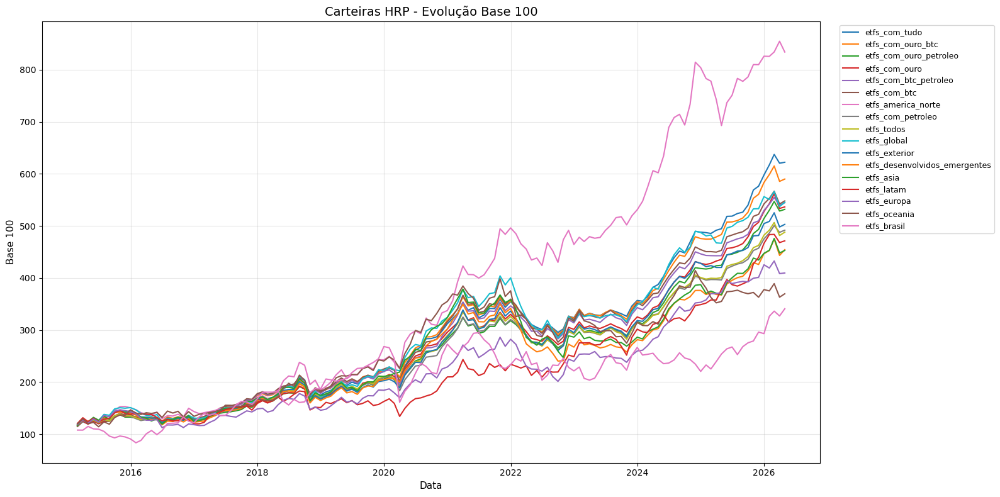

OK

[6/10] Gerando gráfico drawdown - todas as carteiras...


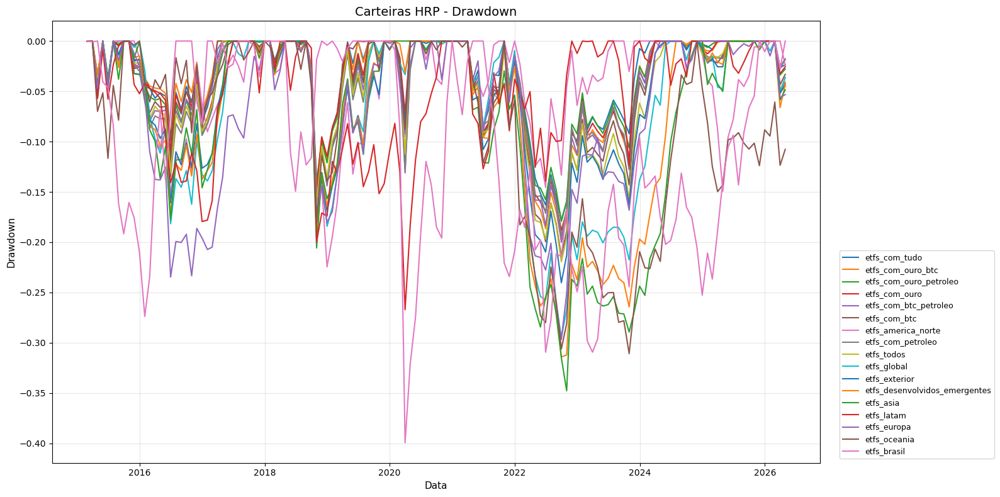

OK

[7/10] Gerando gráficos de apoio para o HTML...


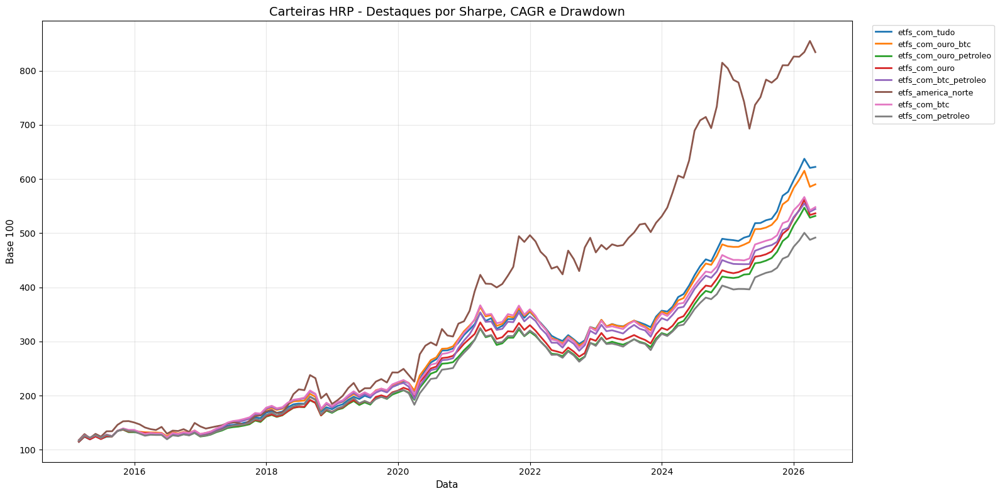

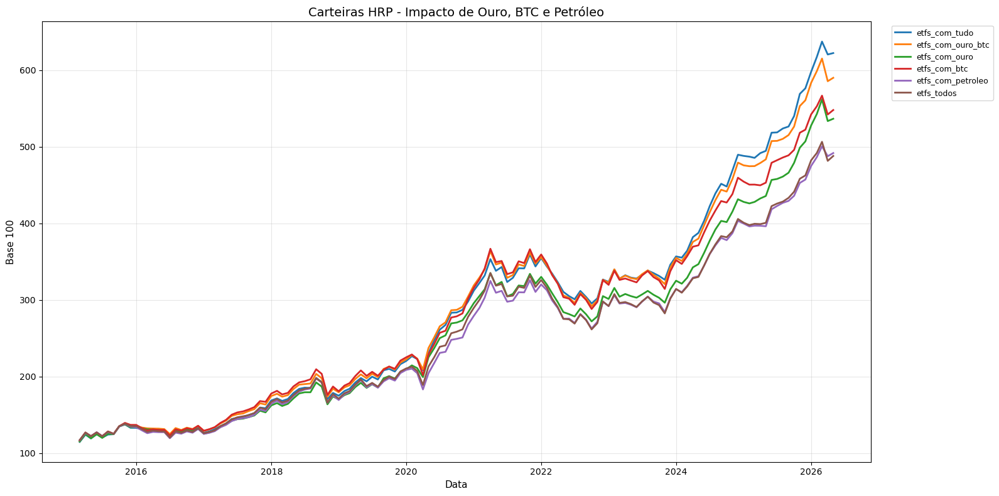

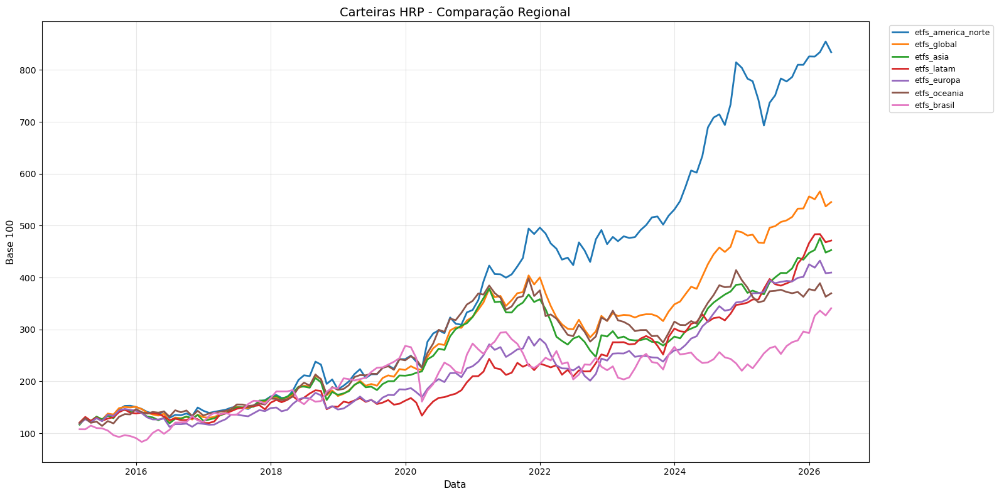

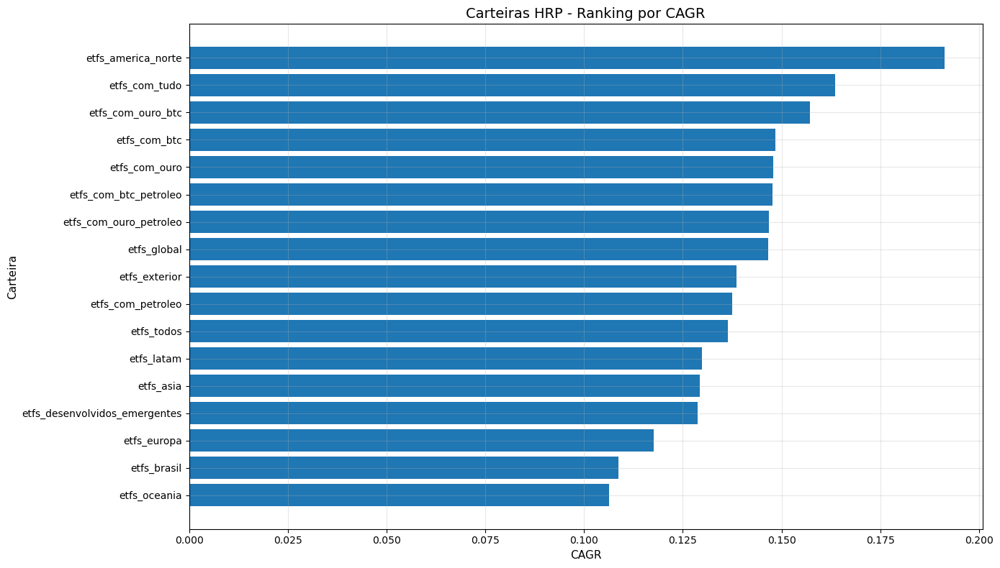

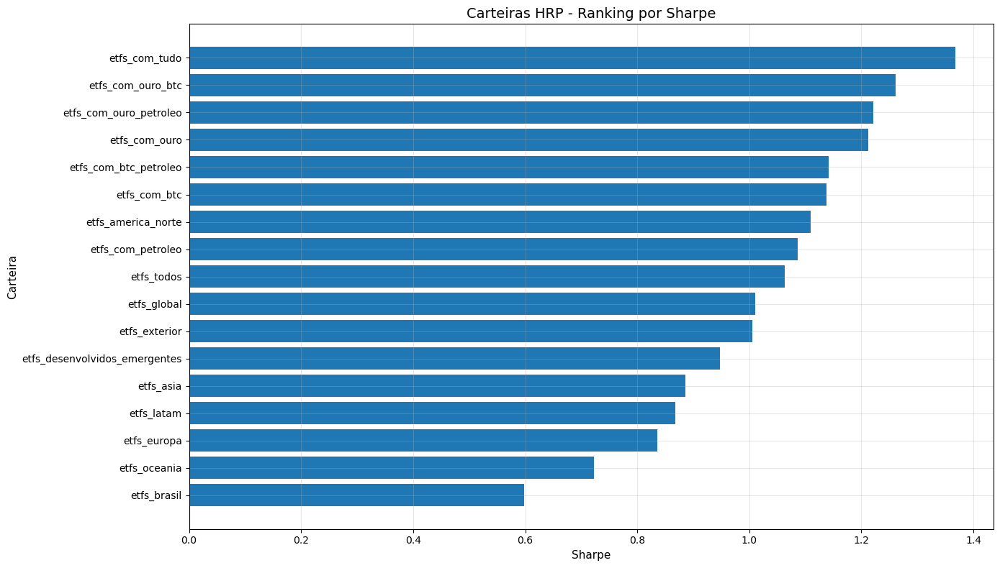

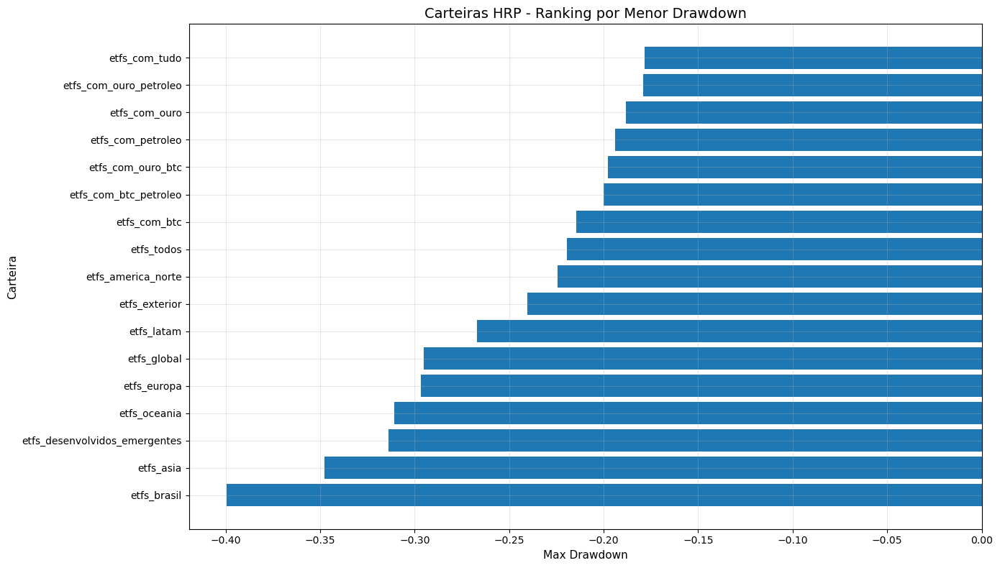

OK

[8/10] Gerando gráficos adicionais de pesos, concentração e hierarquia...


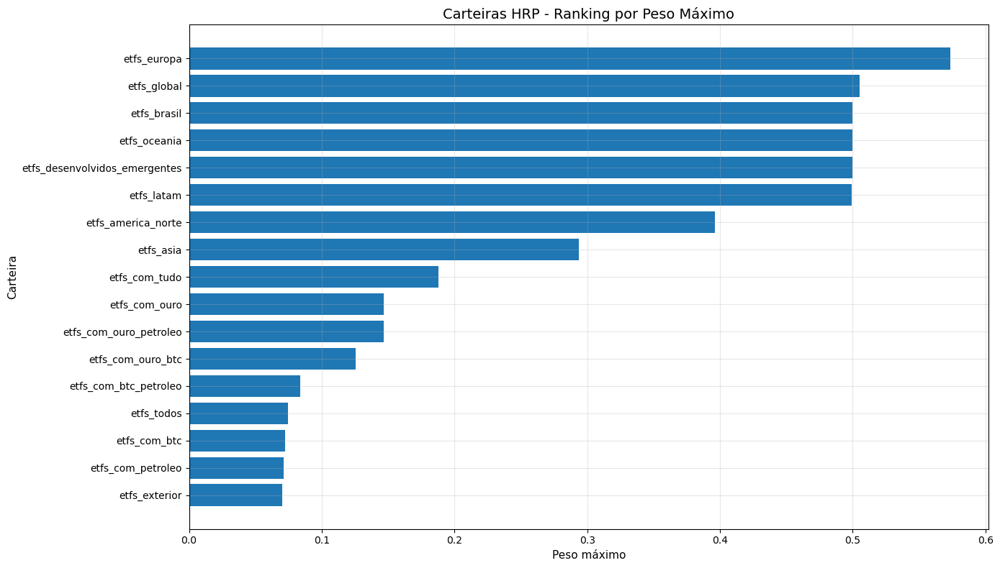

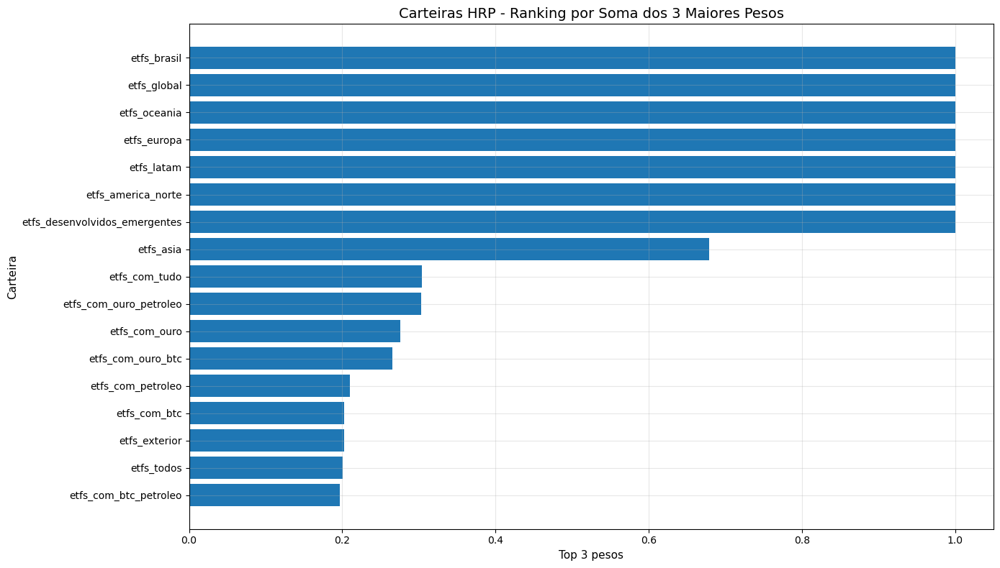

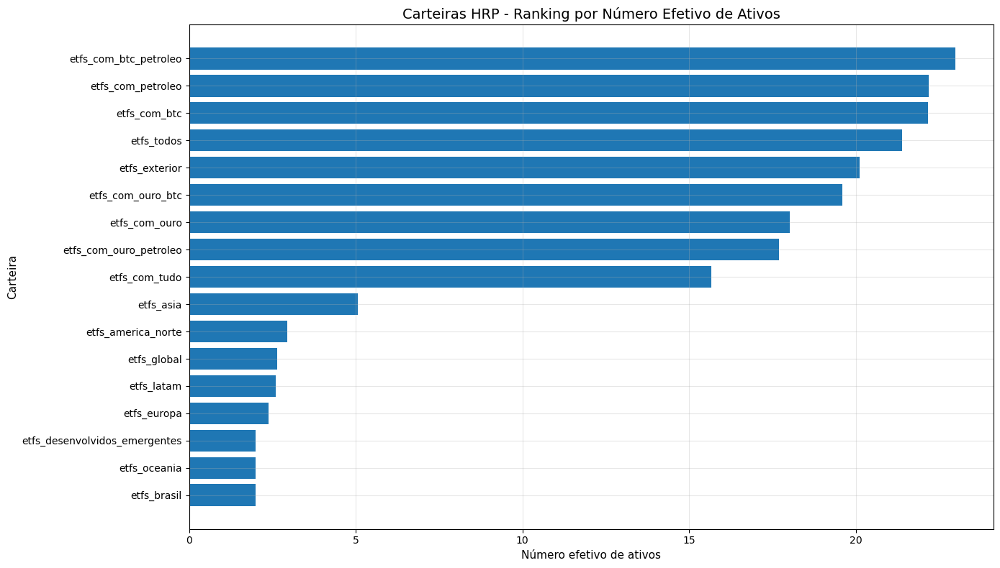

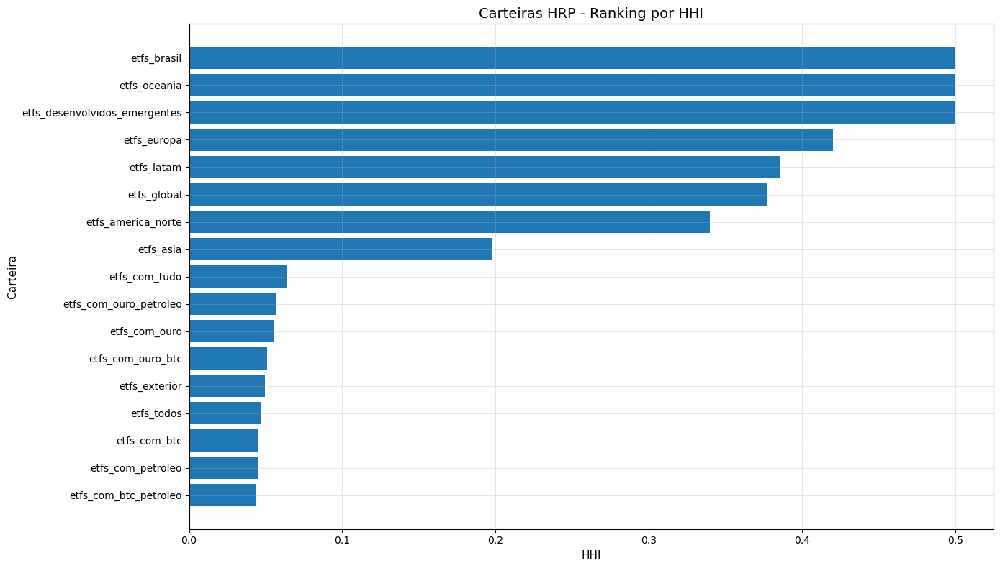

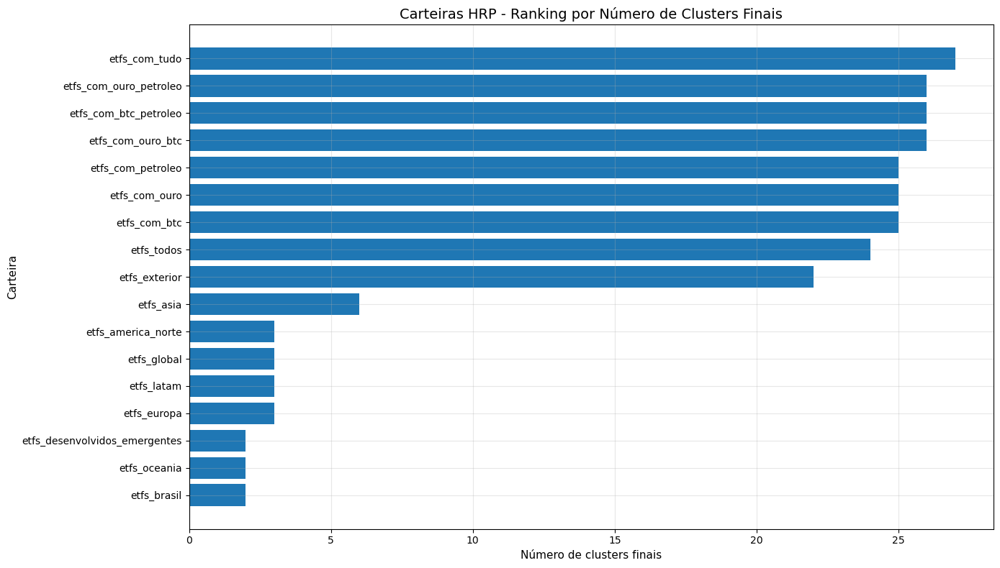

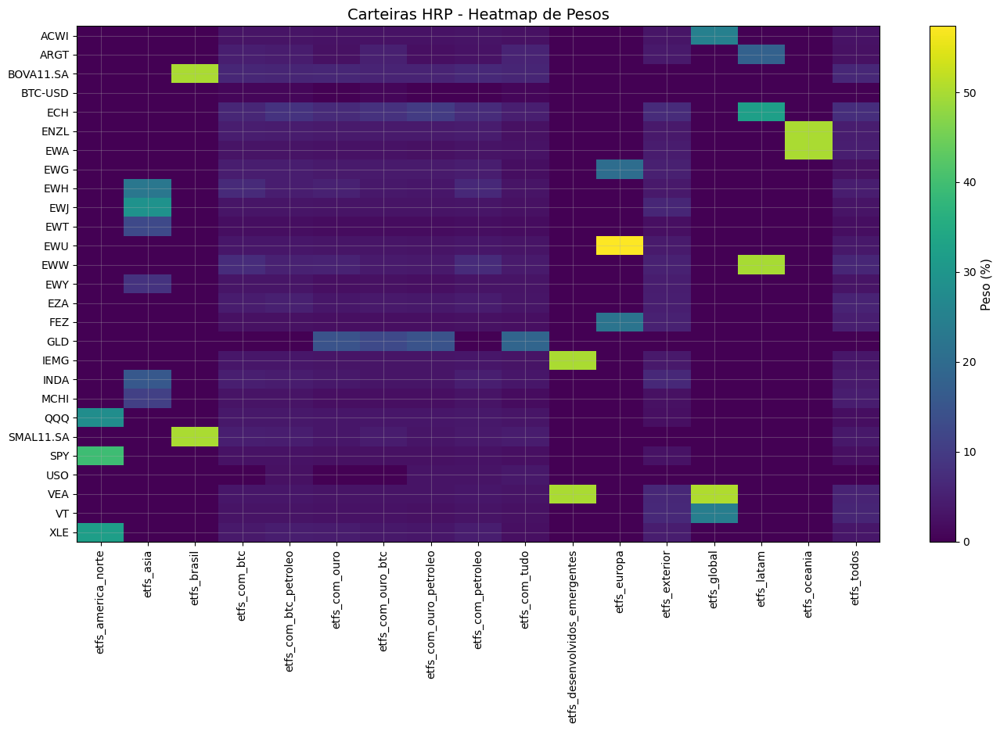

OK

[9/10] Exibindo tabelas de destaque...

--- Resumo visual das carteiras HRP ---


,carteira,tipo,coluna_retorno,cagr,vol_anual,sharpe,sortino,max_drawdown,calmar,pct_meses_positivos,n_ativos_com_peso,peso_max,top3_peso,hhi,n_efetivo_ativos,classificacao_concentracao,n_clusters_finais,metodo_ligacao,distancia
0,etfs_com_tudo,hrp,etfs_com_tudo,0.1635707373,0.1252736942,1.3675499280,2.3435878553,-0.1782814516,0.9174860079,0.6444444444,27,0.1879465480,0.3038354689,0.0638537076,15.6607977335,baixa,27,single,correlacao
1,etfs_com_ouro_btc,hrp,etfs_com_ouro_btc,0.1571130472,0.1327233609,1.2615685646,2.2346399800,-0.1979436010,0.7937263261,0.6518518519,26,0.1255026500,0.2649217465,0.0510377331,19.5933467082,baixa,26,single,correlacao
2,etfs_com_ouro_petroleo,hrp,etfs_com_ouro_petroleo,0.1467943883,0.1290038249,1.2219426990,2.0744261195,-0.1793026648,0.8186960771,0.6592592593,26,0.1465059754,0.3028384452,0.0564913507,17.7018249425,baixa,26,single,correlacao
3,etfs_com_ouro,hrp,etfs_com_ouro,0.1478002480,0.1308364181,1.2126275515,2.0841074081,-0.1884448846,0.7843155216,0.6444444444,25,0.1467642459,0.2759871316,0.0555366222,18.0061364829,baixa,25,single,correlacao
4,etfs_com_btc_petroleo,hrp,etfs_com_btc_petroleo,0.1476796137,0.1414892317,1.1410535252,1.8734459096,-0.2001082208,0.7379987342,0.6444444444,26,0.0839552403,0.1969983393,0.0435213346,22.9772365382,baixa,26,single,correlacao
5,etfs_com_btc,hrp,etfs_com_btc,0.1483610812,0.1424800413,1.1378722058,1.9423926664,-0.2143447449,0.6921610381,0.6518518519,25,0.0725081669,0.2024148616,0.0451073210,22.1693502845,baixa,25,single,correlacao
6,etfs_america_norte,hrp,etfs_america_norte,0.1912922177,0.1863112710,1.1098743485,2.1271511645,-0.2245340035,0.8519521085,0.6074074074,3,0.3961969248,1.0000000000,0.3400491930,2.9407509869,alta,3,single,correlacao
7,etfs_com_petroleo,hrp,etfs_com_petroleo,0.1375240701,0.1400347760,1.0860812402,1.7362241258,-0.1939165239,0.7091921167,0.6444444444,25,0.0714261692,0.2094878504,0.0450978963,22.1739833241,baixa,25,single,correlacao
8,etfs_todos,hrp,etfs_todos,0.1364550718,0.1427571509,1.0628906712,1.8057839227,-0.2195292440,0.6215803840,0.6444444444,24,0.0744083286,0.2000605163,0.0467553800,21.3879129882,baixa,24,single,correlacao
9,etfs_global,hrp,etfs_global,0.1466295039,0.1629713158,1.0111657339,1.6900372723,-0.2953747675,0.4964185166,0.6000000000,3,0.5049874363,1.0000000000,0.3775434894,2.6487014825,alta,3,single,correlacao



--- Top 10 pesos por carteira ---


,carteira,tipo,coluna_retorno,carteira_tipo,ativo,peso,peso_pct
0,etfs_america_norte,hrp,etfs_america_norte,etfs_america_norte__hrp,SPY,0.3961969248,39.6196924810
1,etfs_america_norte,hrp,etfs_america_norte,etfs_america_norte__hrp,XLE,0.3217523940,32.1752393985
2,etfs_america_norte,hrp,etfs_america_norte,etfs_america_norte__hrp,QQQ,0.2820506812,28.2050681205
3,etfs_asia,hrp,etfs_asia,etfs_asia__hrp,EWJ,0.2935205587,29.3520558722
4,etfs_asia,hrp,etfs_asia,etfs_asia__hrp,EWH,0.2268395570,22.6839556973
...,...,...,...,...,...,...,...
109,etfs_todos,hrp,etfs_todos,etfs_todos__hrp,VEA,0.0576797217,5.7679721674
110,etfs_todos,hrp,etfs_todos,etfs_todos__hrp,EWA,0.0483558695,4.8355869457
111,etfs_todos,hrp,etfs_todos,etfs_todos__hrp,FEZ,0.0471304801,4.7130480119
112,etfs_todos,hrp,etfs_todos,etfs_todos__hrp,ENZL,0.0455574556,4.5557455593



--- Heatmap de pesos (tabela em %) ---


carteira,etfs_america_norte,etfs_asia,etfs_brasil,etfs_com_btc,etfs_com_btc_petroleo,etfs_com_ouro,etfs_com_ouro_btc,etfs_com_ouro_petroleo,etfs_com_petroleo,etfs_com_tudo,etfs_desenvolvidos_emergentes,etfs_europa,etfs_exterior,etfs_global,etfs_latam,etfs_oceania,etfs_todos
ativo,,,,,,,,,,,,,,,,,
ACWI,0.0000,0.0000,0.0,3.0840,3.0382,2.7874,2.7926,2.7411,3.0353,2.6646,0.0,0.0000,3.2379,25.0002,0.0000,0.0,2.8834
ARGT,0.0000,0.0000,0.0,4.7494,4.4369,2.4987,5.1333,2.3415,2.7470,5.7531,0.0,0.0000,3.8707,0.0000,17.7782,0.0,2.6059
BOVA11.SA,0.0000,0.0000,50.0,6.2183,5.9667,6.0622,5.7612,5.6810,6.6647,5.8358,0.0,0.0000,0.0000,0.0000,0.0000,0.0,6.3225
BTC-USD,0.0000,0.0000,0.0,1.0929,1.0487,0.0000,1.0126,0.0000,0.0000,1.0257,0.0,0.0000,0.0000,0.0000,0.0000,0.0,0.0000
ECH,0.0000,0.0000,0.0,6.1837,8.3955,6.8600,8.1807,9.9523,7.1349,4.8785,0.0,0.0000,7.0279,0.0000,32.2795,0.0,7.4408
ENZL,0.0000,0.0000,0.0,4.5416,4.4742,4.1048,4.1125,4.0366,4.4698,2.5024,0.0,0.0000,3.8205,0.0000,0.0000,50.0,4.5557
EWA,0.0000,0.0000,0.0,2.9919,2.9475,2.7041,2.7092,2.6592,2.9447,2.8709,0.0,0.0000,4.3831,0.0000,0.0000,50.0,4.8356
EWG,0.0000,0.0000,0.0,4.6131,4.5446,4.1694,4.1772,4.1001,4.5402,2.2060,0.0,20.5422,5.1064,0.0000,0.0000,0.0,2.5264
EWH,0.0000,22.6840,0.0,6.7723,4.5928,5.1853,3.5862,3.3948,6.6713,3.0762,0.0,0.0000,3.8874,0.0000,0.0000,0.0,4.4954



--- Resumo visual da hierarquia HRP ---


,carteira,metodo_ligacao,distancia,n_clusters_finais,ordem_hrp
0,etfs_com_tudo,single,correlacao,27,BTC-USD | BOVA11.SA | SMAL11.SA | ARGT | GLD |...
1,etfs_com_ouro_btc,single,correlacao,26,BTC-USD | BOVA11.SA | SMAL11.SA | ARGT | GLD |...
2,etfs_com_ouro_petroleo,single,correlacao,26,BOVA11.SA | SMAL11.SA | ARGT | GLD | USO | ECH...
3,etfs_com_ouro,single,correlacao,25,BOVA11.SA | SMAL11.SA | ARGT | GLD | ECH | XLE...
4,etfs_com_btc_petroleo,single,correlacao,26,BTC-USD | BOVA11.SA | SMAL11.SA | ARGT | USO |...
5,etfs_com_btc,single,correlacao,25,BTC-USD | BOVA11.SA | SMAL11.SA | ARGT | ECH |...
6,etfs_america_norte,single,correlacao,3,XLE | QQQ | SPY
7,etfs_com_petroleo,single,correlacao,25,BOVA11.SA | SMAL11.SA | ARGT | USO | ECH | XLE...
8,etfs_todos,single,correlacao,24,BOVA11.SA | SMAL11.SA | ARGT | ECH | XLE | EWW...
9,etfs_global,single,correlacao,3,VEA | ACWI | VT



[10/10] Etapa concluída.

------------------------------------------------------------------------------------------
RESUMO DOS ARQUIVOS GERADOS
------------------------------------------------------------------------------------------
Base 100 - todas......................: resultados/graficos/carteiras_hrp_base100_todas.png
Drawdown - todas......................: resultados/graficos/carteiras_hrp_drawdown_todas.png
Base 100 - destaques.................: resultados/graficos/carteiras_hrp_base100_destaques.png
Base 100 - alternativos..............: resultados/graficos/carteiras_hrp_base100_alternativos.png
Base 100 - regionais.................: resultados/graficos/carteiras_hrp_base100_regionais.png
Barras CAGR...........................: resultados/graficos/carteiras_hrp_ranking_cagr.png
Barras Sharpe.........................: resultados/graficos/carteiras_hrp_ranking_sharpe.png
Barras Drawdown.......................: resultados/graficos/carteiras_hrp_ranking_drawdown.png
Barras peso

In [30]:
%%time
# ==========================================================================================
# ETAPA 29 - COMPARAÇÃO VISUAL DAS CARTEIRAS HRP
# ==========================================================================================

print("=" * 90)
print("INICIANDO ETAPA 29 - COMPARAÇÃO VISUAL DAS CARTEIRAS HRP")
print("=" * 90)

# ==========================================================================================
# [1/10] VALIDAÇÕES INICIAIS
# ==========================================================================================
print("\n[1/10] Validando objetos de entrada...")

variaveis_obrigatorias = [
    "df_carteiras_hrp",
    "df_carteiras_hrp_base100",
    "df_metricas_hrp",
    "df_pesos_hrp",
]

variaveis_faltantes = [v for v in variaveis_obrigatorias if v not in globals()]

if variaveis_faltantes:
    raise NameError(
        f"As seguintes variáveis obrigatórias não existem no ambiente: {variaveis_faltantes}"
    )

if not isinstance(df_carteiras_hrp, pd.DataFrame):
    raise TypeError("df_carteiras_hrp precisa ser um pandas DataFrame.")

if not isinstance(df_carteiras_hrp_base100, pd.DataFrame):
    raise TypeError("df_carteiras_hrp_base100 precisa ser um pandas DataFrame.")

if not isinstance(df_metricas_hrp, pd.DataFrame):
    raise TypeError("df_metricas_hrp precisa ser um pandas DataFrame.")

if not isinstance(df_pesos_hrp, pd.DataFrame):
    raise TypeError("df_pesos_hrp precisa ser um pandas DataFrame.")

if df_carteiras_hrp.empty:
    raise ValueError("df_carteiras_hrp está vazio.")

if df_carteiras_hrp_base100.empty:
    raise ValueError("df_carteiras_hrp_base100 está vazio.")

if df_metricas_hrp.empty:
    raise ValueError("df_metricas_hrp está vazio.")

if df_pesos_hrp.empty:
    raise ValueError("df_pesos_hrp está vazio.")

# Cópias defensivas
df_carteiras_hrp = df_carteiras_hrp.copy()
df_carteiras_hrp_base100 = df_carteiras_hrp_base100.copy()
df_metricas_hrp = df_metricas_hrp.copy()
df_pesos_hrp = df_pesos_hrp.copy()

df_carteiras_hrp.index = pd.to_datetime(df_carteiras_hrp.index)
df_carteiras_hrp_base100.index = pd.to_datetime(df_carteiras_hrp_base100.index)

df_carteiras_hrp = df_carteiras_hrp.sort_index()
df_carteiras_hrp_base100 = df_carteiras_hrp_base100.sort_index()

if "coluna_retorno" not in df_metricas_hrp.columns:
    raise ValueError("df_metricas_hrp precisa conter a coluna 'coluna_retorno'.")

if "carteira_tipo" not in df_pesos_hrp.columns:
    df_pesos_hrp["carteira_tipo"] = (
        df_pesos_hrp["carteira"].astype(str) + "__" + df_pesos_hrp["tipo"].astype(str)
    )

colunas_comuns = [
    c for c in df_carteiras_hrp.columns
    if c in df_carteiras_hrp_base100.columns
    and c in df_metricas_hrp["coluna_retorno"].astype(str).tolist()
]

if len(colunas_comuns) == 0:
    raise ValueError("Não há carteiras em comum entre os objetos de entrada.")

df_carteiras_hrp = df_carteiras_hrp[colunas_comuns].copy()
df_carteiras_hrp_base100 = df_carteiras_hrp_base100[colunas_comuns].copy()

os.makedirs("resultados/graficos", exist_ok=True)
os.makedirs("resultados/tabelas", exist_ok=True)

print("OK")
print(f"Carteiras disponíveis................: {len(colunas_comuns)}")
print(
    f"Período analisado....................: "
    f"{df_carteiras_hrp.index.min().date()} até {df_carteiras_hrp.index.max().date()}"
)

# ==========================================================================================
# [2/10] PREPARANDO BASES VISUAIS
# ==========================================================================================
print("\n[2/10] Preparando bases visuais...")

ordem_sharpe = (
    df_metricas_hrp
    .sort_values(by=["sharpe", "cagr"], ascending=[False, False])["coluna_retorno"]
    .tolist()
)
ordem_sharpe = [c for c in ordem_sharpe if c in df_carteiras_hrp_base100.columns]

df_carteiras_hrp_base100_plot = df_carteiras_hrp_base100[ordem_sharpe].copy()

df_carteiras_hrp_drawdown = (
    df_carteiras_hrp_base100_plot
    .div(df_carteiras_hrp_base100_plot.cummax())
    .sub(1.0)
)

colunas_resumo = [
    "carteira",
    "tipo",
    "coluna_retorno",
    "cagr",
    "vol_anual",
    "sharpe",
    "sortino",
    "max_drawdown",
    "calmar",
    "pct_meses_positivos",
    "n_ativos_com_peso",
    "peso_max",
    "top3_peso",
    "hhi",
    "n_efetivo_ativos",
    "classificacao_concentracao",
    "n_clusters_finais",
    "metodo_ligacao",
    "distancia",
]

colunas_resumo = [c for c in colunas_resumo if c in df_metricas_hrp.columns]

df_resumo_visual_carteiras_hrp = (
    df_metricas_hrp[colunas_resumo]
    .sort_values(by=["sharpe", "cagr"], ascending=[False, False])
    .reset_index(drop=True)
    .copy()
)

df_base100_long_hrp = (
    df_carteiras_hrp_base100_plot
    .reset_index()
    .rename(columns={"index": "data"})
    .melt(id_vars="data", var_name="carteira", value_name="base100")
)

df_drawdown_long_hrp = (
    df_carteiras_hrp_drawdown
    .reset_index()
    .rename(columns={"index": "data"})
    .melt(id_vars="data", var_name="carteira", value_name="drawdown")
)

df_top10_pesos_hrp = (
    df_pesos_hrp
    .assign(peso_pct=df_pesos_hrp["peso"] * 100)
    .sort_values(by=["carteira", "peso"], ascending=[True, False])
    .groupby("carteira", as_index=False)
    .head(10)
    .reset_index(drop=True)
)

df_pesos_heatmap_hrp = (
    df_pesos_hrp
    .assign(peso_pct=df_pesos_hrp["peso"] * 100)
    .pivot(index="ativo", columns="carteira", values="peso_pct")
    .fillna(0.0)
    .round(4)
)

df_hierarquia_visual_hrp = (
    df_metricas_hrp[
        [
            "carteira",
            "metodo_ligacao",
            "distancia",
            "n_clusters_finais",
            "ordem_hrp",
        ]
    ]
    .copy()
)

print("OK")
print(f"Base 100 shape.......................: {df_carteiras_hrp_base100_plot.shape}")
print(f"Drawdown shape.......................: {df_carteiras_hrp_drawdown.shape}")
print(f"Tabela resumo shape..................: {df_resumo_visual_carteiras_hrp.shape}")
print(f"Top 10 pesos shape...................: {df_top10_pesos_hrp.shape}")

# ==========================================================================================
# [3/10] SALVANDO TABELAS AUXILIARES
# ==========================================================================================
print("\n[3/10] Salvando tabelas auxiliares...")

caminho_csv_base100 = "resultados/tabelas/carteiras_hrp_base100.csv"
caminho_html_base100 = "resultados/tabelas/carteiras_hrp_base100.html"

caminho_csv_drawdown = "resultados/tabelas/carteiras_hrp_drawdown.csv"
caminho_html_drawdown = "resultados/tabelas/carteiras_hrp_drawdown.html"

caminho_csv_resumo_visual = "resultados/tabelas/resumo_visual_carteiras_hrp.csv"
caminho_html_resumo_visual = "resultados/tabelas/resumo_visual_carteiras_hrp.html"

caminho_csv_base100_long = "resultados/tabelas/carteiras_hrp_base100_long.csv"
caminho_csv_drawdown_long = "resultados/tabelas/carteiras_hrp_drawdown_long.csv"

caminho_csv_top10_pesos = "resultados/tabelas/carteiras_hrp_top10_pesos.csv"
caminho_html_top10_pesos = "resultados/tabelas/carteiras_hrp_top10_pesos.html"

caminho_csv_heatmap_pesos = "resultados/tabelas/carteiras_hrp_heatmap_pesos.csv"
caminho_html_heatmap_pesos = "resultados/tabelas/carteiras_hrp_heatmap_pesos.html"

caminho_csv_hierarquia_visual = "resultados/tabelas/carteiras_hrp_hierarquia_visual.csv"
caminho_html_hierarquia_visual = "resultados/tabelas/carteiras_hrp_hierarquia_visual.html"

df_carteiras_hrp_base100_plot.to_csv(caminho_csv_base100, sep=",", decimal=".")
df_carteiras_hrp_drawdown.to_csv(caminho_csv_drawdown, sep=",", decimal=".")
df_resumo_visual_carteiras_hrp.to_csv(caminho_csv_resumo_visual, index=False, sep=",", decimal=".")
df_base100_long_hrp.to_csv(caminho_csv_base100_long, index=False, sep=",", decimal=".")
df_drawdown_long_hrp.to_csv(caminho_csv_drawdown_long, index=False, sep=",", decimal=".")
df_top10_pesos_hrp.to_csv(caminho_csv_top10_pesos, index=False, sep=",", decimal=".")
df_pesos_heatmap_hrp.to_csv(caminho_csv_heatmap_pesos, sep=",", decimal=".")
df_hierarquia_visual_hrp.to_csv(caminho_csv_hierarquia_visual, index=False, sep=",", decimal=".")

df_carteiras_hrp_base100_plot.to_html(
    caminho_html_base100,
    border=0,
    justify="center",
    float_format=lambda x: f"{x:,.2f}"
)

df_carteiras_hrp_drawdown.to_html(
    caminho_html_drawdown,
    border=0,
    justify="center",
    float_format=lambda x: f"{x:.4%}"
)

formatters_resumo = {
    "cagr": lambda x: f"{x:.2%}" if pd.notna(x) else "",
    "vol_anual": lambda x: f"{x:.2%}" if pd.notna(x) else "",
    "sharpe": lambda x: f"{x:.4f}" if pd.notna(x) else "",
    "sortino": lambda x: f"{x:.4f}" if pd.notna(x) else "",
    "max_drawdown": lambda x: f"{x:.2%}" if pd.notna(x) else "",
    "calmar": lambda x: f"{x:.4f}" if pd.notna(x) else "",
    "pct_meses_positivos": lambda x: f"{x:.2%}" if pd.notna(x) else "",
    "peso_max": lambda x: f"{x:.2%}" if pd.notna(x) else "",
    "top3_peso": lambda x: f"{x:.2%}" if pd.notna(x) else "",
    "hhi": lambda x: f"{x:.4f}" if pd.notna(x) else "",
    "n_efetivo_ativos": lambda x: f"{x:.2f}" if pd.notna(x) else "",
}

df_resumo_visual_carteiras_hrp.to_html(
    caminho_html_resumo_visual,
    index=False,
    border=0,
    justify="center",
    formatters={k: v for k, v in formatters_resumo.items() if k in df_resumo_visual_carteiras_hrp.columns}
)

df_top10_pesos_hrp.to_html(
    caminho_html_top10_pesos,
    index=False,
    border=0,
    justify="center",
    formatters={
        "peso": lambda x: f"{x:.4%}" if pd.notna(x) else "",
        "peso_pct": lambda x: f"{x:.2f}%" if pd.notna(x) else "",
    }
)

df_pesos_heatmap_hrp.to_html(
    caminho_html_heatmap_pesos,
    border=0,
    justify="center",
    float_format=lambda x: f"{x:.2f}"
)

df_hierarquia_visual_hrp.to_html(
    caminho_html_hierarquia_visual,
    index=False,
    border=0,
    justify="center",
)

print("OK")
print(f"CSV base 100.........................: {caminho_csv_base100}")
print(f"CSV drawdown.........................: {caminho_csv_drawdown}")
print(f"CSV resumo visual....................: {caminho_csv_resumo_visual}")

# ==========================================================================================
# [4/10] DEFININDO GRUPOS PARA GRÁFICOS
# ==========================================================================================
print("\n[4/10] Definindo grupos para visualização...")

top5_sharpe = (
    df_metricas_hrp
    .sort_values(by=["sharpe", "cagr"], ascending=[False, False])["coluna_retorno"]
    .head(5)
    .tolist()
)

top5_cagr = (
    df_metricas_hrp
    .sort_values(by=["cagr", "sharpe"], ascending=[False, False])["coluna_retorno"]
    .head(5)
    .tolist()
)

top5_menor_drawdown = (
    df_metricas_hrp
    .sort_values(by=["max_drawdown", "sharpe"], ascending=[False, False])["coluna_retorno"]
    .head(5)
    .tolist()
)

carteiras_destaque = []
for carteira in top5_sharpe + top5_cagr + top5_menor_drawdown:
    if carteira not in carteiras_destaque:
        carteiras_destaque.append(carteira)

familias_base_alternativos = [
    "etfs_todos",
    "etfs_com_ouro",
    "etfs_com_btc",
    "etfs_com_petroleo",
    "etfs_com_ouro_btc",
    "etfs_com_tudo",
]

carteiras_base_alternativos = [
    c for c in df_carteiras_hrp_base100_plot.columns
    if c in familias_base_alternativos
]

familias_regionais = [
    "etfs_brasil",
    "etfs_america_norte",
    "etfs_europa",
    "etfs_asia",
    "etfs_oceania",
    "etfs_latam",
    "etfs_global",
]

carteiras_regionais = [
    c for c in df_carteiras_hrp_base100_plot.columns
    if c in familias_regionais
]

print("OK")
print(f"Carteiras destaque...................: {len(carteiras_destaque)}")
print(f"Grupo base x alternativos............: {len(carteiras_base_alternativos)}")
print(f"Grupo regionais......................: {len(carteiras_regionais)}")

# ==========================================================================================
# [5/10] GRÁFICO 1 - BASE 100 (TODAS AS CARTEIRAS)
# ==========================================================================================
print("\n[5/10] Gerando gráfico base 100 - todas as carteiras...")

plt.figure(figsize=(16, 8))

for coluna in df_carteiras_hrp_base100_plot.columns:
    plt.plot(
        df_carteiras_hrp_base100_plot.index,
        df_carteiras_hrp_base100_plot[coluna],
        linewidth=1.5,
        label=coluna
    )

plt.title("Carteiras HRP - Evolução Base 100", fontsize=14)
plt.xlabel("Data")
plt.ylabel("Base 100")
plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), fontsize=9)
plt.grid(True, alpha=0.3)
plt.tight_layout()

caminho_grafico_base100_todas = "resultados/graficos/carteiras_hrp_base100_todas.png"
plt.savefig(caminho_grafico_base100_todas, dpi=300, bbox_inches="tight")
plt.show()

print("OK")

# ==========================================================================================
# [6/10] GRÁFICO 2 - DRAWDOWN (TODAS AS CARTEIRAS)
# ==========================================================================================
print("\n[6/10] Gerando gráfico drawdown - todas as carteiras...")

plt.figure(figsize=(16, 8))

for coluna in df_carteiras_hrp_drawdown.columns:
    plt.plot(
        df_carteiras_hrp_drawdown.index,
        df_carteiras_hrp_drawdown[coluna],
        linewidth=1.5,
        label=coluna
    )

plt.title("Carteiras HRP - Drawdown", fontsize=14)
plt.xlabel("Data")
plt.ylabel("Drawdown")
plt.legend(loc="lower left", bbox_to_anchor=(1.02, 0), fontsize=9)
plt.grid(True, alpha=0.3)
plt.tight_layout()

caminho_grafico_drawdown_todas = "resultados/graficos/carteiras_hrp_drawdown_todas.png"
plt.savefig(caminho_grafico_drawdown_todas, dpi=300, bbox_inches="tight")
plt.show()

print("OK")

# ==========================================================================================
# [7/10] GRÁFICOS DE APOIO PARA O HTML (BASELINE DAS ETAPAS OTIMIZADAS)
# ==========================================================================================
print("\n[7/10] Gerando gráficos de apoio para o HTML...")

if len(carteiras_destaque) > 0:
    plt.figure(figsize=(16, 8))

    for coluna in carteiras_destaque:
        plt.plot(
            df_carteiras_hrp_base100_plot.index,
            df_carteiras_hrp_base100_plot[coluna],
            linewidth=2.0,
            label=coluna
        )

    plt.title("Carteiras HRP - Destaques por Sharpe, CAGR e Drawdown", fontsize=14)
    plt.xlabel("Data")
    plt.ylabel("Base 100")
    plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), fontsize=9)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()

    caminho_grafico_base100_destaques = "resultados/graficos/carteiras_hrp_base100_destaques.png"
    plt.savefig(caminho_grafico_base100_destaques, dpi=300, bbox_inches="tight")
    plt.show()

if len(carteiras_base_alternativos) > 0:
    plt.figure(figsize=(16, 8))

    for coluna in carteiras_base_alternativos:
        plt.plot(
            df_carteiras_hrp_base100_plot.index,
            df_carteiras_hrp_base100_plot[coluna],
            linewidth=2.0,
            label=coluna
        )

    plt.title("Carteiras HRP - Impacto de Ouro, BTC e Petróleo", fontsize=14)
    plt.xlabel("Data")
    plt.ylabel("Base 100")
    plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), fontsize=9)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()

    caminho_grafico_base100_alternativos = "resultados/graficos/carteiras_hrp_base100_alternativos.png"
    plt.savefig(caminho_grafico_base100_alternativos, dpi=300, bbox_inches="tight")
    plt.show()

if len(carteiras_regionais) > 0:
    plt.figure(figsize=(16, 8))

    for coluna in carteiras_regionais:
        plt.plot(
            df_carteiras_hrp_base100_plot.index,
            df_carteiras_hrp_base100_plot[coluna],
            linewidth=2.0,
            label=coluna
        )

    plt.title("Carteiras HRP - Comparação Regional", fontsize=14)
    plt.xlabel("Data")
    plt.ylabel("Base 100")
    plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), fontsize=9)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()

    caminho_grafico_base100_regionais = "resultados/graficos/carteiras_hrp_base100_regionais.png"
    plt.savefig(caminho_grafico_base100_regionais, dpi=300, bbox_inches="tight")
    plt.show()

df_plot_cagr = (
    df_metricas_hrp[["coluna_retorno", "cagr"]]
    .sort_values(by="cagr", ascending=False)
    .reset_index(drop=True)
)

plt.figure(figsize=(14, 8))
plt.barh(df_plot_cagr["coluna_retorno"], df_plot_cagr["cagr"])
plt.gca().invert_yaxis()
plt.title("Carteiras HRP - Ranking por CAGR", fontsize=14)
plt.xlabel("CAGR")
plt.ylabel("Carteira")
plt.grid(True, axis="x", alpha=0.3)
plt.tight_layout()

caminho_grafico_barras_cagr = "resultados/graficos/carteiras_hrp_ranking_cagr.png"
plt.savefig(caminho_grafico_barras_cagr, dpi=300, bbox_inches="tight")
plt.show()

df_plot_sharpe = (
    df_metricas_hrp[["coluna_retorno", "sharpe"]]
    .sort_values(by="sharpe", ascending=False)
    .reset_index(drop=True)
)

plt.figure(figsize=(14, 8))
plt.barh(df_plot_sharpe["coluna_retorno"], df_plot_sharpe["sharpe"])
plt.gca().invert_yaxis()
plt.title("Carteiras HRP - Ranking por Sharpe", fontsize=14)
plt.xlabel("Sharpe")
plt.ylabel("Carteira")
plt.grid(True, axis="x", alpha=0.3)
plt.tight_layout()

caminho_grafico_barras_sharpe = "resultados/graficos/carteiras_hrp_ranking_sharpe.png"
plt.savefig(caminho_grafico_barras_sharpe, dpi=300, bbox_inches="tight")
plt.show()

df_plot_mdd = (
    df_metricas_hrp[["coluna_retorno", "max_drawdown"]]
    .sort_values(by="max_drawdown", ascending=False)
    .reset_index(drop=True)
)

plt.figure(figsize=(14, 8))
plt.barh(df_plot_mdd["coluna_retorno"], df_plot_mdd["max_drawdown"])
plt.gca().invert_yaxis()
plt.title("Carteiras HRP - Ranking por Menor Drawdown", fontsize=14)
plt.xlabel("Max Drawdown")
plt.ylabel("Carteira")
plt.grid(True, axis="x", alpha=0.3)
plt.tight_layout()

caminho_grafico_barras_mdd = "resultados/graficos/carteiras_hrp_ranking_drawdown.png"
plt.savefig(caminho_grafico_barras_mdd, dpi=300, bbox_inches="tight")
plt.show()

print("OK")

# ==========================================================================================
# [8/10] ADENDOS DO HRP - PESOS, CONCENTRAÇÃO E HIERARQUIA
# ==========================================================================================
print("\n[8/10] Gerando gráficos adicionais de pesos, concentração e hierarquia...")

if "peso_max" in df_metricas_hrp.columns:
    df_plot_peso_max = (
        df_metricas_hrp[["coluna_retorno", "peso_max"]]
        .sort_values(by="peso_max", ascending=False)
        .reset_index(drop=True)
    )

    plt.figure(figsize=(14, 8))
    plt.barh(df_plot_peso_max["coluna_retorno"], df_plot_peso_max["peso_max"])
    plt.gca().invert_yaxis()
    plt.title("Carteiras HRP - Ranking por Peso Máximo", fontsize=14)
    plt.xlabel("Peso máximo")
    plt.ylabel("Carteira")
    plt.grid(True, axis="x", alpha=0.3)
    plt.tight_layout()

    caminho_grafico_barras_peso_max = "resultados/graficos/carteiras_hrp_ranking_peso_maximo.png"
    plt.savefig(caminho_grafico_barras_peso_max, dpi=300, bbox_inches="tight")
    plt.show()

if "top3_peso" in df_metricas_hrp.columns:
    df_plot_top3 = (
        df_metricas_hrp[["coluna_retorno", "top3_peso"]]
        .sort_values(by="top3_peso", ascending=False)
        .reset_index(drop=True)
    )

    plt.figure(figsize=(14, 8))
    plt.barh(df_plot_top3["coluna_retorno"], df_plot_top3["top3_peso"])
    plt.gca().invert_yaxis()
    plt.title("Carteiras HRP - Ranking por Soma dos 3 Maiores Pesos", fontsize=14)
    plt.xlabel("Top 3 pesos")
    plt.ylabel("Carteira")
    plt.grid(True, axis="x", alpha=0.3)
    plt.tight_layout()

    caminho_grafico_barras_top3 = "resultados/graficos/carteiras_hrp_ranking_top3_pesos.png"
    plt.savefig(caminho_grafico_barras_top3, dpi=300, bbox_inches="tight")
    plt.show()

if "n_efetivo_ativos" in df_metricas_hrp.columns:
    df_plot_nefetivo = (
        df_metricas_hrp[["coluna_retorno", "n_efetivo_ativos"]]
        .sort_values(by="n_efetivo_ativos", ascending=False)
        .reset_index(drop=True)
    )

    plt.figure(figsize=(14, 8))
    plt.barh(df_plot_nefetivo["coluna_retorno"], df_plot_nefetivo["n_efetivo_ativos"])
    plt.gca().invert_yaxis()
    plt.title("Carteiras HRP - Ranking por Número Efetivo de Ativos", fontsize=14)
    plt.xlabel("Número efetivo de ativos")
    plt.ylabel("Carteira")
    plt.grid(True, axis="x", alpha=0.3)
    plt.tight_layout()

    caminho_grafico_barras_nefetivo = "resultados/graficos/carteiras_hrp_ranking_numero_efetivo.png"
    plt.savefig(caminho_grafico_barras_nefetivo, dpi=300, bbox_inches="tight")
    plt.show()

if "hhi" in df_metricas_hrp.columns:
    df_plot_hhi = (
        df_metricas_hrp[["coluna_retorno", "hhi"]]
        .sort_values(by="hhi", ascending=False)
        .reset_index(drop=True)
    )

    plt.figure(figsize=(14, 8))
    plt.barh(df_plot_hhi["coluna_retorno"], df_plot_hhi["hhi"])
    plt.gca().invert_yaxis()
    plt.title("Carteiras HRP - Ranking por HHI", fontsize=14)
    plt.xlabel("HHI")
    plt.ylabel("Carteira")
    plt.grid(True, axis="x", alpha=0.3)
    plt.tight_layout()

    caminho_grafico_barras_hhi = "resultados/graficos/carteiras_hrp_ranking_hhi.png"
    plt.savefig(caminho_grafico_barras_hhi, dpi=300, bbox_inches="tight")
    plt.show()

if "n_clusters_finais" in df_metricas_hrp.columns:
    df_plot_clusters = (
        df_metricas_hrp[["coluna_retorno", "n_clusters_finais"]]
        .sort_values(by="n_clusters_finais", ascending=False)
        .reset_index(drop=True)
    )

    plt.figure(figsize=(14, 8))
    plt.barh(df_plot_clusters["coluna_retorno"], df_plot_clusters["n_clusters_finais"])
    plt.gca().invert_yaxis()
    plt.title("Carteiras HRP - Ranking por Número de Clusters Finais", fontsize=14)
    plt.xlabel("Número de clusters finais")
    plt.ylabel("Carteira")
    plt.grid(True, axis="x", alpha=0.3)
    plt.tight_layout()

    caminho_grafico_barras_clusters = "resultados/graficos/carteiras_hrp_ranking_clusters_finais.png"
    plt.savefig(caminho_grafico_barras_clusters, dpi=300, bbox_inches="tight")
    plt.show()

if df_pesos_heatmap_hrp.shape[0] > 0 and df_pesos_heatmap_hrp.shape[1] > 0:
    df_heatmap_plot = df_pesos_heatmap_hrp.loc[
        df_pesos_heatmap_hrp.sum(axis=1) > 0
    ].copy()

    largura = max(14, min(28, df_heatmap_plot.shape[1] * 0.45))
    altura = max(8, min(18, df_heatmap_plot.shape[0] * 0.35))

    plt.figure(figsize=(largura, altura))
    plt.imshow(df_heatmap_plot.values, aspect="auto")
    plt.colorbar(label="Peso (%)")
    plt.xticks(
        ticks=np.arange(len(df_heatmap_plot.columns)),
        labels=df_heatmap_plot.columns,
        rotation=90
    )
    plt.yticks(
        ticks=np.arange(len(df_heatmap_plot.index)),
        labels=df_heatmap_plot.index
    )
    plt.title("Carteiras HRP - Heatmap de Pesos", fontsize=14)
    plt.tight_layout()

    caminho_grafico_heatmap_pesos = "resultados/graficos/carteiras_hrp_heatmap_pesos.png"
    plt.savefig(caminho_grafico_heatmap_pesos, dpi=300, bbox_inches="tight")
    plt.show()

print("OK")

# ==========================================================================================
# [9/10] TABELAS DE DESTAQUE NO OUTPUT
# ==========================================================================================
print("\n[9/10] Exibindo tabelas de destaque...")

print("\n--- Resumo visual das carteiras HRP ---")
display(df_resumo_visual_carteiras_hrp)

print("\n--- Top 10 pesos por carteira ---")
display(df_top10_pesos_hrp)

print("\n--- Heatmap de pesos (tabela em %) ---")
display(df_pesos_heatmap_hrp)

print("\n--- Resumo visual da hierarquia HRP ---")
display(df_hierarquia_visual_hrp)

# ==========================================================================================
# [10/10] FECHAMENTO
# ==========================================================================================
print("\n[10/10] Etapa concluída.")

print("\n" + "-" * 90)
print("RESUMO DOS ARQUIVOS GERADOS")
print("-" * 90)
print(f"Base 100 - todas......................: {caminho_grafico_base100_todas}")
print(f"Drawdown - todas......................: {caminho_grafico_drawdown_todas}")

if len(carteiras_destaque) > 0:
    print(f"Base 100 - destaques.................: {caminho_grafico_base100_destaques}")

if len(carteiras_base_alternativos) > 0:
    print(f"Base 100 - alternativos..............: {caminho_grafico_base100_alternativos}")

if len(carteiras_regionais) > 0:
    print(f"Base 100 - regionais.................: {caminho_grafico_base100_regionais}")

print(f"Barras CAGR...........................: {caminho_grafico_barras_cagr}")
print(f"Barras Sharpe.........................: {caminho_grafico_barras_sharpe}")
print(f"Barras Drawdown.......................: {caminho_grafico_barras_mdd}")

if "peso_max" in df_metricas_hrp.columns:
    print(f"Barras peso máximo...................: {caminho_grafico_barras_peso_max}")

if "top3_peso" in df_metricas_hrp.columns:
    print(f"Barras top 3 pesos...................: {caminho_grafico_barras_top3}")

if "n_efetivo_ativos" in df_metricas_hrp.columns:
    print(f"Barras número efetivo................: {caminho_grafico_barras_nefetivo}")

if "hhi" in df_metricas_hrp.columns:
    print(f"Barras HHI...........................: {caminho_grafico_barras_hhi}")

if "n_clusters_finais" in df_metricas_hrp.columns:
    print(f"Barras clusters finais...............: {caminho_grafico_barras_clusters}")

if df_pesos_heatmap_hrp.shape[0] > 0 and df_pesos_heatmap_hrp.shape[1] > 0:
    print(f"Heatmap de pesos.....................: {caminho_grafico_heatmap_pesos}")

print(f"Tabela resumo visual..................: {caminho_csv_resumo_visual}")
print(f"Tabela top 10 pesos...................: {caminho_csv_top10_pesos}")
print(f"Tabela heatmap pesos..................: {caminho_csv_heatmap_pesos}")
print(f"Tabela hierarquia visual..............: {caminho_csv_hierarquia_visual}")

print("\n" + "=" * 90)
print("ETAPA 29 CONCLUÍDA - COMPARAÇÃO VISUAL DAS CARTEIRAS HRP")
print("=" * 90)
print(f"Quantidade de carteiras plotadas.....: {df_carteiras_hrp_base100_plot.shape[1]}")
print(f"Top Sharpe............................: {top5_sharpe[0] if len(top5_sharpe) > 0 else 'N/A'}")
print(f"Top CAGR..............................: {top5_cagr[0] if len(top5_cagr) > 0 else 'N/A'}")
print(f"Menor Drawdown........................: {top5_menor_drawdown[0] if len(top5_menor_drawdown) > 0 else 'N/A'}")

# 30) Comparação Consolidada Entre Métodos

In [31]:
%%time
# ==========================================================================================
# ETAPA 30 - COMPARAÇÃO CONSOLIDADA ENTRE MÉTODOS
# ==========================================================================================

print("=" * 90)
print("INICIANDO ETAPA 30 - COMPARAÇÃO CONSOLIDADA ENTRE MÉTODOS")
print("=" * 90)

# ==========================================================================================
# [1/10] VALIDAÇÃO
# ==========================================================================================

print("\n[1/10] Validando...")

objetos_necessarios = [
    "df_metricas_carteiras",
    "df_metricas_markowitz_puro",
    "df_metricas_markowitz_restrito",
    "df_metricas_hrp",
    "df_carteiras",
    "DIR_TABELAS",
]

faltando = [obj for obj in objetos_necessarios if obj not in globals()]
if faltando:
    raise NameError(f"Faltando no ambiente: {faltando}")

if not isinstance(df_metricas_carteiras, pd.DataFrame):
    raise TypeError("df_metricas_carteiras precisa ser um DataFrame.")

if not isinstance(df_metricas_markowitz_puro, pd.DataFrame):
    raise TypeError("df_metricas_markowitz_puro precisa ser um DataFrame.")

if not isinstance(df_metricas_markowitz_restrito, pd.DataFrame):
    raise TypeError("df_metricas_markowitz_restrito precisa ser um DataFrame.")

if not isinstance(df_metricas_hrp, pd.DataFrame):
    raise TypeError("df_metricas_hrp precisa ser um DataFrame.")

if not isinstance(df_carteiras, pd.DataFrame):
    raise TypeError("df_carteiras precisa ser um DataFrame.")

if df_metricas_carteiras.empty:
    raise ValueError("df_metricas_carteiras está vazio.")

if df_metricas_markowitz_puro.empty:
    raise ValueError("df_metricas_markowitz_puro está vazio.")

if df_metricas_markowitz_restrito.empty:
    raise ValueError("df_metricas_markowitz_restrito está vazio.")

if df_metricas_hrp.empty:
    raise ValueError("df_metricas_hrp está vazio.")

if df_carteiras.empty:
    raise ValueError("df_carteiras está vazio.")

print("OK")

# ==========================================================================================
# [2/10] DEFININDO FUNÇÕES
# ==========================================================================================

print("\n[2/10] Definindo funções...")

def preparar_metricas_metodo(df, metodo, tipo_padrao=None):
    df_out = df.copy()

    if "carteira" not in df_out.columns:
        if "coluna_retorno" in df_out.columns:
            df_out["carteira"] = df_out["coluna_retorno"].astype(str)
        else:
            raise ValueError(f"{metodo}: não foi encontrada a coluna 'carteira'.")

    if "coluna_retorno" not in df_out.columns:
        df_out["coluna_retorno"] = df_out["carteira"].astype(str)

    if "tipo" not in df_out.columns:
        if tipo_padrao is None:
            raise ValueError(f"{metodo}: não foi encontrada a coluna 'tipo' e nenhum tipo padrão foi informado.")
        df_out["tipo"] = tipo_padrao

    df_out["carteira"] = df_out["carteira"].astype(str)
    df_out["coluna_retorno"] = df_out["coluna_retorno"].astype(str)
    df_out["tipo"] = df_out["tipo"].astype(str)

    df_out["metodo"] = metodo
    df_out["metodo_tipo"] = df_out["metodo"] + "__" + df_out["tipo"]
    df_out["carteira_metodo"] = df_out["carteira"] + "__" + df_out["metodo"] + "__" + df_out["tipo"]

    return df_out


def classificar_cenario_alternativos(nome_carteira):
    nome = str(nome_carteira)

    if nome.startswith("etfs_com_"):
        return "com_alternativos"
    return "sem_alternativos"


def detalhar_alternativos(nome_carteira):
    nome = str(nome_carteira)

    mapa = {
        "etfs_com_ouro": "ouro",
        "etfs_com_btc": "btc",
        "etfs_com_petroleo": "petroleo",
        "etfs_com_ouro_btc": "ouro+btc",
        "etfs_com_ouro_petroleo": "ouro+petroleo",
        "etfs_com_btc_petroleo": "btc+petroleo",
        "etfs_com_tudo": "ouro+btc+petroleo",
    }

    return mapa.get(nome, "nenhum")


def classificar_grupo_familia(nome_carteira):
    nome = str(nome_carteira)

    if nome in ["etfs_brasil", "etfs_exterior", "etfs_todos"]:
        return "amplo_base"
    if nome in ["etfs_global", "etfs_desenvolvidos_emergentes"]:
        return "global_macro"
    if nome in ["etfs_america_norte", "etfs_latam", "etfs_europa", "etfs_asia", "etfs_oceania"]:
        return "regional"
    if nome.startswith("etfs_com_"):
        return "alternativos"
    return "outros"


def montar_coluna_estrategia(row):
    metodo = str(row["metodo"])
    tipo = str(row["tipo"])
    carteira = str(row["carteira"])

    if metodo == "equal_weight":
        return carteira

    if metodo == "hrp":
        return carteira + "__hrp"

    return carteira + "__" + tipo


def pct_to_num(series):
    return pd.to_numeric(series, errors="coerce")


def score_comparativo(df):
    df_tmp = df.copy()

    for col in ["sharpe", "cagr", "max_drawdown", "calmar", "vol_anual"]:
        if col not in df_tmp.columns:
            df_tmp[col] = np.nan

    df_tmp["rank_sharpe"] = df_tmp["sharpe"].rank(method="min", ascending=False)
    df_tmp["rank_cagr"] = df_tmp["cagr"].rank(method="min", ascending=False)
    df_tmp["rank_mdd"] = df_tmp["max_drawdown"].rank(method="min", ascending=False)
    df_tmp["rank_calmar"] = df_tmp["calmar"].rank(method="min", ascending=False)
    df_tmp["rank_vol"] = df_tmp["vol_anual"].rank(method="min", ascending=True)

    df_tmp["score_final"] = (
        df_tmp["rank_sharpe"]
        + df_tmp["rank_cagr"]
        + df_tmp["rank_mdd"]
        + df_tmp["rank_calmar"]
        + df_tmp["rank_vol"]
    )

    return df_tmp


print("OK")

# ==========================================================================================
# [3/10] PADRONIZANDO AS BASES DOS MÉTODOS
# ==========================================================================================

print("\n[3/10] Padronizando as bases dos métodos...")

df_metricas_equal_weight_cmp = preparar_metricas_metodo(
    df_metricas_carteiras,
    metodo="equal_weight",
    tipo_padrao="equal_weight",
)

df_metricas_markowitz_puro_cmp = preparar_metricas_metodo(
    df_metricas_markowitz_puro,
    metodo="markowitz_puro",
)

df_metricas_markowitz_restrito_cmp = preparar_metricas_metodo(
    df_metricas_markowitz_restrito,
    metodo="markowitz_restrito",
)

df_metricas_hrp_cmp = preparar_metricas_metodo(
    df_metricas_hrp,
    metodo="hrp",
    tipo_padrao="hrp",
)

df_comparacao_metodos = pd.concat(
    [
        df_metricas_equal_weight_cmp,
        df_metricas_markowitz_puro_cmp,
        df_metricas_markowitz_restrito_cmp,
        df_metricas_hrp_cmp,
    ],
    axis=0,
    ignore_index=True,
)

df_comparacao_metodos["cenario_alternativos"] = df_comparacao_metodos["carteira"].apply(classificar_cenario_alternativos)
df_comparacao_metodos["detalhe_alternativos"] = df_comparacao_metodos["carteira"].apply(detalhar_alternativos)
df_comparacao_metodos["grupo_familia"] = df_comparacao_metodos["carteira"].apply(classificar_grupo_familia)
df_comparacao_metodos["estrategia"] = df_comparacao_metodos.apply(montar_coluna_estrategia, axis=1)

colunas_numericas = [
    "retorno_total",
    "retorno_anualizado_media",
    "cagr",
    "vol_anual",
    "sharpe",
    "sortino",
    "max_drawdown",
    "calmar",
    "pct_meses_positivos",
    "melhor_mes",
    "pior_mes",
    "peso_max",
    "peso_min",
    "peso_medio",
    "peso_mediano",
    "top1_peso",
    "top3_peso",
    "top5_peso",
    "hhi",
    "n_efetivo_ativos",
    "gini_pesos",
    "n_clusters_finais",
]

for col in colunas_numericas:
    if col in df_comparacao_metodos.columns:
        df_comparacao_metodos[col] = pct_to_num(df_comparacao_metodos[col])

print("OK")
print(f"Linhas consolidadas..................: {len(df_comparacao_metodos)}")
print(f"Métodos encontrados..................: {sorted(df_comparacao_metodos['metodo'].unique().tolist())}")
print(f"Famílias únicas......................: {df_comparacao_metodos['carteira'].nunique()}")

# ==========================================================================================
# [4/10] COMPARAÇÃO POR CARTEIRA EQUIVALENTE
# ==========================================================================================

print("\n[4/10] Montando comparação por carteira equivalente...")

colunas_base_comp = [
    "carteira",
    "metodo",
    "tipo",
    "estrategia",
    "cenario_alternativos",
    "detalhe_alternativos",
    "grupo_familia",
    "retorno_total",
    "cagr",
    "vol_anual",
    "sharpe",
    "sortino",
    "max_drawdown",
    "calmar",
    "pct_meses_positivos",
    "peso_max",
    "top3_peso",
    "hhi",
    "n_efetivo_ativos",
    "n_clusters_finais",
]

colunas_base_comp = [c for c in colunas_base_comp if c in df_comparacao_metodos.columns]

df_comparacao_equivalente = df_comparacao_metodos[colunas_base_comp].copy()

df_comparacao_equivalente = score_comparativo(df_comparacao_equivalente)

df_ranking_final_estrategias = (
    df_comparacao_equivalente
    .sort_values(
        by=["score_final", "sharpe", "cagr", "max_drawdown"],
        ascending=[True, False, False, False]
    )
    .reset_index(drop=True)
)

df_melhor_por_familia = (
    df_comparacao_equivalente
    .sort_values(
        by=["carteira", "score_final", "sharpe", "cagr", "max_drawdown"],
        ascending=[True, True, False, False, False]
    )
    .groupby("carteira", as_index=False)
    .head(1)
    .reset_index(drop=True)
)

print("OK")

# ==========================================================================================
# [5/10] RESUMOS POR MÉTODO, CENÁRIO E FAMÍLIA
# ==========================================================================================

print("\n[5/10] Montando resumos comparativos...")

df_resumo_metodo = (
    df_comparacao_equivalente
    .groupby("metodo", as_index=False)
    .agg(
        qtd_estrategias=("estrategia", "count"),
        retorno_total_medio=("retorno_total", "mean"),
        cagr_medio=("cagr", "mean"),
        vol_anual_media=("vol_anual", "mean"),
        sharpe_medio=("sharpe", "mean"),
        sortino_medio=("sortino", "mean"),
        max_drawdown_medio=("max_drawdown", "mean"),
        calmar_medio=("calmar", "mean"),
        pct_meses_positivos_medio=("pct_meses_positivos", "mean"),
        peso_max_medio=("peso_max", "mean"),
        top3_peso_medio=("top3_peso", "mean"),
        hhi_medio=("hhi", "mean"),
        n_efetivo_medio=("n_efetivo_ativos", "mean"),
        score_medio=("score_final", "mean"),
    )
    .sort_values(by=["sharpe_medio", "cagr_medio"], ascending=[False, False])
    .reset_index(drop=True)
)

df_resumo_cenario_metodo = (
    df_comparacao_equivalente
    .groupby(["cenario_alternativos", "metodo"], as_index=False)
    .agg(
        qtd_estrategias=("estrategia", "count"),
        retorno_total_medio=("retorno_total", "mean"),
        cagr_medio=("cagr", "mean"),
        vol_anual_media=("vol_anual", "mean"),
        sharpe_medio=("sharpe", "mean"),
        max_drawdown_medio=("max_drawdown", "mean"),
        calmar_medio=("calmar", "mean"),
        peso_max_medio=("peso_max", "mean"),
        hhi_medio=("hhi", "mean"),
        n_efetivo_medio=("n_efetivo_ativos", "mean"),
        score_medio=("score_final", "mean"),
    )
    .sort_values(by=["cenario_alternativos", "sharpe_medio", "cagr_medio"], ascending=[True, False, False])
    .reset_index(drop=True)
)

df_resumo_familia_metodo = (
    df_comparacao_equivalente
    .groupby(["carteira", "metodo"], as_index=False)
    .agg(
        qtd_estrategias=("estrategia", "count"),
        retorno_total_medio=("retorno_total", "mean"),
        cagr_medio=("cagr", "mean"),
        vol_anual_media=("vol_anual", "mean"),
        sharpe_medio=("sharpe", "mean"),
        max_drawdown_medio=("max_drawdown", "mean"),
        calmar_medio=("calmar", "mean"),
        peso_max_medio=("peso_max", "mean"),
        hhi_medio=("hhi", "mean"),
        n_efetivo_medio=("n_efetivo_ativos", "mean"),
        score_medio=("score_final", "mean"),
    )
    .sort_values(by=["carteira", "score_medio", "sharpe_medio"], ascending=[True, True, False])
    .reset_index(drop=True)
)

print("OK")

# ==========================================================================================
# [6/10] GANHO/PERDA RELATIVA VS EQUAL WEIGHT
# ==========================================================================================

print("\n[6/10] Calculando ganho/perda relativa vs equal weight...")

df_base_equal = (
    df_comparacao_equivalente
    .loc[df_comparacao_equivalente["metodo"] == "equal_weight", [
        "carteira",
        "retorno_total",
        "cagr",
        "vol_anual",
        "sharpe",
        "sortino",
        "max_drawdown",
        "calmar",
        "pct_meses_positivos",
    ]]
    .drop_duplicates(subset=["carteira"])
    .rename(columns={
        "retorno_total": "retorno_total_equal_weight",
        "cagr": "cagr_equal_weight",
        "vol_anual": "vol_anual_equal_weight",
        "sharpe": "sharpe_equal_weight",
        "sortino": "sortino_equal_weight",
        "max_drawdown": "max_drawdown_equal_weight",
        "calmar": "calmar_equal_weight",
        "pct_meses_positivos": "pct_meses_positivos_equal_weight",
    })
)

df_ganho_relativo_vs_equal = df_comparacao_equivalente.merge(
    df_base_equal,
    on="carteira",
    how="left"
)

df_ganho_relativo_vs_equal["delta_retorno_total_vs_equal"] = (
    df_ganho_relativo_vs_equal["retorno_total"] - df_ganho_relativo_vs_equal["retorno_total_equal_weight"]
)
df_ganho_relativo_vs_equal["delta_cagr_vs_equal"] = (
    df_ganho_relativo_vs_equal["cagr"] - df_ganho_relativo_vs_equal["cagr_equal_weight"]
)
df_ganho_relativo_vs_equal["delta_vol_vs_equal"] = (
    df_ganho_relativo_vs_equal["vol_anual"] - df_ganho_relativo_vs_equal["vol_anual_equal_weight"]
)
df_ganho_relativo_vs_equal["delta_sharpe_vs_equal"] = (
    df_ganho_relativo_vs_equal["sharpe"] - df_ganho_relativo_vs_equal["sharpe_equal_weight"]
)
df_ganho_relativo_vs_equal["delta_sortino_vs_equal"] = (
    df_ganho_relativo_vs_equal["sortino"] - df_ganho_relativo_vs_equal["sortino_equal_weight"]
)
df_ganho_relativo_vs_equal["delta_mdd_vs_equal"] = (
    df_ganho_relativo_vs_equal["max_drawdown"] - df_ganho_relativo_vs_equal["max_drawdown_equal_weight"]
)
df_ganho_relativo_vs_equal["delta_calmar_vs_equal"] = (
    df_ganho_relativo_vs_equal["calmar"] - df_ganho_relativo_vs_equal["calmar_equal_weight"]
)
df_ganho_relativo_vs_equal["delta_pct_meses_positivos_vs_equal"] = (
    df_ganho_relativo_vs_equal["pct_meses_positivos"] - df_ganho_relativo_vs_equal["pct_meses_positivos_equal_weight"]
)

df_ganho_relativo_vs_equal = df_ganho_relativo_vs_equal.sort_values(
    by=["delta_sharpe_vs_equal", "delta_cagr_vs_equal"],
    ascending=[False, False]
).reset_index(drop=True)

df_resumo_ganho_vs_equal = (
    df_ganho_relativo_vs_equal
    .loc[df_ganho_relativo_vs_equal["metodo"] != "equal_weight"]
    .groupby("metodo", as_index=False)
    .agg(
        qtd_estrategias=("estrategia", "count"),
        delta_retorno_total_medio=("delta_retorno_total_vs_equal", "mean"),
        delta_cagr_medio=("delta_cagr_vs_equal", "mean"),
        delta_vol_medio=("delta_vol_vs_equal", "mean"),
        delta_sharpe_medio=("delta_sharpe_vs_equal", "mean"),
        delta_sortino_medio=("delta_sortino_vs_equal", "mean"),
        delta_mdd_medio=("delta_mdd_vs_equal", "mean"),
        delta_calmar_medio=("delta_calmar_vs_equal", "mean"),
        delta_pct_meses_positivos_medio=("delta_pct_meses_positivos_vs_equal", "mean"),
    )
    .sort_values(by=["delta_sharpe_medio", "delta_cagr_medio"], ascending=[False, False])
    .reset_index(drop=True)
)

print("OK")

# ==========================================================================================
# [7/10] RANKING FINAL POR MÉTODO E CONTAGEM DE VITÓRIAS
# ==========================================================================================

print("\n[7/10] Montando ranking final por método...")

df_vitorias_por_familia = (
    df_melhor_por_familia
    .groupby("metodo", as_index=False)
    .agg(
        vitorias_em_familias=("carteira", "count")
    )
    .sort_values(by=["vitorias_em_familias", "metodo"], ascending=[False, True])
    .reset_index(drop=True)
)

df_top_sharpe_por_familia = (
    df_comparacao_equivalente
    .sort_values(by=["carteira", "sharpe", "cagr"], ascending=[True, False, False])
    .groupby("carteira", as_index=False)
    .head(1)
    .reset_index(drop=True)
)

df_top_cagr_por_familia = (
    df_comparacao_equivalente
    .sort_values(by=["carteira", "cagr", "sharpe"], ascending=[True, False, False])
    .groupby("carteira", as_index=False)
    .head(1)
    .reset_index(drop=True)
)

df_top_mdd_por_familia = (
    df_comparacao_equivalente
    .sort_values(by=["carteira", "max_drawdown", "sharpe"], ascending=[True, False, False])
    .groupby("carteira", as_index=False)
    .head(1)
    .reset_index(drop=True)
)

df_ranking_metodo_final = df_resumo_metodo.merge(
    df_vitorias_por_familia,
    on="metodo",
    how="left"
)

df_ranking_metodo_final["vitorias_em_familias"] = df_ranking_metodo_final["vitorias_em_familias"].fillna(0).astype(int)

df_ranking_metodo_final = df_ranking_metodo_final.sort_values(
    by=["vitorias_em_familias", "sharpe_medio", "cagr_medio", "score_medio"],
    ascending=[False, False, False, True]
).reset_index(drop=True)

print("OK")

# ==========================================================================================
# [8/10] SALVANDO
# ==========================================================================================

print("\n[8/10] Salvando...")

salvar_csv(
    df_comparacao_equivalente,
    DIR_TABELAS / "comparacao_metodos_equivalente.csv",
    index=False
)

salvar_csv(
    df_ranking_final_estrategias,
    DIR_TABELAS / "comparacao_metodos_ranking_final_estrategias.csv",
    index=False
)

salvar_csv(
    df_melhor_por_familia,
    DIR_TABELAS / "comparacao_metodos_melhor_por_familia.csv",
    index=False
)

salvar_csv(
    df_resumo_metodo,
    DIR_TABELAS / "comparacao_metodos_resumo_por_metodo.csv",
    index=False
)

salvar_csv(
    df_resumo_cenario_metodo,
    DIR_TABELAS / "comparacao_metodos_resumo_por_cenario_metodo.csv",
    index=False
)

salvar_csv(
    df_resumo_familia_metodo,
    DIR_TABELAS / "comparacao_metodos_resumo_por_familia_metodo.csv",
    index=False
)

salvar_csv(
    df_ganho_relativo_vs_equal,
    DIR_TABELAS / "comparacao_metodos_ganho_relativo_vs_equal.csv",
    index=False
)

salvar_csv(
    df_resumo_ganho_vs_equal,
    DIR_TABELAS / "comparacao_metodos_resumo_ganho_vs_equal.csv",
    index=False
)

salvar_csv(
    df_vitorias_por_familia,
    DIR_TABELAS / "comparacao_metodos_vitorias_por_familia.csv",
    index=False
)

salvar_csv(
    df_ranking_metodo_final,
    DIR_TABELAS / "comparacao_metodos_ranking_final_por_metodo.csv",
    index=False
)

salvar_csv(
    df_top_sharpe_por_familia,
    DIR_TABELAS / "comparacao_metodos_top_sharpe_por_familia.csv",
    index=False
)

salvar_csv(
    df_top_cagr_por_familia,
    DIR_TABELAS / "comparacao_metodos_top_cagr_por_familia.csv",
    index=False
)

salvar_csv(
    df_top_mdd_por_familia,
    DIR_TABELAS / "comparacao_metodos_top_mdd_por_familia.csv",
    index=False
)

salvar_html_tabela(
    df_comparacao_equivalente,
    DIR_TABELAS / "comparacao_metodos_equivalente.html",
    index=False
)

salvar_html_tabela(
    df_ranking_final_estrategias,
    DIR_TABELAS / "comparacao_metodos_ranking_final_estrategias.html",
    index=False
)

salvar_html_tabela(
    df_melhor_por_familia,
    DIR_TABELAS / "comparacao_metodos_melhor_por_familia.html",
    index=False
)

salvar_html_tabela(
    df_resumo_metodo,
    DIR_TABELAS / "comparacao_metodos_resumo_por_metodo.html",
    index=False
)

salvar_html_tabela(
    df_resumo_cenario_metodo,
    DIR_TABELAS / "comparacao_metodos_resumo_por_cenario_metodo.html",
    index=False
)

salvar_html_tabela(
    df_resumo_familia_metodo,
    DIR_TABELAS / "comparacao_metodos_resumo_por_familia_metodo.html",
    index=False
)

salvar_html_tabela(
    df_ganho_relativo_vs_equal,
    DIR_TABELAS / "comparacao_metodos_ganho_relativo_vs_equal.html",
    index=False
)

salvar_html_tabela(
    df_resumo_ganho_vs_equal,
    DIR_TABELAS / "comparacao_metodos_resumo_ganho_vs_equal.html",
    index=False
)

salvar_html_tabela(
    df_vitorias_por_familia,
    DIR_TABELAS / "comparacao_metodos_vitorias_por_familia.html",
    index=False
)

salvar_html_tabela(
    df_ranking_metodo_final,
    DIR_TABELAS / "comparacao_metodos_ranking_final_por_metodo.html",
    index=False
)

salvar_html_tabela(
    df_top_sharpe_por_familia,
    DIR_TABELAS / "comparacao_metodos_top_sharpe_por_familia.html",
    index=False
)

salvar_html_tabela(
    df_top_cagr_por_familia,
    DIR_TABELAS / "comparacao_metodos_top_cagr_por_familia.html",
    index=False
)

salvar_html_tabela(
    df_top_mdd_por_familia,
    DIR_TABELAS / "comparacao_metodos_top_mdd_por_familia.html",
    index=False
)

print("OK")

# ==========================================================================================
# [9/10] PREVIEW
# ==========================================================================================

print("\n[9/10] Preview...")

print("\n--- Comparação consolidada entre métodos ---")
display(df_comparacao_equivalente.head(30))

print("\n--- Ranking final das estratégias ---")
display(df_ranking_final_estrategias.head(20))

print("\n--- Melhor estratégia por família ---")
display(df_melhor_por_familia)

print("\n--- Resumo por método ---")
display(df_resumo_metodo)

print("\n--- Resumo por cenário e método ---")
display(df_resumo_cenario_metodo)

print("\n--- Resumo por família e método ---")
display(df_resumo_familia_metodo.head(30))

print("\n--- Ganho/perda relativa vs equal weight ---")
display(df_ganho_relativo_vs_equal.head(30))

print("\n--- Resumo do ganho/perda vs equal weight ---")
display(df_resumo_ganho_vs_equal)

print("\n--- Vitórias por família ---")
display(df_vitorias_por_familia)

print("\n--- Ranking final por método ---")
display(df_ranking_metodo_final)

print("\n--- Top Sharpe por família ---")
display(df_top_sharpe_por_familia)

print("\n--- Top CAGR por família ---")
display(df_top_cagr_por_familia)

print("\n--- Top Max Drawdown por família ---")
display(df_top_mdd_por_familia)

# ==========================================================================================
# [10/10] FECHAMENTO
# ==========================================================================================

print("\n[10/10] Etapa concluída.")

print("\n" + "=" * 90)
print("ETAPA 30 CONCLUÍDA")
print("=" * 90)
print(f"Total de linhas comparadas...........: {len(df_comparacao_equivalente)}")
print(f"Famílias comparadas..................: {df_comparacao_equivalente['carteira'].nunique()}")
print(f"Métodos comparados...................: {sorted(df_comparacao_equivalente['metodo'].unique().tolist())}")
print(f"Melhor estratégia no ranking final...: {df_ranking_final_estrategias.iloc[0]['estrategia']}")
print(f"Melhor método no ranking final.......: {df_ranking_metodo_final.iloc[0]['metodo']}")
print(f"Melhor Sharpe por família............: {df_top_sharpe_por_familia.iloc[0]['estrategia']}")
print(f"Melhor CAGR por família..............: {df_top_cagr_por_familia.iloc[0]['estrategia']}")
print(f"Menor drawdown por família...........: {df_top_mdd_por_familia.iloc[0]['estrategia']}")

INICIANDO ETAPA 30 - COMPARAÇÃO CONSOLIDADA ENTRE MÉTODOS

[1/10] Validando...
OK

[2/10] Definindo funções...
OK

[3/10] Padronizando as bases dos métodos...
OK
Linhas consolidadas..................: 102
Métodos encontrados..................: ['equal_weight', 'hrp', 'markowitz_puro', 'markowitz_restrito']
Famílias únicas......................: 17

[4/10] Montando comparação por carteira equivalente...
OK

[5/10] Montando resumos comparativos...
OK

[6/10] Calculando ganho/perda relativa vs equal weight...
OK

[7/10] Montando ranking final por método...
OK

[8/10] Salvando...
   CSV salvo em: resultados\tabelas\comparacao_metodos_equivalente.csv
   CSV salvo em: resultados\tabelas\comparacao_metodos_ranking_final_estrategias.csv
   CSV salvo em: resultados\tabelas\comparacao_metodos_melhor_por_familia.csv
   CSV salvo em: resultados\tabelas\comparacao_metodos_resumo_por_metodo.csv
   CSV salvo em: resultados\tabelas\comparacao_metodos_resumo_por_cenario_metodo.csv
   CSV salvo em: resu

,carteira,metodo,tipo,estrategia,cenario_alternativos,detalhe_alternativos,grupo_familia,retorno_total,cagr,vol_anual,sharpe,sortino,max_drawdown,calmar,pct_meses_positivos,peso_max,top3_peso,hhi,n_efetivo_ativos,n_clusters_finais,rank_sharpe,rank_cagr,rank_mdd,rank_calmar,rank_vol,score_final
0,etfs_com_tudo,equal_weight,equal_weight,etfs_com_tudo,com_alternativos,ouro+btc+petroleo,alternativos,4.9021161221,0.1723009650,0.1440037467,1.2712133692,2.1985074749,-0.2369581081,0.7271368192,0.6296296296,NaN,NaN,NaN,NaN,NaN,29.0,25.0,48.0,44.0,38.0,184.0
1,etfs_com_ouro_btc,equal_weight,equal_weight,etfs_com_ouro_btc,com_alternativos,ouro+btc,alternativos,5.0499495352,0.1749007566,0.1464952693,1.2675005889,2.3005603993,-0.2499370930,0.6997791105,0.6370370370,NaN,NaN,NaN,NaN,NaN,31.0,21.0,53.0,48.0,42.0,195.0
2,etfs_com_btc_petroleo,equal_weight,equal_weight,etfs_com_btc_petroleo,com_alternativos,btc+petroleo,alternativos,4.8231952933,0.1708886951,0.1474425402,1.2391657132,2.1273013121,-0.2419908755,0.7061782585,0.6296296296,NaN,NaN,NaN,NaN,NaN,34.0,26.0,50.0,47.0,43.0,200.0
3,etfs_com_btc,equal_weight,equal_weight,etfs_com_btc,com_alternativos,btc,alternativos,4.9712889494,0.1735247282,0.1499765481,1.2361232444,2.2430019900,-0.2556294458,0.6788135365,0.6370370370,NaN,NaN,NaN,NaN,NaN,35.0,22.0,59.0,51.0,44.0,211.0
4,etfs_com_ouro_petroleo,equal_weight,equal_weight,etfs_com_ouro_petroleo,com_alternativos,ouro+petroleo,alternativos,3.5689286375,0.1457303624,0.1404869640,1.1336380784,1.8720433774,-0.2135409462,0.6824469265,0.6444444444,NaN,NaN,NaN,NaN,NaN,46.0,54.0,29.0,50.0,31.0,210.0
5,etfs_com_ouro,equal_weight,equal_weight,etfs_com_ouro,com_alternativos,ouro,alternativos,3.6414189357,0.1473464611,0.1426891489,1.1284166891,1.9752040764,-0.2264784632,0.6505981144,0.6592592593,NaN,NaN,NaN,NaN,NaN,47.0,51.0,39.0,53.0,35.0,225.0
6,etfs_america_norte,equal_weight,equal_weight,etfs_america_norte,sem_alternativos,nenhum,regional,6.1734329768,0.1929582023,0.1877732603,1.1106321084,2.1139149875,-0.2265874964,0.8515836282,0.6074074074,NaN,NaN,NaN,NaN,NaN,51.0,17.0,40.0,27.0,93.0,228.0
7,etfs_com_petroleo,equal_weight,equal_weight,etfs_com_petroleo,com_alternativos,petroleo,alternativos,3.4593246017,0.1432419576,0.1438459831,1.0978438985,1.7950392968,-0.2179498740,0.6572243191,0.6444444444,NaN,NaN,NaN,NaN,NaN,53.0,58.0,33.0,52.0,37.0,233.0
8,etfs_todos,equal_weight,equal_weight,etfs_todos,sem_alternativos,nenhum,amplo_base,3.5281320855,0.1448105488,0.1460587585,1.0930815685,1.8984666982,-0.2315645201,0.6253572385,0.6518518519,NaN,NaN,NaN,NaN,NaN,54.0,57.0,44.0,56.0,39.0,250.0
9,etfs_exterior,equal_weight,equal_weight,etfs_exterior,sem_alternativos,nenhum,amplo_base,3.5309360034,0.1448740079,0.1561851233,1.0365453556,1.7332458953,-0.2524855608,0.5737912594,0.6222222222,NaN,NaN,NaN,NaN,NaN,59.0,56.0,56.0,63.0,54.0,288.0



--- Ranking final das estratégias ---


,carteira,metodo,tipo,estrategia,cenario_alternativos,detalhe_alternativos,grupo_familia,retorno_total,cagr,vol_anual,sharpe,sortino,max_drawdown,calmar,pct_meses_positivos,peso_max,top3_peso,hhi,n_efetivo_ativos,n_clusters_finais,rank_sharpe,rank_cagr,rank_mdd,rank_calmar,rank_vol,score_final
0,etfs_com_tudo,markowitz_puro,max_sharpe,etfs_com_tudo__max_sharpe,com_alternativos,ouro+btc+petroleo,alternativos,9.5687891114,0.2351046368,0.1117069081,2.0327777330,4.3821376475,-0.1425450722,1.6493354222,0.7111111111,0.3986233275,0.8655149781,0.2867969934,3.4867869013,NaN,1.0,7.0,7.0,4.0,7.0,26.0
1,etfs_com_ouro_btc,markowitz_puro,max_sharpe,etfs_com_ouro_btc__max_sharpe,com_alternativos,ouro+btc,alternativos,10.2068338353,0.2416052669,0.1175504000,1.9842364672,4.6470937186,-0.1645278049,1.4684768152,0.7037037037,0.3961248462,0.8894860544,0.2942434995,3.3985457683,NaN,2.0,3.0,10.0,5.0,10.0,30.0
2,etfs_com_ouro_petroleo,markowitz_puro,max_sharpe,etfs_com_ouro_petroleo__max_sharpe,com_alternativos,ouro+petroleo,alternativos,6.1955270173,0.1933061403,0.1028280123,1.8585203614,3.9376925913,-0.1169142556,1.6534009421,0.6888888889,0.3855927892,0.9138188089,0.2950432100,3.3893340570,NaN,3.0,16.0,3.0,3.0,5.0,30.0
3,etfs_com_ouro,markowitz_puro,max_sharpe,etfs_com_ouro__max_sharpe,com_alternativos,ouro,alternativos,6.4738921657,0.1973691767,0.1073026944,1.8189297726,3.9860762577,-0.1351632743,1.4602278439,0.6814814815,0.3830226013,0.9328329282,0.3026590343,3.3040480761,NaN,4.0,13.0,6.0,6.0,6.0,35.0
4,etfs_com_tudo,markowitz_puro,min_vol,etfs_com_tudo__min_vol,com_alternativos,ouro+btc+petroleo,alternativos,4.5521877800,0.1659191377,0.0974189937,1.7111688717,2.8526874048,-0.0898325858,1.8469816517,0.6592592593,0.3637892987,0.7914068317,0.2616552850,3.8218222886,NaN,5.0,31.0,2.0,1.0,1.0,40.0
5,etfs_com_ouro_petroleo,markowitz_puro,min_vol,etfs_com_ouro_petroleo__min_vol,com_alternativos,ouro+petroleo,alternativos,4.4871611464,0.1646897223,0.0974276358,1.6999753008,2.8382055876,-0.0892001168,1.8462949185,0.6592592593,0.3635115071,0.7903225528,0.2617834265,3.8199515278,NaN,7.0,32.0,1.0,2.0,2.0,44.0
6,etfs_com_ouro,markowitz_puro,min_vol,etfs_com_ouro__min_vol,com_alternativos,ouro,alternativos,4.3926560781,0.1628791190,0.1007049747,1.6364326736,3.0609485311,-0.1231700081,1.3223926950,0.6740740741,0.3443564903,0.8050314295,0.2602179771,3.8429320343,NaN,9.0,34.0,5.0,7.0,3.0,58.0
7,etfs_com_ouro_btc,markowitz_puro,min_vol,etfs_com_ouro_btc__min_vol,com_alternativos,ouro+btc,alternativos,4.3926558023,0.1628791137,0.1007049747,1.6364326293,3.0609485308,-0.1231700054,1.3223926809,0.6740740741,0.3443565038,0.8050316760,0.2602180138,3.8429314921,NaN,10.0,35.0,4.0,8.0,4.0,61.0
8,etfs_com_ouro_petroleo,markowitz_restrito,max_sharpe,etfs_com_ouro_petroleo__max_sharpe,com_alternativos,ouro+petroleo,alternativos,4.7446959428,0.1694834060,0.1270565907,1.3926441124,2.5257109750,-0.1810894061,0.9359101104,0.6518518519,0.1000000000,0.3000000000,0.0624612912,16.0099155993,NaN,17.0,29.0,17.0,13.0,18.0,94.0
9,etfs_com_petroleo,markowitz_puro,max_sharpe,etfs_com_petroleo__max_sharpe,com_alternativos,petroleo,alternativos,7.0410000978,0.2052372431,0.1380002079,1.5170711337,2.5760064139,-0.2152647918,0.9534176087,0.6814814815,0.4273260501,0.9090201957,0.3225959015,3.0998533932,NaN,14.0,12.0,32.0,12.0,28.0,98.0



--- Melhor estratégia por família ---


,carteira,metodo,tipo,estrategia,cenario_alternativos,detalhe_alternativos,grupo_familia,retorno_total,cagr,vol_anual,sharpe,sortino,max_drawdown,calmar,pct_meses_positivos,peso_max,top3_peso,hhi,n_efetivo_ativos,n_clusters_finais,rank_sharpe,rank_cagr,rank_mdd,rank_calmar,rank_vol,score_final
0,etfs_america_norte,markowitz_puro,min_vol,etfs_america_norte__min_vol,sem_alternativos,nenhum,regional,5.6033381569,0.1841634717,0.1777097577,1.1200943128,2.1732469052,-0.2019428543,0.9119583476,0.5777777778,0.8701150407,1.0000000000,0.7739702867,1.2920392645,NaN,48.0,19.0,27.0,17.0,79.0,190.0
1,etfs_asia,markowitz_puro,max_sharpe,etfs_asia__max_sharpe,sem_alternativos,nenhum,regional,5.5984438232,0.1840848460,0.1882278054,1.0686805418,1.8388238803,-0.3815403226,0.4824780896,0.6222222222,0.7877178022,1.0000000000,0.6655630674,1.5024872158,NaN,56.0,20.0,98.0,73.0,94.0,341.0
2,etfs_brasil,markowitz_puro,min_vol,etfs_brasil__min_vol,sem_alternativos,nenhum,amplo_base,2.8710258515,0.1288627454,0.2185817372,0.7032913112,0.9673559858,-0.3765171592,0.3422493298,0.6000000000,1.0000000000,1.0000000000,1.0000000000,1.0000000000,NaN,97.0,78.0,96.0,94.0,97.0,462.0
3,etfs_com_btc,markowitz_puro,max_sharpe,etfs_com_btc__max_sharpe,com_alternativos,btc,alternativos,14.2809694450,0.2765662692,0.1598415180,1.6980068208,3.1646073574,-0.2724909206,1.0149559058,0.6962962963,0.3546885390,0.8583288042,0.2705293626,3.6964564229,NaN,8.0,1.0,65.0,10.0,58.0,142.0
4,etfs_com_btc_petroleo,markowitz_puro,max_sharpe,etfs_com_btc_petroleo__max_sharpe,com_alternativos,btc+petroleo,alternativos,13.6148930025,0.2714815344,0.1558735328,1.7107718050,2.9547719093,-0.2513574471,1.0800616311,0.6888888889,0.3405481012,0.8312320440,0.2546538823,3.9268987032,NaN,6.0,2.0,54.0,9.0,53.0,124.0
5,etfs_com_ouro,markowitz_puro,max_sharpe,etfs_com_ouro__max_sharpe,com_alternativos,ouro,alternativos,6.4738921657,0.1973691767,0.1073026944,1.8189297726,3.9860762577,-0.1351632743,1.4602278439,0.6814814815,0.3830226013,0.9328329282,0.3026590343,3.3040480761,NaN,4.0,13.0,6.0,6.0,6.0,35.0
6,etfs_com_ouro_btc,markowitz_puro,max_sharpe,etfs_com_ouro_btc__max_sharpe,com_alternativos,ouro+btc,alternativos,10.2068338353,0.2416052669,0.1175504000,1.9842364672,4.6470937186,-0.1645278049,1.4684768152,0.7037037037,0.3961248462,0.8894860544,0.2942434995,3.3985457683,NaN,2.0,3.0,10.0,5.0,10.0,30.0
7,etfs_com_ouro_petroleo,markowitz_puro,max_sharpe,etfs_com_ouro_petroleo__max_sharpe,com_alternativos,ouro+petroleo,alternativos,6.1955270173,0.1933061403,0.1028280123,1.8585203614,3.9376925913,-0.1169142556,1.6534009421,0.6888888889,0.3855927892,0.9138188089,0.2950432100,3.3893340570,NaN,3.0,16.0,3.0,3.0,5.0,30.0
8,etfs_com_petroleo,markowitz_puro,max_sharpe,etfs_com_petroleo__max_sharpe,com_alternativos,petroleo,alternativos,7.0410000978,0.2052372431,0.1380002079,1.5170711337,2.5760064139,-0.2152647918,0.9534176087,0.6814814815,0.4273260501,0.9090201957,0.3225959015,3.0998533932,NaN,14.0,12.0,32.0,12.0,28.0,98.0
9,etfs_com_tudo,markowitz_puro,max_sharpe,etfs_com_tudo__max_sharpe,com_alternativos,ouro+btc+petroleo,alternativos,9.5687891114,0.2351046368,0.1117069081,2.0327777330,4.3821376475,-0.1425450722,1.6493354222,0.7111111111,0.3986233275,0.8655149781,0.2867969934,3.4867869013,NaN,1.0,7.0,7.0,4.0,7.0,26.0



--- Resumo por método ---


,metodo,qtd_estrategias,retorno_total_medio,cagr_medio,vol_anual_media,sharpe_medio,sortino_medio,max_drawdown_medio,calmar_medio,pct_meses_positivos_medio,peso_max_medio,top3_peso_medio,hhi_medio,n_efetivo_medio,score_medio
0,markowitz_puro,34,5.2002310961,0.1677278687,0.1503941745,1.2620112069,2.2555025490,-0.2304703177,0.8634352180,0.6481481481,0.5521581124,0.9127586319,0.4686777148,2.7291811836,221.9705882353
1,markowitz_restrito,34,4.3569387659,0.1556249948,0.1579749006,1.1138870385,1.9275315792,-0.2609580030,0.6428372405,0.6302832244,0.2294117647,0.6000000000,0.2115278400,9.4249044775,261.1764705882
2,equal_weight,17,3.7653611892,0.1477287115,0.1629739415,1.0334647933,1.7513149511,-0.2723227189,0.5709684973,0.6235294118,NaN,NaN,NaN,NaN,293.4705882353
3,hrp,17,3.4024391493,0.1401260527,0.1571152537,1.0280839803,1.7098487897,-0.2510666299,0.6045819161,0.6296296296,0.2792400633,0.5786730137,0.2163548848,11.8472576034,280.9411764706



--- Resumo por cenário e método ---


,cenario_alternativos,metodo,qtd_estrategias,retorno_total_medio,cagr_medio,vol_anual_media,sharpe_medio,max_drawdown_medio,calmar_medio,peso_max_medio,hhi_medio,n_efetivo_medio,score_medio
0,com_alternativos,markowitz_puro,14,6.8041608163,0.1928020834,0.1171950740,1.6541297138,-0.1590706908,1.2958437624,0.3709534030,0.2724208715,3.6953625755,78.2142857143
1,com_alternativos,markowitz_restrito,14,5.6572899205,0.1781766864,0.1344542506,1.3685394382,-0.2123996417,0.8359328970,0.1000000000,0.0650093170,15.4005435979,144.2857142857
2,com_alternativos,hrp,7,3.7665445623,0.1498347408,0.1345487639,1.2040993878,-0.1931917274,0.7790822602,0.1192298565,0.0515208522,19.7546680020,170.0000000000
3,com_alternativos,equal_weight,7,4.3451745821,0.1611334180,0.1449914572,1.1962716545,-0.2346406866,0.6860252978,NaN,NaN,NaN,208.2857142857
4,sem_alternativos,markowitz_puro,20,4.0774802920,0.1501759184,0.1736335450,0.9875282521,-0.2804500565,0.5607492370,0.6790014090,0.6060575052,2.0528542093,322.6000000000
5,sem_alternativos,markowitz_restrito,20,3.4466929577,0.1398388107,0.1744393555,0.9356303588,-0.2949488559,0.5076702809,0.3200000000,0.3140908061,5.2419570931,343.0000000000
6,sem_alternativos,equal_weight,10,3.3594918141,0.1383454169,0.1755616805,0.9194999905,-0.2987001416,0.4904287369,NaN,NaN,NaN,353.1000000000
7,sem_alternativos,hrp,10,3.1475653602,0.1333299710,0.1729117966,0.9048731950,-0.2915790616,0.4824316753,0.3912472080,0.3317387076,6.3120703244,358.6000000000



--- Resumo por família e método ---


,carteira,metodo,qtd_estrategias,retorno_total_medio,cagr_medio,vol_anual_media,sharpe_medio,max_drawdown_medio,calmar_medio,peso_max_medio,hhi_medio,n_efetivo_medio,score_medio
0,etfs_america_norte,markowitz_puro,2,7.2293382687,0.2057808769,0.1883991207,1.1635469750,-0.2360728587,0.8767709437,0.8583550132,0.7571132275,1.3214614879,214.5
1,etfs_america_norte,hrp,1,6.0610789779,0.1912922177,0.1863112710,1.1098743485,-0.2245340035,0.8519521085,0.3961969248,0.3400491930,2.9407509869,221.0
2,etfs_america_norte,markowitz_restrito,2,6.2101041018,0.1935224302,0.1875522430,1.1140839107,-0.2273282250,0.8512908162,0.3333333333,0.3333333333,3.0000000000,223.0
3,etfs_america_norte,equal_weight,1,6.1734329768,0.1929582023,0.1877732603,1.1106321084,-0.2265874964,0.8515836282,NaN,NaN,NaN,228.0
4,etfs_asia,markowitz_puro,2,4.1666453414,0.1546665016,0.1760930636,0.9768900914,-0.3402221652,0.4507513864,0.6333501907,0.5002756639,2.2438332271,364.5
5,etfs_asia,equal_weight,1,3.1249802445,0.1352913785,0.1732157467,0.8942129906,-0.3716562584,0.3640228719,NaN,NaN,NaN,403.0
6,etfs_asia,markowitz_restrito,2,3.1150073355,0.1350585487,0.1735276290,0.8916566730,-0.3707825846,0.3642526761,0.1666666667,0.1666666667,6.0000000000,403.0
7,etfs_asia,hrp,1,2.8872741192,0.1292862618,0.1680168010,0.8863759700,-0.3477815581,0.3717455936,0.2935205587,0.1980169073,5.0500738232,404.0
8,etfs_brasil,markowitz_puro,2,2.8710258515,0.1288627454,0.2185817372,0.7032913112,-0.3765171592,0.3422493298,1.0000000000,1.0000000000,1.0000000000,463.0
9,etfs_brasil,equal_weight,1,2.2019211251,0.1098300824,0.2287406497,0.6027923766,-0.3988778475,0.2753476612,NaN,NaN,NaN,491.0



--- Ganho/perda relativa vs equal weight ---


,carteira,metodo,tipo,estrategia,cenario_alternativos,detalhe_alternativos,grupo_familia,retorno_total,cagr,vol_anual,sharpe,sortino,max_drawdown,calmar,pct_meses_positivos,peso_max,top3_peso,hhi,n_efetivo_ativos,n_clusters_finais,rank_sharpe,rank_cagr,rank_mdd,rank_calmar,rank_vol,score_final,retorno_total_equal_weight,cagr_equal_weight,vol_anual_equal_weight,sharpe_equal_weight,sortino_equal_weight,max_drawdown_equal_weight,calmar_equal_weight,pct_meses_positivos_equal_weight,delta_retorno_total_vs_equal,delta_cagr_vs_equal,delta_vol_vs_equal,delta_sharpe_vs_equal,delta_sortino_vs_equal,delta_mdd_vs_equal,delta_calmar_vs_equal,delta_pct_meses_positivos_vs_equal
0,etfs_com_tudo,markowitz_puro,max_sharpe,etfs_com_tudo__max_sharpe,com_alternativos,ouro+btc+petroleo,alternativos,9.5687891114,0.2351046368,0.1117069081,2.0327777330,4.3821376475,-0.1425450722,1.6493354222,0.7111111111,0.3986233275,0.8655149781,0.2867969934,3.4867869013,NaN,1.0,7.0,7.0,4.0,7.0,26.0,4.9021161221,0.1723009650,0.1440037467,1.2712133692,2.1985074749,-0.2369581081,0.7271368192,0.6296296296,4.6666729893,0.0628036718,-0.0322968386,0.7615643638,2.1836301726,0.0944130359,0.9221986030,0.0814814815
1,etfs_com_ouro_petroleo,markowitz_puro,max_sharpe,etfs_com_ouro_petroleo__max_sharpe,com_alternativos,ouro+petroleo,alternativos,6.1955270173,0.1933061403,0.1028280123,1.8585203614,3.9376925913,-0.1169142556,1.6534009421,0.6888888889,0.3855927892,0.9138188089,0.2950432100,3.3893340570,NaN,3.0,16.0,3.0,3.0,5.0,30.0,3.5689286375,0.1457303624,0.1404869640,1.1336380784,1.8720433774,-0.2135409462,0.6824469265,0.6444444444,2.6265983798,0.0475757779,-0.0376589517,0.7248822830,2.0656492139,0.0966266906,0.9709540155,0.0444444444
2,etfs_com_ouro_btc,markowitz_puro,max_sharpe,etfs_com_ouro_btc__max_sharpe,com_alternativos,ouro+btc,alternativos,10.2068338353,0.2416052669,0.1175504000,1.9842364672,4.6470937186,-0.1645278049,1.4684768152,0.7037037037,0.3961248462,0.8894860544,0.2942434995,3.3985457683,NaN,2.0,3.0,10.0,5.0,10.0,30.0,5.0499495352,0.1749007566,0.1464952693,1.2675005889,2.3005603993,-0.2499370930,0.6997791105,0.6370370370,5.1568843000,0.0667045103,-0.0289448693,0.7167358783,2.3465333193,0.0854092881,0.7686977047,0.0666666667
3,etfs_com_ouro,markowitz_puro,max_sharpe,etfs_com_ouro__max_sharpe,com_alternativos,ouro,alternativos,6.4738921657,0.1973691767,0.1073026944,1.8189297726,3.9860762577,-0.1351632743,1.4602278439,0.6814814815,0.3830226013,0.9328329282,0.3026590343,3.3040480761,NaN,4.0,13.0,6.0,6.0,6.0,35.0,3.6414189357,0.1473464611,0.1426891489,1.1284166891,1.9752040764,-0.2264784632,0.6505981144,0.6592592593,2.8324732300,0.0500227155,-0.0353864545,0.6905130835,2.0108721813,0.0913151889,0.8096297296,0.0222222222
4,etfs_com_ouro_petroleo,markowitz_puro,min_vol,etfs_com_ouro_petroleo__min_vol,com_alternativos,ouro+petroleo,alternativos,4.4871611464,0.1646897223,0.0974276358,1.6999753008,2.8382055876,-0.0892001168,1.8462949185,0.6592592593,0.3635115071,0.7903225528,0.2617834265,3.8199515278,NaN,7.0,32.0,1.0,2.0,2.0,44.0,3.5689286375,0.1457303624,0.1404869640,1.1336380784,1.8720433774,-0.2135409462,0.6824469265,0.6444444444,0.9182325089,0.0189593599,-0.0430593282,0.5663372224,0.9661622102,0.1243408294,1.1638479920,0.0148148148
5,etfs_com_ouro,markowitz_puro,min_vol,etfs_com_ouro__min_vol,com_alternativos,ouro,alternativos,4.3926560781,0.1628791190,0.1007049747,1.6364326736,3.0609485311,-0.1231700081,1.3223926950,0.6740740741,0.3443564903,0.8050314295,0.2602179771,3.8429320343,NaN,9.0,34.0,5.0,7.0,3.0,58.0,3.6414189357,0.1473464611,0.1426891489,1.1284166891,1.9752040764,-0.2264784632,0.6505981144,0.6592592593,0.7512371424,0.0155326578,-0.0419841741,0.5080159845,1.0857444547,0.1033084551,0.6717945806,0.0148148148
6,etfs_com_btc_petroleo,markowitz_puro,max_sharpe,etfs_com_btc_petroleo__max_sharpe,com_alternativos,btc+petroleo,alternativos,13.6148930025,0.2714815344,0.1558735328,1.7107718050,2.9547719093,-0.2513574471,1.0800616311,0.6888888889,0.3405481012,0.8312320440,0


--- Resumo do ganho/perda vs equal weight ---


,metodo,qtd_estrategias,delta_retorno_total_medio,delta_cagr_medio,delta_vol_medio,delta_sharpe_medio,delta_sortino_medio,delta_mdd_medio,delta_calmar_medio,delta_pct_meses_positivos_medio
0,markowitz_puro,34,1.4348699070,0.0199991572,-0.0125797669,0.2285464136,0.5041875979,0.0418524013,0.2924667207,0.0246187364
1,markowitz_restrito,34,0.5915775767,0.0078962833,-0.0049990409,0.0804222452,0.1762166281,0.0113647159,0.0718687432,0.0067538126
2,hrp,17,-0.3629220399,-0.0076026588,-0.0058586878,-0.0053808131,-0.0414661614,0.0212560891,0.0336134189,0.0061002179



--- Vitórias por família ---


,metodo,vitorias_em_familias
0,markowitz_puro,17



--- Ranking final por método ---


,metodo,qtd_estrategias,retorno_total_medio,cagr_medio,vol_anual_media,sharpe_medio,sortino_medio,max_drawdown_medio,calmar_medio,pct_meses_positivos_medio,peso_max_medio,top3_peso_medio,hhi_medio,n_efetivo_medio,score_medio,vitorias_em_familias
0,markowitz_puro,34,5.2002310961,0.1677278687,0.1503941745,1.2620112069,2.2555025490,-0.2304703177,0.8634352180,0.6481481481,0.5521581124,0.9127586319,0.4686777148,2.7291811836,221.9705882353,17
1,markowitz_restrito,34,4.3569387659,0.1556249948,0.1579749006,1.1138870385,1.9275315792,-0.2609580030,0.6428372405,0.6302832244,0.2294117647,0.6000000000,0.2115278400,9.4249044775,261.1764705882,0
2,equal_weight,17,3.7653611892,0.1477287115,0.1629739415,1.0334647933,1.7513149511,-0.2723227189,0.5709684973,0.6235294118,NaN,NaN,NaN,NaN,293.4705882353,0
3,hrp,17,3.4024391493,0.1401260527,0.1571152537,1.0280839803,1.7098487897,-0.2510666299,0.6045819161,0.6296296296,0.2792400633,0.5786730137,0.2163548848,11.8472576034,280.9411764706,0



--- Top Sharpe por família ---


,carteira,metodo,tipo,estrategia,cenario_alternativos,detalhe_alternativos,grupo_familia,retorno_total,cagr,vol_anual,sharpe,sortino,max_drawdown,calmar,pct_meses_positivos,peso_max,top3_peso,hhi,n_efetivo_ativos,n_clusters_finais,rank_sharpe,rank_cagr,rank_mdd,rank_calmar,rank_vol,score_final
0,etfs_america_norte,markowitz_puro,max_sharpe,etfs_america_norte__max_sharpe,sem_alternativos,nenhum,regional,8.8553383805,0.2273982820,0.1990884837,1.2069996372,2.1595890125,-0.2702028631,0.8415835398,0.6148148148,0.8465949858,1.0000000000,0.7402561683,1.3508837113,NaN,40.0,10.0,64.0,30.0,95.0,239.0
1,etfs_asia,markowitz_puro,max_sharpe,etfs_asia__max_sharpe,sem_alternativos,nenhum,regional,5.5984438232,0.1840848460,0.1882278054,1.0686805418,1.8388238803,-0.3815403226,0.4824780896,0.6222222222,0.7877178022,1.0000000000,0.6655630674,1.5024872158,NaN,56.0,20.0,98.0,73.0,94.0,341.0
2,etfs_brasil,markowitz_puro,min_vol,etfs_brasil__min_vol,sem_alternativos,nenhum,amplo_base,2.8710258515,0.1288627454,0.2185817372,0.7032913112,0.9673559858,-0.3765171592,0.3422493298,0.6000000000,1.0000000000,1.0000000000,1.0000000000,1.0000000000,NaN,97.0,78.0,96.0,94.0,97.0,462.0
3,etfs_com_btc,markowitz_puro,max_sharpe,etfs_com_btc__max_sharpe,com_alternativos,btc,alternativos,14.2809694450,0.2765662692,0.1598415180,1.6980068208,3.1646073574,-0.2724909206,1.0149559058,0.6962962963,0.3546885390,0.8583288042,0.2705293626,3.6964564229,NaN,8.0,1.0,65.0,10.0,58.0,142.0
4,etfs_com_btc_petroleo,markowitz_puro,max_sharpe,etfs_com_btc_petroleo__max_sharpe,com_alternativos,btc+petroleo,alternativos,13.6148930025,0.2714815344,0.1558735328,1.7107718050,2.9547719093,-0.2513574471,1.0800616311,0.6888888889,0.3405481012,0.8312320440,0.2546538823,3.9268987032,NaN,6.0,2.0,54.0,9.0,53.0,124.0
5,etfs_com_ouro,markowitz_puro,max_sharpe,etfs_com_ouro__max_sharpe,com_alternativos,ouro,alternativos,6.4738921657,0.1973691767,0.1073026944,1.8189297726,3.9860762577,-0.1351632743,1.4602278439,0.6814814815,0.3830226013,0.9328329282,0.3026590343,3.3040480761,NaN,4.0,13.0,6.0,6.0,6.0,35.0
6,etfs_com_ouro_btc,markowitz_puro,max_sharpe,etfs_com_ouro_btc__max_sharpe,com_alternativos,ouro+btc,alternativos,10.2068338353,0.2416052669,0.1175504000,1.9842364672,4.6470937186,-0.1645278049,1.4684768152,0.7037037037,0.3961248462,0.8894860544,0.2942434995,3.3985457683,NaN,2.0,3.0,10.0,5.0,10.0,30.0
7,etfs_com_ouro_petroleo,markowitz_puro,max_sharpe,etfs_com_ouro_petroleo__max_sharpe,com_alternativos,ouro+petroleo,alternativos,6.1955270173,0.1933061403,0.1028280123,1.8585203614,3.9376925913,-0.1169142556,1.6534009421,0.6888888889,0.3855927892,0.9138188089,0.2950432100,3.3893340570,NaN,3.0,16.0,3.0,3.0,5.0,30.0
8,etfs_com_petroleo,markowitz_puro,max_sharpe,etfs_com_petroleo__max_sharpe,com_alternativos,petroleo,alternativos,7.0410000978,0.2052372431,0.1380002079,1.5170711337,2.5760064139,-0.2152647918,0.9534176087,0.6814814815,0.4273260501,0.9090201957,0.3225959015,3.0998533932,NaN,14.0,12.0,32.0,12.0,28.0,98.0
9,etfs_com_tudo,markowitz_puro,max_sharpe,etfs_com_tudo__max_sharpe,com_alternativos,ouro+btc+petroleo,alternativos,9.5687891114,0.2351046368,0.1117069081,2.0327777330,4.3821376475,-0.1425450722,1.6493354222,0.7111111111,0.3986233275,0.8655149781,0.2867969934,3.4867869013,NaN,1.0,7.0,7.0,4.0,7.0,26.0



--- Top CAGR por família ---


,carteira,metodo,tipo,estrategia,cenario_alternativos,detalhe_alternativos,grupo_familia,retorno_total,cagr,vol_anual,sharpe,sortino,max_drawdown,calmar,pct_meses_positivos,peso_max,top3_peso,hhi,n_efetivo_ativos,n_clusters_finais,rank_sharpe,rank_cagr,rank_mdd,rank_calmar,rank_vol,score_final
0,etfs_america_norte,markowitz_puro,max_sharpe,etfs_america_norte__max_sharpe,sem_alternativos,nenhum,regional,8.8553383805,0.2273982820,0.1990884837,1.2069996372,2.1595890125,-0.2702028631,0.8415835398,0.6148148148,0.8465949858,1.0000000000,0.7402561683,1.3508837113,NaN,40.0,10.0,64.0,30.0,95.0,239.0
1,etfs_asia,markowitz_puro,max_sharpe,etfs_asia__max_sharpe,sem_alternativos,nenhum,regional,5.5984438232,0.1840848460,0.1882278054,1.0686805418,1.8388238803,-0.3815403226,0.4824780896,0.6222222222,0.7877178022,1.0000000000,0.6655630674,1.5024872158,NaN,56.0,20.0,98.0,73.0,94.0,341.0
2,etfs_brasil,markowitz_puro,min_vol,etfs_brasil__min_vol,sem_alternativos,nenhum,amplo_base,2.8710258515,0.1288627454,0.2185817372,0.7032913112,0.9673559858,-0.3765171592,0.3422493298,0.6000000000,1.0000000000,1.0000000000,1.0000000000,1.0000000000,NaN,97.0,78.0,96.0,94.0,97.0,462.0
3,etfs_com_btc,markowitz_puro,max_sharpe,etfs_com_btc__max_sharpe,com_alternativos,btc,alternativos,14.2809694450,0.2765662692,0.1598415180,1.6980068208,3.1646073574,-0.2724909206,1.0149559058,0.6962962963,0.3546885390,0.8583288042,0.2705293626,3.6964564229,NaN,8.0,1.0,65.0,10.0,58.0,142.0
4,etfs_com_btc_petroleo,markowitz_puro,max_sharpe,etfs_com_btc_petroleo__max_sharpe,com_alternativos,btc+petroleo,alternativos,13.6148930025,0.2714815344,0.1558735328,1.7107718050,2.9547719093,-0.2513574471,1.0800616311,0.6888888889,0.3405481012,0.8312320440,0.2546538823,3.9268987032,NaN,6.0,2.0,54.0,9.0,53.0,124.0
5,etfs_com_ouro,markowitz_puro,max_sharpe,etfs_com_ouro__max_sharpe,com_alternativos,ouro,alternativos,6.4738921657,0.1973691767,0.1073026944,1.8189297726,3.9860762577,-0.1351632743,1.4602278439,0.6814814815,0.3830226013,0.9328329282,0.3026590343,3.3040480761,NaN,4.0,13.0,6.0,6.0,6.0,35.0
6,etfs_com_ouro_btc,markowitz_puro,max_sharpe,etfs_com_ouro_btc__max_sharpe,com_alternativos,ouro+btc,alternativos,10.2068338353,0.2416052669,0.1175504000,1.9842364672,4.6470937186,-0.1645278049,1.4684768152,0.7037037037,0.3961248462,0.8894860544,0.2942434995,3.3985457683,NaN,2.0,3.0,10.0,5.0,10.0,30.0
7,etfs_com_ouro_petroleo,markowitz_puro,max_sharpe,etfs_com_ouro_petroleo__max_sharpe,com_alternativos,ouro+petroleo,alternativos,6.1955270173,0.1933061403,0.1028280123,1.8585203614,3.9376925913,-0.1169142556,1.6534009421,0.6888888889,0.3855927892,0.9138188089,0.2950432100,3.3893340570,NaN,3.0,16.0,3.0,3.0,5.0,30.0
8,etfs_com_petroleo,markowitz_puro,max_sharpe,etfs_com_petroleo__max_sharpe,com_alternativos,petroleo,alternativos,7.0410000978,0.2052372431,0.1380002079,1.5170711337,2.5760064139,-0.2152647918,0.9534176087,0.6814814815,0.4273260501,0.9090201957,0.3225959015,3.0998533932,NaN,14.0,12.0,32.0,12.0,28.0,98.0
9,etfs_com_tudo,markowitz_puro,max_sharpe,etfs_com_tudo__max_sharpe,com_alternativos,ouro+btc+petroleo,alternativos,9.5687891114,0.2351046368,0.1117069081,2.0327777330,4.3821376475,-0.1425450722,1.6493354222,0.7111111111,0.3986233275,0.8655149781,0.2867969934,3.4867869013,NaN,1.0,7.0,7.0,4.0,7.0,26.0



--- Top Max Drawdown por família ---


,carteira,metodo,tipo,estrategia,cenario_alternativos,detalhe_alternativos,grupo_familia,retorno_total,cagr,vol_anual,sharpe,sortino,max_drawdown,calmar,pct_meses_positivos,peso_max,top3_peso,hhi,n_efetivo_ativos,n_clusters_finais,rank_sharpe,rank_cagr,rank_mdd,rank_calmar,rank_vol,score_final
0,etfs_america_norte,markowitz_puro,min_vol,etfs_america_norte__min_vol,sem_alternativos,nenhum,regional,5.6033381569,0.1841634717,0.1777097577,1.1200943128,2.1732469052,-0.2019428543,0.9119583476,0.5777777778,0.8701150407,1.0000000000,0.7739702867,1.2920392645,NaN,48.0,19.0,27.0,17.0,79.0,190.0
1,etfs_asia,markowitz_puro,min_vol,etfs_asia__min_vol,sem_alternativos,nenhum,regional,2.7348468595,0.1252481572,0.1639583218,0.8850996411,1.3469327956,-0.2989040078,0.4190246832,0.6444444444,0.4789825792,0.9112273718,0.3349882604,2.9851792385,NaN,82.0,85.0,78.0,77.0,66.0,388.0
2,etfs_brasil,markowitz_puro,min_vol,etfs_brasil__min_vol,sem_alternativos,nenhum,amplo_base,2.8710258515,0.1288627454,0.2185817372,0.7032913112,0.9673559858,-0.3765171592,0.3422493298,0.6000000000,1.0000000000,1.0000000000,1.0000000000,1.0000000000,NaN,97.0,78.0,96.0,94.0,97.0,462.0
3,etfs_com_btc,markowitz_puro,min_vol,etfs_com_btc__min_vol,com_alternativos,btc,alternativos,3.3379840064,0.1404350657,0.1178510679,1.2761898838,2.1347723203,-0.1808823527,0.7763889820,0.6962962963,0.3694517751,0.7734856368,0.2455077954,4.0731904197,NaN,28.0,64.0,16.0,38.0,12.0,158.0
4,etfs_com_btc_petroleo,markowitz_puro,min_vol,etfs_com_btc_petroleo__min_vol,com_alternativos,btc+petroleo,alternativos,3.3568507694,0.1408783661,0.1167600575,1.2886512359,1.9234773085,-0.1612355646,0.8737425047,0.6888888889,0.3609779115,0.7913397263,0.2489940311,4.0161605298,NaN,26.0,62.0,9.0,21.0,9.0,127.0
5,etfs_com_ouro,markowitz_puro,min_vol,etfs_com_ouro__min_vol,com_alternativos,ouro,alternativos,4.3926560781,0.1628791190,0.1007049747,1.6364326736,3.0609485311,-0.1231700081,1.3223926950,0.6740740741,0.3443564903,0.8050314295,0.2602179771,3.8429320343,NaN,9.0,34.0,5.0,7.0,3.0,58.0
6,etfs_com_ouro_btc,markowitz_puro,min_vol,etfs_com_ouro_btc__min_vol,com_alternativos,ouro+btc,alternativos,4.3926558023,0.1628791137,0.1007049747,1.6364326293,3.0609485308,-0.1231700054,1.3223926809,0.6740740741,0.3443565038,0.8050316760,0.2602180138,3.8429314921,NaN,10.0,35.0,4.0,8.0,4.0,61.0
7,etfs_com_ouro_petroleo,markowitz_puro,min_vol,etfs_com_ouro_petroleo__min_vol,com_alternativos,ouro+petroleo,alternativos,4.4871611464,0.1646897223,0.0974276358,1.6999753008,2.8382055876,-0.0892001168,1.8462949185,0.6592592593,0.3635115071,0.7903225528,0.2617834265,3.8199515278,NaN,7.0,32.0,1.0,2.0,2.0,44.0
8,etfs_com_petroleo,markowitz_puro,min_vol,etfs_com_petroleo__min_vol,com_alternativos,petroleo,alternativos,3.3568511701,0.1408783755,0.1167600575,1.2886513051,1.9234773499,-0.1612354707,0.8737430718,0.6888888889,0.3609779008,0.7913391142,0.2489937885,4.0161644436,NaN,25.0,61.0,8.0,20.0,8.0,122.0
9,etfs_com_tudo,markowitz_puro,min_vol,etfs_com_tudo__min_vol,com_alternativos,ouro+btc+petroleo,alternativos,4.5521877800,0.1659191377,0.0974189937,1.7111688717,2.8526874048,-0.0898325858,1.8469816517,0.6592592593,0.3637892987,0.7914068317,0.2616552850,3.8218222886,NaN,5.0,31.0,2.0,1.0,1.0,40.0



[10/10] Etapa concluída.

ETAPA 30 CONCLUÍDA
Total de linhas comparadas...........: 102
Famílias comparadas..................: 17
Métodos comparados...................: ['equal_weight', 'hrp', 'markowitz_puro', 'markowitz_restrito']
Melhor estratégia no ranking final...: etfs_com_tudo__max_sharpe
Melhor método no ranking final.......: markowitz_puro
Melhor Sharpe por família............: etfs_america_norte__max_sharpe
Melhor CAGR por família..............: etfs_america_norte__max_sharpe
Menor drawdown por família...........: etfs_america_norte__min_vol
CPU times: total: 609 ms
Wall time: 621 ms


# 31) Testes Estatísticos

In [32]:
%%time
# ==========================================================================================
# ETAPA 31 - TESTES ESTATÍSTICOS
# ==========================================================================================

print("=" * 90)
print("INICIANDO ETAPA 31 - TESTES ESTATÍSTICOS")
print("=" * 90)

# ==========================================================================================
# [1/10] VALIDAÇÃO
# ==========================================================================================

print("\n[1/10] Validando...")

objetos_necessarios = [
    "df_comparacao_equivalente",
    "DIR_TABELAS",
]

faltando = [obj for obj in objetos_necessarios if obj not in globals()]
if faltando:
    raise NameError(f"Faltando no ambiente: {faltando}")

if not isinstance(df_comparacao_equivalente, pd.DataFrame):
    raise TypeError("df_comparacao_equivalente precisa ser um DataFrame.")

if df_comparacao_equivalente.empty:
    raise ValueError("df_comparacao_equivalente está vazio.")

print("OK")

# ==========================================================================================
# [2/10] DEFININDO FUNÇÕES
# ==========================================================================================

print("\n[2/10] Definindo funções...")

SEED_TESTES = 42
N_BOOT = 5000
N_PERM = 5000

metricas_testadas = [
    "retorno_total",
    "cagr",
    "vol_anual",
    "sharpe",
    "sortino",
    "max_drawdown",
    "calmar",
]

metricas_maior_melhor = {
    "retorno_total": True,
    "cagr": True,
    "vol_anual": False,
    "sharpe": True,
    "sortino": True,
    "max_drawdown": True,   # menos negativo = maior = melhor
    "calmar": True,
}


def identificar_familia_estrategia(row):
    metodo = str(row["metodo"])
    tipo = str(row["tipo"])

    if metodo == "equal_weight":
        return "equal_weight"

    if metodo == "hrp":
        return "hrp"

    return f"{metodo}__{tipo}"


def bootstrap_diff_paired(x, y, n_boot=N_BOOT, seed=SEED_TESTES):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    mask = np.isfinite(x) & np.isfinite(y)
    x = x[mask]
    y = y[mask]

    n = len(x)
    if n < 2:
        return np.nan, np.nan, np.nan

    diff = x - y
    media_obs = float(diff.mean())

    rng = np.random.default_rng(seed)
    idx = rng.integers(0, n, size=(n_boot, n))
    medias_boot = diff[idx].mean(axis=1)

    ci_low = float(np.quantile(medias_boot, 0.025))
    ci_high = float(np.quantile(medias_boot, 0.975))

    return media_obs, ci_low, ci_high


def permutation_pvalue_paired(x, y, n_perm=N_PERM, seed=SEED_TESTES):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    mask = np.isfinite(x) & np.isfinite(y)
    x = x[mask]
    y = y[mask]

    n = len(x)
    if n < 2:
        return np.nan

    diff = x - y
    obs = float(diff.mean())

    rng = np.random.default_rng(seed)
    sinais = rng.choice([-1.0, 1.0], size=(n_perm, n))
    medias_perm = (sinais * diff).mean(axis=1)

    pvalor = (np.sum(np.abs(medias_perm) >= abs(obs)) + 1) / (n_perm + 1)
    return float(pvalor)


def wilcoxon_safe(x, y):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    mask = np.isfinite(x) & np.isfinite(y)
    x = x[mask]
    y = y[mask]

    if len(x) < 2:
        return np.nan, np.nan

    diff = x - y
    if np.allclose(diff, 0):
        return 0.0, 1.0

    try:
        stat, p = wilcoxon(x, y, zero_method="wilcox", alternative="two-sided", mode="auto")
        return float(stat), float(p)
    except Exception:
        return np.nan, np.nan


def bootstrap_diff_indep(x, y, n_boot=N_BOOT, seed=SEED_TESTES):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    x = x[np.isfinite(x)]
    y = y[np.isfinite(y)]

    nx = len(x)
    ny = len(y)

    if nx < 2 or ny < 2:
        return np.nan, np.nan, np.nan

    rng = np.random.default_rng(seed)
    idx_x = rng.integers(0, nx, size=(n_boot, nx))
    idx_y = rng.integers(0, ny, size=(n_boot, ny))

    medias_x = x[idx_x].mean(axis=1)
    medias_y = y[idx_y].mean(axis=1)
    diff_boot = medias_x - medias_y

    media_obs = float(x.mean() - y.mean())
    ci_low = float(np.quantile(diff_boot, 0.025))
    ci_high = float(np.quantile(diff_boot, 0.975))

    return media_obs, ci_low, ci_high


def permutation_pvalue_indep(x, y, n_perm=N_PERM, seed=SEED_TESTES):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    x = x[np.isfinite(x)]
    y = y[np.isfinite(y)]

    nx = len(x)
    ny = len(y)

    if nx < 2 or ny < 2:
        return np.nan

    combinado = np.concatenate([x, y])
    obs = float(x.mean() - y.mean())

    rng = np.random.default_rng(seed)
    count = 0

    for _ in range(n_perm):
        perm = rng.permutation(combinado)
        x_perm = perm[:nx]
        y_perm = perm[nx:]
        stat_perm = float(x_perm.mean() - y_perm.mean())

        if abs(stat_perm) >= abs(obs):
            count += 1

    pvalor = (count + 1) / (n_perm + 1)
    return float(pvalor)


def mannwhitney_safe(x, y):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    x = x[np.isfinite(x)]
    y = y[np.isfinite(y)]

    if len(x) < 2 or len(y) < 2:
        return np.nan, np.nan

    try:
        stat, p = mannwhitneyu(x, y, alternative="two-sided")
        return float(stat), float(p)
    except Exception:
        return np.nan, np.nan


def cohen_dz_paired(x, y):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    mask = np.isfinite(x) & np.isfinite(y)
    diff = x[mask] - y[mask]

    if len(diff) < 2:
        return np.nan

    sd = diff.std(ddof=1)
    if sd <= 0:
        return np.nan

    return float(diff.mean() / sd)


def winner_from_diff(metrica, media_diff, nome_a, nome_b):
    if pd.isna(media_diff):
        return np.nan

    maior_melhor = metricas_maior_melhor[metrica]

    if maior_melhor:
        if media_diff > 0:
            return nome_a
        if media_diff < 0:
            return nome_b
        return "empate"

    if media_diff < 0:
        return nome_a
    if media_diff > 0:
        return nome_b
    return "empate"


print("OK")

# ==========================================================================================
# [3/10] PREPARANDO BASE ESTATÍSTICA
# ==========================================================================================

print("\n[3/10] Preparando base estatística...")

df_stats = df_comparacao_equivalente.copy()

colunas_obrigatorias = [
    "carteira",
    "metodo",
    "tipo",
    "cenario_alternativos",
] + metricas_testadas

for col in colunas_obrigatorias:
    if col not in df_stats.columns:
        raise ValueError(f"Coluna obrigatória ausente em df_comparacao_equivalente: {col}")

df_stats["familia_estrategia"] = df_stats.apply(identificar_familia_estrategia, axis=1)

familias_estrategia_ordem = [
    "equal_weight",
    "markowitz_puro__min_vol",
    "markowitz_puro__max_sharpe",
    "markowitz_restrito__min_vol",
    "markowitz_restrito__max_sharpe",
    "hrp",
]

familias_estrategia = [
    fam for fam in familias_estrategia_ordem
    if fam in df_stats["familia_estrategia"].unique().tolist()
]

print(f"Estratégias estatísticas............: {familias_estrategia}")
print(f"Total de linhas na base.............: {len(df_stats)}")

# ==========================================================================================
# [4/10] TESTES PAREADOS ENTRE ESTRATÉGIAS
# ==========================================================================================

print("\n[4/10] Rodando testes pareados entre estratégias...")

resultados_pareados = []

for metrica in metricas_testadas:
    matriz = (
        df_stats
        .pivot_table(
            index="carteira",
            columns="familia_estrategia",
            values=metrica,
            aggfunc="first"
        )
        .copy()
    )

    estrategias_validas = [c for c in familias_estrategia if c in matriz.columns]

    for i in range(len(estrategias_validas)):
        for j in range(i + 1, len(estrategias_validas)):
            estrategia_a = estrategias_validas[i]
            estrategia_b = estrategias_validas[j]

            sub = matriz[[estrategia_a, estrategia_b]].dropna().copy()

            if len(sub) < 2:
                continue

            x = sub[estrategia_a].values
            y = sub[estrategia_b].values

            media_diff, ci_low, ci_high = bootstrap_diff_paired(x, y)
            p_perm = permutation_pvalue_paired(x, y)
            stat_w, p_w = wilcoxon_safe(x, y)
            dz = cohen_dz_paired(x, y)
            vencedor = winner_from_diff(metrica, media_diff, estrategia_a, estrategia_b)

            resultados_pareados.append({
                "tipo_teste": "pareado_estrategias",
                "metrica": metrica,
                "estrategia_a": estrategia_a,
                "estrategia_b": estrategia_b,
                "n_pares": int(len(sub)),
                "media_a": float(np.mean(x)),
                "media_b": float(np.mean(y)),
                "media_diff_a_menos_b": media_diff,
                "mediana_diff_a_menos_b": float(np.median(x - y)),
                "bootstrap_ci_low": ci_low,
                "bootstrap_ci_high": ci_high,
                "wilcoxon_stat": stat_w,
                "wilcoxon_pvalue": p_w,
                "permutation_pvalue": p_perm,
                "cohen_dz": dz,
                "vencedor_media": vencedor,
                "significativo_wilcoxon_5pct": bool(pd.notna(p_w) and p_w < 0.05),
                "significativo_permutation_5pct": bool(pd.notna(p_perm) and p_perm < 0.05),
            })

df_testes_pareados_estrategias = pd.DataFrame(resultados_pareados)

if df_testes_pareados_estrategias.empty:
    raise ValueError("Nenhum teste pareado entre estratégias pôde ser calculado.")

df_testes_pareados_estrategias = df_testes_pareados_estrategias.sort_values(
    by=["metrica", "permutation_pvalue", "wilcoxon_pvalue", "media_diff_a_menos_b"],
    ascending=[True, True, True, False]
).reset_index(drop=True)

print("OK")

# ==========================================================================================
# [5/10] TESTES POR CENÁRIO DE ALTERNATIVOS
# ==========================================================================================

print("\n[5/10] Rodando testes por cenário de alternativos...")

resultados_cenario = []

for estrategia in familias_estrategia:
    df_sub = df_stats.loc[df_stats["familia_estrategia"] == estrategia].copy()

    for metrica in metricas_testadas:
        x = df_sub.loc[df_sub["cenario_alternativos"] == "com_alternativos", metrica].dropna().values
        y = df_sub.loc[df_sub["cenario_alternativos"] == "sem_alternativos", metrica].dropna().values

        if len(x) < 2 or len(y) < 2:
            continue

        media_diff, ci_low, ci_high = bootstrap_diff_indep(x, y)
        p_perm = permutation_pvalue_indep(x, y)
        stat_mw, p_mw = mannwhitney_safe(x, y)
        vencedor = winner_from_diff(metrica, media_diff, "com_alternativos", "sem_alternativos")

        resultados_cenario.append({
            "tipo_teste": "cenario_alternativos",
            "familia_estrategia": estrategia,
            "metrica": metrica,
            "n_com_alternativos": int(len(x)),
            "n_sem_alternativos": int(len(y)),
            "media_com_alternativos": float(np.mean(x)),
            "media_sem_alternativos": float(np.mean(y)),
            "media_diff_com_menos_sem": media_diff,
            "bootstrap_ci_low": ci_low,
            "bootstrap_ci_high": ci_high,
            "mannwhitney_stat": stat_mw,
            "mannwhitney_pvalue": p_mw,
            "permutation_pvalue": p_perm,
            "vencedor_media": vencedor,
            "significativo_mannwhitney_5pct": bool(pd.notna(p_mw) and p_mw < 0.05),
            "significativo_permutation_5pct": bool(pd.notna(p_perm) and p_perm < 0.05),
        })

df_testes_cenario_alternativos = pd.DataFrame(resultados_cenario)

if df_testes_cenario_alternativos.empty:
    raise ValueError("Nenhum teste por cenário de alternativos pôde ser calculado.")

df_testes_cenario_alternativos = df_testes_cenario_alternativos.sort_values(
    by=["familia_estrategia", "permutation_pvalue", "mannwhitney_pvalue", "media_diff_com_menos_sem"],
    ascending=[True, True, True, False]
).reset_index(drop=True)

print("OK")

# ==========================================================================================
# [6/10] RESUMOS DOS TESTES
# ==========================================================================================

print("\n[6/10] Consolidando resumos estatísticos...")

df_resumo_significancias_estrategias = (
    df_testes_pareados_estrategias
    .groupby(["metrica", "vencedor_media"], as_index=False)
    .agg(
        qtd_comparacoes=("estrategia_a", "count"),
        qtd_sig_wilcoxon=("significativo_wilcoxon_5pct", "sum"),
        qtd_sig_permutation=("significativo_permutation_5pct", "sum"),
        media_diff_media=("media_diff_a_menos_b", "mean"),
    )
    .sort_values(by=["metrica", "qtd_sig_permutation", "qtd_sig_wilcoxon"], ascending=[True, False, False])
    .reset_index(drop=True)
)

df_resumo_significancias_cenario = (
    df_testes_cenario_alternativos
    .groupby(["familia_estrategia", "vencedor_media"], as_index=False)
    .agg(
        qtd_testes=("metrica", "count"),
        qtd_sig_mannwhitney=("significativo_mannwhitney_5pct", "sum"),
        qtd_sig_permutation=("significativo_permutation_5pct", "sum"),
        media_diff_media=("media_diff_com_menos_sem", "mean"),
    )
    .sort_values(by=["familia_estrategia", "qtd_sig_permutation", "qtd_sig_mannwhitney"], ascending=[True, False, False])
    .reset_index(drop=True)
)

df_resumo_geral_testes = pd.DataFrame([{
    "qtd_estrategias_distintas": int(len(familias_estrategia)),
    "qtd_metricas_testadas": int(len(metricas_testadas)),
    "qtd_testes_pareados": int(len(df_testes_pareados_estrategias)),
    "qtd_testes_cenario": int(len(df_testes_cenario_alternativos)),
    "qtd_sig_wilcoxon": int(df_testes_pareados_estrategias["significativo_wilcoxon_5pct"].sum()),
    "qtd_sig_permutation_pareado": int(df_testes_pareados_estrategias["significativo_permutation_5pct"].sum()),
    "qtd_sig_mannwhitney": int(df_testes_cenario_alternativos["significativo_mannwhitney_5pct"].sum()),
    "qtd_sig_permutation_cenario": int(df_testes_cenario_alternativos["significativo_permutation_5pct"].sum()),
}])

print("OK")

# ==========================================================================================
# [7/10] FORMATANDO TABELAS DE EXIBIÇÃO
# ==========================================================================================

print("\n[7/10] Preparando tabelas de exibição...")

df_testes_pareados_estrategias_exibicao = df_testes_pareados_estrategias.copy()
df_testes_cenario_alternativos_exibicao = df_testes_cenario_alternativos.copy()
df_resumo_significancias_estrategias_exibicao = df_resumo_significancias_estrategias.copy()
df_resumo_significancias_cenario_exibicao = df_resumo_significancias_cenario.copy()
df_resumo_geral_testes_exibicao = df_resumo_geral_testes.copy()

colunas_pct_pareado = [
    "media_a",
    "media_b",
    "media_diff_a_menos_b",
    "mediana_diff_a_menos_b",
    "bootstrap_ci_low",
    "bootstrap_ci_high",
]

colunas_pct_cenario = [
    "media_com_alternativos",
    "media_sem_alternativos",
    "media_diff_com_menos_sem",
    "bootstrap_ci_low",
    "bootstrap_ci_high",
]

metricas_percentuais = [
    "retorno_total",
    "cagr",
    "vol_anual",
    "max_drawdown",
]

for metrica in metricas_percentuais:
    mask_p = df_testes_pareados_estrategias_exibicao["metrica"] == metrica
    for col in colunas_pct_pareado:
        if col in df_testes_pareados_estrategias_exibicao.columns:
            df_testes_pareados_estrategias_exibicao.loc[mask_p, col] = (
                df_testes_pareados_estrategias_exibicao.loc[mask_p, col] * 100
            )

    mask_c = df_testes_cenario_alternativos_exibicao["metrica"] == metrica
    for col in colunas_pct_cenario:
        if col in df_testes_cenario_alternativos_exibicao.columns:
            df_testes_cenario_alternativos_exibicao.loc[mask_c, col] = (
                df_testes_cenario_alternativos_exibicao.loc[mask_c, col] * 100
            )

for df_tmp in [
    df_testes_pareados_estrategias_exibicao,
    df_testes_cenario_alternativos_exibicao,
    df_resumo_significancias_estrategias_exibicao,
    df_resumo_significancias_cenario_exibicao,
]:
    for col in df_tmp.columns:
        if col.startswith("media_"):
            df_tmp[col] = pd.to_numeric(df_tmp[col], errors="coerce").round(4)

for col in ["bootstrap_ci_low", "bootstrap_ci_high", "wilcoxon_pvalue", "permutation_pvalue", "mannwhitney_pvalue", "cohen_dz"]:
    if col in df_testes_pareados_estrategias_exibicao.columns:
        df_testes_pareados_estrategias_exibicao[col] = pd.to_numeric(
            df_testes_pareados_estrategias_exibicao[col], errors="coerce"
        ).round(6)

    if col in df_testes_cenario_alternativos_exibicao.columns:
        df_testes_cenario_alternativos_exibicao[col] = pd.to_numeric(
            df_testes_cenario_alternativos_exibicao[col], errors="coerce"
        ).round(6)

print("OK")

# ==========================================================================================
# [8/10] SALVANDO
# ==========================================================================================

print("\n[8/10] Salvando...")

salvar_csv(
    df_testes_pareados_estrategias,
    DIR_TABELAS / "testes_estatisticos_pareados_estrategias.csv",
    index=False
)

salvar_csv(
    df_testes_cenario_alternativos,
    DIR_TABELAS / "testes_estatisticos_cenario_alternativos.csv",
    index=False
)

salvar_csv(
    df_resumo_significancias_estrategias,
    DIR_TABELAS / "testes_estatisticos_resumo_significancias_estrategias.csv",
    index=False
)

salvar_csv(
    df_resumo_significancias_cenario,
    DIR_TABELAS / "testes_estatisticos_resumo_significancias_cenario.csv",
    index=False
)

salvar_csv(
    df_resumo_geral_testes,
    DIR_TABELAS / "testes_estatisticos_resumo_geral.csv",
    index=False
)

salvar_html_tabela(
    df_testes_pareados_estrategias_exibicao,
    DIR_TABELAS / "testes_estatisticos_pareados_estrategias.html",
    index=False
)

salvar_html_tabela(
    df_testes_cenario_alternativos_exibicao,
    DIR_TABELAS / "testes_estatisticos_cenario_alternativos.html",
    index=False
)

salvar_html_tabela(
    df_resumo_significancias_estrategias_exibicao,
    DIR_TABELAS / "testes_estatisticos_resumo_significancias_estrategias.html",
    index=False
)

salvar_html_tabela(
    df_resumo_significancias_cenario_exibicao,
    DIR_TABELAS / "testes_estatisticos_resumo_significancias_cenario.html",
    index=False
)

salvar_html_tabela(
    df_resumo_geral_testes_exibicao,
    DIR_TABELAS / "testes_estatisticos_resumo_geral.html",
    index=False
)

print("OK")

# ==========================================================================================
# [9/10] PREVIEW
# ==========================================================================================

print("\n[9/10] Preview...")

print("\n--- Testes pareados entre estratégias ---")
display(df_testes_pareados_estrategias_exibicao.head(30))

print("\n--- Testes por cenário de alternativos ---")
display(df_testes_cenario_alternativos_exibicao.head(30))

print("\n--- Resumo de significâncias entre estratégias ---")
display(df_resumo_significancias_estrategias_exibicao)

print("\n--- Resumo de significâncias por cenário ---")
display(df_resumo_significancias_cenario_exibicao)

print("\n--- Resumo geral dos testes ---")
display(df_resumo_geral_testes_exibicao)

# ==========================================================================================
# [10/10] FECHAMENTO
# ==========================================================================================

print("\n[10/10] Etapa concluída.")

print("\n" + "=" * 90)
print("ETAPA 31 CONCLUÍDA")
print("=" * 90)
print(f"Estratégias testadas.................: {familias_estrategia}")
print(f"Métricas testadas....................: {metricas_testadas}")
print(f"Total de testes pareados.............: {len(df_testes_pareados_estrategias)}")
print(f"Total de testes por cenário..........: {len(df_testes_cenario_alternativos)}")
print(f"Significativos Wilcoxon (5%).........: {int(df_testes_pareados_estrategias['significativo_wilcoxon_5pct'].sum())}")
print(f"Significativos Permutation pareado...: {int(df_testes_pareados_estrategias['significativo_permutation_5pct'].sum())}")
print(f"Significativos Mann-Whitney (5%).....: {int(df_testes_cenario_alternativos['significativo_mannwhitney_5pct'].sum())}")
print(f"Significativos Permutation cenário...: {int(df_testes_cenario_alternativos['significativo_permutation_5pct'].sum())}")

INICIANDO ETAPA 31 - TESTES ESTATÍSTICOS

[1/10] Validando...
OK

[2/10] Definindo funções...
OK

[3/10] Preparando base estatística...
Estratégias estatísticas............: ['equal_weight', 'markowitz_puro__min_vol', 'markowitz_puro__max_sharpe', 'markowitz_restrito__min_vol', 'markowitz_restrito__max_sharpe', 'hrp']
Total de linhas na base.............: 102

[4/10] Rodando testes pareados entre estratégias...
OK

[5/10] Rodando testes por cenário de alternativos...
OK

[6/10] Consolidando resumos estatísticos...
OK

[7/10] Preparando tabelas de exibição...
OK

[8/10] Salvando...
   CSV salvo em: resultados\tabelas\testes_estatisticos_pareados_estrategias.csv
   CSV salvo em: resultados\tabelas\testes_estatisticos_cenario_alternativos.csv
   CSV salvo em: resultados\tabelas\testes_estatisticos_resumo_significancias_estrategias.csv
   CSV salvo em: resultados\tabelas\testes_estatisticos_resumo_significancias_cenario.csv
   CSV salvo em: resultados\tabelas\testes_estatisticos_resumo_ger

,tipo_teste,metrica,estrategia_a,estrategia_b,n_pares,media_a,media_b,media_diff_a_menos_b,mediana_diff_a_menos_b,bootstrap_ci_low,bootstrap_ci_high,wilcoxon_stat,wilcoxon_pvalue,permutation_pvalue,cohen_dz,vencedor_media,significativo_wilcoxon_5pct,significativo_permutation_5pct
0,pareado_estrategias,cagr,markowitz_puro__max_sharpe,hrp,17,19.4181,14.0126,5.4055,4.9568928672,3.661505,7.167005,0.0,0.000015,0.000200,1.406911,markowitz_puro__max_sharpe,True,True
1,pareado_estrategias,cagr,markowitz_puro__max_sharpe,markowitz_restrito__min_vol,17,19.4181,14.1070,5.3111,5.0778842223,3.518446,7.142501,0.0,0.000015,0.000200,1.337774,markowitz_puro__max_sharpe,True,True
2,pareado_estrategias,cagr,markowitz_puro__max_sharpe,markowitz_restrito__max_sharpe,17,19.4181,17.0180,2.4001,2.3822734308,1.617645,3.212927,0.0,0.000015,0.000200,1.385818,markowitz_puro__max_sharpe,True,True
3,pareado_estrategias,cagr,equal_weight,markowitz_puro__max_sharpe,17,14.7729,19.4181,-4.6452,-4.8793467434,-6.143789,-3.145848,0.0,0.000015,0.000200,-1.433037,markowitz_puro__max_sharpe,True,True
4,pareado_estrategias,cagr,markowitz_puro__min_vol,markowitz_puro__max_sharpe,17,14.1275,19.4181,-5.2906,-4.8863481779,-7.279786,-3.427667,0.0,0.000438,0.000200,-1.251891,markowitz_puro__max_sharpe,True,True
5,pareado_estrategias,cagr,markowitz_restrito__max_sharpe,hrp,17,17.0180,14.0126,3.0054,2.2689017731,1.530869,4.556277,0.0,0.000982,0.000200,0.914658,markowitz_restrito__max_sharpe,True,True
6,pareado_estrategias,cagr,equal_weight,hrp,17,14.7729,14.0126,0.7603,0.5717887487,0.397621,1.153075,5.0,0.000153,0.000600,0.906473,equal_weight,True,True
7,pareado_estrategias,cagr,equal_weight,markowitz_restrito__min_vol,17,14.7729,14.1070,0.6659,0.3203064295,0.304691,1.048331,11.0,0.000839,0.001000,0.818871,equal_weight,True,True
8,pareado_estrategias,cagr,markowitz_puro__min_vol,markowitz_restrito__max_sharpe,17,14.1275,17.0180,-2.8905,-0.9810391496,-4.562517,-1.302373,12.0,0.001068,0.001200,-0.806199,markowitz_restrito__max_sharpe,True,True
9,pareado_estrategias,cagr,equal_weight,markowitz_restrito__max_sharpe,17,14.7729,17.0180,-2.2451,-2.3753043621,-3.496548,-1.041675,25.0,0.012863,0.001800,-0.846802,markowitz_restrito__max_sharpe,True,True



--- Testes por cenário de alternativos ---


,tipo_teste,familia_estrategia,metrica,n_com_alternativos,n_sem_alternativos,media_com_alternativos,media_sem_alternativos,media_diff_com_menos_sem,bootstrap_ci_low,bootstrap_ci_high,mannwhitney_stat,mannwhitney_pvalue,permutation_pvalue,vencedor_media,significativo_mannwhitney_5pct,significativo_permutation_5pct
0,cenario_alternativos,equal_weight,sharpe,7,10,1.1963,0.9195,0.2768,0.173683,0.389898,69.0,0.000206,0.000400,com_alternativos,True,True
1,cenario_alternativos,equal_weight,vol_anual,7,10,14.4991,17.5562,-3.0570,-4.520425,-1.798030,3.0,0.000720,0.001000,com_alternativos,True,True
2,cenario_alternativos,equal_weight,sortino,7,10,2.0731,1.5261,0.5470,0.303370,0.800671,65.0,0.001954,0.002999,com_alternativos,True,True
3,cenario_alternativos,equal_weight,calmar,7,10,0.6860,0.4904,0.1956,0.087613,0.295311,63.0,0.004628,0.014597,com_alternativos,True,True
4,cenario_alternativos,equal_weight,max_drawdown,7,10,-23.4641,-29.8700,6.4059,2.966013,10.087196,61.0,0.009667,0.015797,com_alternativos,True,True
5,cenario_alternativos,equal_weight,cagr,7,10,16.1133,13.8345,2.2788,0.458995,4.033412,55.0,0.055327,0.046591,com_alternativos,False,True
6,cenario_alternativos,equal_weight,retorno_total,7,10,434.5175,335.9492,98.5683,10.001665,178.969000,55.0,0.055327,0.065187,com_alternativos,False,False
7,cenario_alternativos,hrp,max_drawdown,7,10,-19.3192,-29.1579,9.8387,6.532857,13.259875,70.0,0.000103,0.000200,com_alternativos,True,True
8,cenario_alternativos,hrp,vol_anual,7,10,13.4549,17.2912,-3.8363,-5.429800,-2.501251,0.0,0.000103,0.000200,com_alternativos,True,True
9,cenario_alternativos,hrp,sharpe,7,10,1.2041,0.9049,0.2992,0.191476,0.416527,69.0,0.000206,0.000400,com_alternativos,True,True



--- Resumo de significâncias entre estratégias ---


,metrica,vencedor_media,qtd_comparacoes,qtd_sig_wilcoxon,qtd_sig_permutation,media_diff_media
0,cagr,markowitz_puro__max_sharpe,5,5,5,0.0064
1,cagr,markowitz_restrito__max_sharpe,4,4,4,-0.0126
2,cagr,equal_weight,3,2,2,0.0069
3,cagr,markowitz_puro__min_vol,2,0,0,0.0007
4,cagr,markowitz_restrito__min_vol,1,0,0,0.0009
5,calmar,markowitz_puro__max_sharpe,5,5,5,0.0815
6,calmar,markowitz_puro__min_vol,4,3,3,0.0824
7,calmar,markowitz_restrito__max_sharpe,3,3,3,-0.0359
8,calmar,markowitz_restrito__min_vol,2,0,1,-0.0168
9,calmar,hrp,1,0,0,-0.0336



--- Resumo de significâncias por cenário ---


,familia_estrategia,vencedor_media,qtd_testes,qtd_sig_mannwhitney,qtd_sig_permutation,media_diff_media
0,equal_weight,com_alternativos,7,5,6,0.2945
1,hrp,com_alternativos,7,7,5,0.2650
2,markowitz_puro__max_sharpe,com_alternativos,7,7,7,1.1444
3,markowitz_puro__min_vol,com_alternativos,7,7,6,0.4775
4,markowitz_restrito__max_sharpe,com_alternativos,7,6,7,0.8910
5,markowitz_restrito__min_vol,com_alternativos,7,5,5,0.2323



--- Resumo geral dos testes ---


,qtd_estrategias_distintas,qtd_metricas_testadas,qtd_testes_pareados,qtd_testes_cenario,qtd_sig_wilcoxon,qtd_sig_permutation_pareado,qtd_sig_mannwhitney,qtd_sig_permutation_cenario
0,6,7,105,42,72,76,37,36



[10/10] Etapa concluída.

ETAPA 31 CONCLUÍDA
Estratégias testadas.................: ['equal_weight', 'markowitz_puro__min_vol', 'markowitz_puro__max_sharpe', 'markowitz_restrito__min_vol', 'markowitz_restrito__max_sharpe', 'hrp']
Métricas testadas....................: ['retorno_total', 'cagr', 'vol_anual', 'sharpe', 'sortino', 'max_drawdown', 'calmar']
Total de testes pareados.............: 105
Total de testes por cenário..........: 42
Significativos Wilcoxon (5%).........: 72
Significativos Permutation pareado...: 76
Significativos Mann-Whitney (5%).....: 37
Significativos Permutation cenário...: 36
CPU times: total: 4.69 s
Wall time: 4.71 s


# 32) Gráficos Finais Consolidados

INICIANDO ETAPA 32 - GRÁFICOS FINAIS CONSOLIDADOS

[1/10] Validando...
OK

[2/10] Definindo funções e preparando bases...
OK
Ativos globais válidos................: 45
Índices válidos.......................: 14
ETFs válidos..........................: 25
Alternativos válidos..................: 6
Meses válidos para cluster/PCA........: 136
Estratégias consolidadas..............: 102
Famílias de estratégia................: ['equal_weight', 'markowitz_puro__min_vol', 'markowitz_puro__max_sharpe', 'markowitz_restrito__min_vol', 'markowitz_restrito__max_sharpe', 'hrp']

[3/10] Definindo tabelas-chave com famílias de estratégia separadas...
OK
Melhores estratégias por família......: 6
Vitórias por família de estratégia....: 2
Carteiras-âncora disponíveis..........: ['etfs_todos', 'etfs_com_tudo']
Crises por âncora.....................: (36, 4)

[4/10] Gerando gráficos globais - índices, ETFs e alternativos separados...


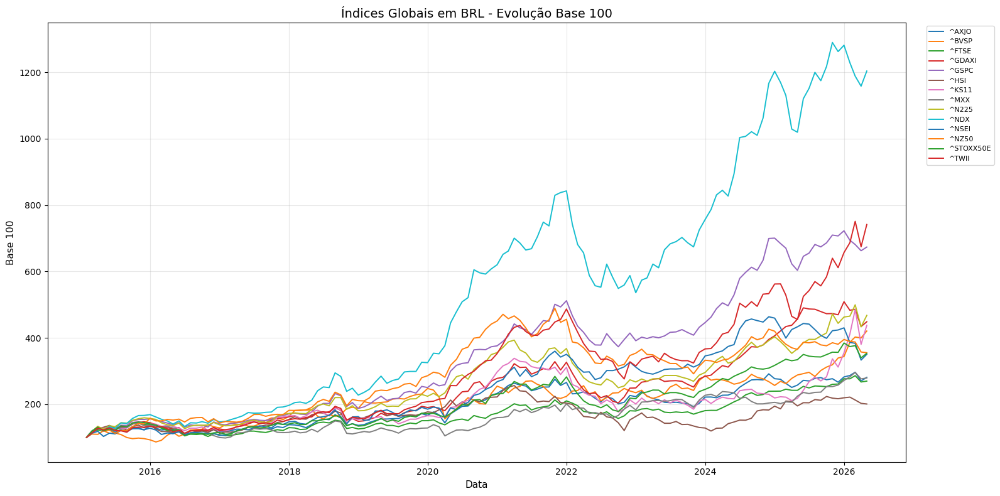

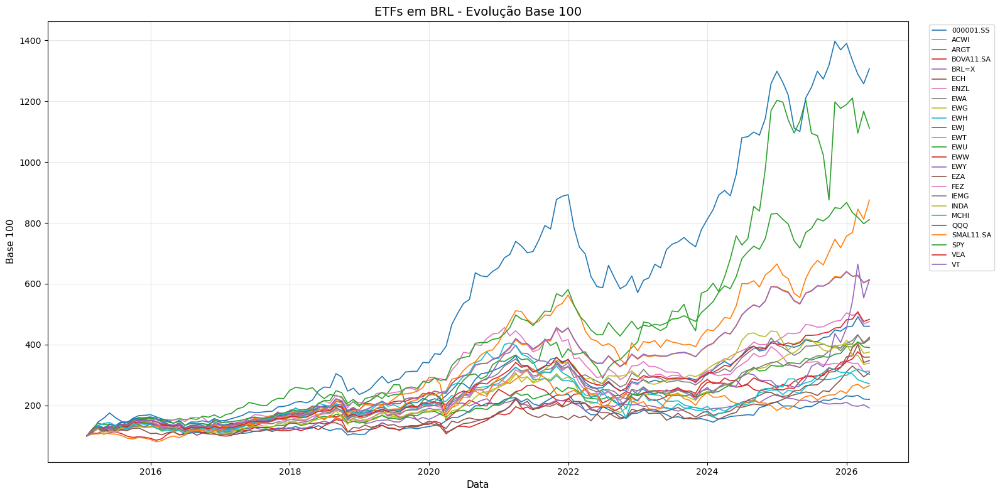

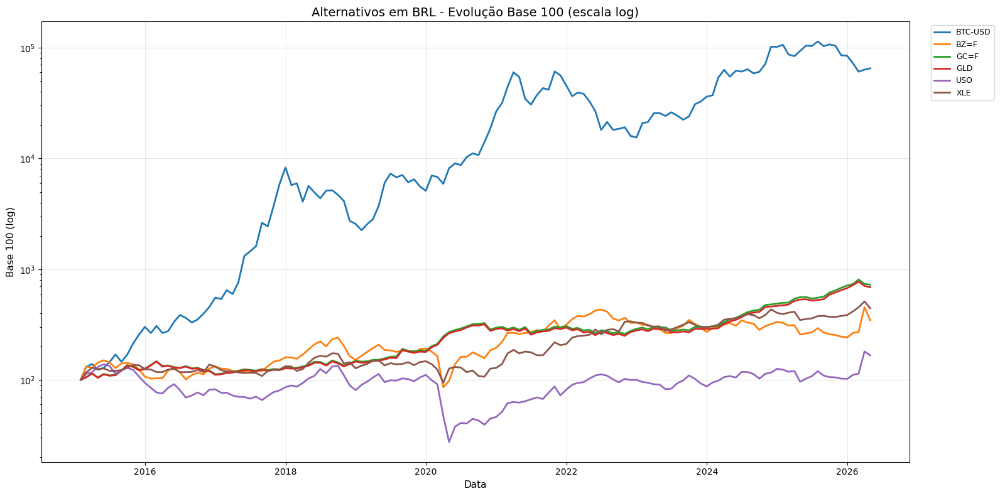

OK

[5/10] Gerando heatmaps, cluster e PCA sem misturar índices e ETFs...


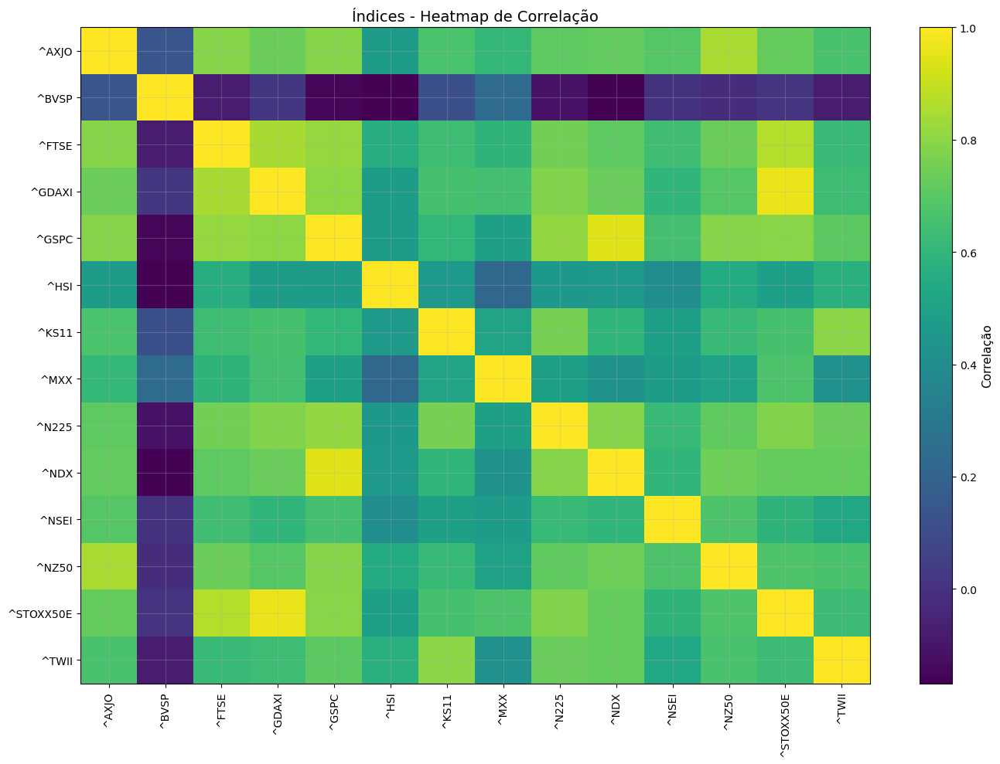

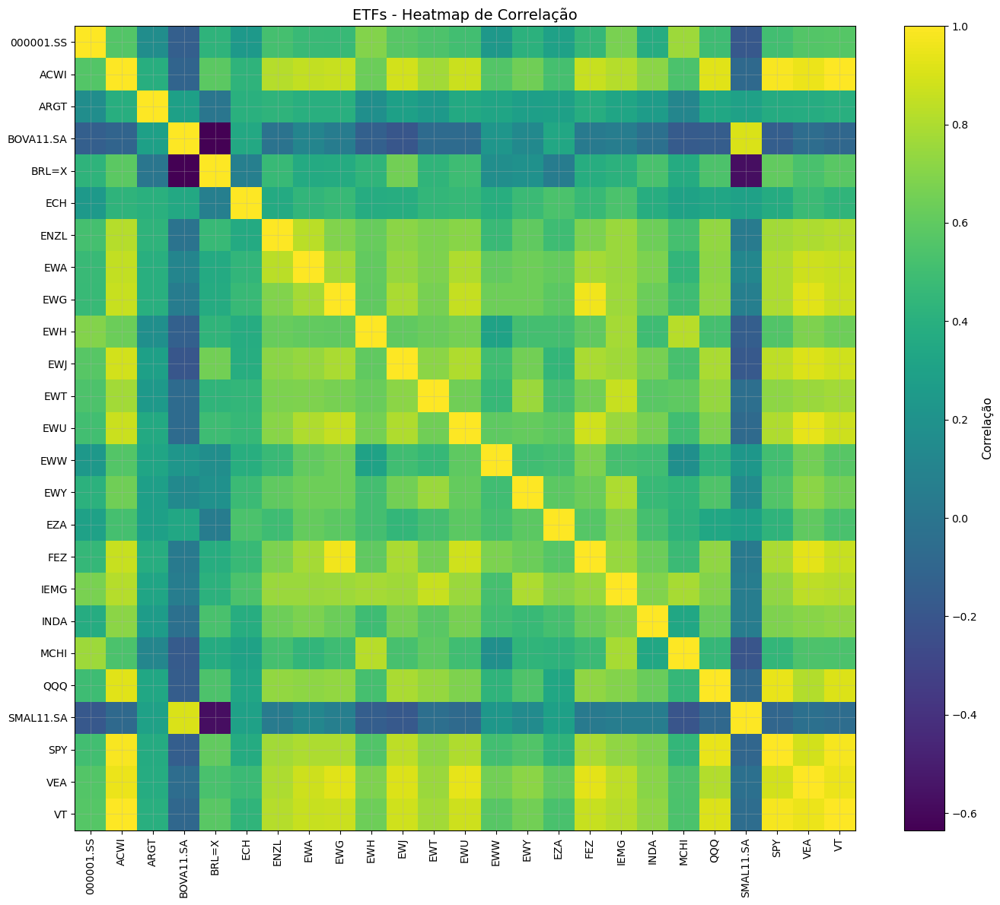

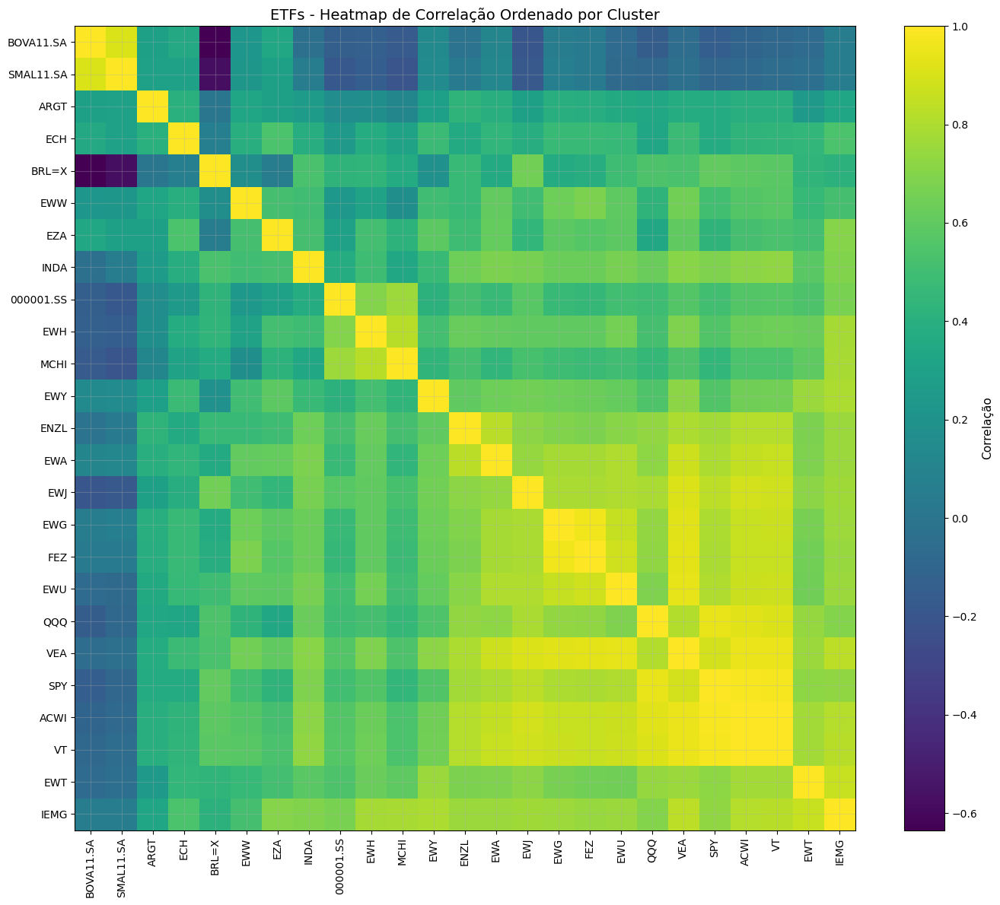

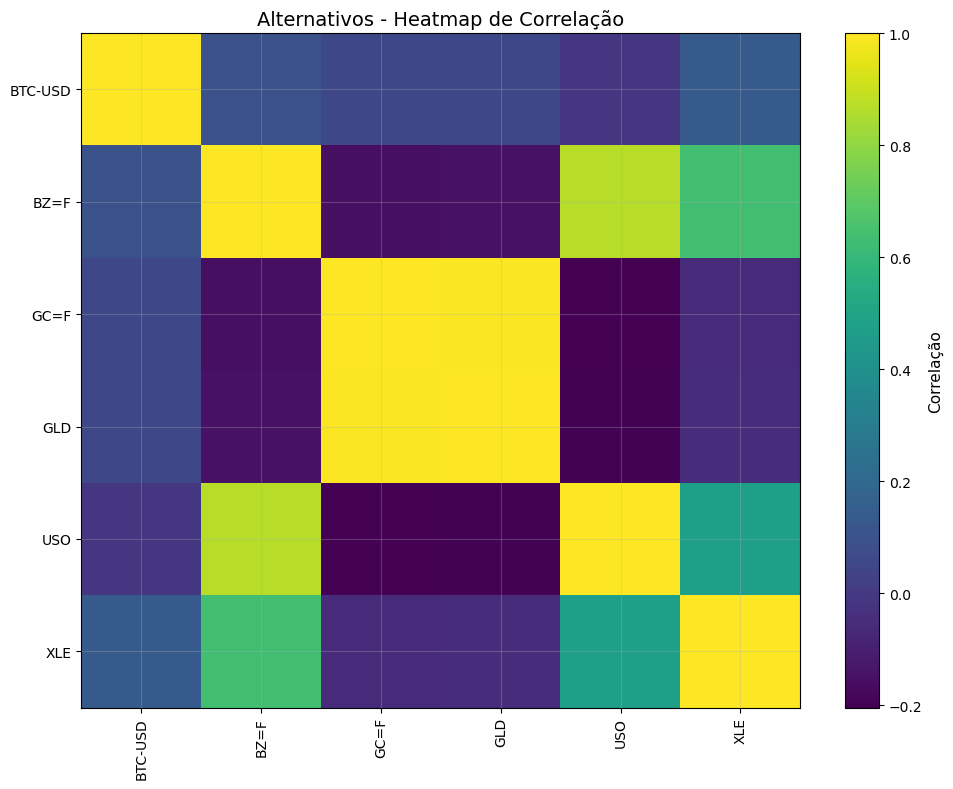

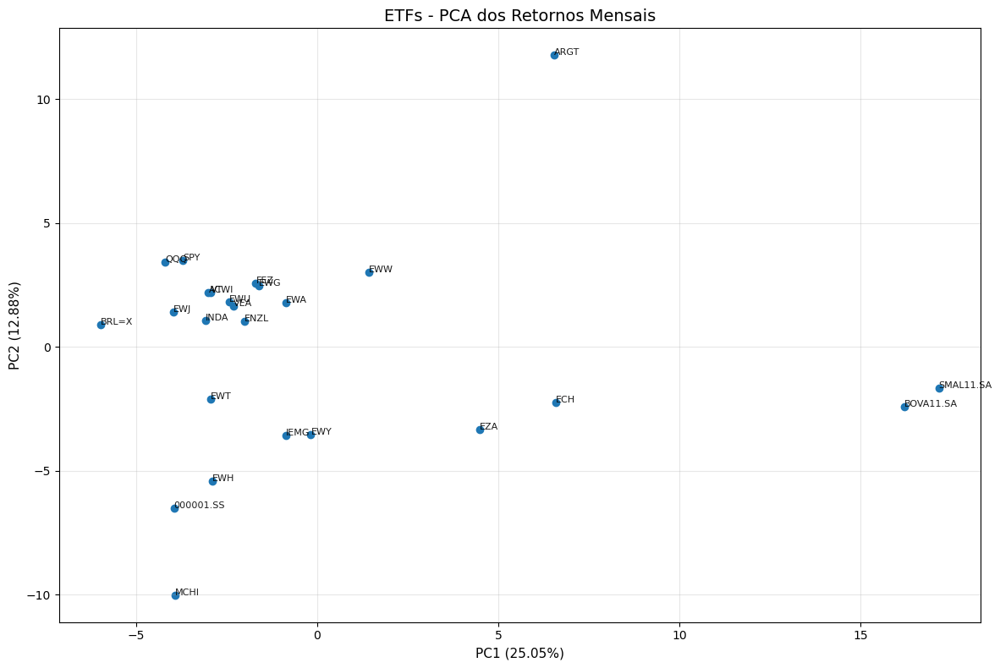

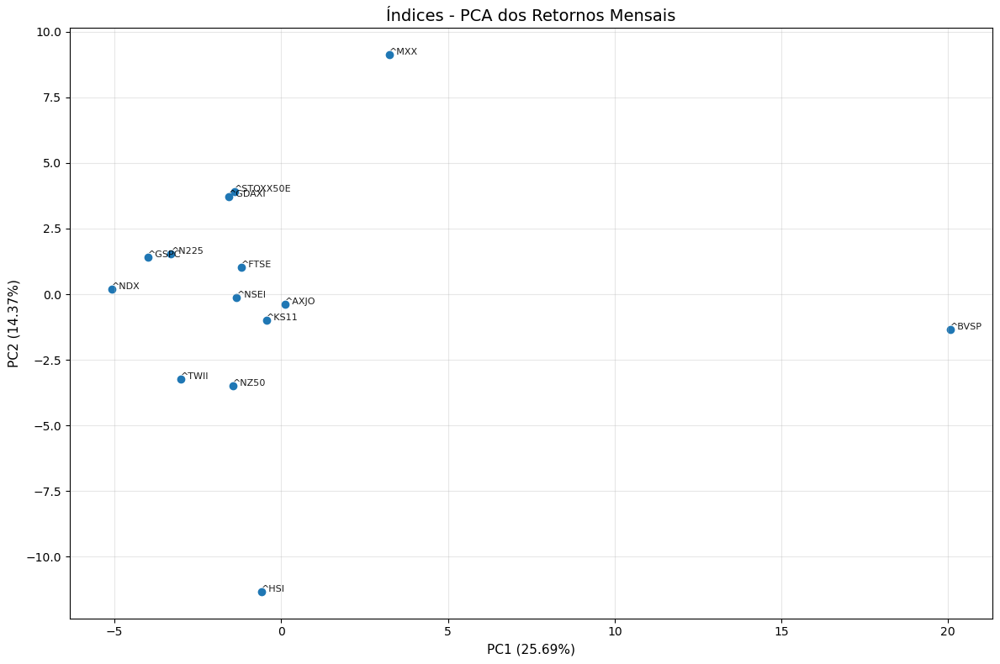

OK

[6/10] Gerando gráficos das famílias de estratégia por carteiras âncora...


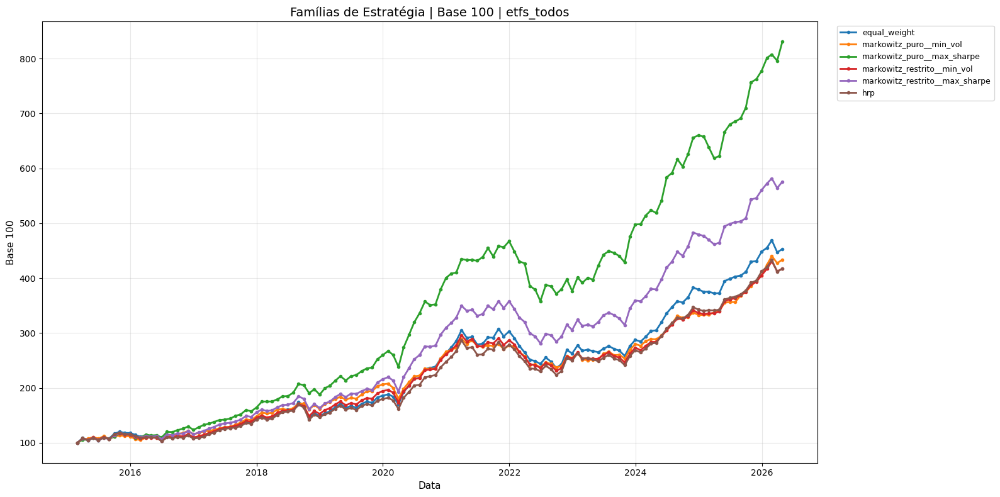

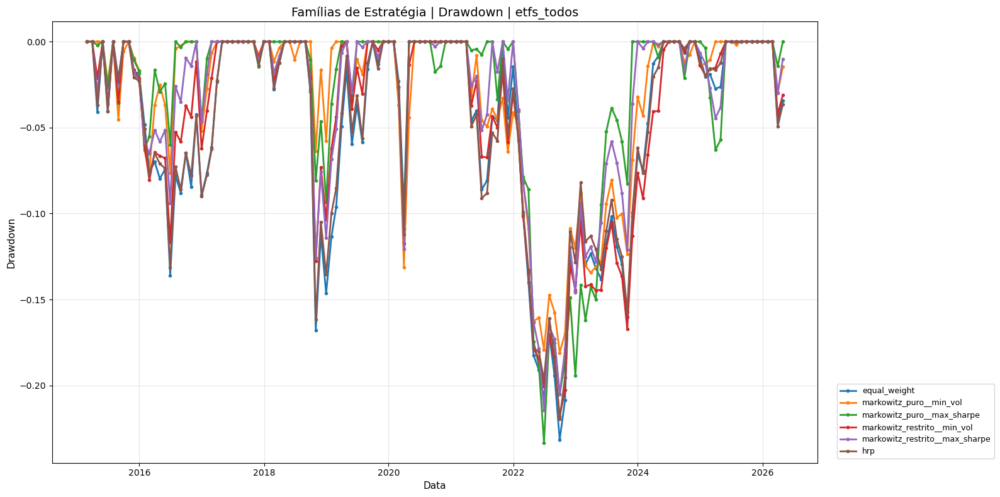

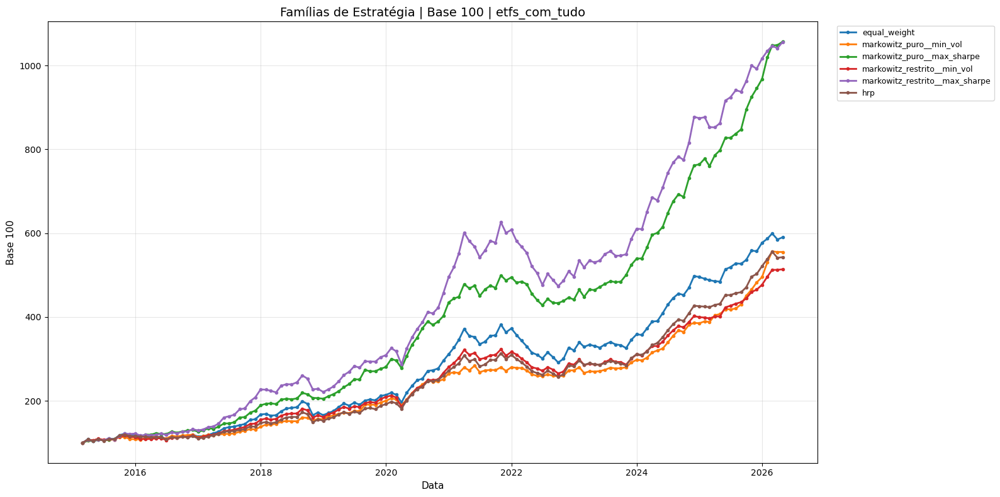

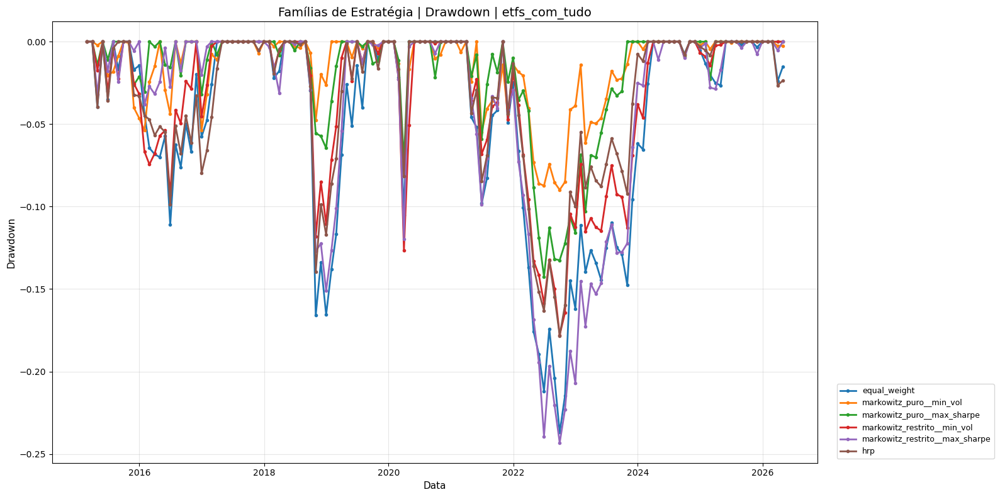

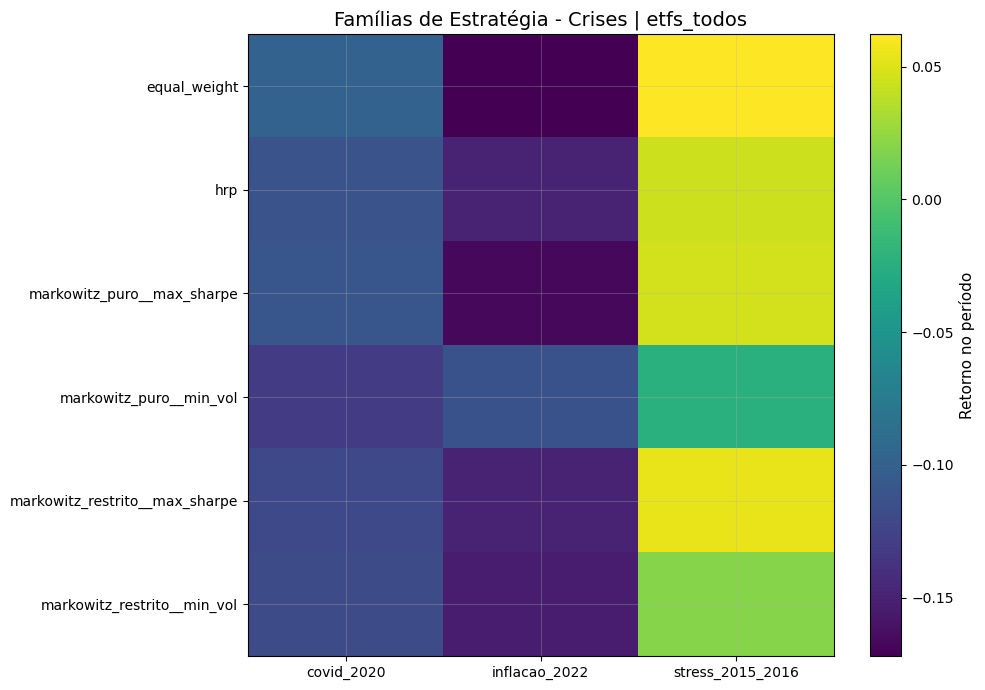

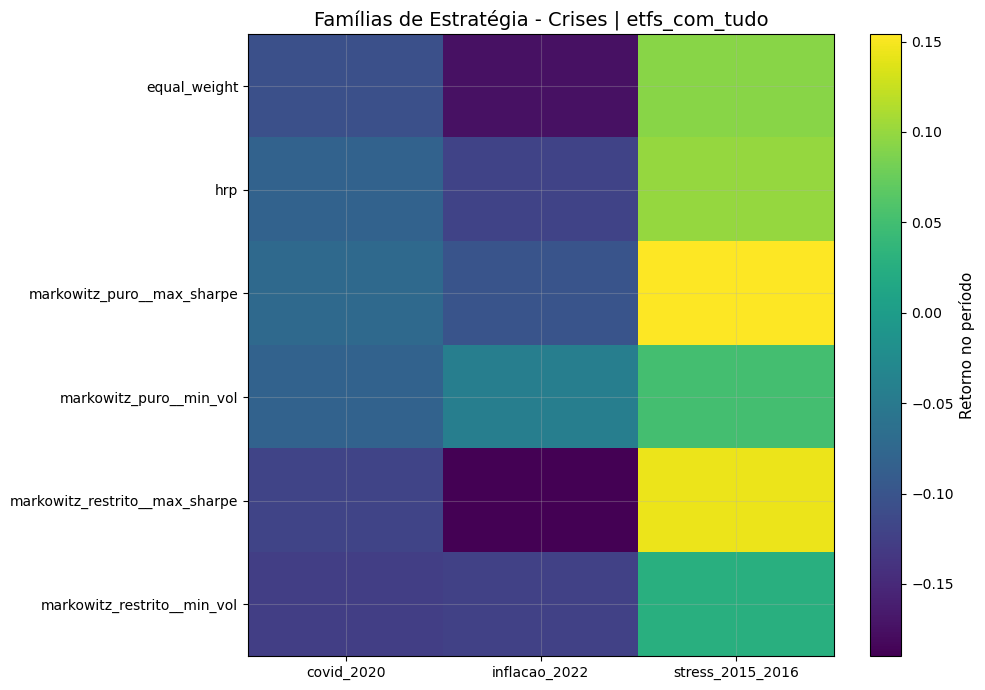

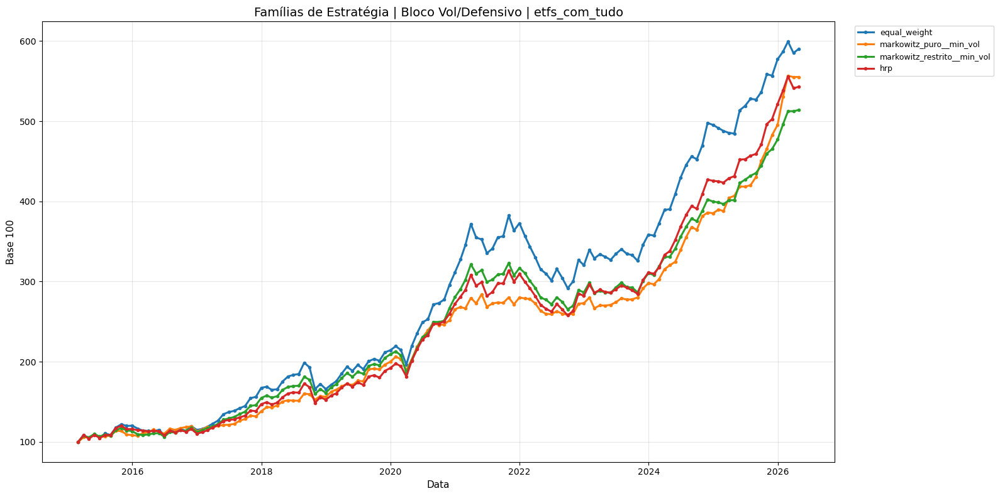

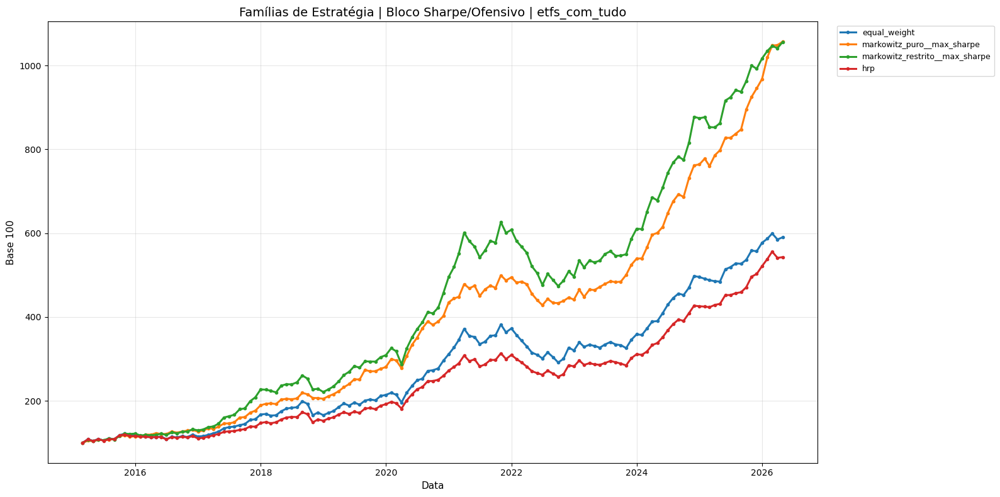

OK

[7/10] Gerando gráficos finais por família de estratégia...


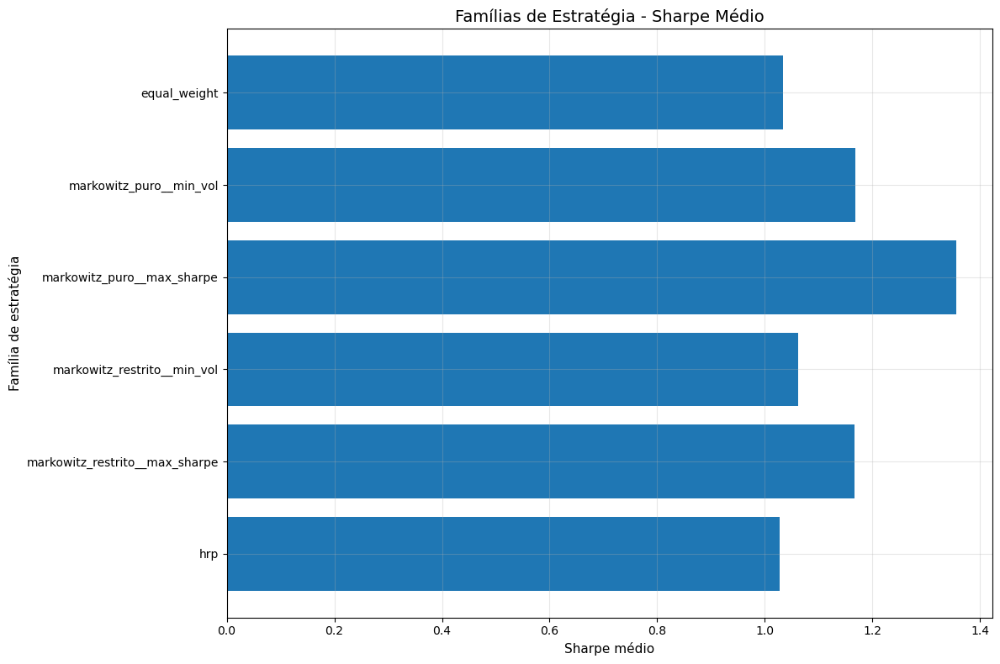

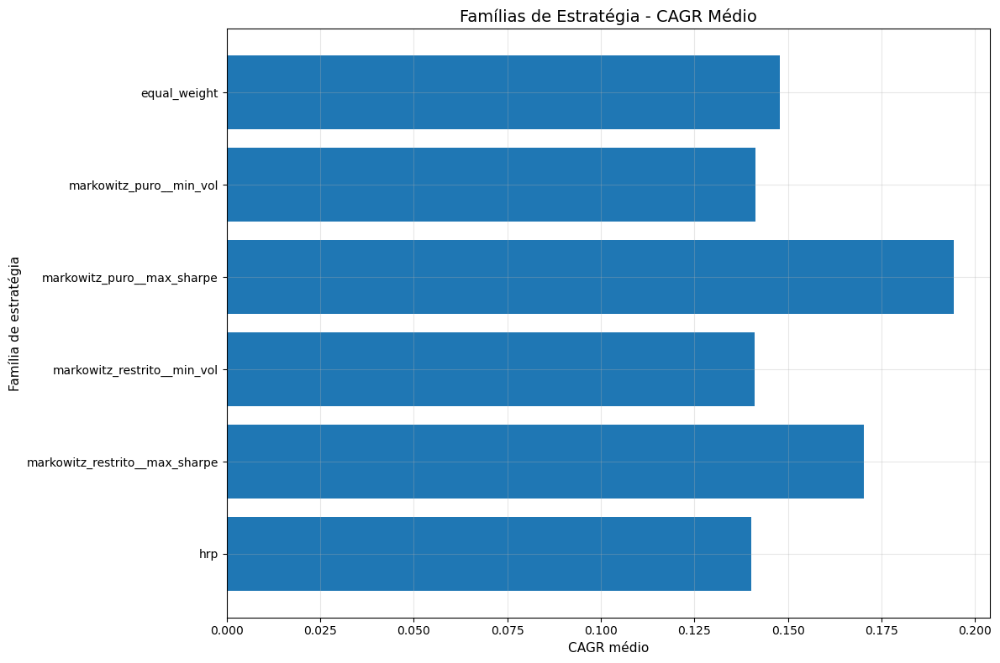

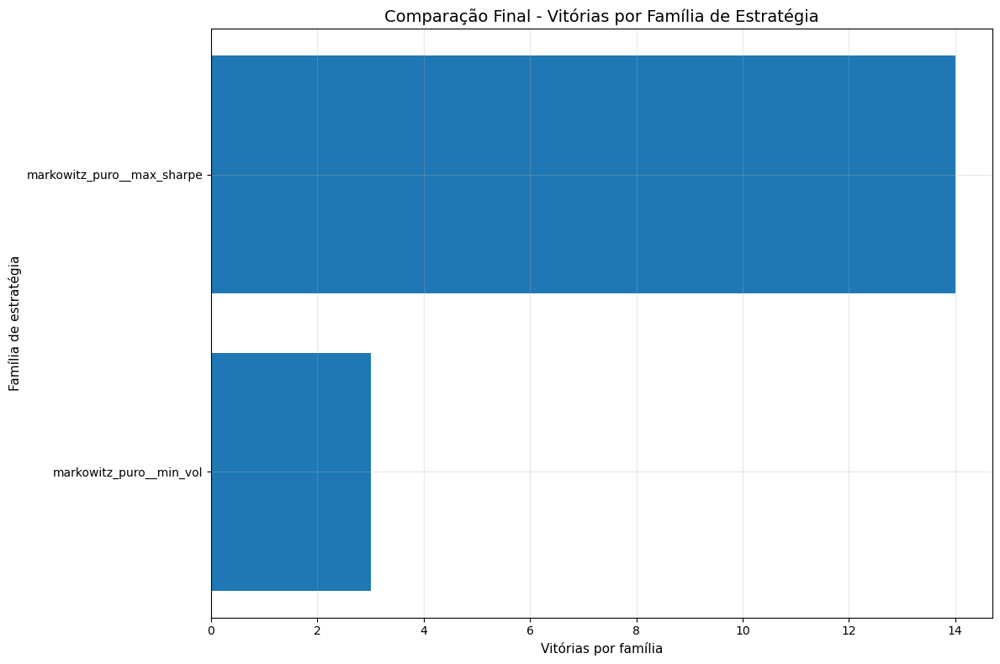

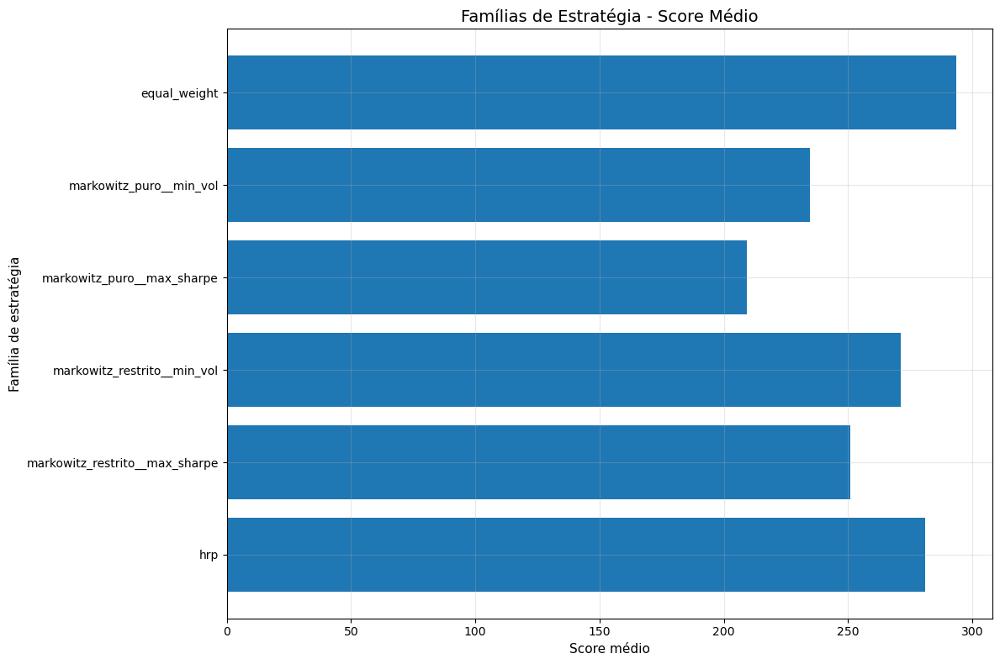

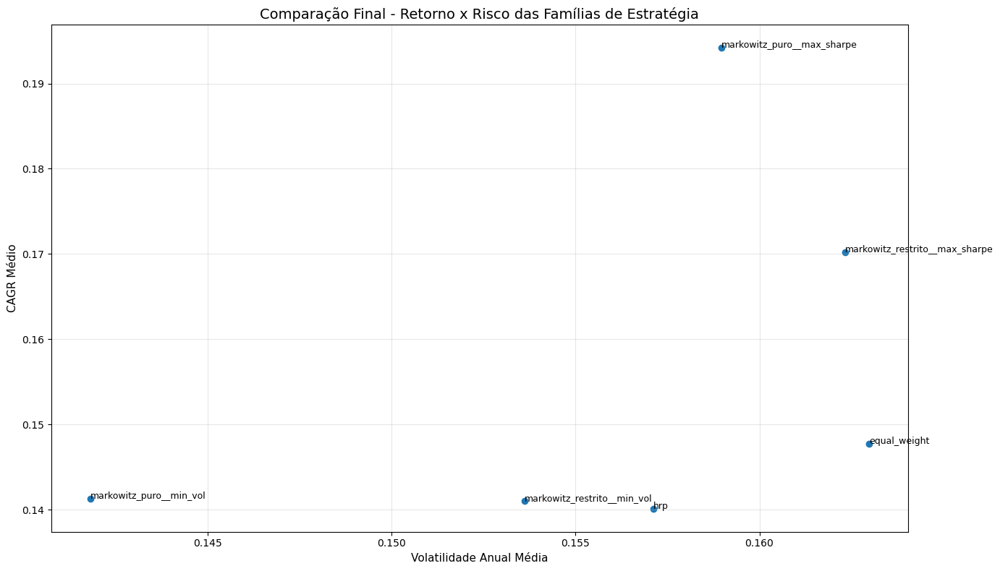

OK

[8/10] Gerando gráficos do impacto dos alternativos por família...


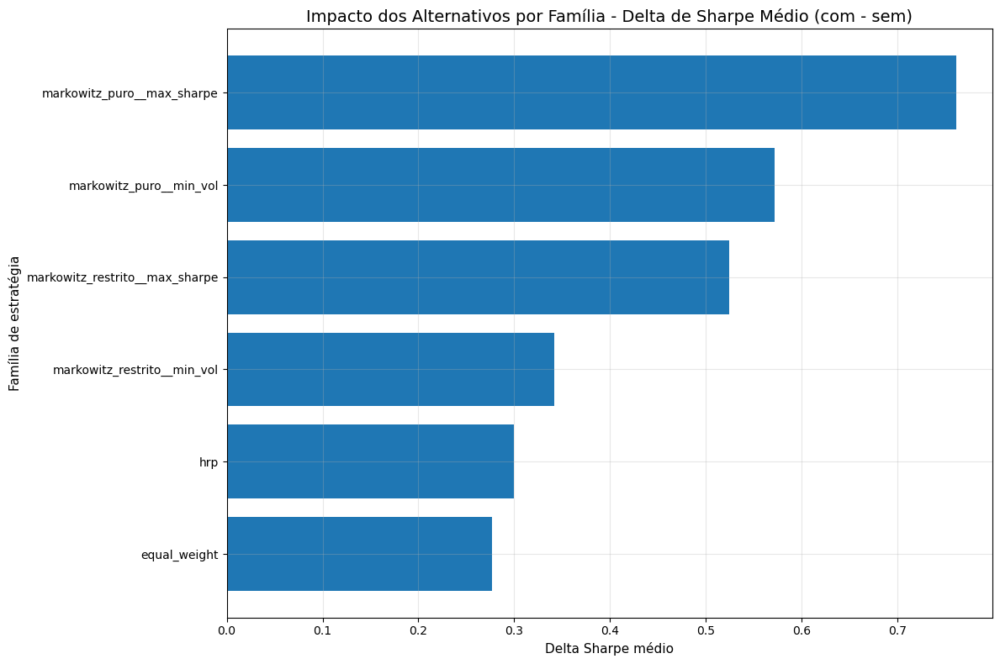

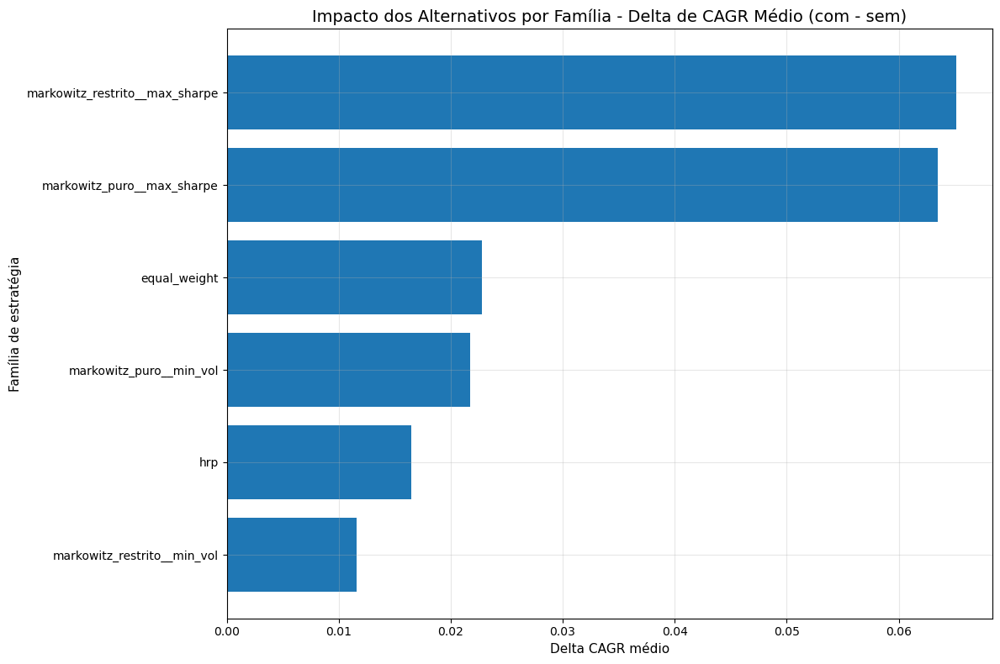

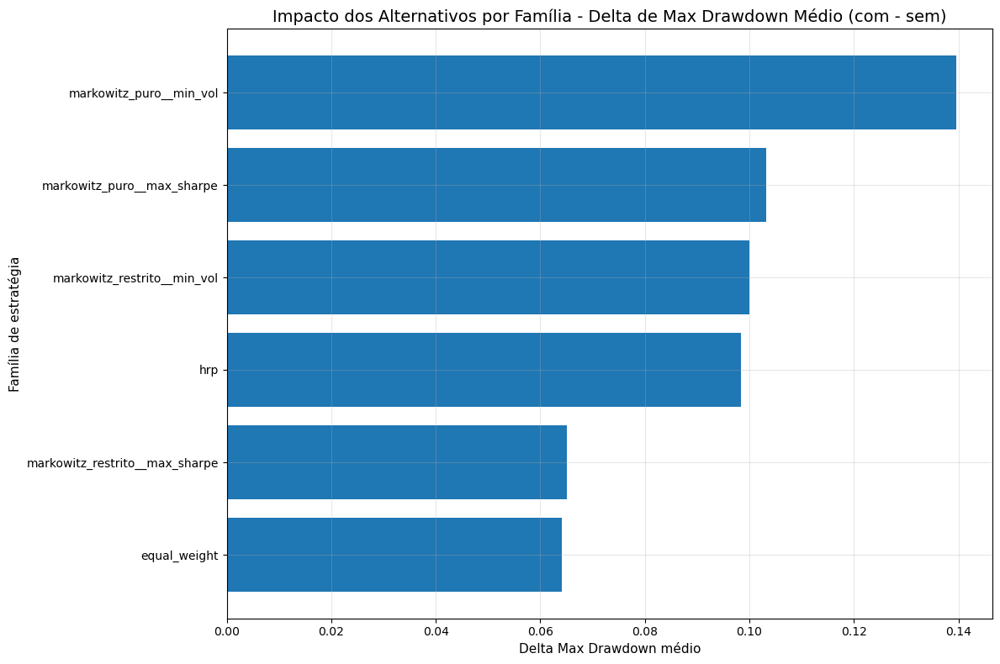

OK

[9/10] Salvando tabelas finais auxiliares e exibindo preview...

--- Classificação dos ativos ---


,ativo,classe_ativo
0,000001.SS,etf
1,ACWI,etf
2,ARGT,etf
3,BOVA11.SA,etf
4,BRL=X,etf
5,BTC-USD,alternativo
6,BZ=F,alternativo
7,ECH,etf
8,ENZL,etf
9,EWA,etf



--- Melhores estratégias por família ---


,carteira,metodo,tipo,estrategia,cenario_alternativos,detalhe_alternativos,grupo_familia,retorno_total,cagr,vol_anual,sharpe,sortino,max_drawdown,calmar,pct_meses_positivos,peso_max,top3_peso,hhi,n_efetivo_ativos,n_clusters_finais,rank_sharpe,rank_cagr,rank_mdd,rank_calmar,rank_vol,score_final,familia_estrategia,coluna_base100_metodo,label_familia
0,etfs_com_tudo,equal_weight,equal_weight,etfs_com_tudo,com_alternativos,ouro+btc+petroleo,alternativos,4.9021161221,0.1723009650,0.1440037467,1.2712133692,2.1985074749,-0.2369581081,0.7271368192,0.6296296296,NaN,NaN,NaN,NaN,NaN,29.0,25.0,48.0,44.0,38.0,184.0,equal_weight,etfs_com_tudo,equal_weight | etfs_com_tudo
1,etfs_com_tudo,markowitz_puro,min_vol,etfs_com_tudo__min_vol,com_alternativos,ouro+btc+petroleo,alternativos,4.5521877800,0.1659191377,0.0974189937,1.7111688717,2.8526874048,-0.0898325858,1.8469816517,0.6592592593,0.3637892987,0.7914068317,0.2616552850,3.8218222886,NaN,5.0,31.0,2.0,1.0,1.0,40.0,markowitz_puro__min_vol,etfs_com_tudo__min_vol,markowitz_puro__min_vol | etfs_com_tudo
2,etfs_com_tudo,markowitz_puro,max_sharpe,etfs_com_tudo__max_sharpe,com_alternativos,ouro+btc+petroleo,alternativos,9.5687891114,0.2351046368,0.1117069081,2.0327777330,4.3821376475,-0.1425450722,1.6493354222,0.7111111111,0.3986233275,0.8655149781,0.2867969934,3.4867869013,NaN,1.0,7.0,7.0,4.0,7.0,26.0,markowitz_puro__max_sharpe,etfs_com_tudo__max_sharpe,markowitz_puro__max_sharpe | etfs_com_tudo
3,etfs_com_tudo,markowitz_restrito,min_vol,etfs_com_tudo__min_vol,com_alternativos,ouro+btc+petroleo,alternativos,4.1394343810,0.1578813505,0.1206281651,1.3723922488,2.1566361445,-0.1778627316,0.8876584155,0.6740740741,0.1000000000,0.3000000000,0.0638635189,15.6583917865,NaN,19.0,37.0,12.0,19.0,14.0,101.0,markowitz_restrito__min_vol,etfs_com_tudo__min_vol,markowitz_restrito__min_vol | etfs_com_tudo
4,etfs_com_ouro_petroleo,markowitz_restrito,max_sharpe,etfs_com_ouro_petroleo__max_sharpe,com_alternativos,ouro+petroleo,alternativos,4.7446959428,0.1694834060,0.1270565907,1.3926441124,2.5257109750,-0.1810894061,0.9359101104,0.6518518519,0.1000000000,0.3000000000,0.0624612912,16.0099155993,NaN,17.0,29.0,17.0,13.0,18.0,94.0,markowitz_restrito__max_sharpe,etfs_com_ouro_petroleo__max_sharpe,markowitz_restrito__max_sharpe | etfs_com_ouro...
5,etfs_com_tudo,hrp,hrp,etfs_com_tudo__hrp,com_alternativos,ouro+btc+petroleo,alternativos,4.4285789941,0.1635707373,0.1252736942,1.3675499280,2.3435878553,-0.1782814516,0.9174860079,0.6444444444,0.1879465480,0.3038354689,0.0638537076,15.6607977335,27.0,20.0,33.0,13.0,16.0,17.0,99.0,hrp,etfs_com_tudo,hrp | etfs_com_tudo



--- Resumo por família de estratégia ---


,familia_estrategia,qtd_estrategias,retorno_total_medio,cagr_medio,vol_anual_media,sharpe_medio,sortino_medio,max_drawdown_medio,calmar_medio,peso_max_medio,top3_peso_medio,hhi_medio,n_efetivo_medio,score_medio
0,equal_weight,17,3.7653611892,0.1477287115,0.1629739415,1.0334647933,1.7513149511,-0.2723227189,0.5709684973,NaN,NaN,NaN,NaN,293.4705882353
1,markowitz_puro__min_vol,17,3.4529991237,0.1412748375,0.1418227821,1.1687931169,1.9430753996,-0.2147526507,0.8244865883,0.5230973117,0.8800475365,0.4336855949,2.9607050637,234.7058823529
2,markowitz_puro__max_sharpe,17,6.9474630686,0.1941808999,0.1589655670,1.3552292969,2.5679296984,-0.2461879846,0.9023838477,0.5812189132,0.9454697274,0.5036698347,2.4976573035,209.2352941176
3,markowitz_restrito__min_vol,17,3.4418872989,0.1410697928,0.1536188715,1.0612801232,1.7422685300,-0.2534129081,0.6057248671,0.2294117647,0.6000000000,0.2115856745,9.4048713488,271.4117647059
4,markowitz_restrito__max_sharpe,17,5.2719902330,0.1701801968,0.1623309297,1.1664939538,2.1127946284,-0.2685030979,0.6799496138,0.2294117647,0.6000000000,0.2114700054,9.4449376061,250.9411764706
5,hrp,17,3.4024391493,0.1401260527,0.1571152537,1.0280839803,1.7098487897,-0.2510666299,0.6045819161,0.2792400633,0.5786730137,0.2163548848,11.8472576034,280.9411764706



--- Resumo por cenário e família de estratégia ---


,familia_estrategia,cenario_alternativos,qtd_estrategias,retorno_total_medio,cagr_medio,vol_anual_media,sharpe_medio,sortino_medio,max_drawdown_medio,calmar_medio,score_medio
0,equal_weight,com_alternativos,7,4.3451745821,0.1611334180,0.1449914572,1.1962716545,2.0730939896,-0.2346406866,0.6860252978,208.2857142857
1,equal_weight,sem_alternativos,10,3.3594918141,0.1383454169,0.1755616805,0.9194999905,1.5260696242,-0.2987001416,0.4904287369,353.1000000000
2,hrp,com_alternativos,7,3.7665445623,0.1498347408,0.1345487639,1.2040993878,2.0412605807,-0.1931917274,0.7790822602,170.0000000000
3,hrp,sem_alternativos,10,3.1475653602,0.1333299710,0.1729117966,0.9048731950,1.4778605360,-0.2915790616,0.4824316753,358.6000000000
4,markowitz_puro__max_sharpe,com_alternativos,7,9.6259863821,0.2315243239,0.1275861819,1.8029020134,3.6640551279,-0.1854662238,1.3256965956,69.2857142857
5,markowitz_puro__max_sharpe,sem_alternativos,10,5.0724967490,0.1680405032,0.1809311366,1.0418583954,1.8006418977,-0.2886932172,0.6060649242,307.2000000000
6,markowitz_puro__min_vol,com_alternativos,7,3.9823352504,0.1540798429,0.1068039660,1.5053574143,2.5420738619,-0.1326751577,1.2659909292,87.1428571429
7,markowitz_puro__min_vol,sem_alternativos,10,3.0824638351,0.1323113337,0.1663359534,0.9331981087,1.5237764761,-0.2722068958,0.5154335497,338.0000000000
8,markowitz_restrito__max_sharpe,com_alternativos,7,7.6382627050,0.2084833584,0.1437240209,1.4747163585,2.8241889909,-0.2301853947,0.9049695357,129.4285714286
9,markowitz_restrito__max_sharpe,sem_alternativos,10,3.6155995026,0.1433679836,0.1753557658,0.9507382706,1.6148185746,-0.2953254902,0.5224356685,336.0000000000



--- Impacto dos alternativos por família ---


,familia_estrategia,sharpe_medio__com_alternativos,sharpe_medio__sem_alternativos,cagr_medio__com_alternativos,cagr_medio__sem_alternativos,max_drawdown_medio__com_alternativos,max_drawdown_medio__sem_alternativos,score_medio__com_alternativos,score_medio__sem_alternativos,delta_sharpe_medio,delta_cagr_medio,delta_max_drawdown_medio,delta_score_medio
0,equal_weight,1.1962716545,0.9194999905,0.1611334180,0.1383454169,-0.2346406866,-0.2987001416,208.2857142857,353.1,0.2767716641,0.0227880011,0.0640594551,-144.8142857143
1,markowitz_puro__min_vol,1.5053574143,0.9331981087,0.1540798429,0.1323113337,-0.1326751577,-0.2722068958,87.1428571429,338.0,0.5721593056,0.0217685091,0.1395317380,-250.8571428571
2,markowitz_puro__max_sharpe,1.8029020134,1.0418583954,0.2315243239,0.1680405032,-0.1854662238,-0.2886932172,69.2857142857,307.2,0.7610436180,0.0634838207,0.1032269934,-237.9142857143
3,markowitz_restrito__min_vol,1.2623625179,0.9205224469,0.1478700143,0.1363096377,-0.1946138887,-0.2945722216,159.1428571429,350.0,0.3418400710,0.0115603766,0.0999583329,-190.8571428571
4,markowitz_restrito__max_sharpe,1.4747163585,0.9507382706,0.2084833584,0.1433679836,-0.2301853947,-0.2953254902,129.4285714286,336.0,0.5239780878,0.0651153748,0.0651400955,-206.5714285714
5,hrp,1.2040993878,0.9048731950,0.1498347408,0.1333299710,-0.1931917274,-0.2915790616,170.0000000000,358.6,0.2992261928,0.0165047698,0.0983873342,-188.6000000000



--- Vitórias por família de estratégia ---


,familia_estrategia,vitorias_em_familias
0,markowitz_puro__max_sharpe,14
1,markowitz_puro__min_vol,3



--- Base 100 por família na âncora etfs_todos ---


,equal_weight,markowitz_puro__min_vol,markowitz_puro__max_sharpe,markowitz_restrito__min_vol,markowitz_restrito__max_sharpe,hrp
data,,,,,,
2015-02-28,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000
2015-03-31,108.9537485516,106.1562442422,105.7021075847,107.7581219614,108.0797767672,108.4873137813
2015-04-30,104.4835273065,107.5171465521,105.4843221958,105.4899171783,104.9224242996,104.4836156780
2015-05-31,109.0449254306,110.3354258942,108.7261157348,109.6108168983,108.9198383998,108.6566601844
2015-06-30,104.6065734517,107.7107366919,105.8178987381,105.6735053317,104.9421569369,104.2611942573



--- Drawdown por família na âncora etfs_todos ---


,equal_weight,markowitz_puro__min_vol,markowitz_puro__max_sharpe,markowitz_restrito__min_vol,markowitz_restrito__max_sharpe,hrp
data,,,,,,
2015-02-28,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000
2015-03-31,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000
2015-04-30,-0.0410286136,0.0000000000,-0.0020603694,-0.0210490378,-0.0292131661,-0.0369047584
2015-05-31,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000
2015-06-30,-0.0407020497,-0.0237882727,-0.0267480998,-0.0359208304,-0.0365193478,-0.0404527980



--- Base 100 por família na âncora etfs_com_tudo ---


,equal_weight,markowitz_puro__min_vol,markowitz_puro__max_sharpe,markowitz_restrito__min_vol,markowitz_restrito__max_sharpe,hrp
data,,,,,,
2015-02-28,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000,100.0000000000
2015-03-31,108.7622189536,105.7947394220,105.2043797316,107.5530642688,107.2100896996,108.2799214860
2015-04-30,104.4374676915,105.5713374970,103.7209990516,105.6912930708,103.7873180182,103.9934261089
2015-05-31,109.3210540843,108.8789978290,107.2391209342,109.8773401398,107.9105831219,108.7836064600
2015-06-30,105.4974661118,106.6655067812,106.0809948916,106.5796131030,105.9763482145,104.9085962369



--- Drawdown por família na âncora etfs_com_tudo ---


,equal_weight,markowitz_puro__min_vol,markowitz_puro__max_sharpe,markowitz_restrito__min_vol,markowitz_restrito__max_sharpe,hrp
data,,,,,,
2015-02-28,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000
2015-03-31,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000
2015-04-30,-0.0397633600,-0.0021116544,-0.0140999898,-0.0173102571,-0.0319258354,-0.0395871674
2015-05-31,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000
2015-06-30,-0.0349757693,-0.0203298257,-0.0107994735,-0.0300128037,-0.0179244227,-0.0356212701



--- Crises por família nas âncoras ---


,carteira_ancora,crise,familia_estrategia,retorno_periodo
0,etfs_todos,stress_2015_2016,equal_weight,0.0622044968
1,etfs_todos,stress_2015_2016,markowitz_puro__min_vol,-0.0229493826
2,etfs_todos,stress_2015_2016,markowitz_puro__max_sharpe,0.0463125378
3,etfs_todos,stress_2015_2016,markowitz_restrito__min_vol,0.0192023738
4,etfs_todos,stress_2015_2016,markowitz_restrito__max_sharpe,0.0540198110
5,etfs_todos,stress_2015_2016,hrp,0.0444067046
6,etfs_todos,covid_2020,equal_weight,-0.0979664922
7,etfs_todos,covid_2020,markowitz_puro__min_vol,-0.1314095871
8,etfs_todos,covid_2020,markowitz_puro__max_sharpe,-0.1089427831
9,etfs_todos,covid_2020,markowitz_restrito__min_vol,-0.1173011781



[10/10] Etapa concluída.

------------------------------------------------------------------------------------------
RESUMO DOS ARQUIVOS GERADOS
------------------------------------------------------------------------------------------
Índices globais - base100............: resultados/graficos/final_indices_globais_base100.png
ETFs globais - base100...............: resultados/graficos/final_etfs_globais_base100.png
Alternativos - base100 log...........: resultados/graficos/final_alternativos_base100_log.png
Índices - correlação.................: resultados/graficos/final_indices_heatmap_correlacao.png
ETFs - correlação....................: resultados/graficos/final_etfs_heatmap_correlacao.png
ETFs - cluster.......................: resultados/graficos/final_etfs_cluster_heatmap.png
Alternativos - correlação............: resultados/graficos/final_alternativos_heatmap_correlacao.png
ETFs - PCA...........................: resultados/graficos/final_etfs_pca.png
Índices - PCA...............

In [33]:
%%time
# ==========================================================================================
# ETAPA 32 - GRÁFICOS FINAIS CONSOLIDADOS
#             (SEPARANDO ÍNDICES, ETFS E ALTERNATIVOS)
#             (SEPARANDO FAMÍLIAS DE ESTRATÉGIA: SHARPE E VOL COMO FAMÍLIAS DISTINTAS)
#             (COMPARAÇÃO DAS FAMÍLIAS EM CARTEIRAS-ÂNCORA, EM FREQUÊNCIA MENSAL)
# ==========================================================================================

print("=" * 90)
print("INICIANDO ETAPA 32 - GRÁFICOS FINAIS CONSOLIDADOS")
print("=" * 90)

# ==========================================================================================
# [1/10] VALIDAÇÃO
# ==========================================================================================

print("\n[1/10] Validando...")

objetos_necessarios = [
    "df_adj_close_brl_mensal",
    "df_carteiras_base100",
    "df_carteiras_markowitz_puro_base100",
    "df_carteiras_markowitz_restrito_base100",
    "df_carteiras_hrp_base100",
    "df_comparacao_equivalente",
]

faltando = [obj for obj in objetos_necessarios if obj not in globals()]
if faltando:
    raise NameError(f"Faltando no ambiente: {faltando}")

if not isinstance(df_adj_close_brl_mensal, pd.DataFrame):
    raise TypeError("df_adj_close_brl_mensal precisa ser um DataFrame.")

if not isinstance(df_carteiras_base100, pd.DataFrame):
    raise TypeError("df_carteiras_base100 precisa ser um DataFrame.")

if not isinstance(df_carteiras_markowitz_puro_base100, pd.DataFrame):
    raise TypeError("df_carteiras_markowitz_puro_base100 precisa ser um DataFrame.")

if not isinstance(df_carteiras_markowitz_restrito_base100, pd.DataFrame):
    raise TypeError("df_carteiras_markowitz_restrito_base100 precisa ser um DataFrame.")

if not isinstance(df_carteiras_hrp_base100, pd.DataFrame):
    raise TypeError("df_carteiras_hrp_base100 precisa ser um DataFrame.")

if not isinstance(df_comparacao_equivalente, pd.DataFrame):
    raise TypeError("df_comparacao_equivalente precisa ser um DataFrame.")

if df_adj_close_brl_mensal.empty:
    raise ValueError("df_adj_close_brl_mensal está vazio.")

if df_carteiras_base100.empty:
    raise ValueError("df_carteiras_base100 está vazio.")

if df_carteiras_markowitz_puro_base100.empty:
    raise ValueError("df_carteiras_markowitz_puro_base100 está vazio.")

if df_carteiras_markowitz_restrito_base100.empty:
    raise ValueError("df_carteiras_markowitz_restrito_base100 está vazio.")

if df_carteiras_hrp_base100.empty:
    raise ValueError("df_carteiras_hrp_base100 está vazio.")

if df_comparacao_equivalente.empty:
    raise ValueError("df_comparacao_equivalente está vazio.")

colunas_necessarias_cmp = [
    "carteira",
    "metodo",
    "tipo",
    "estrategia",
    "retorno_total",
    "cagr",
    "vol_anual",
    "sharpe",
    "sortino",
    "max_drawdown",
    "calmar",
    "score_final",
    "cenario_alternativos",
]
faltando_cmp = [c for c in colunas_necessarias_cmp if c not in df_comparacao_equivalente.columns]
if faltando_cmp:
    raise ValueError(f"Colunas ausentes em df_comparacao_equivalente: {faltando_cmp}")

os.makedirs("resultados/graficos", exist_ok=True)
os.makedirs("resultados/tabelas", exist_ok=True)

print("OK")

# ==========================================================================================
# [2/10] DEFININDO FUNÇÕES E PREPARANDO BASES
# ==========================================================================================

print("\n[2/10] Definindo funções e preparando bases...")

def normalizar_base100_primeiro_valido(serie):
    serie = pd.to_numeric(serie, errors="coerce")
    s = serie.dropna()
    if s.empty:
        return pd.Series(index=serie.index, dtype=float)
    return serie / s.iloc[0] * 100


def classificar_familia_estrategia(row):
    metodo = str(row["metodo"])
    tipo = str(row["tipo"])

    if metodo == "equal_weight":
        return "equal_weight"

    if metodo == "hrp":
        return "hrp"

    return f"{metodo}__{tipo}"


def obter_coluna_base100(row):
    metodo = str(row["metodo"])
    carteira = str(row["carteira"])
    tipo = str(row["tipo"])

    if metodo == "equal_weight":
        return carteira

    if metodo == "hrp":
        return carteira

    return f"{carteira}__{tipo}"


def obter_serie_base100_familia(familia_estrategia, carteira):
    familia = str(familia_estrategia)
    carteira = str(carteira)

    if familia == "equal_weight":
        if carteira in df_carteiras_base100.columns:
            return df_carteiras_base100[carteira].copy()
        return None

    if familia == "hrp":
        if carteira in df_carteiras_hrp_base100.columns:
            return df_carteiras_hrp_base100[carteira].copy()
        return None

    if familia.startswith("markowitz_puro__"):
        tipo = familia.split("__", 2)[-1]
        coluna = f"{carteira}__{tipo}"
        if coluna in df_carteiras_markowitz_puro_base100.columns:
            return df_carteiras_markowitz_puro_base100[coluna].copy()
        return None

    if familia.startswith("markowitz_restrito__"):
        tipo = familia.split("__", 2)[-1]
        coluna = f"{carteira}__{tipo}"
        if coluna in df_carteiras_markowitz_restrito_base100.columns:
            return df_carteiras_markowitz_restrito_base100[coluna].copy()
        return None

    return None


def salvar_tabela_csv_html(df, nome_base, index=False):
    caminho_csv = f"resultados/tabelas/{nome_base}.csv"
    caminho_html = f"resultados/tabelas/{nome_base}.html"

    df.to_csv(caminho_csv, index=index, sep=",", decimal=".")
    df.to_html(caminho_html, index=index, border=0, justify="center")

    return caminho_csv, caminho_html


def calcular_drawdown_df(df_base100):
    return df_base100.div(df_base100.cummax()).sub(1.0)


def calcular_retorno_periodo_base100(serie_base100, data_inicio, data_fim):
    serie = serie_base100.loc[
        (serie_base100.index >= data_inicio) & (serie_base100.index <= data_fim)
    ].dropna()

    if len(serie) < 2:
        return np.nan

    return float(serie.iloc[-1] / serie.iloc[0] - 1)


def classificar_tipo_ativo(coluna):
    col = str(coluna).upper()

    alternativos_exatos = {
        "BTC-USD", "GC=F", "SI=F", "CL=F", "BZ=F", "NG=F",
        "GLD", "IAU", "SLV", "USO", "DBO", "XLE", "IBIT", "FBTC"
    }

    if col.startswith("^"):
        return "indice"

    if col in alternativos_exatos:
        return "alternativo"

    if "BTC" in col:
        return "alternativo"

    if col.endswith("=F"):
        return "alternativo"

    return "etf"


def preparar_heatmap_cluster(df_retornos_sub):
    if df_retornos_sub is None or df_retornos_sub.shape[1] < 2:
        return None, None

    matriz_correlacao = df_retornos_sub.corr().copy()

    dist = np.sqrt(np.clip((1 - matriz_correlacao) / 2, 0, None))
    np.fill_diagonal(dist.values, 0.0)

    condensed_dist = squareform(dist.values, checks=False)
    linkage_matrix = linkage(condensed_dist, method="single")
    ordem_idx = leaves_list(linkage_matrix).tolist()
    ordem_cols = matriz_correlacao.columns[ordem_idx].tolist()

    matriz_cluster = matriz_correlacao.loc[ordem_cols, ordem_cols].copy()

    return matriz_correlacao, matriz_cluster


def preparar_pca(df_retornos_sub):
    if df_retornos_sub is None or df_retornos_sub.shape[1] < 2:
        return None, None

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(df_retornos_sub.T)

    pca = PCA(n_components=2, random_state=42)
    X_pca = pca.fit_transform(X_scaled)

    df_pca = pd.DataFrame({
        "ativo": df_retornos_sub.columns.tolist(),
        "pc1": X_pca[:, 0],
        "pc2": X_pca[:, 1],
    })

    return df_pca, pca


def preparar_df_ancora_mensal(carteira_ancora, familias_presentes):
    series_plot = {}

    for familia in familias_presentes:
        serie = obter_serie_base100_familia(familia, carteira_ancora)

        if serie is None:
            continue

        s = pd.to_numeric(serie, errors="coerce").dropna()
        if s.empty:
            continue

        series_plot[familia] = s

    if len(series_plot) == 0:
        return None

    df_plot = pd.DataFrame(series_plot).sort_index()

    # Tudo para frequência mensal e comparação no mesmo ponto inicial comum
    df_plot_m = df_plot.resample("M").last()
    df_plot_m = df_plot_m.dropna(how="any").copy()

    if df_plot_m.empty:
        return None

    df_plot_m = df_plot_m / df_plot_m.iloc[0] * 100
    return df_plot_m


ordem_familias_estrategia = [
    "equal_weight",
    "markowitz_puro__min_vol",
    "markowitz_puro__max_sharpe",
    "markowitz_restrito__min_vol",
    "markowitz_restrito__max_sharpe",
    "hrp",
]

df_assets_prices = df_adj_close_brl_mensal.copy()
df_assets_prices.index = pd.to_datetime(df_assets_prices.index)
df_assets_prices = df_assets_prices.sort_index()

df_assets_base100 = df_assets_prices.apply(normalizar_base100_primeiro_valido, axis=0)
df_assets_retornos = df_assets_prices.pct_change(fill_method=None)

colunas_assets_validas = [
    c for c in df_assets_retornos.columns
    if df_assets_retornos[c].dropna().shape[0] >= 24
]

df_assets_retornos_validos = df_assets_retornos[colunas_assets_validas].copy()
df_assets_base100_validos = df_assets_base100[colunas_assets_validas].copy()

if df_assets_retornos_validos.shape[1] < 2:
    raise ValueError("Base insuficiente para os gráficos finais dos ativos.")

df_classificacao_ativos = pd.DataFrame({
    "ativo": df_assets_retornos_validos.columns.tolist(),
})
df_classificacao_ativos["classe_ativo"] = df_classificacao_ativos["ativo"].apply(classificar_tipo_ativo)

indices_cols = df_classificacao_ativos.loc[
    df_classificacao_ativos["classe_ativo"] == "indice", "ativo"
].tolist()

etfs_cols = df_classificacao_ativos.loc[
    df_classificacao_ativos["classe_ativo"] == "etf", "ativo"
].tolist()

alternativos_cols = df_classificacao_ativos.loc[
    df_classificacao_ativos["classe_ativo"] == "alternativo", "ativo"
].tolist()

df_indices_base100 = (
    df_assets_base100_validos[indices_cols].copy()
    if len(indices_cols) > 0
    else pd.DataFrame(index=df_assets_base100_validos.index)
)

df_etfs_base100 = (
    df_assets_base100_validos[etfs_cols].copy()
    if len(etfs_cols) > 0
    else pd.DataFrame(index=df_assets_base100_validos.index)
)

df_alternativos_base100 = (
    df_assets_base100_validos[alternativos_cols].copy()
    if len(alternativos_cols) > 0
    else pd.DataFrame(index=df_assets_base100_validos.index)
)

df_indices_retornos = (
    df_assets_retornos_validos[indices_cols].dropna(axis=0, how="any").copy()
    if len(indices_cols) > 0
    else pd.DataFrame()
)

df_etfs_retornos = (
    df_assets_retornos_validos[etfs_cols].dropna(axis=0, how="any").copy()
    if len(etfs_cols) > 0
    else pd.DataFrame()
)

df_alternativos_retornos = (
    df_assets_retornos_validos[alternativos_cols].dropna(axis=0, how="any").copy()
    if len(alternativos_cols) > 0
    else pd.DataFrame()
)

matriz_correlacao_indices, matriz_cluster_indices = preparar_heatmap_cluster(df_indices_retornos)
matriz_correlacao_etfs, matriz_cluster_etfs = preparar_heatmap_cluster(df_etfs_retornos)
matriz_correlacao_alternativos, matriz_cluster_alternativos = preparar_heatmap_cluster(df_alternativos_retornos)

df_pca_etfs, pca_etfs = preparar_pca(df_etfs_retornos)
df_pca_indices, pca_indices = preparar_pca(df_indices_retornos)

df_cmp_final = df_comparacao_equivalente.copy()
df_cmp_final["familia_estrategia"] = df_cmp_final.apply(classificar_familia_estrategia, axis=1)
df_cmp_final["coluna_base100_metodo"] = df_cmp_final.apply(obter_coluna_base100, axis=1)

familias_presentes = [
    fam for fam in ordem_familias_estrategia
    if fam in df_cmp_final["familia_estrategia"].unique().tolist()
]

print("OK")
print(f"Ativos globais válidos................: {df_assets_retornos_validos.shape[1]}")
print(f"Índices válidos.......................: {len(indices_cols)}")
print(f"ETFs válidos..........................: {len(etfs_cols)}")
print(f"Alternativos válidos..................: {len(alternativos_cols)}")
print(f"Meses válidos para cluster/PCA........: {df_assets_retornos_validos.shape[0]}")
print(f"Estratégias consolidadas..............: {len(df_cmp_final)}")
print(f"Famílias de estratégia................: {familias_presentes}")

# ==========================================================================================
# [3/10] DEFININDO TABELAS-CHAVE COM FAMÍLIAS DE ESTRATÉGIA SEPARADAS
# ==========================================================================================

print("\n[3/10] Definindo tabelas-chave com famílias de estratégia separadas...")

df_melhores_estrategias_por_familia = (
    df_cmp_final
    .sort_values(
        by=["familia_estrategia", "score_final", "sharpe", "cagr", "max_drawdown"],
        ascending=[True, True, False, False, False]
    )
    .groupby("familia_estrategia", as_index=False)
    .head(1)
    .reset_index(drop=True)
)

df_melhores_estrategias_por_familia["familia_estrategia"] = pd.Categorical(
    df_melhores_estrategias_por_familia["familia_estrategia"],
    categories=familias_presentes,
    ordered=True
)

df_melhores_estrategias_por_familia = (
    df_melhores_estrategias_por_familia
    .sort_values("familia_estrategia")
    .reset_index(drop=True)
)

df_melhores_estrategias_por_familia["label_familia"] = (
    df_melhores_estrategias_por_familia["familia_estrategia"].astype(str)
    + " | "
    + df_melhores_estrategias_por_familia["carteira"].astype(str)
)

df_resumo_familia_estrategia = (
    df_cmp_final
    .groupby("familia_estrategia", as_index=False)
    .agg(
        qtd_estrategias=("estrategia", "count"),
        retorno_total_medio=("retorno_total", "mean"),
        cagr_medio=("cagr", "mean"),
        vol_anual_media=("vol_anual", "mean"),
        sharpe_medio=("sharpe", "mean"),
        sortino_medio=("sortino", "mean"),
        max_drawdown_medio=("max_drawdown", "mean"),
        calmar_medio=("calmar", "mean"),
        peso_max_medio=("peso_max", "mean"),
        top3_peso_medio=("top3_peso", "mean"),
        hhi_medio=("hhi", "mean"),
        n_efetivo_medio=("n_efetivo_ativos", "mean"),
        score_medio=("score_final", "mean"),
    )
)

df_resumo_familia_estrategia["familia_estrategia"] = pd.Categorical(
    df_resumo_familia_estrategia["familia_estrategia"],
    categories=familias_presentes,
    ordered=True
)

df_resumo_familia_estrategia = (
    df_resumo_familia_estrategia
    .sort_values("familia_estrategia")
    .reset_index(drop=True)
)

df_resumo_cenario_familia_estrategia = (
    df_cmp_final
    .groupby(["familia_estrategia", "cenario_alternativos"], as_index=False)
    .agg(
        qtd_estrategias=("estrategia", "count"),
        retorno_total_medio=("retorno_total", "mean"),
        cagr_medio=("cagr", "mean"),
        vol_anual_media=("vol_anual", "mean"),
        sharpe_medio=("sharpe", "mean"),
        sortino_medio=("sortino", "mean"),
        max_drawdown_medio=("max_drawdown", "mean"),
        calmar_medio=("calmar", "mean"),
        score_medio=("score_final", "mean"),
    )
)

df_impacto_alternativos = (
    df_resumo_cenario_familia_estrategia
    .pivot(
        index="familia_estrategia",
        columns="cenario_alternativos",
        values=["sharpe_medio", "cagr_medio", "max_drawdown_medio", "score_medio"]
    )
)

for metrica in ["sharpe_medio", "cagr_medio", "max_drawdown_medio", "score_medio"]:
    if (
        (metrica, "com_alternativos") in df_impacto_alternativos.columns
        and (metrica, "sem_alternativos") in df_impacto_alternativos.columns
    ):
        df_impacto_alternativos[(f"delta_{metrica}", "")] = (
            df_impacto_alternativos[(metrica, "com_alternativos")]
            - df_impacto_alternativos[(metrica, "sem_alternativos")]
        )

df_impacto_alternativos.columns = [
    "__".join([str(x) for x in col if str(x) != ""]).strip("_")
    for col in df_impacto_alternativos.columns.to_flat_index()
]
df_impacto_alternativos = df_impacto_alternativos.reset_index()

df_impacto_alternativos["familia_estrategia"] = pd.Categorical(
    df_impacto_alternativos["familia_estrategia"],
    categories=familias_presentes,
    ordered=True
)

df_impacto_alternativos = (
    df_impacto_alternativos
    .sort_values("familia_estrategia")
    .reset_index(drop=True)
)

df_melhor_por_carteira_familia_plot = (
    df_cmp_final
    .sort_values(
        by=["carteira", "score_final", "sharpe", "cagr", "max_drawdown"],
        ascending=[True, True, False, False, False]
    )
    .groupby("carteira", as_index=False)
    .head(1)
    .reset_index(drop=True)
)

df_vitorias_familia_estrategia = (
    df_melhor_por_carteira_familia_plot
    .groupby("familia_estrategia", as_index=False)
    .agg(
        vitorias_em_familias=("carteira", "count")
    )
)

df_vitorias_familia_estrategia["familia_estrategia"] = pd.Categorical(
    df_vitorias_familia_estrategia["familia_estrategia"],
    categories=familias_presentes,
    ordered=True
)

df_vitorias_familia_estrategia = (
    df_vitorias_familia_estrategia
    .sort_values(["vitorias_em_familias", "familia_estrategia"], ascending=[False, True])
    .reset_index(drop=True)
)

# ------------------------------------------------------------------------------------------
# CARTEIRAS-ÂNCORA PARA COMPARAÇÃO JUSTA ENTRE FAMÍLIAS
# ------------------------------------------------------------------------------------------

carteiras_ancora = [
    "etfs_todos",
    "etfs_com_tudo",
]

dfs_base100_ancora = {}
dfs_drawdown_ancora = {}
resultados_crises_ancora = []

for carteira_ancora in carteiras_ancora:
    df_base100_ancora = preparar_df_ancora_mensal(carteira_ancora, familias_presentes)

    if df_base100_ancora is None or df_base100_ancora.empty:
        continue

    df_drawdown_ancora = calcular_drawdown_df(df_base100_ancora)

    dfs_base100_ancora[carteira_ancora] = df_base100_ancora
    dfs_drawdown_ancora[carteira_ancora] = df_drawdown_ancora

    for nome_janela, (inicio, fim) in {
        "stress_2015_2016": ("2015-04-30", "2016-02-29"),
        "covid_2020": ("2020-01-31", "2020-03-31"),
        "inflacao_2022": ("2021-11-30", "2022-10-31"),
    }.items():
        for familia in df_base100_ancora.columns:
            ret = calcular_retorno_periodo_base100(
                df_base100_ancora[familia],
                pd.Timestamp(inicio),
                pd.Timestamp(fim)
            )
            resultados_crises_ancora.append({
                "carteira_ancora": carteira_ancora,
                "crise": nome_janela,
                "familia_estrategia": familia,
                "retorno_periodo": ret,
            })

df_crises_ancora = pd.DataFrame(resultados_crises_ancora)

print("OK")
print(f"Melhores estratégias por família......: {len(df_melhores_estrategias_por_familia)}")
print(f"Vitórias por família de estratégia....: {len(df_vitorias_familia_estrategia)}")
print(f"Carteiras-âncora disponíveis..........: {list(dfs_base100_ancora.keys())}")
print(f"Crises por âncora.....................: {df_crises_ancora.shape}")

# ==========================================================================================
# [4/10] GRÁFICOS GLOBAIS - ÍNDICES, ETFS E ALTERNATIVOS SEPARADOS
# ==========================================================================================

print("\n[4/10] Gerando gráficos globais - índices, ETFs e alternativos separados...")

if df_indices_base100.shape[1] > 0:
    plt.figure(figsize=(16, 8))
    for coluna in df_indices_base100.columns:
        plt.plot(df_indices_base100.index, df_indices_base100[coluna], linewidth=1.4, label=coluna)
    plt.title("Índices Globais em BRL - Evolução Base 100", fontsize=14)
    plt.xlabel("Data")
    plt.ylabel("Base 100")
    plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), fontsize=8)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    caminho_grafico_indices_globais = "resultados/graficos/final_indices_globais_base100.png"
    plt.savefig(caminho_grafico_indices_globais, dpi=300, bbox_inches="tight")
    plt.show()

if df_etfs_base100.shape[1] > 0:
    plt.figure(figsize=(16, 8))
    for coluna in df_etfs_base100.columns:
        plt.plot(df_etfs_base100.index, df_etfs_base100[coluna], linewidth=1.2, label=coluna)
    plt.title("ETFs em BRL - Evolução Base 100", fontsize=14)
    plt.xlabel("Data")
    plt.ylabel("Base 100")
    plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), fontsize=8)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    caminho_grafico_etfs_globais = "resultados/graficos/final_etfs_globais_base100.png"
    plt.savefig(caminho_grafico_etfs_globais, dpi=300, bbox_inches="tight")
    plt.show()

if df_alternativos_base100.shape[1] > 0:
    plt.figure(figsize=(16, 8))
    for coluna in df_alternativos_base100.columns:
        plt.plot(df_alternativos_base100.index, df_alternativos_base100[coluna], linewidth=2.0, label=coluna)
    plt.yscale("log")
    plt.title("Alternativos em BRL - Evolução Base 100 (escala log)", fontsize=14)
    plt.xlabel("Data")
    plt.ylabel("Base 100 (log)")
    plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), fontsize=9)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    caminho_grafico_alternativos = "resultados/graficos/final_alternativos_base100_log.png"
    plt.savefig(caminho_grafico_alternativos, dpi=300, bbox_inches="tight")
    plt.show()

print("OK")

# ==========================================================================================
# [5/10] HEATMAPS / CLUSTER / PCA SEM MISTURAR ÍNDICES E ETFS
# ==========================================================================================

print("\n[5/10] Gerando heatmaps, cluster e PCA sem misturar índices e ETFs...")

if matriz_correlacao_indices is not None:
    plt.figure(figsize=(14, 10))
    plt.imshow(matriz_correlacao_indices.values, aspect="auto")
    plt.colorbar(label="Correlação")
    plt.xticks(
        ticks=np.arange(len(matriz_correlacao_indices.columns)),
        labels=matriz_correlacao_indices.columns,
        rotation=90
    )
    plt.yticks(
        ticks=np.arange(len(matriz_correlacao_indices.index)),
        labels=matriz_correlacao_indices.index
    )
    plt.title("Índices - Heatmap de Correlação", fontsize=14)
    plt.tight_layout()
    caminho_grafico_correlacao_indices = "resultados/graficos/final_indices_heatmap_correlacao.png"
    plt.savefig(caminho_grafico_correlacao_indices, dpi=300, bbox_inches="tight")
    plt.show()

if matriz_correlacao_etfs is not None:
    plt.figure(figsize=(14, 12))
    plt.imshow(matriz_correlacao_etfs.values, aspect="auto")
    plt.colorbar(label="Correlação")
    plt.xticks(
        ticks=np.arange(len(matriz_correlacao_etfs.columns)),
        labels=matriz_correlacao_etfs.columns,
        rotation=90
    )
    plt.yticks(
        ticks=np.arange(len(matriz_correlacao_etfs.index)),
        labels=matriz_correlacao_etfs.index
    )
    plt.title("ETFs - Heatmap de Correlação", fontsize=14)
    plt.tight_layout()
    caminho_grafico_correlacao_etfs = "resultados/graficos/final_etfs_heatmap_correlacao.png"
    plt.savefig(caminho_grafico_correlacao_etfs, dpi=300, bbox_inches="tight")
    plt.show()

if matriz_cluster_etfs is not None:
    plt.figure(figsize=(14, 12))
    plt.imshow(matriz_cluster_etfs.values, aspect="auto")
    plt.colorbar(label="Correlação")
    plt.xticks(
        ticks=np.arange(len(matriz_cluster_etfs.columns)),
        labels=matriz_cluster_etfs.columns,
        rotation=90
    )
    plt.yticks(
        ticks=np.arange(len(matriz_cluster_etfs.index)),
        labels=matriz_cluster_etfs.index
    )
    plt.title("ETFs - Heatmap de Correlação Ordenado por Cluster", fontsize=14)
    plt.tight_layout()
    caminho_grafico_cluster_etfs = "resultados/graficos/final_etfs_cluster_heatmap.png"
    plt.savefig(caminho_grafico_cluster_etfs, dpi=300, bbox_inches="tight")
    plt.show()

if matriz_correlacao_alternativos is not None:
    plt.figure(figsize=(10, 8))
    plt.imshow(matriz_correlacao_alternativos.values, aspect="auto")
    plt.colorbar(label="Correlação")
    plt.xticks(
        ticks=np.arange(len(matriz_correlacao_alternativos.columns)),
        labels=matriz_correlacao_alternativos.columns,
        rotation=90
    )
    plt.yticks(
        ticks=np.arange(len(matriz_correlacao_alternativos.index)),
        labels=matriz_correlacao_alternativos.index
    )
    plt.title("Alternativos - Heatmap de Correlação", fontsize=14)
    plt.tight_layout()
    caminho_grafico_correlacao_alternativos = "resultados/graficos/final_alternativos_heatmap_correlacao.png"
    plt.savefig(caminho_grafico_correlacao_alternativos, dpi=300, bbox_inches="tight")
    plt.show()

if df_pca_etfs is not None:
    plt.figure(figsize=(12, 8))
    plt.scatter(df_pca_etfs["pc1"], df_pca_etfs["pc2"])
    for _, row in df_pca_etfs.iterrows():
        plt.annotate(row["ativo"], (row["pc1"], row["pc2"]), fontsize=8, alpha=0.9)
    plt.title("ETFs - PCA dos Retornos Mensais", fontsize=14)
    plt.xlabel(f"PC1 ({pca_etfs.explained_variance_ratio_[0]:.2%})")
    plt.ylabel(f"PC2 ({pca_etfs.explained_variance_ratio_[1]:.2%})")
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    caminho_grafico_pca_etfs = "resultados/graficos/final_etfs_pca.png"
    plt.savefig(caminho_grafico_pca_etfs, dpi=300, bbox_inches="tight")
    plt.show()

if df_pca_indices is not None:
    plt.figure(figsize=(12, 8))
    plt.scatter(df_pca_indices["pc1"], df_pca_indices["pc2"])
    for _, row in df_pca_indices.iterrows():
        plt.annotate(row["ativo"], (row["pc1"], row["pc2"]), fontsize=8, alpha=0.9)
    plt.title("Índices - PCA dos Retornos Mensais", fontsize=14)
    plt.xlabel(f"PC1 ({pca_indices.explained_variance_ratio_[0]:.2%})")
    plt.ylabel(f"PC2 ({pca_indices.explained_variance_ratio_[1]:.2%})")
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    caminho_grafico_pca_indices = "resultados/graficos/final_indices_pca.png"
    plt.savefig(caminho_grafico_pca_indices, dpi=300, bbox_inches="tight")
    plt.show()

print("OK")

# ==========================================================================================
# [6/10] GRÁFICOS DAS FAMÍLIAS DE ESTRATÉGIA - CARTEIRAS ÂNCORA (VERSÃO FINAL CORRIGIDA)
# ==========================================================================================

print("\n[6/10] Gerando gráficos das famílias de estratégia por carteiras âncora...")

for carteira_ancora, df_base100_ancora in dfs_base100_ancora.items():
    df_drawdown_ancora = dfs_drawdown_ancora[carteira_ancora]

    salvar_tabela_csv_html(
        df_base100_ancora,
        f"final_base100_familias_ancora_{carteira_ancora}",
        index=True
    )

    salvar_tabela_csv_html(
        df_drawdown_ancora,
        f"final_drawdown_familias_ancora_{carteira_ancora}",
        index=True
    )

    # BASE 100 - ÂNCORA
    plt.figure(figsize=(16, 8))
    for coluna in df_base100_ancora.columns:
        plt.plot(
            df_base100_ancora.index,
            df_base100_ancora[coluna],
            linewidth=2.0,
            marker="o",
            markersize=3,
            label=coluna
        )

    plt.title(f"Famílias de Estratégia | Base 100 | {carteira_ancora}", fontsize=14)
    plt.xlabel("Data")
    plt.ylabel("Base 100")
    plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), fontsize=9)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()

    caminho_grafico_base100_ancora = f"resultados/graficos/final_familias_base100_{carteira_ancora}.png"
    plt.savefig(caminho_grafico_base100_ancora, dpi=300, bbox_inches="tight")
    plt.show()

    # DRAWDOWN - ÂNCORA
    plt.figure(figsize=(16, 8))
    for coluna in df_drawdown_ancora.columns:
        plt.plot(
            df_drawdown_ancora.index,
            df_drawdown_ancora[coluna],
            linewidth=2.0,
            marker="o",
            markersize=3,
            label=coluna
        )

    plt.title(f"Famílias de Estratégia | Drawdown | {carteira_ancora}", fontsize=14)
    plt.xlabel("Data")
    plt.ylabel("Drawdown")
    plt.legend(loc="lower left", bbox_to_anchor=(1.02, 0), fontsize=9)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()

    caminho_grafico_drawdown_ancora = f"resultados/graficos/final_familias_drawdown_{carteira_ancora}.png"
    plt.savefig(caminho_grafico_drawdown_ancora, dpi=300, bbox_inches="tight")
    plt.show()

# heatmap de crises por âncora
if not df_crises_ancora.empty:
    salvar_tabela_csv_html(
        df_crises_ancora,
        "final_crises_familias_ancora",
        index=False
    )

    for carteira_ancora in df_crises_ancora["carteira_ancora"].unique():
        df_heat = (
            df_crises_ancora.loc[df_crises_ancora["carteira_ancora"] == carteira_ancora]
            .pivot(index="familia_estrategia", columns="crise", values="retorno_periodo")
            .copy()
        )

        if df_heat.shape[0] > 0 and df_heat.shape[1] > 0:
            plt.figure(figsize=(10, 7))
            plt.imshow(df_heat.values, aspect="auto")
            plt.colorbar(label="Retorno no período")
            plt.xticks(
                ticks=np.arange(len(df_heat.columns)),
                labels=df_heat.columns,
                rotation=0
            )
            plt.yticks(
                ticks=np.arange(len(df_heat.index)),
                labels=df_heat.index
            )
            plt.title(f"Famílias de Estratégia - Crises | {carteira_ancora}", fontsize=14)
            plt.tight_layout()

            caminho_grafico_crises_ancora = f"resultados/graficos/final_familias_crises_{carteira_ancora}.png"
            plt.savefig(caminho_grafico_crises_ancora, dpi=300, bbox_inches="tight")
            plt.show()

# gráficos auxiliares ofensivo / defensivo para etfs_com_tudo
if "etfs_com_tudo" in dfs_base100_ancora:
    df_aux = dfs_base100_ancora["etfs_com_tudo"].copy()

    familias_bloco_vol = [
        c for c in [
            "equal_weight",
            "markowitz_puro__min_vol",
            "markowitz_restrito__min_vol",
            "hrp",
        ]
        if c in df_aux.columns
    ]

    familias_bloco_sharpe = [
        c for c in [
            "equal_weight",
            "markowitz_puro__max_sharpe",
            "markowitz_restrito__max_sharpe",
            "hrp",
        ]
        if c in df_aux.columns
    ]

    if len(familias_bloco_vol) >= 2:
        plt.figure(figsize=(16, 8))
        for coluna in familias_bloco_vol:
            plt.plot(
                df_aux.index,
                df_aux[coluna],
                linewidth=2.2,
                marker="o",
                markersize=3,
                label=coluna
            )
        plt.title("Famílias de Estratégia | Bloco Vol/Defensivo | etfs_com_tudo", fontsize=14)
        plt.xlabel("Data")
        plt.ylabel("Base 100")
        plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), fontsize=9)
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        caminho_grafico_bloco_vol = "resultados/graficos/final_familias_bloco_vol_etfs_com_tudo.png"
        plt.savefig(caminho_grafico_bloco_vol, dpi=300, bbox_inches="tight")
        plt.show()

    if len(familias_bloco_sharpe) >= 2:
        plt.figure(figsize=(16, 8))
        for coluna in familias_bloco_sharpe:
            plt.plot(
                df_aux.index,
                df_aux[coluna],
                linewidth=2.2,
                marker="o",
                markersize=3,
                label=coluna
            )
        plt.title("Famílias de Estratégia | Bloco Sharpe/Ofensivo | etfs_com_tudo", fontsize=14)
        plt.xlabel("Data")
        plt.ylabel("Base 100")
        plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), fontsize=9)
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        caminho_grafico_bloco_sharpe = "resultados/graficos/final_familias_bloco_sharpe_etfs_com_tudo.png"
        plt.savefig(caminho_grafico_bloco_sharpe, dpi=300, bbox_inches="tight")
        plt.show()

print("OK")

# ==========================================================================================
# [7/10] GRÁFICOS FINAIS POR FAMÍLIA DE ESTRATÉGIA
# ==========================================================================================

print("\n[7/10] Gerando gráficos finais por família de estratégia...")

plt.figure(figsize=(12, 8))
plt.barh(df_resumo_familia_estrategia["familia_estrategia"].astype(str), df_resumo_familia_estrategia["sharpe_medio"])
plt.gca().invert_yaxis()
plt.title("Famílias de Estratégia - Sharpe Médio", fontsize=14)
plt.xlabel("Sharpe médio")
plt.ylabel("Família de estratégia")
plt.grid(True, axis="x", alpha=0.3)
plt.tight_layout()
caminho_grafico_familias_sharpe = "resultados/graficos/final_familias_estrategia_sharpe_medio.png"
plt.savefig(caminho_grafico_familias_sharpe, dpi=300, bbox_inches="tight")
plt.show()

plt.figure(figsize=(12, 8))
plt.barh(df_resumo_familia_estrategia["familia_estrategia"].astype(str), df_resumo_familia_estrategia["cagr_medio"])
plt.gca().invert_yaxis()
plt.title("Famílias de Estratégia - CAGR Médio", fontsize=14)
plt.xlabel("CAGR médio")
plt.ylabel("Família de estratégia")
plt.grid(True, axis="x", alpha=0.3)
plt.tight_layout()
caminho_grafico_familias_cagr = "resultados/graficos/final_familias_estrategia_cagr_medio.png"
plt.savefig(caminho_grafico_familias_cagr, dpi=300, bbox_inches="tight")
plt.show()

plt.figure(figsize=(12, 8))
plt.barh(
    df_vitorias_familia_estrategia["familia_estrategia"].astype(str),
    df_vitorias_familia_estrategia["vitorias_em_familias"]
)
plt.gca().invert_yaxis()
plt.title("Comparação Final - Vitórias por Família de Estratégia", fontsize=14)
plt.xlabel("Vitórias por família")
plt.ylabel("Família de estratégia")
plt.grid(True, axis="x", alpha=0.3)
plt.tight_layout()
caminho_grafico_familias_vitorias = "resultados/graficos/final_familias_estrategia_vitorias.png"
plt.savefig(caminho_grafico_familias_vitorias, dpi=300, bbox_inches="tight")
plt.show()

plt.figure(figsize=(12, 8))
plt.barh(df_resumo_familia_estrategia["familia_estrategia"].astype(str), df_resumo_familia_estrategia["score_medio"])
plt.gca().invert_yaxis()
plt.title("Famílias de Estratégia - Score Médio", fontsize=14)
plt.xlabel("Score médio")
plt.ylabel("Família de estratégia")
plt.grid(True, axis="x", alpha=0.3)
plt.tight_layout()
caminho_grafico_familias_score = "resultados/graficos/final_familias_estrategia_score_medio.png"
plt.savefig(caminho_grafico_familias_score, dpi=300, bbox_inches="tight")
plt.show()

plt.figure(figsize=(14, 8))
plt.scatter(df_resumo_familia_estrategia["vol_anual_media"], df_resumo_familia_estrategia["cagr_medio"])

for _, row in df_resumo_familia_estrategia.iterrows():
    plt.annotate(
        str(row["familia_estrategia"]),
        (row["vol_anual_media"], row["cagr_medio"]),
        fontsize=9
    )

plt.title("Comparação Final - Retorno x Risco das Famílias de Estratégia", fontsize=14)
plt.xlabel("Volatilidade Anual Média")
plt.ylabel("CAGR Médio")
plt.grid(True, alpha=0.3)
plt.tight_layout()
caminho_grafico_fronteira = "resultados/graficos/final_comparacao_retorno_risco_familias.png"
plt.savefig(caminho_grafico_fronteira, dpi=300, bbox_inches="tight")
plt.show()

print("OK")

# ==========================================================================================
# [8/10] GRÁFICOS DO IMPACTO DOS ALTERNATIVOS POR FAMÍLIA
# ==========================================================================================

print("\n[8/10] Gerando gráficos do impacto dos alternativos por família...")

if "delta_sharpe_medio" in df_impacto_alternativos.columns:
    df_plot_alt_sharpe = df_impacto_alternativos.sort_values(by="delta_sharpe_medio", ascending=False).copy()

    plt.figure(figsize=(12, 8))
    plt.barh(df_plot_alt_sharpe["familia_estrategia"].astype(str), df_plot_alt_sharpe["delta_sharpe_medio"])
    plt.gca().invert_yaxis()
    plt.title("Impacto dos Alternativos por Família - Delta de Sharpe Médio (com - sem)", fontsize=14)
    plt.xlabel("Delta Sharpe médio")
    plt.ylabel("Família de estratégia")
    plt.grid(True, axis="x", alpha=0.3)
    plt.tight_layout()
    caminho_grafico_alt_sharpe = "resultados/graficos/final_familias_alternativos_delta_sharpe.png"
    plt.savefig(caminho_grafico_alt_sharpe, dpi=300, bbox_inches="tight")
    plt.show()

if "delta_cagr_medio" in df_impacto_alternativos.columns:
    df_plot_alt_cagr = df_impacto_alternativos.sort_values(by="delta_cagr_medio", ascending=False).copy()

    plt.figure(figsize=(12, 8))
    plt.barh(df_plot_alt_cagr["familia_estrategia"].astype(str), df_plot_alt_cagr["delta_cagr_medio"])
    plt.gca().invert_yaxis()
    plt.title("Impacto dos Alternativos por Família - Delta de CAGR Médio (com - sem)", fontsize=14)
    plt.xlabel("Delta CAGR médio")
    plt.ylabel("Família de estratégia")
    plt.grid(True, axis="x", alpha=0.3)
    plt.tight_layout()
    caminho_grafico_alt_cagr = "resultados/graficos/final_familias_alternativos_delta_cagr.png"
    plt.savefig(caminho_grafico_alt_cagr, dpi=300, bbox_inches="tight")
    plt.show()

if "delta_max_drawdown_medio" in df_impacto_alternativos.columns:
    df_plot_alt_mdd = df_impacto_alternativos.sort_values(by="delta_max_drawdown_medio", ascending=False).copy()

    plt.figure(figsize=(12, 8))
    plt.barh(df_plot_alt_mdd["familia_estrategia"].astype(str), df_plot_alt_mdd["delta_max_drawdown_medio"])
    plt.gca().invert_yaxis()
    plt.title("Impacto dos Alternativos por Família - Delta de Max Drawdown Médio (com - sem)", fontsize=14)
    plt.xlabel("Delta Max Drawdown médio")
    plt.ylabel("Família de estratégia")
    plt.grid(True, axis="x", alpha=0.3)
    plt.tight_layout()
    caminho_grafico_alt_mdd = "resultados/graficos/final_familias_alternativos_delta_drawdown.png"
    plt.savefig(caminho_grafico_alt_mdd, dpi=300, bbox_inches="tight")
    plt.show()

print("OK")

# ==========================================================================================
# [9/10] SALVANDO TABELAS FINAIS AUXILIARES E PREVIEW
# ==========================================================================================

print("\n[9/10] Salvando tabelas finais auxiliares e exibindo preview...")

caminho_tabela_classif_csv, caminho_tabela_classif_html = salvar_tabela_csv_html(
    df_classificacao_ativos,
    "final_classificacao_ativos",
    index=False
)

caminho_tabela_melhores_csv, caminho_tabela_melhores_html = salvar_tabela_csv_html(
    df_melhores_estrategias_por_familia,
    "final_melhores_estrategias_por_familia",
    index=False
)

caminho_tabela_familia_csv, caminho_tabela_familia_html = salvar_tabela_csv_html(
    df_resumo_familia_estrategia,
    "final_resumo_familia_estrategia",
    index=False
)

caminho_tabela_cenario_familia_csv, caminho_tabela_cenario_familia_html = salvar_tabela_csv_html(
    df_resumo_cenario_familia_estrategia,
    "final_resumo_cenario_familia_estrategia",
    index=False
)

caminho_tabela_alt_csv, caminho_tabela_alt_html = salvar_tabela_csv_html(
    df_impacto_alternativos,
    "final_impacto_alternativos_familia_estrategia",
    index=False
)

caminho_tabela_vitorias_csv, caminho_tabela_vitorias_html = salvar_tabela_csv_html(
    df_vitorias_familia_estrategia,
    "final_vitorias_familia_estrategia",
    index=False
)

if not df_crises_ancora.empty:
    caminho_tabela_crises_ancora_csv, caminho_tabela_crises_ancora_html = salvar_tabela_csv_html(
        df_crises_ancora,
        "final_crises_familias_ancora",
        index=False
    )

if df_pca_etfs is not None:
    caminho_tabela_pca_etfs_csv, caminho_tabela_pca_etfs_html = salvar_tabela_csv_html(
        df_pca_etfs,
        "final_pca_etfs",
        index=False
    )

if df_pca_indices is not None:
    caminho_tabela_pca_indices_csv, caminho_tabela_pca_indices_html = salvar_tabela_csv_html(
        df_pca_indices,
        "final_pca_indices",
        index=False
    )

print("\n--- Classificação dos ativos ---")
display(df_classificacao_ativos)

print("\n--- Melhores estratégias por família ---")
display(df_melhores_estrategias_por_familia)

print("\n--- Resumo por família de estratégia ---")
display(df_resumo_familia_estrategia)

print("\n--- Resumo por cenário e família de estratégia ---")
display(df_resumo_cenario_familia_estrategia)

print("\n--- Impacto dos alternativos por família ---")
display(df_impacto_alternativos)

print("\n--- Vitórias por família de estratégia ---")
display(df_vitorias_familia_estrategia)

print("\n--- Base 100 por família na âncora etfs_todos ---")
if "etfs_todos" in dfs_base100_ancora:
    display(dfs_base100_ancora["etfs_todos"].head())

print("\n--- Drawdown por família na âncora etfs_todos ---")
if "etfs_todos" in dfs_drawdown_ancora:
    display(dfs_drawdown_ancora["etfs_todos"].head())

print("\n--- Base 100 por família na âncora etfs_com_tudo ---")
if "etfs_com_tudo" in dfs_base100_ancora:
    display(dfs_base100_ancora["etfs_com_tudo"].head())

print("\n--- Drawdown por família na âncora etfs_com_tudo ---")
if "etfs_com_tudo" in dfs_drawdown_ancora:
    display(dfs_drawdown_ancora["etfs_com_tudo"].head())

print("\n--- Crises por família nas âncoras ---")
if "df_crises_ancora" in globals() and not df_crises_ancora.empty:
    display(df_crises_ancora)

# ==========================================================================================
# [10/10] FECHAMENTO
# ==========================================================================================

print("\n[10/10] Etapa concluída.")

print("\n" + "-" * 90)
print("RESUMO DOS ARQUIVOS GERADOS")
print("-" * 90)

if df_indices_base100.shape[1] > 0:
    print(f"Índices globais - base100............: {caminho_grafico_indices_globais}")

if df_etfs_base100.shape[1] > 0:
    print(f"ETFs globais - base100...............: {caminho_grafico_etfs_globais}")

if df_alternativos_base100.shape[1] > 0:
    print(f"Alternativos - base100 log...........: {caminho_grafico_alternativos}")

if matriz_correlacao_indices is not None:
    print(f"Índices - correlação.................: {caminho_grafico_correlacao_indices}")

if matriz_correlacao_etfs is not None:
    print(f"ETFs - correlação....................: {caminho_grafico_correlacao_etfs}")

if matriz_cluster_etfs is not None:
    print(f"ETFs - cluster.......................: {caminho_grafico_cluster_etfs}")

if matriz_correlacao_alternativos is not None:
    print(f"Alternativos - correlação............: {caminho_grafico_correlacao_alternativos}")

if df_pca_etfs is not None:
    print(f"ETFs - PCA...........................: {caminho_grafico_pca_etfs}")

if df_pca_indices is not None:
    print(f"Índices - PCA........................: {caminho_grafico_pca_indices}")

if "etfs_todos" in dfs_base100_ancora:
    print("Famílias - base100 | etfs_todos......: resultados/graficos/final_familias_base100_etfs_todos.png")
    print("Famílias - drawdown | etfs_todos.....: resultados/graficos/final_familias_drawdown_etfs_todos.png")
    print("Famílias - crises | etfs_todos.......: resultados/graficos/final_familias_crises_etfs_todos.png")

if "etfs_com_tudo" in dfs_base100_ancora:
    print("Famílias - base100 | etfs_com_tudo...: resultados/graficos/final_familias_base100_etfs_com_tudo.png")
    print("Famílias - drawdown | etfs_com_tudo..: resultados/graficos/final_familias_drawdown_etfs_com_tudo.png")
    print("Famílias - crises | etfs_com_tudo....: resultados/graficos/final_familias_crises_etfs_com_tudo.png")

if "etfs_com_tudo" in dfs_base100_ancora:
    if "caminho_grafico_bloco_vol" in globals():
        print(f"Famílias - bloco vol.................: {caminho_grafico_bloco_vol}")
    if "caminho_grafico_bloco_sharpe" in globals():
        print(f"Famílias - bloco sharpe..............: {caminho_grafico_bloco_sharpe}")

print(f"Famílias - sharpe médio..............: {caminho_grafico_familias_sharpe}")
print(f"Famílias - CAGR médio................: {caminho_grafico_familias_cagr}")
print(f"Famílias - vitórias..................: {caminho_grafico_familias_vitorias}")
print(f"Famílias - score médio...............: {caminho_grafico_familias_score}")
print(f"Famílias - retorno x risco...........: {caminho_grafico_fronteira}")

if "delta_sharpe_medio" in df_impacto_alternativos.columns:
    print(f"Alternativos - delta Sharpe..........: {caminho_grafico_alt_sharpe}")

if "delta_cagr_medio" in df_impacto_alternativos.columns:
    print(f"Alternativos - delta CAGR............: {caminho_grafico_alt_cagr}")

if "delta_max_drawdown_medio" in df_impacto_alternativos.columns:
    print(f"Alternativos - delta Drawdown........: {caminho_grafico_alt_mdd}")

print(f"Tabela classificação ativos..........: {caminho_tabela_classif_csv}")
print(f"Tabela melhores estratégias..........: {caminho_tabela_melhores_csv}")
print(f"Tabela família estratégia............: {caminho_tabela_familia_csv}")
print(f"Tabela cenário/família...............: {caminho_tabela_cenario_familia_csv}")
print(f"Tabela impacto alternativos..........: {caminho_tabela_alt_csv}")
print(f"Tabela vitórias por família..........: {caminho_tabela_vitorias_csv}")

if not df_crises_ancora.empty:
    print(f"Tabela crises por âncora.............: {caminho_tabela_crises_ancora_csv}")

if df_pca_etfs is not None:
    print(f"Tabela PCA ETFs......................: {caminho_tabela_pca_etfs_csv}")

if df_pca_indices is not None:
    print(f"Tabela PCA Índices...................: {caminho_tabela_pca_indices_csv}")

print("\n" + "=" * 90)
print("ETAPA 32 CONCLUÍDA - GRÁFICOS FINAIS CONSOLIDADOS")
print("=" * 90)
print(f"Ativos globais plotados..............: {df_assets_retornos_validos.shape[1]}")
print(f"Índices plotados.....................: {len(indices_cols)}")
print(f"ETFs plotados........................: {len(etfs_cols)}")
print(f"Alternativos plotados................: {len(alternativos_cols)}")
print(f"Estratégias consolidadas.............: {len(df_cmp_final)}")
print(f"Famílias representativas.............: {len(df_melhores_estrategias_por_familia)}")
print(f"Carteiras-âncora disponíveis.........: {list(dfs_base100_ancora.keys())}")

# 33) Tabelas Finais Consolidadas

In [34]:
%%time
# ==========================================================================================
# ETAPA 33 - TABELAS FINAIS CONSOLIDADAS
# ==========================================================================================

print("=" * 90)
print("INICIANDO ETAPA 33 - TABELAS FINAIS CONSOLIDADAS")
print("=" * 90)

# ==========================================================================================
# [1/8] VALIDAÇÃO
# ==========================================================================================

print("\n[1/8] Validando...")

objetos_necessarios = [
    "df_comparacao_equivalente",
    "df_resumo_familia_estrategia",
    "df_resumo_cenario_familia_estrategia",
    "df_impacto_alternativos",
    "df_vitorias_familia_estrategia",
    "df_classificacao_ativos",
    "df_resumo_geral_testes",
]

faltando = [obj for obj in objetos_necessarios if obj not in globals()]
if faltando:
    raise NameError(f"Faltando no ambiente: {faltando}")

if not isinstance(df_comparacao_equivalente, pd.DataFrame):
    raise TypeError("df_comparacao_equivalente precisa ser um DataFrame.")

if not isinstance(df_resumo_familia_estrategia, pd.DataFrame):
    raise TypeError("df_resumo_familia_estrategia precisa ser um DataFrame.")

if not isinstance(df_resumo_cenario_familia_estrategia, pd.DataFrame):
    raise TypeError("df_resumo_cenario_familia_estrategia precisa ser um DataFrame.")

if not isinstance(df_impacto_alternativos, pd.DataFrame):
    raise TypeError("df_impacto_alternativos precisa ser um DataFrame.")

if not isinstance(df_vitorias_familia_estrategia, pd.DataFrame):
    raise TypeError("df_vitorias_familia_estrategia precisa ser um DataFrame.")

if not isinstance(df_classificacao_ativos, pd.DataFrame):
    raise TypeError("df_classificacao_ativos precisa ser um DataFrame.")

if not isinstance(df_resumo_geral_testes, pd.DataFrame):
    raise TypeError("df_resumo_geral_testes precisa ser um DataFrame.")

if df_comparacao_equivalente.empty:
    raise ValueError("df_comparacao_equivalente está vazio.")

if df_resumo_familia_estrategia.empty:
    raise ValueError("df_resumo_familia_estrategia está vazio.")

if df_resumo_cenario_familia_estrategia.empty:
    raise ValueError("df_resumo_cenario_familia_estrategia está vazio.")

if df_impacto_alternativos.empty:
    raise ValueError("df_impacto_alternativos está vazio.")

if df_vitorias_familia_estrategia.empty:
    raise ValueError("df_vitorias_familia_estrategia está vazio.")

if df_classificacao_ativos.empty:
    raise ValueError("df_classificacao_ativos está vazio.")

if df_resumo_geral_testes.empty:
    raise ValueError("df_resumo_geral_testes está vazio.")

DIR_TABELAS_BASE = "resultados/tabelas"
DIR_TABELAS_FINAIS = "resultados/tabelas_finais"

if not os.path.isdir(DIR_TABELAS_BASE):
    raise FileNotFoundError(f"Pasta não encontrada: {DIR_TABELAS_BASE}")

os.makedirs(DIR_TABELAS_FINAIS, exist_ok=True)

print("OK")

# ==========================================================================================
# [2/8] DEFININDO FUNÇÕES, ESTRUTURA FINAL E LIMPEZA DA PASTA DE SAÍDA
# ==========================================================================================

print("\n[2/8] Definindo funções, estrutura final e limpando a saída...")

ordem_secoes = {
    "00_manifestos": 0,
    "01_universo_ativos": 1,
    "02_equal_weight": 2,
    "03_markowitz_puro": 3,
    "04_markowitz_restrito": 4,
    "05_hrp": 5,
    "06_comparacao_familias": 6,
    "07_testes_estatisticos": 7,
    "08_tabelas_finais_html": 8,
    "99_outros": 99,
}

titulos_secoes = {
    "00_manifestos": "Manifestos e catálogos",
    "01_universo_ativos": "Universo de ativos",
    "02_equal_weight": "Equal Weight",
    "03_markowitz_puro": "Markowitz puro",
    "04_markowitz_restrito": "Markowitz restrito",
    "05_hrp": "HRP",
    "06_comparacao_familias": "Comparação consolidada",
    "07_testes_estatisticos": "Testes estatísticos",
    "08_tabelas_finais_html": "Tabelas finais para o HTML",
    "99_outros": "Outros",
}

blacklist_stems = {
    "final_melhores_estrategias_por_metodo",
    "final_impacto_alternativos",
    "final_melhores_estrategias_por_familia_old",
}

def classificar_familia_estrategia(row):
    metodo = str(row["metodo"])
    tipo = str(row["tipo"])

    if metodo == "equal_weight":
        return "equal_weight"

    if metodo == "hrp":
        return "hrp"

    return f"{metodo}__{tipo}"


def construir_id_estrategia_unica(row):
    metodo = str(row["metodo"])
    tipo = str(row["tipo"])
    carteira = str(row["carteira"])

    if metodo == "equal_weight":
        return f"equal_weight__{carteira}"

    if metodo == "hrp":
        return f"hrp__{carteira}"

    return f"{metodo}__{tipo}__{carteira}"


def inferir_secao(stem):
    stem = str(stem)

    # ------------------------------------------------------------------
    # 00 - Manifestos e catálogos
    # ------------------------------------------------------------------
    manifesto_patterns = [
        "manifesto",
        "catalogo",
        "checklist",
        "painel_executivo",
        "indice_",
        "tabelas_essenciais",
        "mapa_",
        "sumario",
    ]
    if any(p in stem for p in manifesto_patterns):
        return "00_manifestos"

    # ------------------------------------------------------------------
    # 07 - Testes estatísticos
    # ------------------------------------------------------------------
    if stem.startswith("testes_estatisticos_"):
        return "07_testes_estatisticos"

    # ------------------------------------------------------------------
    # 06 - Comparação consolidada / famílias
    # IMPORTANTE: vem antes de universo para não cair em "alternativos"
    # ------------------------------------------------------------------
    comparacao_patterns = [
        "comparacao_metodos_",
        "final_resumo_familia_estrategia",
        "final_resumo_cenario_familia_estrategia",
        "final_impacto_alternativos_familia_estrategia",
        "final_vitorias_familia_estrategia",
        "final_melhores_estrategias_por_familia",
        "final_base100_familias_ancora",
        "final_drawdown_familias_ancora",
        "final_crises_familias_ancora",
        "final_crises_representativas",
        "ganho_vs_equal",
        "ranking_final_estrategias",
        "ranking_final_familias",
        "familia_estrategia",
    ]
    if any(p in stem for p in comparacao_patterns):
        return "06_comparacao_familias"

    # ------------------------------------------------------------------
    # 01 - Universo de ativos
    # ------------------------------------------------------------------
    universo_patterns = [
        "classificacao_ativos",
        "pca_ativos",
        "pca_etfs",
        "pca_indices",
        "metricas_iniciais_ativos",
        "metricas_pos_alinhamento",
        "metricas_finais_ativos",
        "metricas_completas",
        "resumo_conversao_brl",
        "resumo_universo_por_grupo",
        "resumo_universo_por_moeda",
        "resumo_universo_por_tipo",
        "carteiras_composicao",
        "indices_",
        "etfs_",
        "alternativos_",
        "universo_ativos",
    ]
    if any(p in stem for p in universo_patterns):
        return "01_universo_ativos"

    # ------------------------------------------------------------------
    # 02 - Equal Weight
    # ------------------------------------------------------------------
    if "equal_weight" in stem:
        return "02_equal_weight"

    # ------------------------------------------------------------------
    # 03 - Markowitz puro
    # ------------------------------------------------------------------
    if "markowitz_puro" in stem:
        return "03_markowitz_puro"

    # ------------------------------------------------------------------
    # 04 - Markowitz restrito
    # ------------------------------------------------------------------
    if "markowitz_restrito" in stem:
        return "04_markowitz_restrito"

    # ------------------------------------------------------------------
    # 05 - HRP
    # ------------------------------------------------------------------
    if "hrp" in stem:
        return "05_hrp"

    # ------------------------------------------------------------------
    # 08 - Outros arquivos finais do HTML
    # ------------------------------------------------------------------
    if stem.startswith("final_"):
        return "08_tabelas_finais_html"

    return "99_outros"


def titulo_legivel_stem(stem):
    return (
        str(stem)
        .replace("_", " ")
        .replace("  ", " ")
        .strip()
        .title()
    )


def copiar_arquivo_binario(origem, destino):
    with open(origem, "rb") as f_in:
        conteudo = f_in.read()

    with open(destino, "wb") as f_out:
        f_out.write(conteudo)


def salvar_df_csv_html(df, nome_base, pasta_destino, index=False):
    caminho_csv = os.path.join(pasta_destino, f"{nome_base}.csv")
    caminho_html = os.path.join(pasta_destino, f"{nome_base}.html")

    df.to_csv(caminho_csv, index=index, sep=",", decimal=".")
    df.to_html(caminho_html, index=index, border=0, justify="center")

    return caminho_csv, caminho_html


# Criar subpastas e limpar saídas antigas para evitar lixo de execuções anteriores
for secao in ordem_secoes.keys():
    pasta_secao = os.path.join(DIR_TABELAS_FINAIS, secao)
    os.makedirs(pasta_secao, exist_ok=True)

    for nome in os.listdir(pasta_secao):
        caminho = os.path.join(pasta_secao, nome)
        if os.path.isfile(caminho) and (
            nome.lower().endswith(".csv") or nome.lower().endswith(".html")
        ):
            os.remove(caminho)

print("OK")

# ==========================================================================================
# [3/8] CRIANDO TABELAS-CHAVE PARA O HTML FINAL
# ==========================================================================================

print("\n[3/8] Criando tabelas-chave para o HTML final...")

df_cmp_33 = df_comparacao_equivalente.copy()
df_cmp_33["familia_estrategia"] = df_cmp_33.apply(classificar_familia_estrategia, axis=1)
df_cmp_33["id_estrategia_unica"] = df_cmp_33.apply(construir_id_estrategia_unica, axis=1)

contagem_classes = (
    df_classificacao_ativos
    .groupby("classe_ativo", as_index=False)
    .agg(qtd_ativos=("ativo", "count"))
)

melhor_familia_sharpe = (
    df_resumo_familia_estrategia
    .sort_values(by=["sharpe_medio", "cagr_medio"], ascending=[False, False])
    .iloc[0]
)

melhor_familia_cagr = (
    df_resumo_familia_estrategia
    .sort_values(by=["cagr_medio", "sharpe_medio"], ascending=[False, False])
    .iloc[0]
)

melhor_familia_score = (
    df_resumo_familia_estrategia
    .sort_values(by=["score_medio", "sharpe_medio"], ascending=[True, False])
    .iloc[0]
)

maior_vencedora = (
    df_vitorias_familia_estrategia
    .sort_values(by=["vitorias_em_familias", "familia_estrategia"], ascending=[False, True])
    .iloc[0]
)

linha_testes = df_resumo_geral_testes.iloc[0]

col_delta_sharpe = "delta_sharpe_medio" if "delta_sharpe_medio" in df_impacto_alternativos.columns else None
col_delta_cagr = "delta_cagr_medio" if "delta_cagr_medio" in df_impacto_alternativos.columns else None
col_delta_mdd = "delta_max_drawdown_medio" if "delta_max_drawdown_medio" in df_impacto_alternativos.columns else None

melhor_delta_sharpe = None
melhor_delta_cagr = None
melhor_delta_mdd = None

if col_delta_sharpe is not None:
    melhor_delta_sharpe = (
        df_impacto_alternativos
        .sort_values(by=[col_delta_sharpe], ascending=[False])
        .iloc[0]
    )

if col_delta_cagr is not None:
    melhor_delta_cagr = (
        df_impacto_alternativos
        .sort_values(by=[col_delta_cagr], ascending=[False])
        .iloc[0]
    )

if col_delta_mdd is not None:
    melhor_delta_mdd = (
        df_impacto_alternativos
        .sort_values(by=[col_delta_mdd], ascending=[False])
        .iloc[0]
    )

df_painel_executivo_final = pd.DataFrame([{
    "qtd_ativos_total": int(df_classificacao_ativos["ativo"].nunique()),
    "qtd_indices": int(contagem_classes.loc[contagem_classes["classe_ativo"] == "indice", "qtd_ativos"].sum()),
    "qtd_etfs": int(contagem_classes.loc[contagem_classes["classe_ativo"] == "etf", "qtd_ativos"].sum()),
    "qtd_alternativos": int(contagem_classes.loc[contagem_classes["classe_ativo"] == "alternativo", "qtd_ativos"].sum()),
    "qtd_estrategias_consolidadas": int(df_cmp_33["id_estrategia_unica"].nunique()),
    "qtd_linhas_consolidadas": int(len(df_cmp_33)),
    "qtd_familias_estrategia": int(df_cmp_33["familia_estrategia"].nunique()),
    "melhor_familia_sharpe": str(melhor_familia_sharpe["familia_estrategia"]),
    "melhor_familia_cagr": str(melhor_familia_cagr["familia_estrategia"]),
    "melhor_familia_score": str(melhor_familia_score["familia_estrategia"]),
    "familia_com_mais_vitorias": str(maior_vencedora["familia_estrategia"]),
    "mais_vitorias_em_familias": int(maior_vencedora["vitorias_em_familias"]),
    "qtd_metricas_testadas": int(linha_testes["qtd_metricas_testadas"]),
    "qtd_testes_pareados": int(linha_testes["qtd_testes_pareados"]),
    "qtd_testes_cenario": int(linha_testes["qtd_testes_cenario"]),
    "qtd_sig_wilcoxon": int(linha_testes["qtd_sig_wilcoxon"]),
    "qtd_sig_permutation_pareado": int(linha_testes["qtd_sig_permutation_pareado"]),
    "qtd_sig_mannwhitney": int(linha_testes["qtd_sig_mannwhitney"]),
    "qtd_sig_permutation_cenario": int(linha_testes["qtd_sig_permutation_cenario"]),
    "melhor_delta_sharpe_familia": str(melhor_delta_sharpe["familia_estrategia"]) if melhor_delta_sharpe is not None else np.nan,
    "melhor_delta_sharpe_valor": float(melhor_delta_sharpe[col_delta_sharpe]) if melhor_delta_sharpe is not None else np.nan,
    "melhor_delta_cagr_familia": str(melhor_delta_cagr["familia_estrategia"]) if melhor_delta_cagr is not None else np.nan,
    "melhor_delta_cagr_valor": float(melhor_delta_cagr[col_delta_cagr]) if melhor_delta_cagr is not None else np.nan,
    "melhor_delta_mdd_familia": str(melhor_delta_mdd["familia_estrategia"]) if melhor_delta_mdd is not None else np.nan,
    "melhor_delta_mdd_valor": float(melhor_delta_mdd[col_delta_mdd]) if melhor_delta_mdd is not None else np.nan,
}])

df_html_final_tabelas_essenciais = pd.DataFrame([
    {"secao_html": "universo_ativos", "arquivo_base": "final_classificacao_ativos", "titulo_tabela": "Classificação dos ativos"},
    {"secao_html": "comparacao_familias", "arquivo_base": "comparacao_metodos_equivalente", "titulo_tabela": "Comparação consolidada entre métodos"},
    {"secao_html": "comparacao_familias", "arquivo_base": "comparacao_metodos_resumo_por_metodo", "titulo_tabela": "Resumo por método"},
    {"secao_html": "comparacao_familias", "arquivo_base": "comparacao_metodos_ranking_final_estrategias", "titulo_tabela": "Ranking final das estratégias"},
    {"secao_html": "comparacao_familias", "arquivo_base": "comparacao_metodos_resumo_ganho_vs_equal", "titulo_tabela": "Ganho/perda vs equal weight"},
    {"secao_html": "familias_estrategia", "arquivo_base": "final_resumo_familia_estrategia", "titulo_tabela": "Resumo por família de estratégia"},
    {"secao_html": "familias_estrategia", "arquivo_base": "final_resumo_cenario_familia_estrategia", "titulo_tabela": "Resumo por cenário e família"},
    {"secao_html": "familias_estrategia", "arquivo_base": "final_impacto_alternativos_familia_estrategia", "titulo_tabela": "Impacto dos alternativos"},
    {"secao_html": "familias_estrategia", "arquivo_base": "final_vitorias_familia_estrategia", "titulo_tabela": "Vitórias por família de estratégia"},
    {"secao_html": "testes_estatisticos", "arquivo_base": "testes_estatisticos_resumo_geral", "titulo_tabela": "Resumo geral dos testes estatísticos"},
    {"secao_html": "testes_estatisticos", "arquivo_base": "testes_estatisticos_resumo_significancias_estrategias", "titulo_tabela": "Resumo de significâncias entre estratégias"},
    {"secao_html": "testes_estatisticos", "arquivo_base": "testes_estatisticos_resumo_significancias_cenario", "titulo_tabela": "Resumo de significâncias por cenário"},
    {"secao_html": "markowitz_puro", "arquivo_base": "metricas_markowitz_puro", "titulo_tabela": "Métricas do Markowitz puro"},
    {"secao_html": "markowitz_restrito", "arquivo_base": "metricas_markowitz_restrito", "titulo_tabela": "Métricas do Markowitz restrito"},
    {"secao_html": "hrp", "arquivo_base": "metricas_hrp", "titulo_tabela": "Métricas do HRP"},
])

print("OK")

# ==========================================================================================
# [4/8] ESCANEANDO, CLASSIFICANDO E COPIANDO TABELAS
# ==========================================================================================

print("\n[4/8] Escaneando, classificando e copiando tabelas...")

arquivos_base = []

for nome in os.listdir(DIR_TABELAS_BASE):
    caminho = os.path.join(DIR_TABELAS_BASE, nome)

    if not os.path.isfile(caminho):
        continue

    if not (nome.lower().endswith(".csv") or nome.lower().endswith(".html")):
        continue

    stem, ext = os.path.splitext(nome)
    ext = ext.replace(".", "").lower()

    if stem in blacklist_stems:
        continue

    prefixos_validos = (
        stem.startswith("carteiras_")
        or stem.startswith("metricas_")
        or stem.startswith("ranking_")
        or stem.startswith("resumo_")
        or stem.startswith("comparacao_metodos_")
        or stem.startswith("testes_estatisticos_")
        or stem.startswith("final_")
        or stem.startswith("painel_")
        or stem.startswith("manifesto_")
        or stem.startswith("checklist_")
        or stem.startswith("indice_")
        or stem.startswith("tabelas_essenciais_")
    )

    if not prefixos_validos:
        continue

    secao = inferir_secao(stem)
    pasta_destino_secao = os.path.join(DIR_TABELAS_FINAIS, secao)
    caminho_destino = os.path.join(pasta_destino_secao, nome)

    copiar_arquivo_binario(caminho, caminho_destino)

    arquivos_base.append({
        "arquivo_nome": nome,
        "arquivo_stem": stem,
        "formato": ext,
        "secao": secao,
        "secao_ordem": ordem_secoes.get(secao, 999),
        "secao_titulo": titulos_secoes.get(secao, secao),
        "titulo_tabela": titulo_legivel_stem(stem),
        "caminho_origem": caminho.replace("\\", "/"),
        "caminho_destino": caminho_destino.replace("\\", "/"),
        "incluir_no_html": bool(ext == "html"),
    })

df_manifesto_tabelas_finais = pd.DataFrame(arquivos_base)

if df_manifesto_tabelas_finais.empty:
    raise ValueError("Nenhuma tabela CSV/HTML foi encontrada para consolidar.")

df_manifesto_tabelas_finais = (
    df_manifesto_tabelas_finais
    .sort_values(by=["secao_ordem", "arquivo_stem", "formato"], ascending=[True, True, True])
    .reset_index(drop=True)
)

print("OK")
print(f"Tabelas consolidadas..................: {len(df_manifesto_tabelas_finais)}")

# ==========================================================================================
# [5/8] MONTANDO MANIFESTOS E CHECKLISTS DO HTML FINAL
# ==========================================================================================

print("\n[5/8] Montando manifestos e checklists do HTML final...")

df_checklist_secoes_tabelas = (
    df_manifesto_tabelas_finais
    .groupby(["secao", "secao_titulo", "formato"], as_index=False)
    .agg(
        qtd_arquivos=("arquivo_nome", "count")
    )
)

df_checklist_secoes_tabelas["secao_ordem"] = (
    df_checklist_secoes_tabelas["secao"]
    .map(ordem_secoes)
    .fillna(999)
    .astype(int)
)

df_checklist_secoes_tabelas = (
    df_checklist_secoes_tabelas
    .sort_values(by=["secao_ordem", "formato", "secao"], ascending=[True, True, True])
    .reset_index(drop=True)
)

df_indice_tabelas_html_final = (
    df_manifesto_tabelas_finais
    .loc[df_manifesto_tabelas_finais["formato"] == "html", [
        "secao",
        "secao_titulo",
        "arquivo_stem",
        "titulo_tabela",
        "caminho_destino",
    ]]
    .rename(columns={
        "caminho_destino": "caminho_html"
    })
    .copy()
)

df_indice_tabelas_csv_final = (
    df_manifesto_tabelas_finais
    .loc[df_manifesto_tabelas_finais["formato"] == "csv", [
        "secao",
        "secao_titulo",
        "arquivo_stem",
        "titulo_tabela",
        "caminho_destino",
    ]]
    .rename(columns={
        "caminho_destino": "caminho_csv"
    })
    .copy()
)

lookup_html = (
    df_manifesto_tabelas_finais
    .loc[df_manifesto_tabelas_finais["formato"] == "html", ["arquivo_stem", "caminho_destino", "secao"]]
    .rename(columns={
        "arquivo_stem": "arquivo_base",
        "caminho_destino": "caminho_html",
        "secao": "secao_manifesto_html",
    })
    .copy()
)

lookup_csv = (
    df_manifesto_tabelas_finais
    .loc[df_manifesto_tabelas_finais["formato"] == "csv", ["arquivo_stem", "caminho_destino", "secao"]]
    .rename(columns={
        "arquivo_stem": "arquivo_base",
        "caminho_destino": "caminho_csv",
        "secao": "secao_manifesto_csv",
    })
    .copy()
)

df_html_final_tabelas_essenciais = (
    df_html_final_tabelas_essenciais
    .merge(lookup_html, on="arquivo_base", how="left")
    .merge(lookup_csv, on="arquivo_base", how="left")
)

df_html_final_tabelas_essenciais["html_encontrado"] = df_html_final_tabelas_essenciais["caminho_html"].notna()
df_html_final_tabelas_essenciais["csv_encontrado"] = df_html_final_tabelas_essenciais["caminho_csv"].notna()

print("OK")

# ==========================================================================================
# [6/8] SALVANDO TABELAS FINAIS CONSOLIDADAS
# ==========================================================================================

print("\n[6/8] Salvando tabelas finais consolidadas...")

caminho_painel_csv, caminho_painel_html = salvar_df_csv_html(
    df_painel_executivo_final,
    "painel_executivo_final",
    os.path.join(DIR_TABELAS_FINAIS, "00_manifestos"),
    index=False
)

caminho_manifesto_csv, caminho_manifesto_html = salvar_df_csv_html(
    df_manifesto_tabelas_finais,
    "manifesto_tabelas_finais",
    os.path.join(DIR_TABELAS_FINAIS, "00_manifestos"),
    index=False
)

caminho_checklist_csv, caminho_checklist_html = salvar_df_csv_html(
    df_checklist_secoes_tabelas,
    "checklist_secoes_tabelas_finais",
    os.path.join(DIR_TABELAS_FINAIS, "00_manifestos"),
    index=False
)

caminho_indice_html_csv, caminho_indice_html_html = salvar_df_csv_html(
    df_indice_tabelas_html_final,
    "indice_tabelas_html_final",
    os.path.join(DIR_TABELAS_FINAIS, "00_manifestos"),
    index=False
)

caminho_indice_csv_csv, caminho_indice_csv_html = salvar_df_csv_html(
    df_indice_tabelas_csv_final,
    "indice_tabelas_csv_final",
    os.path.join(DIR_TABELAS_FINAIS, "00_manifestos"),
    index=False
)

caminho_essenciais_csv, caminho_essenciais_html = salvar_df_csv_html(
    df_html_final_tabelas_essenciais,
    "tabelas_essenciais_html_final",
    os.path.join(DIR_TABELAS_FINAIS, "00_manifestos"),
    index=False
)

print("OK")

# ==========================================================================================
# [7/8] PREVIEW
# ==========================================================================================

print("\n[7/8] Preview...")

print("\n--- Painel executivo final ---")
display(df_painel_executivo_final)

print("\n--- Manifesto das tabelas finais ---")
display(df_manifesto_tabelas_finais.head(50))

print("\n--- Checklist por seção e formato ---")
display(df_checklist_secoes_tabelas)

print("\n--- Índice de tabelas HTML para o relatório final ---")
display(df_indice_tabelas_html_final.head(50))

print("\n--- Tabelas essenciais para o HTML final ---")
display(df_html_final_tabelas_essenciais)

print("\n--- Arquivos ainda em 99_outros ---")
display(
    df_manifesto_tabelas_finais
    .loc[df_manifesto_tabelas_finais["secao"] == "99_outros"]
    .reset_index(drop=True)
)

# ==========================================================================================
# [8/8] FECHAMENTO
# ==========================================================================================

print("\n[8/8] Etapa concluída.")

qtd_outros = int((df_manifesto_tabelas_finais["secao"] == "99_outros").sum())
secoes_uteis = df_manifesto_tabelas_finais.loc[
    df_manifesto_tabelas_finais["secao"] != "99_outros",
    "secao"
].nunique()

print("\n" + "=" * 90)
print("ETAPA 33 CONCLUÍDA")
print("=" * 90)
print(f"Total de tabelas consolidadas.........: {len(df_manifesto_tabelas_finais)}")
print(f"Seções úteis mapeadas.................: {secoes_uteis}")
print(f"Seções totais mapeadas................: {df_manifesto_tabelas_finais['secao'].nunique()}")
print(f"Tabelas HTML mapeadas.................: {(df_manifesto_tabelas_finais['formato'] == 'html').sum()}")
print(f"Tabelas CSV mapeadas..................: {(df_manifesto_tabelas_finais['formato'] == 'csv').sum()}")
print(f"Tabelas em 99_outros..................: {qtd_outros}")
print(f"Manifesto final.......................: {caminho_manifesto_csv}")
print(f"Painel executivo final................: {caminho_painel_csv}")
print(f"Índice HTML final.....................: {caminho_indice_html_csv}")
print(f"Tabelas essenciais HTML...............: {caminho_essenciais_csv}")

INICIANDO ETAPA 33 - TABELAS FINAIS CONSOLIDADAS

[1/8] Validando...
OK

[2/8] Definindo funções, estrutura final e limpando a saída...
OK

[3/8] Criando tabelas-chave para o HTML final...
OK

[4/8] Escaneando, classificando e copiando tabelas...
OK
Tabelas consolidadas..................: 212

[5/8] Montando manifestos e checklists do HTML final...
OK

[6/8] Salvando tabelas finais consolidadas...
OK

[7/8] Preview...

--- Painel executivo final ---


,qtd_ativos_total,qtd_indices,qtd_etfs,qtd_alternativos,qtd_estrategias_consolidadas,qtd_linhas_consolidadas,qtd_familias_estrategia,melhor_familia_sharpe,melhor_familia_cagr,melhor_familia_score,familia_com_mais_vitorias,mais_vitorias_em_familias,qtd_metricas_testadas,qtd_testes_pareados,qtd_testes_cenario,qtd_sig_wilcoxon,qtd_sig_permutation_pareado,qtd_sig_mannwhitney,qtd_sig_permutation_cenario,melhor_delta_sharpe_familia,melhor_delta_sharpe_valor,melhor_delta_cagr_familia,melhor_delta_cagr_valor,melhor_delta_mdd_familia,melhor_delta_mdd_valor
0,45,14,25,6,102,102,6,markowitz_puro__max_sharpe,markowitz_puro__max_sharpe,markowitz_puro__max_sharpe,markowitz_puro__max_sharpe,14,7,105,42,72,76,37,36,markowitz_puro__max_sharpe,0.761043618,markowitz_restrito__max_sharpe,0.0651153748,markowitz_puro__min_vol,0.139531738



--- Manifesto das tabelas finais ---


,arquivo_nome,arquivo_stem,formato,secao,secao_ordem,secao_titulo,titulo_tabela,caminho_origem,caminho_destino,incluir_no_html
0,carteiras_hrp_manifesto.csv,carteiras_hrp_manifesto,csv,00_manifestos,0,Manifestos e catálogos,Carteiras Hrp Manifesto,resultados/tabelas/carteiras_hrp_manifesto.csv,resultados/tabelas_finais/00_manifestos/cartei...,False
1,carteiras_hrp_manifesto.html,carteiras_hrp_manifesto,html,00_manifestos,0,Manifestos e catálogos,Carteiras Hrp Manifesto,resultados/tabelas/carteiras_hrp_manifesto.html,resultados/tabelas_finais/00_manifestos/cartei...,True
2,carteiras_markowitz_puro_manifesto.csv,carteiras_markowitz_puro_manifesto,csv,00_manifestos,0,Manifestos e catálogos,Carteiras Markowitz Puro Manifesto,resultados/tabelas/carteiras_markowitz_puro_ma...,resultados/tabelas_finais/00_manifestos/cartei...,False
3,carteiras_markowitz_puro_manifesto.html,carteiras_markowitz_puro_manifesto,html,00_manifestos,0,Manifestos e catálogos,Carteiras Markowitz Puro Manifesto,resultados/tabelas/carteiras_markowitz_puro_ma...,resultados/tabelas_finais/00_manifestos/cartei...,True
4,carteiras_markowitz_restrito_manifesto.csv,carteiras_markowitz_restrito_manifesto,csv,00_manifestos,0,Manifestos e catálogos,Carteiras Markowitz Restrito Manifesto,resultados/tabelas/carteiras_markowitz_restrit...,resultados/tabelas_finais/00_manifestos/cartei...,False
5,carteiras_markowitz_restrito_manifesto.html,carteiras_markowitz_restrito_manifesto,html,00_manifestos,0,Manifestos e catálogos,Carteiras Markowitz Restrito Manifesto,resultados/tabelas/carteiras_markowitz_restrit...,resultados/tabelas_finais/00_manifestos/cartei...,True
6,manifesto_etapa_5.html,manifesto_etapa_5,html,00_manifestos,0,Manifestos e catálogos,Manifesto Etapa 5,resultados/tabelas/manifesto_etapa_5.html,resultados/tabelas_finais/00_manifestos/manife...,True
7,manifesto_etapa_6.html,manifesto_etapa_6,html,00_manifestos,0,Manifestos e catálogos,Manifesto Etapa 6,resultados/tabelas/manifesto_etapa_6.html,resultados/tabelas_finais/00_manifestos/manife...,True
8,manifesto_filtragem_etapa_4.html,manifesto_filtragem_etapa_4,html,00_manifestos,0,Manifestos e catálogos,Manifesto Filtragem Etapa 4,resultados/tabelas/manifesto_filtragem_etapa_4...,resultados/tabelas_finais/00_manifestos/manife...,True
9,manifesto_inicial_projeto.html,manifesto_inicial_projeto,html,00_manifestos,0,Manifestos e catálogos,Manifesto Inicial Projeto,resultados/tabelas/manifesto_inicial_projeto.html,resultados/tabelas_finais/00_manifestos/manife...,True



--- Checklist por seção e formato ---


,secao,secao_titulo,formato,qtd_arquivos,secao_ordem
0,00_manifestos,Manifestos e catálogos,csv,3,0
1,00_manifestos,Manifestos e catálogos,html,8,0
2,01_universo_ativos,Universo de ativos,csv,12,1
3,01_universo_ativos,Universo de ativos,html,12,1
4,02_equal_weight,Equal Weight,csv,9,2
5,02_equal_weight,Equal Weight,html,7,2
6,03_markowitz_puro,Markowitz puro,csv,19,3
7,03_markowitz_puro,Markowitz puro,html,14,3
8,04_markowitz_restrito,Markowitz restrito,csv,21,4
9,04_markowitz_restrito,Markowitz restrito,html,16,4



--- Índice de tabelas HTML para o relatório final ---


,secao,secao_titulo,arquivo_stem,titulo_tabela,caminho_html
1,00_manifestos,Manifestos e catálogos,carteiras_hrp_manifesto,Carteiras Hrp Manifesto,resultados/tabelas_finais/00_manifestos/cartei...
3,00_manifestos,Manifestos e catálogos,carteiras_markowitz_puro_manifesto,Carteiras Markowitz Puro Manifesto,resultados/tabelas_finais/00_manifestos/cartei...
5,00_manifestos,Manifestos e catálogos,carteiras_markowitz_restrito_manifesto,Carteiras Markowitz Restrito Manifesto,resultados/tabelas_finais/00_manifestos/cartei...
6,00_manifestos,Manifestos e catálogos,manifesto_etapa_5,Manifesto Etapa 5,resultados/tabelas_finais/00_manifestos/manife...
7,00_manifestos,Manifestos e catálogos,manifesto_etapa_6,Manifesto Etapa 6,resultados/tabelas_finais/00_manifestos/manife...
8,00_manifestos,Manifestos e catálogos,manifesto_filtragem_etapa_4,Manifesto Filtragem Etapa 4,resultados/tabelas_finais/00_manifestos/manife...
9,00_manifestos,Manifestos e catálogos,manifesto_inicial_projeto,Manifesto Inicial Projeto,resultados/tabelas_finais/00_manifestos/manife...
10,00_manifestos,Manifestos e catálogos,manifesto_universo_ativos,Manifesto Universo Ativos,resultados/tabelas_finais/00_manifestos/manife...
12,01_universo_ativos,Universo de ativos,carteiras_composicao,Carteiras Composicao,resultados/tabelas_finais/01_universo_ativos/c...
14,01_universo_ativos,Universo de ativos,final_classificacao_ativos,Final Classificacao Ativos,resultados/tabelas_finais/01_universo_ativos/f...



--- Tabelas essenciais para o HTML final ---


,secao_html,arquivo_base,titulo_tabela,caminho_html,secao_manifesto_html,caminho_csv,secao_manifesto_csv,html_encontrado,csv_encontrado
0,universo_ativos,final_classificacao_ativos,Classificação dos ativos,resultados/tabelas_finais/01_universo_ativos/f...,01_universo_ativos,resultados/tabelas_finais/01_universo_ativos/f...,01_universo_ativos,True,True
1,comparacao_familias,comparacao_metodos_equivalente,Comparação consolidada entre métodos,resultados/tabelas_finais/06_comparacao_famili...,06_comparacao_familias,resultados/tabelas_finais/06_comparacao_famili...,06_comparacao_familias,True,True
2,comparacao_familias,comparacao_metodos_resumo_por_metodo,Resumo por método,resultados/tabelas_finais/06_comparacao_famili...,06_comparacao_familias,resultados/tabelas_finais/06_comparacao_famili...,06_comparacao_familias,True,True
3,comparacao_familias,comparacao_metodos_ranking_final_estrategias,Ranking final das estratégias,resultados/tabelas_finais/06_comparacao_famili...,06_comparacao_familias,resultados/tabelas_finais/06_comparacao_famili...,06_comparacao_familias,True,True
4,comparacao_familias,comparacao_metodos_resumo_ganho_vs_equal,Ganho/perda vs equal weight,resultados/tabelas_finais/06_comparacao_famili...,06_comparacao_familias,resultados/tabelas_finais/06_comparacao_famili...,06_comparacao_familias,True,True
5,familias_estrategia,final_resumo_familia_estrategia,Resumo por família de estratégia,resultados/tabelas_finais/06_comparacao_famili...,06_comparacao_familias,resultados/tabelas_finais/06_comparacao_famili...,06_comparacao_familias,True,True
6,familias_estrategia,final_resumo_cenario_familia_estrategia,Resumo por cenário e família,resultados/tabelas_finais/06_comparacao_famili...,06_comparacao_familias,resultados/tabelas_finais/06_comparacao_famili...,06_comparacao_familias,True,True
7,familias_estrategia,final_impacto_alternativos_familia_estrategia,Impacto dos alternativos,resultados/tabelas_finais/06_comparacao_famili...,06_comparacao_familias,resultados/tabelas_finais/06_comparacao_famili...,06_comparacao_familias,True,True
8,familias_estrategia,final_vitorias_familia_estrategia,Vitórias por família de estratégia,resultados/tabelas_finais/06_comparacao_famili...,06_comparacao_familias,resultados/tabelas_finais/06_comparacao_famili...,06_comparacao_familias,True,True
9,testes_estatisticos,testes_estatisticos_resumo_geral,Resumo geral dos testes estatísticos,resultados/tabelas_finais/07_testes_estatistic...,07_testes_estatisticos,resultados/tabelas_finais/07_testes_estatistic...,07_testes_estatisticos,True,True



--- Arquivos ainda em 99_outros ---


,arquivo_nome,arquivo_stem,formato,secao,secao_ordem,secao_titulo,titulo_tabela,caminho_origem,caminho_destino,incluir_no_html



[8/8] Etapa concluída.

ETAPA 33 CONCLUÍDA
Total de tabelas consolidadas.........: 212
Seções úteis mapeadas.................: 8
Seções totais mapeadas................: 8
Tabelas HTML mapeadas.................: 100
Tabelas CSV mapeadas..................: 112
Tabelas em 99_outros..................: 0
Manifesto final.......................: resultados/tabelas_finais\00_manifestos\manifesto_tabelas_finais.csv
Painel executivo final................: resultados/tabelas_finais\00_manifestos\painel_executivo_final.csv
Índice HTML final.....................: resultados/tabelas_finais\00_manifestos\indice_tabelas_html_final.csv
Tabelas essenciais HTML...............: resultados/tabelas_finais\00_manifestos\tabelas_essenciais_html_final.csv
CPU times: total: 250 ms
Wall time: 340 ms


# 34) HTML Final

In [35]:
%%time
# ==========================================================================================
# ETAPA 34 - HTML FINAL
# ==========================================================================================

print("=" * 90)
print("INICIANDO ETAPA 34 - HTML FINAL")
print("=" * 90)

# ==========================================================================================
# [1/10] VALIDAÇÃO E RESOLUÇÃO DE DIRETÓRIOS
# ==========================================================================================

print("\n[1/10] Validando ambiente e resolvendo diretórios...")

# ------------------------------------------------------------------------------------------------
# Diretórios-base: usar os diretórios já criados no notebook, sem inventar estrutura paralela
# ------------------------------------------------------------------------------------------------
DIR_RAIZ_LOCAL = globals().get("DIR_RAIZ", Path("."))
DIR_RESULTADOS_LOCAL = globals().get("DIR_RESULTADOS", DIR_RAIZ_LOCAL / "resultados")
DIR_GRAFICOS_LOCAL = globals().get("DIR_GRAFICOS", DIR_RESULTADOS_LOCAL / "graficos")
DIR_TABELAS_LOCAL = globals().get("DIR_TABELAS", DIR_RESULTADOS_LOCAL / "tabelas")
DIR_TABELAS_FINAIS_LOCAL = globals().get("DIR_TABELAS_FINAIS", DIR_RESULTADOS_LOCAL / "tabelas_finais")
DIR_HTML_SUPPORT_LOCAL = globals().get("DIR_HTML_SUPPORT", DIR_RESULTADOS_LOCAL / "html_support")
DIR_ASSETS_LOCAL = globals().get("DIR_ASSETS", DIR_RAIZ_LOCAL / "assets")
DIR_ASSETS_CSS_LOCAL = globals().get("DIR_ASSETS_CSS", DIR_ASSETS_LOCAL / "css")
DIR_ASSETS_JS_LOCAL = globals().get("DIR_ASSETS_JS", DIR_ASSETS_LOCAL / "js")

for diretorio in [
    DIR_RESULTADOS_LOCAL,
    DIR_GRAFICOS_LOCAL,
    DIR_TABELAS_LOCAL,
    DIR_TABELAS_FINAIS_LOCAL,
    DIR_HTML_SUPPORT_LOCAL,
    DIR_ASSETS_LOCAL,
    DIR_ASSETS_CSS_LOCAL,
    DIR_ASSETS_JS_LOCAL,
]:
    Path(diretorio).mkdir(parents=True, exist_ok=True)

ARQUIVO_HTML_FINAL = DIR_RAIZ_LOCAL / "index.html"
ARQUIVO_CSS_FINAL = DIR_ASSETS_CSS_LOCAL / "analise_global_mercados_final.css"
ARQUIVO_JS_APP_FINAL = DIR_ASSETS_JS_LOCAL / "analise_global_mercados_final.js"

objetos_preferenciais = [
    "df_painel_executivo_final",
    "df_manifesto_tabelas_finais",
    "df_indice_tabelas_html_final",
    "df_html_final_tabelas_essenciais",
    "df_comparacao_equivalente",
    "df_resumo_familia_estrategia",
    "df_resumo_cenario_familia_estrategia",
    "df_impacto_alternativos",
    "df_vitorias_familia_estrategia",
    "df_resumo_geral_testes",
]

faltando_criticos = []
for obj in objetos_preferenciais:
    if obj not in globals():
        faltando_criticos.append(obj)

# fallback para carregar do CSV salvo pela etapa 33
def carregar_csv_se_existir(caminho):
    caminho = Path(caminho)
    if caminho.exists():
        try:
            return pd.read_csv(caminho)
        except Exception:
            return None
    return None

if "df_painel_executivo_final" not in globals():
    df_painel_executivo_final = carregar_csv_se_existir(
        DIR_TABELAS_FINAIS_LOCAL / "00_manifestos" / "painel_executivo_final.csv"
    )

if "df_manifesto_tabelas_finais" not in globals():
    df_manifesto_tabelas_finais = carregar_csv_se_existir(
        DIR_TABELAS_FINAIS_LOCAL / "00_manifestos" / "manifesto_tabelas_finais.csv"
    )

if "df_indice_tabelas_html_final" not in globals():
    df_indice_tabelas_html_final = carregar_csv_se_existir(
        DIR_TABELAS_FINAIS_LOCAL / "00_manifestos" / "indice_tabelas_html_final.csv"
    )

if "df_html_final_tabelas_essenciais" not in globals():
    df_html_final_tabelas_essenciais = carregar_csv_se_existir(
        DIR_TABELAS_FINAIS_LOCAL / "00_manifestos" / "tabelas_essenciais_html_final.csv"
    )

if "df_resumo_familia_estrategia" not in globals():
    df_resumo_familia_estrategia = carregar_csv_se_existir(
        DIR_TABELAS_LOCAL / "final_resumo_familia_estrategia.csv"
    )

if "df_resumo_cenario_familia_estrategia" not in globals():
    df_resumo_cenario_familia_estrategia = carregar_csv_se_existir(
        DIR_TABELAS_LOCAL / "final_resumo_cenario_familia_estrategia.csv"
    )

if "df_impacto_alternativos" not in globals():
    df_impacto_alternativos = carregar_csv_se_existir(
        DIR_TABELAS_LOCAL / "final_impacto_alternativos_familia_estrategia.csv"
    )

if "df_vitorias_familia_estrategia" not in globals():
    df_vitorias_familia_estrategia = carregar_csv_se_existir(
        DIR_TABELAS_LOCAL / "final_vitorias_familia_estrategia.csv"
    )

if "df_resumo_geral_testes" not in globals():
    df_resumo_geral_testes = carregar_csv_se_existir(
        DIR_TABELAS_LOCAL / "testes_estatisticos_resumo_geral.csv"
    )

if "df_resumo_significancias_estrategias" not in globals():
    df_resumo_significancias_estrategias = carregar_csv_se_existir(
        DIR_TABELAS_LOCAL / "testes_estatisticos_resumo_significancias_estrategias.csv"
    )

if "df_resumo_significancias_cenario" not in globals():
    df_resumo_significancias_cenario = carregar_csv_se_existir(
        DIR_TABELAS_LOCAL / "testes_estatisticos_resumo_significancias_cenario.csv"
    )

# comparacao equivalente é central; exigir no ambiente
if "df_comparacao_equivalente" not in globals():
    raise NameError(
        "df_comparacao_equivalente não está disponível no ambiente. "
        "Rode a Etapa 30 antes da Etapa 34."
    )

objetos_essenciais = {
    "df_painel_executivo_final": df_painel_executivo_final,
    "df_manifesto_tabelas_finais": df_manifesto_tabelas_finais,
    "df_indice_tabelas_html_final": df_indice_tabelas_html_final,
    "df_html_final_tabelas_essenciais": df_html_final_tabelas_essenciais,
    "df_resumo_familia_estrategia": df_resumo_familia_estrategia,
    "df_resumo_cenario_familia_estrategia": df_resumo_cenario_familia_estrategia,
    "df_impacto_alternativos": df_impacto_alternativos,
    "df_vitorias_familia_estrategia": df_vitorias_familia_estrategia,
    "df_resumo_geral_testes": df_resumo_geral_testes,
}

for nome_obj, obj in objetos_essenciais.items():
    if obj is None or not isinstance(obj, pd.DataFrame) or obj.empty:
        raise ValueError(f"{nome_obj} está ausente, inválido ou vazio.")

print("OK")
print(f"HTML final............................: {ARQUIVO_HTML_FINAL}")
print(f"CSS final.............................: {ARQUIVO_CSS_FINAL}")
print(f"JS app final..........................: {ARQUIVO_JS_APP_FINAL}")
print(f"HTML support..........................: {DIR_HTML_SUPPORT_LOCAL}")

# ==========================================================================================
# [2/10] FUNÇÕES AUXILIARES
# ==========================================================================================

print("\n[2/10] Definindo funções auxiliares...")

def caminho_relativo_html(path_destino, path_html_final):
    return os.path.relpath(Path(path_destino), start=Path(path_html_final).parent).replace("\\", "/")


def format_pct(x, casas=1):
    if pd.isna(x):
        return "N/A"
    return f"{x:.{casas}%}"


def format_num(x, casas=2):
    if pd.isna(x):
        return "N/A"
    return f"{x:.{casas}f}"


def format_int(x):
    if pd.isna(x):
        return "N/A"
    try:
        return f"{int(x):,}".replace(",", ".")
    except Exception:
        return str(x)


def esc(texto):
    return html.escape(str(texto))


def classificar_familia_estrategia(row):
    metodo = str(row["metodo"])
    tipo = str(row["tipo"])

    if metodo == "equal_weight":
        return "equal_weight"

    if metodo == "hrp":
        return "hrp"

    return f"{metodo}__{tipo}"


def construir_id_estrategia_unica(row):
    metodo = str(row["metodo"])
    tipo = str(row["tipo"])
    carteira = str(row["carteira"])

    if metodo == "equal_weight":
        return f"equal_weight__{carteira}"

    if metodo == "hrp":
        return f"hrp__{carteira}"

    return f"{metodo}__{tipo}__{carteira}"


def metodo_legivel(metodo):
    mapa = {
        "equal_weight": "Equal Weight",
        "markowitz_puro": "Markowitz puro",
        "markowitz_restrito": "Markowitz restrito",
        "hrp": "HRP",
    }
    return mapa.get(str(metodo), str(metodo))


def familia_legivel(familia):
    mapa = {
        "equal_weight": "Equal Weight",
        "hrp": "HRP",
        "markowitz_puro__min_vol": "Markowitz puro | min vol",
        "markowitz_puro__max_sharpe": "Markowitz puro | max sharpe",
        "markowitz_restrito__min_vol": "Markowitz restrito | min vol",
        "markowitz_restrito__max_sharpe": "Markowitz restrito | max sharpe",
    }
    return mapa.get(str(familia), str(familia))


def caminho_grafico_se_existir(nome_arquivo):
    caminho = Path(DIR_GRAFICOS_LOCAL) / nome_arquivo
    if caminho.exists():
        return caminho
    return None


def adicionar_grafico(catalogo, viewer, nome_arquivo, titulo, subtitulo=""):
    caminho = caminho_grafico_se_existir(nome_arquivo)
    if caminho is None:
        return

    catalogo.append({
        "viewer": viewer,
        "arquivo": nome_arquivo,
        "titulo": titulo,
        "subtitulo": subtitulo,
        "caminho_relativo": caminho_relativo_html(caminho, ARQUIVO_HTML_FINAL),
    })


def dataframe_para_registros(df):
    if df is None:
        return []

    df_out = df.copy()

    for col in df_out.columns:
        if pd.api.types.is_datetime64_any_dtype(df_out[col]):
            df_out[col] = df_out[col].dt.strftime("%Y-%m-%d")
        elif pd.api.types.is_numeric_dtype(df_out[col]):
            df_out[col] = df_out[col].astype(float)

    registros = df_out.replace({np.nan: None}).to_dict(orient="records")
    return registros



CACHE_HTML_TABELA_MARKER = "<!-- HTML_FINAL_EXTERNAL_TABLE_READY -->"
REPROCESSAR_TABELAS_EXTERNAS_NESTA_EXECUCAO = not bool(globals().get("_ETAPA34_TABELAS_EXTERNAS_REESTILIZADAS", False))


def coluna_deve_ser_percentual(nome_coluna):
    nome = str(nome_coluna).strip().lower()

    # Colunas que explicitamente NÃO devem virar percentual
    excecoes_substring = [
        "sharpe",
        "sortino",
        "calmar",
        "score",
        "hhi",
        "n_efetivo",
        "n_ativos",
        "n_clusters",
        "qtd_",
        "qtd",
        "familia",
        "família",
        "metodo",
        "método",
        "carteira",
        "tipo",
        "cenario",
        "cenário",
        "detalhe",
        "ativo",
        "ativos",
        "base100",
        "data",
        "date",
        "indice",
        "índice",
    ]

    # Só bloqueios exatos para evitar quebrar colunas como:
    # pct_meses_positivos, retorno_medio_mensal, melhor_mes, pior_mes, vol_mensal
    excecoes_exatas = {
        "mes",
        "mês",
        "ano",
    }

    if nome in excecoes_exatas:
        return False

    if any(exc in nome for exc in excecoes_substring):
        return False

    padroes_percentuais = [
        "retorno",
        "cagr",
        "vol",
        "volatilidade",
        "downside",
        "drawdown",
        "peso",
        "top3",
        "pct",
        "percent",
        "participacao",
        "participação",
        "proporcao",
        "proporção",
        "exposicao",
        "exposição",
        "mensal",
        "melhor_mes",
        "pior_mes",
    ]

    return any(p in nome for p in padroes_percentuais)


def coluna_deve_ser_inteiro(nome_coluna):
    nome = str(nome_coluna).strip().lower()

    # Exceções para não transformar retornos/vol/pcts em inteiro
    excecoes = [
        "retorno",
        "cagr",
        "vol",
        "drawdown",
        "peso",
        "pct",
        "percent",
        "score",
        "sharpe",
        "sortino",
        "calmar",
        "hhi",
        "data",
        "date",
        "mensal",
        "melhor_mes",
        "pior_mes",
    ]
    if any(exc in nome for exc in excecoes):
        return False

    if nome in {"mes", "mês", "ano"}:
        return True

    return (
        nome.startswith("n_")
        or nome.startswith("qtd_")
        or "quantidade" in nome
        or "numero" in nome
        or "número" in nome
        or "cluster" in nome
    )

def limpar_nome_coluna(col):
    if isinstance(col, tuple):
        partes = []
        for item in col:
            sx = str(item).strip()
            if not sx:
                continue
            if sx.lower() == "nan":
                continue
            if sx.lower().startswith("unnamed:"):
                continue
            partes.append(sx)
        return " | ".join(partes).strip()

    col = str(col).strip()
    if col.lower() == "nan":
        return ""
    if col.lower().startswith("unnamed:"):
        return ""
    return col


def garantir_nomes_unicos(colunas):
    contador = {}
    saida = []
    for col in colunas:
        base = str(col).strip()
        if base == "":
            base = "coluna"
        if base not in contador:
            contador[base] = 0
            saida.append(base)
        else:
            contador[base] += 1
            saida.append(f"{base}_{contador[base]}")
    return saida


def serie_texto_limpa(serie):
    return (
        serie.astype(str)
        .str.replace("\xa0", " ", regex=False)
        .str.replace("−", "-", regex=False)
        .str.strip()
        .replace({"": np.nan, "nan": np.nan, "None": np.nan})
    )


def serie_numerica_convertida(serie):
    if pd.api.types.is_numeric_dtype(serie):
        return pd.to_numeric(serie, errors="coerce")

    s = serie_texto_limpa(serie)
    if s.dropna().empty:
        return pd.to_numeric(s, errors="coerce")

    has_pct = s.dropna().str.contains("%", regex=False).mean() >= 0.3
    has_comma = s.dropna().str.contains(",", regex=False).mean() >= 0.3
    has_dot = s.dropna().str.contains(".", regex=False).mean() >= 0.3

    if has_comma and has_dot:
        s = s.str.replace(".", "", regex=False).str.replace(",", ".", regex=False)
    elif has_comma and not has_dot:
        s = s.str.replace(",", ".", regex=False)

    s = (
        s.str.replace("%", "", regex=False)
         .str.replace(r"[^0-9eE\.\-\+]", "", regex=True)
         .replace({"": np.nan})
    )

    num = pd.to_numeric(s, errors="coerce")
    if has_pct:
        num = num / 100.0
    return num



def coluna_parece_data(nome_coluna, serie):
    nome = str(nome_coluna).strip().lower()

    if pd.api.types.is_datetime64_any_dtype(serie):
        return True

    if nome in {"data", "date", "data_ref", "periodo", "periodo_inicio", "periodo_fim", "inicio", "fim"}:
        return True

    bloqueios = [
        "n_ativos",
        "n_efetivo",
        "n_clusters",
        "qtd",
        "quantidade",
        "peso",
        "retorno",
        "cagr",
        "vol",
        "drawdown",
        "sharpe",
        "sortino",
        "calmar",
        "score",
        "hhi",
        "pct",
        "percent",
        "ativo",
        "ativos",
        "carteira",
        "familia",
        "família",
        "metodo",
        "método",
        "tipo",
        "cenario",
        "cenário",
        "indice",
        "índice",
        "mensal",
        "melhor_mes",
        "pior_mes",
    ]
    if any(b in nome for b in bloqueios):
        return False

    if pd.api.types.is_numeric_dtype(serie):
        return False

    s = serie_texto_limpa(serie).dropna()
    if s.empty:
        return False

    mask_formato = s.str.match(
        r"^\d{4}-\d{2}-\d{2}$|^\d{2}/\d{2}/\d{4}$|^\d{4}/\d{2}/\d{2}$"
    )
    if mask_formato.mean() < 0.8:
        return False

    parsed = pd.to_datetime(s, errors="coerce", dayfirst=True)
    if parsed.notna().mean() < 0.85:
        return False

    anos = parsed.dropna().dt.year
    if anos.empty:
        return False

    if anos.min() < 1900 or anos.max() > 2100:
        return False

    return True

def normalizar_dataframe_tabela_externa(df):
    df = df.copy()

    if isinstance(df.columns, pd.MultiIndex):
        df.columns = [limpar_nome_coluna(col) for col in df.columns.to_flat_index()]
    else:
        df.columns = [limpar_nome_coluna(col) for col in df.columns]

    if not isinstance(df.index, pd.RangeIndex):
        idx_name = str(df.index.name).strip() if df.index.name is not None else ""
        idx_as_series = pd.Series(df.index.astype(str))
        if idx_name or coluna_parece_data(idx_name or "indice", idx_as_series):
            df = df.reset_index()
            df.columns = [limpar_nome_coluna(col) for col in df.columns]

    df.columns = garantir_nomes_unicos(df.columns)

    cols_para_remover = []
    for col in df.columns:
        nome = str(col).strip().lower()
        if nome in {"index", "level_0"} and len(df.columns) > 1:
            serie = pd.to_numeric(df[col], errors="coerce")
            if serie.notna().all() and np.array_equal(serie.fillna(-1).astype(int).values, np.arange(len(df))):
                cols_para_remover.append(col)

    if cols_para_remover:
        df = df.drop(columns=cols_para_remover)

    novas_cols = []
    for i, col in enumerate(df.columns):
        col_limpo = limpar_nome_coluna(col)
        if col_limpo == "":
            if i == 0:
                if coluna_parece_data("data", df.iloc[:, 0]):
                    col_limpo = "data"
                else:
                    col_limpo = "indice"
            else:
                col_limpo = f"coluna_{i+1}"
        novas_cols.append(col_limpo)

    df.columns = garantir_nomes_unicos(novas_cols)

    colunas_vazias = []
    for col in df.columns:
        if df[col].isna().all():
            colunas_vazias.append(col)
    if colunas_vazias and len(colunas_vazias) < len(df.columns):
        df = df.drop(columns=colunas_vazias)

    return df


def classificar_colunas_tabela(df):
    meta = []
    for idx, col in enumerate(df.columns):
        serie_original = df[col]
        serie_num = serie_numerica_convertida(serie_original)
        ratio_num = serie_num.notna().mean() if len(serie_num) else 0.0
        is_date = coluna_parece_data(col, serie_original)
        is_percent = coluna_deve_ser_percentual(col)
        is_int = coluna_deve_ser_inteiro(col)

        if is_date:
            kind = "date"
        elif pd.api.types.is_numeric_dtype(serie_original) or ratio_num >= 0.9:
            kind = "numeric"
        else:
            kind = "text"

        meta.append({
            "idx": idx,
            "col": col,
            "kind": kind,
            "is_percent": bool(is_percent),
            "is_int": bool(is_int and not is_percent),
            "numeric": serie_num,
        })
    return meta



def formatar_numero_display(valor, is_percent=False, is_int=False):
    if pd.isna(valor):
        return ""
    if is_percent:
        return f"{float(valor):.2%}".replace(",", "X").replace(".", ",").replace("X", ".")
    if is_int:
        try:
            return f"{int(round(float(valor))):,}".replace(",", ".")
        except Exception:
            return str(valor)
    return f"{float(valor):,.4f}".replace(",", "X").replace(".", ",").replace("X", ".")


def dataframe_para_html_ordenavel(df):
    df = normalizar_dataframe_tabela_externa(df)
    meta_cols = classificar_colunas_tabela(df)
    valores = df.to_numpy(dtype=object)

    partes = ['<table id="tabela_externa" class="display compact stripe nowrap order-column">']
    partes.append("<thead><tr>")
    for m in meta_cols:
        partes.append(f"<th>{esc(m['col'])}</th>")
    partes.append("</tr></thead>")
    partes.append("<tbody>")

    for row in valores:
        partes.append("<tr>")
        for m in meta_cols:
            idx = m["idx"]
            valor = row[idx] if idx < len(row) else np.nan

            if pd.isna(valor):
                classe = "col-data" if m["kind"] == "date" else "col-num" if m["kind"] == "numeric" else "col-text"
                partes.append(f'<td class="{classe}"></td>')
                continue

            if m["kind"] == "date":
                valor_data = pd.to_datetime(valor, errors="coerce", dayfirst=True)
                if pd.notna(valor_data):
                    display = valor_data.strftime("%Y-%m-%d")
                    order = valor_data.strftime("%Y%m%d")
                    partes.append(f'<td class="col-data" data-order="{order}">{esc(display)}</td>')
                else:
                    partes.append(f'<td class="col-text">{esc(valor)}</td>')
                continue

            if m["kind"] == "numeric":
                valor_num = pd.to_numeric(valor, errors="coerce")
                if pd.notna(valor_num):
                    display = formatar_numero_display(
                        valor_num,
                        is_percent=m["is_percent"],
                        is_int=m["is_int"],
                    )
                    partes.append(f'<td class="col-num" data-order="{float(valor_num)}">{display}</td>')
                else:
                    partes.append(f'<td class="col-text">{esc(valor)}</td>')
                continue

            classe_texto = "col-text col-first" if idx == 0 else "col-text"
            texto = "" if pd.isna(valor) else str(valor)
            partes.append(f'<td class="{classe_texto}">{esc(texto)}</td>')

        partes.append("</tr>")

    partes.append("</tbody></table>")
    return "\n".join(partes)

def gerar_html_tabela_estilizada(df, titulo="Tabela"):
    conteudo_html_tabela = dataframe_para_html_ordenavel(df)

    css_tabela_externa = """
    html, body {
        margin: 0;
        padding: 0;
        background: #ffffff;
        color: #0f172a;
        font-family: Arial, Helvetica, sans-serif;
    }

    body {
        padding: 16px;
    }

    .table-page {
        width: 100%;
    }

    .table-title {
        font-size: 1.05rem;
        font-weight: 700;
        color: #0f172a;
        margin: 0 0 14px 0;
    }

    .table-wrap-external {
        border: 1px solid #dbe3ee;
        border-radius: 16px;
        overflow: auto;
        box-shadow: 0 8px 22px rgba(15, 23, 42, 0.06);
        background: #ffffff;
        padding: 10px;
    }

    table.dataTable {
        width: 100% !important;
        border-collapse: separate !important;
        border-spacing: 0 !important;
        table-layout: auto !important;
        font-size: 14px;
        line-height: 1.5;
        margin: 0 !important;
    }

    table.dataTable thead th {
        position: sticky;
        top: 0;
        z-index: 3;
        background: linear-gradient(180deg, #f8fafc 0%, #eef2f7 100%) !important;
        color: #0f172a !important;
        font-weight: 700;
        font-size: 13px;
        padding: 12px 14px !important;
        border-bottom: 1px solid #cfd8e3 !important;
        border-right: 1px solid #e2e8f0 !important;
        text-align: left !important;
        white-space: nowrap !important;
        vertical-align: middle;
        cursor: pointer;
    }

    table.dataTable thead th:first-child {
        border-left: 1px solid #e2e8f0 !important;
        min-width: 180px !important;
    }

    table.dataTable tbody td {
        padding: 10px 14px !important;
        border-bottom: 1px solid #e7edf5 !important;
        border-right: 1px solid #edf2f7 !important;
        vertical-align: top;
        color: #1e293b;
        background: #ffffff;
    }

    table.dataTable tbody td:first-child {
        border-left: 1px solid #edf2f7 !important;
        min-width: 180px !important;
        white-space: nowrap !important;
        word-break: normal !important;
    }

    table.dataTable tbody tr:nth-child(even) td {
        background: #fafcff !important;
    }

    table.dataTable tbody tr:hover td {
        background: #eef6ff !important;
    }

    td.col-num {
        text-align: right !important;
        font-variant-numeric: tabular-nums;
        white-space: nowrap !important;
    }

    td.col-data {
        white-space: nowrap !important;
        word-break: normal !important;
    }

    td.col-text {
        text-align: left !important;
    }

    .dataTables_wrapper {
        width: 100%;
        color: #0f172a;
        font-size: 0.94rem;
    }

    .dataTables_wrapper .dataTables_length,
    .dataTables_wrapper .dataTables_filter,
    .dataTables_wrapper .dataTables_info,
    .dataTables_wrapper .dataTables_paginate {
        margin-bottom: 10px;
        color: #475569;
    }

    .dataTables_wrapper .dataTables_length select,
    .dataTables_wrapper .dataTables_filter input {
        border: 1px solid #cbd5e1;
        border-radius: 10px;
        background: #fff;
        color: #0f172a;
        padding: 7px 10px;
        min-height: 36px;
    }

    .dataTables_wrapper .dataTables_paginate .paginate_button {
        border: 1px solid #d6dde8 !important;
        background: #ffffff !important;
        color: #334155 !important;
        border-radius: 8px !important;
        margin-left: 4px !important;
        padding: 6px 10px !important;
    }

    .dataTables_wrapper .dataTables_paginate .paginate_button.current,
    .dataTables_wrapper .dataTables_paginate .paginate_button.current:hover {
        background: #0f172a !important;
        border-color: #0f172a !important;
        color: #ffffff !important;
    }
    """

    js_tabela_externa = """
    $(document).ready(function() {
        $('#tabela_externa').DataTable({
            pageLength: 25,
            lengthMenu: [[10, 25, 50, 100, -1], [10, 25, 50, 100, "Todos"]],
            order: [],
            ordering: true,
            searching: true,
            info: true,
            paging: true,
            scrollX: true,
            autoWidth: false,
            deferRender: true,
            language: {
                search: "Buscar:",
                lengthMenu: "Mostrar _MENU_ linhas",
                info: "Mostrando _START_ a _END_ de _TOTAL_ linhas",
                infoEmpty: "Mostrando 0 a 0 de 0 linhas",
                zeroRecords: "Nenhum registro encontrado",
                paginate: {
                    first: "Primeira",
                    last: "Última",
                    next: "Próxima",
                    previous: "Anterior"
                }
            },
            columnDefs: [
                { targets: 0, width: "180px" }
            ]
        });
    });
    """

    return f"""<!DOCTYPE html>
<html lang="pt-BR">
<head>
    <meta charset="UTF-8">
    <meta name="viewport" content="width=device-width, initial-scale=1.0">
    <title>{esc(titulo)}</title>
    <link rel="stylesheet" href="https://cdn.datatables.net/1.13.8/css/jquery.dataTables.min.css">
    <style>{css_tabela_externa}</style>
</head>
<body>
    {CACHE_HTML_TABELA_MARKER}
    <div class="table-page">
        <div class="table-title">{esc(titulo)}</div>
        <div class="table-wrap-external">
            {conteudo_html_tabela}
        </div>
    </div>

    <script src="https://code.jquery.com/jquery-3.7.1.min.js"></script>
    <script src="https://cdn.datatables.net/1.13.8/js/jquery.dataTables.min.js"></script>
    <script>{js_tabela_externa}</script>
</body>
</html>
"""


def extrair_caminhos_de_dataframe(df, possiveis_colunas=None):
    if not isinstance(df, pd.DataFrame) or df.empty:
        return set()

    possiveis_colunas = possiveis_colunas or [
        "caminho_html",
        "caminho_destino",
        "caminho",
        "path",
    ]

    caminhos = set()
    for col in possiveis_colunas:
        if col in df.columns:
            serie = df[col].dropna().astype(str).str.strip()
            caminhos.update([str(Path(x)) for x in serie if x != ""])
    return caminhos


def resolver_caminhos_fontes_tabela(caminho_html, manifesto_df=None):
    caminho_html = Path(caminho_html)
    candidatos = []

    for ext in [".csv", ".parquet", ".xlsx", ".xls"]:
        candidato = caminho_html.with_suffix(ext)
        if candidato.exists():
            candidatos.append(candidato)

    manifesto_df = manifesto_df if isinstance(manifesto_df, pd.DataFrame) else None
    if manifesto_df is not None and not manifesto_df.empty:
        dfm = manifesto_df.copy()

        if "formato" in dfm.columns:
            dfm["formato"] = dfm["formato"].astype(str).str.lower().str.strip()

        if "arquivo_stem" in dfm.columns:
            stem = caminho_html.stem
            sub = dfm[dfm["arquivo_stem"].astype(str) == stem].copy()
            for _, row in sub.iterrows():
                if str(row.get("formato", "")).lower() in {"csv", "parquet", "xlsx", "xls"}:
                    caminho = row.get("caminho_destino", None)
                    if pd.notna(caminho) and str(caminho).strip():
                        p = Path(str(caminho))
                        if p.exists():
                            candidatos.append(p)

    candidatos_unicos = []
    vistos = set()
    for c in candidatos:
        c = Path(c)
        if c not in vistos:
            candidatos_unicos.append(c)
            vistos.add(c)

    return candidatos_unicos


def carregar_dataframe_tabela_externa(caminho_html, manifesto_df=None):
    caminhos_fonte = resolver_caminhos_fontes_tabela(caminho_html, manifesto_df=manifesto_df)

    for caminho in caminhos_fonte:
        try:
            if caminho.suffix.lower() == ".csv":
                return pd.read_csv(caminho, low_memory=False), caminho
            if caminho.suffix.lower() == ".parquet":
                return pd.read_parquet(caminho), caminho
            if caminho.suffix.lower() in {".xlsx", ".xls"}:
                return pd.read_excel(caminho), caminho
        except Exception:
            continue

    try:
        tabelas = pd.read_html(str(caminho_html))
        if len(tabelas) > 0:
            return tabelas[0].copy(), Path(caminho_html)
    except Exception:
        pass

    return None, None



def html_tabela_ja_otimizado(caminho_html, caminhos_fonte, forcar_rebuild=False):
    if forcar_rebuild:
        return False

    caminho_html = Path(caminho_html)
    if not caminho_html.exists():
        return False

    try:
        cabecalho = caminho_html.read_text(encoding="utf-8", errors="ignore")[:1200]
    except Exception:
        return False

    if CACHE_HTML_TABELA_MARKER not in cabecalho:
        return False

    html_mtime = caminho_html.stat().st_mtime
    for fonte in caminhos_fonte:
        try:
            fonte = Path(fonte)
            if fonte.exists() and fonte.stat().st_mtime > html_mtime:
                return False
        except Exception:
            continue

    return True


def estilizar_html_tabela_externa(caminho_html, titulo="Tabela", manifesto_df=None, forcar_rebuild=False):
    caminho_html = Path(caminho_html)
    manifesto_df = manifesto_df if isinstance(manifesto_df, pd.DataFrame) else None

    caminhos_fonte = resolver_caminhos_fontes_tabela(caminho_html, manifesto_df=manifesto_df)
    if html_tabela_ja_otimizado(caminho_html, caminhos_fonte, forcar_rebuild=forcar_rebuild):
        return "cached"

    df, fonte_utilizada = carregar_dataframe_tabela_externa(caminho_html, manifesto_df=manifesto_df)
    if df is None or not isinstance(df, pd.DataFrame) or df.empty:
        return "failed"

    df = normalizar_dataframe_tabela_externa(df)
    html_final_tabela = gerar_html_tabela_estilizada(df=df, titulo=titulo)
    caminho_html.write_text(html_final_tabela, encoding="utf-8")
    return "rebuilt"

def chunk_list_by_size(lista_registros, max_bytes=90 * 1024 * 1024):
    if not isinstance(lista_registros, list):
        return [lista_registros]

    chunks = []
    atual = []
    tamanho_atual = 2

    for item in lista_registros:
        item_json = json.dumps(item, ensure_ascii=False)
        item_size = len(item_json.encode("utf-8")) + 1

        if atual and (tamanho_atual + item_size > max_bytes):
            chunks.append(atual)
            atual = [item]
            tamanho_atual = 2 + item_size
        else:
            atual.append(item)
            tamanho_atual += item_size

    if atual:
        chunks.append(atual)

    return chunks


def salvar_payload_js(nome_var, payload, prefixo_arquivo, dir_saida):
    """
    Salva payload em JS externo.
    - Se for pequeno: 1 arquivo -> window.NOME_VAR = ...
    - Se for lista grande: divide em partes e cria um loader final.
    Retorna lista de arquivos que precisam ser referenciados no HTML.
    """
    dir_saida = Path(dir_saida)
    dir_saida.mkdir(parents=True, exist_ok=True)

    arquivos_gerados = []

    if isinstance(payload, list):
        payload_json = json.dumps(payload, ensure_ascii=False)
        tamanho_bytes = len(payload_json.encode("utf-8"))

        if tamanho_bytes <= 90 * 1024 * 1024:
            arq = dir_saida / f"{prefixo_arquivo}.js"
            arq.write_text(
                f"window.{nome_var} = " + payload_json + ";",
                encoding="utf-8"
            )
            arquivos_gerados.append(arq)
            return arquivos_gerados

        partes = chunk_list_by_size(payload, max_bytes=90 * 1024 * 1024)

        for i, parte in enumerate(partes, start=1):
            arq_parte = dir_saida / f"{prefixo_arquivo}_part{i}.js"
            arq_parte.write_text(
                f"window.__{nome_var}_PART{i} = " + json.dumps(parte, ensure_ascii=False) + ";",
                encoding="utf-8"
            )
            arquivos_gerados.append(arq_parte)

        linhas_loader = [f"window.{nome_var} = []"]
        for i in range(1, len(partes) + 1):
            linhas_loader.append(f"    .concat(window.__{nome_var}_PART{i} || [])")
        linhas_loader.append(";")

        arq_loader = dir_saida / f"{prefixo_arquivo}_loader.js"
        arq_loader.write_text("\n".join(linhas_loader), encoding="utf-8")
        arquivos_gerados.append(arq_loader)
        return arquivos_gerados

    arq = dir_saida / f"{prefixo_arquivo}.js"
    arq.write_text(
        f"window.{nome_var} = " + json.dumps(payload, ensure_ascii=False) + ";",
        encoding="utf-8"
    )
    arquivos_gerados.append(arq)
    return arquivos_gerados


def normalizar_colunas_numericas(df, colunas):
    df = df.copy()
    for col in colunas:
        if col in df.columns:
            df[col] = pd.to_numeric(df[col], errors="coerce")
    return df


def carregar_ancora_global(nome_base):
    """
    Tenta primeiro usar dfs_base100_ancora / dfs_drawdown_ancora do notebook.
    Se não existirem, usa os CSVs salvos na etapa 32.
    """
    # Base100
    dfs_base100_ancora_local = globals().get("dfs_base100_ancora", {})
    dfs_drawdown_ancora_local = globals().get("dfs_drawdown_ancora", {})

    if nome_base == "base100":
        if isinstance(dfs_base100_ancora_local, dict) and len(dfs_base100_ancora_local) > 0:
            saida = {}
            for chave, df in dfs_base100_ancora_local.items():
                if isinstance(df, pd.DataFrame) and not df.empty:
                    tmp = df.copy()
                    tmp.index = pd.to_datetime(tmp.index)
                    saida[chave] = tmp
            if saida:
                return saida

        saida = {}
        for ancora in ["etfs_todos", "etfs_com_tudo"]:
            caminho = Path(DIR_TABELAS_LOCAL) / f"final_base100_familias_ancora_{ancora}.csv"
            if caminho.exists():
                df = pd.read_csv(caminho, index_col=0)
                df.index = pd.to_datetime(df.index, errors="coerce")
                saida[ancora] = df
        return saida

    if nome_base == "drawdown":
        if isinstance(dfs_drawdown_ancora_local, dict) and len(dfs_drawdown_ancora_local) > 0:
            saida = {}
            for chave, df in dfs_drawdown_ancora_local.items():
                if isinstance(df, pd.DataFrame) and not df.empty:
                    tmp = df.copy()
                    tmp.index = pd.to_datetime(tmp.index)
                    saida[chave] = tmp
            if saida:
                return saida

        saida = {}
        for ancora in ["etfs_todos", "etfs_com_tudo"]:
            caminho = Path(DIR_TABELAS_LOCAL) / f"final_drawdown_familias_ancora_{ancora}.csv"
            if caminho.exists():
                df = pd.read_csv(caminho, index_col=0)
                df.index = pd.to_datetime(df.index, errors="coerce")
                saida[ancora] = df
        return saida

    return {}


print("OK")

# ==========================================================================================
# [3/10] PREPARANDO BASES DO HTML
# ==========================================================================================

print("\n[3/10] Preparando bases do HTML...")

df_cmp_html = df_comparacao_equivalente.copy()
df_cmp_html["familia_estrategia"] = df_cmp_html.apply(classificar_familia_estrategia, axis=1)
df_cmp_html["id_estrategia_unica"] = df_cmp_html.apply(construir_id_estrategia_unica, axis=1)

colunas_numericas_cmp = [
    "retorno_total",
    "cagr",
    "vol_anual",
    "sharpe",
    "sortino",
    "max_drawdown",
    "calmar",
    "pct_meses_positivos",
    "peso_max",
    "top3_peso",
    "hhi",
    "n_efetivo_ativos",
    "n_clusters_finais",
    "score_final",
]
df_cmp_html = normalizar_colunas_numericas(df_cmp_html, colunas_numericas_cmp)

if "grupo_familia" not in df_cmp_html.columns:
    df_cmp_html["grupo_familia"] = "geral"

if "cenario_alternativos" not in df_cmp_html.columns:
    df_cmp_html["cenario_alternativos"] = "na"

if "detalhe_alternativos" not in df_cmp_html.columns:
    df_cmp_html["detalhe_alternativos"] = "na"

df_cmp_html["metodo_legivel"] = df_cmp_html["metodo"].apply(metodo_legivel)
df_cmp_html["familia_legivel"] = df_cmp_html["familia_estrategia"].apply(familia_legivel)

df_resumo_familia_html = normalizar_colunas_numericas(
    df_resumo_familia_estrategia.copy(),
    [
        "qtd_estrategias",
        "retorno_total_medio",
        "cagr_medio",
        "vol_anual_media",
        "sharpe_medio",
        "sortino_medio",
        "max_drawdown_medio",
        "calmar_medio",
        "peso_max_medio",
        "top3_peso_medio",
        "hhi_medio",
        "n_efetivo_medio",
        "score_medio",
    ]
)
if "familia_estrategia" in df_resumo_familia_html.columns:
    df_resumo_familia_html["familia_legivel"] = df_resumo_familia_html["familia_estrategia"].apply(familia_legivel)

df_resumo_cenario_familia_html = normalizar_colunas_numericas(
    df_resumo_cenario_familia_estrategia.copy(),
    [
        "qtd_estrategias",
        "retorno_total_medio",
        "cagr_medio",
        "vol_anual_media",
        "sharpe_medio",
        "sortino_medio",
        "max_drawdown_medio",
        "calmar_medio",
        "score_medio",
    ]
)
if "familia_estrategia" in df_resumo_cenario_familia_html.columns:
    df_resumo_cenario_familia_html["familia_legivel"] = df_resumo_cenario_familia_html["familia_estrategia"].apply(familia_legivel)

df_impacto_alt_html = normalizar_colunas_numericas(
    df_impacto_alternativos.copy(),
    [
        "delta_sharpe_medio",
        "delta_cagr_medio",
        "delta_max_drawdown_medio",
        "delta_score_medio",
        "sharpe_medio_com_alternativos",
        "sharpe_medio_sem_alternativos",
        "cagr_medio_com_alternativos",
        "cagr_medio_sem_alternativos",
    ]
)
if "familia_estrategia" in df_impacto_alt_html.columns:
    df_impacto_alt_html["familia_legivel"] = df_impacto_alt_html["familia_estrategia"].apply(familia_legivel)

df_vitorias_familia_html = normalizar_colunas_numericas(
    df_vitorias_familia_estrategia.copy(),
    ["vitorias_em_familias"]
)
if "familia_estrategia" in df_vitorias_familia_html.columns:
    df_vitorias_familia_html["familia_legivel"] = df_vitorias_familia_html["familia_estrategia"].apply(familia_legivel)

df_testes_resumo_html = normalizar_colunas_numericas(
    df_resumo_geral_testes.copy(),
    [
        "qtd_metricas_testadas",
        "qtd_testes_pareados",
        "qtd_testes_cenario",
        "qtd_sig_wilcoxon",
        "qtd_sig_permutation_pareado",
        "qtd_sig_mannwhitney",
        "qtd_sig_permutation_cenario",
    ]
)

df_resumo_sig_estrategias_html = None
if isinstance(globals().get("df_resumo_significancias_estrategias", None), pd.DataFrame):
    df_resumo_sig_estrategias_html = globals()["df_resumo_significancias_estrategias"].copy()

df_resumo_sig_cenario_html = None
if isinstance(globals().get("df_resumo_significancias_cenario", None), pd.DataFrame):
    df_resumo_sig_cenario_html = globals()["df_resumo_significancias_cenario"].copy()

# Resumo por método para texto e badges
df_resumo_metodo_html = (
    df_cmp_html
    .groupby("metodo", as_index=False)
    .agg(
        qtd_estrategias=("id_estrategia_unica", "nunique"),
        retorno_total_medio=("retorno_total", "mean"),
        cagr_medio=("cagr", "mean"),
        vol_anual_media=("vol_anual", "mean"),
        sharpe_medio=("sharpe", "mean"),
        sortino_medio=("sortino", "mean"),
        max_drawdown_medio=("max_drawdown", "mean"),
        calmar_medio=("calmar", "mean"),
        score_medio=("score_final", "mean"),
        peso_max_medio=("peso_max", "mean"),
        top3_peso_medio=("top3_peso", "mean"),
        hhi_medio=("hhi", "mean"),
        n_efetivo_medio=("n_efetivo_ativos", "mean"),
    )
    .reset_index(drop=True)
)
df_resumo_metodo_html["metodo_legivel"] = df_resumo_metodo_html["metodo"].apply(metodo_legivel)

# Séries-âncora da etapa 32
dict_base100_ancora = carregar_ancora_global("base100")
dict_drawdown_ancora = carregar_ancora_global("drawdown")

registros_series_ancora = []

for ancora, df_ancora in dict_base100_ancora.items():
    if isinstance(df_ancora, pd.DataFrame) and not df_ancora.empty:
        df_tmp = df_ancora.copy()
        df_tmp.index = pd.to_datetime(df_tmp.index, errors="coerce")
        for coluna in df_tmp.columns:
            serie = pd.to_numeric(df_tmp[coluna], errors="coerce")
            sub = pd.DataFrame({
                "data_ref": df_tmp.index.strftime("%Y-%m-%d"),
                "ancora": ancora,
                "modo": "base100",
                "familia_estrategia": coluna,
                "familia_legivel": familia_legivel(coluna),
                "valor": serie.astype(float).values,
            })
            registros_series_ancora.extend(sub.replace({np.nan: None}).to_dict(orient="records"))

for ancora, df_ancora in dict_drawdown_ancora.items():
    if isinstance(df_ancora, pd.DataFrame) and not df_ancora.empty:
        df_tmp = df_ancora.copy()
        df_tmp.index = pd.to_datetime(df_tmp.index, errors="coerce")
        for coluna in df_tmp.columns:
            serie = pd.to_numeric(df_tmp[coluna], errors="coerce")
            sub = pd.DataFrame({
                "data_ref": df_tmp.index.strftime("%Y-%m-%d"),
                "ancora": ancora,
                "modo": "drawdown",
                "familia_estrategia": coluna,
                "familia_legivel": familia_legivel(coluna),
                "valor": serie.astype(float).values,
            })
            registros_series_ancora.extend(sub.replace({np.nan: None}).to_dict(orient="records"))

# Catálogo de tabelas por seção (HTML)
df_tabelas_html_catalogo = df_indice_tabelas_html_final.copy()
df_tabelas_html_catalogo["caminho_html_rel"] = df_tabelas_html_catalogo["caminho_html"].apply(
    lambda x: caminho_relativo_html(Path(x), ARQUIVO_HTML_FINAL)
)
df_tabelas_html_catalogo["titulo_tabela"] = df_tabelas_html_catalogo["titulo_tabela"].astype(str)

mapeamento_viewer_tabelas = {
    "universo": ["01_universo_ativos"],
    "equal_weight": ["02_equal_weight"],
    "markowitz_puro": ["03_markowitz_puro"],
    "markowitz_restrito": ["04_markowitz_restrito"],
    "hrp": ["05_hrp"],
    "comparacao": ["06_comparacao_familias"],
    "testes": ["07_testes_estatisticos"],
    "manifestos": ["00_manifestos"],
}

catalogo_tabelas_viewer = []
for viewer, secoes in mapeamento_viewer_tabelas.items():
    df_sub = df_tabelas_html_catalogo[df_tabelas_html_catalogo["secao"].isin(secoes)].copy()
    for _, row in df_sub.iterrows():
        catalogo_tabelas_viewer.append({
            "viewer": viewer,
            "secao": row["secao"],
            "titulo": row["titulo_tabela"],
            "arquivo_stem": row["arquivo_stem"],
            "caminho_html_rel": row["caminho_html_rel"],
        })

# Catálogo de gráficos por seção
catalogo_graficos = []

# Universo
adicionar_grafico(catalogo_graficos, "universo", "final_indices_globais_base100.png", "Índices globais em BRL - base 100", "Comparação apenas entre índices, sem misturar com ETFs e alternativos.")
adicionar_grafico(catalogo_graficos, "universo", "final_etfs_globais_base100.png", "ETFs globais em BRL - base 100", "Painel investível separado dos índices.")
adicionar_grafico(catalogo_graficos, "universo", "final_alternativos_base100_log.png", "Alternativos em BRL - base 100 (log)", "Ouro, petróleo e bitcoin em escala log para preservar leitura.")
adicionar_grafico(catalogo_graficos, "universo", "final_indices_heatmap_correlacao.png", "Índices - heatmap de correlação", "Matriz de correlação dos índices globais.")
adicionar_grafico(catalogo_graficos, "universo", "final_etfs_heatmap_correlacao.png", "ETFs - heatmap de correlação", "Matriz de correlação dos ETFs.")
adicionar_grafico(catalogo_graficos, "universo", "final_etfs_cluster_heatmap.png", "ETFs - cluster heatmap", "Ordenação por cluster para evidenciar blocos de comportamento.")
adicionar_grafico(catalogo_graficos, "universo", "final_etfs_pca.png", "ETFs - PCA", "Projeção dos ETFs nos dois primeiros componentes principais.")
adicionar_grafico(catalogo_graficos, "universo", "final_indices_pca.png", "Índices - PCA", "Projeção dos índices nos dois primeiros componentes principais.")
adicionar_grafico(catalogo_graficos, "universo", "final_alternativos_heatmap_correlacao.png", "Alternativos - heatmap de correlação", "Estrutura de correlação dos alternativos.")

# Equal Weight
adicionar_grafico(catalogo_graficos, "equal_weight", "carteiras_equal_weight_base100_todas.png", "Equal Weight - base 100 de todas as carteiras", "Visão completa das famílias equally weighted.")
adicionar_grafico(catalogo_graficos, "equal_weight", "carteiras_equal_weight_drawdown_todas.png", "Equal Weight - drawdown de todas as carteiras", "Profundidade e persistência das perdas.")
adicionar_grafico(catalogo_graficos, "equal_weight", "carteiras_equal_weight_base100_destaques.png", "Equal Weight - destaques", "Curvas destacadas das famílias mais relevantes.")
adicionar_grafico(catalogo_graficos, "equal_weight", "carteiras_equal_weight_base100_alternativos.png", "Equal Weight - com/sem alternativos", "Leitura visual do papel de ouro, petróleo e bitcoin.")
adicionar_grafico(catalogo_graficos, "equal_weight", "carteiras_equal_weight_base100_regionais.png", "Equal Weight - carteiras regionais", "Comparação entre blocos geográficos.")
adicionar_grafico(catalogo_graficos, "equal_weight", "carteiras_equal_weight_ranking_cagr.png", "Equal Weight - ranking de CAGR", "Ranking de crescimento anual composto.")
adicionar_grafico(catalogo_graficos, "equal_weight", "carteiras_equal_weight_ranking_sharpe.png", "Equal Weight - ranking de Sharpe", "Eficiência risco-retorno no baseline.")
adicionar_grafico(catalogo_graficos, "equal_weight", "carteiras_equal_weight_ranking_drawdown.png", "Equal Weight - ranking de drawdown", "Menor severidade de quedas.")

# Markowitz puro
adicionar_grafico(catalogo_graficos, "markowitz_puro", "carteiras_markowitz_puro_base100_todas.png", "Markowitz puro - base 100 de todas as carteiras", "Visão completa das carteiras otimizadas.")
adicionar_grafico(catalogo_graficos, "markowitz_puro", "carteiras_markowitz_puro_drawdown_todas.png", "Markowitz puro - drawdown", "Controle de perdas das carteiras puras.")
adicionar_grafico(catalogo_graficos, "markowitz_puro", "carteiras_markowitz_puro_base100_max_sharpe.png", "Markowitz puro - famílias max sharpe", "A família ofensiva do modelo puro.")
adicionar_grafico(catalogo_graficos, "markowitz_puro", "carteiras_markowitz_puro_base100_min_vol.png", "Markowitz puro - famílias min vol", "A família defensiva do modelo puro.")
adicionar_grafico(catalogo_graficos, "markowitz_puro", "carteiras_markowitz_puro_base100_alternativos.png", "Markowitz puro - com/sem alternativos", "Comparação visual do efeito dos alternativos.")
adicionar_grafico(catalogo_graficos, "markowitz_puro", "carteiras_markowitz_puro_heatmap_pesos.png", "Markowitz puro - heatmap de pesos", "Concentração e dispersão dos pesos.")
adicionar_grafico(catalogo_graficos, "markowitz_puro", "carteiras_markowitz_puro_ranking_sharpe.png", "Markowitz puro - ranking de Sharpe", "Desempenho ajustado ao risco.")
adicionar_grafico(catalogo_graficos, "markowitz_puro", "carteiras_markowitz_puro_ranking_cagr.png", "Markowitz puro - ranking de CAGR", "Crescimento composto das carteiras puras.")
adicionar_grafico(catalogo_graficos, "markowitz_puro", "carteiras_markowitz_puro_ranking_drawdown.png", "Markowitz puro - ranking de drawdown", "Profundidade das quedas.")
adicionar_grafico(catalogo_graficos, "markowitz_puro", "carteiras_markowitz_puro_ranking_peso_maximo.png", "Markowitz puro - ranking de peso máximo", "Quanto o modelo concentrou no maior peso.")
adicionar_grafico(catalogo_graficos, "markowitz_puro", "carteiras_markowitz_puro_ranking_top3_pesos.png", "Markowitz puro - ranking de top 3 pesos", "Concentração nos três maiores pesos.")
adicionar_grafico(catalogo_graficos, "markowitz_puro", "carteiras_markowitz_puro_ranking_numero_efetivo.png", "Markowitz puro - número efetivo", "Diversificação efetiva após a otimização.")
adicionar_grafico(catalogo_graficos, "markowitz_puro", "carteiras_markowitz_puro_ranking_hhi.png", "Markowitz puro - HHI", "Índice de concentração Herfindahl-Hirschman.")

# Markowitz restrito
adicionar_grafico(catalogo_graficos, "markowitz_restrito", "carteiras_markowitz_restrito_base100_todas.png", "Markowitz restrito - base 100 de todas as carteiras", "Visão completa das carteiras com limites.")
adicionar_grafico(catalogo_graficos, "markowitz_restrito", "carteiras_markowitz_restrito_drawdown_todas.png", "Markowitz restrito - drawdown", "Controle de perdas com limites de peso.")
adicionar_grafico(catalogo_graficos, "markowitz_restrito", "carteiras_markowitz_restrito_base100_max_sharpe.png", "Markowitz restrito - famílias max sharpe", "Família ofensiva com limites.")
adicionar_grafico(catalogo_graficos, "markowitz_restrito", "carteiras_markowitz_restrito_base100_min_vol.png", "Markowitz restrito - famílias min vol", "Família defensiva com limites.")
adicionar_grafico(catalogo_graficos, "markowitz_restrito", "carteiras_markowitz_restrito_base100_alternativos.png", "Markowitz restrito - com/sem alternativos", "Leitura visual do ganho de robustez.")
adicionar_grafico(catalogo_graficos, "markowitz_restrito", "carteiras_markowitz_restrito_heatmap_pesos.png", "Markowitz restrito - heatmap de pesos", "Estrutura de pesos já com limites ativos.")
adicionar_grafico(catalogo_graficos, "markowitz_restrito", "carteiras_markowitz_restrito_ranking_sharpe.png", "Markowitz restrito - ranking de Sharpe", "Eficiência das carteiras com limites.")
adicionar_grafico(catalogo_graficos, "markowitz_restrito", "carteiras_markowitz_restrito_ranking_cagr.png", "Markowitz restrito - ranking de CAGR", "Crescimento composto com limites.")
adicionar_grafico(catalogo_graficos, "markowitz_restrito", "carteiras_markowitz_restrito_ranking_drawdown.png", "Markowitz restrito - ranking de drawdown", "Quedas máximas do modelo com restrição.")
adicionar_grafico(catalogo_graficos, "markowitz_restrito", "carteiras_markowitz_restrito_ranking_peso_maximo.png", "Markowitz restrito - ranking de peso máximo", "Validação visual do teto de concentração.")
adicionar_grafico(catalogo_graficos, "markowitz_restrito", "carteiras_markowitz_restrito_ranking_top3_pesos.png", "Markowitz restrito - ranking de top 3 pesos", "Concentração nos três maiores pesos.")
adicionar_grafico(catalogo_graficos, "markowitz_restrito", "carteiras_markowitz_restrito_ranking_numero_efetivo.png", "Markowitz restrito - número efetivo", "Diversificação efetiva após as restrições.")
adicionar_grafico(catalogo_graficos, "markowitz_restrito", "carteiras_markowitz_restrito_ranking_hhi.png", "Markowitz restrito - HHI", "Concentração agregada com limites.")
adicionar_grafico(catalogo_graficos, "markowitz_restrito", "carteiras_markowitz_restrito_ranking_limite_minimo.png", "Markowitz restrito - limite mínimo", "Quantos ativos encostam no piso.")
adicionar_grafico(catalogo_graficos, "markowitz_restrito", "carteiras_markowitz_restrito_ranking_limite_maximo.png", "Markowitz restrito - limite máximo", "Quantos ativos encostam no teto.")

# HRP
adicionar_grafico(catalogo_graficos, "hrp", "carteiras_hrp_base100_todas.png", "HRP - base 100 de todas as carteiras", "Desempenho das carteiras HRP.")
adicionar_grafico(catalogo_graficos, "hrp", "carteiras_hrp_drawdown_todas.png", "HRP - drawdown", "Controle de perdas do HRP.")
adicionar_grafico(catalogo_graficos, "hrp", "carteiras_hrp_base100_destaques.png", "HRP - destaques", "Curvas centrais do método hierárquico.")
adicionar_grafico(catalogo_graficos, "hrp", "carteiras_hrp_base100_alternativos.png", "HRP - com/sem alternativos", "Leitura do papel dos alternativos no HRP.")
adicionar_grafico(catalogo_graficos, "hrp", "carteiras_hrp_heatmap_pesos.png", "HRP - heatmap de pesos", "Distribuição de pesos do método hierárquico.")
adicionar_grafico(catalogo_graficos, "hrp", "carteiras_hrp_ranking_sharpe.png", "HRP - ranking de Sharpe", "Eficiência risco-retorno do HRP.")
adicionar_grafico(catalogo_graficos, "hrp", "carteiras_hrp_ranking_cagr.png", "HRP - ranking de CAGR", "Crescimento composto do HRP.")
adicionar_grafico(catalogo_graficos, "hrp", "carteiras_hrp_ranking_drawdown.png", "HRP - ranking de drawdown", "Quedas máximas do HRP.")
adicionar_grafico(catalogo_graficos, "hrp", "carteiras_hrp_ranking_peso_maximo.png", "HRP - ranking de peso máximo", "Concentração do maior peso.")
adicionar_grafico(catalogo_graficos, "hrp", "carteiras_hrp_ranking_top3_pesos.png", "HRP - ranking de top 3 pesos", "Concentração nos três maiores pesos.")
adicionar_grafico(catalogo_graficos, "hrp", "carteiras_hrp_ranking_numero_efetivo.png", "HRP - número efetivo", "Diversificação efetiva do HRP.")
adicionar_grafico(catalogo_graficos, "hrp", "carteiras_hrp_ranking_hhi.png", "HRP - HHI", "Concentração agregada.")
adicionar_grafico(catalogo_graficos, "hrp", "carteiras_hrp_ranking_clusters_finais.png", "HRP - clusters finais", "Complexidade final do particionamento hierárquico.")

# Comparação final
adicionar_grafico(catalogo_graficos, "comparacao", "final_familias_base100_etfs_todos.png", "Famílias de estratégia | base 100 | etfs_todos", "Comparação justa entre famílias no universo sem alternativos.")
adicionar_grafico(catalogo_graficos, "comparacao", "final_familias_drawdown_etfs_todos.png", "Famílias de estratégia | drawdown | etfs_todos", "Profundidade das perdas no universo sem alternativos.")
adicionar_grafico(catalogo_graficos, "comparacao", "final_familias_crises_etfs_todos.png", "Famílias de estratégia | crises | etfs_todos", "Desempenho relativo nas janelas de estresse.")
adicionar_grafico(catalogo_graficos, "comparacao", "final_familias_base100_etfs_com_tudo.png", "Famílias de estratégia | base 100 | etfs_com_tudo", "Comparação justa entre famílias com alternativos.")
adicionar_grafico(catalogo_graficos, "comparacao", "final_familias_drawdown_etfs_com_tudo.png", "Famílias de estratégia | drawdown | etfs_com_tudo", "Profundidade das perdas com alternativos.")
adicionar_grafico(catalogo_graficos, "comparacao", "final_familias_crises_etfs_com_tudo.png", "Famílias de estratégia | crises | etfs_com_tudo", "Resposta das famílias a estresse com alternativos.")
adicionar_grafico(catalogo_graficos, "comparacao", "final_familias_bloco_vol_etfs_com_tudo.png", "Bloco vol/defensivo | etfs_com_tudo", "Equal Weight, min vol e HRP em comparação direta.")
adicionar_grafico(catalogo_graficos, "comparacao", "final_familias_bloco_sharpe_etfs_com_tudo.png", "Bloco sharpe/ofensivo | etfs_com_tudo", "Equal Weight, max sharpe e HRP em comparação direta.")
adicionar_grafico(catalogo_graficos, "comparacao", "final_familias_estrategia_sharpe_medio.png", "Famílias de estratégia - Sharpe médio", "Síntese de eficiência risco-retorno.")
adicionar_grafico(catalogo_graficos, "comparacao", "final_familias_estrategia_cagr_medio.png", "Famílias de estratégia - CAGR médio", "Síntese de crescimento composto.")
adicionar_grafico(catalogo_graficos, "comparacao", "final_familias_estrategia_vitorias.png", "Famílias de estratégia - vitórias", "Quantas famílias cada abordagem venceu.")
adicionar_grafico(catalogo_graficos, "comparacao", "final_familias_estrategia_score_medio.png", "Famílias de estratégia - score médio", "Leitura consolidada multicritério.")
adicionar_grafico(catalogo_graficos, "comparacao", "final_comparacao_retorno_risco_familias.png", "Famílias de estratégia - retorno x risco", "Fronteira empírica entre CAGR médio e volatilidade média.")
adicionar_grafico(catalogo_graficos, "comparacao", "final_familias_alternativos_delta_sharpe.png", "Impacto dos alternativos - delta Sharpe", "Quanto cada família ganhou em Sharpe ao incluir alternativos.")
adicionar_grafico(catalogo_graficos, "comparacao", "final_familias_alternativos_delta_cagr.png", "Impacto dos alternativos - delta CAGR", "Quanto cada família ganhou em CAGR ao incluir alternativos.")
adicionar_grafico(catalogo_graficos, "comparacao", "final_familias_alternativos_delta_drawdown.png", "Impacto dos alternativos - delta drawdown", "Quanto cada família melhorou em drawdown ao incluir alternativos.")

print("Processando apenas HTMLs externos realmente usados...")

caminhos_html_relevantes = set()
caminhos_html_relevantes |= extrair_caminhos_de_dataframe(df_indice_tabelas_html_final)
caminhos_html_relevantes |= extrair_caminhos_de_dataframe(df_html_final_tabelas_essenciais)

if isinstance(df_manifesto_tabelas_finais, pd.DataFrame) and not df_manifesto_tabelas_finais.empty:
    df_manifesto_html_tmp = df_manifesto_tabelas_finais.copy()
    if "formato" in df_manifesto_html_tmp.columns:
        df_manifesto_html_tmp["formato"] = df_manifesto_html_tmp["formato"].astype(str).str.lower().str.strip()
    else:
        df_manifesto_html_tmp["formato"] = ""

    if "secao" in df_manifesto_html_tmp.columns:
        caminhos_html_relevantes |= set(
            df_manifesto_html_tmp.loc[
                (df_manifesto_html_tmp["formato"] == "html") &
                (df_manifesto_html_tmp["secao"].astype(str).isin(["00_manifestos"])),
                "caminho_destino"
            ].dropna().astype(str).map(lambda x: str(Path(x)))
        )

df_htmls_para_estilizar = (
    df_manifesto_tabelas_finais.copy()
    .assign(formato=lambda d: d["formato"].astype(str).str.lower().str.strip())
    .loc[lambda d: d["formato"] == "html"]
)

if caminhos_html_relevantes:
    df_htmls_para_estilizar = df_htmls_para_estilizar[
        df_htmls_para_estilizar["caminho_destino"].astype(str).map(lambda x: str(Path(x))).isin(caminhos_html_relevantes)
    ].copy()

df_htmls_para_estilizar = (
    df_htmls_para_estilizar[["caminho_destino", "titulo_tabela"]]
    .drop_duplicates()
    .reset_index(drop=True)
)

status_htmls = {"rebuilt": 0, "cached": 0, "failed": 0}

for row in df_htmls_para_estilizar.itertuples(index=False):
    status = estilizar_html_tabela_externa(
        caminho_html=row.caminho_destino,
        titulo=row.titulo_tabela,
        manifesto_df=df_manifesto_tabelas_finais,
        forcar_rebuild=REPROCESSAR_TABELAS_EXTERNAS_NESTA_EXECUCAO,
    )
    status_htmls[status] = status_htmls.get(status, 0) + 1

qtd_htmls_estilizados = status_htmls.get("rebuilt", 0)

print(f"Tabelas HTML realmente usadas.........: {len(df_htmls_para_estilizar)}")
print(f"HTMLs externos reconstruídos..........: {status_htmls.get('rebuilt', 0)}")
print(f"HTMLs externos reaproveitados cache...: {status_htmls.get('cached', 0)}")
print(f"HTMLs externos com falha..............: {status_htmls.get('failed', 0)}")
print("OK")
print(f"Estratégias consolidadas..............: {df_cmp_html['id_estrategia_unica'].nunique()}")
print(f"Gráficos catalogados..................: {len(catalogo_graficos)}")
print(f"Tabelas catalogadas...................: {len(catalogo_tabelas_viewer)}")
print(f"Registros séries-âncora...............: {len(registros_series_ancora)}")

# ==========================================================================================
# [4/10] LEITURAS AUTOMÁTICAS E NARRATIVA
# ==========================================================================================

print("\n[4/10] Montando narrativa automática...")

linha_painel = df_painel_executivo_final.iloc[0].copy()

melhor_estrategia_score = (
    df_cmp_html
    .sort_values(by=["score_final", "sharpe", "cagr", "max_drawdown"], ascending=[True, False, False, False])
    .iloc[0]
)

melhor_estrategia_sharpe = (
    df_cmp_html
    .sort_values(by=["sharpe", "cagr"], ascending=[False, False])
    .iloc[0]
)

melhor_estrategia_cagr = (
    df_cmp_html
    .sort_values(by=["cagr", "sharpe"], ascending=[False, False])
    .iloc[0]
)

resumo_metodo_map = {
    row["metodo"]: row for _, row in df_resumo_metodo_html.iterrows()
}

row_eq = resumo_metodo_map.get("equal_weight", {})
row_puro = resumo_metodo_map.get("markowitz_puro", {})
row_restrito = resumo_metodo_map.get("markowitz_restrito", {})
row_hrp = resumo_metodo_map.get("hrp", {})

# Leituras comparativas importantes
restricao_reduz_peso_max = (
    pd.notna(row_puro.get("peso_max_medio", np.nan))
    and pd.notna(row_restrito.get("peso_max_medio", np.nan))
    and row_restrito.get("peso_max_medio", np.nan) < row_puro.get("peso_max_medio", np.nan)
)

restricao_aumenta_efetivo = (
    pd.notna(row_puro.get("n_efetivo_medio", np.nan))
    and pd.notna(row_restrito.get("n_efetivo_medio", np.nan))
    and row_restrito.get("n_efetivo_medio", np.nan) > row_puro.get("n_efetivo_medio", np.nan)
)

hrp_melhor_que_equal_sharpe = (
    pd.notna(row_hrp.get("sharpe_medio", np.nan))
    and pd.notna(row_eq.get("sharpe_medio", np.nan))
    and row_hrp.get("sharpe_medio", np.nan) > row_eq.get("sharpe_medio", np.nan)
)

metodo_campeao_score = (
    df_resumo_metodo_html
    .sort_values(by=["score_medio", "sharpe_medio", "cagr_medio"], ascending=[True, False, False])
    .iloc[0]
)

takeaways = [
    (
        "Domínio da família max sharpe pura",
        f"A família <b>{esc(familia_legivel(linha_painel['melhor_familia_score']))}</b> terminou como destaque em score, Sharpe e CAGR médios."
    ),
    (
        "Vitórias concentradas no mesmo núcleo",
        f"A família com mais vitórias foi <b>{esc(familia_legivel(linha_painel['familia_com_mais_vitorias']))}</b>, com <b>{format_int(linha_painel['mais_vitorias_em_familias'])}</b> vitórias entre as famílias comparadas."
    ),
    (
        "Alternativos agregaram valor de forma desigual",
        f"O melhor ganho de Sharpe com alternativos veio de <b>{esc(familia_legivel(linha_painel['melhor_delta_sharpe_familia']))}</b>, com delta médio de <b>{format_num(linha_painel['melhor_delta_sharpe_valor'], 3)}</b>."
    ),
    (
        "Restrições ajudaram a disciplinar concentração" if restricao_reduz_peso_max else "Restrições não apagaram o caráter ofensivo",
        (
            f"No agregado, o Markowitz restrito ficou com peso máximo médio de <b>{format_pct(row_restrito.get('peso_max_medio', np.nan), 1)}</b> "
            f"contra <b>{format_pct(row_puro.get('peso_max_medio', np.nan), 1)}</b> no puro."
            if pd.notna(row_restrito.get("peso_max_medio", np.nan)) and pd.notna(row_puro.get("peso_max_medio", np.nan))
            else "As restrições alteraram a distribuição de pesos e mudaram a forma da alocação ótima."
        )
    ),
]

if restricao_aumenta_efetivo:
    takeaways.append((
        "Mais diversificação efetiva com limites",
        f"O número efetivo médio de ativos no Markowitz restrito ficou em <b>{format_num(row_restrito.get('n_efetivo_medio', np.nan), 2)}</b>, acima do puro."
    ))

if hrp_melhor_que_equal_sharpe:
    takeaways.append((
        "HRP superou o baseline em eficiência",
        f"O HRP entregou Sharpe médio de <b>{format_num(row_hrp.get('sharpe_medio', np.nan), 3)}</b>, acima do Equal Weight."
    ))

cards_takeaways_html = "\n".join([
    f"""
    <div class="takeaway-card">
        <h3>{titulo}</h3>
        <p>{texto}</p>
    </div>
    """
    for titulo, texto in takeaways
])

conteudo_intro = f"""
<div class="texto-livre">
    <p>
        Este relatório final consolida o projeto de análise global de mercados em BRL, separando
        claramente <b>índices</b>, <b>ETFs investíveis</b> e <b>alternativos</b>, e comparando
        <b>quatro métodos principais de construção de carteira</b>: <b>Equal Weight</b>,
        <b>Markowitz puro</b>, <b>Markowitz restrito</b> e <b>HRP</b>.
    </p>
    <p>
        No fechamento comparativo, esses quatro métodos se desdobram em
        <b>{format_int(linha_painel['qtd_familias_estrategia'])} famílias de estratégia</b>,
        porque os blocos de Markowitz são analisados separadamente entre
        <b>min vol</b> e <b>max sharpe</b>, preservando a leitura correta entre versões defensivas
        e ofensivas da otimização.
    </p>
    <p>
        A lógica central do projeto foi preservar consistência metodológica. Índices ficaram no bloco
        analítico de referência, ETFs ficaram no bloco investível, e o efeito dos alternativos foi
        tratado explicitamente via cenários com e sem ouro, petróleo e bitcoin.
    </p>
    <p>
        No fechamento da análise, o universo consolidado ficou em <b>{format_int(linha_painel['qtd_ativos_total'])} ativos</b>,
        sendo <b>{format_int(linha_painel['qtd_indices'])} índices</b>,
        <b>{format_int(linha_painel['qtd_etfs'])} ETFs</b> e
        <b>{format_int(linha_painel['qtd_alternativos'])} alternativos</b>,
        com <b>{format_int(linha_painel['qtd_estrategias_consolidadas'])} estratégias</b> avaliadas no comparativo final.
    </p>
</div>
"""

conteudo_metodologia = f"""
<div class="texto-livre">
    <p>
        A metodologia final foi montada em camadas:
    </p>
    <ul>
        <li>definição do universo global e conversão integral para BRL;</li>
        <li>separação entre séries de referência e proxies investíveis;</li>
        <li>construção das famílias Equal Weight;</li>
        <li>espelhamento dessas mesmas famílias em Markowitz puro, Markowitz restrito e HRP;</li>
        <li>comparação por família equivalente e por cenário com/sem alternativos;</li>
        <li>rodagem de testes estatísticos para validar robustez dos resultados.</li>
    </ul>
    <p>
        O HTML foi desenhado para não travar: tabelas grandes ficam em viewers separados por seção,
        gráficos ficam em exploradores com dropdown, e os dados interativos são exportados em arquivos
        JS externos, com lógica preparada para divisão automática caso algum arquivo fique grande.
        Do ponto de vista metodológico, o projeto também foi estruturado para evitar leituras simplistas
        de diversificação: como o universo investível é composto por ETFs, cada ativo já traz diversificação
        interna, o que exige avaliar não apenas quantos ETFs entram em uma carteira, mas <b>quais blocos de risco
        globais</b> estão sendo combinados.
    </p>
</div>
"""

conteudo_universo = f"""
<div class="texto-livre">
    <p>
        O bloco de universo mostra o pano de fundo do projeto. A leitura correta aqui é que
        <b>índices e ETFs não foram misturados</b>: os índices aparecem como referência de mercado,
        enquanto os ETFs compõem o espaço investível das carteiras.
    </p>
    <p>
        Esse desenho evita duplicação conceitual e torna a comparação mais limpa. Além disso,
        o painel de alternativos em escala log preserva a leitura de ativos com trajetórias muito diferentes,
        especialmente o bitcoin, sem destruir a visualização do restante do universo.
    </p>
    <p>
        Outro ponto importante é que, neste projeto, a diversificação acontece em <b>duas camadas</b>:
        dentro de cada ETF, que já é uma cesta de ativos, e entre os próprios ETFs, que combinam
        exposições de países, regiões, fatores e regimes de risco distintos. Por isso,
        <b>adicionar mais ETFs não significa automaticamente mais segurança</b>. Em alguns casos,
        novos ETFs ampliam a diversificação de forma útil; em outros, apenas acrescentam exposições
        mais voláteis, redundantes ou estruturalmente menos eficientes no fechamento risco-retorno.
    </p>
</div>
"""

conteudo_equal = f"""
<div class="texto-livre">
    <p>
        O <b>Equal Weight</b> funciona aqui como baseline metodológico. Ele distribui peso de forma simples,
        permitindo medir o ganho real de complexidade trazido por Markowitz e HRP.
    </p>
    <p>
        No agregado, o Equal Weight terminou com Sharpe médio de <b>{format_num(row_eq.get('sharpe_medio', np.nan), 3)}</b>
        e CAGR médio de <b>{format_pct(row_eq.get('cagr_medio', np.nan), 1)}</b>. Isso é importante porque mostra
        que a diversificação simples já produz um benchmark interno forte e difícil de bater de forma robusta.
    </p>
    <p>
        Mas essa simplicidade precisa ser lida corretamente: como o projeto trabalha com <b>ETFs</b>, o Equal Weight
        já parte de ativos que são internamente diversificados. Isso significa que ele não está simplesmente
        espalhando capital entre ativos isolados, mas entre <b>blocos de risco globais já diversificados</b>.
        Por isso, quando métodos mais sofisticados removem ou reduzem alguns ETFs, isso não deve ser interpretado
        automaticamente como perda de qualidade; em muitos casos, trata-se de evitar diversificação redundante
        ou exposições adicionais que aumentam volatilidade sem compensação proporcional em retorno.
    </p>
</div>
"""

conteudo_puro = f"""
<div class="texto-livre">
    <p>
        O <b>Markowitz puro</b> foi a família mais agressiva do projeto em termos de otimização. Sem limites explícitos
        de peso, ele pôde concentrar mais capital nas teses com melhor relação estimada entre retorno esperado e risco.
    </p>
    <p>
        No agregado, o método apresentou Sharpe médio de <b>{format_num(row_puro.get('sharpe_medio', np.nan), 3)}</b>,
        CAGR médio de <b>{format_pct(row_puro.get('cagr_medio', np.nan), 1)}</b> e score médio de
        <b>{format_num(row_puro.get('score_medio', np.nan), 2)}</b>. Esse bloco é fundamental para entender
        onde a otimização realmente cria valor e onde ela apenas aumenta concentração.
    </p>
</div>
"""

conteudo_restrito = f"""
<div class="texto-livre">
    <p>
        O <b>Markowitz restrito</b> preserva a lógica do modelo clássico, mas força disciplina de alocação via limites
        mínimos e máximos. Isso é especialmente útil para evitar soluções excessivamente concentradas.
    </p>
    <p>
        Em média, o método ficou com peso máximo de <b>{format_pct(row_restrito.get('peso_max_medio', np.nan), 1)}</b>
        e número efetivo de ativos de <b>{format_num(row_restrito.get('n_efetivo_medio', np.nan), 2)}</b>.
        {"Na prática, isso significou menos concentração do que o Markowitz puro." if restricao_reduz_peso_max else "Na prática, o modelo ainda preservou bastante convicção nas maiores posições."}
    </p>
    <p>
        O ponto mais interessante é que o restrito conseguiu capturar boa parte do ganho de eficiência do Markowitz,
        mas com uma estrutura de pesos mais defensável para implementação real.
    </p>
</div>
"""

conteudo_hrp = f"""
<div class="texto-livre">
    <p>
        O <b>HRP</b> entra como alternativa estrutural ao Markowitz. Em vez de depender diretamente de uma solução
        clássica de média-variância, ele usa a estrutura hierárquica de correlações para distribuir risco.
    </p>
    <p>
        No agregado, o HRP terminou com Sharpe médio de <b>{format_num(row_hrp.get('sharpe_medio', np.nan), 3)}</b>
        e CAGR médio de <b>{format_pct(row_hrp.get('cagr_medio', np.nan), 1)}</b>.
        {"O método superou o Equal Weight em Sharpe médio." if hrp_melhor_que_equal_sharpe else "O método ficou competitivo, mas sem dominar o baseline em eficiência."}
    </p>
    <p>
        A leitura correta do HRP neste projeto é menos sobre “vencer tudo” e mais sobre oferecer
        uma terceira via entre simplicidade total e concentração estimada da média-variância.
    </p>
</div>
"""

conteudo_comparacao = f"""
<div class="texto-livre">
    <p>
        A comparação consolidada foi feita em cima de <b>{format_int(linha_painel['qtd_estrategias_consolidadas'])} estratégias</b>
        e <b>{format_int(linha_painel['qtd_familias_estrategia'])} famílias de estratégia</b>.
        Essas famílias nascem de <b>quatro métodos principais</b>, mas o bloco de Markowitz é
        corretamente separado entre versões <b>min vol</b> e <b>max sharpe</b>, o que eleva o comparativo
        final para seis famílias efetivas.
    </p>
    <p>
        A família vencedora no agregado foi <b>{esc(familia_legivel(linha_painel['melhor_familia_score']))}</b>.
        Já o método campeão pelo score médio agregado foi <b>{esc(metodo_legivel(metodo_campeao_score['metodo']))}</b>,
        com score médio de <b>{format_num(metodo_campeao_score['score_medio'], 2)}</b>.
        Aqui, <b>score menor significa melhor fechamento agregado</b>, porque o indicador resume
        ranking conjunto entre CAGR, Sharpe, drawdown, volatilidade e Calmar.
    </p>
    <p>
        Isso resume bem o projeto: o vencedor final não surgiu só por retorno bruto, nem por uma única
        métrica isolada. O que apareceu foi uma hierarquia multicritério, em que eficiência, crescimento,
        controle de perdas e concentração aceitável precisaram ser lidos em conjunto. Como o universo investível
        é formado por ETFs — que já são carteiras diversificadas internamente —, a comparação final também mostra
        que <b>mais ETFs não significam automaticamente uma carteira mais segura</b>. Em vários casos, remover ou
        reduzir alguns ETFs fez sentido não por reduzir diversificação de forma ingênua, mas por evitar exposições
        redundantes ou mercados estruturalmente mais instáveis que pioravam o fechamento risco-retorno.
    </p>
    <p>
        Use os filtros abaixo para trocar métrica, cenário, método e família, sem precisar carregar centenas
        de tabelas ao mesmo tempo.
    </p>
</div>
"""

conteudo_alternativos = f"""
<div class="texto-livre">
    <p>
        O efeito dos alternativos não foi homogêneo. O maior ganho médio de Sharpe ao incluir alternativos
        ficou com <b>{esc(familia_legivel(linha_painel['melhor_delta_sharpe_familia']))}</b>,
        com delta de <b>{format_num(linha_painel['melhor_delta_sharpe_valor'], 3)}</b>.
    </p>
    <p>
        Já o melhor ganho de CAGR veio de <b>{esc(familia_legivel(linha_painel['melhor_delta_cagr_familia']))}</b>,
        enquanto a melhor melhora em drawdown apareceu em <b>{esc(familia_legivel(linha_painel['melhor_delta_mdd_familia']))}</b>.
        Isso sugere que o papel dos alternativos depende do objetivo da família: ofensivo, defensivo ou híbrido.
    </p>
</div>
"""

conteudo_testes = f"""
<div class="texto-livre">
    <p>
        O bloco de robustez estatística reforça que a leitura final não depende de uma métrica única.
        Foram avaliadas <b>{format_int(linha_painel['qtd_metricas_testadas'])} métricas</b>, com
        <b>{format_int(linha_painel['qtd_testes_pareados'])} testes pareados</b> e
        <b>{format_int(linha_painel['qtd_testes_cenario'])} testes de cenário</b>.
    </p>
    <p>
        No agregado, o projeto encontrou <b>{format_int(linha_painel['qtd_sig_wilcoxon'])}</b> significâncias em Wilcoxon,
        <b>{format_int(linha_painel['qtd_sig_permutation_pareado'])}</b> em permutation test pareado,
        <b>{format_int(linha_painel['qtd_sig_mannwhitney'])}</b> em Mann-Whitney e
        <b>{format_int(linha_painel['qtd_sig_permutation_cenario'])}</b> em permutation test de cenário.
    </p>
   <p>
        Isso dá sustentação empírica à diferença entre famílias. No fechamento deste projeto, houve
        convergência relevante entre os critérios centrais, com a mesma família aparecendo na liderança
        dos principais destaques do comparativo final. Ainda assim, o bloco estatístico continua importante
        porque mostra que essa superioridade não deve ser lida como um acaso isolado, mas como um resultado
        que encontrou apoio empírico nas comparações realizadas.
    </p>
</div>
"""

conteudo_conclusao = f"""
<div class="conclusao">
    <h2>Conclusão</h2>

    <p>
        Este projeto não foi um exercício simples de “escolher a carteira com maior retorno”.
        Ele foi construído para responder, de forma metodologicamente consistente, como diferentes
        arquiteturas de carteira se comportam quando o universo global é convertido integralmente para BRL,
        quando <b>índices</b> são mantidos como bloco de referência, quando <b>ETFs</b> são tratados como
        universo investível e quando o papel dos <b>alternativos</b> é avaliado separadamente, sem misturas
        conceituais que contaminem a leitura final. Essa separação foi essencial porque impede que o relatório
        trate o mesmo fenômeno sob dois rótulos ao mesmo tempo e preserva a comparação justa entre referência
        de mercado, proxy investível e fonte adicional de diversificação.
    </p>

   <p>
        O projeto consolidou <b>{format_int(linha_painel['qtd_ativos_total'])} ativos</b>,
        <b>{format_int(linha_painel['qtd_estrategias_consolidadas'])} estratégias</b> e
        <b>{format_int(linha_painel['qtd_familias_estrategia'])} famílias de estratégia</b>.
        No fechamento consolidado, a família <b>{esc(familia_legivel(linha_painel['melhor_familia_score']))}</b>
        terminou como principal destaque do estudo, liderando simultaneamente em <b>score final agregado</b>,
        <b>Sharpe</b> e <b>CAGR</b>. Em vez de uma divisão entre líderes por critério, o que apareceu aqui foi
        uma liderança convergente: a mesma família conseguiu reunir crescimento, eficiência e força no ranking
        multicritério. Isso não elimina a importância dos trade-offs analisados ao longo do projeto, mas indica
        que, nesta amostra e neste desenho metodológico, essa família conseguiu combinar retorno, qualidade de
        retorno e posição agregada de forma superior às demais.
    </p>

    <p>
        O <b>Equal Weight</b> foi mais do que um ponto de partida; ele funcionou como teste de honestidade
        do projeto. Com Sharpe médio de <b>{format_num(row_eq.get('sharpe_medio', np.nan), 3)}</b> e CAGR médio
        de <b>{format_pct(row_eq.get('cagr_medio', np.nan), 1)}</b>, ele mostrou que uma diversificação simples
        e transparente já entrega uma base forte. No comparativo final, sua leitura foi mantida em
        <b>frequência mensal consistente com os demais métodos</b>, o que tornou a comparação com Markowitz puro,
        Markowitz restrito e HRP metodologicamente justa. Isso importa porque impede que métodos mais sofisticados
        pareçam bons apenas por complexidade. Para vencer o Equal Weight, um método precisou realmente produzir
        ganho empírico, e não apenas uma estética matemática mais elaborada.
    </p>

    <p>
        Outro ponto importante é a própria natureza do universo investível analisado. Como as carteiras foram
        construídas com <b>ETFs</b>, cada ativo já representa internamente uma cesta diversificada de ações.
        Isso significa que a diversificação do projeto opera em duas camadas: dentro de cada ETF e entre os
        próprios ETFs. Nesse contexto, <b>mais ETFs não equivalem automaticamente a mais segurança</b>. A inclusão
        de novos fundos pode ampliar a diversificação de forma útil, mas também pode introduzir mercados mais
        instáveis, exposições redundantes ou blocos de risco que elevam a volatilidade sem melhorar proporcionalmente
        o retorno. Por isso, quando alguns métodos reduziram o número de ETFs ou concentraram mais peso em certos
        fundos, isso não deve ser lido necessariamente como perda de qualidade, mas como tentativa de evitar
        diversificação redundante ou diversificação que piora o portfólio.
    </p>

    <p>
        O <b>Markowitz puro</b> foi a face mais agressiva da otimização. No agregado, ele apresentou Sharpe médio
        de <b>{format_num(row_puro.get('sharpe_medio', np.nan), 3)}</b>, CAGR médio de
        <b>{format_pct(row_puro.get('cagr_medio', np.nan), 1)}</b> e score médio de
        <b>{format_num(row_puro.get('score_medio', np.nan), 2)}</b>. Mas esse ganho veio acompanhado do preço
        clássico da média-variância sem amarras: maior tendência à concentração, peso máximo mais elevado e
        estrutura menos amistosa para implementação. Em outras palavras, o Markowitz puro mostrou a potência da
        otimização quando deixada livre, mas também escancarou sua fragilidade prática quando a solução ótima
        converge demais para poucas teses.
    </p>

    <p>
        O <b>Markowitz restrito</b> foi justamente a resposta metodológica a esse problema. Com peso máximo médio
        de <b>{format_pct(row_restrito.get('peso_max_medio', np.nan), 1)}</b> contra
        <b>{format_pct(row_puro.get('peso_max_medio', np.nan), 1)}</b> no puro, e número efetivo médio de ativos
        de <b>{format_num(row_restrito.get('n_efetivo_medio', np.nan), 2)}</b>, o método mostrou que é possível
        disciplinar a carteira sem esvaziar completamente o ganho da otimização. Esse ponto é um dos resultados
        mais maduros do relatório: boa parte do valor do Markowitz pode ser preservada quando a carteira é obrigada
        a respeitar limites minimamente plausíveis de governança, concentração e capacidade de implementação.
    </p>

    <p>
        O <b>HRP</b>, por sua vez, cumpriu um papel estratégico muito importante. Em vez de competir apenas como
        “mais um otimizador”, ele trouxe uma lógica diferente, baseada em hierarquia de correlações e distribuição
        de risco. Seu Sharpe médio de <b>{format_num(row_hrp.get('sharpe_medio', np.nan), 3)}</b> e CAGR médio de
        <b>{format_pct(row_hrp.get('cagr_medio', np.nan), 1)}</b> mostram que ele permaneceu competitivo,
        funcionando como alternativa intermediária entre a simplicidade do Equal Weight e a agressividade do
        Markowitz. Isso é relevante porque o projeto não buscava coroar apenas um vencedor absoluto, mas mapear
        estilos de construção de carteira coerentes com objetivos distintos.
    </p>

    <p>
        A leitura conjunta de <b>concentração, diversificação efetiva, eficiência e drawdown</b> foi uma das maiores
        qualidades metodológicas do projeto. Não bastava saber quem teve maior CAGR; era necessário observar como
        esse resultado foi construído. Por isso, métricas como peso máximo, top 3 pesos, HHI, número efetivo de ativos,
        Sharpe, Sortino, Calmar e drawdown máximo tiveram papel central. Esse conjunto mostrou que retorno alto sem
        disciplina de pesos pode esconder fragilidade estrutural, enquanto carteiras mais equilibradas podem abrir mão
        de algum upside para ganhar robustez, estabilidade e governança.
    </p>

    <p>
        O bloco de <b>alternativos</b> reforçou exatamente essa visão de trade-off. O melhor ganho médio de Sharpe
        com alternativos veio de <b>{esc(familia_legivel(linha_painel['melhor_delta_sharpe_familia']))}</b>,
        com delta de <b>{format_num(linha_painel['melhor_delta_sharpe_valor'], 3)}</b>. Já o melhor ganho de CAGR
        veio de <b>{esc(familia_legivel(linha_painel['melhor_delta_cagr_familia']))}</b>, enquanto a melhor melhora
        em drawdown apareceu em <b>{esc(familia_legivel(linha_painel['melhor_delta_mdd_familia']))}</b>.
        Isso mostra que ouro, petróleo e bitcoin não devem ser tratados como enfeite analítico nem como solução
        universal: <b>o efeito deles depende da família, da métrica e do objetivo da carteira</b>. Em algumas
        arquiteturas, eles aumentam eficiência; em outras, ajudam mais no amortecimento de perdas; em outras,
        acrescentam pouco ou deslocam o perfil de risco de forma menos atraente.
    </p>

    <p>
        A comparação entre famílias também mostrou que faz sentido tratar <b>min vol</b> e <b>max sharpe</b> como
        famílias distintas dentro dos blocos Markowitz, em vez de colapsá-las artificialmente em um único grupo.
        Essa separação preserva o fato econômico de que uma carteira desenhada para minimizar volatilidade responde
        a incentivos diferentes de uma carteira desenhada para maximizar eficiência risco-retorno. O relatório final,
        portanto, não só compara métodos, mas compara <b>filosofias de alocação</b> dentro de cada método.
    </p>

    <p>
        Outro mérito do projeto foi não deixar a conclusão refém de impressão visual ou de uma métrica isolada.
        O bloco de robustez estatística avaliou <b>{format_int(linha_painel['qtd_metricas_testadas'])} métricas</b>,
        com <b>{format_int(linha_painel['qtd_testes_pareados'])} testes pareados</b> e
        <b>{format_int(linha_painel['qtd_testes_cenario'])} testes de cenário</b>. No agregado, foram encontradas
        <b>{format_int(linha_painel['qtd_sig_wilcoxon'])}</b> significâncias em Wilcoxon,
        <b>{format_int(linha_painel['qtd_sig_permutation_pareado'])}</b> em permutation test pareado,
        <b>{format_int(linha_painel['qtd_sig_mannwhitney'])}</b> em Mann-Whitney e
        <b>{format_int(linha_painel['qtd_sig_permutation_cenario'])}</b> em permutation test de cenário.
        Isso não transforma o relatório em uma verdade absoluta, mas dá uma base muito mais sólida para afirmar
        que as diferenças observadas não são mero ruído casual.
    </p>

    <p>
        A síntese madura do projeto é a seguinte: embora diferentes métodos continuem oferecendo vantagens
        distintas em termos de simplicidade, disciplina de pesos, robustez estrutural e controle de concentração,
        <b>o fechamento deste estudo mostrou convergência relevante entre os critérios centrais</b>. Em vez de uma
        fragmentação completa entre vencedores por métrica, o comparativo final revelou que uma mesma família
        conseguiu reunir liderança em <b>score agregado</b>, <b>Sharpe</b> e <b>CAGR</b>. Isso não elimina os
        trade-offs discutidos ao longo do relatório, mas indica que, nesta amostra e neste desenho metodológico,
        uma solução conseguiu combinar melhor crescimento, eficiência e qualidade de alocação do que as demais.
    </p>

    <p>
        Em termos profissionais, o relatório final sugere que a boa prática não é procurar uma carteira “perfeita”,
        mas sim escolher conscientemente a família de carteira mais aderente ao objetivo e à tolerância do investidor.
        O projeto mostra que a sofisticação só vale a pena quando produz ganho real sobre um baseline simples, que
        restrições não são inimigas da otimização — muitas vezes são o que torna a otimização utilizável — e que
        alternativos devem entrar como instrumentos funcionais, não como adereços. Essa é uma conclusão compatível
        com um projeto grande: metodologicamente cuidadosa, empiricamente sustentada e honesta sobre os limites e
        vantagens de cada abordagem.
    </p>

    <h3>Principais aprendizados</h3>
    <ul>
        <li>índices, ETFs e alternativos precisam permanecer em blocos conceituais separados para evitar leitura contaminada;</li>
        <li>Equal Weight foi um benchmark forte e útil para testar se a sofisticação realmente agregou valor;</li>
        <li>Markowitz puro concentrou mais, mas também mostrou o teto de eficiência possível quando a otimização fica livre;</li>
        <li>Markowitz restrito preservou parte relevante do ganho do puro com melhor disciplina de pesos e maior implementabilidade;</li>
        <li>HRP ofereceu uma alternativa estruturalmente distinta, especialmente interessante para quem valoriza diversificação por correlação;</li>
        <li>alternativos ajudaram, mas de forma seletiva e dependente do objetivo da família de carteira;</li>
        <li>os testes estatísticos reforçaram que as diferenças entre famílias são reais, embora não resumíveis a uma única métrica;</li>
        <li>a decisão final entre famílias deve ser orientada por objetivo, risco tolerado, concentração aceitável e robustez desejada.</li>
    </ul>
</div>
"""
cards_takeaways_section = f"""
<section class="executive-summary">
    <div class="exec-main">
        <h2>Resumo Executivo</h2>
        <p>
            O painel final consolida <b>{format_int(linha_painel['qtd_ativos_total'])} ativos</b>,
            <b>{format_int(linha_painel['qtd_estrategias_consolidadas'])} estratégias</b> e
            <b>{format_int(linha_painel['qtd_familias_estrategia'])} famílias de estratégia</b>,
            organizadas a partir de <b>quatro métodos principais</b>: Equal Weight, Markowitz puro,
            Markowitz restrito e HRP.
        </p>

        <div class="highlight-grid">
            <div class="highlight-card">
                <span class="label">Melhor família em Sharpe</span>
                <div class="value">{esc(familia_legivel(linha_painel['melhor_familia_sharpe']))}</div>
                <div class="small">liderança em eficiência risco-retorno</div>
            </div>
            <div class="highlight-card">
                <span class="label">Melhor família em CAGR</span>
                <div class="value">{esc(familia_legivel(linha_painel['melhor_familia_cagr']))}</div>
                <div class="small">liderança em crescimento composto</div>
            </div>
            <div class="highlight-card">
                <span class="label">Melhor família em score</span>
                <div class="value">{esc(familia_legivel(linha_painel['melhor_familia_score']))}</div>
                <div class="small">menor score final agregado</div>
            </div>
            <div class="highlight-card">
                <span class="label">Família com mais vitórias</span>
                <div class="value">{esc(familia_legivel(linha_painel['familia_com_mais_vitorias']))}</div>
                <div class="small">{format_int(linha_painel['mais_vitorias_em_familias'])} vitórias</div>
            </div>
        </div>
    </div>

    <div class="exec-side">
        <h2>Principais aprendizados</h2>
        <div class="takeaways">
            {cards_takeaways_html}
        </div>
    </div>
</section>
"""

print("OK")

# ==========================================================================================
# [5/10] EXPORTANDO PAYLOADS EXTERNOS
# ==========================================================================================

print("\n[5/10] Exportando payloads externos...")

payload_meta = {
    "painel_executivo": dataframe_para_registros(df_painel_executivo_final)[0],
    "resumo_metodo": dataframe_para_registros(df_resumo_metodo_html),
    "viewer_tabelas": mapeamento_viewer_tabelas,
    "labels_metodo": {
        "equal_weight": "Equal Weight",
        "markowitz_puro": "Markowitz puro",
        "markowitz_restrito": "Markowitz restrito",
        "hrp": "HRP",
    },
}

payload_comparacao = dataframe_para_registros(df_cmp_html)
payload_resumos = {
    "resumo_familia": dataframe_para_registros(df_resumo_familia_html),
    "resumo_cenario_familia": dataframe_para_registros(df_resumo_cenario_familia_html),
    "impacto_alternativos": dataframe_para_registros(df_impacto_alt_html),
    "vitorias_familia": dataframe_para_registros(df_vitorias_familia_html),
    "resumo_geral_testes": dataframe_para_registros(df_testes_resumo_html),
    "resumo_sig_estrategias": dataframe_para_registros(df_resumo_sig_estrategias_html) if isinstance(df_resumo_sig_estrategias_html, pd.DataFrame) else [],
    "resumo_sig_cenario": dataframe_para_registros(df_resumo_sig_cenario_html) if isinstance(df_resumo_sig_cenario_html, pd.DataFrame) else [],
}
payload_series = registros_series_ancora
payload_catalogo_tabelas = catalogo_tabelas_viewer
payload_catalogo_graficos = catalogo_graficos

arquivos_payload = []
arquivos_payload += salvar_payload_js(
    nome_var="HTML_FINAL_META",
    payload=payload_meta,
    prefixo_arquivo="html_final_meta_data",
    dir_saida=DIR_HTML_SUPPORT_LOCAL,
)
arquivos_payload += salvar_payload_js(
    nome_var="HTML_FINAL_COMPARACAO",
    payload=payload_comparacao,
    prefixo_arquivo="html_final_comparacao_data",
    dir_saida=DIR_HTML_SUPPORT_LOCAL,
)
arquivos_payload += salvar_payload_js(
    nome_var="HTML_FINAL_RESUMOS",
    payload=payload_resumos,
    prefixo_arquivo="html_final_resumos_data",
    dir_saida=DIR_HTML_SUPPORT_LOCAL,
)
arquivos_payload += salvar_payload_js(
    nome_var="HTML_FINAL_SERIES_ANCHOR",
    payload=payload_series,
    prefixo_arquivo="html_final_series_anchor_data",
    dir_saida=DIR_HTML_SUPPORT_LOCAL,
)
arquivos_payload += salvar_payload_js(
    nome_var="HTML_FINAL_TABELAS_CATALOGO",
    payload=payload_catalogo_tabelas,
    prefixo_arquivo="html_final_tabelas_catalogo",
    dir_saida=DIR_HTML_SUPPORT_LOCAL,
)
arquivos_payload += salvar_payload_js(
    nome_var="HTML_FINAL_GRAFICOS_CATALOGO",
    payload=payload_catalogo_graficos,
    prefixo_arquivo="html_final_graficos_catalogo",
    dir_saida=DIR_HTML_SUPPORT_LOCAL,
)

tags_scripts_payload = "\n".join([
    f'<script src="{caminho_relativo_html(arq, ARQUIVO_HTML_FINAL)}"></script>'
    for arq in arquivos_payload
])

print("OK")
print(f"Arquivos payload gerados..............: {len(arquivos_payload)}")
for arq in arquivos_payload:
    tamanho_mb = os.path.getsize(arq) / (1024 ** 2)
    print(f"   {arq.name:<45} {tamanho_mb:>8.2f} MB")

# ==========================================================================================
# [6/10] GERANDO CSS EXTERNO
# ==========================================================================================

print("\n[6/10] Gerando CSS externo...")

css_html = """
:root {
    --bg: #f5f7fb;
    --card: #ffffff;
    --card-soft: #f8fafc;
    --text: #111827;
    --muted: #64748b;
    --line: #e5e7eb;
    --primary: #0f172a;
    --primary-soft: #1e293b;
    --accent: #2563eb;
    --success: #065f46;
    --shadow: 0 10px 24px rgba(15, 23, 42, 0.08);
    --radius: 16px;
}

* {
    box-sizing: border-box;
}

html {
    scroll-behavior: smooth;
}

body {
    margin: 0;
    background: var(--bg);
    color: var(--text);
    font-family: Arial, Helvetica, sans-serif;
}

.container {
    width: min(96%, 1680px);
    margin: 0 auto;
    padding: 22px 0 60px 0;
}

.hero {
    background: linear-gradient(135deg, #0f172a, #1e293b);
    color: #fff;
    padding: 30px 32px;
    border-radius: 20px;
    box-shadow: 0 18px 40px rgba(15, 23, 42, 0.18);
    margin-bottom: 24px;
}

.hero h1 {
    margin: 0 0 10px 0;
    font-size: 2.1rem;
    line-height: 1.2;
}

.hero p {
    margin: 8px 0;
    line-height: 1.7;
    color: rgba(255,255,255,0.88);
}

.nav {
    display: flex;
    flex-wrap: wrap;
    gap: 10px;
    margin-top: 18px;
}

.nav a {
    text-decoration: none;
    color: white;
    background: rgba(255,255,255,0.12);
    padding: 10px 14px;
    border-radius: 10px;
    font-size: 0.94rem;
    transition: 0.2s ease;
}

.nav a:hover {
    background: rgba(255,255,255,0.2);
}

.section {
    background: var(--card);
    border-radius: 18px;
    padding: 24px;
    margin-bottom: 24px;
    box-shadow: var(--shadow);
}

.section h2 {
    margin-top: 0;
    margin-bottom: 14px;
    font-size: 1.55rem;
}

.section h3 {
    margin-top: 22px;
    margin-bottom: 10px;
    font-size: 1.15rem;
}

.texto-livre p,
.conclusao p {
    line-height: 1.82;
    color: #334155;
    margin: 12px 0;
}

.texto-livre ul,
.conclusao ul {
    line-height: 1.82;
    color: #334155;
    padding-left: 22px;
}

.executive-summary {
    display: grid;
    grid-template-columns: 1.3fr 1fr;
    gap: 18px;
    margin-bottom: 22px;
}

.exec-main,
.exec-side {
    background: var(--card);
    border-radius: 18px;
    padding: 24px;
    box-shadow: var(--shadow);
}

.exec-main h2,
.exec-side h2 {
    margin-top: 0;
}

.highlight-grid {
    display: grid;
    grid-template-columns: repeat(auto-fit, minmax(215px, 1fr));
    gap: 14px;
    margin-top: 16px;
}

.highlight-card {
    background: var(--card-soft);
    border: 1px solid var(--line);
    border-radius: 14px;
    padding: 16px;
}

.highlight-card .label {
    display: block;
    color: var(--muted);
    font-size: 0.82rem;
    margin-bottom: 8px;
}

.highlight-card .value {
    font-size: 1.04rem;
    font-weight: bold;
    line-height: 1.45;
    color: var(--primary);
}

.takeaways {
    display: grid;
    gap: 12px;
}

.takeaway-card {
    background: linear-gradient(135deg, #111827, #1f2937);
    color: #fff;
    border-radius: 14px;
    padding: 16px 18px;
    box-shadow: 0 8px 22px rgba(15, 23, 42, 0.14);
}

.takeaway-card h3 {
    margin-top: 0;
    margin-bottom: 8px;
    font-size: 1rem;
    color: #fff;
}

.takeaway-card p {
    margin: 0;
    line-height: 1.7;
    color: rgba(255,255,255,0.9);
}

.kpis {
    display: grid;
    grid-template-columns: repeat(6, 1fr);
    gap: 14px;
    margin-bottom: 24px;
}

.kpi-card {
    background: var(--card);
    border-radius: 16px;
    padding: 18px;
    box-shadow: var(--shadow);
    border: 1px solid var(--line);
}

.kpi-card h3 {
    margin: 0 0 10px 0;
    font-size: 0.9rem;
    color: var(--muted);
    min-height: 36px;
}

.kpi-card .valor {
    font-size: 1.25rem;
    font-weight: 700;
    color: var(--primary);
    line-height: 1.4;
}

.kpi-card .small {
    color: var(--muted);
    font-size: 0.82rem;
    margin-top: 6px;
}

.subsection-grid {
    display: grid;
    grid-template-columns: 1fr;
    gap: 18px;
    margin-top: 18px;
}

.viewer-card,
.interactive-card {
    background: var(--card-soft);
    border: 1px solid var(--line);
    border-radius: 16px;
    padding: 18px;
}

.viewer-toolbar,
.interactive-toolbar {
    display: grid;
    grid-template-columns: 1.35fr auto;
    gap: 10px;
    align-items: end;
    margin-bottom: 12px;
}

.viewer-toolbar .actions,
.interactive-toolbar .actions {
    display: flex;
    justify-content: flex-end;
    gap: 8px;
}

.filter-grid {
    display: grid;
    grid-template-columns: repeat(5, 1fr);
    gap: 12px;
    margin-bottom: 14px;
}

.filter-grid-4 {
    display: grid;
    grid-template-columns: repeat(4, 1fr);
    gap: 12px;
    margin-bottom: 14px;
}

.filter-box label {
    display: block;
    font-size: 0.82rem;
    color: var(--muted);
    margin-bottom: 6px;
}

.filter-box select {
    width: 100%;
    min-height: 42px;
}

.btn-ghost,
.btn-link-open {
    border: 1px solid #cbd5e1;
    background: white;
    color: #334155;
    padding: 9px 12px;
    border-radius: 10px;
    cursor: pointer;
    text-decoration: none;
    font-size: 0.88rem;
    transition: 0.2s ease;
    display: inline-flex;
    align-items: center;
    justify-content: center;
}

.btn-ghost:hover,
.btn-link-open:hover {
    background: #f8fafc;
}

.viewer-image-wrap {
    background: white;
    border: 1px solid var(--line);
    border-radius: 14px;
    min-height: 420px;
    display: flex;
    flex-direction: column;
    justify-content: center;
    padding: 12px;
}

.viewer-image-wrap img {
    width: 100%;
    max-height: 74vh;
    object-fit: contain;
    border-radius: 10px;
    cursor: zoom-in;
}

.viewer-caption {
    color: var(--muted);
    font-size: 0.9rem;
    margin-top: 10px;
    line-height: 1.6;
}

.viewer-empty {
    color: var(--muted);
    text-align: center;
    padding: 40px 10px;
    line-height: 1.7;
}

.plotly-wrap {
    min-height: 540px;
    background: white;
    border: 1px solid var(--line);
    border-radius: 14px;
    padding: 8px;
}

/* ==========================================================
   TABELAS / DATATABLES - VISUAL MELHORADO
   ========================================================== */

.table-wrap {
    background: #ffffff;
    border: 1px solid #dbe3ee;
    border-radius: 16px;
    padding: 12px;
    overflow: auto;
    box-shadow: 0 8px 22px rgba(15, 23, 42, 0.06);
}

.table-wrap.large {
    max-height: 560px;
    overflow: auto;
}

.dataTables_wrapper {
    width: 100%;
    color: #0f172a;
    font-size: 0.94rem;
}

.dataTables_wrapper .dataTables_length,
.dataTables_wrapper .dataTables_filter,
.dataTables_wrapper .dataTables_info,
.dataTables_wrapper .dataTables_paginate {
    margin-bottom: 10px;
    color: #475569;
}

.dataTables_wrapper .dataTables_length select,
.dataTables_wrapper .dataTables_filter input {
    border: 1px solid #cbd5e1;
    border-radius: 10px;
    background: #fff;
    color: #0f172a;
    padding: 7px 10px;
    min-height: 36px;
}

.dataTables_wrapper .dataTables_filter input:focus,
.dataTables_wrapper .dataTables_length select:focus {
    outline: none;
    border-color: #93c5fd;
    box-shadow: 0 0 0 3px rgba(37, 99, 235, 0.12);
}

.dataTables_wrapper .dt-buttons {
    margin-bottom: 10px;
}

.dataTables_wrapper .dt-button {
    border: 1px solid #cbd5e1 !important;
    background: #ffffff !important;
    color: #334155 !important;
    border-radius: 10px !important;
    padding: 8px 12px !important;
    font-size: 0.86rem !important;
    box-shadow: none !important;
}

.dataTables_wrapper .dt-button:hover {
    background: #f8fafc !important;
    border-color: #94a3b8 !important;
    color: #0f172a !important;
}

.dataTables_wrapper .dataTables_scroll {
    clear: both;
}

.dataTables_wrapper .dataTables_scrollHead {
    border: 1px solid #dbe3ee;
    border-bottom: none;
    border-radius: 14px 14px 0 0;
    overflow: hidden;
}

.dataTables_wrapper .dataTables_scrollBody {
    border: 1px solid #dbe3ee;
    border-top: none;
    border-radius: 0 0 14px 14px;
    background: #ffffff;
}

.dataTables_wrapper .dataTables_scrollHeadInner,
.dataTables_wrapper table {
    width: 100% !important;
}

table.dataTable {
    width: 100% !important;
    margin: 0 !important;
    border-collapse: separate !important;
    border-spacing: 0 !important;
    background: #ffffff;
}

table.dataTable thead th,
table.dataTable thead td {
    position: sticky;
    top: 0;
    z-index: 2;
    background: linear-gradient(180deg, #f8fafc 0%, #eef2f7 100%) !important;
    color: #0f172a !important;
    font-weight: 700;
    font-size: 0.88rem;
    padding: 12px 14px !important;
    border-bottom: 1px solid #cfd8e3 !important;
    border-right: 1px solid #e2e8f0 !important;
    white-space: nowrap;
}

table.dataTable thead th:first-child,
table.dataTable thead td:first-child {
    border-left: 1px solid #e2e8f0 !important;
}

table.dataTable thead th.sorting,
table.dataTable thead th.sorting_asc,
table.dataTable thead th.sorting_desc {
    cursor: pointer;
}

table.dataTable tbody td,
table.dataTable tbody th {
    padding: 11px 14px !important;
    border-bottom: 1px solid #e7edf5 !important;
    border-right: 1px solid #edf2f7 !important;
    vertical-align: middle;
    color: #1e293b;
    background: #ffffff;
}

table.dataTable tbody td:first-child,
table.dataTable tbody th:first-child {
    border-left: 1px solid #edf2f7 !important;
}

table.dataTable tbody tr:nth-child(even) td,
table.dataTable tbody tr:nth-child(even) th {
    background: #fafcff !important;
}

table.dataTable tbody tr:hover td,
table.dataTable tbody tr:hover th {
    background: #eef6ff !important;
}

table.dataTable.no-footer {
    border-bottom: none !important;
}

table.dataTable.display tbody tr.odd > .sorting_1,
table.dataTable.order-column.stripe tbody tr.odd > .sorting_1 {
    background: #f8fbff !important;
}

table.dataTable.display tbody tr.even > .sorting_1,
table.dataTable.order-column.stripe tbody tr.even > .sorting_1 {
    background: #f3f8fe !important;
}

table.dataTable tbody tr:hover > .sorting_1 {
    background: #e6f1ff !important;
}

.dataTables_wrapper .dataTables_paginate .paginate_button {
    border: 1px solid #d6dde8 !important;
    background: #ffffff !important;
    color: #334155 !important;
    border-radius: 8px !important;
    margin-left: 4px !important;
    padding: 6px 10px !important;
}

.dataTables_wrapper .dataTables_paginate .paginate_button:hover {
    background: #f8fafc !important;
    border-color: #94a3b8 !important;
    color: #0f172a !important;
}

.dataTables_wrapper .dataTables_paginate .paginate_button.current,
.dataTables_wrapper .dataTables_paginate .paginate_button.current:hover {
    background: #0f172a !important;
    border-color: #0f172a !important;
    color: #ffffff !important;
}

.dataTables_wrapper .dataTables_info {
    padding-top: 10px !important;
    color: #64748b !important;
    font-size: 0.85rem;
}

table.dataTable thead th.sorting:before,
table.dataTable thead th.sorting:after,
table.dataTable thead th.sorting_asc:before,
table.dataTable thead th.sorting_asc:after,
table.dataTable thead th.sorting_desc:before,
table.dataTable thead th.sorting_desc:after {
    opacity: 0.55;
}

table.dataTable thead th.sorting_asc,
table.dataTable thead th.sorting_desc {
    color: #111827 !important;
    background: linear-gradient(180deg, #eef4ff 0%, #e3edff 100%) !important;
}

td.num,
th.num {
    text-align: right !important;
    font-variant-numeric: tabular-nums;
}

table.dataTable tbody td:nth-last-child(-n+8) {
    font-variant-numeric: tabular-nums;
}

.viewer-frame {
    width: 100%;
    height: 820px;
    border: 1px solid #dbe3ee;
    border-radius: 16px;
    background: #ffffff;
    box-shadow: 0 8px 22px rgba(15, 23, 42, 0.05);
}

.note {
    background: #eff6ff;
    border: 1px solid #bfdbfe;
    border-radius: 12px;
    padding: 14px;
    margin-top: 14px;
    line-height: 1.7;
    color: #334155;
}

.badges {
    display: flex;
    flex-wrap: wrap;
    gap: 10px;
    margin: 12px 0 16px 0;
}

.badge {
    background: #eef2ff;
    color: #3730a3;
    border: 1px solid #c7d2fe;
    border-radius: 999px;
    padding: 8px 12px;
    font-size: 0.85rem;
}

.footer {
    text-align: center;
    color: var(--muted);
    font-size: 0.92rem;
    margin-top: 32px;
}

#imgModal {
    display: none;
    position: fixed;
    z-index: 9999;
    inset: 0;
    background: rgba(0, 0, 0, 0.88);
    justify-content: center;
    align-items: center;
    padding: 24px;
}

#imgModal.show {
    display: flex;
}

#imgModal img {
    max-width: 96%;
    max-height: 92vh;
    border-radius: 12px;
    box-shadow: 0 12px 36px rgba(0,0,0,0.35);
}

.modal-close {
    position: absolute;
    top: 18px;
    right: 24px;
    color: white;
    font-size: 2rem;
    font-weight: bold;
    cursor: pointer;
    line-height: 1;
}

@media (max-width: 1280px) {
    .kpis {
        grid-template-columns: repeat(3, 1fr);
    }

    .executive-summary,
    .filter-grid,
    .filter-grid-4,
    .viewer-toolbar,
    .interactive-toolbar {
        grid-template-columns: 1fr;
    }

    .viewer-toolbar .actions,
    .interactive-toolbar .actions {
        justify-content: flex-start;
    }
}

@media (max-width: 860px) {
    .kpis {
        grid-template-columns: repeat(2, 1fr);
    }

    .container {
        width: 97%;
    }

    .hero,
    .section,
    .exec-main,
    .exec-side {
        padding: 18px;
    }
}
"""

ARQUIVO_CSS_FINAL.write_text(css_html, encoding="utf-8")

print("OK")
print(f"CSS salvo em.........................: {ARQUIVO_CSS_FINAL}")

# ==========================================================================================
# [7/10] GERANDO JS EXTERNO
# ==========================================================================================

print("\n[7/10] Gerando JS externo...")

js_html = """
let META = window.HTML_FINAL_META || {};
let COMPARACAO = window.HTML_FINAL_COMPARACAO || [];
let RESUMOS = window.HTML_FINAL_RESUMOS || {};
let SERIES_ANCHOR = window.HTML_FINAL_SERIES_ANCHOR || [];
let TABELAS_CATALOGO = window.HTML_FINAL_TABELAS_CATALOGO || [];
let GRAFICOS_CATALOGO = window.HTML_FINAL_GRAFICOS_CATALOGO || [];

let DT_COMPARACAO = null;

function uniqueSorted(array, numeric=false) {
    const vals = [...new Set(array.filter(v => v !== null && v !== undefined && v !== ""))];
    if (numeric) {
        return vals.map(x => Number(x)).sort((a,b) => a - b);
    }
    return vals.sort((a,b) => String(a).localeCompare(String(b), 'pt-BR'));
}

function initTomSelect(selectId, options, placeholder) {
    const el = document.getElementById(selectId);
    if (!el) return null;

    el.innerHTML = "";

    options.forEach(opt => {
        const option = document.createElement("option");
        option.value = String(opt.value);
        option.textContent = String(opt.label);
        el.appendChild(option);
    });

    return new TomSelect(el, {
        plugins: ['remove_button'],
        maxItems: null,
        maxOptions: 100000,
        persist: false,
        create: false,
        hideSelected: true,
        closeAfterSelect: false,
        placeholder: placeholder,
        searchField: ['text', 'value']
    });
}

function getSelectedValues(selectId) {
    const control = document.getElementById(selectId);
    if (!control || !control.tomselect) return [];
    return control.tomselect.items || [];
}

function setSelectedValues(selectId, values) {
    const control = document.getElementById(selectId);
    if (!control || !control.tomselect) return;

    control.tomselect.clear(true);
    values.forEach(v => control.tomselect.addItem(String(v), true));
}

function asNumber(value) {
    if (value === null || value === undefined || value === "") return null;
    const n = Number(value);
    return Number.isFinite(n) ? n : null;
}

function formatPct(value, casas=1) {
    const n = asNumber(value);
    if (n === null) return "N/A";
    return (n * 100).toFixed(casas) + "%";
}

function formatNum(value, casas=2) {
    const n = asNumber(value);
    if (n === null) return "N/A";
    return n.toFixed(casas);
}

function ajustarDataTables() {
    setTimeout(function() {
        $.fn.dataTable.tables({visible: true, api: true}).columns.adjust();
    }, 80);
}

function popularKPIs() {
    const painel = META.painel_executivo || {};

    const setText = (id, txt) => {
        const el = document.getElementById(id);
        if (el) el.textContent = txt;
    };

    setText("kpi_ativos", painel.qtd_ativos_total == null ? "N/A" : painel.qtd_ativos_total);
    setText("kpi_estrategias", painel.qtd_estrategias_consolidadas == null ? "N/A" : painel.qtd_estrategias_consolidadas);
    setText("kpi_familias", painel.qtd_familias_estrategia == null ? "N/A" : painel.qtd_familias_estrategia);
    setText("kpi_best_sharpe", painel.melhor_familia_sharpe || "N/A");
    setText("kpi_best_cagr", painel.melhor_familia_cagr || "N/A");
    setText("kpi_best_score", painel.melhor_familia_score || "N/A");
}

function carregarViewerGraficos(viewerId) {
    const select = document.getElementById(`grafico_select_${viewerId}`);
    const img = document.getElementById(`grafico_img_${viewerId}`);
    const cap = document.getElementById(`grafico_caption_${viewerId}`);
    const openLink = document.getElementById(`grafico_open_${viewerId}`);

    if (!select || !img || !cap || !openLink) return;

    const itens = GRAFICOS_CATALOGO.filter(x => x.viewer === viewerId);

    select.innerHTML = "";
    if (!itens.length) {
        select.innerHTML = '<option value="">Nenhum gráfico encontrado</option>';
        img.style.display = "none";
        cap.innerHTML = "Nenhum gráfico encontrado para esta seção.";
        openLink.style.display = "none";
        return;
    }

    itens.forEach((item, idx) => {
        const opt = document.createElement("option");
        opt.value = idx;
        opt.textContent = item.titulo;
        select.appendChild(opt);
    });

    const atualizar = () => {
        const item = itens[Number(select.value || 0)];
        if (!item) return;

        img.src = item.caminho_relativo;
        img.alt = item.titulo;
        img.style.display = "block";
        cap.innerHTML = `<b>${item.titulo}</b>${item.subtitulo ? " — " + item.subtitulo : ""}`;
        openLink.href = item.caminho_relativo;
        openLink.style.display = "inline-flex";
    };

    select.onchange = atualizar;
    atualizar();
}

function estilizarIframeTabela(frame) {
    try {
        const doc = frame.contentDocument || frame.contentWindow.document;
        if (!doc) return;

        const styleId = "iframe-table-style";
        if (doc.getElementById(styleId)) return;

        const style = doc.createElement("style");
        style.id = styleId;
        style.textContent = `
            html, body {
                margin: 0;
                padding: 0;
                background: #ffffff;
                color: #0f172a;
                font-family: Arial, Helvetica, sans-serif;
            }

            body {
                padding: 14px;
            }

            table {
                width: 100%;
                border-collapse: separate !important;
                border-spacing: 0 !important;
                table-layout: auto;
                font-size: 14px;
                line-height: 1.5;
            }

            table.dataframe {
                width: 100%;
                border: 1px solid #dbe3ee;
                border-radius: 14px;
                overflow: hidden;
                box-shadow: 0 8px 22px rgba(15, 23, 42, 0.05);
            }

            thead th {
                position: sticky;
                top: 0;
                z-index: 2;
                background: linear-gradient(180deg, #f8fafc 0%, #eef2f7 100%);
                color: #0f172a;
                font-weight: 700;
                font-size: 13px;
                padding: 12px 14px;
                border-bottom: 1px solid #cfd8e3;
                border-right: 1px solid #e2e8f0;
                text-align: left !important;
                white-space: nowrap;
                vertical-align: middle;
            }

            thead th:first-child {
                border-left: 1px solid #e2e8f0;
            }

            tbody td,
            tbody th {
                padding: 10px 14px;
                border-bottom: 1px solid #e7edf5;
                border-right: 1px solid #edf2f7;
                text-align: left;
                vertical-align: top;
                color: #1e293b;
                background: #ffffff;
            }

            tbody td:first-child,
            tbody th:first-child {
                border-left: 1px solid #edf2f7;
            }

            tbody tr:nth-child(even) td,
            tbody tr:nth-child(even) th {
                background: #fafcff;
            }

            tbody tr:hover td,
            tbody tr:hover th {
                background: #eef6ff;
            }

            th.blank {
                background: linear-gradient(180deg, #f8fafc 0%, #eef2f7 100%);
            }

            td, th {
                word-break: break-word;
            }
        `;

        doc.head.appendChild(style);
    } catch (e) {
        console.warn("Não foi possível estilizar o iframe da tabela:", e);
    }
}

function carregarViewerTabelas(viewerId) {
    const select = document.getElementById(`tabela_select_${viewerId}`);
    const frame = document.getElementById(`tabela_frame_${viewerId}`);
    const openLink = document.getElementById(`tabela_open_${viewerId}`);

    if (!select || !frame || !openLink) return;

    const itens = TABELAS_CATALOGO.filter(x => x.viewer === viewerId);

    select.innerHTML = "";
    if (!itens.length) {
        select.innerHTML = '<option value="">Nenhuma tabela encontrada</option>';
        frame.src = "about:blank";
        openLink.style.display = "none";
        return;
    }

    itens.forEach((item, idx) => {
        const opt = document.createElement("option");
        opt.value = idx;
        opt.textContent = item.titulo;
        select.appendChild(opt);
    });

    const atualizar = () => {
        const item = itens[Number(select.value || 0)];
        if (!item) return;

        frame.src = item.caminho_html_rel;
        openLink.href = item.caminho_html_rel;
        openLink.style.display = "inline-flex";
    };

    select.onchange = atualizar;
    atualizar();
}

function filtrosBaseComparacao() {
    return {
        metodos: getSelectedValues("filtro_metodo"),
        cenarios: getSelectedValues("filtro_cenario"),
        familias: getSelectedValues("filtro_familia"),
    };
}

function aplicarFiltrosComparacao(base) {
    const filtros = filtrosBaseComparacao();
    let out = base.slice();

    if (filtros.metodos.length) {
        out = out.filter(r => filtros.metodos.includes(String(r.metodo)));
    }

    if (filtros.cenarios.length) {
        out = out.filter(r => filtros.cenarios.includes(String(r.cenario_alternativos)));
    }

    if (filtros.familias.length) {
        out = out.filter(r => filtros.familias.includes(String(r.carteira)));
    }

    return out;
}

function atualizarRanking() {
    const metrica = document.getElementById("filtro_metrica_ranking").value || "sharpe";
    const topn = Number(document.getElementById("filtro_topn").value || 15);

    let base = aplicarFiltrosComparacao(COMPARACAO)
        .filter(r => asNumber(r[metrica]) !== null);

    const menorMelhor = ["vol_anual", "score_final", "peso_max", "top3_peso", "hhi"].includes(metrica);

    base.sort((a,b) => {
        const va = asNumber(a[metrica]);
        const vb = asNumber(b[metrica]);

        if (menorMelhor) return va - vb;
        return vb - va;
    });

    const top = base.slice(0, topn);

    const y = top.map(r => r.id_estrategia_unica);
    const x = top.map(r => asNumber(r[metrica]));
    const custom = top.map(r => [r.metodo_legivel, r.carteira, r.tipo, r.familia_legivel]);

    Plotly.newPlot("plot_ranking", [{
        x: x,
        y: y,
        type: "bar",
        orientation: "h",
        customdata: custom,
        hovertemplate:
            "Estratégia: %{y}<br>" +
            "Método: %{customdata[0]}<br>" +
            "Carteira: %{customdata[1]}<br>" +
            "Tipo: %{customdata[2]}<br>" +
            "Família: %{customdata[3]}<br>" +
            "Valor: %{x:.6f}<extra></extra>"
    }], {
        template: "plotly_white",
        title: "Ranking interativo por métrica",
        xaxis: {title: metrica},
        yaxis: {title: "Estratégia", automargin: true},
        margin: {t: 60, r: 30, l: 220, b: 60},
        height: Math.max(480, 42 * top.length)
    }, {responsive: true, displaylogo: false});

    if (DT_COMPARACAO) {
        DT_COMPARACAO.clear().rows.add(top).draw();
        ajustarDataTables();
    }
}

function atualizarScatter() {
    const metricaX = document.getElementById("filtro_scatter_x").value || "vol_anual";
    const metricaY = document.getElementById("filtro_scatter_y").value || "cagr";

    let base = aplicarFiltrosComparacao(COMPARACAO)
        .filter(r => asNumber(r[metricaX]) !== null && asNumber(r[metricaY]) !== null);

    const grupos = {};
    base.forEach(row => {
        const metodo = String(row.metodo_legivel || row.metodo);
        if (!grupos[metodo]) grupos[metodo] = [];
        grupos[metodo].push(row);
    });

    const traces = Object.keys(grupos).map(metodo => ({
        x: grupos[metodo].map(r => asNumber(r[metricaX])),
        y: grupos[metodo].map(r => asNumber(r[metricaY])),
        text: grupos[metodo].map(r => r.id_estrategia_unica),
        customdata: grupos[metodo].map(r => [r.carteira, r.tipo, r.familia_legivel, r.cenario_alternativos]),
        mode: "markers",
        type: "scatter",
        name: metodo,
        marker: {size: 11, opacity: 0.82},
        hovertemplate:
            "Estratégia: %{text}<br>" +
            "Carteira: %{customdata[0]}<br>" +
            "Tipo: %{customdata[1]}<br>" +
            "Família: %{customdata[2]}<br>" +
            "Cenário: %{customdata[3]}<br>" +
            `${metricaX}: %{x:.6f}<br>` +
            `${metricaY}: %{y:.6f}<extra></extra>`
    }));

    Plotly.newPlot("plot_scatter", traces, {
        template: "plotly_white",
        title: "Mapa interativo de risco, retorno e eficiência",
        xaxis: {title: metricaX},
        yaxis: {title: metricaY},
        legend: {title: {text: "Método"}},
        margin: {t: 60, r: 30, l: 70, b: 60},
        height: 560
    }, {responsive: true, displaylogo: false});
}

function atualizarSeriesAnchor() {
    const ancora = document.getElementById("filtro_ancora").value || "etfs_com_tudo";
    const modo = document.getElementById("filtro_modo_anchor").value || "base100";
    const familias = getSelectedValues("filtro_familia_anchor");

    let base = SERIES_ANCHOR.filter(r => r.ancora === ancora && r.modo === modo);

    if (familias.length) {
        base = base.filter(r => familias.includes(String(r.familia_estrategia)));
    }

    const series = uniqueSorted(base.map(r => r.familia_estrategia), false);

    const traces = series.map(fam => {
        const sub = base
            .filter(r => r.familia_estrategia === fam)
            .sort((a,b) => String(a.data_ref).localeCompare(String(b.data_ref)));

        return {
            x: sub.map(r => r.data_ref),
            y: sub.map(r => asNumber(r.valor)),
            mode: "lines",
            name: sub.length ? (sub[0].familia_legivel || fam) : fam,
            hovertemplate: "Família: %{fullData.name}<br>Data: %{x}<br>Valor: %{y:.6f}<extra></extra>"
        };
    });

    Plotly.newPlot("plot_anchor", traces, {
        template: "plotly_white",
        title: `Famílias de estratégia | ${ancora} | ${modo}`,
        xaxis: {title: "Data"},
        yaxis: {title: modo},
        legend: {title: {text: "Família"}},
        margin: {t: 60, r: 30, l: 70, b: 60},
        height: 560
    }, {responsive: true, displaylogo: false});
}

function atualizarDeltaAlternativos() {
    const metrica = document.getElementById("filtro_delta_alt").value || "delta_sharpe_medio";
    const base = (RESUMOS.impacto_alternativos || []).filter(r => asNumber(r[metrica]) !== null);

    const ordemAsc = ["delta_max_drawdown_medio"].includes(metrica);
    base.sort((a,b) => {
        const va = asNumber(a[metrica]);
        const vb = asNumber(b[metrica]);
        return ordemAsc ? vb - va : vb - va;
    });

    Plotly.newPlot("plot_delta_alt", [{
        x: base.map(r => r.familia_legivel || r.familia_estrategia),
        y: base.map(r => asNumber(r[metrica])),
        type: "bar",
        hovertemplate: "Família: %{x}<br>Valor: %{y:.6f}<extra></extra>"
    }], {
        template: "plotly_white",
        title: "Impacto dos alternativos por família",
        xaxis: {title: "Família", tickangle: -25},
        yaxis: {title: metrica},
        margin: {t: 60, r: 30, l: 70, b: 120},
        height: 520
    }, {responsive: true, displaylogo: false});
}

function initTabelaComparacao() {
    DT_COMPARACAO = $('#tabela_comp_interativa').DataTable({
        autoWidth: false,
        data: [],
        columns: [
            { data: 'id_estrategia_unica', title: 'Estratégia' },
            { data: 'metodo_legivel', title: 'Método' },
            { data: 'carteira', title: 'Carteira' },
            { data: 'tipo', title: 'Tipo' },
            { data: 'cenario_alternativos', title: 'Cenário' },
            { data: 'familia_legivel', title: 'Família' },
            { data: 'retorno_total', title: 'Retorno Total', render: d => d == null ? "" : Number(d).toFixed(6) },
            { data: 'cagr', title: 'CAGR', render: d => d == null ? "" : Number(d).toFixed(6) },
            { data: 'vol_anual', title: 'Vol Anual', render: d => d == null ? "" : Number(d).toFixed(6) },
            { data: 'sharpe', title: 'Sharpe', render: d => d == null ? "" : Number(d).toFixed(6) },
            { data: 'sortino', title: 'Sortino', render: d => d == null ? "" : Number(d).toFixed(6) },
            { data: 'max_drawdown', title: 'Max Drawdown', render: d => d == null ? "" : Number(d).toFixed(6) },
            { data: 'calmar', title: 'Calmar', render: d => d == null ? "" : Number(d).toFixed(6) },
            { data: 'score_final', title: 'Score Final', render: d => d == null ? "" : Number(d).toFixed(6) },
            { data: 'peso_max', title: 'Peso Máx', render: d => d == null ? "" : Number(d).toFixed(6) },
            { data: 'top3_peso', title: 'Top3 Peso', render: d => d == null ? "" : Number(d).toFixed(6) },
            { data: 'hhi', title: 'HHI', render: d => d == null ? "" : Number(d).toFixed(6) },
            { data: 'n_efetivo_ativos', title: 'N Efetivo', render: d => d == null ? "" : Number(d).toFixed(6) }
        ],
        deferRender: true,
        processing: true,
        pageLength: 15,
        scrollX: true,
        scrollY: "470px",
        dom: 'Bfrtip',
        buttons: ['copy', 'csv', 'excel'],
        order: [],
        initComplete: function() {
            ajustarDataTables();
        }
    });
}

function initFiltros() {
    initTomSelect(
        "filtro_metodo",
        uniqueSorted(COMPARACAO.map(x => x.metodo), false).map(v => ({value: v, label: v})),
        "Selecione métodos"
    );

    initTomSelect(
        "filtro_cenario",
        uniqueSorted(COMPARACAO.map(x => x.cenario_alternativos), false).map(v => ({value: v, label: v})),
        "Selecione cenários"
    );

    initTomSelect(
        "filtro_familia",
        uniqueSorted(COMPARACAO.map(x => x.carteira), false).map(v => ({value: v, label: v})),
        "Selecione famílias"
    );

    initTomSelect(
        "filtro_familia_anchor",
        uniqueSorted(SERIES_ANCHOR.map(x => x.familia_estrategia), false).map(v => ({value: v, label: v})),
        "Selecione famílias"
    );
}

function conectarEventos() {
    ["filtro_metodo", "filtro_cenario", "filtro_familia"].forEach(id => {
        const el = document.getElementById(id);
        if (el) el.addEventListener("change", function() {
            atualizarRanking();
            atualizarScatter();
        });
    });

    ["filtro_metrica_ranking", "filtro_topn"].forEach(id => {
        const el = document.getElementById(id);
        if (el) el.addEventListener("change", atualizarRanking);
    });

    ["filtro_scatter_x", "filtro_scatter_y"].forEach(id => {
        const el = document.getElementById(id);
        if (el) el.addEventListener("change", atualizarScatter);
    });

    ["filtro_ancora", "filtro_modo_anchor", "filtro_familia_anchor"].forEach(id => {
        const el = document.getElementById(id);
        if (el) el.addEventListener("change", atualizarSeriesAnchor);
    });

    const delta = document.getElementById("filtro_delta_alt");
    if (delta) delta.addEventListener("change", atualizarDeltaAlternativos);

    const btnPresetAll = document.getElementById("btn_preset_all");
    if (btnPresetAll) {
        btnPresetAll.addEventListener("click", function() {
            setSelectedValues("filtro_metodo", uniqueSorted(COMPARACAO.map(x => x.metodo), false));
            setSelectedValues("filtro_cenario", uniqueSorted(COMPARACAO.map(x => x.cenario_alternativos), false));
            setSelectedValues("filtro_familia", []);
            atualizarRanking();
            atualizarScatter();
        });
    }

    const btnPresetCore = document.getElementById("btn_preset_core");
    if (btnPresetCore) {
        btnPresetCore.addEventListener("click", function() {
            setSelectedValues("filtro_metodo", ["equal_weight", "markowitz_puro", "markowitz_restrito", "hrp"]);
            setSelectedValues("filtro_cenario", ["com_alternativos", "sem_alternativos"]);
            setSelectedValues("filtro_familia", []);
            document.getElementById("filtro_metrica_ranking").value = "sharpe";
            document.getElementById("filtro_scatter_x").value = "vol_anual";
            document.getElementById("filtro_scatter_y").value = "cagr";
            atualizarRanking();
            atualizarScatter();
        });
    }
}

function initZoomImagens() {
    const modal = document.getElementById("imgModal");
    const modalImg = document.getElementById("modalImg");
    const modalClose = document.getElementById("modalClose");

    function conectar() {
        document.querySelectorAll(".zoomable-img").forEach(img => {
            img.onclick = function() {
                if (!img.src) return;
                modalImg.src = img.src;
                modalImg.alt = img.alt || "";
                modal.classList.add("show");
            };
        });
    }

    conectar();

    modalClose.addEventListener("click", () => {
        modal.classList.remove("show");
        modalImg.src = "";
    });

    modal.addEventListener("click", (e) => {
        if (e.target === modal) {
            modal.classList.remove("show");
            modalImg.src = "";
        }
    });

    document.addEventListener("keydown", (e) => {
        if (e.key === "Escape") {
            modal.classList.remove("show");
            modalImg.src = "";
        }
    });

    return conectar;
}

document.addEventListener("DOMContentLoaded", function() {
    popularKPIs();
    initFiltros();
    initTabelaComparacao();

    setSelectedValues("filtro_metodo", ["equal_weight", "markowitz_puro", "markowitz_restrito", "hrp"]);
    setSelectedValues("filtro_cenario", ["com_alternativos", "sem_alternativos"]);
    setSelectedValues("filtro_familia", []);

    setSelectedValues("filtro_familia_anchor", [
        "equal_weight",
        "markowitz_puro__max_sharpe",
        "markowitz_restrito__max_sharpe",
        "hrp"
    ]);

    ["universo", "equal_weight", "markowitz_puro", "markowitz_restrito", "hrp", "comparacao", "testes", "manifestos"].forEach(v => {
        carregarViewerGraficos(v);
        carregarViewerTabelas(v);
    });

    const reconectarZoom = initZoomImagens();
    setTimeout(reconectarZoom, 200);

    conectarEventos();
    atualizarRanking();
    atualizarScatter();
    atualizarSeriesAnchor();
    atualizarDeltaAlternativos();
    ajustarDataTables();

    window.addEventListener("resize", ajustarDataTables);
});
"""

ARQUIVO_JS_APP_FINAL.write_text(js_html, encoding="utf-8")

print("OK")
print(f"JS salvo em..........................: {ARQUIVO_JS_APP_FINAL}")

# ==========================================================================================
# [8/10] MONTANDO HTML FINAL
# ==========================================================================================

print("\n[8/10] Montando HTML final...")

def bloco_kpi(titulo, valor, detalhe=""):
    return f"""
    <div class="kpi-card">
        <h3>{esc(titulo)}</h3>
        <div class="valor">{esc(valor)}</div>
        <div class="small">{detalhe}</div>
    </div>
    """

kpis_html = "\n".join([
    bloco_kpi("Ativos analisados", format_int(linha_painel["qtd_ativos_total"]), "índices + ETFs + alternativos"),
    bloco_kpi("Estratégias consolidadas", format_int(linha_painel["qtd_estrategias_consolidadas"]), "comparação final limpa"),
    bloco_kpi("Famílias de estratégia", format_int(linha_painel["qtd_familias_estrategia"]), "núcleo final do comparativo"),
    bloco_kpi("Melhor família em Sharpe", familia_legivel(linha_painel["melhor_familia_sharpe"]), "liderança em eficiência"),
    bloco_kpi("Melhor família em CAGR", familia_legivel(linha_painel["melhor_familia_cagr"]), "liderança em crescimento"),
    bloco_kpi("Mais vitórias", familia_legivel(linha_painel["familia_com_mais_vitorias"]), f"{format_int(linha_painel['mais_vitorias_em_familias'])} vitórias"),
])

badges_html = f"""
<div class="badges">
    <span class="badge">Índices: {format_int(linha_painel["qtd_indices"])}</span>
    <span class="badge">ETFs: {format_int(linha_painel["qtd_etfs"])}</span>
    <span class="badge">Alternativos: {format_int(linha_painel["qtd_alternativos"])}</span>
    <span class="badge">Wilcoxon significativos: {format_int(linha_painel["qtd_sig_wilcoxon"])}</span>
    <span class="badge">Permutation pareado: {format_int(linha_painel["qtd_sig_permutation_pareado"])}</span>
    <span class="badge">Mann-Whitney: {format_int(linha_painel["qtd_sig_mannwhitney"])}</span>
</div>
"""

def bloco_viewer_grafico(viewer, titulo):
    return f"""
    <div class="viewer-card">
        <h3>{esc(titulo)}</h3>
        <div class="viewer-toolbar">
            <div class="filter-box">
                <label>Selecione o gráfico</label>
                <select id="grafico_select_{viewer}"></select>
            </div>
            <div class="actions">
                <a id="grafico_open_{viewer}" class="btn-link-open" href="#" target="_blank">Abrir gráfico</a>
            </div>
        </div>
        <div class="viewer-image-wrap">
            <img id="grafico_img_{viewer}" class="zoomable-img" src="" alt="" style="display:none;">
            <div id="grafico_caption_{viewer}" class="viewer-caption"></div>
        </div>
    </div>
    """

def bloco_viewer_tabela(viewer, titulo):
    return f"""
    <div class="viewer-card">
        <h3>{esc(titulo)}</h3>
        <div class="viewer-toolbar">
            <div class="filter-box">
                <label>Selecione a tabela HTML</label>
                <select id="tabela_select_{viewer}"></select>
            </div>
            <div class="actions">
                <a id="tabela_open_{viewer}" class="btn-link-open" href="#" target="_blank">Abrir tabela</a>
            </div>
        </div>
        <iframe id="tabela_frame_{viewer}" class="viewer-frame" src="about:blank" loading="lazy"></iframe>
    </div>
    """

html_template = """
<!DOCTYPE html>
<html lang="pt-BR">
<head>
    <meta charset="UTF-8">
    <meta name="viewport" content="width=device-width, initial-scale=1.0">
    <title>Análise Global de Mercados em BRL - Relatório Final</title>

    <link rel="stylesheet" href="https://cdn.datatables.net/1.13.8/css/jquery.dataTables.min.css">
    <link rel="stylesheet" href="https://cdn.datatables.net/buttons/2.4.2/css/buttons.dataTables.min.css">
    <link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/tom-select@2.3.1/dist/css/tom-select.css">
    <link rel="stylesheet" href="__CSS_REL__">
</head>
<body>
    <div class="container">
        <div class="hero">
            <h1>Análise Global de Mercados em BRL — Relatório Final</h1>
            <p>
                Relatório final interativo do projeto, com blocos separados para universo analisado,
                Equal Weight, Markowitz puro, Markowitz restrito, HRP, comparação consolidada,
                impacto dos alternativos, testes estatísticos e apêndice navegável.
            </p>
            <p>
                O HTML foi pensado para escala: filtros dropdown, exploradores de gráficos e tabelas,
                assets externos e carregamento leve para GitHub Pages.
            </p>

            <div class="nav">
                <a href="#resumo">Resumo</a>
                <a href="#metodologia">Metodologia</a>
                <a href="#universo">Universo</a>
                <a href="#equal">Equal Weight</a>
                <a href="#puro">Markowitz puro</a>
                <a href="#restrito">Markowitz restrito</a>
                <a href="#hrp">HRP</a>
                <a href="#comparacao">Comparação</a>
                <a href="#alternativos">Alternativos</a>
                <a href="#testes">Testes</a>
                <a href="#appendix">Apêndice</a>
                <a href="#conclusao">Conclusão</a>
            </div>
        </div>

        <section class="section" id="resumo">
            __EXEC_SUMMARY__
            <div class="kpis">
                __KPIS_HTML__
            </div>
            __BADGES_HTML__
        </section>

        <section class="section" id="metodologia">
            <h2>Introdução e metodologia</h2>
            __INTRO_HTML__
            __METODOLOGIA_HTML__
        </section>

        <section class="section" id="universo">
            <h2>Universo analisado</h2>
            __UNIVERSO_HTML__
            <div class="subsection-grid">
                __VIEWER_GRAFICO_UNIVERSO__
                __VIEWER_TABELA_UNIVERSO__
            </div>
        </section>

        <section class="section" id="equal">
            <h2>Equal Weight</h2>
            __EQUAL_HTML__
            <div class="subsection-grid">
                __VIEWER_GRAFICO_EQUAL__
                __VIEWER_TABELA_EQUAL__
            </div>
        </section>

        <section class="section" id="puro">
            <h2>Markowitz puro</h2>
            __PURO_HTML__
            <div class="subsection-grid">
                __VIEWER_GRAFICO_PURO__
                __VIEWER_TABELA_PURO__
            </div>
        </section>

        <section class="section" id="restrito">
            <h2>Markowitz restrito</h2>
            __RESTRITO_HTML__
            <div class="subsection-grid">
                __VIEWER_GRAFICO_RESTRITO__
                __VIEWER_TABELA_RESTRITO__
            </div>
        </section>

        <section class="section" id="hrp">
            <h2>HRP</h2>
            __HRP_HTML__
            <div class="subsection-grid">
                __VIEWER_GRAFICO_HRP__
                __VIEWER_TABELA_HRP__
            </div>
        </section>

        <section class="section" id="comparacao">
            <h2>Comparação consolidada entre métodos</h2>
            __COMPARACAO_HTML__

            <div class="interactive-card">
                <h3>Explorador interativo de estratégias</h3>

                <div class="filter-grid">
                    <div class="filter-box">
                        <label>Métodos</label>
                        <select id="filtro_metodo" multiple></select>
                    </div>
                    <div class="filter-box">
                        <label>Cenários</label>
                        <select id="filtro_cenario" multiple></select>
                    </div>
                    <div class="filter-box">
                        <label>Famílias (carteiras)</label>
                        <select id="filtro_familia" multiple></select>
                    </div>
                    <div class="filter-box">
                        <label>Métrica do ranking</label>
                        <select id="filtro_metrica_ranking">
                            <option value="score_final">score_final</option>
                            <option value="sharpe" selected>sharpe</option>
                            <option value="cagr">cagr</option>
                            <option value="retorno_total">retorno_total</option>
                            <option value="calmar">calmar</option>
                            <option value="sortino">sortino</option>
                            <option value="vol_anual">vol_anual</option>
                            <option value="max_drawdown">max_drawdown</option>
                            <option value="peso_max">peso_max</option>
                            <option value="top3_peso">top3_peso</option>
                            <option value="hhi">hhi</option>
                            <option value="n_efetivo_ativos">n_efetivo_ativos</option>
                        </select>
                    </div>
                    <div class="filter-box">
                        <label>Top N</label>
                        <select id="filtro_topn">
                            <option value="10">10</option>
                            <option value="15" selected>15</option>
                            <option value="20">20</option>
                            <option value="30">30</option>
                            <option value="50">50</option>
                        </select>
                    </div>
                </div>

                <div class="actions-row">
                    <button class="btn-ghost" id="btn_preset_all">Mostrar tudo</button>
                    <button class="btn-ghost" id="btn_preset_core">Preset principal</button>
                </div>

                <div class="plotly-wrap" id="plot_ranking"></div>

                <div class="note">
                    A leitura correta do ranking depende da métrica escolhida.
                    Para <b>score_final</b>, <b>vol_anual</b>, <b>peso_max</b>, <b>top3_peso</b> e <b>hhi</b>,
                    valores menores são melhores. Para as demais, valores maiores são melhores.
                </div>
            </div>

            <div class="interactive-card">
                <h3>Mapa risco-retorno-eficiência</h3>

                <div class="filter-grid-4">
                    <div class="filter-box">
                        <label>Eixo X</label>
                        <select id="filtro_scatter_x">
                            <option value="vol_anual" selected>vol_anual</option>
                            <option value="max_drawdown">max_drawdown</option>
                            <option value="peso_max">peso_max</option>
                            <option value="hhi">hhi</option>
                            <option value="n_efetivo_ativos">n_efetivo_ativos</option>
                            <option value="score_final">score_final</option>
                        </select>
                    </div>
                    <div class="filter-box">
                        <label>Eixo Y</label>
                        <select id="filtro_scatter_y">
                            <option value="cagr" selected>cagr</option>
                            <option value="sharpe">sharpe</option>
                            <option value="calmar">calmar</option>
                            <option value="sortino">sortino</option>
                            <option value="retorno_total">retorno_total</option>
                        </select>
                    </div>
                    <div class="filter-box">
                        <label>Âncora para séries de família</label>
                        <select id="filtro_ancora">
                            <option value="etfs_todos">etfs_todos</option>
                            <option value="etfs_com_tudo" selected>etfs_com_tudo</option>
                        </select>
                    </div>
                    <div class="filter-box">
                        <label>Modo da série</label>
                        <select id="filtro_modo_anchor">
                            <option value="base100" selected>base100</option>
                            <option value="drawdown">drawdown</option>
                        </select>
                    </div>
                </div>

                <div class="plotly-wrap" id="plot_scatter"></div>
                <div class="plotly-wrap" id="plot_anchor"></div>

                <div class="filter-box" style="margin-top:12px;">
                    <label>Famílias na série-âncora</label>
                    <select id="filtro_familia_anchor" multiple></select>
                </div>
            </div>

            <div class="interactive-card">
                <h3>Tabela interativa consolidada</h3>
                <div class="table-wrap large">
                    <table id="tabela_comp_interativa" class="display compact stripe nowrap" style="width:100%"></table>
                </div>
            </div>

            <div class="subsection-grid">
                __VIEWER_GRAFICO_COMPARACAO__
                __VIEWER_TABELA_COMPARACAO__
            </div>
        </section>

        <section class="section" id="alternativos">
            <h2>Impacto dos alternativos</h2>
            __ALTERNATIVOS_HTML__

            <div class="interactive-card">
                <h3>Delta por família</h3>
                <div class="filter-grid-4">
                    <div class="filter-box">
                        <label>Métrica de delta</label>
                        <select id="filtro_delta_alt">
                            <option value="delta_sharpe_medio" selected>delta_sharpe_medio</option>
                            <option value="delta_cagr_medio">delta_cagr_medio</option>
                            <option value="delta_max_drawdown_medio">delta_max_drawdown_medio</option>
                        </select>
                    </div>
                </div>
                <div class="plotly-wrap" id="plot_delta_alt"></div>
            </div>
        </section>

        <section class="section" id="testes">
            <h2>Robustez e testes estatísticos</h2>
            __TESTES_HTML__
            <div class="subsection-grid">
                __VIEWER_TABELA_TESTES__
            </div>
        </section>

        <section class="section" id="appendix">
            <h2>Apêndice e catálogos</h2>
            <div class="texto-livre">
                <p>
                    Esta seção centraliza os manifestos, catálogos e tabelas auxiliares do projeto.
                    O objetivo é manter o HTML principal navegável sem perder o acesso ao material completo.
                </p>
            </div>
            <div class="subsection-grid">
                __VIEWER_TABELA_MANIFESTOS__
            </div>
        </section>

        <section class="section" id="conclusao">
            __CONCLUSAO_HTML__
        </section>

        <div class="footer">
            Relatório final gerado automaticamente pela Etapa 34 do notebook.
        </div>
    </div>

    <div id="imgModal">
        <span class="modal-close" id="modalClose">&times;</span>
        <img id="modalImg" src="" alt="">
    </div>

    <script src="https://code.jquery.com/jquery-3.7.1.min.js"></script>
    <script src="https://cdn.plot.ly/plotly-2.35.2.min.js"></script>
    <script src="https://cdn.datatables.net/1.13.8/js/jquery.dataTables.min.js"></script>
    <script src="https://cdn.datatables.net/buttons/2.4.2/js/dataTables.buttons.min.js"></script>
    <script src="https://cdn.datatables.net/buttons/2.4.2/js/buttons.html5.min.js"></script>
    <script src="https://cdn.datatables.net/buttons/2.4.2/js/buttons.print.min.js"></script>
    <script src="https://cdnjs.cloudflare.com/ajax/libs/jszip/3.10.1/jszip.min.js"></script>
    <script src="https://cdn.jsdelivr.net/npm/tom-select@2.3.1/dist/js/tom-select.complete.min.js"></script>

    __PAYLOAD_SCRIPT_TAGS__
    <script src="__APP_JS_REL__"></script>
</body>
</html>
"""

html_final = (
    html_template
    .replace("__CSS_REL__", caminho_relativo_html(ARQUIVO_CSS_FINAL, ARQUIVO_HTML_FINAL))
    .replace("__EXEC_SUMMARY__", cards_takeaways_section)
    .replace("__KPIS_HTML__", kpis_html)
    .replace("__BADGES_HTML__", badges_html)
    .replace("__INTRO_HTML__", conteudo_intro)
    .replace("__METODOLOGIA_HTML__", conteudo_metodologia)
    .replace("__UNIVERSO_HTML__", conteudo_universo)
    .replace("__EQUAL_HTML__", conteudo_equal)
    .replace("__PURO_HTML__", conteudo_puro)
    .replace("__RESTRITO_HTML__", conteudo_restrito)
    .replace("__HRP_HTML__", conteudo_hrp)
    .replace("__COMPARACAO_HTML__", conteudo_comparacao)
    .replace("__ALTERNATIVOS_HTML__", conteudo_alternativos)
    .replace("__TESTES_HTML__", conteudo_testes)
    .replace("__CONCLUSAO_HTML__", conteudo_conclusao)
    .replace("__VIEWER_GRAFICO_UNIVERSO__", bloco_viewer_grafico("universo", "Explorador de gráficos do universo"))
    .replace("__VIEWER_TABELA_UNIVERSO__", bloco_viewer_tabela("universo", "Explorador de tabelas do universo"))
    .replace("__VIEWER_GRAFICO_EQUAL__", bloco_viewer_grafico("equal_weight", "Explorador de gráficos do Equal Weight"))
    .replace("__VIEWER_TABELA_EQUAL__", bloco_viewer_tabela("equal_weight", "Explorador de tabelas do Equal Weight"))
    .replace("__VIEWER_GRAFICO_PURO__", bloco_viewer_grafico("markowitz_puro", "Explorador de gráficos do Markowitz puro"))
    .replace("__VIEWER_TABELA_PURO__", bloco_viewer_tabela("markowitz_puro", "Explorador de tabelas do Markowitz puro"))
    .replace("__VIEWER_GRAFICO_RESTRITO__", bloco_viewer_grafico("markowitz_restrito", "Explorador de gráficos do Markowitz restrito"))
    .replace("__VIEWER_TABELA_RESTRITO__", bloco_viewer_tabela("markowitz_restrito", "Explorador de tabelas do Markowitz restrito"))
    .replace("__VIEWER_GRAFICO_HRP__", bloco_viewer_grafico("hrp", "Explorador de gráficos do HRP"))
    .replace("__VIEWER_TABELA_HRP__", bloco_viewer_tabela("hrp", "Explorador de tabelas do HRP"))
    .replace("__VIEWER_GRAFICO_COMPARACAO__", bloco_viewer_grafico("comparacao", "Explorador de gráficos da comparação consolidada"))
    .replace("__VIEWER_TABELA_COMPARACAO__", bloco_viewer_tabela("comparacao", "Explorador de tabelas da comparação consolidada"))
    .replace("__VIEWER_TABELA_TESTES__", bloco_viewer_tabela("testes", "Explorador de tabelas estatísticas"))
    .replace("__VIEWER_TABELA_MANIFESTOS__", bloco_viewer_tabela("manifestos", "Explorador de manifestos e catálogos"))
    .replace("__PAYLOAD_SCRIPT_TAGS__", tags_scripts_payload)
    .replace("__APP_JS_REL__", caminho_relativo_html(ARQUIVO_JS_APP_FINAL, ARQUIVO_HTML_FINAL))
)

ARQUIVO_HTML_FINAL.write_text(html_final, encoding="utf-8")

print("OK")
print(f"HTML salvo em.........................: {ARQUIVO_HTML_FINAL}")

# ==========================================================================================
# [9/10] RESUMO DE ARQUIVOS GERADOS
# ==========================================================================================

print("\n[9/10] Resumo dos arquivos gerados...")

arquivos_final = [ARQUIVO_HTML_FINAL, ARQUIVO_CSS_FINAL, ARQUIVO_JS_APP_FINAL] + arquivos_payload

df_arquivos_html_final = pd.DataFrame({
    "arquivo": [str(Path(a)).replace("\\", "/") for a in arquivos_final],
    "tamanho_mb": [os.path.getsize(a) / (1024 ** 2) for a in arquivos_final],
    "relativo_ao_html": [caminho_relativo_html(a, ARQUIVO_HTML_FINAL) for a in arquivos_final],
})

print("\n--- Arquivos do HTML final ---")
display(df_arquivos_html_final)

# ==========================================================================================
# [10/10] FECHAMENTO
# ==========================================================================================

print("\n[10/10] Etapa concluída.")

print("\n" + "=" * 90)
print("ETAPA 34 CONCLUÍDA - HTML FINAL")
print("=" * 90)
print(f"HTML final............................: {ARQUIVO_HTML_FINAL}")
print(f"CSS final.............................: {ARQUIVO_CSS_FINAL}")
print(f"JS final..............................: {ARQUIVO_JS_APP_FINAL}")
print(f"Payloads externos.....................: {len(arquivos_payload)}")
print(f"Tabelas catalogadas...................: {len(catalogo_tabelas_viewer)}")
print(f"Gráficos catalogados..................: {len(catalogo_graficos)}")
print(f"Estratégias interativas...............: {df_cmp_html['id_estrategia_unica'].nunique()}")
print(f"Arquivos em 99_outros..................: 0")

globals()["_ETAPA34_TABELAS_EXTERNAS_REESTILIZADAS"] = True

INICIANDO ETAPA 34 - HTML FINAL

[1/10] Validando ambiente e resolvendo diretórios...
OK
HTML final............................: index.html
CSS final.............................: assets\css\analise_global_mercados_final.css
JS app final..........................: assets\js\analise_global_mercados_final.js
HTML support..........................: resultados\html_support

[2/10] Definindo funções auxiliares...
OK

[3/10] Preparando bases do HTML...
Processando apenas HTMLs externos realmente usados...
Tabelas HTML realmente usadas.........: 100
HTMLs externos reconstruídos..........: 100
HTMLs externos reaproveitados cache...: 0
HTMLs externos com falha..............: 0
OK
Estratégias consolidadas..............: 102
Gráficos catalogados..................: 74
Tabelas catalogadas...................: 100
Registros séries-âncora...............: 3240

[4/10] Montando narrativa automática...
OK

[5/10] Exportando payloads externos...
OK
Arquivos payload gerados..............: 6
   html_final_m

,arquivo,tamanho_mb,relativo_ao_html
0,index.html,0.0466012955,index.html
1,assets/css/analise_global_mercados_final.css,0.0132751465,assets/css/analise_global_mercados_final.css
2,assets/js/analise_global_mercados_final.js,0.0220003128,assets/js/analise_global_mercados_final.js
3,resultados/html_support/html_final_meta_data.js,0.0034465790,resultados/html_support/html_final_meta_data.js
4,resultados/html_support/html_final_comparacao_...,0.0919237137,resultados/html_support/html_final_comparacao_...
5,resultados/html_support/html_final_resumos_dat...,0.0205144882,resultados/html_support/html_final_resumos_dat...
6,resultados/html_support/html_final_series_anch...,0.5839347839,resultados/html_support/html_final_series_anch...
7,resultados/html_support/html_final_tabelas_cat...,0.0248327255,resultados/html_support/html_final_tabelas_cat...
8,resultados/html_support/html_final_graficos_ca...,0.0194740295,resultados/html_support/html_final_graficos_ca...



[10/10] Etapa concluída.

ETAPA 34 CONCLUÍDA - HTML FINAL
HTML final............................: index.html
CSS final.............................: assets\css\analise_global_mercados_final.css
JS final..............................: assets\js\analise_global_mercados_final.js
Payloads externos.....................: 6
Tabelas catalogadas...................: 100
Gráficos catalogados..................: 74
Estratégias interativas...............: 102
Arquivos em 99_outros..................: 0
CPU times: total: 6.72 s
Wall time: 6.77 s


# Conclusão

Este projeto mostrou que a comparação entre estratégias de construção de carteiras globais não pode ser reduzida a uma única métrica. Ao analisar simultaneamente **retorno, volatilidade, drawdown, eficiência risco-retorno, concentração e diversificação**, ficou claro que a leitura correta de uma carteira exige considerar várias dimensões ao mesmo tempo. Embora essas dimensões nem sempre apontem para o mesmo vencedor, **neste projeto houve convergência importante entre os critérios centrais**, com uma mesma família se destacando no fechamento agregado.

A estrutura metodológica do estudo foi construída para evitar comparações enviesadas. Os **índices globais** foram tratados como bloco analítico de referência, enquanto os **ETFs** foram mantidos como universo investível. Já os **alternativos** — ouro, petróleo e bitcoin — foram analisados separadamente como componentes opcionais de diversificação, preservando a coerência entre análise de mercado e construção prática de portfólios. Essa separação foi importante porque impediu a mistura entre ativos de natureza distinta e permitiu uma leitura mais limpa sobre o que de fato melhora uma carteira investível.

Outro ponto central é que, neste projeto, a diversificação opera em **duas camadas**. Cada ETF já é, por si só, uma cesta diversificada de ativos. Ao montar carteiras com ETFs, o investidor não está apenas somando ativos isolados, mas combinando **blocos de risco globais** já diversificados internamente. Isso significa que **adicionar mais ETFs não implica automaticamente uma carteira mais segura**. Em alguns casos, novos ETFs ampliam a diversificação de forma útil; em outros, apenas acrescentam exposições redundantes, mercados mais instáveis ou componentes que elevam a volatilidade sem melhorar proporcionalmente o fechamento risco-retorno.

Dentro desse desenho, o **Equal Weight** cumpriu um papel central como benchmark metodológico. Ele mostrou que uma diversificação simples, transparente e sem otimização sofisticada já produz resultados competitivos, funcionando como um ponto de comparação honesto para os métodos mais elaborados. Isso é relevante porque impede que modelos mais complexos pareçam superiores apenas por sofisticação matemática: para justificar sua complexidade, eles precisaram gerar ganho empírico real em retorno, risco ou eficiência. Ao mesmo tempo, como o universo investível é composto por ETFs, o Equal Weight já parte de ativos internamente diversificados, o que reforça sua força como benchmark.

Por outro lado, os métodos de otimização mostraram que a sofisticação pode, sim, agregar valor — mas de forma diferente dependendo da família analisada. As versões de **Markowitz puro**, especialmente nos blocos orientados a **maximização de Sharpe**, tenderam a se destacar com mais frequência em eficiência e crescimento composto. Em contrapartida, esse ganho veio acompanhado de maior sensibilidade à concentração, mostrando que carteiras teoricamente ótimas podem se tornar mais dependentes de poucos ativos ou fatores de risco. Em outras palavras: a otimização pura elevou a performance em vários cenários, mas muitas vezes ao custo de uma estrutura mais concentrada.

Essa leitura fica ainda mais forte quando lembramos que o projeto trabalha com ETFs. Como cada ETF já é uma cesta diversificada internamente, a retirada de alguns fundos pelos métodos de otimização não deve ser lida automaticamente como perda de qualidade. Em muitos casos, ela representa justamente a eliminação de exposições redundantes ou de blocos de risco menos eficientes, o que ajuda a explicar por que uma carteira com menos ETFs pode, em certas situações, apresentar melhor equilíbrio entre retorno e volatilidade.

Já o **Markowitz restrito** mostrou a utilidade prática das restrições. Ao impor limites de peso, o modelo perdeu parte da liberdade extrema da solução pura, mas ganhou em disciplina alocativa, reduzindo concentração excessiva e tornando as carteiras mais implementáveis. Esse resultado reforça uma conclusão importante do projeto: em contexto real, a melhor carteira não é apenas a que maximiza uma função objetivo, mas a que combina desempenho, robustez e viabilidade prática.

O **HRP**, por sua vez, apareceu como uma solução intermediária bastante interessante. Sem depender diretamente da inversão da matriz de covariância da mesma forma que o Markowitz tradicional, ele ofereceu uma alocação mais estruturalmente diversificada, com boa capacidade de controle de risco e concentração normalmente mais equilibrada. Isso fez do HRP uma alternativa relevante para quem busca robustez e balanceamento, mesmo quando ele não lidera isoladamente em CAGR ou Sharpe.

Outro ponto importante foi o papel dos **alternativos**. A inclusão de ouro, petróleo e bitcoin não produziu um benefício uniforme em todas as estratégias, mas ajudou a mostrar que ativos alternativos podem funcionar como fontes adicionais de diversificação e alteração da fronteira risco-retorno. Em alguns contextos, contribuíram para melhorar Sharpe, CAGR ou drawdown; em outros, adicionaram volatilidade e mudaram o perfil da carteira sem necessariamente melhorar o fechamento agregado. O resultado, portanto, não sustenta uma defesa cega dos alternativos, mas sim uma visão mais madura: eles podem ser úteis, desde que façam sentido dentro da estrutura da carteira e do objetivo da estratégia.

---

📊 Interpretação dos Resultados

Os resultados mostram que os métodos continuam apresentando perfis econômicos distintos, mas o fechamento deste estudo não terminou com uma divisão completa entre líderes por critério. Pelo contrário: **houve convergência relevante no comparativo final**, com a mesma família aparecendo na liderança dos principais destaques agregados. Ainda assim, cada método manteve características próprias que ajudam a explicar por que essa liderança emergiu.

- O **Equal Weight** se mostrou um benchmark forte, simples e competitivo  
- O **Markowitz puro** apareceu como a abordagem mais capaz de empurrar eficiência e crescimento, ainda que com maior sensibilidade à concentração  
- O **Markowitz restrito** sacrificou parte da liberdade ótima para ganhar disciplina, robustez e implementabilidade  
- O **HRP** apresentou uma solução equilibrada, com diversificação estruturalmente mais estável  
- Os **alternativos** tiveram impacto heterogêneo: ajudaram em alguns cenários, mas não de forma universal  
- O resultado final mostrou que **uma mesma família conseguiu reunir liderança em critérios centrais**, em vez de haver completa fragmentação entre vencedores  
- Como o universo era composto por ETFs já diversificados internamente, a redução do número de fundos em algumas soluções não significou necessariamente perda de segurança, mas sim eliminação de exposições redundantes ou pouco eficientes  
- Isso não elimina os trade-offs entre retorno, risco, drawdown e concentração, mas mostra que, nesta amostra, uma solução conseguiu combiná-los melhor que as demais  

Do ponto de vista econômico, esse comportamento é coerente. Estratégias mais agressivas e livres tendem a extrair mais desempenho quando o ambiente favorece seus pesos ótimos, enquanto estratégias mais restritas ou hierárquicas tendem a abrir mão de parte desse ganho em troca de maior controle de risco e dispersão mais saudável entre ativos. Ao mesmo tempo, em um universo composto por ETFs, a questão relevante deixa de ser apenas “quantos ativos entram”, e passa a ser **quais blocos de risco globais estão sendo combinados**.

---

🧠 Principais Aprendizados

- A separação entre **índices**, **ETFs investíveis** e **alternativos** foi essencial para manter a consistência metodológica do projeto  
- O **Equal Weight** mostrou que a diversificação simples já entrega uma base muito competitiva  
- O **Markowitz puro** frequentemente se destacou em eficiência e crescimento, mas com tendência maior à concentração  
- O **Markowitz restrito** mostrou que restrições podem melhorar a qualidade prática da alocação  
- O **HRP** reforçou seu valor como abordagem robusta e bem distribuída  
- Os **alternativos** não foram solução universal, mas alteraram de forma relevante a estrutura de risco-retorno das carteiras  
- Métricas de concentração, como peso máximo, top 3 pesos, HHI e número efetivo de ativos, foram fundamentais para interpretar a qualidade real das soluções  
- Em um universo de ETFs, **mais diversificação não equivale automaticamente a mais segurança**, porque novos fundos podem adicionar exposições redundantes ou estruturalmente mais voláteis  
- Os testes estatísticos ajudaram a separar diferenças estruturais de simples ruído amostral  
- O projeto mostrou que, embora diferentes objetivos continuem relevantes, **o fechamento final apresentou convergência entre critérios centrais**, com uma mesma família se destacando em retorno, eficiência e score agregado  

---

🏁 Conclusão Final

O estudo reforça uma ideia central:

**a análise de carteiras não deve ser feita por uma única métrica isolada, mas por um conjunto coerente de critérios.**

Ao longo do projeto, ficou evidente que diferentes métodos resolvem problemas diferentes. O Equal Weight oferece simplicidade e força como benchmark. O Markowitz puro empurra a fronteira de eficiência, mas pode concentrar demais. O Markowitz restrito melhora a disciplina da alocação. O HRP oferece uma alternativa robusta e estruturalmente diversificada. Já os alternativos funcionam como instrumentos contextuais, e não como solução automática.

Ao mesmo tempo, o fechamento deste estudo mostrou algo importante: **não houve uma divisão completa entre vencedores por critério**. Pelo contrário, uma mesma família conseguiu se destacar simultaneamente nos principais indicadores do comparativo final, reunindo crescimento, eficiência e força no score agregado. Isso torna a conclusão mais forte, porque sugere que sua liderança não ficou restrita a uma dimensão isolada, mas apareceu de forma mais ampla no fechamento do projeto.

Outro aprendizado importante é que, em um universo composto por ETFs, a diversificação precisa ser interpretada com mais cuidado. Como cada ETF já é uma cesta diversificada internamente, a adição de mais fundos não implica automaticamente mais segurança. Em muitos casos, uma carteira melhor não é a que simplesmente acumula mais ETFs, mas a que seleciona melhor quais exposições globais fazem sentido em conjunto. Isso ajuda a explicar por que soluções mais enxutas puderam, em alguns casos, melhorar o fechamento risco-retorno sem que isso significasse empobrecimento da diversificação.

A principal contribuição do estudo foi mostrar que a análise de portfólios precisa ir além da pergunta “qual rendeu mais?”. Em um projeto desse porte, o que importa não é apenas o retorno final, mas também **como ele foi obtido**, com quanta volatilidade, com que profundidade de drawdown, com qual grau de concentração e com que consistência ao longo do tempo.

Em termos práticos, o projeto sugere que:

**a diversificação simples continua poderosa, a otimização pode melhorar bastante a eficiência, as restrições tornam a alocação mais robusta, e, nesta amostra, uma mesma família conseguiu combinar melhor retorno, qualidade do retorno e fechamento multicritério.**